# Introduction

In this problem set, we will be using XGB, LightGBM and CatBoost to predict customers' ability for loan repayment.

We have 3 different types of data:

1. Main data (application_train)
2. Home Credit (POS_CASH_balance, credit_card_balance, previous_application, installments_payments)
3. Credit Bureau (bureau, bureau_balance)

# Methodology

1. Initialise
2. EDA
3. Build ML Model
4. Further areas to explore/improve to improve our model

## Initialise

In [1]:
#Import all relevant libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from statistics import mean
from scipy.stats import chi2_contingency, pointbiserialr
from sklearn.impute import SimpleImputer
from xgboost import XGBClassifier
%matplotlib inline

In [2]:
sample_sub = pd.read_csv('sample_submission.csv')

In [3]:
app_train = pd.read_csv('application_train.csv')

app_test = pd.read_csv('application_test.csv') 

#All client's previous credits provided by other financial 
#institutions that were reported to Credit Bureau
bur = pd.read_csv('bureau.csv')

#Monthly balances of previous credits in Credit Bureau
bur_bal = pd.read_csv('bureau_balance.csv')

#Monthly balance snapshots of previous POS (point of sales) and 
#cash loans that the applicant had with Home Credit. 
pos = pd.read_csv('POS_CASH_balance.csv')

#Monthly balance snapshots of previous credit cards 
#that the applicant has with Home Credit
cc_bal = pd.read_csv('credit_card_balance.csv')

#All previous applications for Home Credit 
#loans of clients who have loans in our sample
prev_app = pd.read_csv('previous_application.csv')

#Repayment history for the previously disbursed credits 
#in Home Credit related to the loans in our sample.
inst_pay = pd.read_csv('installments_payments.csv')

In [4]:
data = {'app_train' : app_train, 
        'app_test' : app_test,
        'bur' : bur,
        'bur_bal' : bur_bal,
        'pos' : pos,
        'cc_bal' : cc_bal,
        'prev_app': prev_app,
        'inst_pay' : inst_pay}

In [5]:
for i,j in data.items():
    print(f'{i}\n - shape - {j.shape}\n - percent of missing values - {round(sum(j.isnull().sum())/(j.shape[0]*j.shape[1]),3)}')

app_train
 - shape - (307511, 122)
 - percent of missing values - 0.244
app_test
 - shape - (48744, 121)
 - percent of missing values - 0.238
bur
 - shape - (1716428, 17)
 - percent of missing values - 0.135
bur_bal
 - shape - (27299925, 3)
 - percent of missing values - 0.0
pos
 - shape - (10001358, 8)
 - percent of missing values - 0.001
cc_bal
 - shape - (3840312, 23)
 - percent of missing values - 0.067
prev_app
 - shape - (1670214, 37)
 - percent of missing values - 0.18
inst_pay
 - shape - (13605401, 8)
 - percent of missing values - 0.0


There are a lot of missing / NaN values present in the dataset. This means there needs to be some sort of imputation to be done and not to just drop them (since we might remove valuable information).

In [6]:
app_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Columns: 122 entries, SK_ID_CURR to AMT_REQ_CREDIT_BUREAU_YEAR
dtypes: float64(65), int64(41), object(16)
memory usage: 286.2+ MB


In [7]:
app_train.head(5)

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,...,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
3,100006,0,Cash loans,F,N,Y,0,135000.0,312682.5,29686.5,...,0,0,0,0,NaN,NaN,NaN,NaN,NaN,NaN
4,100007,0,Cash loans,M,N,Y,0,121500.0,513000.0,21865.5,...,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0


In [8]:
bur.head(5)

,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
0,215354,5714462,Closed,currency 1,-497,0,-153.0,-153.0,NaN,0,91323.0,0.0,NaN,0.0,Consumer credit,-131,NaN
1,215354,5714463,Active,currency 1,-208,0,1075.0,NaN,NaN,0,225000.0,171342.0,NaN,0.0,Credit card,-20,NaN
2,215354,5714464,Active,currency 1,-203,0,528.0,NaN,NaN,0,464323.5,NaN,NaN,0.0,Consumer credit,-16,NaN
3,215354,5714465,Active,currency 1,-203,0,NaN,NaN,NaN,0,90000.0,NaN,NaN,0.0,Credit card,-16,NaN
4,215354,5714466,Active,currency 1,-629,0,1197.0,NaN,77674.5,0,2700000.0,NaN,NaN,0.0,Consumer credit,-21,NaN


In [9]:
bur_bal.head(5)

,SK_ID_BUREAU,MONTHS_BALANCE,STATUS
0,5715448,0,C
1,5715448,-1,C
2,5715448,-2,C
3,5715448,-3,C
4,5715448,-4,C


In [10]:
pos.head(5)

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,CNT_INSTALMENT,CNT_INSTALMENT_FUTURE,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,1803195,182943,-31,48.0,45.0,Active,0,0
1,1715348,367990,-33,36.0,35.0,Active,0,0
2,1784872,397406,-32,12.0,9.0,Active,0,0
3,1903291,269225,-35,48.0,42.0,Active,0,0
4,2341044,334279,-35,36.0,35.0,Active,0,0


In [11]:
cc_bal.head(5)

,SK_ID_PREV,SK_ID_CURR,MONTHS_BALANCE,AMT_BALANCE,AMT_CREDIT_LIMIT_ACTUAL,AMT_DRAWINGS_ATM_CURRENT,AMT_DRAWINGS_CURRENT,AMT_DRAWINGS_OTHER_CURRENT,AMT_DRAWINGS_POS_CURRENT,AMT_INST_MIN_REGULARITY,...,AMT_RECIVABLE,AMT_TOTAL_RECEIVABLE,CNT_DRAWINGS_ATM_CURRENT,CNT_DRAWINGS_CURRENT,CNT_DRAWINGS_OTHER_CURRENT,CNT_DRAWINGS_POS_CURRENT,CNT_INSTALMENT_MATURE_CUM,NAME_CONTRACT_STATUS,SK_DPD,SK_DPD_DEF
0,2562384,378907,-6,56.970,135000,0.0,877.5,0.0,877.5,1700.325,...,0.000,0.000,0.0,1,0.0,1.0,35.0,Active,0,0
1,2582071,363914,-1,63975.555,45000,2250.0,2250.0,0.0,0.0,2250.000,...,64875.555,64875.555,1.0,1,0.0,0.0,69.0,Active,0,0
2,1740877,371185,-7,31815.225,450000,0.0,0.0,0.0,0.0,2250.000,...,31460.085,31460.085,0.0,0,0.0,0.0,30.0,Active,0,0
3,1389973,337855,-4,236572.110,225000,2250.0,2250.0,0.0,0.0,11795.760,...,233048.970,233048.970,1.0,1,0.0,0.0,10.0,Active,0,0
4,1891521,126868,-1,453919.455,450000,0.0,11547.0,0.0,11547.0,22924.890,...,453919.455,453919.455,0.0,1,0.0,1.0,101.0,Active,0,0


In [12]:
inst_pay.head(5)

,SK_ID_PREV,SK_ID_CURR,NUM_INSTALMENT_VERSION,NUM_INSTALMENT_NUMBER,DAYS_INSTALMENT,DAYS_ENTRY_PAYMENT,AMT_INSTALMENT,AMT_PAYMENT
0,1054186,161674,1.0,6,-1180.0,-1187.0,6948.360,6948.360
1,1330831,151639,0.0,34,-2156.0,-2156.0,1716.525,1716.525
2,2085231,193053,2.0,1,-63.0,-63.0,25425.000,25425.000
3,2452527,199697,1.0,3,-2418.0,-2426.0,24350.130,24350.130
4,2714724,167756,1.0,2,-1383.0,-1366.0,2165.040,2160.585


## EDA
1. Univariate Analysis
2. Feature Selection/Engineering for other tables
3. Bivariate Analysis
4. Outlier Treatment
5. Treating Missing Values
6. Feature Scaling
7. Encoding Categorical Variables

-------------------------------------------------------------------------

### Univariate Analysis


In [13]:
def univar_analysis(df):
    for i in df:
        if df[i].dtype == 'object': 
            sns.barplot(df[i].value_counts().index,df[i].value_counts())
            plt.title(i)
            plt.show()
        else:
            fig, ax = plt.subplots(1,2,figsize=(10,4))
            fig.tight_layout()
            ax[0].hist(df[i])
            ax[0].set_title(i)
            ax[1].boxplot(df[i])
            ax[1].set_title(i)
            plt.show()

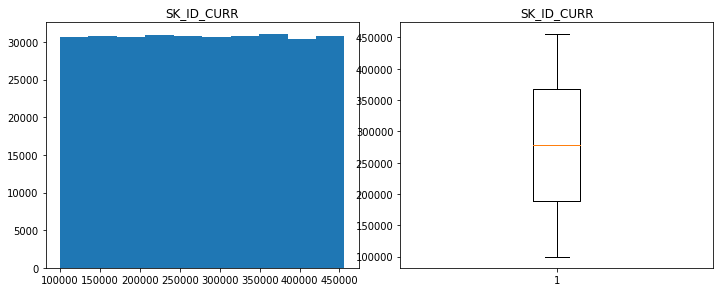

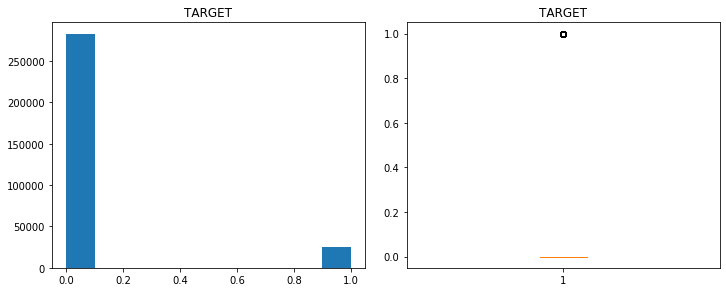

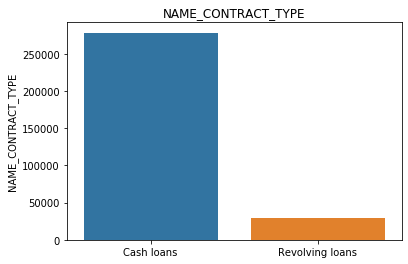

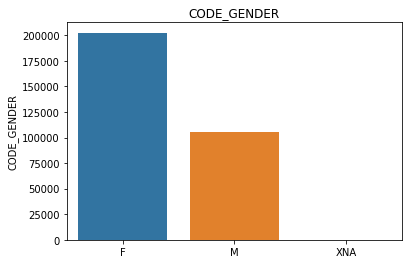

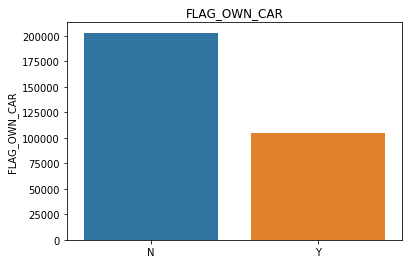

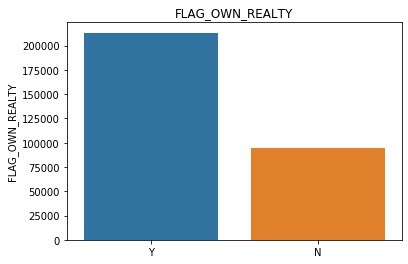

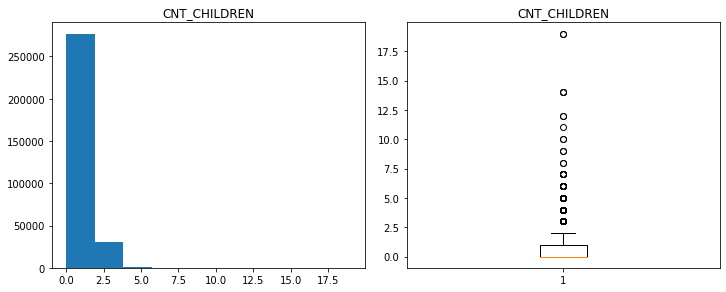

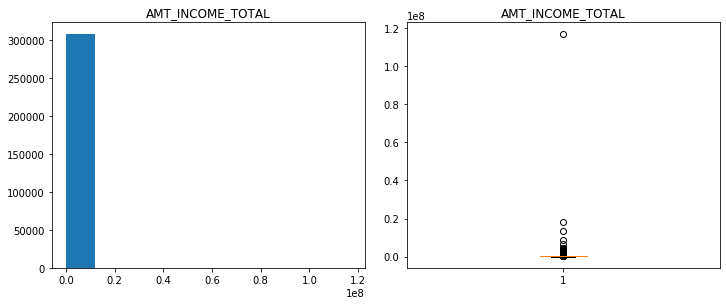

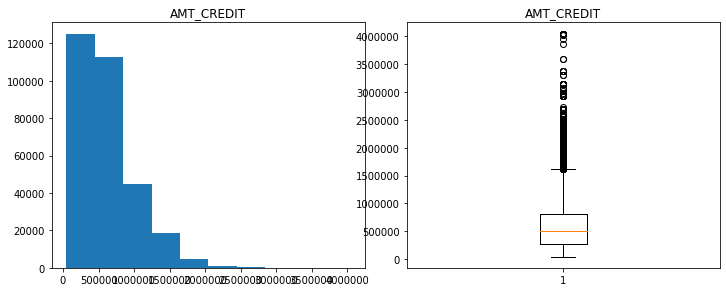

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

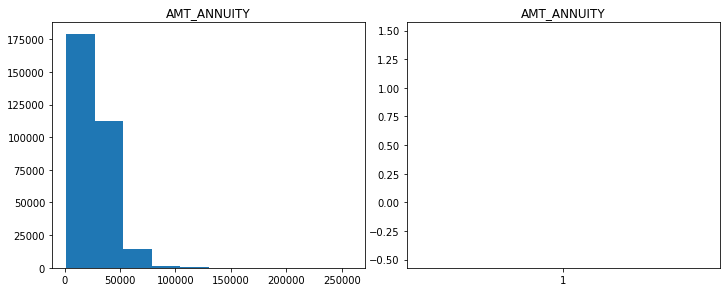

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

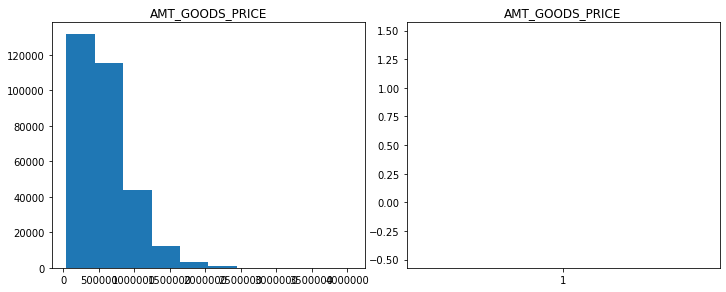

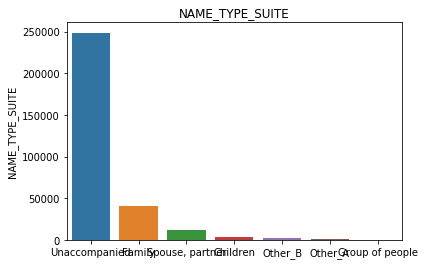

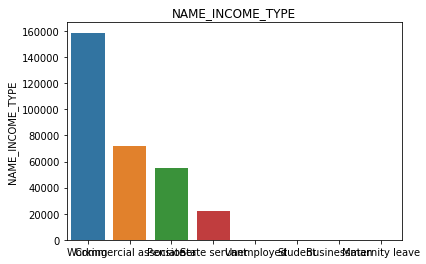

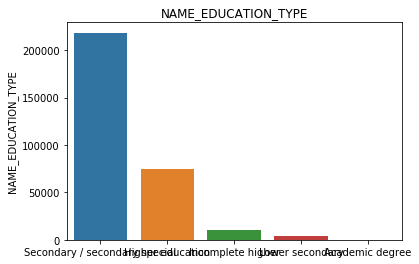

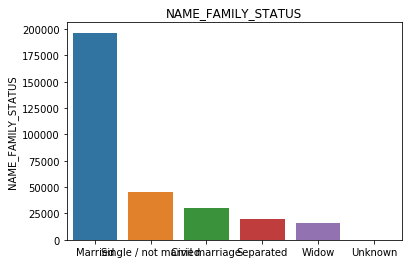

...

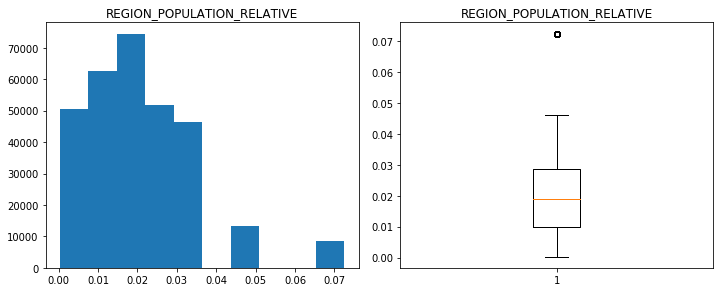

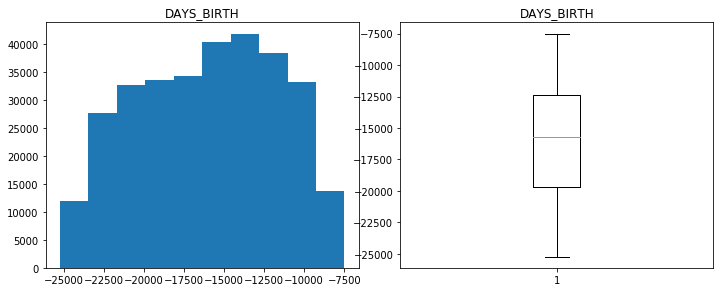

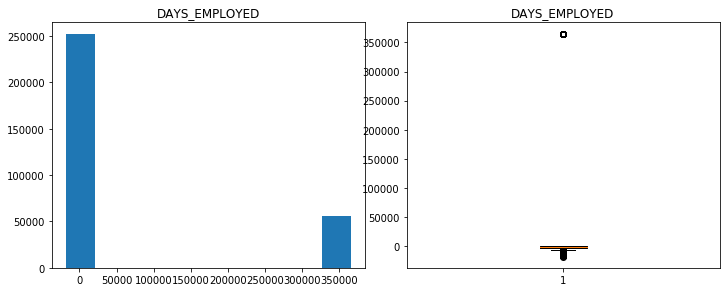

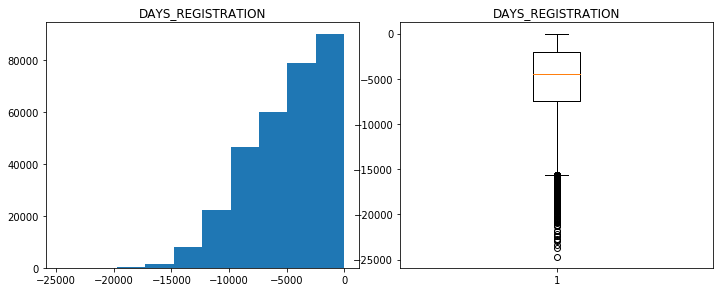

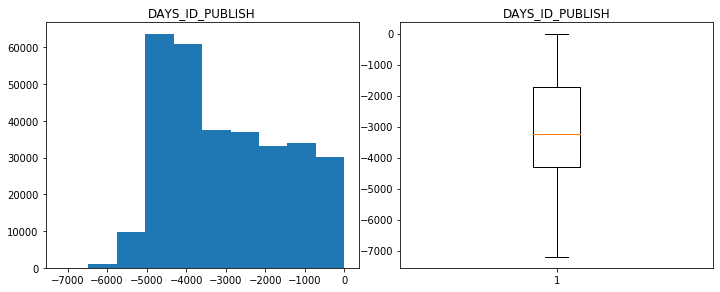

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

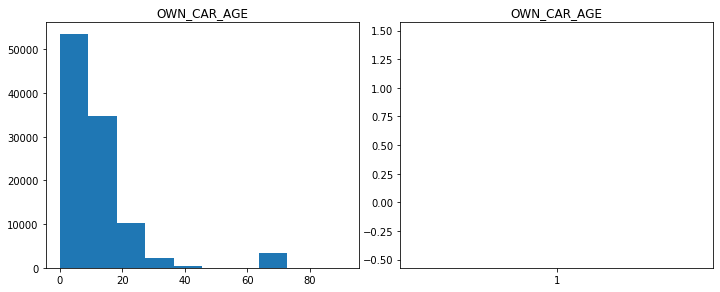

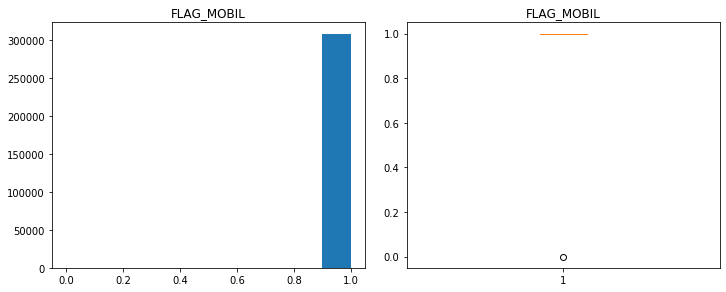

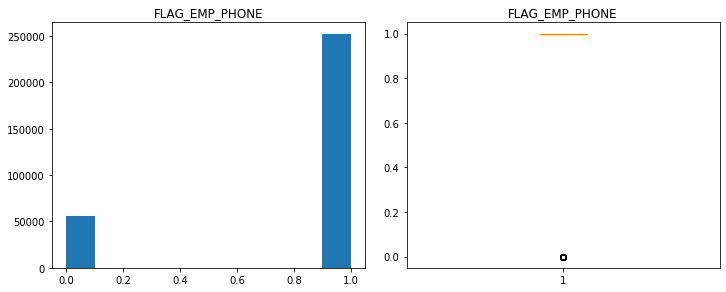

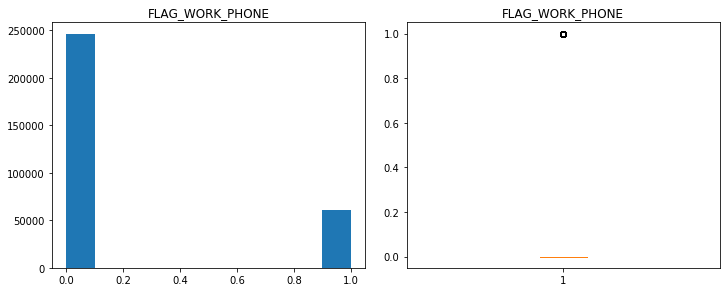

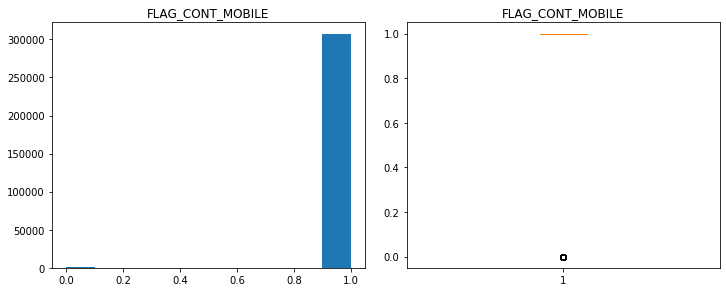

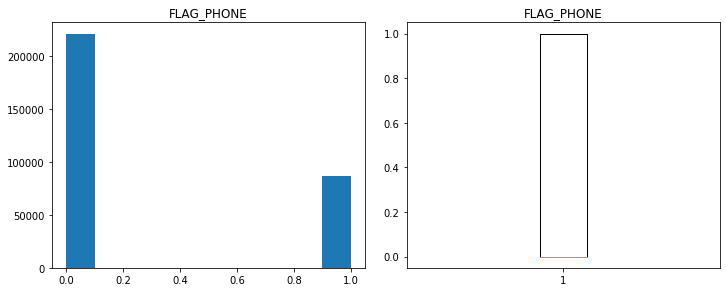

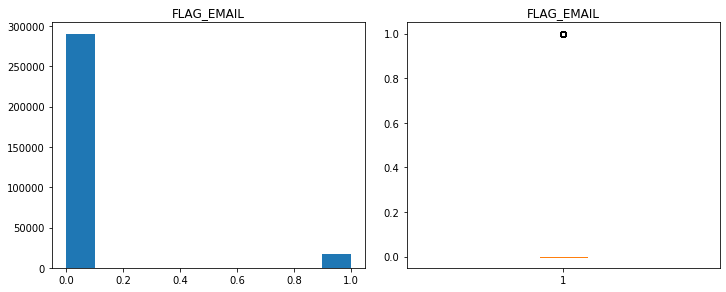

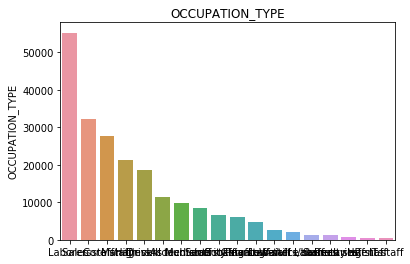

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

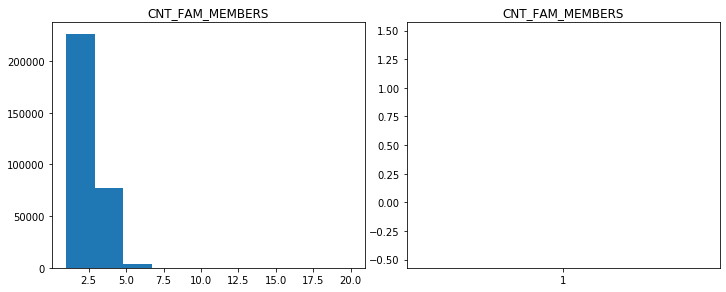

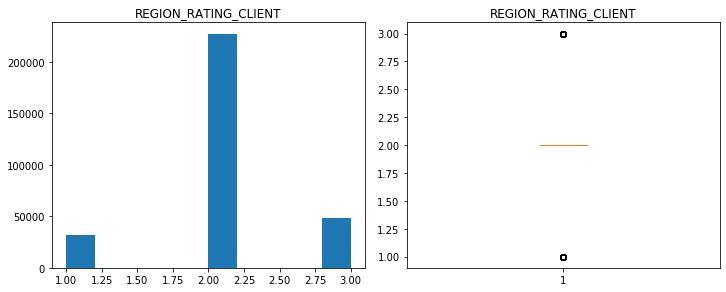

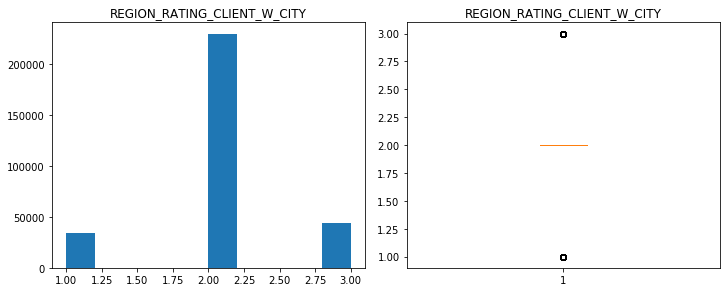

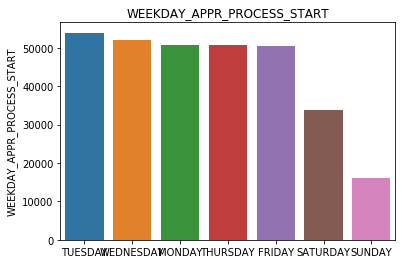

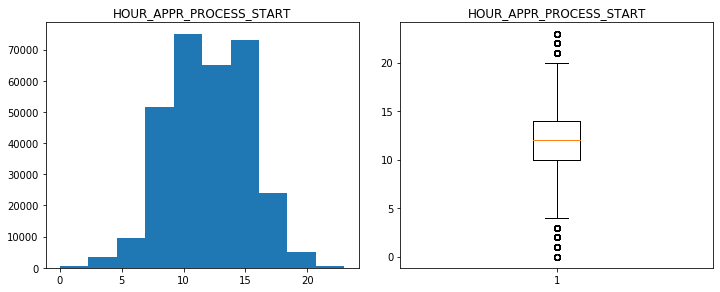

...

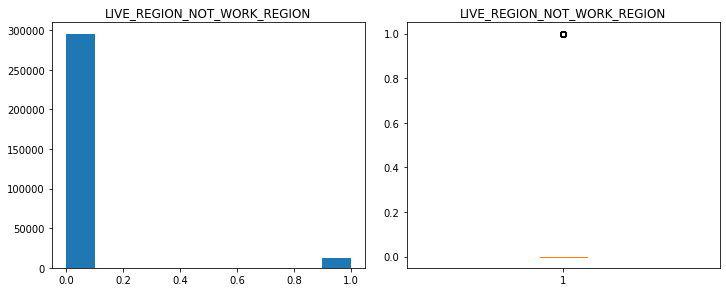

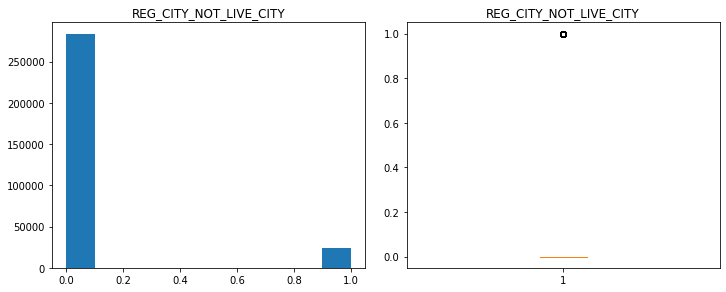

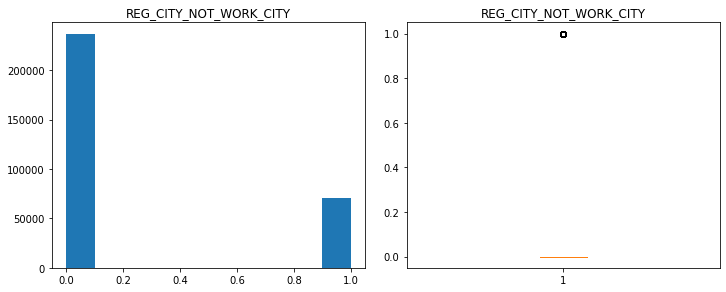

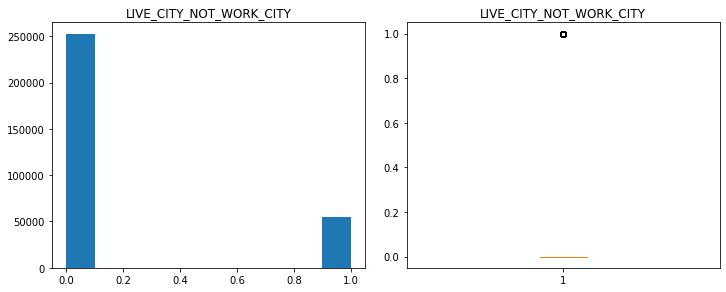

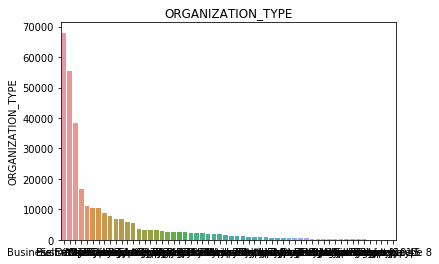

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

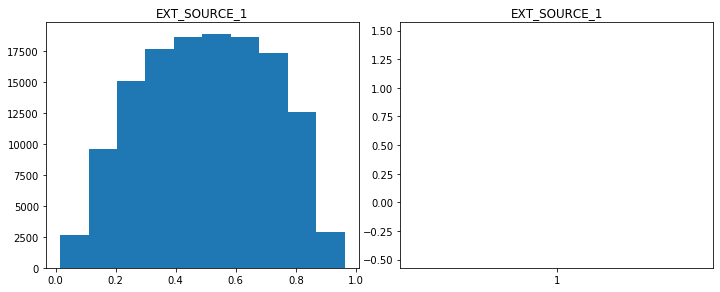

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

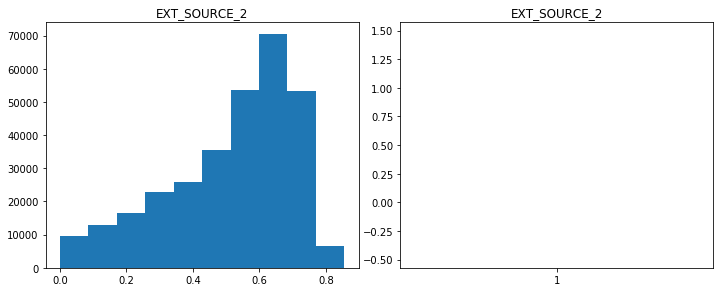

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

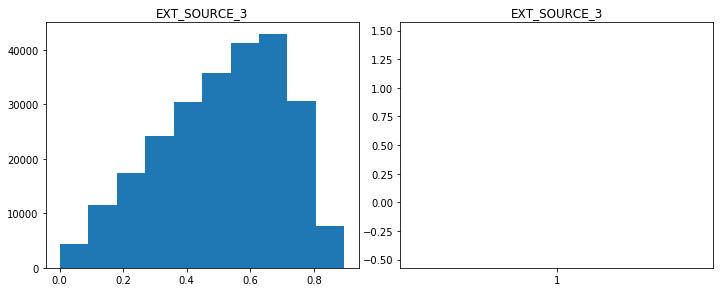

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

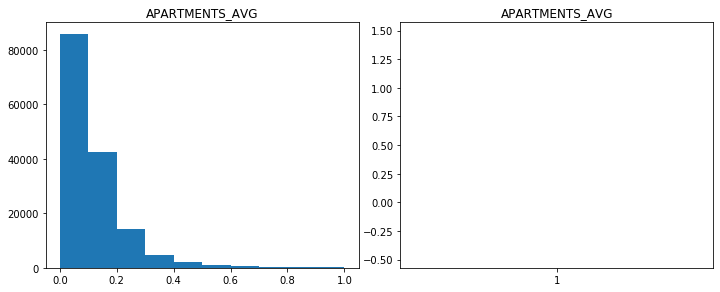

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

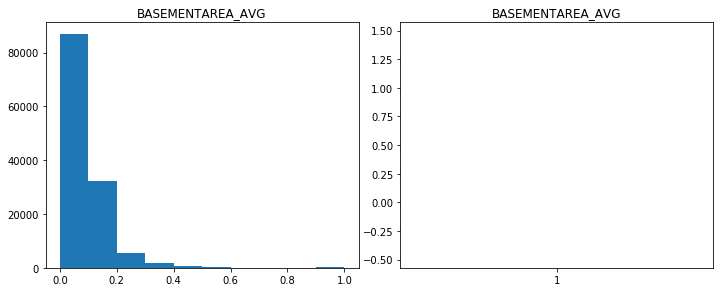

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

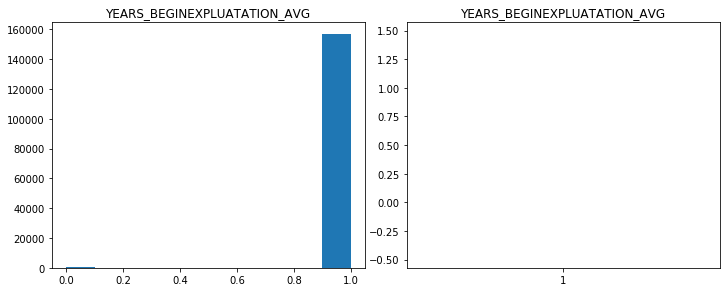

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

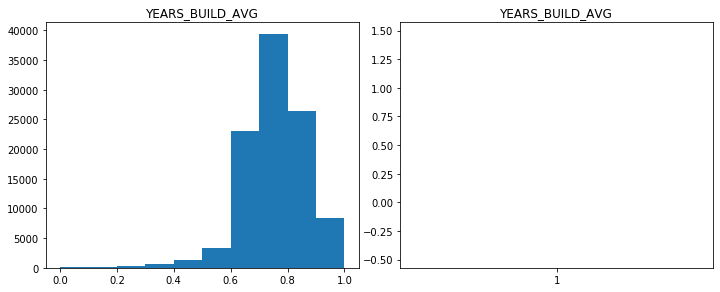

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

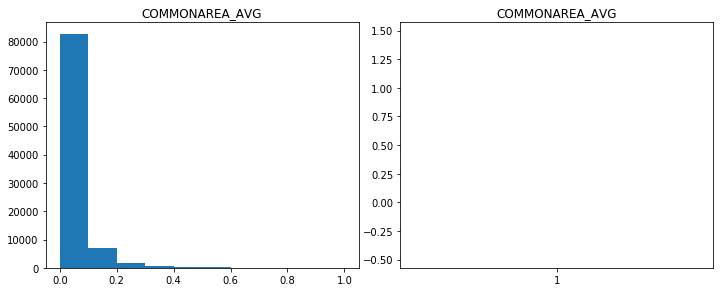

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

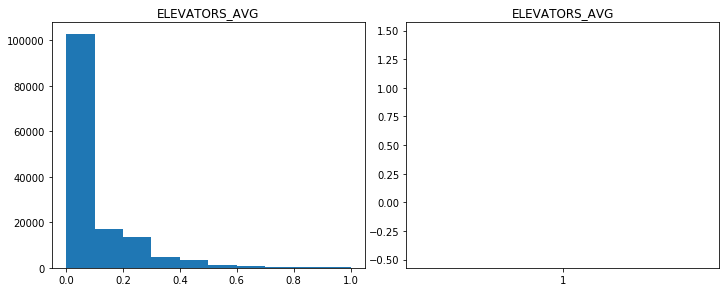

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

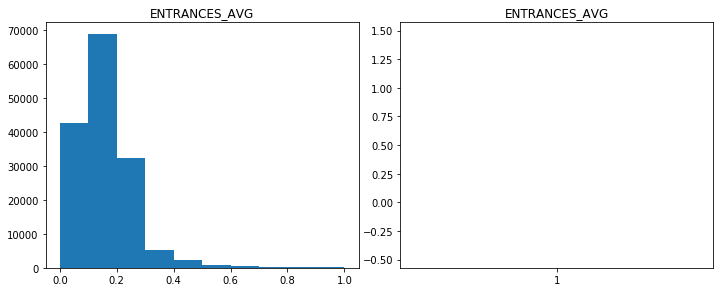

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

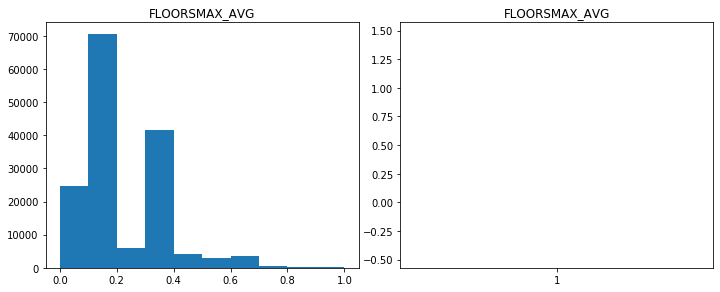

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

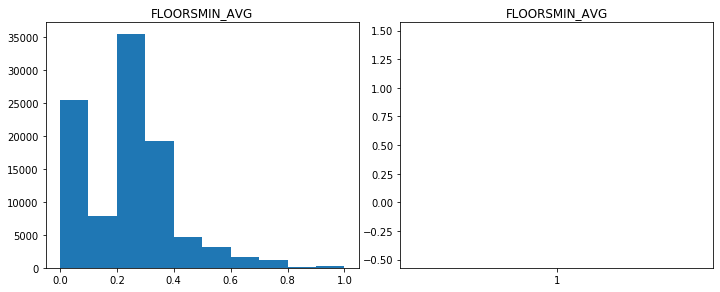

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

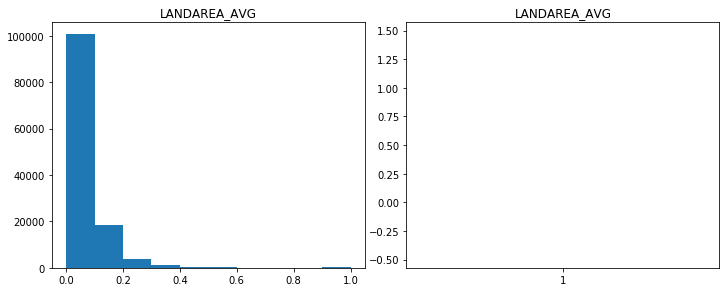

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

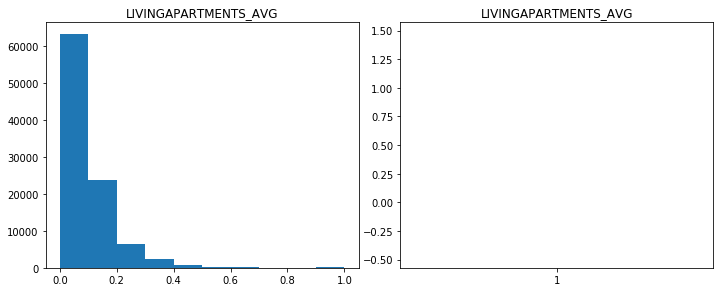

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

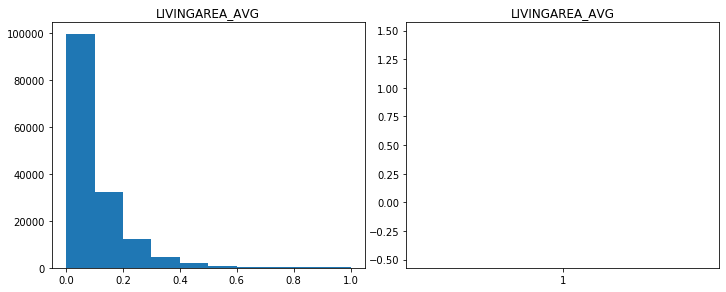

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

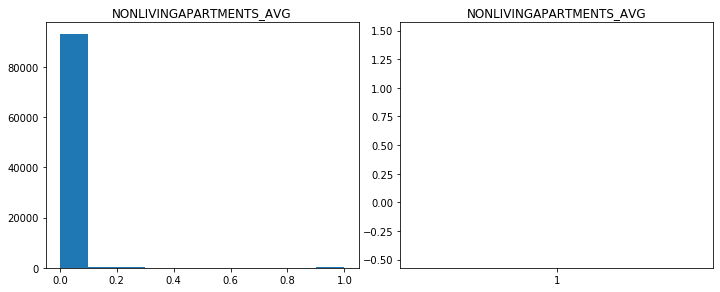

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

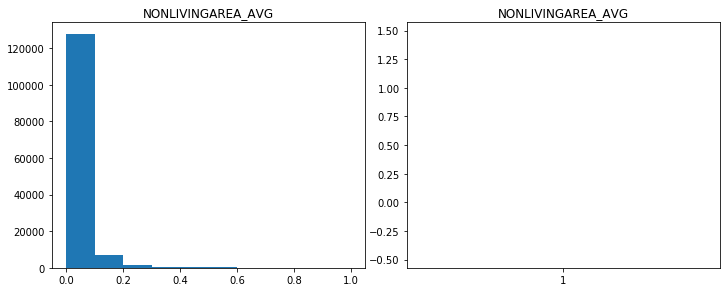

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

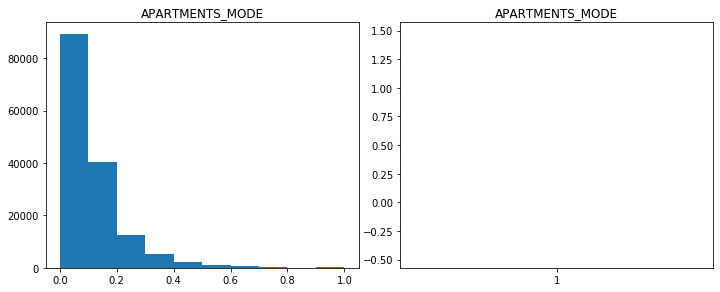

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

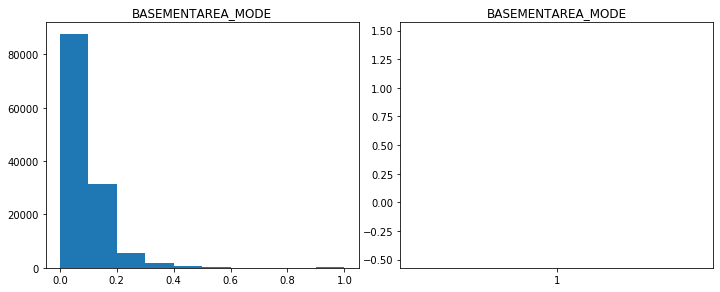

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

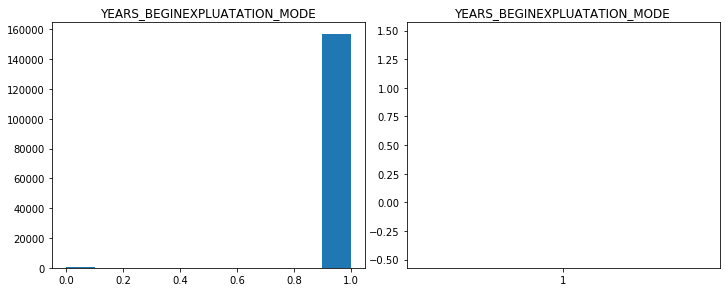

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

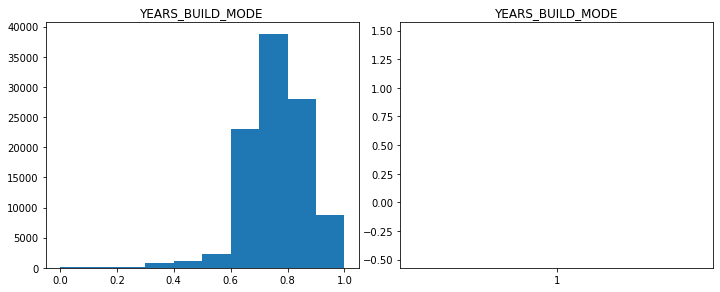

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

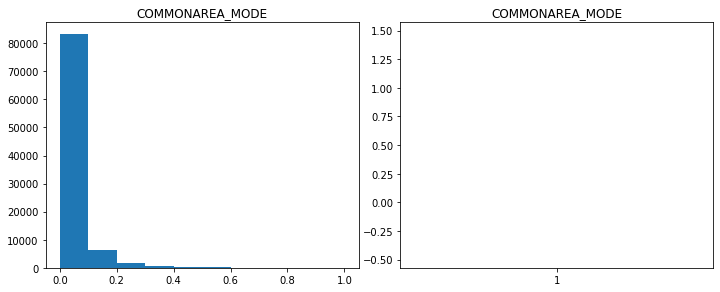

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

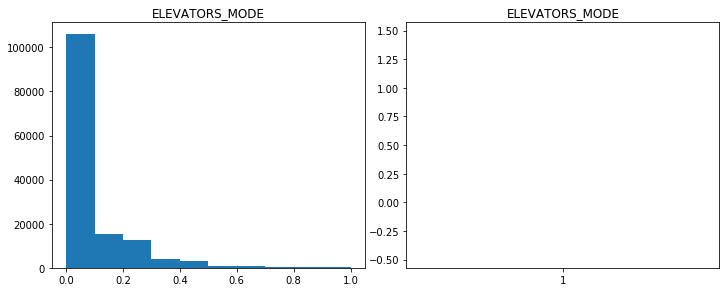

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

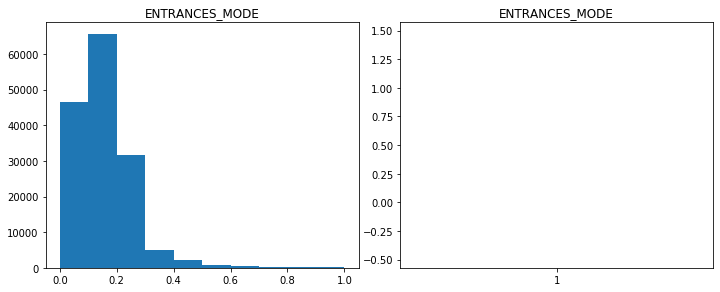

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

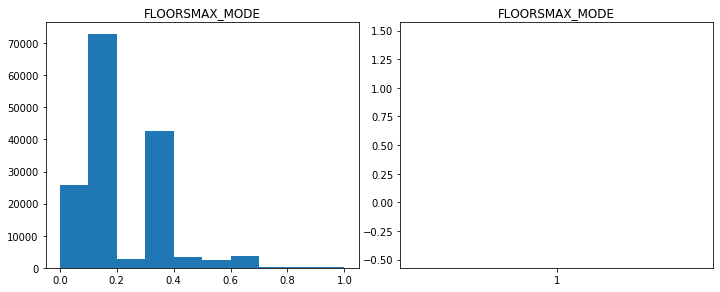

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

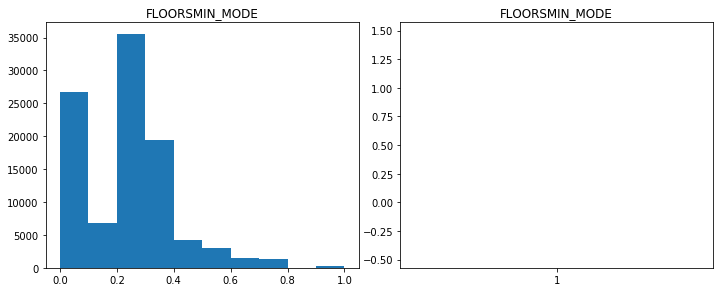

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

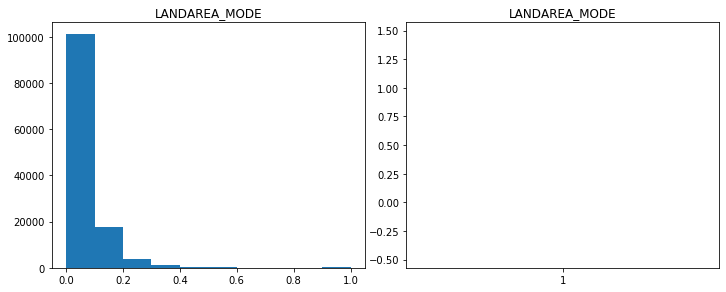

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

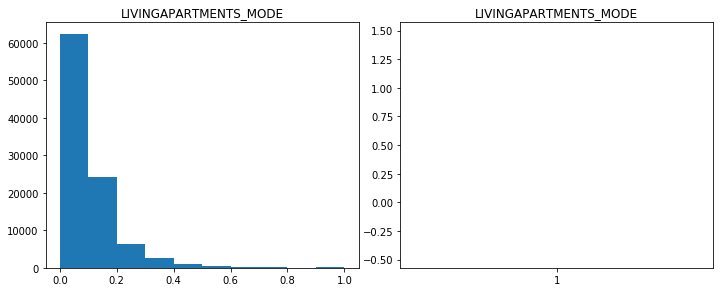

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

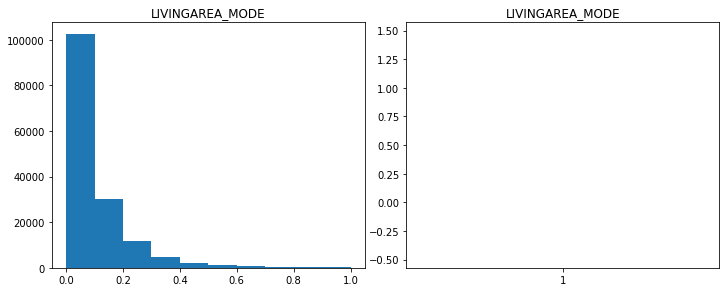

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

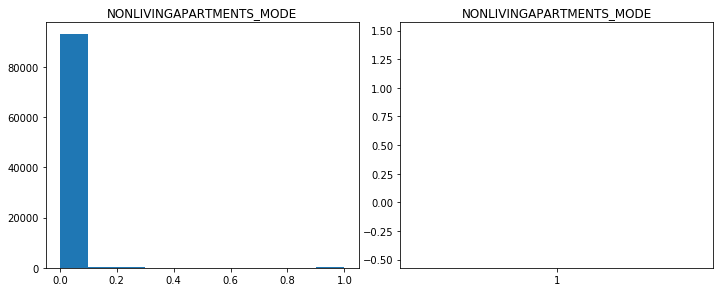

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

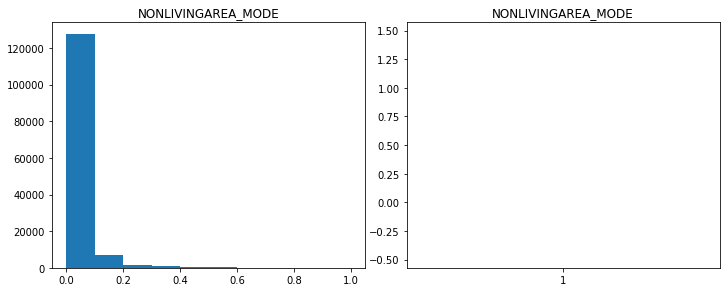

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

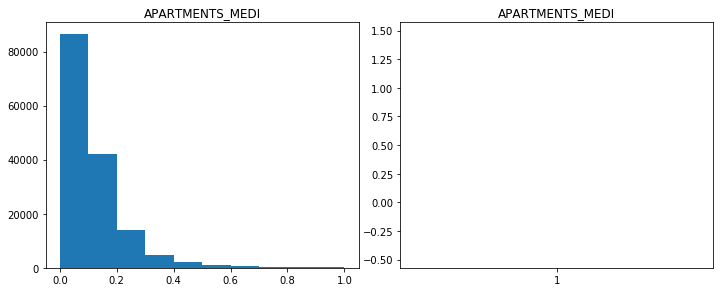

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

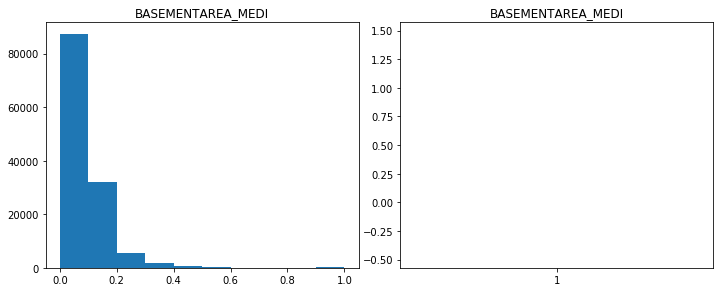

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

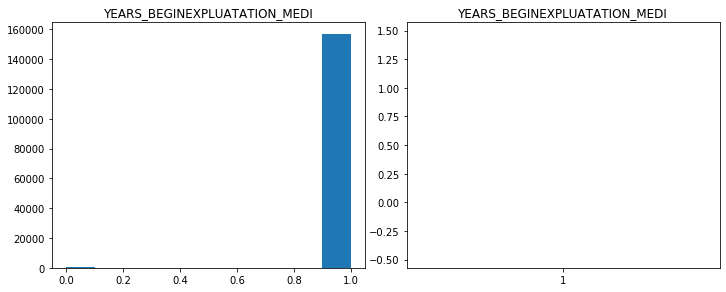

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

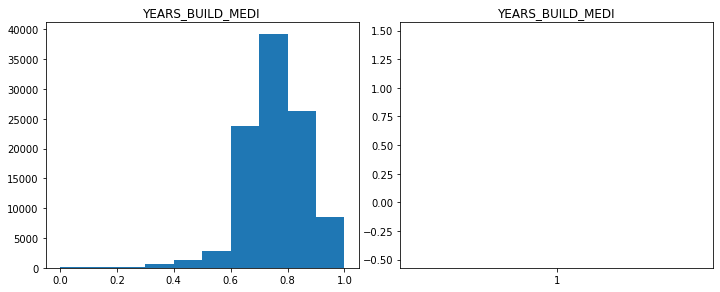

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

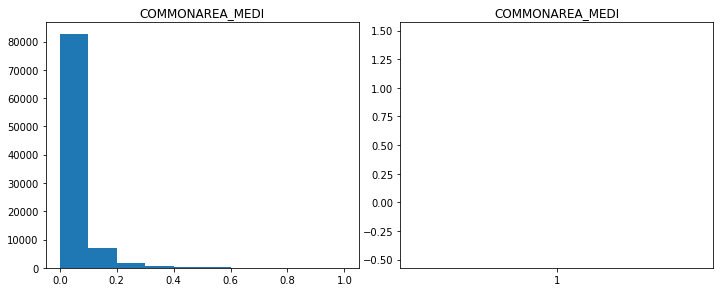

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

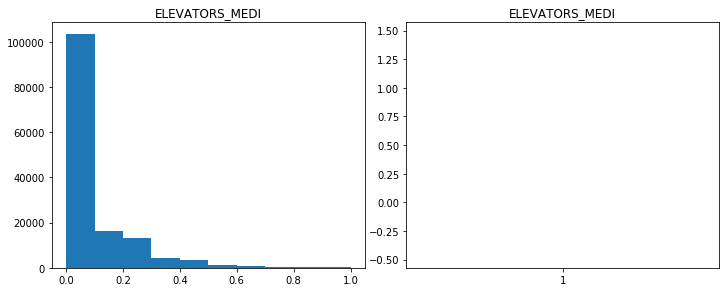

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

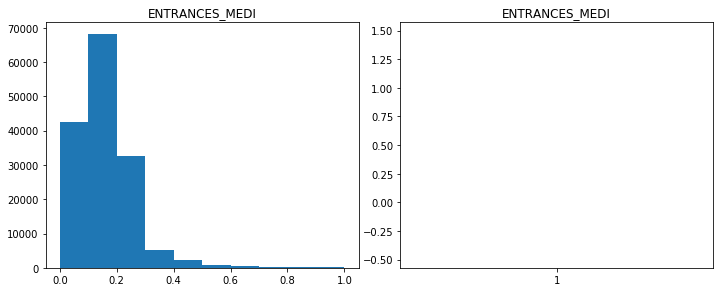

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

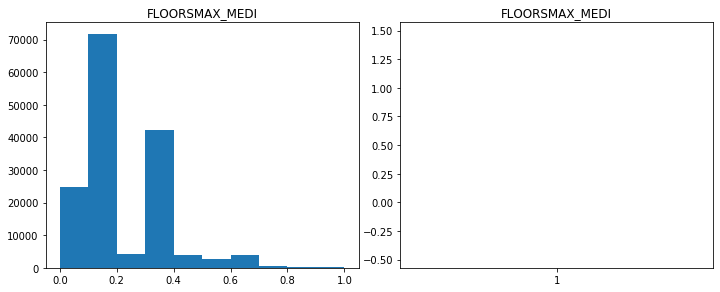

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

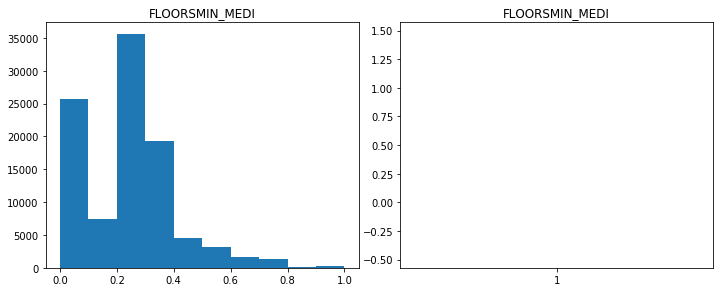

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

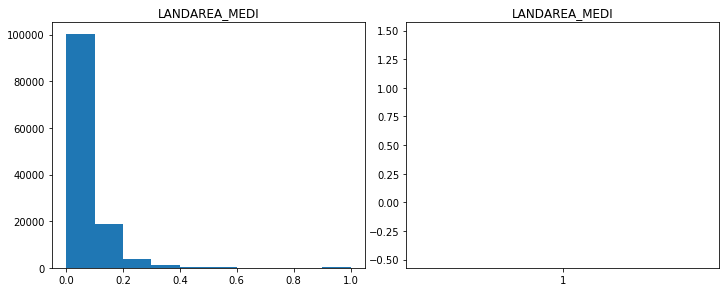

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

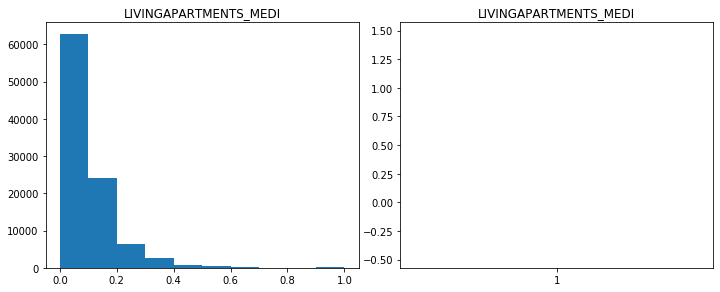

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

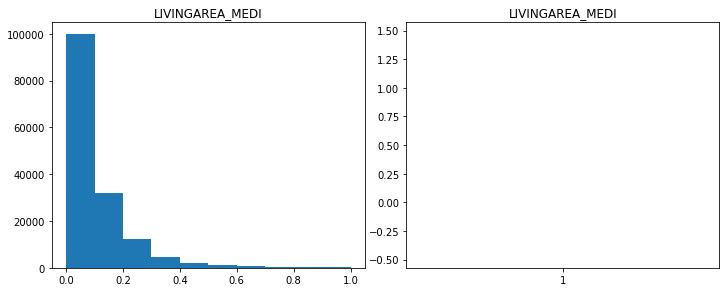

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

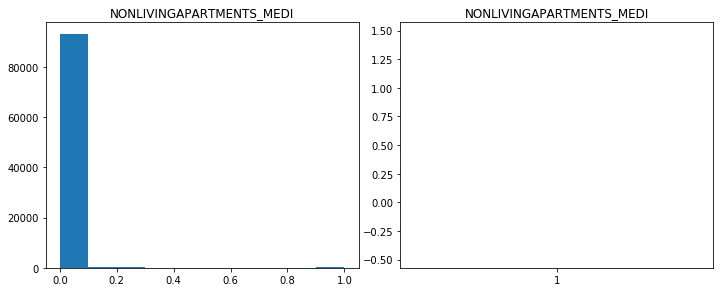

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

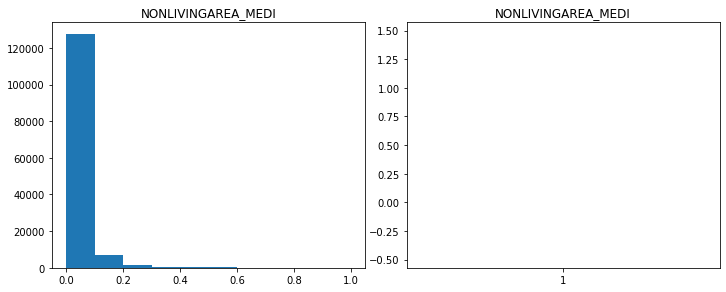

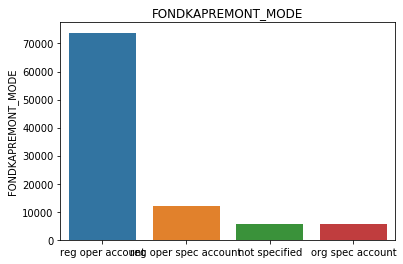

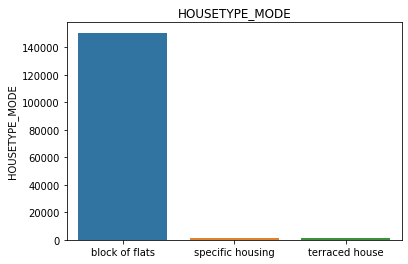

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

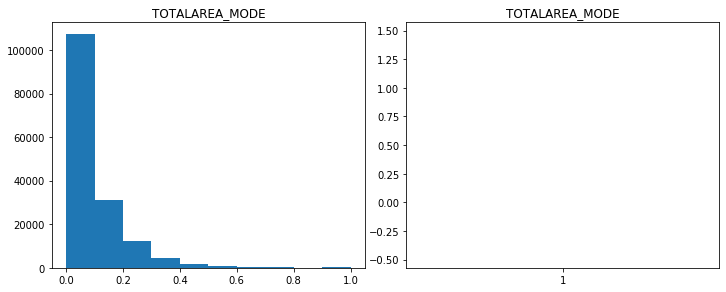

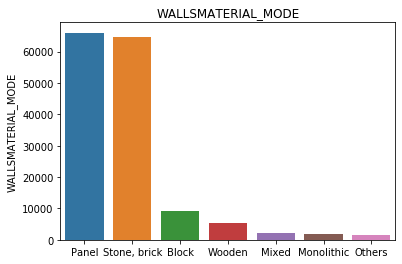

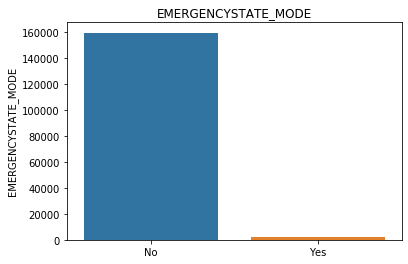

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

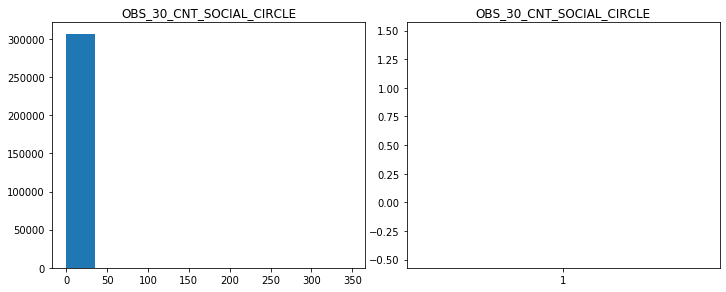

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

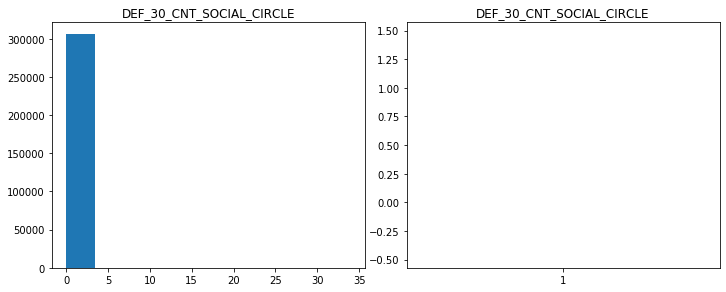

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

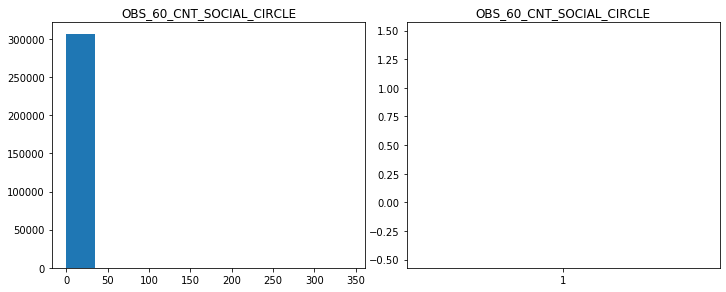

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

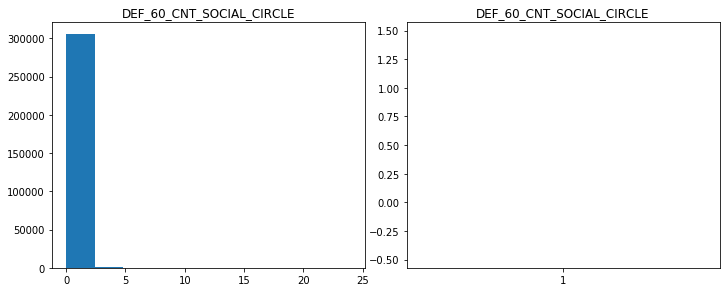

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

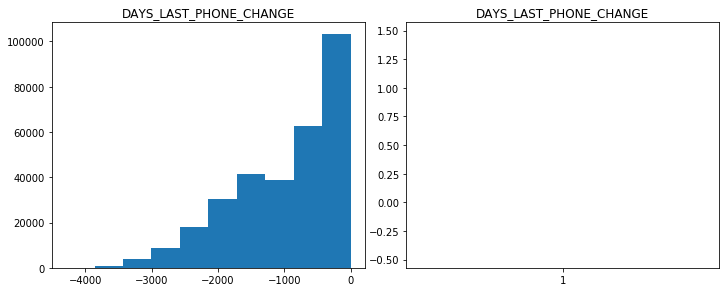

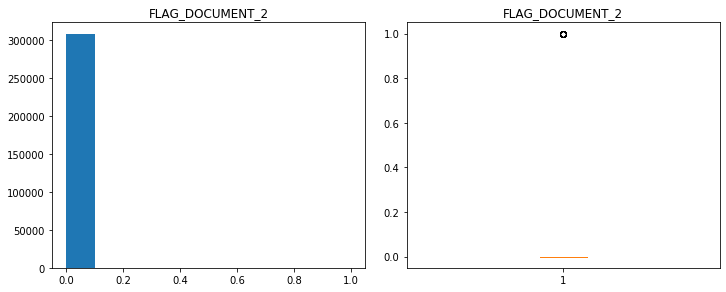

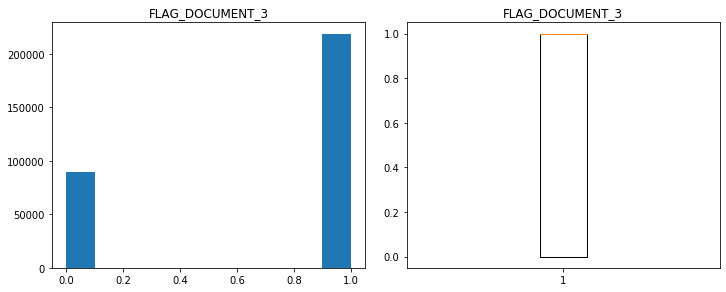

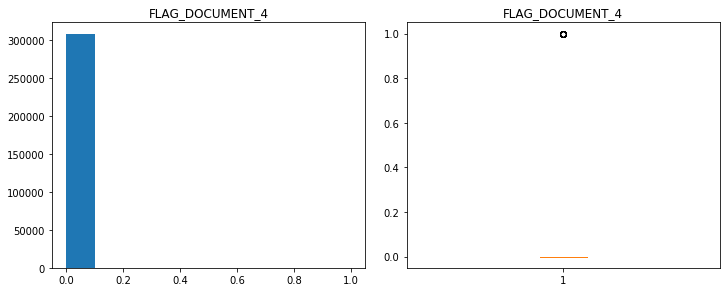

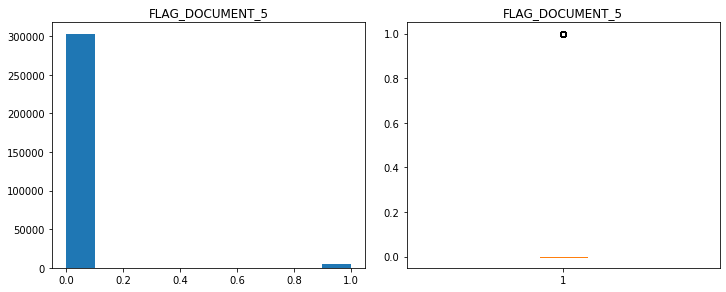

...

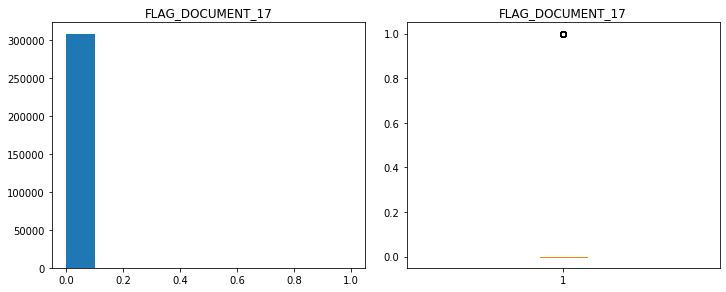

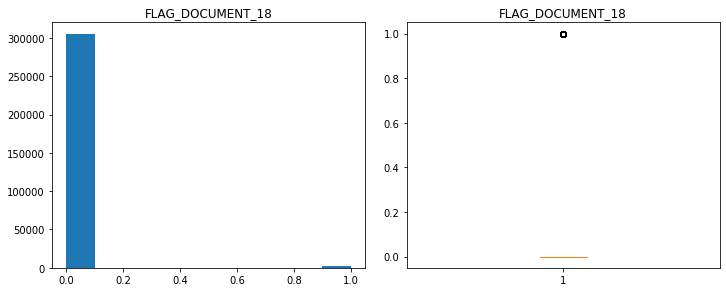

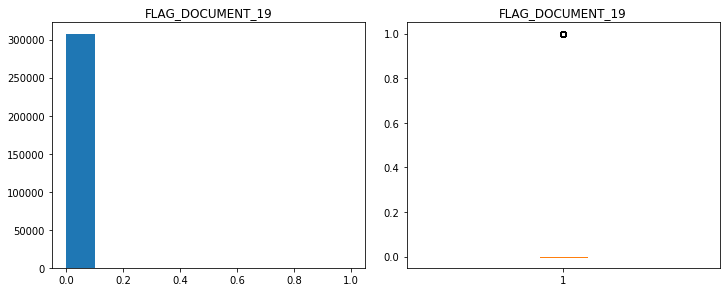

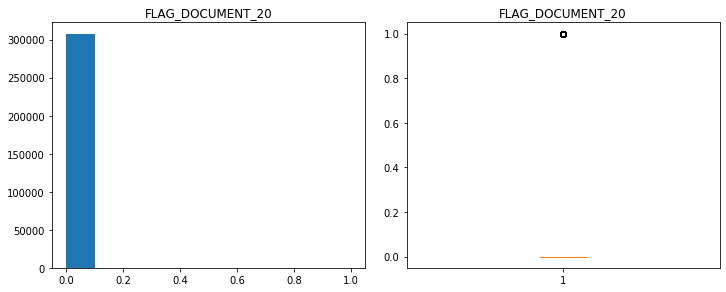

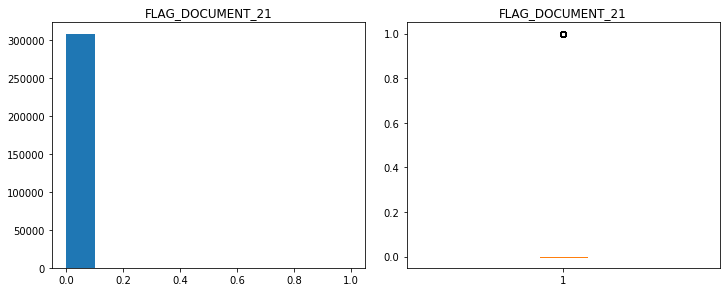

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

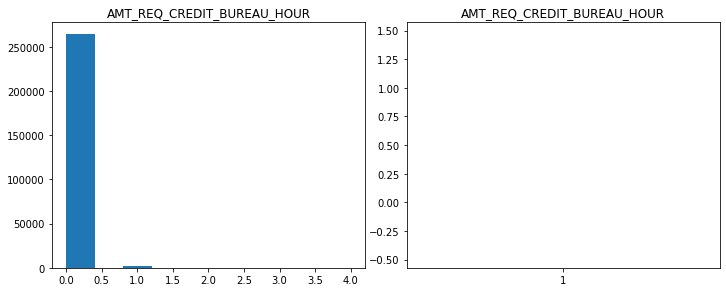

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

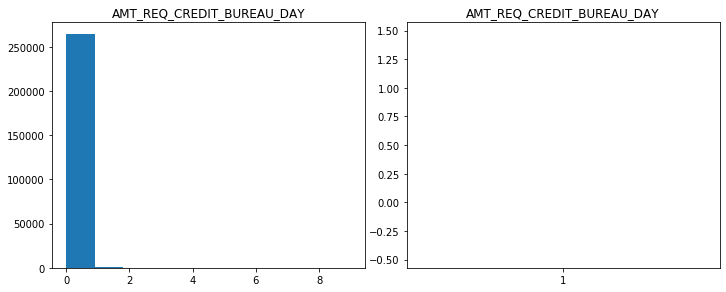

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

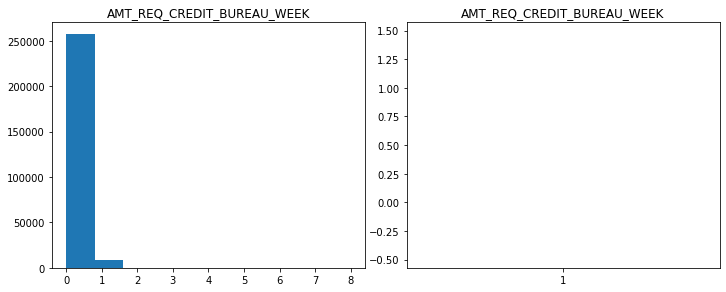

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

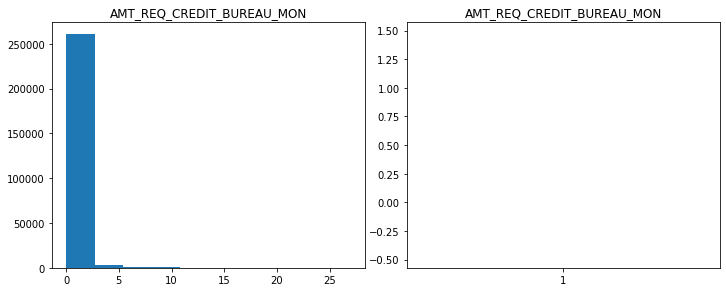

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

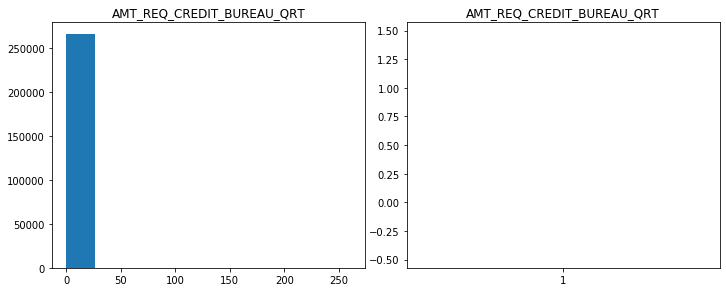

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

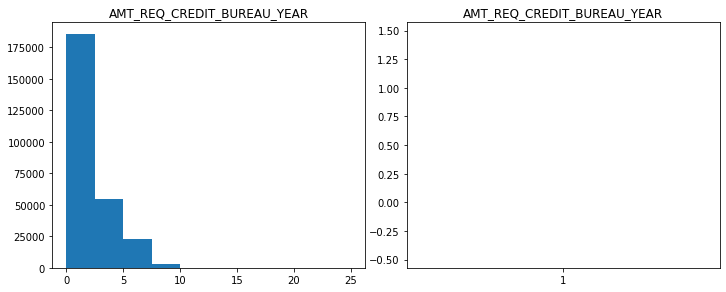

In [14]:
univar_analysis(app_train)

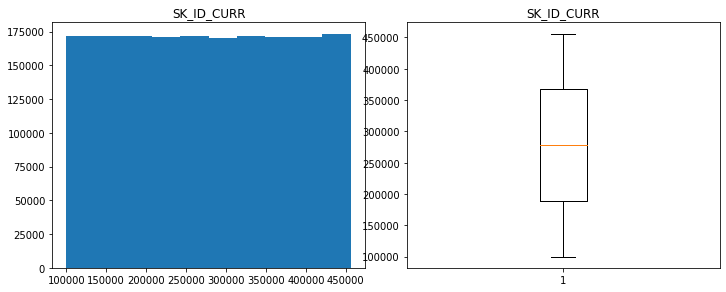

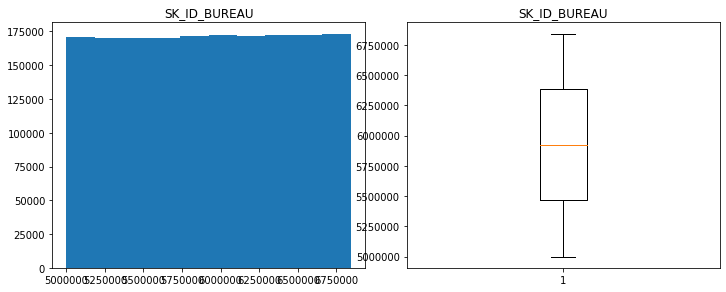

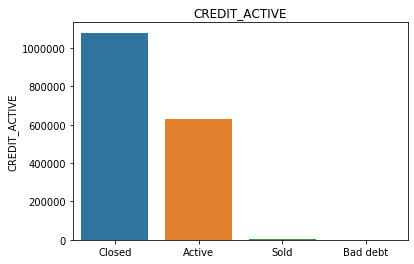

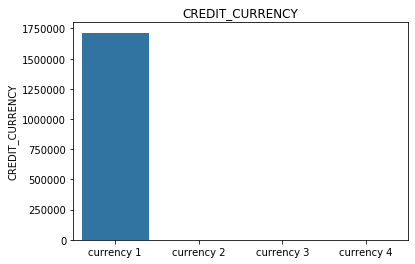

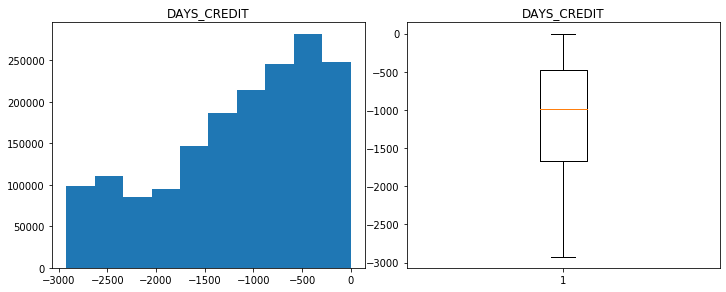

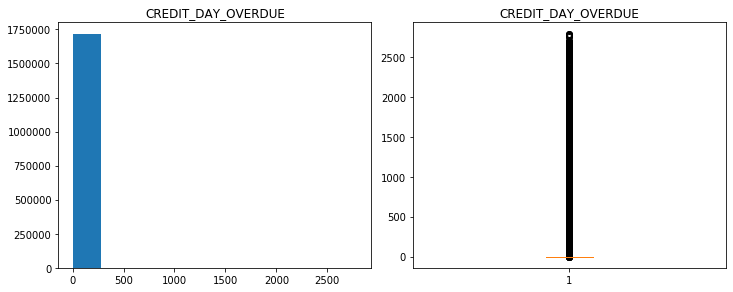

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

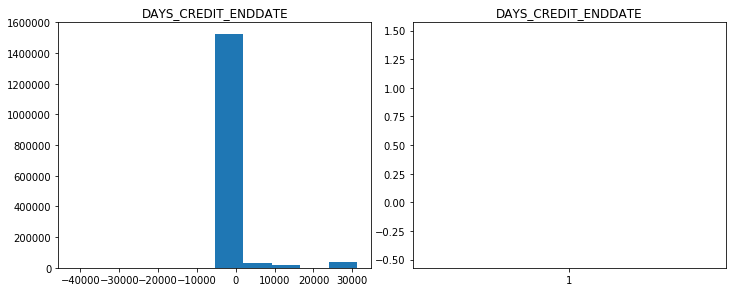

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

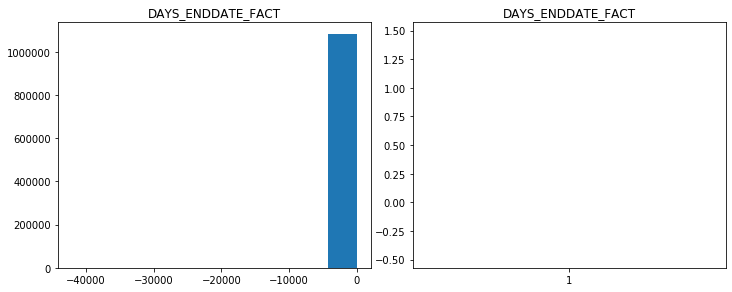

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

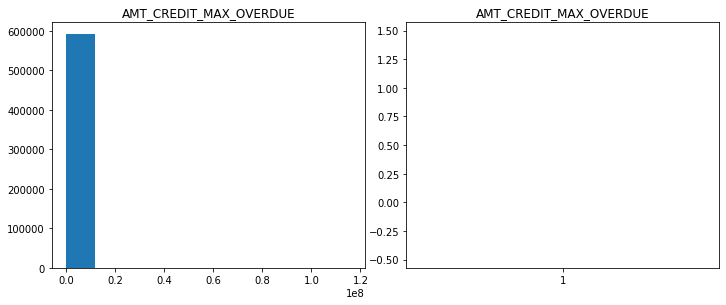

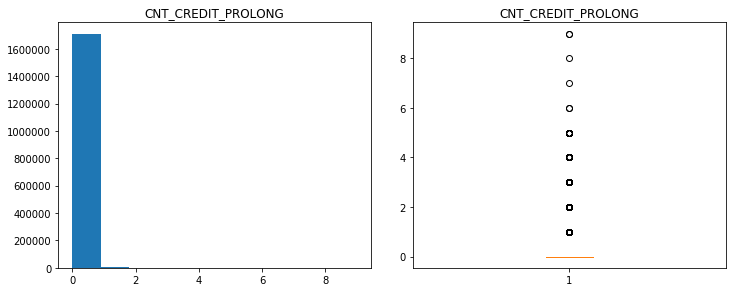

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

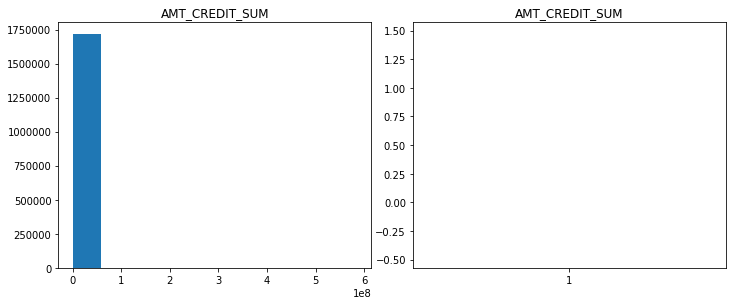

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

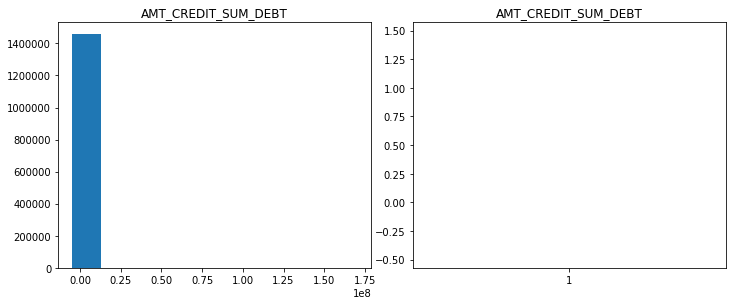

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

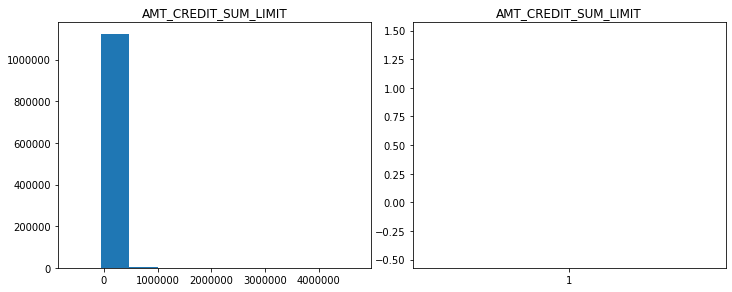

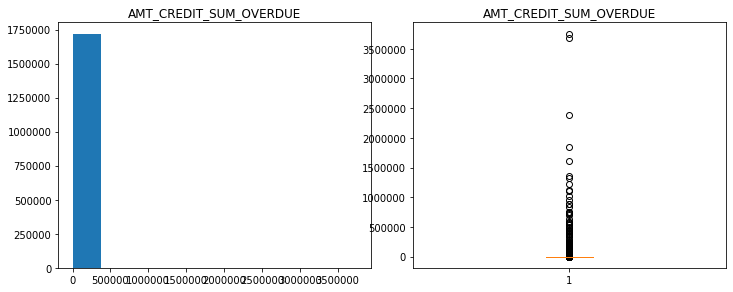

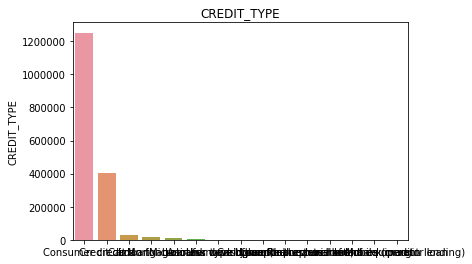

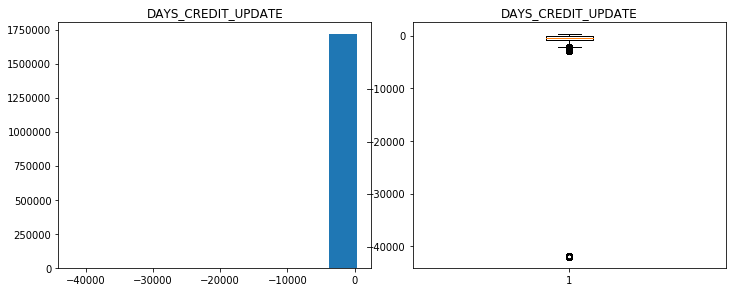

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

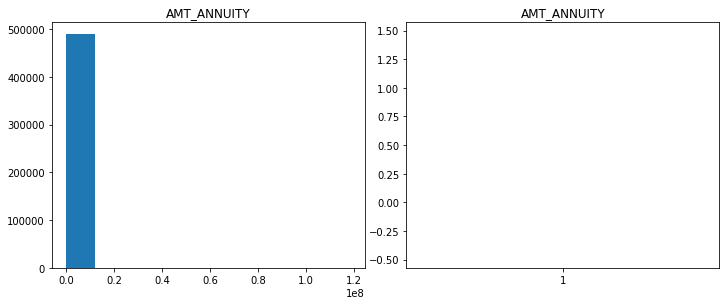

In [15]:
univar_analysis(bur)

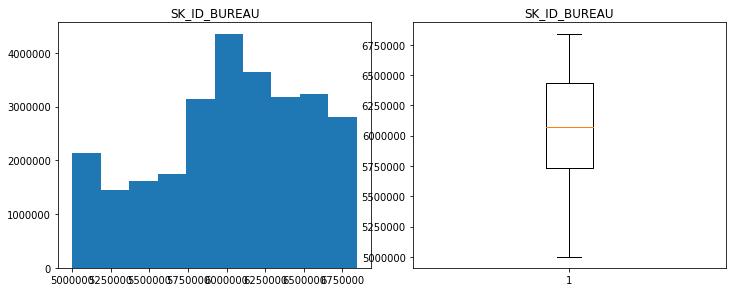

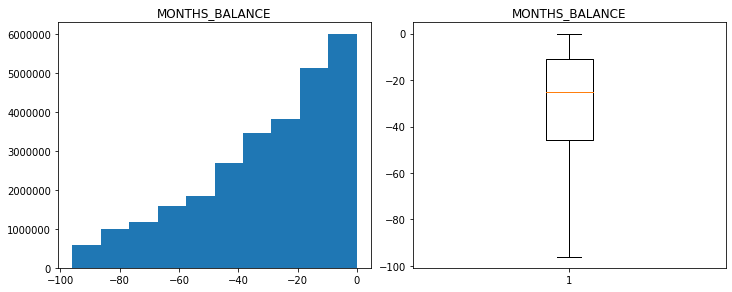

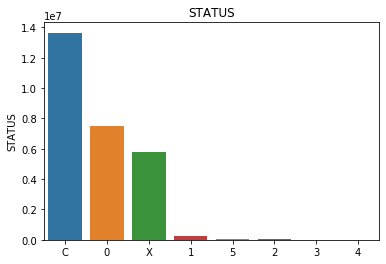

In [16]:
univar_analysis(bur_bal)

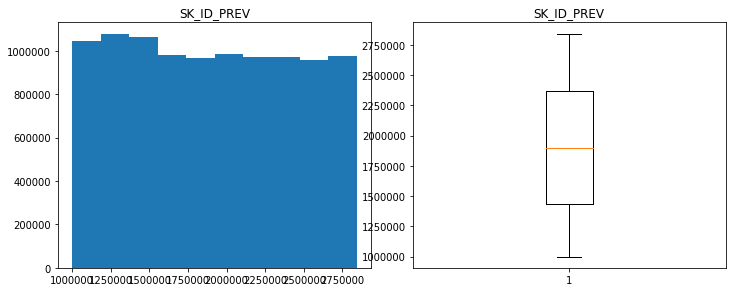

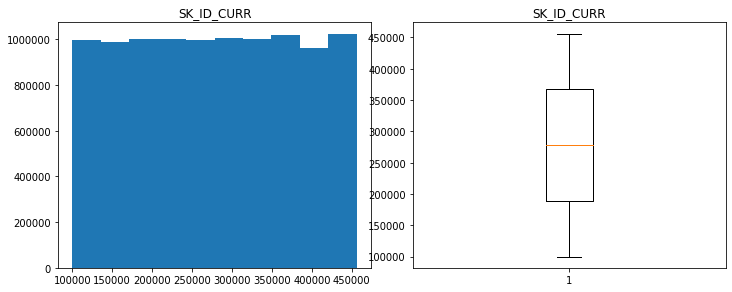

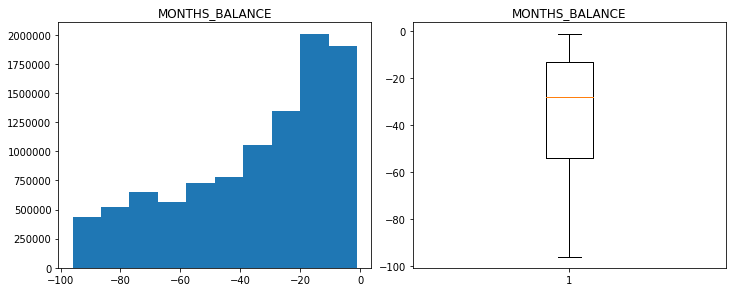

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

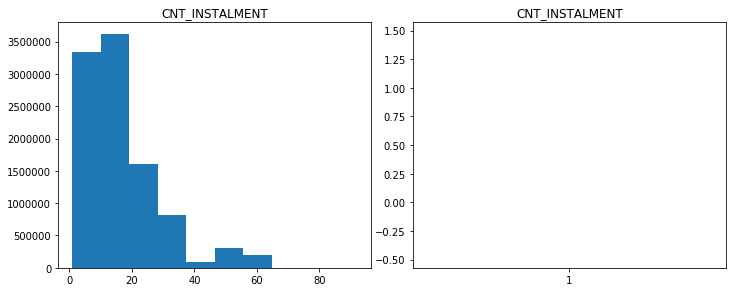

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

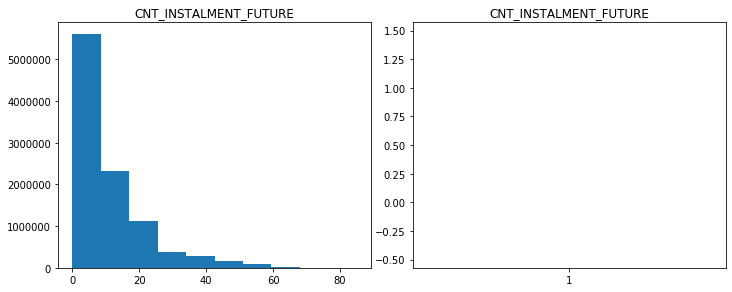

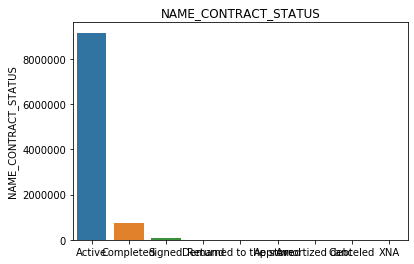

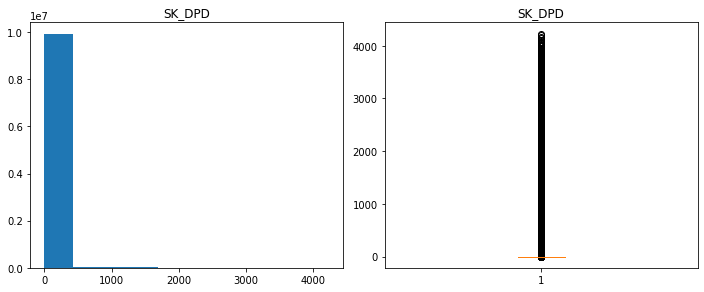

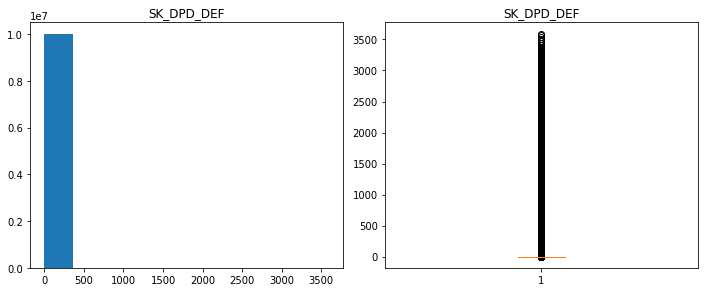

In [17]:
univar_analysis(pos)

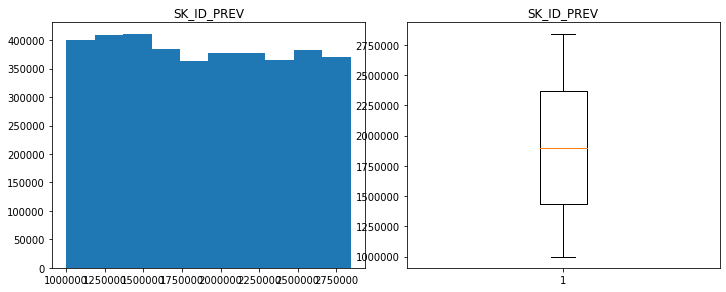

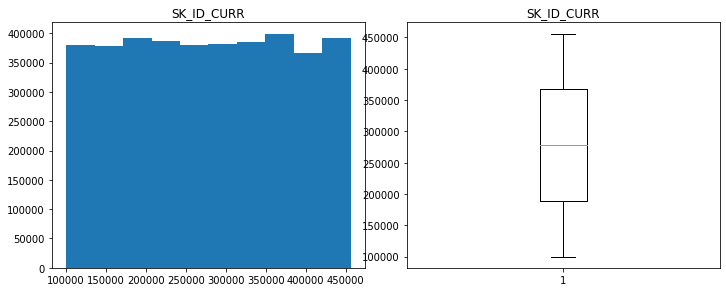

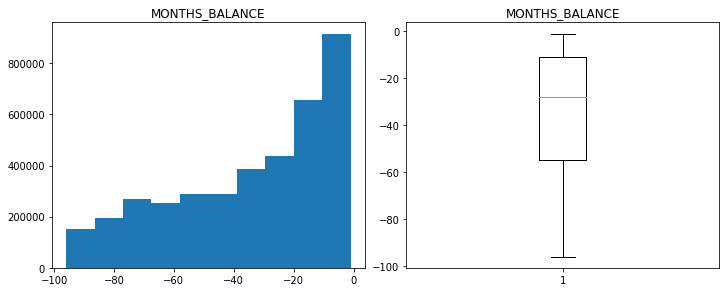

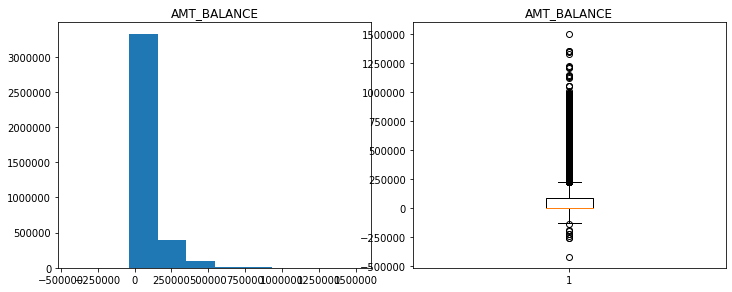

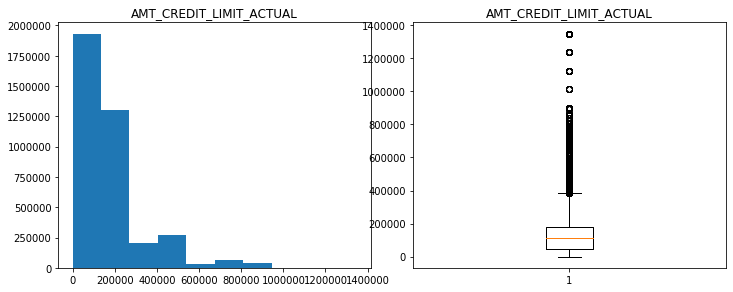

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

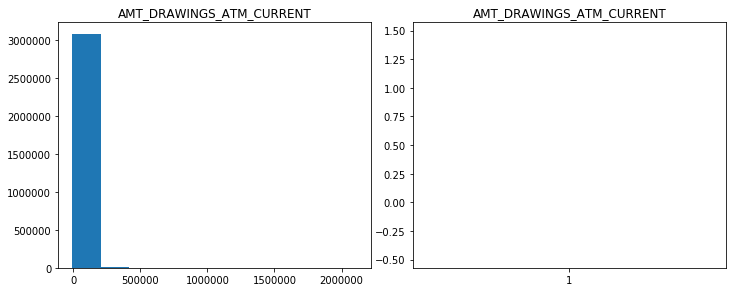

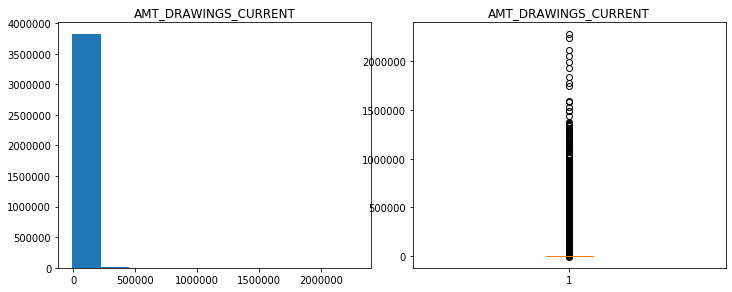

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

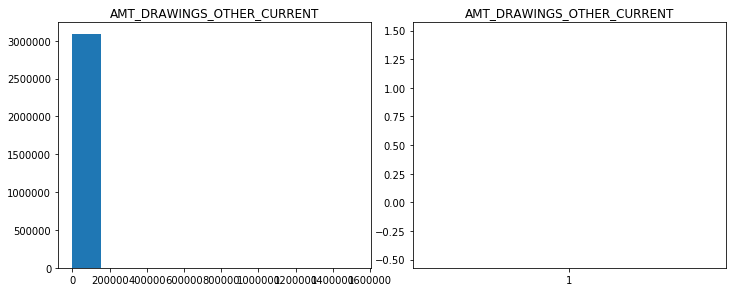

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

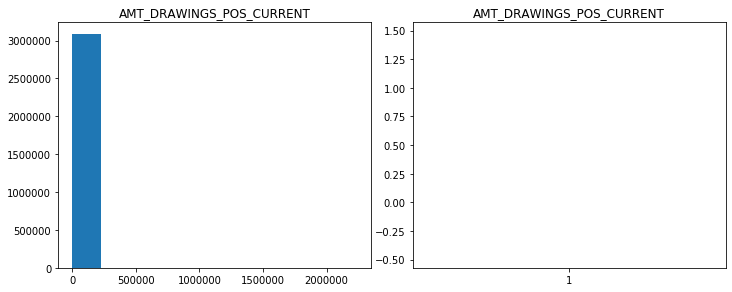

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

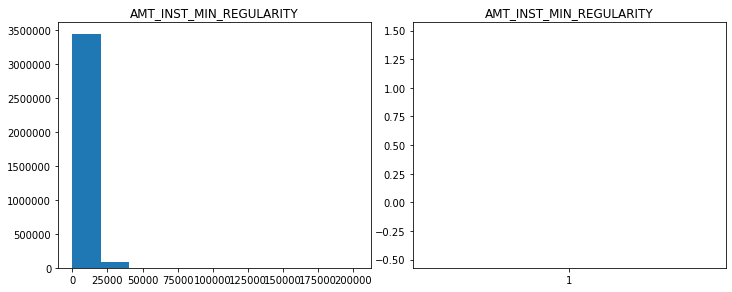

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

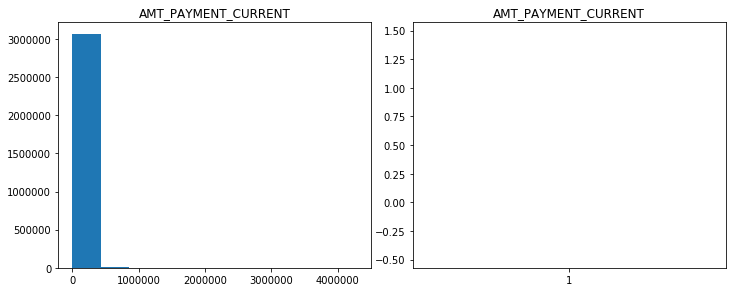

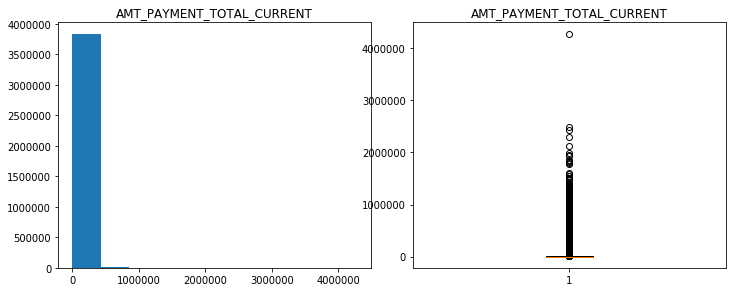

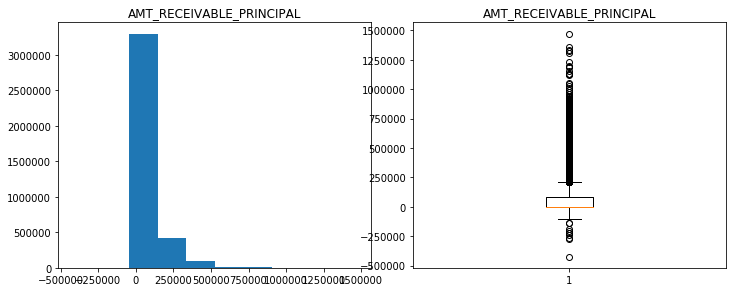

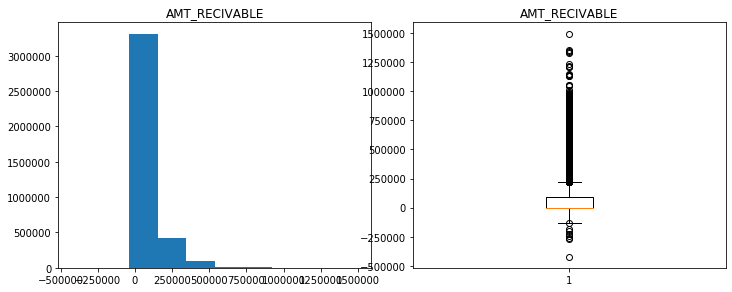

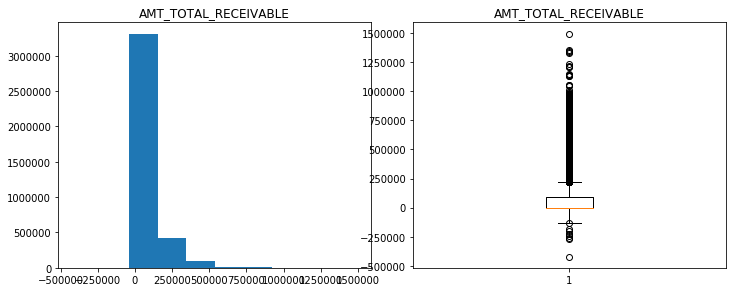

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

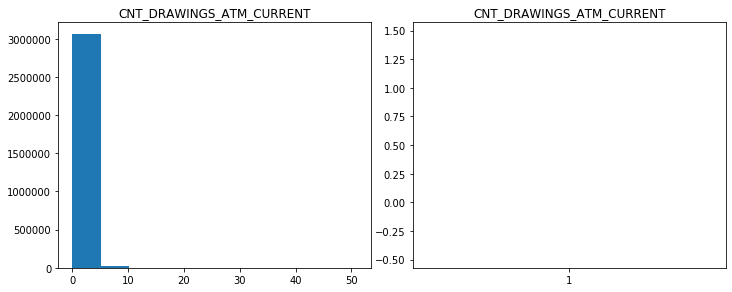

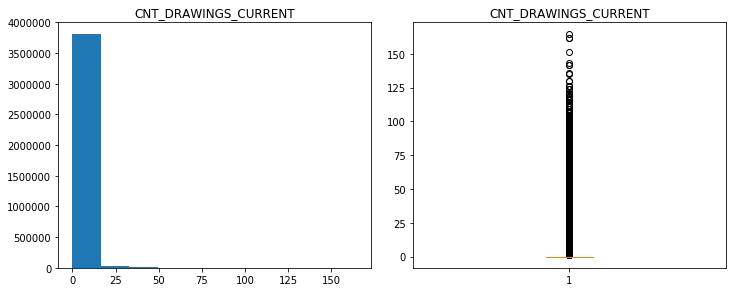

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

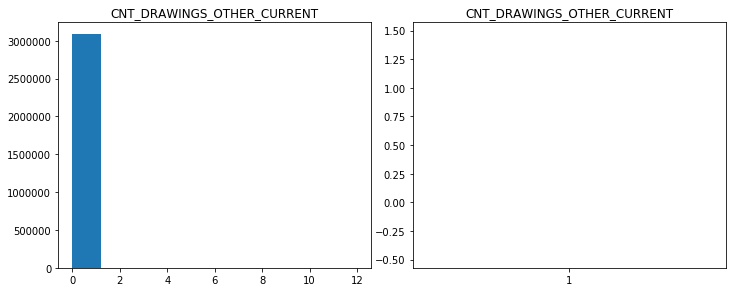

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

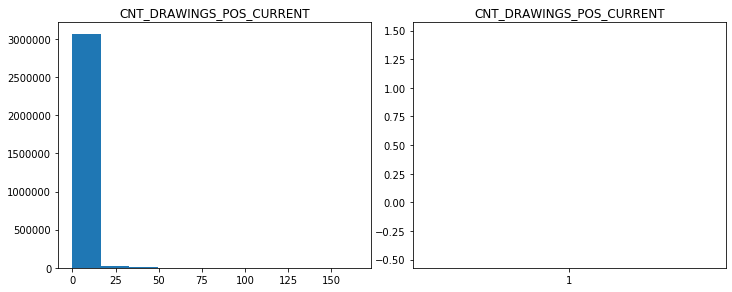

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

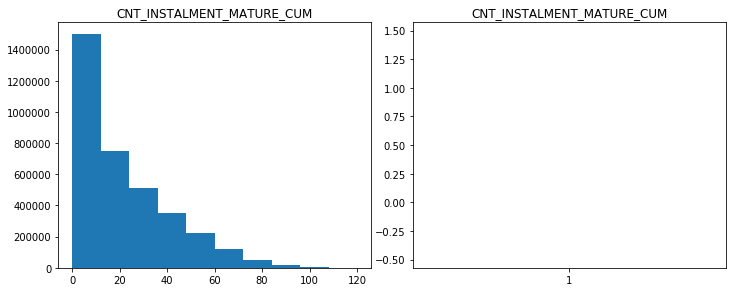

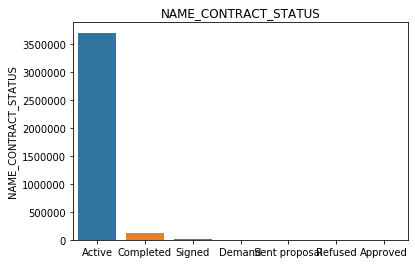

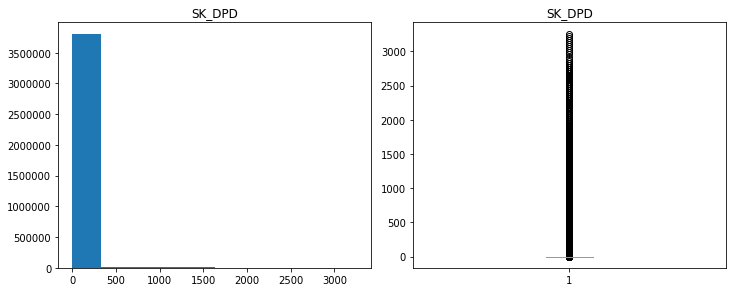

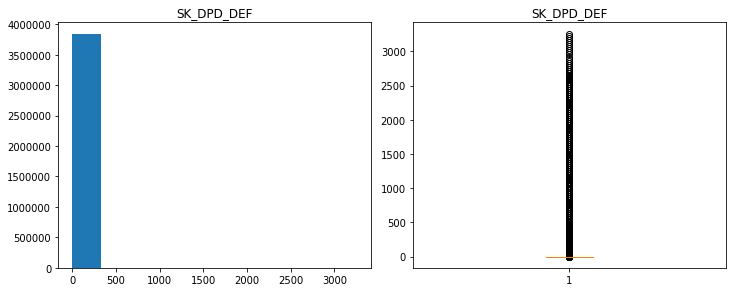

In [18]:
univar_analysis(cc_bal)

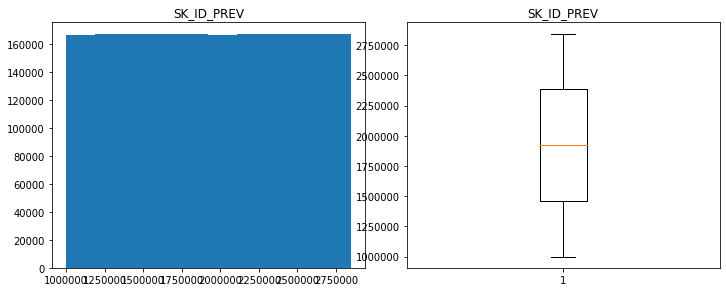

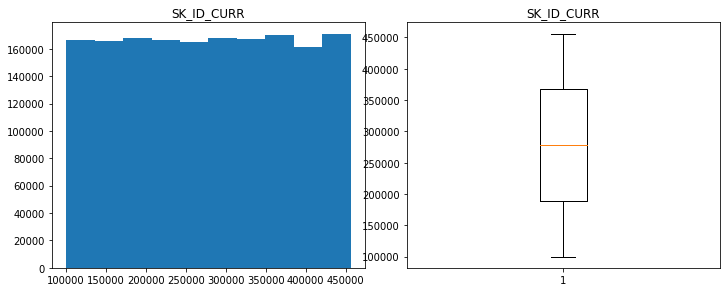

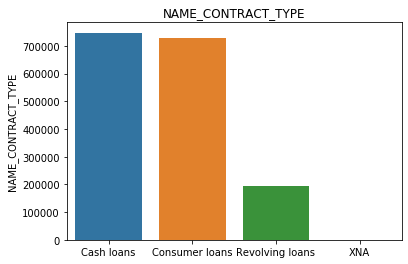

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

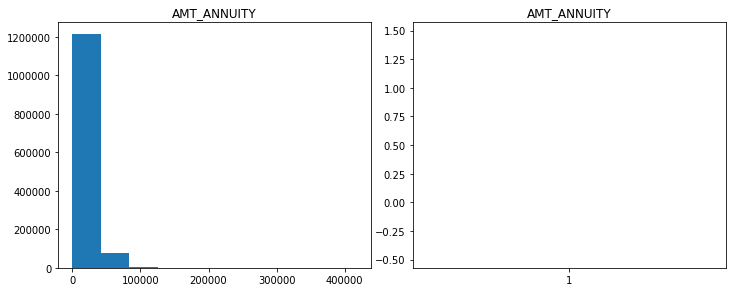

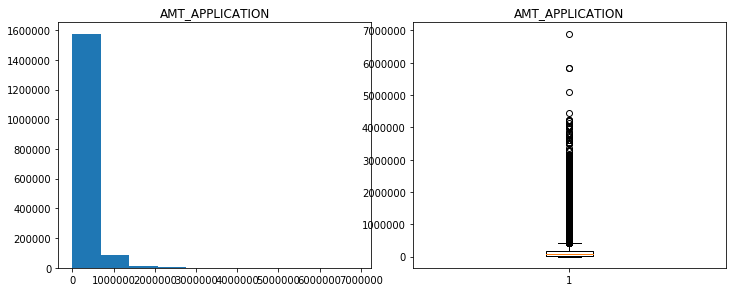

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

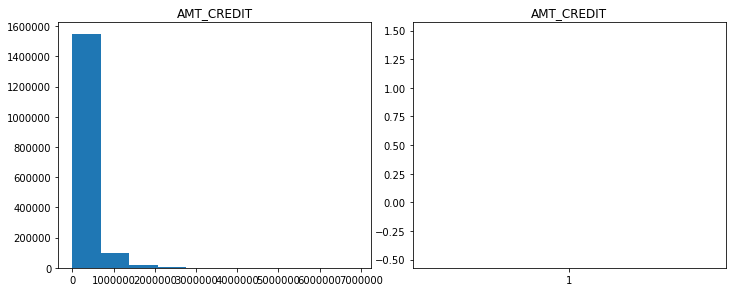

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

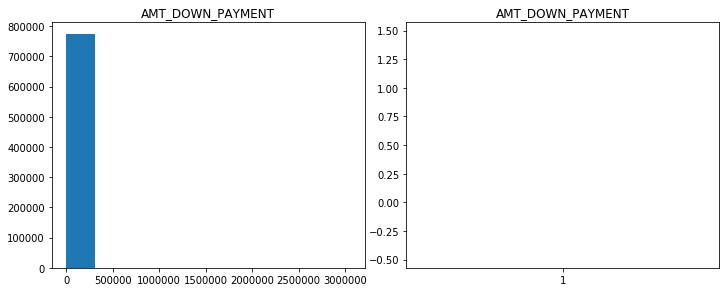

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

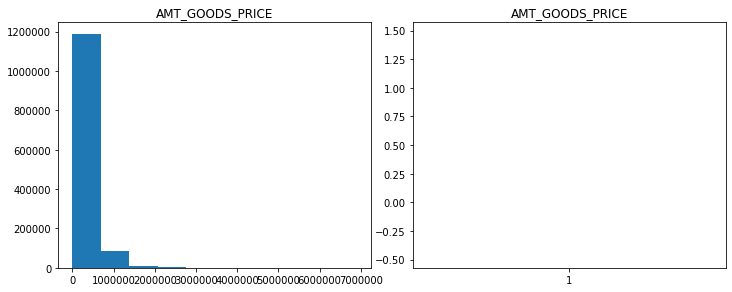

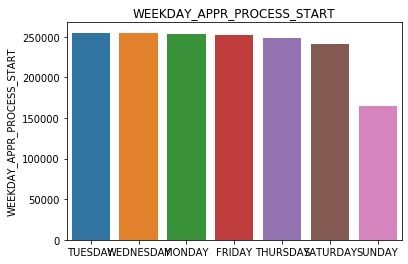

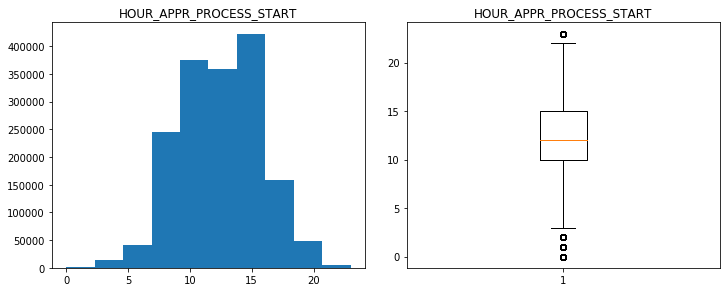

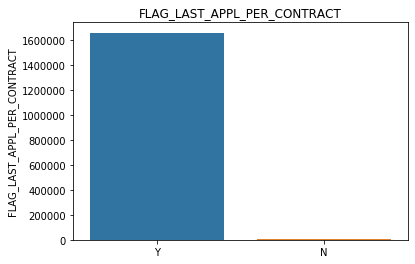

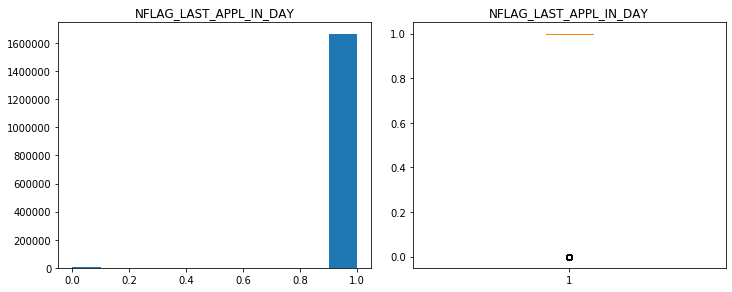

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

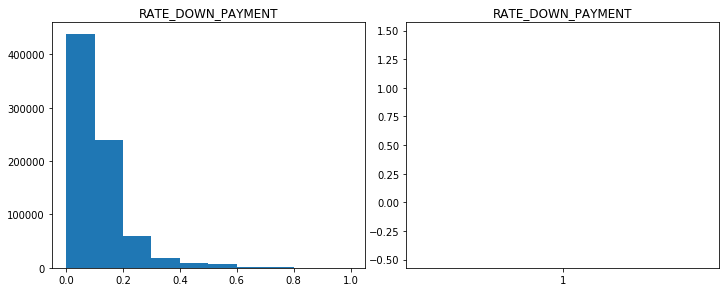

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

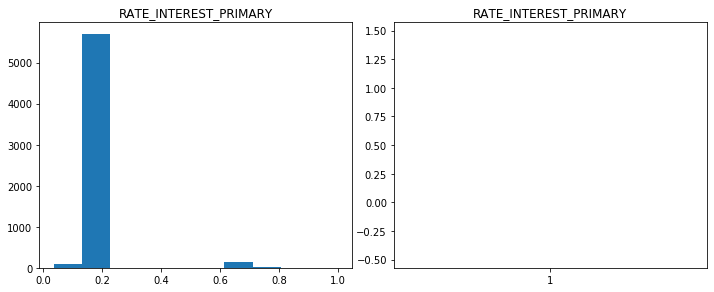

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

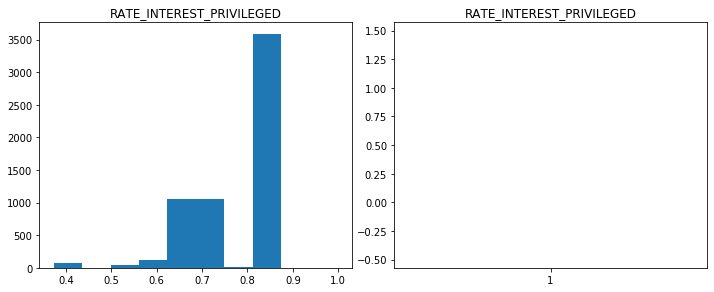

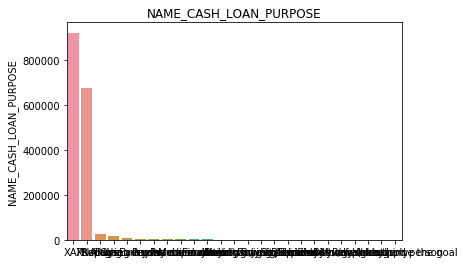

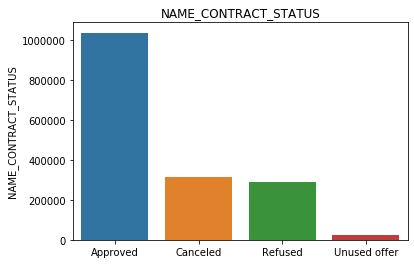

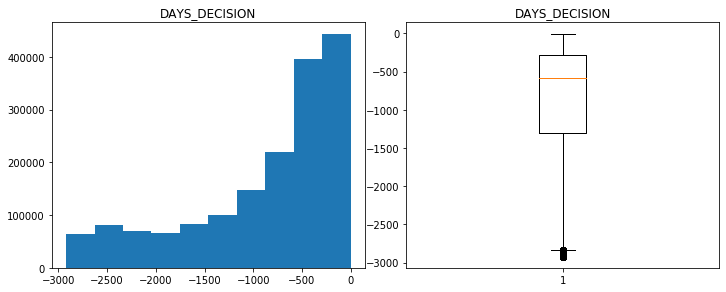

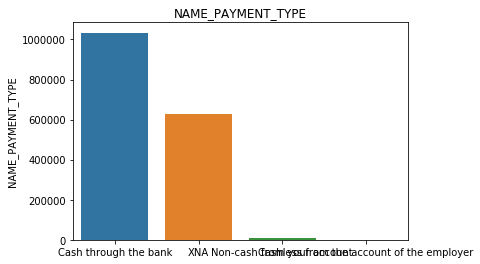

...

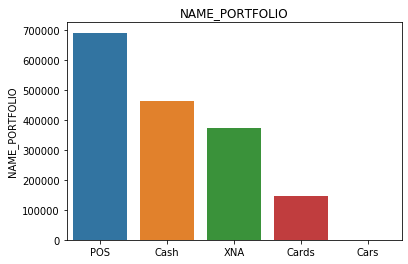

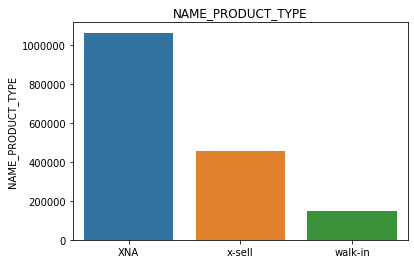

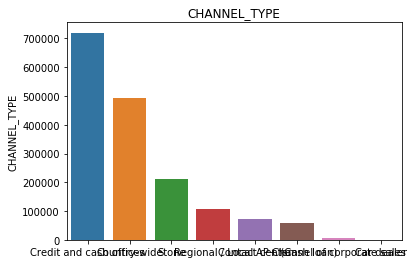

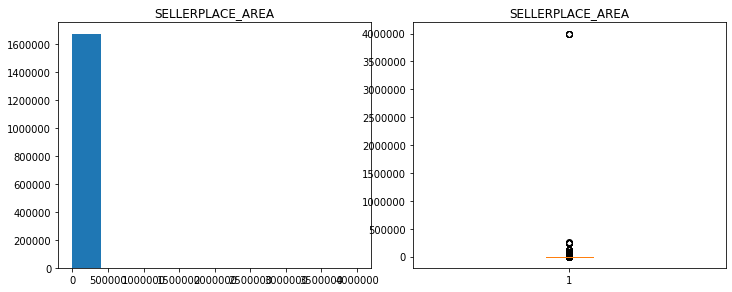

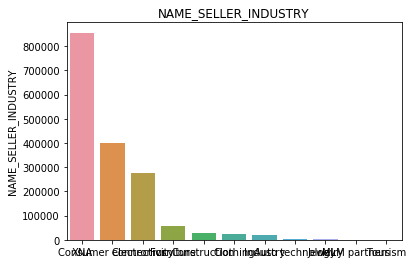

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

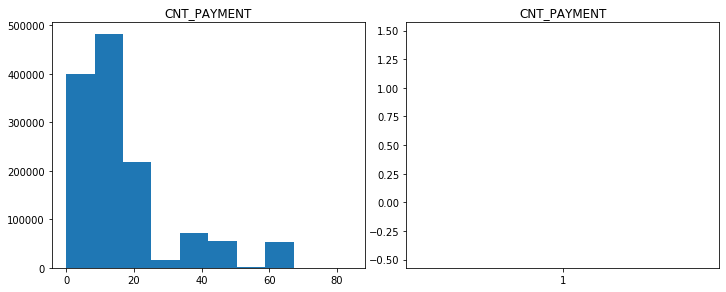

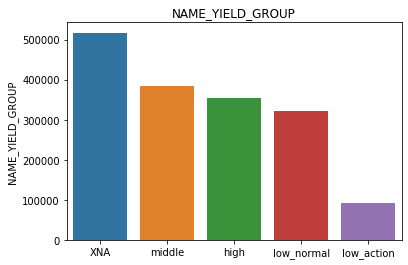

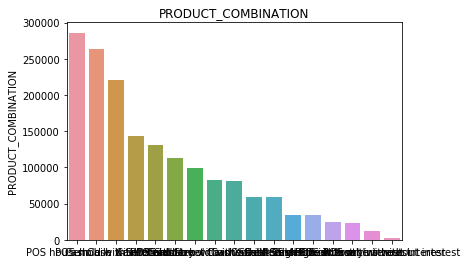

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

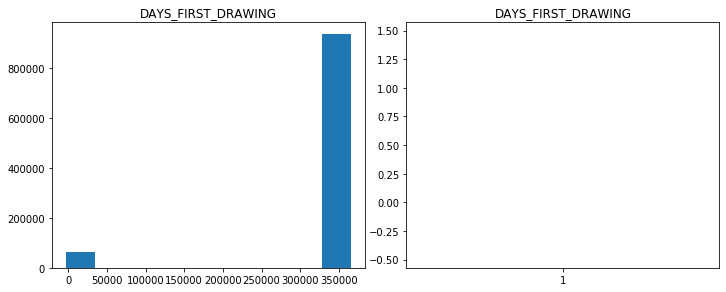

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

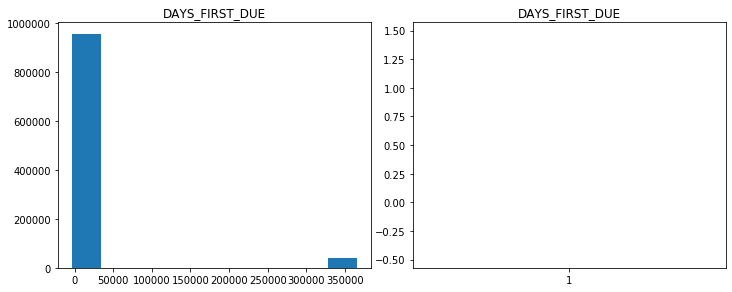

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

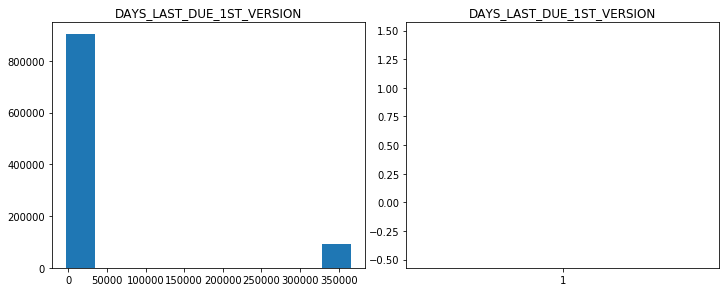

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

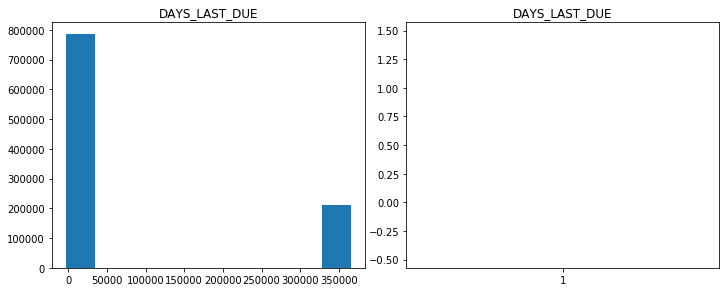

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

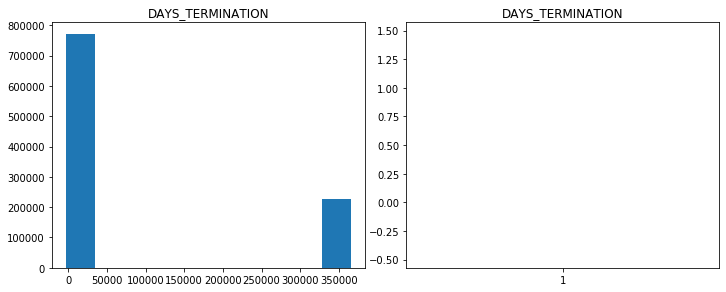

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

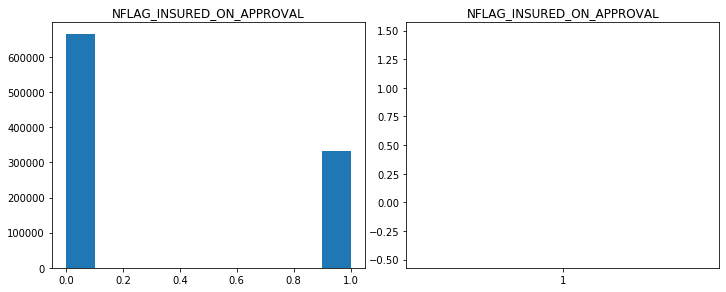

In [19]:
univar_analysis(prev_app)

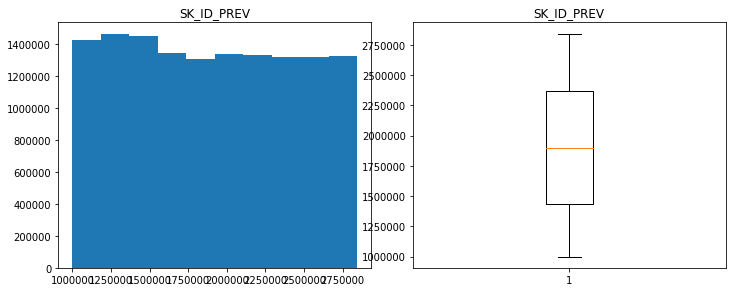

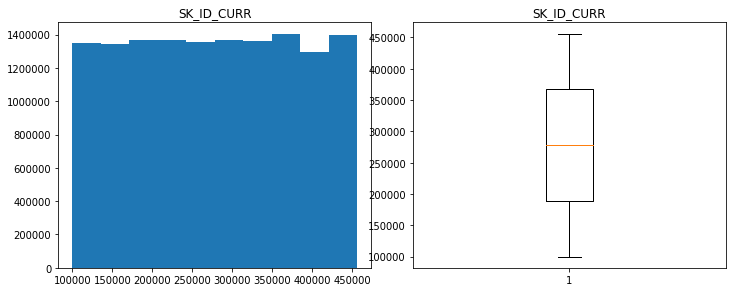

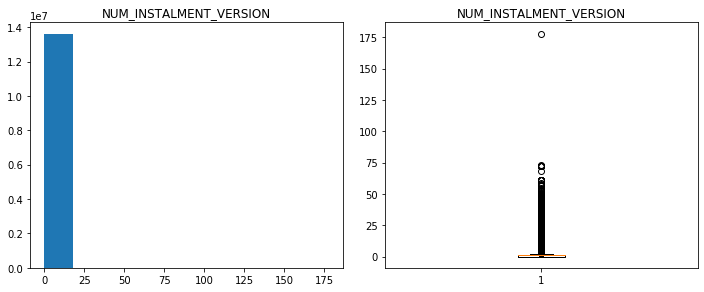

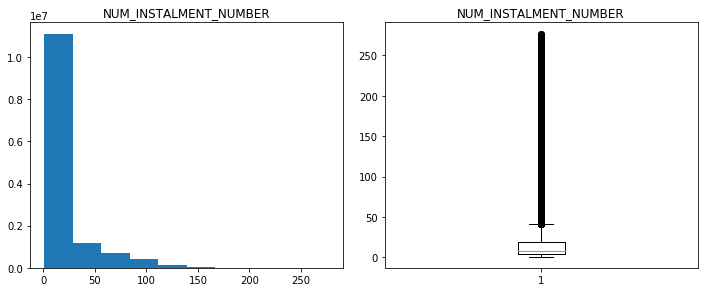

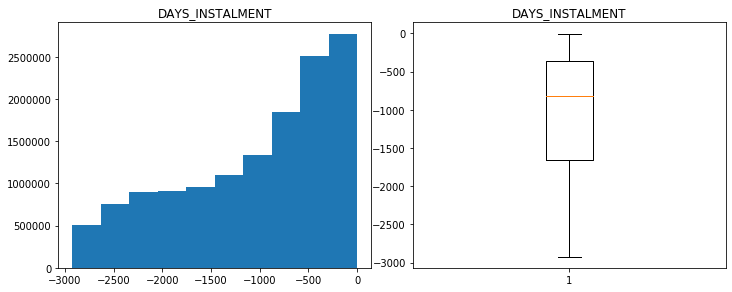

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

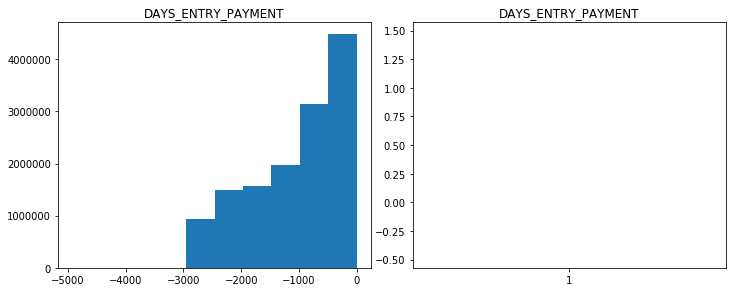

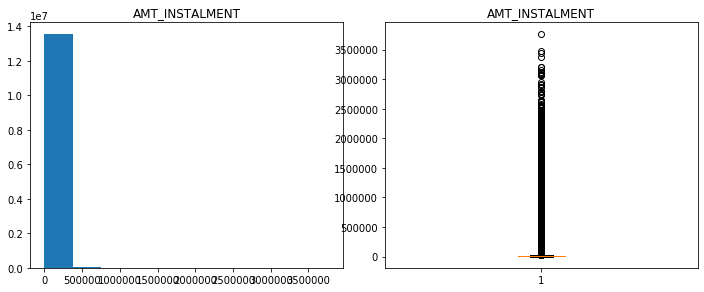

/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:839: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/Applications/anaconda3/lib/python3.7/site-packages/numpy/lib/histograms.py:840: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1316: RuntimeWarning: invalid value encountered in less_equal
  wiskhi = x[x <= hival]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1323: RuntimeWarning: invalid value encountered in greater_equal
  wisklo = x[x >= loval]
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1331: RuntimeWarning: invalid value encountered in less
  x[x < stats['whislo']],
/Applications/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/__init__.py:1332: RuntimeWarning: invalid value encountered in greater
  x[x > stats['whis

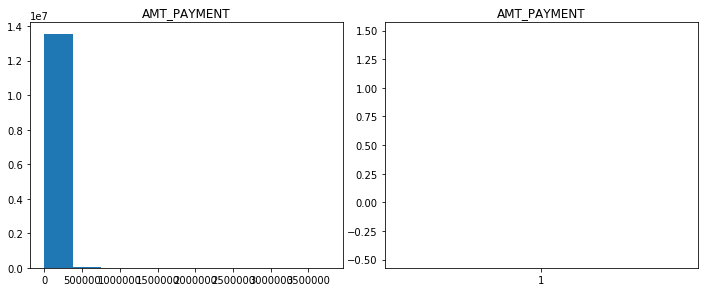

In [20]:
univar_analysis(inst_pay)

#### Univariate Analysis Findings
We see that there are a few outliers in the data 
1. Total Income amount - 3 outliers (more than 10 million)
2. No of children - 10 outliers (10 or more children)

Some data do not make sense especially:
1. Days_Employed (very large positive values)



### Feature Selection/Engineering from other tables

We are doing feature selection/engineering for the other tables first to analyse how these features are associated with the Target variable.

#### From main table
1. Summed up all the documents to get total number of documents flagged / client submitted

#### Bureau:
Taking all the active credits, we can see several features that may be important:
1. Loan Status
2. Credit Type (Whether personal or business)
3. Remaining duration of CB credit
4. No. of times credits were prolonged
5. Credit Sum
6. Debt Amount
7. Credit Amount Overdue

#### Home Credit:
From POS:
1. Only taking active status
2. Term of previous credit
3. Installments left to pay on previous credit

From Credit Card Balance:
1. Not taking completed statuses
2. Amount of drawings
3. Total payment amount
4. Total receivable amount
5. No. of drawings

From Previous Applications:
1. Credit amount
2. Downpayment amount
3. Type of loan (split into consumer, cash and revolving loans)

From installment payments:
1. No. of days payment was delayed
2. Outstanding amount unpaid



In [21]:
#Bureau data
bur_tomerge = pd.DataFrame(bur_bal.groupby('SK_ID_BUREAU').MONTHS_BALANCE.max())
bur_tomerge = pd.merge(bur_tomerge,bur_bal,on=['SK_ID_BUREAU','MONTHS_BALANCE'],how='left')
bur_merged = pd.merge(bur,bur_tomerge[['SK_ID_BUREAU','STATUS']],on='SK_ID_BUREAU',how='left')
bur_merged.rename(columns={'STATUS':'LOAN STATUS'}, inplace=True)
bur_merged_drop = bur_merged[bur_merged['CREDIT_ACTIVE']=='Active']
bur_merged_drop['CREDIT_TYPE'].value_counts()
bur_merged_drop['CREDIT_PERSONAL'] = bur_merged_drop['CREDIT_TYPE'].apply(lambda x : 0 if x in {'Microloan','Loan for business development','Loan for working capital replenishment','Loan for the purchase of equipment','Loan for purchase of shares (margin lending)'} else 1)
bur_merged_drop['CREDIT_BUSINESS'] = bur_merged_drop['CREDIT_TYPE'].apply(lambda x : 1 if x in {'Microloan','Loan for business development','Loan for working capital replenishment','Loan for the purchase of equipment','Loan for purchase of shares (margin lending)'} else 0)
bur_merge_app = bur_merged_drop.groupby('SK_ID_CURR',as_index=False).agg({'DAYS_CREDIT_ENDDATE':mean,'CNT_CREDIT_PROLONG': sum, 'AMT_CREDIT_SUM' : sum, 'AMT_CREDIT_SUM_DEBT':sum, 'AMT_CREDIT_SUM_OVERDUE':sum,'CREDIT_PERSONAL':sum,'CREDIT_BUSINESS':sum})
bur_merge_app.rename(columns={'DAYS_CREDIT_ENDDATE' : 'BUR_DAYS_CREDIT_ENDDATE'},inplace=True)

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == '__main__':


In [22]:
#POS data
pos_filter = pos[(pos['NAME_CONTRACT_STATUS'] != 'Completed') | (pos['NAME_CONTRACT_STATUS'] != 'Canceled') | (pos['NAME_CONTRACT_STATUS'] != 'XNA')]
pos_tomerge = pos_filter.groupby('SK_ID_CURR',as_index=False).agg({'CNT_INSTALMENT':mean,'CNT_INSTALMENT_FUTURE':mean})

In [23]:
#Credit card balance data
cc_bal_filter = cc_bal[(cc_bal['NAME_CONTRACT_STATUS'] != 'Completed') | (cc_bal['NAME_CONTRACT_STATUS'] != 'Refused')]
cc_bal_merge_app = cc_bal_filter.groupby('SK_ID_CURR',as_index=False).agg({'AMT_DRAWINGS_CURRENT':sum,'AMT_PAYMENT_TOTAL_CURRENT':sum,'AMT_TOTAL_RECEIVABLE':sum,'CNT_DRAWINGS_CURRENT':mean})

In [24]:
#Previous application data
prev_app_filter = prev_app[(prev_app['NAME_CONTRACT_STATUS'] == 'Approved')&(prev_app['NAME_CONTRACT_TYPE'] != 'XNA')]
prev_app_filter['PREV_TYPE_CONSUMER_LOAN'] = prev_app_filter['NAME_CONTRACT_TYPE'].apply(lambda x: 1 if x == 'Consumer loans' else 0)
prev_app_filter['PREV_TYPE_CASH_LOAN'] = prev_app_filter['NAME_CONTRACT_TYPE'].apply(lambda x: 1 if x == 'Cash loans' else 0)
prev_app_filter['PREV_TYPE_REVOLVING_LOAN'] = prev_app_filter['NAME_CONTRACT_TYPE'].apply(lambda x: 1 if x == 'Revolving loans' else 0)
prev_app_merge_app = prev_app_filter.groupby('SK_ID_CURR',as_index=False).agg({'AMT_CREDIT': mean,'AMT_DOWN_PAYMENT': mean, 'PREV_TYPE_CONSUMER_LOAN' : sum, 'PREV_TYPE_CASH_LOAN':sum, 'PREV_TYPE_REVOLVING_LOAN':sum})
prev_app_merge_app.rename(columns={'AMT_CREDIT': 'PREV_AMT_CREDIT','AMT_DOWN_PAYMENT' : 'PREV_AMT_DOWNPAYMENT'},inplace=True)

/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/Applications/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice

In [25]:
#Even though this might be an important feature, there is more than 50% missing data, hence we will not use this 
prev_app['NAME_SELLER_INDUSTRY'].value_counts()

XNA                     855720
Consumer electronics    398265
Connectivity            276029
Furniture                57849
Construction             29781
Clothing                 23949
Industry                 19194
Auto technology           4990
Jewelry                   2709
MLM partners              1215
Tourism                    513
Name: NAME_SELLER_INDUSTRY, dtype: int64

In [26]:
#Installment payment data
inst_pay['DAYS_DELAY_PAYMENT'] = inst_pay['DAYS_ENTRY_PAYMENT']-inst_pay['DAYS_INSTALMENT']
inst_pay['OUTSTANDING_AMOUNT_UNPAID'] = inst_pay['AMT_INSTALMENT'] - inst_pay['AMT_PAYMENT']
inst_pay_tomerge = inst_pay.groupby('SK_ID_CURR',as_index=False).agg({'DAYS_DELAY_PAYMENT': mean,'OUTSTANDING_AMOUNT_UNPAID':sum})

In [27]:
#Merge with main table
flag_docs = ['FLAG_DOCUMENT_2','FLAG_DOCUMENT_3','FLAG_DOCUMENT_4','FLAG_DOCUMENT_5','FLAG_DOCUMENT_6','FLAG_DOCUMENT_7','FLAG_DOCUMENT_8','FLAG_DOCUMENT_9','FLAG_DOCUMENT_10','FLAG_DOCUMENT_11','FLAG_DOCUMENT_12','FLAG_DOCUMENT_13','FLAG_DOCUMENT_14','FLAG_DOCUMENT_15','FLAG_DOCUMENT_16','FLAG_DOCUMENT_17','FLAG_DOCUMENT_18','FLAG_DOCUMENT_19','FLAG_DOCUMENT_20','FLAG_DOCUMENT_21']
app_train['NUM_DOC'] = app_train.apply(lambda x: int(x['FLAG_DOCUMENT_2'])+int(x['FLAG_DOCUMENT_3'])+int(x['FLAG_DOCUMENT_4'])+int(x['FLAG_DOCUMENT_5'])+int(x['FLAG_DOCUMENT_6'])+int(x['FLAG_DOCUMENT_7'])+int(x['FLAG_DOCUMENT_8'])+int(x['FLAG_DOCUMENT_9'])+int(x['FLAG_DOCUMENT_10'])+int(x['FLAG_DOCUMENT_11'])+int(x['FLAG_DOCUMENT_12'])+int(x['FLAG_DOCUMENT_13'])+int(x['FLAG_DOCUMENT_14'])+int(x['FLAG_DOCUMENT_15'])+int(x['FLAG_DOCUMENT_16'])+int(x['FLAG_DOCUMENT_17'])+int(x['FLAG_DOCUMENT_18'])+int(x['FLAG_DOCUMENT_19'])+int(x['FLAG_DOCUMENT_20'])+int(x['FLAG_DOCUMENT_21']),axis=1)
app_train.drop(columns=flag_docs,inplace=True)
app_train_merge = pd.merge(app_train,bur_merge_app,how='left',on='SK_ID_CURR')
app_train_merge = pd.merge(app_train_merge,pos_tomerge,how='left',on='SK_ID_CURR')
app_train_merge = pd.merge(app_train_merge,cc_bal_merge_app,how='left',on='SK_ID_CURR')
app_train_merge = pd.merge(app_train_merge,prev_app_merge_app,how='left',on='SK_ID_CURR')

In [28]:
#Merging main test table
app_test['NUM_DOC'] = app_test.apply(lambda x: int(x['FLAG_DOCUMENT_2'])+int(x['FLAG_DOCUMENT_3'])+int(x['FLAG_DOCUMENT_4'])+int(x['FLAG_DOCUMENT_5'])+int(x['FLAG_DOCUMENT_6'])+int(x['FLAG_DOCUMENT_7'])+int(x['FLAG_DOCUMENT_8'])+int(x['FLAG_DOCUMENT_9'])+int(x['FLAG_DOCUMENT_10'])+int(x['FLAG_DOCUMENT_11'])+int(x['FLAG_DOCUMENT_12'])+int(x['FLAG_DOCUMENT_13'])+int(x['FLAG_DOCUMENT_14'])+int(x['FLAG_DOCUMENT_15'])+int(x['FLAG_DOCUMENT_16'])+int(x['FLAG_DOCUMENT_17'])+int(x['FLAG_DOCUMENT_18'])+int(x['FLAG_DOCUMENT_19'])+int(x['FLAG_DOCUMENT_20'])+int(x['FLAG_DOCUMENT_21']),axis=1)
app_test.drop(columns=flag_docs,inplace=True)
app_test_merge = pd.merge(app_test,bur_merge_app,how='left',on='SK_ID_CURR')
app_test_merge = pd.merge(app_test_merge,pos_tomerge,how='left',on='SK_ID_CURR')
app_test_merge = pd.merge(app_test_merge,cc_bal_merge_app,how='left',on='SK_ID_CURR')
app_test_merge = pd.merge(app_test_merge,prev_app_merge_app,how='left',on='SK_ID_CURR')

### Data Cleaning

1. Check for time-relative data, whether there are any positive values (do they make sense)
2. Gender data contains NA data
3. Days employed has weird looking data (positive values)

In [29]:
i=['DAYS_BIRTH','DAYS_EMPLOYED','DAYS_ID_PUBLISH','DAYS_REGISTRATION']
for x in i:
    p=app_train_merge[app_train_merge[x]>0].shape
    print(f'x - {p}')

x - (0, 121)
x - (55374, 121)
x - (0, 121)
x - (0, 121)


In [30]:
md = int(app_train_merge[app_train_merge['DAYS_EMPLOYED']<0]['DAYS_EMPLOYED'].median())
def data_clean(df, md):
    #remove gender XNA
    df.drop(df.loc[app_train_merge['CODE_GENDER']=='XNA'].index,inplace=True)
    
    #Impute data with median since dropping it would mean a lot of our data would be dismissed
    df['DAYS_EMPLOYED'] = df['DAYS_EMPLOYED'].apply(lambda x: md if x > 0 else x) 

data_clean(app_train_merge,md)

### Bivariate Analysis

We will compare all the data and see its association with the target variable ('Target'). 
Performing the follow:
1. Chi-square tests for categorical variables, and
2. Point biserial correlation for continuous / interval variables 

This will give us a good indication quantiatively whether these variables have associations with the target variable.

Since we are using XGB, LightGBM and CatBoost, multicollinearity is not an issue we have to deal with.

In [31]:
app_train_merge.corrwith(app_train['TARGET']).sort_values(ascending=False)

TARGET                         1.000000
CNT_DRAWINGS_CURRENT           0.082520
DAYS_BIRTH                     0.078242
DAYS_EMPLOYED                  0.063366
REGION_RATING_CLIENT_W_CITY    0.060895
                                 ...   
FLOORSMAX_MEDI                -0.043773
FLOORSMAX_AVG                 -0.044009
EXT_SOURCE_1                  -0.155317
EXT_SOURCE_2                  -0.160471
EXT_SOURCE_3                  -0.178926
Length: 105, dtype: float64

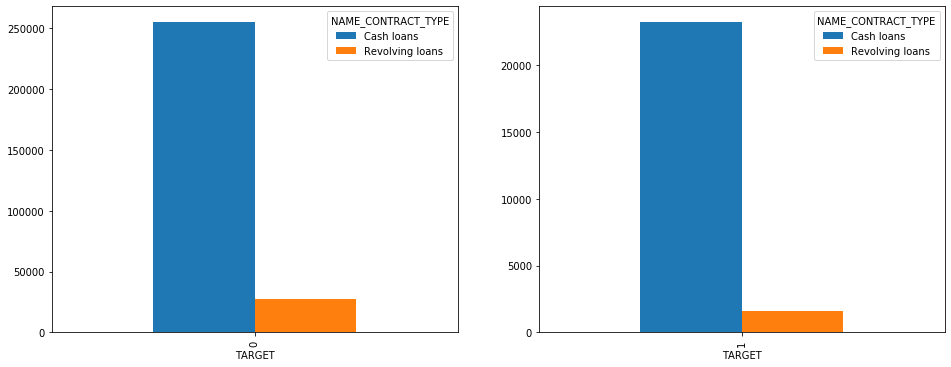

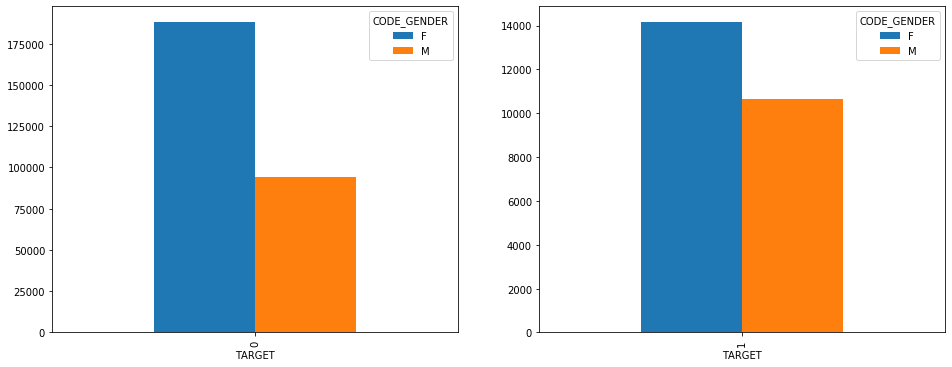

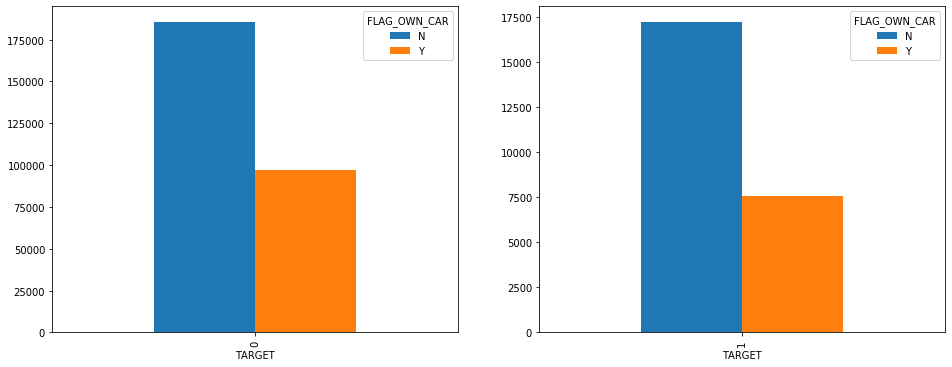

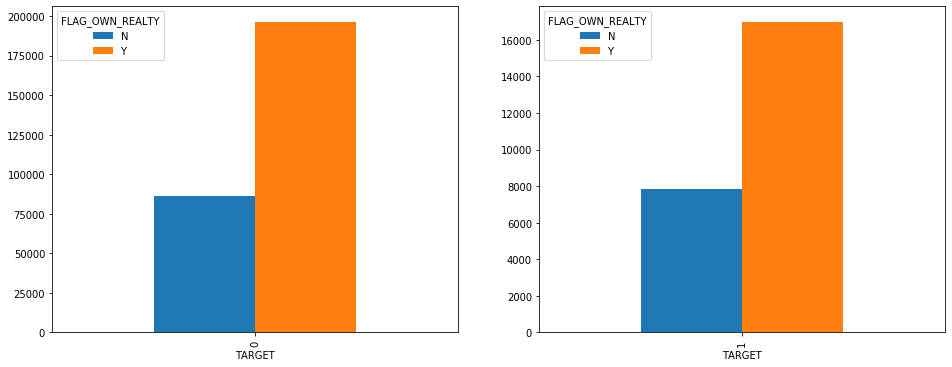

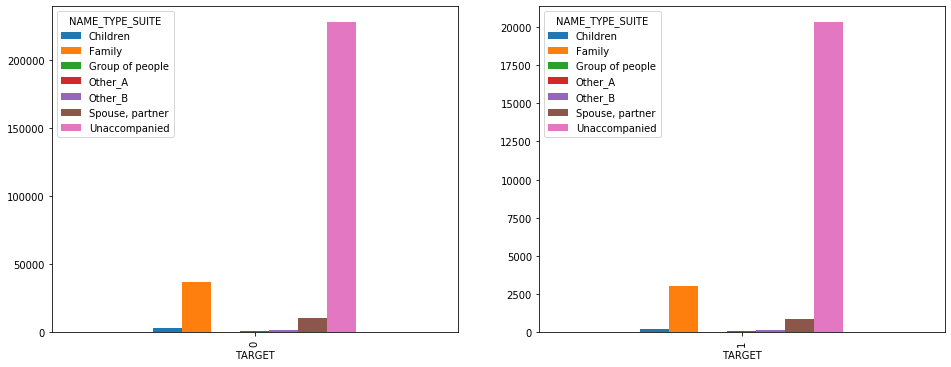

...

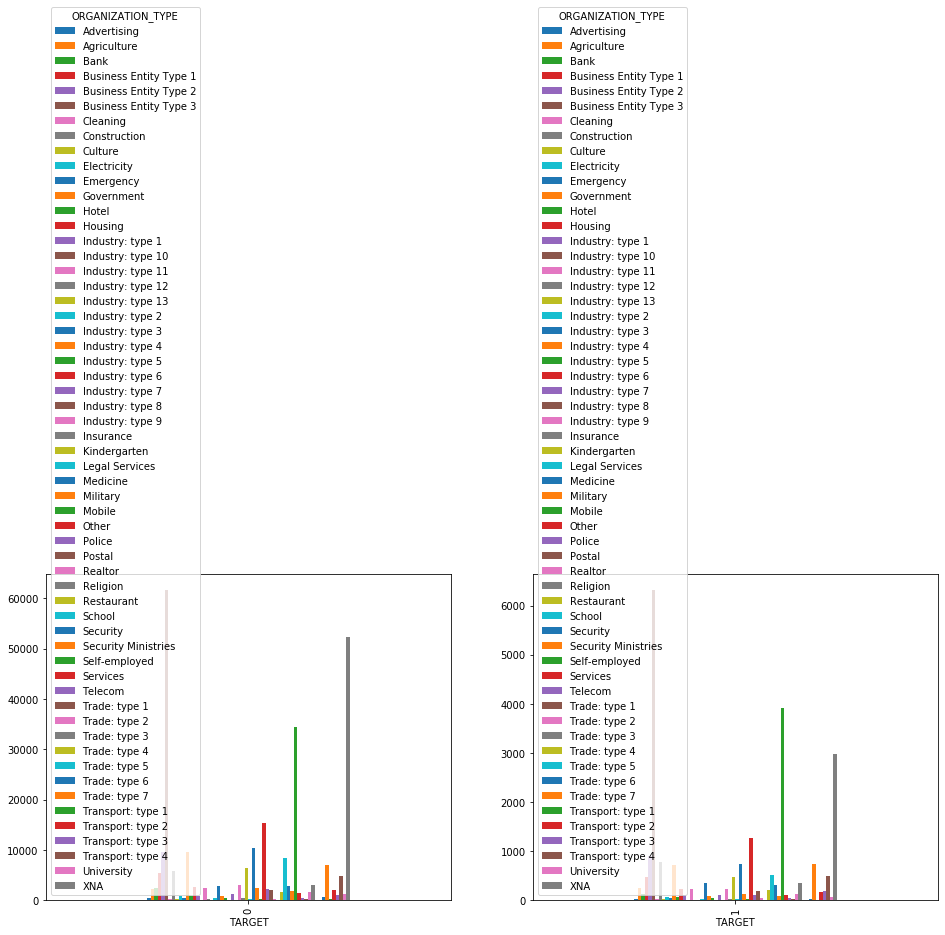

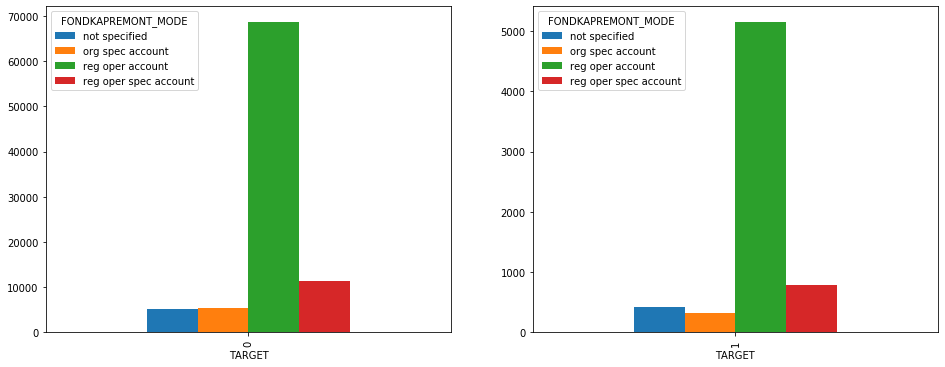

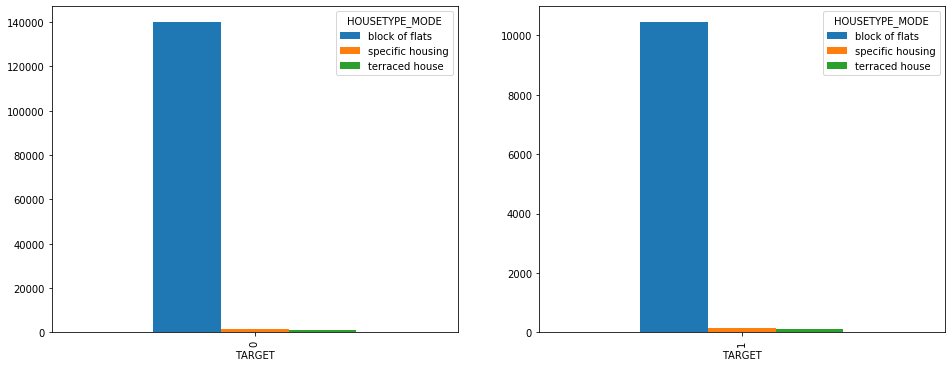

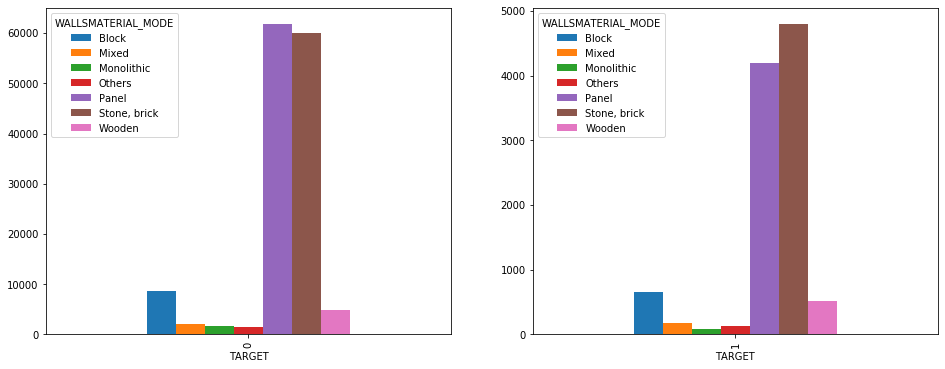

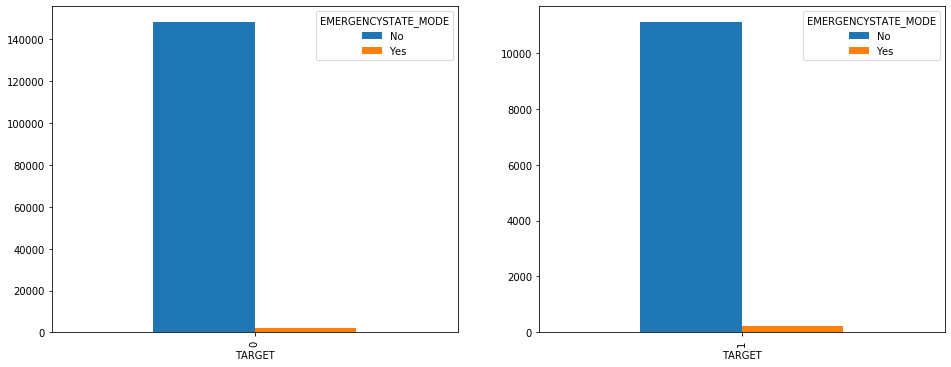

In [32]:
#Visualisation for categorical data
app_train_merge_0 = app_train_merge[app_train_merge['TARGET'] == 0]
app_train_merge_1 = app_train_merge[app_train_merge['TARGET'] == 1]
for i in app_train_merge:
    if app_train_merge[i].dtype == 'object':
        fig, axes = plt.subplots(1,2,figsize=(16,6))
        pd.crosstab(app_train_merge_0['TARGET'],app_train_merge_0[i]).plot(kind='bar',ax=axes[0])
        pd.crosstab(app_train_merge_1['TARGET'],app_train_merge_1[i]).plot(kind='bar',ax=axes[1])

In [33]:
#Preparation for chi square test
cat_col = []
for i in app_train_merge:
    if app_train_merge[i].dtype == 'int' or app_train_merge[i].dtype == 'object' or app_train_merge[i].name == 'TARGET':
        cat_col.append(i)
app_train_merge[['DAYS_BIRTH','DAYS_EMPLOYED','DAYS_ID_PUBLISH']]

,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_ID_PUBLISH
0,-9461,-637,-2120
1,-16765,-1188,-291
2,-19046,-225,-2531
3,-19005,-3039,-2437
4,-19932,-3038,-3458
...,...,...,...
307506,-9327,-236,-1982
307507,-20775,-1648,-4090
307508,-14966,-7921,-5150
307509,-11961,-4786,-931


In [34]:
cat_col

['SK_ID_CURR',
 'TARGET',
 'NAME_CONTRACT_TYPE',
 'CODE_GENDER',
 'FLAG_OWN_CAR',
 'FLAG_OWN_REALTY',
 'CNT_CHILDREN',
 'NAME_TYPE_SUITE',
 'NAME_INCOME_TYPE',
 'NAME_EDUCATION_TYPE',
 'NAME_FAMILY_STATUS',
 'NAME_HOUSING_TYPE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_ID_PUBLISH',
 'FLAG_MOBIL',
 'FLAG_EMP_PHONE',
 'FLAG_WORK_PHONE',
 'FLAG_CONT_MOBILE',
 'FLAG_PHONE',
 'FLAG_EMAIL',
 'OCCUPATION_TYPE',
 'REGION_RATING_CLIENT',
 'REGION_RATING_CLIENT_W_CITY',
 'WEEKDAY_APPR_PROCESS_START',
 'HOUR_APPR_PROCESS_START',
 'REG_REGION_NOT_LIVE_REGION',
 'REG_REGION_NOT_WORK_REGION',
 'LIVE_REGION_NOT_WORK_REGION',
 'REG_CITY_NOT_LIVE_CITY',
 'REG_CITY_NOT_WORK_CITY',
 'LIVE_CITY_NOT_WORK_CITY',
 'ORGANIZATION_TYPE',
 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE',
 'NUM_DOC']

In [35]:
app_train_cat = app_train_merge[cat_col].drop(columns=['DAYS_BIRTH','DAYS_EMPLOYED','DAYS_ID_PUBLISH'])
chi2_summary = []
for i in app_train_cat:
    (chi2, p, dof,_) = chi2_contingency(pd.crosstab(app_train_cat['TARGET'],app_train_cat[i]))
    score_to_add = {}
    score_to_add['var'] = i
    score_to_add['chi_square_stat'] = chi2
    score_to_add['p-value'] = p
    score_to_add['dof'] = dof
    chi2_summary.append(score_to_add)
df_chi2 = pd.DataFrame(chi2_summary)
df_chi2

,var,chi_square_stat,p-value,dof
0,SK_ID_CURR,307507.000000,4.991522e-01,307506
1,TARGET,307493.525339,0.000000e+00,1
2,NAME_CONTRACT_TYPE,292.957676,1.127500e-65,1
3,CODE_GENDER,920.005725,4.394091e-202,1
4,FLAG_OWN_CAR,146.639147,9.410574e-34,1
5,FLAG_OWN_REALTY,11.566092,6.716542e-04,1
6,CNT_CHILDREN,185.468398,5.021895e-32,14
7,NAME_TYPE_SUITE,32.819065,1.136071e-05,6
8,NAME_INCOME_TYPE,1253.551805,1.851917e-266,7
9,NAME_EDUCATION_TYPE,1019.200873,2.462768e-219,4


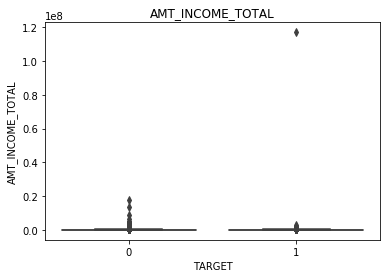

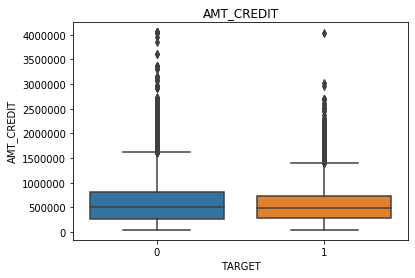

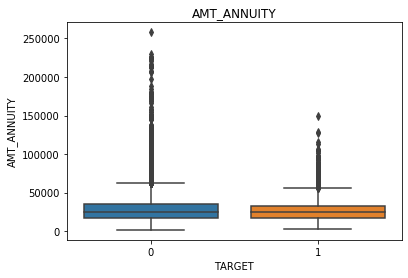

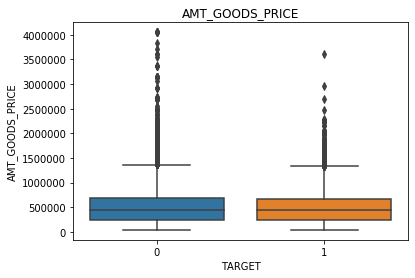

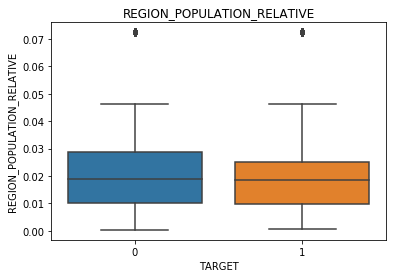

...

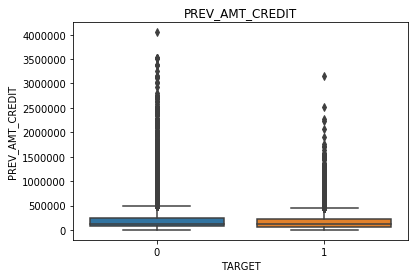

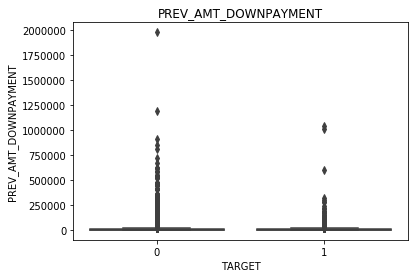

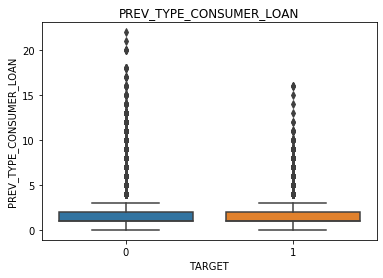

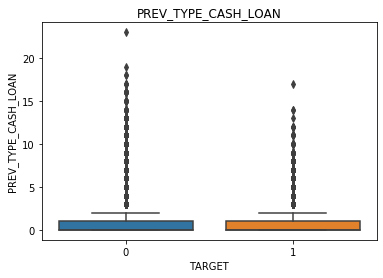

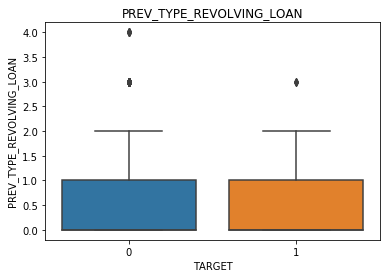

In [36]:
#Visualisation for continuous variables
for i in app_train_merge:
    if app_train_merge[i].dtype == 'float' or i in ['DAYS_BIRTH','DAYS_EMPLOYED','DAYS_ID_PUBLISH']:
        plt.show()
        sns.boxplot(x='TARGET',y=i,data=app_train_merge)
        plt.title(i)
        plt.show()

In [37]:
#Preparation for Point biserial correlation
num_col = []
for i in app_train_merge:
    if app_train_merge[i].dtype == 'float' or i in ['DAYS_BIRTH','DAYS_EMPLOYED','DAYS_ID_PUBLISH'] or app_train[i].name == 'TARGET':
        num_col.append(i)

In [38]:
num_col

['TARGET',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'CNT_FAM_MEMBERS',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAREA_MODE',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 'ELEV

#### Missing values for Point Biserial Correlation
1. To take into account for outliers, we will impute with median for now to run the correlation
2. We know that this is not super accurate in terms of correlation, but NA values will disregard a lot of the data, hence imputing with median will  introduce bias into the data. 
3. We will use median imputation since dropping the values will too much of the data (3% of the data is left)


In [39]:
num_col

['TARGET',
 'AMT_INCOME_TOTAL',
 'AMT_CREDIT',
 'AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'REGION_POPULATION_RELATIVE',
 'DAYS_BIRTH',
 'DAYS_EMPLOYED',
 'DAYS_REGISTRATION',
 'DAYS_ID_PUBLISH',
 'OWN_CAR_AGE',
 'CNT_FAM_MEMBERS',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAREA_MODE',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 'ELEV

In [40]:
app_train_num = app_train_merge[num_col]
imputer = SimpleImputer(missing_values=np.nan,strategy='median')
imputer.fit(app_train_num.iloc[:,:app_train_num.shape[1]])
(app_train_num.iloc[:,:app_train_num.shape[1]]) = imputer.transform(app_train_num.iloc[:,:app_train_num.shape[1]])

/Applications/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[item] = s


In [41]:
app_train_num['TARGET']

0         1.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
307506    0.0
307507    0.0
307508    0.0
307509    1.0
307510    0.0
Name: TARGET, Length: 307507, dtype: float64

In [42]:
#Point biserial correlation
from scipy.stats import pearsonr, pointbiserialr
num_summary = []
for i in app_train_num:
    pbs = pointbiserialr(app_train_num[i],app_train_num['TARGET'])
    score_to_add = {}
    score_to_add['var'] = i
    score_to_add['pbs corr'] = pbs[0]
    score_to_add['pbs p-value'] = pbs[1]
    num_summary.append(score_to_add)
df_num = pd.DataFrame(num_summary)
df_num

,var,pbs corr,pbs p-value
0,TARGET,1.000000,0.000000e+00
1,AMT_INCOME_TOTAL,-0.003982,2.725012e-02
2,AMT_CREDIT,-0.030371,1.128335e-63
3,AMT_ANNUITY,-0.012817,1.181182e-12
4,AMT_GOODS_PRICE,-0.039625,4.306671e-107
...,...,...,...
82,PREV_AMT_CREDIT,-0.023750,1.270338e-39
83,PREV_AMT_DOWNPAYMENT,-0.015515,7.690163e-18
84,PREV_TYPE_CONSUMER_LOAN,-0.034248,1.808723e-80
85,PREV_TYPE_CASH_LOAN,-0.011895,4.211529e-11


#### Taking 1% significance level for both chi square and point biserial

In [43]:
df_chi2[df_chi2['p-value'] <0.01]

,var,chi_square_stat,p-value,dof
1,TARGET,307493.525339,0.000000e+00,1
2,NAME_CONTRACT_TYPE,292.957676,1.127500e-65,1
3,CODE_GENDER,920.005725,4.394091e-202,1
4,FLAG_OWN_CAR,146.639147,9.410574e-34,1
5,FLAG_OWN_REALTY,11.566092,6.716542e-04,1
6,CNT_CHILDREN,185.468398,5.021895e-32,14
7,NAME_TYPE_SUITE,32.819065,1.136071e-05,6
8,NAME_INCOME_TYPE,1253.551805,1.851917e-266,7
9,NAME_EDUCATION_TYPE,1019.200873,2.462768e-219,4
10,NAME_FAMILY_STATUS,504.701120,7.717800e-107,5


In [44]:
#Even though total income was not statiscally significant at 1%, we know qualitatively that this feature is an important factor to predict loan repayment
df_num[(df_num['pbs p-value']<0.01) | (df_num['var'] == 'AMT_INCOME_TOTAL')]

,var,pbs corr,pbs p-value
0,TARGET,1.000000,0.000000e+00
1,AMT_INCOME_TOTAL,-0.003982,2.725012e-02
2,AMT_CREDIT,-0.030371,1.128335e-63
3,AMT_ANNUITY,-0.012817,1.181182e-12
4,AMT_GOODS_PRICE,-0.039625,4.306671e-107
...,...,...,...
82,PREV_AMT_CREDIT,-0.023750,1.270338e-39
83,PREV_AMT_DOWNPAYMENT,-0.015515,7.690163e-18
84,PREV_TYPE_CONSUMER_LOAN,-0.034248,1.808723e-80
85,PREV_TYPE_CASH_LOAN,-0.011895,4.211529e-11


#### Findings from bivariate analysis

Statistical testing/correlations done did not reduce our dimensionality by a lot. We will use these variables and put into the model. Further analysis will be done after different runs of the model.

### Outlier Treatment

Treating the following variables:
1. Children count
2. Total income
3. Sum of credit amount

We will pass into the model two difference data tables
1. One with outlier treatment
2. One without outlier treatment

This is because these outliers might be a good indication and actual data that could be valuable for the model to train on.

In [45]:
#Since these outlier variables account for less than 1% of the data, we can drop them
def outlier_treatment(df):
    df.drop(df.loc[df['CNT_CHILDREN']>10].index,inplace=True)
    df.drop(df.loc[df['AMT_INCOME_TOTAL']>1000000].index,inplace=True)
    df.drop(df.loc[df['AMT_CREDIT_SUM']>=270104026.5].index,inplace=True)

{'whiskers': [<matplotlib.lines.Line2D at 0x7fdda21c5190>,
 'caps': [<matplotlib.lines.Line2D at 0x7fdd99c02690>,
 'boxes': [<matplotlib.lines.Line2D at 0x7fdda21c5650>],
 'medians': [<matplotlib.lines.Line2D at 0x7fdda21a3550>],
 'fliers': [<matplotlib.lines.Line2D at 0x7fdda21a3790>],
 'means': []}

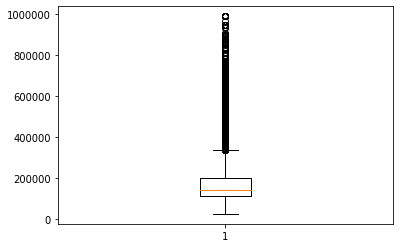

In [46]:
app_train_merge_outlier = app_train_merge.copy()
outlier_treatment(app_train_merge_outlier)
plt.boxplot(app_train_merge_outlier['AMT_INCOME_TOTAL'])

{'whiskers': [<matplotlib.lines.Line2D at 0x7fdea07b78d0>,
 'caps': [<matplotlib.lines.Line2D at 0x7fde9e59a490>,
 'boxes': [<matplotlib.lines.Line2D at 0x7fdea07b7850>],
 'medians': [<matplotlib.lines.Line2D at 0x7fde9d6fc9d0>],
 'fliers': [<matplotlib.lines.Line2D at 0x7fde9d6fc1d0>],
 'means': []}

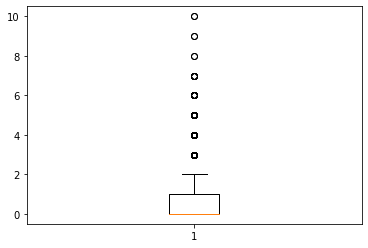

In [47]:
plt.boxplot(app_train_merge_outlier['CNT_CHILDREN'])

In [48]:
#inputting relevant columns into the application training data
columns = list(df_num['var']) + list(df_chi2['var'])
columns.remove('TARGET')
app_train_merge = app_train_merge[columns]
app_train_merge_outlier = app_train_merge_outlier[columns]

### Treating Missing Values

We will analyse the missing values and see how to impute them accordingly

In [49]:
p = []
for k in app_train_merge:
    if app_train_merge[k].isnull().any().sum() == True:
        p.append(k)
p

['AMT_ANNUITY',
 'AMT_GOODS_PRICE',
 'OWN_CAR_AGE',
 'CNT_FAM_MEMBERS',
 'EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BEGINEXPLUATATION_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAREA_MODE',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 'ELEVATORS_MEDI',
 'ENTRANCES_MEDI',
 'FLOORSMAX_MEDI',
 'FLOORSMIN_MEDI',
 'LANDAREA_MEDI',
 'LIVINGAPARTMENTS_MEDI',
 'LIVINGAREA_MEDI',
 'NONLIVINGAPARTMEN

In [50]:
fill_mean = ['EXT_SOURCE_1',
 'EXT_SOURCE_2',
 'EXT_SOURCE_3',
 'APARTMENTS_AVG',
 'BASEMENTAREA_AVG',
 'YEARS_BEGINEXPLUATATION_AVG',
 'YEARS_BUILD_AVG',
 'COMMONAREA_AVG',
 'ELEVATORS_AVG',
 'ENTRANCES_AVG',
 'FLOORSMAX_AVG',
 'FLOORSMIN_AVG',
 'LANDAREA_AVG',
 'LIVINGAPARTMENTS_AVG',
 'LIVINGAREA_AVG',
 'NONLIVINGAPARTMENTS_AVG',
 'NONLIVINGAREA_AVG',
 'APARTMENTS_MEDI',
 'BASEMENTAREA_MEDI',
 'YEARS_BEGINEXPLUATATION_MEDI',
 'YEARS_BUILD_MEDI',
 'COMMONAREA_MEDI',
 'ELEVATORS_MEDI',
 'ENTRANCES_MEDI',
 'FLOORSMAX_MEDI',
 'FLOORSMIN_MEDI',
 'LANDAREA_MEDI',
 'LIVINGAPARTMENTS_MEDI',
 'LIVINGAREA_MEDI',
 'NONLIVINGAPARTMENTS_MEDI',
 'NONLIVINGAREA_MEDI']
fill_median = ['AMT_ANNUITY',
 'AMT_GOODS_PRICE','OWN_CAR_AGE','OBS_30_CNT_SOCIAL_CIRCLE',
 'DEF_30_CNT_SOCIAL_CIRCLE',
 'OBS_60_CNT_SOCIAL_CIRCLE',
 'DEF_60_CNT_SOCIAL_CIRCLE',
 'DAYS_LAST_PHONE_CHANGE',
 'AMT_REQ_CREDIT_BUREAU_MON',
 'AMT_REQ_CREDIT_BUREAU_QRT',
 'AMT_REQ_CREDIT_BUREAU_YEAR',
 'BUR_DAYS_CREDIT_ENDDATE',
 'CNT_CREDIT_PROLONG',
 'AMT_CREDIT_SUM',
 'AMT_CREDIT_SUM_OVERDUE','CNT_INSTALMENT',
 'CNT_INSTALMENT_FUTURE',
 'AMT_DRAWINGS_CURRENT',
 'AMT_TOTAL_RECEIVABLE',
 'CNT_DRAWINGS_CURRENT',
 'PREV_AMT_CREDIT',
 'PREV_AMT_DOWNPAYMENT',
               
 'AMT_CREDIT_SUM_DEBT',
 'AMT_PAYMENT_TOTAL_CURRENT', 'AMT_REQ_CREDIT_BUREAU_DAY',
 'AMT_REQ_CREDIT_BUREAU_HOUR',
 'AMT_REQ_CREDIT_BUREAU_WEEK',
 'YEARS_BEGINEXPLUATATION_MODE'
]
fill_mode = ['OCCUPATION_TYPE','CNT_FAM_MEMBERS','CREDIT_PERSONAL',
 'CREDIT_BUSINESS','PREV_TYPE_CONSUMER_LOAN',
 'PREV_TYPE_CASH_LOAN', 'APARTMENTS_MODE',
 'BASEMENTAREA_MODE',
 'YEARS_BUILD_MODE',
 'COMMONAREA_MODE',
 'ELEVATORS_MODE',
 'ENTRANCES_MODE',
 'FLOORSMAX_MODE',
 'FLOORSMIN_MODE',
 'LANDAREA_MODE', 'FONDKAPREMONT_MODE',
 'HOUSETYPE_MODE',
 'TOTALAREA_MODE',
 'WALLSMATERIAL_MODE',
 'EMERGENCYSTATE_MODE',
 'LIVINGAPARTMENTS_MODE',
 'LIVINGAREA_MODE',
 'NONLIVINGAPARTMENTS_MODE',
 'NONLIVINGAREA_MODE',
 'PREV_TYPE_REVOLVING_LOAN',
 'NAME_TYPE_SUITE']

#### When filling in missing values, in the real world it makes sense to impute numbers derived from the training data, to impute missing values for the test data

In [51]:
def fill_null(df,df_compute,fill_mean,fill_median,fill_mode):   
    from sklearn.impute import SimpleImputer
    imputer = SimpleImputer(missing_values=np.nan,strategy='mean')
    imputer.fit(df_compute[fill_mean])
    df[fill_mean] = imputer.transform(df[fill_mean])
    
    imputer = SimpleImputer(missing_values=np.nan,strategy='median')
    imputer.fit(df_compute[fill_median])
    df[fill_median] = imputer.transform(df[fill_median])
    
    imputer = SimpleImputer(missing_values=np.nan,strategy='most_frequent')
    imputer.fit(df_compute[fill_mode])
    df[fill_mode] = imputer.transform(df[fill_mode])

In [52]:
#impute nulls
fill_null(app_train_merge,app_train_merge,fill_mean,fill_median,fill_mode)
fill_null(app_train_merge_outlier,app_train_merge_outlier,fill_mean,fill_median,fill_mode)

app_test_merge_outlier = app_test_merge.copy()
fill_null(app_test_merge,app_train_merge,fill_mean,fill_median,fill_mode)
fill_null(app_test_merge_outlier,app_train_merge_outlier,fill_mean,fill_median,fill_mode)

In [53]:
app_train_merge['TARGET']

0         1
1         0
2         0
3         0
4         0
         ..
307506    0
307507    0
307508    0
307509    1
307510    0
Name: TARGET, Length: 307507, dtype: int64

### Feature Scaling
Two different types of feature scaling according to the distribution of each variable:
1. Normalisation
2. Standardisation

In [54]:
#Split X and y variables
columns = list(df_num['var']) + list(df_chi2['var'])
columns.remove('TARGET')

app_train_merge = app_train_merge[columns]
app_train_merge_outlier = app_train_merge_outlier[columns]

X_train = app_train_merge.drop(columns='TARGET')
X_train_outlier =app_train_merge_outlier.drop(columns='TARGET')
y_train = app_train_merge['TARGET']
y_train_outlier = app_train_merge_outlier['TARGET']

columns.remove('TARGET')
X_test  = app_test_merge[columns]
X_test_outlier = app_test_merge_outlier[columns]

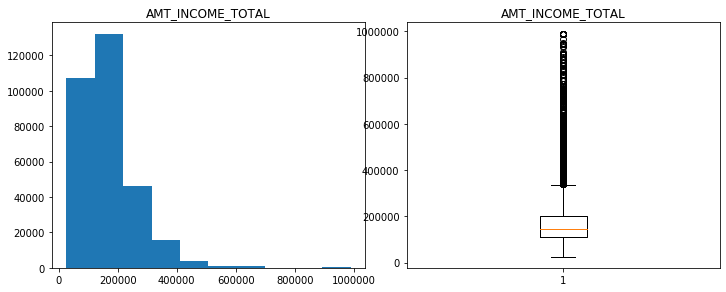

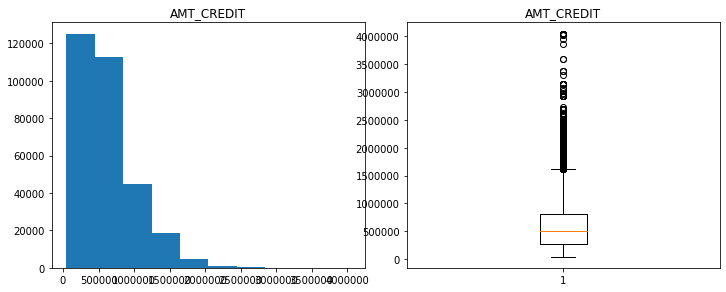

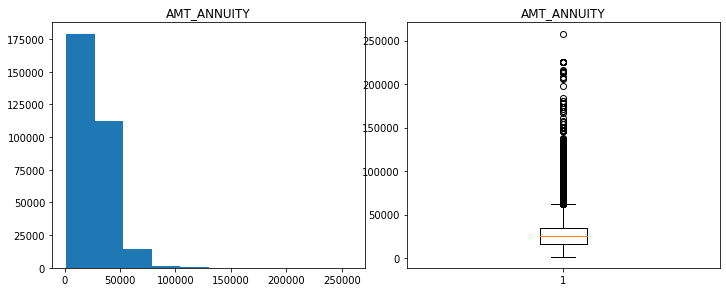

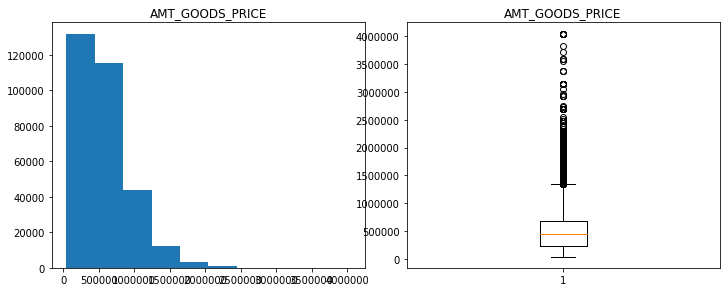

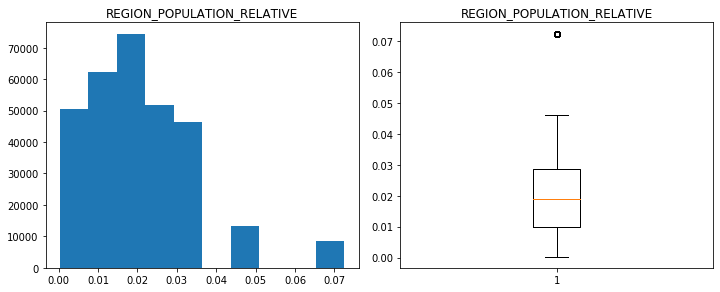

...

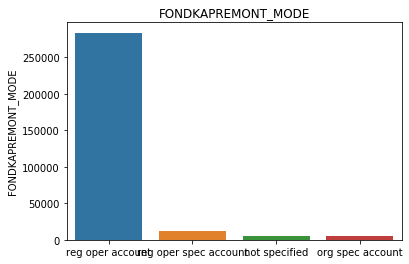

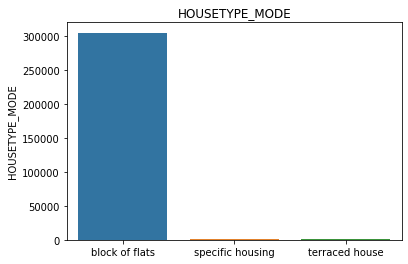

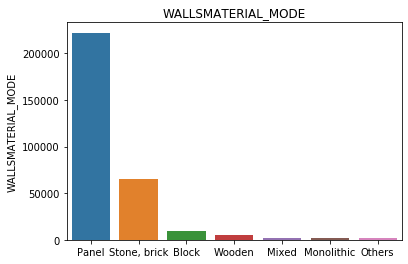

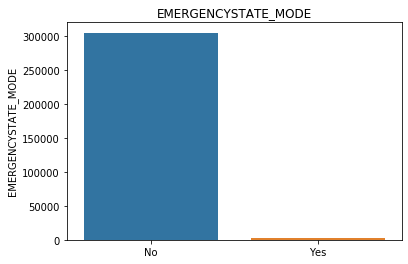

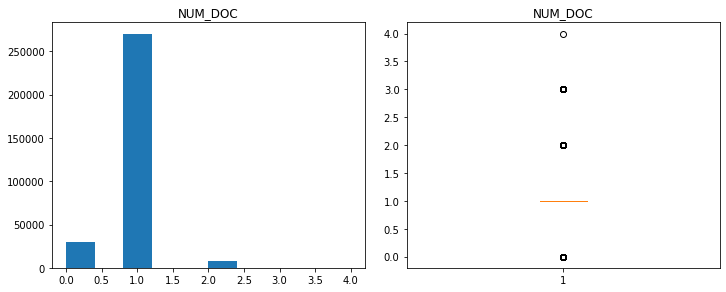

In [55]:
for i in X_train_outlier[columns]: 
    if X_train_outlier[i].dtype == 'object':
        sns.barplot(X_train_outlier[i].value_counts().index,X_train_outlier[i].value_counts())
        plt.title(i)
        plt.show()
    
    else:

        

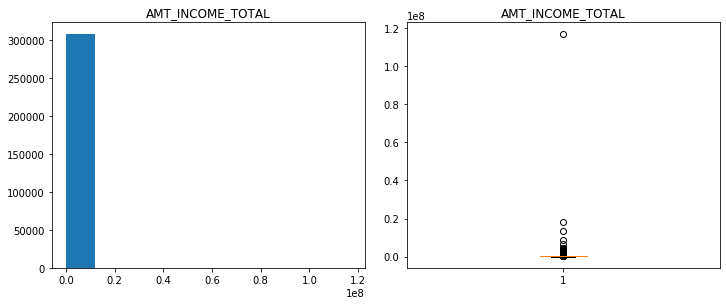

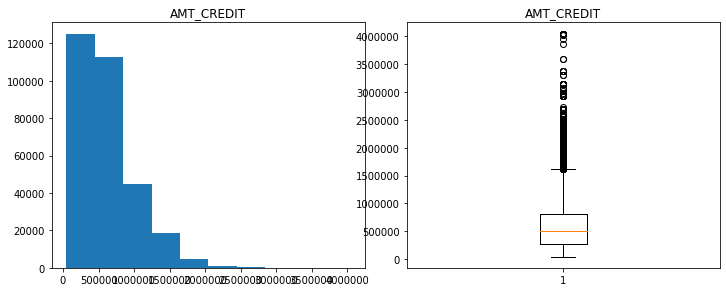

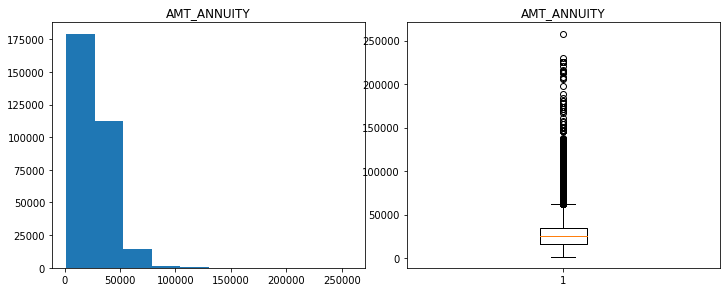

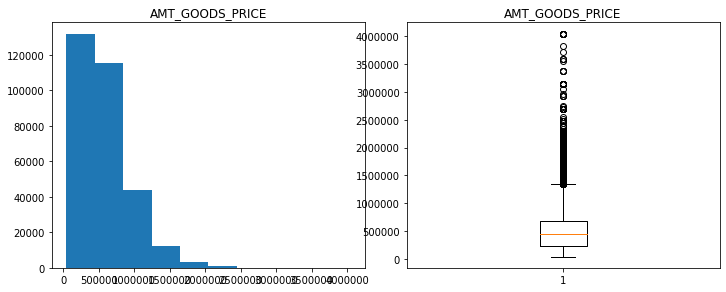

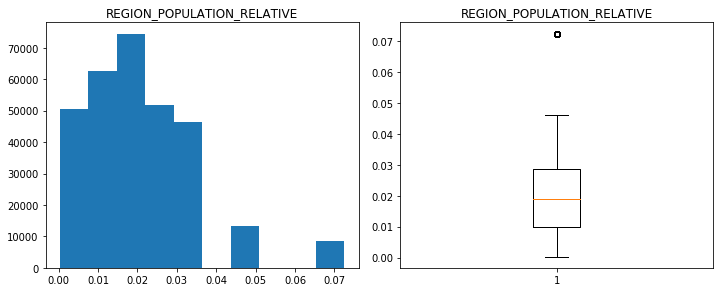

...

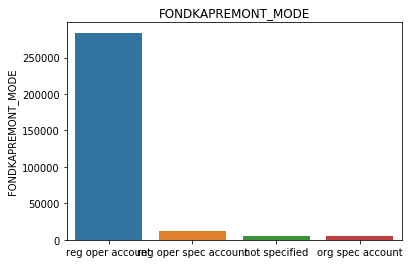

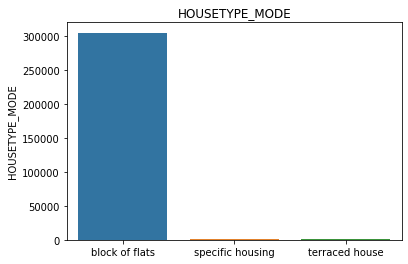

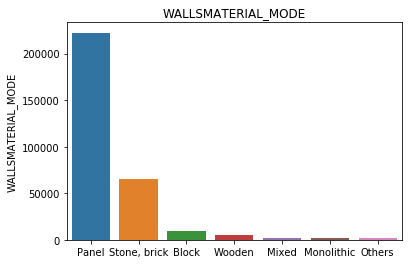

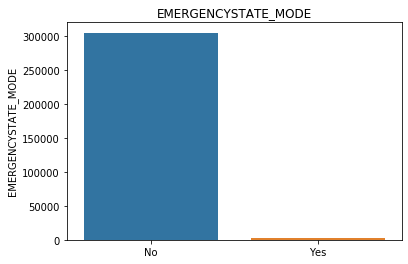

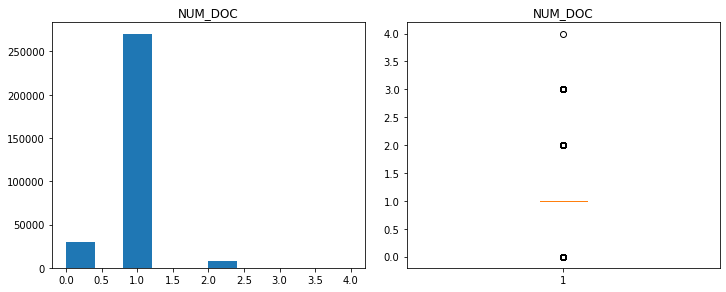

In [56]:
for i in X_train[columns]: 
    if X_train[i].dtype == 'object':
        sns.barplot(X_train[i].value_counts().index,X_train[i].value_counts())
        plt.title(i)
        plt.show()
    
    else:
        fig, ax = plt.subplots(1,2,figsize=(10,4))
        fig.tight_layout()
        ax[0].hist(X_train[i])
        ax[0].set_title(i)
        ax[1].boxplot(X_train[i])
        ax[1].set_title(i)
        plt.show()

In [57]:
to_normalise = ['OWN_CAR_AGE','AMT_REQ_CREDIT_BUREAU_WEEK','AMT_PAYMENT_TOTAL_CURRENT',
                'AMT_REQ_CREDIT_BUREAU_DAY','OBS_60_CNT_SOCIAL_CIRCLE',
                'DEF_30_CNT_SOCIAL_CIRCLE','CREDIT_PERSONAL','NUM_DOC','PREV_AMT_CREDIT',
                'AMT_REQ_CREDIT_BUREAU_QRT','PREV_TYPE_REVOLVING_LOAN',
                'AMT_CREDIT_SUM_OVERDUE','PREV_AMT_DOWNPAYMENT','CNT_CREDIT_PROLONG',
                'AMT_TOTAL_RECEIVABLE','CREDIT_BUSINESS','AMT_DRAWINGS_CURRENT','AMT_REQ_CREDIT_BUREAU_HOUR', 
                'BUR_DAYS_CREDIT_ENDDATE','OBS_30_CNT_SOCIAL_CIRCLE','CNT_DRAWINGS_CURRENT','AMT_CREDIT_SUM',
                'DAYS_LAST_PHONE_CHANGE','REGION_RATING_CLIENT','PREV_TYPE_CONSUMER_LOAN',
                'AMT_REQ_CREDIT_BUREAU_MON']
to_standardise = ['AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE','REGION_POPULATION_RELATIVE','DAYS_BIRTH',
                  'AMT_CREDIT_SUM_DEBT',
                  'HOUR_APPR_PROCESS_START','REGION_POPULATION_RELATIVE','CNT_FAM_MEMBERS',
                  'AMT_ANNUITY','CNT_INSTALMENT','AMT_CREDIT','AMT_REQ_CREDIT_BUREAU_YEAR',
                  'DAYS_EMPLOYED','CNT_CHILDREN','CNT_INSTALMENT_FUTURE','DAYS_ID_PUBLISH',
                  'AMT_GOODS_PRICE','AMT_INCOME_TOTAL','DAYS_REGISTRATION']

In [58]:
def normalisation(df_train,df_test,sc,to_normalise):
    from sklearn.preprocessing import MinMaxScaler
    sc = MinMaxScaler()
    df_train.loc[:,to_normalise] = sc.fit_transform(df_train.loc[:,to_normalise])
    df_test.loc[:,to_normalise] = sc.transform(df_test.loc[:,to_normalise])
    
def standardisation(df_train,df_test,sc,to_standardise):
    from sklearn.preprocessing import StandardScaler
    sc = StandardScaler()
    df_train.loc[:,to_standardise] = sc.fit_transform(df_train.loc[:,to_standardise])
    df_test.loc[:,to_standardise] = sc.transform(df_test.loc[:,to_standardise])

In [59]:
#Perform normalisation and standardisation
sc_norm = 0
sc_stand = 0

normalisation(X_train,X_test,sc_norm,to_normalise)
standardisation(X_train,X_test,sc_stand,to_standardise)

normalisation(X_train_outlier,X_test_outlier,sc_norm,to_normalise)
standardisation(X_train_outlier,X_test_outlier,sc_stand,to_standardise)

### Encoding Categorical Variables

In [60]:
#Determine which variables uses OHE, and which uses label/ordinal encoding
for i in X_train:
    if X_train[i].dtype == 'object' and X_train[i].nunique() == 2:
        print(f'To do OHE - {i}')
    elif X_train[i].dtype == 'object' and X_train[i].nunique() != 2:
        print(f'For ordinal or label encoding - {i}')


To do OHE - NAME_CONTRACT_TYPE
To do OHE - CODE_GENDER
To do OHE - FLAG_OWN_CAR
To do OHE - FLAG_OWN_REALTY
For ordinal or label encoding - NAME_TYPE_SUITE
For ordinal or label encoding - NAME_INCOME_TYPE
For ordinal or label encoding - NAME_EDUCATION_TYPE
For ordinal or label encoding - NAME_FAMILY_STATUS
For ordinal or label encoding - NAME_HOUSING_TYPE
For ordinal or label encoding - OCCUPATION_TYPE
For ordinal or label encoding - WEEKDAY_APPR_PROCESS_START
For ordinal or label encoding - ORGANIZATION_TYPE
For ordinal or label encoding - FONDKAPREMONT_MODE
For ordinal or label encoding - HOUSETYPE_MODE
For ordinal or label encoding - WALLSMATERIAL_MODE
To do OHE - EMERGENCYSTATE_MODE


In [61]:
#Name_Education_Type is a variable where the order matters, hence we will use ordinal encoding for this
to_OHE = ['CODE_GENDER', 'NAME_CONTRACT_TYPE','EMERGENCYSTATE_MODE', 'FLAG_OWN_CAR','FLAG_OWN_REALTY']
to_LE = ['NAME_INCOME_TYPE','WALLSMATERIAL_MODE','OCCUPATION_TYPE','NAME_HOUSING_TYPE','FONDKAPREMONT_MODE',
'NAME_FAMILY_STATUS','NAME_TYPE_SUITE','ORGANIZATION_TYPE','HOUSETYPE_MODE','WEEKDAY_APPR_PROCESS_START']
to_ordinal = ['NAME_EDUCATION_TYPE']

In [62]:
def one_hot_encoding(df,col):
    import pandas as pd
    df = pd.merge(df,pd.get_dummies(df[col],drop_first=True),left_index=True,right_index=True)
    df.drop(columns=col,inplace=True)
    return df

In [63]:
def label_encoding(df,col):
    from sklearn.preprocessing import LabelEncoder
    le = LabelEncoder()
    for i in df[col]:
        df[i] = le.fit_transform(df[i])
    return df

In [64]:
edu_type = ['Lower secondary', 'Secondary / secondary special', 'Incomplete higher', 'Higher education','Academic degree']

def ordinal_encoding(df,to_ordinal,edu_type):
    from sklearn.preprocessing import OrdinalEncoder
    ordi = OrdinalEncoder(categories=[edu_type])
    ordi.fit(df[to_ordinal])
#     df[to_ordinal] = pd.DataFrame(ordi.transform(df[to_ordinal]))    
    df[to_ordinal] = ordi.transform(df[to_ordinal])    
    return df

In [65]:
X_train = one_hot_encoding(X_train,to_OHE)
X_train = label_encoding(X_train,to_LE)
X_train = ordinal_encoding(X_train,to_ordinal,edu_type)

In [66]:
X_train_outlier = one_hot_encoding(X_train_outlier,to_OHE)
X_train_outlier = label_encoding(X_train_outlier,to_LE)
X_train_outlier = ordinal_encoding(X_train_outlier,to_ordinal,edu_type)

In [67]:
X_test = one_hot_encoding(X_test,to_OHE)
X_test = label_encoding(X_test,to_LE)
X_test = ordinal_encoding(X_test,to_ordinal,edu_type)

In [68]:
X_test_outlier = one_hot_encoding(X_test_outlier,to_OHE)
X_test_outlier = label_encoding(X_test_outlier,to_LE)
X_test_outlier = ordinal_encoding(X_test_outlier,to_ordinal,edu_type)

In [69]:
X_train

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,...,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,NUM_DOC,CODE_GENDER_M,NAME_CONTRACT_TYPE_Revolving loans,EMERGENCYSTATE_MODE_Yes,FLAG_OWN_CAR_Y,FLAG_OWN_REALTY_Y
0,0.142129,-0.478099,-0.166149,-0.507239,-0.149444,1.506889,0.755835,0.379840,0.579152,0.098901,...,5,2,0,5,0.25,1,0,0,0,1
1,0.426790,1.725436,0.592674,1.600865,-1.252739,-0.166814,0.497895,1.078701,1.790850,0.098901,...,39,2,0,0,0.25,0,0,0,0,0
2,-0.427192,-1.152889,-1.404670,-1.092146,-0.783441,-0.689503,0.948705,0.206119,0.306867,0.285714,...,11,2,0,4,0.00,1,1,0,1,1
3,-0.142532,-0.711433,0.177867,-0.653466,-0.928980,-0.680108,-0.368614,-1.375827,0.369142,0.098901,...,5,2,0,4,0.25,0,0,0,0,1
4,-0.199464,-0.213740,-0.361754,-0.068558,0.563577,-0.892529,-0.368146,0.191642,-0.307263,0.098901,...,37,2,0,4,0.25,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,-0.047645,-0.855492,0.031008,-0.848435,0.845402,1.537595,0.943555,-0.984953,0.670576,0.098901,...,43,2,0,5,0.25,1,0,0,0,0
307507,-0.408215,-0.818597,-1.042335,-0.848435,0.310600,-1.085701,0.282555,0.169785,-0.725958,0.098901,...,57,2,0,5,0.25,0,0,0,0,1
307508,-0.066622,0.195371,0.198049,0.126411,-1.147109,0.245425,-2.654027,-0.497000,-1.428199,0.098901,...,39,2,0,4,0.25,0,0,0,0,1
307509,0.009288,-0.568761,-0.476323,-0.592538,-1.124624,0.934017,-1.186438,0.688111,1.366855,0.098901,...,3,2,0,5,0.25,0,0,0,0,1


In [70]:
X_train_outlier

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,...,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,NUM_DOC,CODE_GENDER_M,NAME_CONTRACT_TYPE_Revolving loans,EMERGENCYSTATE_MODE_Yes,FLAG_OWN_CAR_Y,FLAG_OWN_REALTY_Y
0,0.394164,-0.477650,-0.165255,-0.506869,-0.148982,1.506773,0.755716,0.380052,0.579149,0.098901,...,5,2,0,5,0.25,1,0,0,0,1
1,1.147456,1.729075,0.597885,1.604843,-1.253287,-0.166654,0.497775,1.078887,1.790874,0.098901,...,39,2,0,0,0.25,0,0,0,0,0
2,-1.112418,-1.153417,-1.410824,-1.092778,-0.783560,-0.689256,0.948586,0.206337,0.306858,0.285714,...,11,2,0,4,0.00,1,1,0,1,1
3,-0.359127,-0.711322,0.180718,-0.653346,-0.929232,-0.679862,-0.368740,-1.375551,0.369134,0.098901,...,5,2,0,4,0.25,0,0,0,0,1
4,-0.509785,-0.212908,-0.361973,-0.067438,0.564691,-0.892248,-0.368271,0.191861,-0.307286,0.098901,...,37,2,0,4,0.25,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,-0.108030,-0.855589,0.033024,-0.848649,0.846774,1.537474,0.943437,-0.984692,0.670574,0.098901,...,43,2,0,5,0.25,1,0,0,0,0
307507,-1.062199,-0.818641,-1.046427,-0.848649,0.311483,-1.085389,0.282433,0.170004,-0.725990,0.098901,...,57,2,0,5,0.25,0,0,0,0,1
307508,-0.158249,0.196796,0.201015,0.127865,-1.147561,0.245517,-2.654164,-0.496756,-1.428247,0.098901,...,39,2,0,4,0.25,0,0,0,0,1
307509,0.042629,-0.568443,-0.477194,-0.592314,-1.125055,0.933996,-1.186568,0.688312,1.366869,0.098901,...,3,2,0,5,0.25,0,0,0,0,1


In [71]:
X_test

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,...,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,NUM_DOC,CODE_GENDER_M,NAME_CONTRACT_TYPE_Revolving loans,EMERGENCYSTATE_MODE_Yes,FLAG_OWN_CAR_Y,FLAG_OWN_REALTY_Y
0,-0.142532,-0.075104,-0.451794,-0.239156,-0.145901,-0.734187,-0.036242,-0.052193,1.445691,0.098901,...,28,2,0,5,0.25,0,0,0,0,1
1,-0.294351,-0.934828,-0.671928,-0.970291,1.079003,-0.464479,-1.038041,-1.172868,0.908410,0.098901,...,42,2,0,4,0.25,1,0,0,0,1
2,0.142129,0.159594,2.943970,0.248267,-0.127754,-0.916818,-1.032891,0.797965,-0.337075,0.054945,...,54,2,0,4,0.25,1,0,0,1,1
3,0.616564,2.424822,1.511707,2.807237,0.399384,0.472282,0.180503,0.847640,-0.804132,0.098901,...,5,2,0,4,0.25,0,0,0,0,1
4,0.047242,0.065769,0.342113,0.236081,-0.783441,0.686765,0.028360,0.279922,-0.839906,0.175824,...,5,2,0,4,0.25,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,-0.199464,-0.463285,-0.664786,-0.726579,-1.361116,-0.901236,-1.365732,-1.166055,-0.268176,0.098901,...,33,2,0,4,0.25,0,0,0,0,1
48740,-0.047645,0.058099,0.331246,-0.117301,1.079003,1.111607,0.516152,0.559523,-0.005829,0.098901,...,51,2,0,4,0.25,0,0,0,0,0
48741,0.142129,-0.705675,0.420666,-0.604723,0.399384,0.026358,-0.367678,0.654332,0.987247,0.043956,...,5,2,0,5,0.25,0,0,0,1,1
48742,0.237016,-0.370265,-0.136653,-0.239156,-0.145901,0.474115,-0.224430,1.000640,1.079996,0.098901,...,42,2,0,4,0.25,1,0,0,0,0


In [72]:
X_test_outlier

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,...,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,NUM_DOC,CODE_GENDER_M,NAME_CONTRACT_TYPE_Revolving loans,EMERGENCYSTATE_MODE_Yes,FLAG_OWN_CAR_Y,FLAG_OWN_REALTY_Y
0,-0.359127,-0.074071,-0.452526,-0.238328,-0.145436,-0.733932,-0.036365,-0.051965,1.445708,0.098901,...,28,2,0,5,0.25,0,0,0,0,1
1,-0.760882,-0.935040,-0.673912,-0.970714,1.080588,-0.464269,-1.038170,-1.172599,0.908414,0.098901,...,42,2,0,4,0.25,1,0,0,0,1
2,0.394164,0.160967,2.962560,0.249929,-0.127272,-0.916534,-1.033020,0.798161,-0.337098,0.054945,...,54,2,0,4,0.25,1,0,0,1,1
3,1.649650,2.429475,1.522148,2.813280,0.400348,0.472337,0.180380,0.847835,-0.804166,0.098901,...,5,2,0,4,0.25,0,0,0,0,1
4,0.143067,0.067005,0.345899,0.237723,-0.783560,0.686785,0.028237,0.280138,-0.839941,0.175824,...,5,2,0,4,0.25,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48739,-0.509785,-0.462815,-0.666730,-0.726585,-1.361764,-0.900954,-1.365863,-1.165787,-0.268198,0.098901,...,33,2,0,4,0.25,0,0,0,0,1
48740,-0.108030,0.059325,0.334970,-0.116263,1.080588,1.111557,0.516032,0.559728,-0.005845,0.098901,...,51,2,0,4,0.25,0,0,0,0,0
48741,0.394164,-0.705556,0.424898,-0.604521,0.400348,0.026487,-0.367803,0.654534,0.987253,0.043956,...,5,2,0,5,0.25,0,0,0,1,1
48742,0.645261,-0.369659,-0.135592,-0.238328,-0.145436,0.474170,-0.224555,1.000829,1.080004,0.098901,...,42,2,0,4,0.25,1,0,0,0,0


## Dimensionality Reduction

This will be used for model training to reduce runtime

In [73]:
X_train_drop = X_train.copy()
X_train_drop.drop(columns='SK_ID_CURR',inplace=True)
X_test_drop = X_test.copy()
X_test_drop.drop(columns='SK_ID_CURR',inplace=True)

In [74]:
X_train_outlier_drop = X_train_outlier.copy()
X_train_outlier_drop.drop(columns='SK_ID_CURR',inplace=True)
X_test_outlier_drop = X_test_outlier.copy()
X_test_outlier_drop.drop(columns='SK_ID_CURR',inplace=True)

In [75]:
from sklearn.decomposition import PCA

pca = PCA(n_components = 5)
comp = pca.fit_transform(X_train_drop)
df_pca = pd.DataFrame(comp,columns=['pc1','pc2','pc3','pc4','pc5'])

X_train_pca = df_pca

In [76]:
test_comp = pca.transform(X_test_drop)
df_pca_test = pd.DataFrame(test_comp,columns=['pc1','pc2','pc3','pc4','pc5'])
X_test_pca = df_pca_test

In [77]:
pca_2 = PCA(n_components = 5)
comp_2 = pca.fit_transform(X_train_outlier_drop)
df_pca_outlier = pd.DataFrame(comp_2,columns=['pc1','pc2','pc3','pc4','pc5'])

X_train_outlier_pca = df_pca_outlier

In [78]:
test_comp_outlier = pca.transform(X_test_outlier_drop)
df_pca_test_outlier = pd.DataFrame(test_comp_outlier,columns=['pc1','pc2','pc3','pc4','pc5'])
X_test_outlier_pca = df_pca_test_outlier

### Take only the important features

We will also have another scenario to only take the important features, to compare with the use of PCA. From secondary research, these features seem the most important.

In [79]:
col_imp = ['SK_ID_CURR','CODE_GENDER_M','CNT_CHILDREN','OCCUPATION_TYPE','AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','DAYS_BIRTH','DAYS_EMPLOYED','AMT_CREDIT_SUM','AMT_CREDIT_SUM_OVERDUE',
           'CREDIT_PERSONAL','CREDIT_BUSINESS','AMT_PAYMENT_TOTAL_CURRENT','PREV_AMT_DOWNPAYMENT']

In [80]:
X_train_imp = X_train[col_imp]
X_test_imp = X_test[col_imp]

In [81]:
X_train

,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,...,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,NUM_DOC,CODE_GENDER_M,NAME_CONTRACT_TYPE_Revolving loans,EMERGENCYSTATE_MODE_Yes,FLAG_OWN_CAR_Y,FLAG_OWN_REALTY_Y
0,0.142129,-0.478099,-0.166149,-0.507239,-0.149444,1.506889,0.755835,0.379840,0.579152,0.098901,...,5,2,0,5,0.25,1,0,0,0,1
1,0.426790,1.725436,0.592674,1.600865,-1.252739,-0.166814,0.497895,1.078701,1.790850,0.098901,...,39,2,0,0,0.25,0,0,0,0,0
2,-0.427192,-1.152889,-1.404670,-1.092146,-0.783441,-0.689503,0.948705,0.206119,0.306867,0.285714,...,11,2,0,4,0.00,1,1,0,1,1
3,-0.142532,-0.711433,0.177867,-0.653466,-0.928980,-0.680108,-0.368614,-1.375827,0.369142,0.098901,...,5,2,0,4,0.25,0,0,0,0,1
4,-0.199464,-0.213740,-0.361754,-0.068558,0.563577,-0.892529,-0.368146,0.191642,-0.307263,0.098901,...,37,2,0,4,0.25,1,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
307506,-0.047645,-0.855492,0.031008,-0.848435,0.845402,1.537595,0.943555,-0.984953,0.670576,0.098901,...,43,2,0,5,0.25,1,0,0,0,0
307507,-0.408215,-0.818597,-1.042335,-0.848435,0.310600,-1.085701,0.282555,0.169785,-0.725958,0.098901,...,57,2,0,5,0.25,0,0,0,0,1
307508,-0.066622,0.195371,0.198049,0.126411,-1.147109,0.245425,-2.654027,-0.497000,-1.428199,0.098901,...,39,2,0,4,0.25,0,0,0,0,1
307509,0.009288,-0.568761,-0.476323,-0.592538,-1.124624,0.934017,-1.186438,0.688111,1.366855,0.098901,...,3,2,0,5,0.25,0,0,0,0,1


In [82]:
X_train_imp_drop = X_train_imp
X_train_imp_drop.drop(columns='SK_ID_CURR',inplace=True)
X_test_imp_drop = X_test_imp
X_test_imp_drop.drop(columns='SK_ID_CURR',inplace=True)

/Applications/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:4117: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


## Build Model

We will build the model using different algorithms:
1. XG Boost
2. LightGBM
3. CatBoost

In [83]:
from sklearn.model_selection import cross_val_score
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from sklearn.ensemble import VotingClassifier

lgb = LGBMClassifier()

LGB_cvs = cross_val_score(estimator = lgb, X = X_train_pca, y = y_train, scoring='accuracy', cv = 10)
LGB_cvs.mean()

0.9192701305767569

In [84]:
cbc = CatBoostClassifier()

CBC_cvs = cross_val_score(estimator = cbc, X = X_train_pca, y = y_train, scoring='accuracy', cv = 10)
CBC_cvs.mean()

Learning rate set to 0.113687
0:	learn: 0.5856670	total: 121ms	remaining: 2m 1s
1:	learn: 0.5064892	total: 179ms	remaining: 1m 29s
2:	learn: 0.4477510	total: 255ms	remaining: 1m 24s
3:	learn: 0.4049868	total: 324ms	remaining: 1m 20s
4:	learn: 0.3735191	total: 395ms	remaining: 1m 18s
5:	learn: 0.3498619	total: 465ms	remaining: 1m 17s
6:	learn: 0.3324237	total: 537ms	remaining: 1m 16s
7:	learn: 0.3192733	total: 641ms	remaining: 1m 19s
8:	learn: 0.3093542	total: 723ms	remaining: 1m 19s
9:	learn: 0.3017357	total: 779ms	remaining: 1m 17s
10:	learn: 0.2960078	total: 841ms	remaining: 1m 15s
11:	learn: 0.2916685	total: 904ms	remaining: 1m 14s
12:	learn: 0.2883867	total: 964ms	remaining: 1m 13s
13:	learn: 0.2858038	total: 1.03s	remaining: 1m 12s
14:	learn: 0.2838224	total: 1.11s	remaining: 1m 12s
15:	learn: 0.2823349	total: 1.18s	remaining: 1m 12s
16:	learn: 0.2811381	total: 1.25s	remaining: 1m 12s
17:	learn: 0.2801820	total: 1.32s	remaining: 1m 11s
18:	learn: 0.2794027	total: 1.39s	remaining: 

158:	learn: 0.2718354	total: 12.5s	remaining: 1m 6s
159:	learn: 0.2718060	total: 12.6s	remaining: 1m 6s
160:	learn: 0.2717898	total: 12.6s	remaining: 1m 5s
161:	learn: 0.2717741	total: 12.7s	remaining: 1m 5s
162:	learn: 0.2717565	total: 12.8s	remaining: 1m 5s
163:	learn: 0.2717347	total: 12.9s	remaining: 1m 5s
164:	learn: 0.2717121	total: 12.9s	remaining: 1m 5s
165:	learn: 0.2716891	total: 13s	remaining: 1m 5s
166:	learn: 0.2716566	total: 13.1s	remaining: 1m 5s
167:	learn: 0.2716284	total: 13.2s	remaining: 1m 5s
168:	learn: 0.2715946	total: 13.3s	remaining: 1m 5s
169:	learn: 0.2715741	total: 13.3s	remaining: 1m 5s
170:	learn: 0.2715541	total: 13.4s	remaining: 1m 4s
171:	learn: 0.2715299	total: 13.5s	remaining: 1m 4s
172:	learn: 0.2715041	total: 13.6s	remaining: 1m 4s
173:	learn: 0.2714855	total: 13.6s	remaining: 1m 4s
174:	learn: 0.2714588	total: 13.7s	remaining: 1m 4s
175:	learn: 0.2714373	total: 13.8s	remaining: 1m 4s
176:	learn: 0.2714203	total: 13.9s	remaining: 1m 4s
177:	learn: 0.

318:	learn: 0.2686043	total: 23.9s	remaining: 51s
319:	learn: 0.2685890	total: 24s	remaining: 50.9s
320:	learn: 0.2685669	total: 24s	remaining: 50.8s
321:	learn: 0.2685500	total: 24.1s	remaining: 50.8s
322:	learn: 0.2685310	total: 24.2s	remaining: 50.7s
323:	learn: 0.2685094	total: 24.2s	remaining: 50.6s
324:	learn: 0.2684957	total: 24.3s	remaining: 50.5s
325:	learn: 0.2684835	total: 24.4s	remaining: 50.4s
326:	learn: 0.2684614	total: 24.5s	remaining: 50.4s
327:	learn: 0.2684390	total: 24.5s	remaining: 50.3s
328:	learn: 0.2684173	total: 24.6s	remaining: 50.2s
329:	learn: 0.2684010	total: 24.7s	remaining: 50.1s
330:	learn: 0.2683822	total: 24.7s	remaining: 50s
331:	learn: 0.2683753	total: 24.8s	remaining: 49.9s
332:	learn: 0.2683621	total: 24.9s	remaining: 49.8s
333:	learn: 0.2683472	total: 24.9s	remaining: 49.7s
334:	learn: 0.2683364	total: 25s	remaining: 49.7s
335:	learn: 0.2683103	total: 25.1s	remaining: 49.6s
336:	learn: 0.2682994	total: 25.1s	remaining: 49.5s
337:	learn: 0.2682815	

479:	learn: 0.2659899	total: 37.4s	remaining: 40.6s
480:	learn: 0.2659637	total: 37.5s	remaining: 40.5s
481:	learn: 0.2659534	total: 37.6s	remaining: 40.4s
482:	learn: 0.2659455	total: 37.7s	remaining: 40.4s
483:	learn: 0.2659326	total: 37.8s	remaining: 40.3s
484:	learn: 0.2659192	total: 37.9s	remaining: 40.3s
485:	learn: 0.2659018	total: 38.1s	remaining: 40.3s
486:	learn: 0.2658866	total: 38.1s	remaining: 40.2s
487:	learn: 0.2658698	total: 38.2s	remaining: 40.1s
488:	learn: 0.2658551	total: 38.3s	remaining: 40.1s
489:	learn: 0.2658433	total: 38.4s	remaining: 40s
490:	learn: 0.2658280	total: 38.5s	remaining: 39.9s
491:	learn: 0.2658030	total: 38.6s	remaining: 39.9s
492:	learn: 0.2657921	total: 38.7s	remaining: 39.8s
493:	learn: 0.2657723	total: 38.8s	remaining: 39.8s
494:	learn: 0.2657681	total: 39s	remaining: 39.8s
495:	learn: 0.2657556	total: 39.1s	remaining: 39.7s
496:	learn: 0.2657413	total: 39.2s	remaining: 39.6s
497:	learn: 0.2657245	total: 39.3s	remaining: 39.6s
498:	learn: 0.26

640:	learn: 0.2635475	total: 50.3s	remaining: 28.2s
641:	learn: 0.2635328	total: 50.3s	remaining: 28.1s
642:	learn: 0.2635253	total: 50.4s	remaining: 28s
643:	learn: 0.2635017	total: 50.5s	remaining: 27.9s
644:	learn: 0.2634866	total: 50.5s	remaining: 27.8s
645:	learn: 0.2634732	total: 50.6s	remaining: 27.7s
646:	learn: 0.2634604	total: 50.7s	remaining: 27.7s
647:	learn: 0.2634514	total: 50.8s	remaining: 27.6s
648:	learn: 0.2634335	total: 50.8s	remaining: 27.5s
649:	learn: 0.2634227	total: 50.9s	remaining: 27.4s
650:	learn: 0.2634115	total: 51s	remaining: 27.3s
651:	learn: 0.2633985	total: 51s	remaining: 27.2s
652:	learn: 0.2633897	total: 51.1s	remaining: 27.2s
653:	learn: 0.2633717	total: 51.2s	remaining: 27.1s
654:	learn: 0.2633585	total: 51.3s	remaining: 27s
655:	learn: 0.2633468	total: 51.3s	remaining: 26.9s
656:	learn: 0.2633321	total: 51.4s	remaining: 26.8s
657:	learn: 0.2633187	total: 51.5s	remaining: 26.7s
658:	learn: 0.2632935	total: 51.5s	remaining: 26.7s
659:	learn: 0.263271

800:	learn: 0.2613293	total: 1m 1s	remaining: 15.3s
801:	learn: 0.2613169	total: 1m 1s	remaining: 15.2s
802:	learn: 0.2613095	total: 1m 1s	remaining: 15.1s
803:	learn: 0.2612973	total: 1m 1s	remaining: 15.1s
804:	learn: 0.2612768	total: 1m 1s	remaining: 15s
805:	learn: 0.2612681	total: 1m 1s	remaining: 14.9s
806:	learn: 0.2612430	total: 1m 1s	remaining: 14.8s
807:	learn: 0.2612320	total: 1m 2s	remaining: 14.7s
808:	learn: 0.2612155	total: 1m 2s	remaining: 14.7s
809:	learn: 0.2612024	total: 1m 2s	remaining: 14.6s
810:	learn: 0.2611821	total: 1m 2s	remaining: 14.5s
811:	learn: 0.2611696	total: 1m 2s	remaining: 14.4s
812:	learn: 0.2611541	total: 1m 2s	remaining: 14.3s
813:	learn: 0.2611343	total: 1m 2s	remaining: 14.3s
814:	learn: 0.2611197	total: 1m 2s	remaining: 14.2s
815:	learn: 0.2611066	total: 1m 2s	remaining: 14.1s
816:	learn: 0.2611011	total: 1m 2s	remaining: 14s
817:	learn: 0.2610929	total: 1m 2s	remaining: 14s
818:	learn: 0.2610824	total: 1m 2s	remaining: 13.9s
819:	learn: 0.2610

958:	learn: 0.2591936	total: 1m 12s	remaining: 3.11s
959:	learn: 0.2591833	total: 1m 12s	remaining: 3.04s
960:	learn: 0.2591765	total: 1m 12s	remaining: 2.96s
961:	learn: 0.2591622	total: 1m 13s	remaining: 2.88s
962:	learn: 0.2591534	total: 1m 13s	remaining: 2.81s
963:	learn: 0.2591350	total: 1m 13s	remaining: 2.73s
964:	learn: 0.2591167	total: 1m 13s	remaining: 2.66s
965:	learn: 0.2591022	total: 1m 13s	remaining: 2.58s
966:	learn: 0.2590902	total: 1m 13s	remaining: 2.51s
967:	learn: 0.2590778	total: 1m 13s	remaining: 2.43s
968:	learn: 0.2590651	total: 1m 13s	remaining: 2.35s
969:	learn: 0.2590518	total: 1m 13s	remaining: 2.28s
970:	learn: 0.2590438	total: 1m 13s	remaining: 2.2s
971:	learn: 0.2590344	total: 1m 13s	remaining: 2.13s
972:	learn: 0.2590316	total: 1m 13s	remaining: 2.05s
973:	learn: 0.2590168	total: 1m 14s	remaining: 1.98s
974:	learn: 0.2590027	total: 1m 14s	remaining: 1.9s
975:	learn: 0.2589846	total: 1m 14s	remaining: 1.83s
976:	learn: 0.2589715	total: 1m 14s	remaining: 1

117:	learn: 0.2729395	total: 9.43s	remaining: 1m 10s
118:	learn: 0.2729225	total: 9.52s	remaining: 1m 10s
119:	learn: 0.2729035	total: 9.62s	remaining: 1m 10s
120:	learn: 0.2728766	total: 9.74s	remaining: 1m 10s
121:	learn: 0.2728553	total: 9.82s	remaining: 1m 10s
122:	learn: 0.2728384	total: 9.9s	remaining: 1m 10s
123:	learn: 0.2728142	total: 9.97s	remaining: 1m 10s
124:	learn: 0.2727842	total: 10.1s	remaining: 1m 10s
125:	learn: 0.2727529	total: 10.1s	remaining: 1m 10s
126:	learn: 0.2727245	total: 10.2s	remaining: 1m 10s
127:	learn: 0.2726983	total: 10.3s	remaining: 1m 10s
128:	learn: 0.2726758	total: 10.4s	remaining: 1m 10s
129:	learn: 0.2726411	total: 10.4s	remaining: 1m 9s
130:	learn: 0.2726122	total: 10.5s	remaining: 1m 9s
131:	learn: 0.2725854	total: 10.6s	remaining: 1m 9s
132:	learn: 0.2725634	total: 10.7s	remaining: 1m 9s
133:	learn: 0.2725410	total: 10.8s	remaining: 1m 9s
134:	learn: 0.2725116	total: 10.8s	remaining: 1m 9s
135:	learn: 0.2724928	total: 10.9s	remaining: 1m 9s
1

278:	learn: 0.2693910	total: 22.9s	remaining: 59.3s
279:	learn: 0.2693774	total: 23s	remaining: 59.2s
280:	learn: 0.2693615	total: 23.1s	remaining: 59.1s
281:	learn: 0.2693454	total: 23.2s	remaining: 59s
282:	learn: 0.2693302	total: 23.3s	remaining: 58.9s
283:	learn: 0.2693109	total: 23.4s	remaining: 58.9s
284:	learn: 0.2692957	total: 23.5s	remaining: 58.9s
285:	learn: 0.2692771	total: 23.5s	remaining: 58.8s
286:	learn: 0.2692574	total: 23.6s	remaining: 58.7s
287:	learn: 0.2692339	total: 23.7s	remaining: 58.6s
288:	learn: 0.2692119	total: 23.8s	remaining: 58.5s
289:	learn: 0.2691981	total: 23.9s	remaining: 58.5s
290:	learn: 0.2691770	total: 24s	remaining: 58.4s
291:	learn: 0.2691472	total: 24s	remaining: 58.3s
292:	learn: 0.2691322	total: 24.1s	remaining: 58.2s
293:	learn: 0.2691159	total: 24.2s	remaining: 58.1s
294:	learn: 0.2690987	total: 24.3s	remaining: 58s
295:	learn: 0.2690736	total: 24.3s	remaining: 57.9s
296:	learn: 0.2690566	total: 24.4s	remaining: 57.8s
297:	learn: 0.2690416	

439:	learn: 0.2666392	total: 34.4s	remaining: 43.8s
440:	learn: 0.2666192	total: 34.5s	remaining: 43.7s
441:	learn: 0.2666042	total: 34.6s	remaining: 43.6s
442:	learn: 0.2665827	total: 34.6s	remaining: 43.5s
443:	learn: 0.2665652	total: 34.7s	remaining: 43.5s
444:	learn: 0.2665486	total: 34.8s	remaining: 43.4s
445:	learn: 0.2665350	total: 34.8s	remaining: 43.3s
446:	learn: 0.2665230	total: 34.9s	remaining: 43.2s
447:	learn: 0.2665113	total: 35s	remaining: 43.1s
448:	learn: 0.2664929	total: 35.1s	remaining: 43s
449:	learn: 0.2664819	total: 35.1s	remaining: 42.9s
450:	learn: 0.2664680	total: 35.2s	remaining: 42.8s
451:	learn: 0.2664557	total: 35.2s	remaining: 42.7s
452:	learn: 0.2664477	total: 35.3s	remaining: 42.6s
453:	learn: 0.2664285	total: 35.4s	remaining: 42.5s
454:	learn: 0.2664103	total: 35.4s	remaining: 42.5s
455:	learn: 0.2663878	total: 35.5s	remaining: 42.4s
456:	learn: 0.2663749	total: 35.6s	remaining: 42.3s
457:	learn: 0.2663603	total: 35.6s	remaining: 42.2s
458:	learn: 0.26

599:	learn: 0.2641824	total: 45.4s	remaining: 30.2s
600:	learn: 0.2641669	total: 45.4s	remaining: 30.2s
601:	learn: 0.2641471	total: 45.5s	remaining: 30.1s
602:	learn: 0.2641285	total: 45.6s	remaining: 30s
603:	learn: 0.2641127	total: 45.6s	remaining: 29.9s
604:	learn: 0.2640939	total: 45.7s	remaining: 29.8s
605:	learn: 0.2640752	total: 45.8s	remaining: 29.7s
606:	learn: 0.2640493	total: 45.8s	remaining: 29.7s
607:	learn: 0.2640331	total: 45.9s	remaining: 29.6s
608:	learn: 0.2640240	total: 46s	remaining: 29.5s
609:	learn: 0.2640093	total: 46s	remaining: 29.4s
610:	learn: 0.2639971	total: 46.1s	remaining: 29.4s
611:	learn: 0.2639849	total: 46.2s	remaining: 29.3s
612:	learn: 0.2639736	total: 46.2s	remaining: 29.2s
613:	learn: 0.2639593	total: 46.3s	remaining: 29.1s
614:	learn: 0.2639456	total: 46.4s	remaining: 29s
615:	learn: 0.2639328	total: 46.4s	remaining: 28.9s
616:	learn: 0.2639176	total: 46.5s	remaining: 28.9s
617:	learn: 0.2639042	total: 46.6s	remaining: 28.8s
618:	learn: 0.263885

759:	learn: 0.2618116	total: 57s	remaining: 18s
760:	learn: 0.2617973	total: 57s	remaining: 17.9s
761:	learn: 0.2617831	total: 57.1s	remaining: 17.8s
762:	learn: 0.2617704	total: 57.2s	remaining: 17.8s
763:	learn: 0.2617586	total: 57.3s	remaining: 17.7s
764:	learn: 0.2617494	total: 57.3s	remaining: 17.6s
765:	learn: 0.2617329	total: 57.4s	remaining: 17.5s
766:	learn: 0.2617188	total: 57.5s	remaining: 17.5s
767:	learn: 0.2617050	total: 57.5s	remaining: 17.4s
768:	learn: 0.2616916	total: 57.6s	remaining: 17.3s
769:	learn: 0.2616732	total: 57.7s	remaining: 17.2s
770:	learn: 0.2616522	total: 57.7s	remaining: 17.2s
771:	learn: 0.2616463	total: 57.8s	remaining: 17.1s
772:	learn: 0.2616326	total: 57.9s	remaining: 17s
773:	learn: 0.2616183	total: 58s	remaining: 16.9s
774:	learn: 0.2616022	total: 58s	remaining: 16.8s
775:	learn: 0.2615907	total: 58.1s	remaining: 16.8s
776:	learn: 0.2615742	total: 58.2s	remaining: 16.7s
777:	learn: 0.2615582	total: 58.3s	remaining: 16.6s
778:	learn: 0.2615483	to

921:	learn: 0.2596241	total: 1m 8s	remaining: 5.78s
922:	learn: 0.2596089	total: 1m 8s	remaining: 5.7s
923:	learn: 0.2595945	total: 1m 8s	remaining: 5.63s
924:	learn: 0.2595780	total: 1m 8s	remaining: 5.56s
925:	learn: 0.2595670	total: 1m 8s	remaining: 5.48s
926:	learn: 0.2595551	total: 1m 8s	remaining: 5.41s
927:	learn: 0.2595478	total: 1m 8s	remaining: 5.33s
928:	learn: 0.2595385	total: 1m 8s	remaining: 5.26s
929:	learn: 0.2595274	total: 1m 8s	remaining: 5.18s
930:	learn: 0.2595122	total: 1m 8s	remaining: 5.11s
931:	learn: 0.2595005	total: 1m 9s	remaining: 5.04s
932:	learn: 0.2594856	total: 1m 9s	remaining: 4.96s
933:	learn: 0.2594764	total: 1m 9s	remaining: 4.89s
934:	learn: 0.2594646	total: 1m 9s	remaining: 4.81s
935:	learn: 0.2594496	total: 1m 9s	remaining: 4.74s
936:	learn: 0.2594360	total: 1m 9s	remaining: 4.66s
937:	learn: 0.2594248	total: 1m 9s	remaining: 4.59s
938:	learn: 0.2594103	total: 1m 9s	remaining: 4.51s
939:	learn: 0.2593965	total: 1m 9s	remaining: 4.44s
940:	learn: 0

80:	learn: 0.2738067	total: 5.79s	remaining: 1m 5s
81:	learn: 0.2737851	total: 5.85s	remaining: 1m 5s
82:	learn: 0.2737541	total: 5.9s	remaining: 1m 5s
83:	learn: 0.2737236	total: 5.95s	remaining: 1m 4s
84:	learn: 0.2736963	total: 6s	remaining: 1m 4s
85:	learn: 0.2736784	total: 6.06s	remaining: 1m 4s
86:	learn: 0.2736404	total: 6.11s	remaining: 1m 4s
87:	learn: 0.2736141	total: 6.17s	remaining: 1m 3s
88:	learn: 0.2735963	total: 6.22s	remaining: 1m 3s
89:	learn: 0.2735808	total: 6.28s	remaining: 1m 3s
90:	learn: 0.2735613	total: 6.34s	remaining: 1m 3s
91:	learn: 0.2735273	total: 6.4s	remaining: 1m 3s
92:	learn: 0.2735049	total: 6.46s	remaining: 1m 2s
93:	learn: 0.2734865	total: 6.52s	remaining: 1m 2s
94:	learn: 0.2734599	total: 6.58s	remaining: 1m 2s
95:	learn: 0.2734441	total: 6.63s	remaining: 1m 2s
96:	learn: 0.2734188	total: 6.68s	remaining: 1m 2s
97:	learn: 0.2733958	total: 6.74s	remaining: 1m 1s
98:	learn: 0.2733718	total: 6.79s	remaining: 1m 1s
99:	learn: 0.2733424	total: 6.85s	re

240:	learn: 0.2700820	total: 17.8s	remaining: 55.9s
241:	learn: 0.2700616	total: 17.8s	remaining: 55.9s
242:	learn: 0.2700367	total: 17.9s	remaining: 55.8s
243:	learn: 0.2700244	total: 18s	remaining: 55.7s
244:	learn: 0.2700034	total: 18s	remaining: 55.6s
245:	learn: 0.2699814	total: 18.1s	remaining: 55.5s
246:	learn: 0.2699624	total: 18.2s	remaining: 55.4s
247:	learn: 0.2699474	total: 18.3s	remaining: 55.4s
248:	learn: 0.2699267	total: 18.3s	remaining: 55.3s
249:	learn: 0.2699113	total: 18.4s	remaining: 55.2s
250:	learn: 0.2698930	total: 18.5s	remaining: 55.1s
251:	learn: 0.2698787	total: 18.5s	remaining: 55s
252:	learn: 0.2698590	total: 18.6s	remaining: 54.9s
253:	learn: 0.2698372	total: 18.7s	remaining: 54.8s
254:	learn: 0.2698101	total: 18.8s	remaining: 54.9s
255:	learn: 0.2697913	total: 18.9s	remaining: 54.9s
256:	learn: 0.2697754	total: 18.9s	remaining: 54.8s
257:	learn: 0.2697504	total: 19s	remaining: 54.7s
258:	learn: 0.2697310	total: 19.1s	remaining: 54.6s
259:	learn: 0.269710

402:	learn: 0.2672658	total: 29s	remaining: 43s
403:	learn: 0.2672495	total: 29.1s	remaining: 42.9s
404:	learn: 0.2672294	total: 29.2s	remaining: 42.8s
405:	learn: 0.2672038	total: 29.2s	remaining: 42.8s
406:	learn: 0.2671812	total: 29.3s	remaining: 42.7s
407:	learn: 0.2671571	total: 29.4s	remaining: 42.6s
408:	learn: 0.2671454	total: 29.4s	remaining: 42.5s
409:	learn: 0.2671284	total: 29.5s	remaining: 42.5s
410:	learn: 0.2671133	total: 29.6s	remaining: 42.4s
411:	learn: 0.2670934	total: 29.6s	remaining: 42.3s
412:	learn: 0.2670776	total: 29.7s	remaining: 42.2s
413:	learn: 0.2670648	total: 29.8s	remaining: 42.2s
414:	learn: 0.2670464	total: 30s	remaining: 42.3s
415:	learn: 0.2670281	total: 30.1s	remaining: 42.3s
416:	learn: 0.2670126	total: 30.2s	remaining: 42.3s
417:	learn: 0.2670003	total: 30.4s	remaining: 42.3s
418:	learn: 0.2669889	total: 30.5s	remaining: 42.2s
419:	learn: 0.2669697	total: 30.5s	remaining: 42.2s
420:	learn: 0.2669514	total: 30.6s	remaining: 42.1s
421:	learn: 0.2669

561:	learn: 0.2647758	total: 40.3s	remaining: 31.4s
562:	learn: 0.2647523	total: 40.3s	remaining: 31.3s
563:	learn: 0.2647389	total: 40.4s	remaining: 31.2s
564:	learn: 0.2647232	total: 40.5s	remaining: 31.2s
565:	learn: 0.2647071	total: 40.5s	remaining: 31.1s
566:	learn: 0.2646932	total: 40.6s	remaining: 31s
567:	learn: 0.2646822	total: 40.7s	remaining: 30.9s
568:	learn: 0.2646611	total: 40.7s	remaining: 30.9s
569:	learn: 0.2646446	total: 40.8s	remaining: 30.8s
570:	learn: 0.2646321	total: 40.9s	remaining: 30.7s
571:	learn: 0.2646213	total: 40.9s	remaining: 30.6s
572:	learn: 0.2646112	total: 41s	remaining: 30.5s
573:	learn: 0.2645962	total: 41.1s	remaining: 30.5s
574:	learn: 0.2645789	total: 41.1s	remaining: 30.4s
575:	learn: 0.2645657	total: 41.2s	remaining: 30.3s
576:	learn: 0.2645492	total: 41.3s	remaining: 30.2s
577:	learn: 0.2645358	total: 41.3s	remaining: 30.2s
578:	learn: 0.2645229	total: 41.4s	remaining: 30.1s
579:	learn: 0.2645092	total: 41.5s	remaining: 30s
580:	learn: 0.2645

722:	learn: 0.2624906	total: 51.4s	remaining: 19.7s
723:	learn: 0.2624793	total: 51.4s	remaining: 19.6s
724:	learn: 0.2624615	total: 51.5s	remaining: 19.5s
725:	learn: 0.2624430	total: 51.6s	remaining: 19.5s
726:	learn: 0.2624270	total: 51.6s	remaining: 19.4s
727:	learn: 0.2624101	total: 51.7s	remaining: 19.3s
728:	learn: 0.2623915	total: 51.8s	remaining: 19.2s
729:	learn: 0.2623727	total: 51.9s	remaining: 19.2s
730:	learn: 0.2623534	total: 51.9s	remaining: 19.1s
731:	learn: 0.2623374	total: 52s	remaining: 19s
732:	learn: 0.2623320	total: 52.1s	remaining: 19s
733:	learn: 0.2623106	total: 52.1s	remaining: 18.9s
734:	learn: 0.2622952	total: 52.2s	remaining: 18.8s
735:	learn: 0.2622806	total: 52.3s	remaining: 18.7s
736:	learn: 0.2622672	total: 52.3s	remaining: 18.7s
737:	learn: 0.2622621	total: 52.4s	remaining: 18.6s
738:	learn: 0.2622439	total: 52.5s	remaining: 18.5s
739:	learn: 0.2622328	total: 52.5s	remaining: 18.5s
740:	learn: 0.2622188	total: 52.6s	remaining: 18.4s
741:	learn: 0.2622

883:	learn: 0.2602428	total: 1m 2s	remaining: 8.19s
884:	learn: 0.2602336	total: 1m 2s	remaining: 8.11s
885:	learn: 0.2602201	total: 1m 2s	remaining: 8.04s
886:	learn: 0.2602107	total: 1m 2s	remaining: 7.97s
887:	learn: 0.2601920	total: 1m 2s	remaining: 7.9s
888:	learn: 0.2601765	total: 1m 2s	remaining: 7.83s
889:	learn: 0.2601619	total: 1m 2s	remaining: 7.76s
890:	learn: 0.2601505	total: 1m 2s	remaining: 7.69s
891:	learn: 0.2601354	total: 1m 2s	remaining: 7.62s
892:	learn: 0.2601171	total: 1m 2s	remaining: 7.55s
893:	learn: 0.2601002	total: 1m 3s	remaining: 7.48s
894:	learn: 0.2600920	total: 1m 3s	remaining: 7.4s
895:	learn: 0.2600783	total: 1m 3s	remaining: 7.33s
896:	learn: 0.2600649	total: 1m 3s	remaining: 7.26s
897:	learn: 0.2600588	total: 1m 3s	remaining: 7.19s
898:	learn: 0.2600400	total: 1m 3s	remaining: 7.12s
899:	learn: 0.2600326	total: 1m 3s	remaining: 7.05s
900:	learn: 0.2600215	total: 1m 3s	remaining: 6.98s
901:	learn: 0.2600039	total: 1m 3s	remaining: 6.91s
902:	learn: 0.

42:	learn: 0.2751591	total: 2.89s	remaining: 1m 4s
43:	learn: 0.2751074	total: 2.95s	remaining: 1m 4s
44:	learn: 0.2750753	total: 3.02s	remaining: 1m 4s
45:	learn: 0.2750336	total: 3.07s	remaining: 1m 3s
46:	learn: 0.2749645	total: 3.15s	remaining: 1m 3s
47:	learn: 0.2749126	total: 3.2s	remaining: 1m 3s
48:	learn: 0.2748461	total: 3.27s	remaining: 1m 3s
49:	learn: 0.2748178	total: 3.34s	remaining: 1m 3s
50:	learn: 0.2747787	total: 3.41s	remaining: 1m 3s
51:	learn: 0.2747085	total: 3.48s	remaining: 1m 3s
52:	learn: 0.2746494	total: 3.53s	remaining: 1m 3s
53:	learn: 0.2746240	total: 3.6s	remaining: 1m 3s
54:	learn: 0.2745712	total: 3.66s	remaining: 1m 2s
55:	learn: 0.2745265	total: 3.73s	remaining: 1m 2s
56:	learn: 0.2744861	total: 3.79s	remaining: 1m 2s
57:	learn: 0.2744507	total: 3.86s	remaining: 1m 2s
58:	learn: 0.2744297	total: 3.94s	remaining: 1m 2s
59:	learn: 0.2744001	total: 4.01s	remaining: 1m 2s
60:	learn: 0.2743746	total: 4.06s	remaining: 1m 2s
61:	learn: 0.2743537	total: 4.13s

203:	learn: 0.2709792	total: 13.9s	remaining: 54.4s
204:	learn: 0.2709589	total: 14s	remaining: 54.4s
205:	learn: 0.2709280	total: 14.1s	remaining: 54.3s
206:	learn: 0.2709041	total: 14.2s	remaining: 54.3s
207:	learn: 0.2708804	total: 14.2s	remaining: 54.2s
208:	learn: 0.2708636	total: 14.3s	remaining: 54.2s
209:	learn: 0.2708456	total: 14.4s	remaining: 54.1s
210:	learn: 0.2708290	total: 14.4s	remaining: 54s
211:	learn: 0.2708087	total: 14.5s	remaining: 54s
212:	learn: 0.2707906	total: 14.6s	remaining: 54s
213:	learn: 0.2707709	total: 14.7s	remaining: 53.9s
214:	learn: 0.2707457	total: 14.7s	remaining: 53.8s
215:	learn: 0.2707234	total: 14.8s	remaining: 53.8s
216:	learn: 0.2707041	total: 14.9s	remaining: 53.7s
217:	learn: 0.2706849	total: 15s	remaining: 53.7s
218:	learn: 0.2706622	total: 15s	remaining: 53.6s
219:	learn: 0.2706429	total: 15.1s	remaining: 53.6s
220:	learn: 0.2706035	total: 15.2s	remaining: 53.5s
221:	learn: 0.2705771	total: 15.3s	remaining: 53.5s
222:	learn: 0.2705619	to

363:	learn: 0.2680395	total: 25.6s	remaining: 44.7s
364:	learn: 0.2680227	total: 25.7s	remaining: 44.7s
365:	learn: 0.2679892	total: 25.7s	remaining: 44.6s
366:	learn: 0.2679746	total: 25.8s	remaining: 44.5s
367:	learn: 0.2679600	total: 25.9s	remaining: 44.4s
368:	learn: 0.2679389	total: 25.9s	remaining: 44.4s
369:	learn: 0.2679172	total: 26s	remaining: 44.3s
370:	learn: 0.2679007	total: 26.1s	remaining: 44.2s
371:	learn: 0.2678829	total: 26.2s	remaining: 44.2s
372:	learn: 0.2678631	total: 26.2s	remaining: 44.1s
373:	learn: 0.2678440	total: 26.3s	remaining: 44s
374:	learn: 0.2678355	total: 26.4s	remaining: 44s
375:	learn: 0.2678190	total: 26.4s	remaining: 43.9s
376:	learn: 0.2678086	total: 26.5s	remaining: 43.8s
377:	learn: 0.2677935	total: 26.6s	remaining: 43.7s
378:	learn: 0.2677768	total: 26.6s	remaining: 43.7s
379:	learn: 0.2677659	total: 26.7s	remaining: 43.6s
380:	learn: 0.2677531	total: 26.8s	remaining: 43.5s
381:	learn: 0.2677396	total: 26.8s	remaining: 43.4s
382:	learn: 0.2677

523:	learn: 0.2654636	total: 38.2s	remaining: 34.7s
524:	learn: 0.2654520	total: 38.3s	remaining: 34.6s
525:	learn: 0.2654297	total: 38.4s	remaining: 34.6s
526:	learn: 0.2654158	total: 38.4s	remaining: 34.5s
527:	learn: 0.2654019	total: 38.5s	remaining: 34.4s
528:	learn: 0.2653782	total: 38.6s	remaining: 34.4s
529:	learn: 0.2653586	total: 38.7s	remaining: 34.3s
530:	learn: 0.2653464	total: 38.8s	remaining: 34.2s
531:	learn: 0.2653295	total: 38.8s	remaining: 34.2s
532:	learn: 0.2653115	total: 38.9s	remaining: 34.1s
533:	learn: 0.2652881	total: 39s	remaining: 34s
534:	learn: 0.2652789	total: 39s	remaining: 33.9s
535:	learn: 0.2652572	total: 39.1s	remaining: 33.9s
536:	learn: 0.2652402	total: 39.2s	remaining: 33.8s
537:	learn: 0.2652179	total: 39.3s	remaining: 33.7s
538:	learn: 0.2652020	total: 39.3s	remaining: 33.7s
539:	learn: 0.2651923	total: 39.5s	remaining: 33.6s
540:	learn: 0.2651779	total: 39.6s	remaining: 33.6s
541:	learn: 0.2651561	total: 39.8s	remaining: 33.6s
542:	learn: 0.2651

682:	learn: 0.2630881	total: 58s	remaining: 26.9s
683:	learn: 0.2630768	total: 58.1s	remaining: 26.8s
684:	learn: 0.2630614	total: 58.2s	remaining: 26.8s
685:	learn: 0.2630535	total: 58.3s	remaining: 26.7s
686:	learn: 0.2630372	total: 58.5s	remaining: 26.6s
687:	learn: 0.2630117	total: 58.6s	remaining: 26.6s
688:	learn: 0.2629996	total: 58.7s	remaining: 26.5s
689:	learn: 0.2629925	total: 58.9s	remaining: 26.5s
690:	learn: 0.2629742	total: 59s	remaining: 26.4s
691:	learn: 0.2629552	total: 59.1s	remaining: 26.3s
692:	learn: 0.2629434	total: 59.2s	remaining: 26.2s
693:	learn: 0.2629206	total: 59.3s	remaining: 26.1s
694:	learn: 0.2629097	total: 59.4s	remaining: 26.1s
695:	learn: 0.2628954	total: 59.5s	remaining: 26s
696:	learn: 0.2628859	total: 59.6s	remaining: 25.9s
697:	learn: 0.2628687	total: 59.7s	remaining: 25.8s
698:	learn: 0.2628534	total: 59.8s	remaining: 25.8s
699:	learn: 0.2628382	total: 60s	remaining: 25.7s
700:	learn: 0.2628235	total: 1m	remaining: 25.6s
701:	learn: 0.2628049	t

840:	learn: 0.2609323	total: 1m 16s	remaining: 14.4s
841:	learn: 0.2609214	total: 1m 16s	remaining: 14.3s
842:	learn: 0.2609026	total: 1m 16s	remaining: 14.3s
843:	learn: 0.2608943	total: 1m 16s	remaining: 14.2s
844:	learn: 0.2608832	total: 1m 16s	remaining: 14.1s
845:	learn: 0.2608686	total: 1m 16s	remaining: 14s
846:	learn: 0.2608541	total: 1m 16s	remaining: 13.9s
847:	learn: 0.2608456	total: 1m 17s	remaining: 13.8s
848:	learn: 0.2608285	total: 1m 17s	remaining: 13.7s
849:	learn: 0.2608092	total: 1m 17s	remaining: 13.6s
850:	learn: 0.2607974	total: 1m 17s	remaining: 13.5s
851:	learn: 0.2607861	total: 1m 17s	remaining: 13.4s
852:	learn: 0.2607676	total: 1m 17s	remaining: 13.4s
853:	learn: 0.2607464	total: 1m 17s	remaining: 13.3s
854:	learn: 0.2607333	total: 1m 17s	remaining: 13.2s
855:	learn: 0.2607212	total: 1m 17s	remaining: 13.1s
856:	learn: 0.2607141	total: 1m 17s	remaining: 13s
857:	learn: 0.2606993	total: 1m 17s	remaining: 12.9s
858:	learn: 0.2606781	total: 1m 18s	remaining: 12.

996:	learn: 0.2588311	total: 1m 30s	remaining: 273ms
997:	learn: 0.2588201	total: 1m 30s	remaining: 182ms
998:	learn: 0.2588054	total: 1m 31s	remaining: 91.1ms
999:	learn: 0.2587891	total: 1m 31s	remaining: 0us
Learning rate set to 0.113687
0:	learn: 0.5856662	total: 90.6ms	remaining: 1m 30s
1:	learn: 0.5058176	total: 172ms	remaining: 1m 25s
2:	learn: 0.4472716	total: 264ms	remaining: 1m 27s
3:	learn: 0.4045866	total: 341ms	remaining: 1m 24s
4:	learn: 0.3729809	total: 425ms	remaining: 1m 24s
5:	learn: 0.3495304	total: 516ms	remaining: 1m 25s
6:	learn: 0.3319075	total: 596ms	remaining: 1m 24s
7:	learn: 0.3190120	total: 668ms	remaining: 1m 22s
8:	learn: 0.3091074	total: 752ms	remaining: 1m 22s
9:	learn: 0.3014911	total: 846ms	remaining: 1m 23s
10:	learn: 0.2957394	total: 924ms	remaining: 1m 23s
11:	learn: 0.2914299	total: 1.01s	remaining: 1m 22s
12:	learn: 0.2881771	total: 1.09s	remaining: 1m 22s
13:	learn: 0.2856120	total: 1.16s	remaining: 1m 22s
14:	learn: 0.2836511	total: 1.25s	remain

155:	learn: 0.2719787	total: 14.1s	remaining: 1m 16s
156:	learn: 0.2719568	total: 14.2s	remaining: 1m 16s
157:	learn: 0.2719282	total: 14.3s	remaining: 1m 16s
158:	learn: 0.2719032	total: 14.4s	remaining: 1m 16s
159:	learn: 0.2718838	total: 14.5s	remaining: 1m 16s
160:	learn: 0.2718637	total: 14.6s	remaining: 1m 16s
161:	learn: 0.2718467	total: 14.7s	remaining: 1m 16s
162:	learn: 0.2718313	total: 14.8s	remaining: 1m 15s
163:	learn: 0.2717893	total: 14.9s	remaining: 1m 15s
164:	learn: 0.2717644	total: 15s	remaining: 1m 15s
165:	learn: 0.2717413	total: 15.1s	remaining: 1m 15s
166:	learn: 0.2717162	total: 15.1s	remaining: 1m 15s
167:	learn: 0.2716989	total: 15.2s	remaining: 1m 15s
168:	learn: 0.2716813	total: 15.3s	remaining: 1m 15s
169:	learn: 0.2716541	total: 15.4s	remaining: 1m 15s
170:	learn: 0.2716337	total: 15.5s	remaining: 1m 15s
171:	learn: 0.2716118	total: 15.6s	remaining: 1m 15s
172:	learn: 0.2715838	total: 15.7s	remaining: 1m 15s
173:	learn: 0.2715573	total: 15.8s	remaining: 1m

312:	learn: 0.2687198	total: 31.2s	remaining: 1m 8s
313:	learn: 0.2686969	total: 31.3s	remaining: 1m 8s
314:	learn: 0.2686739	total: 31.4s	remaining: 1m 8s
315:	learn: 0.2686493	total: 31.5s	remaining: 1m 8s
316:	learn: 0.2686308	total: 31.6s	remaining: 1m 8s
317:	learn: 0.2686138	total: 31.7s	remaining: 1m 8s
318:	learn: 0.2685966	total: 31.8s	remaining: 1m 7s
319:	learn: 0.2685786	total: 32s	remaining: 1m 7s
320:	learn: 0.2685618	total: 32.1s	remaining: 1m 7s
321:	learn: 0.2685459	total: 32.2s	remaining: 1m 7s
322:	learn: 0.2685277	total: 32.3s	remaining: 1m 7s
323:	learn: 0.2685073	total: 32.4s	remaining: 1m 7s
324:	learn: 0.2684920	total: 32.6s	remaining: 1m 7s
325:	learn: 0.2684695	total: 32.7s	remaining: 1m 7s
326:	learn: 0.2684520	total: 32.8s	remaining: 1m 7s
327:	learn: 0.2684371	total: 32.9s	remaining: 1m 7s
328:	learn: 0.2684260	total: 33s	remaining: 1m 7s
329:	learn: 0.2684056	total: 33.2s	remaining: 1m 7s
330:	learn: 0.2683934	total: 33.3s	remaining: 1m 7s
331:	learn: 0.26

472:	learn: 0.2660079	total: 47.6s	remaining: 53s
473:	learn: 0.2659957	total: 47.7s	remaining: 52.9s
474:	learn: 0.2659766	total: 47.8s	remaining: 52.8s
475:	learn: 0.2659615	total: 47.9s	remaining: 52.7s
476:	learn: 0.2659428	total: 48s	remaining: 52.6s
477:	learn: 0.2659323	total: 48s	remaining: 52.5s
478:	learn: 0.2659257	total: 48.1s	remaining: 52.4s
479:	learn: 0.2659141	total: 48.2s	remaining: 52.2s
480:	learn: 0.2658999	total: 48.3s	remaining: 52.1s
481:	learn: 0.2658867	total: 48.4s	remaining: 52s
482:	learn: 0.2658652	total: 48.5s	remaining: 51.9s
483:	learn: 0.2658478	total: 48.6s	remaining: 51.8s
484:	learn: 0.2658353	total: 48.7s	remaining: 51.7s
485:	learn: 0.2658170	total: 48.8s	remaining: 51.6s
486:	learn: 0.2658020	total: 48.9s	remaining: 51.5s
487:	learn: 0.2657869	total: 49s	remaining: 51.4s
488:	learn: 0.2657709	total: 49s	remaining: 51.2s
489:	learn: 0.2657583	total: 49.1s	remaining: 51.1s
490:	learn: 0.2657391	total: 49.2s	remaining: 51s
491:	learn: 0.2657247	tota

632:	learn: 0.2635766	total: 1m 5s	remaining: 38s
633:	learn: 0.2635686	total: 1m 5s	remaining: 37.9s
634:	learn: 0.2635521	total: 1m 5s	remaining: 37.8s
635:	learn: 0.2635378	total: 1m 5s	remaining: 37.7s
636:	learn: 0.2635225	total: 1m 5s	remaining: 37.5s
637:	learn: 0.2635055	total: 1m 5s	remaining: 37.4s
638:	learn: 0.2634920	total: 1m 6s	remaining: 37.3s
639:	learn: 0.2634740	total: 1m 6s	remaining: 37.2s
640:	learn: 0.2634489	total: 1m 6s	remaining: 37.1s
641:	learn: 0.2634363	total: 1m 6s	remaining: 37s
642:	learn: 0.2634270	total: 1m 6s	remaining: 36.9s
643:	learn: 0.2634178	total: 1m 6s	remaining: 36.8s
644:	learn: 0.2634062	total: 1m 6s	remaining: 36.7s
645:	learn: 0.2633925	total: 1m 6s	remaining: 36.6s
646:	learn: 0.2633819	total: 1m 6s	remaining: 36.5s
647:	learn: 0.2633694	total: 1m 6s	remaining: 36.3s
648:	learn: 0.2633493	total: 1m 6s	remaining: 36.2s
649:	learn: 0.2633327	total: 1m 7s	remaining: 36.1s
650:	learn: 0.2633160	total: 1m 7s	remaining: 36s
651:	learn: 0.2632

791:	learn: 0.2613339	total: 1m 20s	remaining: 21s
792:	learn: 0.2613182	total: 1m 20s	remaining: 20.9s
793:	learn: 0.2613072	total: 1m 20s	remaining: 20.8s
794:	learn: 0.2612926	total: 1m 20s	remaining: 20.7s
795:	learn: 0.2612773	total: 1m 20s	remaining: 20.6s
796:	learn: 0.2612701	total: 1m 20s	remaining: 20.5s
797:	learn: 0.2612660	total: 1m 20s	remaining: 20.4s
798:	learn: 0.2612507	total: 1m 20s	remaining: 20.3s
799:	learn: 0.2612407	total: 1m 20s	remaining: 20.2s
800:	learn: 0.2612311	total: 1m 20s	remaining: 20.1s
801:	learn: 0.2612094	total: 1m 21s	remaining: 20s
802:	learn: 0.2611993	total: 1m 21s	remaining: 19.9s
803:	learn: 0.2611853	total: 1m 21s	remaining: 19.8s
804:	learn: 0.2611664	total: 1m 21s	remaining: 19.7s
805:	learn: 0.2611502	total: 1m 21s	remaining: 19.6s
806:	learn: 0.2611362	total: 1m 21s	remaining: 19.5s
807:	learn: 0.2611232	total: 1m 21s	remaining: 19.4s
808:	learn: 0.2611104	total: 1m 21s	remaining: 19.3s
809:	learn: 0.2611035	total: 1m 21s	remaining: 19.

948:	learn: 0.2592081	total: 1m 33s	remaining: 5.03s
949:	learn: 0.2592010	total: 1m 33s	remaining: 4.93s
950:	learn: 0.2591883	total: 1m 33s	remaining: 4.83s
951:	learn: 0.2591743	total: 1m 33s	remaining: 4.73s
952:	learn: 0.2591642	total: 1m 33s	remaining: 4.63s
953:	learn: 0.2591460	total: 1m 33s	remaining: 4.53s
954:	learn: 0.2591332	total: 1m 34s	remaining: 4.43s
955:	learn: 0.2591216	total: 1m 34s	remaining: 4.33s
956:	learn: 0.2591064	total: 1m 34s	remaining: 4.23s
957:	learn: 0.2590923	total: 1m 34s	remaining: 4.13s
958:	learn: 0.2590824	total: 1m 34s	remaining: 4.03s
959:	learn: 0.2590655	total: 1m 34s	remaining: 3.93s
960:	learn: 0.2590565	total: 1m 34s	remaining: 3.83s
961:	learn: 0.2590425	total: 1m 34s	remaining: 3.73s
962:	learn: 0.2590194	total: 1m 34s	remaining: 3.63s
963:	learn: 0.2590098	total: 1m 34s	remaining: 3.53s
964:	learn: 0.2589985	total: 1m 34s	remaining: 3.43s
965:	learn: 0.2589835	total: 1m 34s	remaining: 3.33s
966:	learn: 0.2589737	total: 1m 34s	remaining:

109:	learn: 0.2730368	total: 5.87s	remaining: 47.5s
110:	learn: 0.2730178	total: 5.92s	remaining: 47.4s
111:	learn: 0.2730010	total: 5.97s	remaining: 47.4s
112:	learn: 0.2729792	total: 6.03s	remaining: 47.3s
113:	learn: 0.2729598	total: 6.08s	remaining: 47.3s
114:	learn: 0.2729266	total: 6.13s	remaining: 47.2s
115:	learn: 0.2729065	total: 6.19s	remaining: 47.2s
116:	learn: 0.2728617	total: 6.24s	remaining: 47.1s
117:	learn: 0.2728369	total: 6.29s	remaining: 47.1s
118:	learn: 0.2728189	total: 6.35s	remaining: 47s
119:	learn: 0.2727939	total: 6.41s	remaining: 47s
120:	learn: 0.2727731	total: 6.47s	remaining: 47s
121:	learn: 0.2727342	total: 6.53s	remaining: 47s
122:	learn: 0.2727113	total: 6.57s	remaining: 46.8s
123:	learn: 0.2726908	total: 6.62s	remaining: 46.8s
124:	learn: 0.2726736	total: 6.68s	remaining: 46.7s
125:	learn: 0.2726490	total: 6.73s	remaining: 46.7s
126:	learn: 0.2726234	total: 6.78s	remaining: 46.6s
127:	learn: 0.2726004	total: 6.84s	remaining: 46.6s
128:	learn: 0.272575

269:	learn: 0.2695896	total: 14.5s	remaining: 39.3s
270:	learn: 0.2695761	total: 14.6s	remaining: 39.2s
271:	learn: 0.2695641	total: 14.6s	remaining: 39.2s
272:	learn: 0.2695468	total: 14.7s	remaining: 39.1s
273:	learn: 0.2695297	total: 14.7s	remaining: 39.1s
274:	learn: 0.2695142	total: 14.8s	remaining: 39s
275:	learn: 0.2694943	total: 14.8s	remaining: 38.9s
276:	learn: 0.2694761	total: 14.9s	remaining: 38.9s
277:	learn: 0.2694554	total: 14.9s	remaining: 38.8s
278:	learn: 0.2694322	total: 15s	remaining: 38.8s
279:	learn: 0.2693984	total: 15s	remaining: 38.7s
280:	learn: 0.2693811	total: 15.1s	remaining: 38.6s
281:	learn: 0.2693593	total: 15.2s	remaining: 38.6s
282:	learn: 0.2693472	total: 15.2s	remaining: 38.5s
283:	learn: 0.2693311	total: 15.3s	remaining: 38.5s
284:	learn: 0.2693207	total: 15.3s	remaining: 38.4s
285:	learn: 0.2693010	total: 15.4s	remaining: 38.4s
286:	learn: 0.2692701	total: 15.4s	remaining: 38.3s
287:	learn: 0.2692489	total: 15.5s	remaining: 38.3s
288:	learn: 0.2692

429:	learn: 0.2667987	total: 23.2s	remaining: 30.8s
430:	learn: 0.2667852	total: 23.3s	remaining: 30.7s
431:	learn: 0.2667724	total: 23.3s	remaining: 30.7s
432:	learn: 0.2667518	total: 23.4s	remaining: 30.6s
433:	learn: 0.2667364	total: 23.5s	remaining: 30.6s
434:	learn: 0.2667183	total: 23.5s	remaining: 30.5s
435:	learn: 0.2667041	total: 23.6s	remaining: 30.5s
436:	learn: 0.2666830	total: 23.6s	remaining: 30.4s
437:	learn: 0.2666677	total: 23.7s	remaining: 30.4s
438:	learn: 0.2666533	total: 23.7s	remaining: 30.3s
439:	learn: 0.2666362	total: 23.8s	remaining: 30.3s
440:	learn: 0.2666187	total: 23.8s	remaining: 30.2s
441:	learn: 0.2666086	total: 23.9s	remaining: 30.2s
442:	learn: 0.2665896	total: 23.9s	remaining: 30.1s
443:	learn: 0.2665743	total: 24s	remaining: 30.1s
444:	learn: 0.2665625	total: 24.1s	remaining: 30s
445:	learn: 0.2665491	total: 24.1s	remaining: 29.9s
446:	learn: 0.2665404	total: 24.2s	remaining: 29.9s
447:	learn: 0.2665280	total: 24.2s	remaining: 29.8s
448:	learn: 0.26

589:	learn: 0.2643093	total: 32s	remaining: 22.2s
590:	learn: 0.2642998	total: 32s	remaining: 22.1s
591:	learn: 0.2642869	total: 32.1s	remaining: 22.1s
592:	learn: 0.2642700	total: 32.1s	remaining: 22s
593:	learn: 0.2642585	total: 32.2s	remaining: 22s
594:	learn: 0.2642472	total: 32.2s	remaining: 21.9s
595:	learn: 0.2642308	total: 32.3s	remaining: 21.9s
596:	learn: 0.2642161	total: 32.4s	remaining: 21.8s
597:	learn: 0.2642028	total: 32.4s	remaining: 21.8s
598:	learn: 0.2641916	total: 32.5s	remaining: 21.7s
599:	learn: 0.2641773	total: 32.5s	remaining: 21.7s
600:	learn: 0.2641643	total: 32.6s	remaining: 21.6s
601:	learn: 0.2641526	total: 32.7s	remaining: 21.6s
602:	learn: 0.2641337	total: 32.7s	remaining: 21.5s
603:	learn: 0.2641238	total: 32.8s	remaining: 21.5s
604:	learn: 0.2641057	total: 32.8s	remaining: 21.4s
605:	learn: 0.2640956	total: 32.9s	remaining: 21.4s
606:	learn: 0.2640791	total: 33s	remaining: 21.3s
607:	learn: 0.2640708	total: 33s	remaining: 21.3s
608:	learn: 0.2640570	to

751:	learn: 0.2620118	total: 41.3s	remaining: 13.6s
752:	learn: 0.2620029	total: 41.3s	remaining: 13.6s
753:	learn: 0.2619885	total: 41.4s	remaining: 13.5s
754:	learn: 0.2619822	total: 41.4s	remaining: 13.4s
755:	learn: 0.2619696	total: 41.5s	remaining: 13.4s
756:	learn: 0.2619625	total: 41.5s	remaining: 13.3s
757:	learn: 0.2619562	total: 41.6s	remaining: 13.3s
758:	learn: 0.2619415	total: 41.6s	remaining: 13.2s
759:	learn: 0.2619300	total: 41.7s	remaining: 13.2s
760:	learn: 0.2619146	total: 41.8s	remaining: 13.1s
761:	learn: 0.2618946	total: 41.8s	remaining: 13.1s
762:	learn: 0.2618821	total: 41.9s	remaining: 13s
763:	learn: 0.2618692	total: 41.9s	remaining: 12.9s
764:	learn: 0.2618583	total: 42s	remaining: 12.9s
765:	learn: 0.2618439	total: 42s	remaining: 12.8s
766:	learn: 0.2618255	total: 42.1s	remaining: 12.8s
767:	learn: 0.2618103	total: 42.1s	remaining: 12.7s
768:	learn: 0.2618010	total: 42.2s	remaining: 12.7s
769:	learn: 0.2617870	total: 42.2s	remaining: 12.6s
770:	learn: 0.2617

911:	learn: 0.2599128	total: 50s	remaining: 4.83s
912:	learn: 0.2599049	total: 50.1s	remaining: 4.77s
913:	learn: 0.2598949	total: 50.1s	remaining: 4.72s
914:	learn: 0.2598818	total: 50.2s	remaining: 4.66s
915:	learn: 0.2598708	total: 50.3s	remaining: 4.61s
916:	learn: 0.2598508	total: 50.3s	remaining: 4.55s
917:	learn: 0.2598335	total: 50.4s	remaining: 4.5s
918:	learn: 0.2598167	total: 50.4s	remaining: 4.44s
919:	learn: 0.2598018	total: 50.5s	remaining: 4.39s
920:	learn: 0.2597902	total: 50.5s	remaining: 4.33s
921:	learn: 0.2597788	total: 50.6s	remaining: 4.28s
922:	learn: 0.2597683	total: 50.6s	remaining: 4.22s
923:	learn: 0.2597574	total: 50.7s	remaining: 4.17s
924:	learn: 0.2597446	total: 50.7s	remaining: 4.11s
925:	learn: 0.2597311	total: 50.8s	remaining: 4.06s
926:	learn: 0.2597207	total: 50.9s	remaining: 4s
927:	learn: 0.2597101	total: 50.9s	remaining: 3.95s
928:	learn: 0.2596952	total: 51s	remaining: 3.9s
929:	learn: 0.2596753	total: 51s	remaining: 3.84s
930:	learn: 0.2596607	t

71:	learn: 0.2741735	total: 3.98s	remaining: 51.3s
72:	learn: 0.2741293	total: 4.04s	remaining: 51.3s
73:	learn: 0.2741041	total: 4.08s	remaining: 51.1s
74:	learn: 0.2740863	total: 4.13s	remaining: 51s
75:	learn: 0.2740677	total: 4.19s	remaining: 50.9s
76:	learn: 0.2740407	total: 4.25s	remaining: 50.9s
77:	learn: 0.2740031	total: 4.3s	remaining: 50.9s
78:	learn: 0.2739805	total: 4.36s	remaining: 50.8s
79:	learn: 0.2739547	total: 4.42s	remaining: 50.8s
80:	learn: 0.2739346	total: 4.47s	remaining: 50.8s
81:	learn: 0.2739078	total: 4.53s	remaining: 50.7s
82:	learn: 0.2738837	total: 4.58s	remaining: 50.6s
83:	learn: 0.2738702	total: 4.64s	remaining: 50.6s
84:	learn: 0.2738389	total: 4.69s	remaining: 50.5s
85:	learn: 0.2738238	total: 4.75s	remaining: 50.4s
86:	learn: 0.2737866	total: 4.8s	remaining: 50.3s
87:	learn: 0.2737684	total: 4.85s	remaining: 50.3s
88:	learn: 0.2737396	total: 4.91s	remaining: 50.2s
89:	learn: 0.2737197	total: 4.96s	remaining: 50.2s
90:	learn: 0.2736993	total: 5.02s	r

231:	learn: 0.2705305	total: 12.9s	remaining: 42.8s
232:	learn: 0.2705131	total: 13s	remaining: 42.7s
233:	learn: 0.2704934	total: 13s	remaining: 42.7s
234:	learn: 0.2704738	total: 13.1s	remaining: 42.6s
235:	learn: 0.2704584	total: 13.2s	remaining: 42.6s
236:	learn: 0.2704371	total: 13.2s	remaining: 42.5s
237:	learn: 0.2704119	total: 13.3s	remaining: 42.5s
238:	learn: 0.2703895	total: 13.3s	remaining: 42.4s
239:	learn: 0.2703602	total: 13.4s	remaining: 42.4s
240:	learn: 0.2703378	total: 13.4s	remaining: 42.3s
241:	learn: 0.2703116	total: 13.5s	remaining: 42.3s
242:	learn: 0.2702939	total: 13.5s	remaining: 42.2s
243:	learn: 0.2702741	total: 13.6s	remaining: 42.1s
244:	learn: 0.2702530	total: 13.7s	remaining: 42.1s
245:	learn: 0.2702307	total: 13.7s	remaining: 42s
246:	learn: 0.2702118	total: 13.8s	remaining: 42s
247:	learn: 0.2701940	total: 13.8s	remaining: 41.9s
248:	learn: 0.2701759	total: 13.9s	remaining: 41.9s
249:	learn: 0.2701544	total: 13.9s	remaining: 41.8s
250:	learn: 0.270130

391:	learn: 0.2674843	total: 22s	remaining: 34.1s
392:	learn: 0.2674623	total: 22.1s	remaining: 34.1s
393:	learn: 0.2674483	total: 22.1s	remaining: 34s
394:	learn: 0.2674266	total: 22.2s	remaining: 34s
395:	learn: 0.2674143	total: 22.2s	remaining: 33.9s
396:	learn: 0.2674037	total: 22.3s	remaining: 33.8s
397:	learn: 0.2673862	total: 22.3s	remaining: 33.8s
398:	learn: 0.2673685	total: 22.4s	remaining: 33.7s
399:	learn: 0.2673532	total: 22.5s	remaining: 33.7s
400:	learn: 0.2673425	total: 22.5s	remaining: 33.6s
401:	learn: 0.2673314	total: 22.6s	remaining: 33.6s
402:	learn: 0.2673098	total: 22.6s	remaining: 33.5s
403:	learn: 0.2672970	total: 22.7s	remaining: 33.5s
404:	learn: 0.2672850	total: 22.7s	remaining: 33.4s
405:	learn: 0.2672732	total: 22.8s	remaining: 33.3s
406:	learn: 0.2672562	total: 22.8s	remaining: 33.3s
407:	learn: 0.2672469	total: 22.9s	remaining: 33.2s
408:	learn: 0.2672375	total: 23s	remaining: 33.2s
409:	learn: 0.2672155	total: 23s	remaining: 33.1s
410:	learn: 0.2672014	

550:	learn: 0.2650305	total: 40.5s	remaining: 33s
551:	learn: 0.2650134	total: 40.6s	remaining: 32.9s
552:	learn: 0.2649972	total: 40.6s	remaining: 32.8s
553:	learn: 0.2649805	total: 40.7s	remaining: 32.8s
554:	learn: 0.2649660	total: 40.8s	remaining: 32.7s
555:	learn: 0.2649504	total: 40.9s	remaining: 32.6s
556:	learn: 0.2649364	total: 40.9s	remaining: 32.6s
557:	learn: 0.2649248	total: 41s	remaining: 32.5s
558:	learn: 0.2649115	total: 41.1s	remaining: 32.4s
559:	learn: 0.2648978	total: 41.7s	remaining: 32.7s
560:	learn: 0.2648878	total: 42s	remaining: 32.9s
561:	learn: 0.2648743	total: 42.3s	remaining: 32.9s
562:	learn: 0.2648590	total: 42.4s	remaining: 32.9s
563:	learn: 0.2648432	total: 42.6s	remaining: 33s
564:	learn: 0.2648294	total: 42.8s	remaining: 32.9s
565:	learn: 0.2648197	total: 42.8s	remaining: 32.8s
566:	learn: 0.2648102	total: 42.9s	remaining: 32.8s
567:	learn: 0.2648007	total: 43s	remaining: 32.7s
568:	learn: 0.2647893	total: 43.1s	remaining: 32.6s
569:	learn: 0.2647654	

711:	learn: 0.2626646	total: 53.6s	remaining: 21.7s
712:	learn: 0.2626521	total: 53.7s	remaining: 21.6s
713:	learn: 0.2626443	total: 53.8s	remaining: 21.5s
714:	learn: 0.2626297	total: 53.8s	remaining: 21.5s
715:	learn: 0.2626195	total: 53.9s	remaining: 21.4s
716:	learn: 0.2626012	total: 54s	remaining: 21.3s
717:	learn: 0.2625856	total: 54s	remaining: 21.2s
718:	learn: 0.2625692	total: 54.1s	remaining: 21.1s
719:	learn: 0.2625587	total: 54.2s	remaining: 21.1s
720:	learn: 0.2625491	total: 54.3s	remaining: 21s
721:	learn: 0.2625359	total: 54.3s	remaining: 20.9s
722:	learn: 0.2625257	total: 54.4s	remaining: 20.8s
723:	learn: 0.2625105	total: 54.5s	remaining: 20.8s
724:	learn: 0.2624957	total: 54.5s	remaining: 20.7s
725:	learn: 0.2624864	total: 54.6s	remaining: 20.6s
726:	learn: 0.2624646	total: 54.7s	remaining: 20.5s
727:	learn: 0.2624517	total: 54.8s	remaining: 20.5s
728:	learn: 0.2624399	total: 54.8s	remaining: 20.4s
729:	learn: 0.2624215	total: 54.9s	remaining: 20.3s
730:	learn: 0.2624

871:	learn: 0.2604684	total: 1m 5s	remaining: 9.57s
872:	learn: 0.2604533	total: 1m 5s	remaining: 9.49s
873:	learn: 0.2604317	total: 1m 5s	remaining: 9.42s
874:	learn: 0.2604200	total: 1m 5s	remaining: 9.35s
875:	learn: 0.2604115	total: 1m 5s	remaining: 9.27s
876:	learn: 0.2604025	total: 1m 5s	remaining: 9.19s
877:	learn: 0.2603839	total: 1m 5s	remaining: 9.12s
878:	learn: 0.2603744	total: 1m 5s	remaining: 9.04s
879:	learn: 0.2603607	total: 1m 5s	remaining: 8.97s
880:	learn: 0.2603482	total: 1m 5s	remaining: 8.89s
881:	learn: 0.2603230	total: 1m 5s	remaining: 8.82s
882:	learn: 0.2603209	total: 1m 5s	remaining: 8.74s
883:	learn: 0.2603036	total: 1m 6s	remaining: 8.67s
884:	learn: 0.2602836	total: 1m 6s	remaining: 8.59s
885:	learn: 0.2602642	total: 1m 6s	remaining: 8.52s
886:	learn: 0.2602484	total: 1m 6s	remaining: 8.44s
887:	learn: 0.2602317	total: 1m 6s	remaining: 8.37s
888:	learn: 0.2602212	total: 1m 6s	remaining: 8.29s
889:	learn: 0.2602058	total: 1m 6s	remaining: 8.21s
890:	learn: 

29:	learn: 0.2760172	total: 2.32s	remaining: 1m 14s
30:	learn: 0.2759166	total: 2.39s	remaining: 1m 14s
31:	learn: 0.2758330	total: 2.45s	remaining: 1m 14s
32:	learn: 0.2757305	total: 2.5s	remaining: 1m 13s
33:	learn: 0.2756762	total: 2.59s	remaining: 1m 13s
34:	learn: 0.2755901	total: 2.68s	remaining: 1m 13s
35:	learn: 0.2754870	total: 2.74s	remaining: 1m 13s
36:	learn: 0.2754127	total: 2.81s	remaining: 1m 13s
37:	learn: 0.2753688	total: 2.9s	remaining: 1m 13s
38:	learn: 0.2752985	total: 2.98s	remaining: 1m 13s
39:	learn: 0.2752352	total: 3.07s	remaining: 1m 13s
40:	learn: 0.2751997	total: 3.13s	remaining: 1m 13s
41:	learn: 0.2751503	total: 3.21s	remaining: 1m 13s
42:	learn: 0.2751204	total: 3.28s	remaining: 1m 12s
43:	learn: 0.2750578	total: 3.35s	remaining: 1m 12s
44:	learn: 0.2750310	total: 3.44s	remaining: 1m 12s
45:	learn: 0.2749992	total: 3.51s	remaining: 1m 12s
46:	learn: 0.2749804	total: 3.6s	remaining: 1m 12s
47:	learn: 0.2749510	total: 3.69s	remaining: 1m 13s
48:	learn: 0.27

187:	learn: 0.2712289	total: 14.9s	remaining: 1m 4s
188:	learn: 0.2712066	total: 14.9s	remaining: 1m 4s
189:	learn: 0.2711917	total: 15s	remaining: 1m 4s
190:	learn: 0.2711710	total: 15.1s	remaining: 1m 4s
191:	learn: 0.2711455	total: 15.2s	remaining: 1m 4s
192:	learn: 0.2711251	total: 15.3s	remaining: 1m 3s
193:	learn: 0.2711015	total: 15.4s	remaining: 1m 3s
194:	learn: 0.2710706	total: 15.5s	remaining: 1m 3s
195:	learn: 0.2710469	total: 15.6s	remaining: 1m 3s
196:	learn: 0.2710241	total: 15.6s	remaining: 1m 3s
197:	learn: 0.2710063	total: 15.7s	remaining: 1m 3s
198:	learn: 0.2709833	total: 15.8s	remaining: 1m 3s
199:	learn: 0.2709675	total: 15.9s	remaining: 1m 3s
200:	learn: 0.2709513	total: 16s	remaining: 1m 3s
201:	learn: 0.2709336	total: 16.1s	remaining: 1m 3s
202:	learn: 0.2709093	total: 16.1s	remaining: 1m 3s
203:	learn: 0.2708845	total: 16.2s	remaining: 1m 3s
204:	learn: 0.2708624	total: 16.3s	remaining: 1m 3s
205:	learn: 0.2708353	total: 16.4s	remaining: 1m 3s
206:	learn: 0.27

345:	learn: 0.2681991	total: 33.5s	remaining: 1m 3s
346:	learn: 0.2681793	total: 33.6s	remaining: 1m 3s
347:	learn: 0.2681579	total: 33.7s	remaining: 1m 3s
348:	learn: 0.2681337	total: 33.7s	remaining: 1m 2s
349:	learn: 0.2681209	total: 33.8s	remaining: 1m 2s
350:	learn: 0.2681080	total: 33.9s	remaining: 1m 2s
351:	learn: 0.2680934	total: 34s	remaining: 1m 2s
352:	learn: 0.2680799	total: 34.1s	remaining: 1m 2s
353:	learn: 0.2680599	total: 34.2s	remaining: 1m 2s
354:	learn: 0.2680307	total: 34.3s	remaining: 1m 2s
355:	learn: 0.2680175	total: 34.4s	remaining: 1m 2s
356:	learn: 0.2680067	total: 34.5s	remaining: 1m 2s
357:	learn: 0.2679869	total: 34.6s	remaining: 1m 2s
358:	learn: 0.2679708	total: 34.7s	remaining: 1m 1s
359:	learn: 0.2679584	total: 34.8s	remaining: 1m 1s
360:	learn: 0.2679484	total: 34.9s	remaining: 1m 1s
361:	learn: 0.2679385	total: 35s	remaining: 1m 1s
362:	learn: 0.2679125	total: 35.1s	remaining: 1m 1s
363:	learn: 0.2678883	total: 35.2s	remaining: 1m 1s
364:	learn: 0.26

508:	learn: 0.2654660	total: 48.3s	remaining: 46.6s
509:	learn: 0.2654508	total: 48.4s	remaining: 46.5s
510:	learn: 0.2654317	total: 48.4s	remaining: 46.4s
511:	learn: 0.2654104	total: 48.5s	remaining: 46.2s
512:	learn: 0.2653837	total: 48.6s	remaining: 46.1s
513:	learn: 0.2653651	total: 48.7s	remaining: 46s
514:	learn: 0.2653535	total: 48.7s	remaining: 45.9s
515:	learn: 0.2653403	total: 48.8s	remaining: 45.8s
516:	learn: 0.2653305	total: 48.9s	remaining: 45.6s
517:	learn: 0.2653147	total: 48.9s	remaining: 45.5s
518:	learn: 0.2652944	total: 49s	remaining: 45.4s
519:	learn: 0.2652710	total: 49s	remaining: 45.3s
520:	learn: 0.2652558	total: 49.1s	remaining: 45.1s
521:	learn: 0.2652358	total: 49.1s	remaining: 45s
522:	learn: 0.2652187	total: 49.2s	remaining: 44.9s
523:	learn: 0.2651967	total: 49.3s	remaining: 44.8s
524:	learn: 0.2651854	total: 49.3s	remaining: 44.6s
525:	learn: 0.2651708	total: 49.4s	remaining: 44.5s
526:	learn: 0.2651572	total: 49.4s	remaining: 44.4s
527:	learn: 0.265144

668:	learn: 0.2630016	total: 58.7s	remaining: 29s
669:	learn: 0.2629937	total: 58.8s	remaining: 29s
670:	learn: 0.2629793	total: 58.9s	remaining: 28.9s
671:	learn: 0.2629685	total: 59s	remaining: 28.8s
672:	learn: 0.2629493	total: 59.1s	remaining: 28.7s
673:	learn: 0.2629392	total: 59.1s	remaining: 28.6s
674:	learn: 0.2629273	total: 59.2s	remaining: 28.5s
675:	learn: 0.2629106	total: 59.3s	remaining: 28.4s
676:	learn: 0.2628957	total: 59.4s	remaining: 28.3s
677:	learn: 0.2628842	total: 59.5s	remaining: 28.3s
678:	learn: 0.2628712	total: 59.6s	remaining: 28.2s
679:	learn: 0.2628538	total: 59.7s	remaining: 28.1s
680:	learn: 0.2628356	total: 59.7s	remaining: 28s
681:	learn: 0.2628244	total: 59.8s	remaining: 27.9s
682:	learn: 0.2628057	total: 59.8s	remaining: 27.8s
683:	learn: 0.2627867	total: 59.9s	remaining: 27.7s
684:	learn: 0.2627760	total: 1m	remaining: 27.6s
685:	learn: 0.2627643	total: 1m	remaining: 27.5s
686:	learn: 0.2627483	total: 1m	remaining: 27.4s
687:	learn: 0.2627284	total: 

828:	learn: 0.2608016	total: 1m 18s	remaining: 16.3s
829:	learn: 0.2607940	total: 1m 18s	remaining: 16.2s
830:	learn: 0.2607824	total: 1m 19s	remaining: 16.1s
831:	learn: 0.2607634	total: 1m 19s	remaining: 16s
832:	learn: 0.2607461	total: 1m 19s	remaining: 15.9s
833:	learn: 0.2607306	total: 1m 19s	remaining: 15.8s
834:	learn: 0.2607159	total: 1m 19s	remaining: 15.7s
835:	learn: 0.2607086	total: 1m 19s	remaining: 15.6s
836:	learn: 0.2606972	total: 1m 19s	remaining: 15.5s
837:	learn: 0.2606841	total: 1m 19s	remaining: 15.4s
838:	learn: 0.2606673	total: 1m 19s	remaining: 15.3s
839:	learn: 0.2606469	total: 1m 19s	remaining: 15.2s
840:	learn: 0.2606419	total: 1m 19s	remaining: 15.1s
841:	learn: 0.2606322	total: 1m 20s	remaining: 15s
842:	learn: 0.2606247	total: 1m 20s	remaining: 14.9s
843:	learn: 0.2606104	total: 1m 20s	remaining: 14.8s
844:	learn: 0.2605940	total: 1m 20s	remaining: 14.7s
845:	learn: 0.2605901	total: 1m 20s	remaining: 14.6s
846:	learn: 0.2605689	total: 1m 20s	remaining: 14.

983:	learn: 0.2587159	total: 1m 35s	remaining: 1.55s
984:	learn: 0.2587049	total: 1m 35s	remaining: 1.46s
985:	learn: 0.2586956	total: 1m 35s	remaining: 1.36s
986:	learn: 0.2586783	total: 1m 35s	remaining: 1.26s
987:	learn: 0.2586605	total: 1m 35s	remaining: 1.16s
988:	learn: 0.2586478	total: 1m 35s	remaining: 1.07s
989:	learn: 0.2586375	total: 1m 35s	remaining: 970ms
990:	learn: 0.2586245	total: 1m 36s	remaining: 872ms
991:	learn: 0.2586132	total: 1m 36s	remaining: 775ms
992:	learn: 0.2585977	total: 1m 36s	remaining: 678ms
993:	learn: 0.2585832	total: 1m 36s	remaining: 581ms
994:	learn: 0.2585711	total: 1m 36s	remaining: 484ms
995:	learn: 0.2585580	total: 1m 36s	remaining: 387ms
996:	learn: 0.2585417	total: 1m 36s	remaining: 290ms
997:	learn: 0.2585313	total: 1m 36s	remaining: 194ms
998:	learn: 0.2585225	total: 1m 36s	remaining: 96.8ms
999:	learn: 0.2585130	total: 1m 36s	remaining: 0us
Learning rate set to 0.113687
0:	learn: 0.5857237	total: 65ms	remaining: 1m 4s
1:	learn: 0.5064131	t

142:	learn: 0.2723463	total: 11.8s	remaining: 1m 10s
143:	learn: 0.2723211	total: 11.9s	remaining: 1m 10s
144:	learn: 0.2723053	total: 12s	remaining: 1m 10s
145:	learn: 0.2722852	total: 12.1s	remaining: 1m 10s
146:	learn: 0.2722530	total: 12.2s	remaining: 1m 10s
147:	learn: 0.2722324	total: 12.2s	remaining: 1m 10s
148:	learn: 0.2722078	total: 12.3s	remaining: 1m 10s
149:	learn: 0.2721939	total: 12.4s	remaining: 1m 10s
150:	learn: 0.2721774	total: 12.5s	remaining: 1m 10s
151:	learn: 0.2721531	total: 12.6s	remaining: 1m 10s
152:	learn: 0.2721374	total: 12.7s	remaining: 1m 10s
153:	learn: 0.2721055	total: 12.8s	remaining: 1m 10s
154:	learn: 0.2720803	total: 12.9s	remaining: 1m 10s
155:	learn: 0.2720537	total: 13s	remaining: 1m 10s
156:	learn: 0.2720329	total: 13s	remaining: 1m 9s
157:	learn: 0.2720090	total: 13.1s	remaining: 1m 9s
158:	learn: 0.2719814	total: 13.2s	remaining: 1m 9s
159:	learn: 0.2719561	total: 13.3s	remaining: 1m 9s
160:	learn: 0.2719353	total: 13.4s	remaining: 1m 9s
161:

300:	learn: 0.2691785	total: 29.3s	remaining: 1m 8s
301:	learn: 0.2691657	total: 29.4s	remaining: 1m 7s
302:	learn: 0.2691563	total: 29.5s	remaining: 1m 7s
303:	learn: 0.2691388	total: 29.6s	remaining: 1m 7s
304:	learn: 0.2691231	total: 29.7s	remaining: 1m 7s
305:	learn: 0.2691017	total: 29.8s	remaining: 1m 7s
306:	learn: 0.2690846	total: 29.9s	remaining: 1m 7s
307:	learn: 0.2690672	total: 30s	remaining: 1m 7s
308:	learn: 0.2690509	total: 30s	remaining: 1m 7s
309:	learn: 0.2690388	total: 30.1s	remaining: 1m 7s
310:	learn: 0.2690137	total: 30.2s	remaining: 1m 6s
311:	learn: 0.2689959	total: 30.3s	remaining: 1m 6s
312:	learn: 0.2689773	total: 30.4s	remaining: 1m 6s
313:	learn: 0.2689573	total: 30.5s	remaining: 1m 6s
314:	learn: 0.2689359	total: 30.6s	remaining: 1m 6s
315:	learn: 0.2689106	total: 30.7s	remaining: 1m 6s
316:	learn: 0.2688882	total: 30.7s	remaining: 1m 6s
317:	learn: 0.2688753	total: 30.8s	remaining: 1m 6s
318:	learn: 0.2688571	total: 30.9s	remaining: 1m 6s
319:	learn: 0.26

460:	learn: 0.2665443	total: 53.7s	remaining: 1m 2s
461:	learn: 0.2665276	total: 53.8s	remaining: 1m 2s
462:	learn: 0.2665145	total: 53.9s	remaining: 1m 2s
463:	learn: 0.2665069	total: 54s	remaining: 1m 2s
464:	learn: 0.2664921	total: 54s	remaining: 1m 2s
465:	learn: 0.2664710	total: 54.1s	remaining: 1m 1s
466:	learn: 0.2664606	total: 54.2s	remaining: 1m 1s
467:	learn: 0.2664331	total: 54.2s	remaining: 1m 1s
468:	learn: 0.2664125	total: 54.3s	remaining: 1m 1s
469:	learn: 0.2663950	total: 54.4s	remaining: 1m 1s
470:	learn: 0.2663818	total: 54.4s	remaining: 1m 1s
471:	learn: 0.2663626	total: 54.5s	remaining: 1m
472:	learn: 0.2663441	total: 54.5s	remaining: 1m
473:	learn: 0.2663309	total: 54.6s	remaining: 1m
474:	learn: 0.2663162	total: 54.6s	remaining: 1m
475:	learn: 0.2663033	total: 54.7s	remaining: 1m
476:	learn: 0.2662891	total: 54.8s	remaining: 1m
477:	learn: 0.2662777	total: 54.8s	remaining: 59.9s
478:	learn: 0.2662591	total: 54.9s	remaining: 59.7s
479:	learn: 0.2662416	total: 54.9s

620:	learn: 0.2641006	total: 1m 5s	remaining: 39.8s
621:	learn: 0.2640875	total: 1m 5s	remaining: 39.6s
622:	learn: 0.2640755	total: 1m 5s	remaining: 39.5s
623:	learn: 0.2640597	total: 1m 5s	remaining: 39.4s
624:	learn: 0.2640413	total: 1m 5s	remaining: 39.3s
625:	learn: 0.2640301	total: 1m 5s	remaining: 39.2s
626:	learn: 0.2640067	total: 1m 5s	remaining: 39.1s
627:	learn: 0.2639935	total: 1m 5s	remaining: 38.9s
628:	learn: 0.2639810	total: 1m 5s	remaining: 38.8s
629:	learn: 0.2639703	total: 1m 5s	remaining: 38.7s
630:	learn: 0.2639562	total: 1m 5s	remaining: 38.6s
631:	learn: 0.2639406	total: 1m 6s	remaining: 38.4s
632:	learn: 0.2639329	total: 1m 6s	remaining: 38.3s
633:	learn: 0.2639183	total: 1m 6s	remaining: 38.2s
634:	learn: 0.2639053	total: 1m 6s	remaining: 38.1s
635:	learn: 0.2638877	total: 1m 6s	remaining: 38s
636:	learn: 0.2638788	total: 1m 6s	remaining: 37.8s
637:	learn: 0.2638640	total: 1m 6s	remaining: 37.7s
638:	learn: 0.2638455	total: 1m 6s	remaining: 37.6s
639:	learn: 0.

778:	learn: 0.2618585	total: 1m 15s	remaining: 21.4s
779:	learn: 0.2618414	total: 1m 15s	remaining: 21.3s
780:	learn: 0.2618268	total: 1m 15s	remaining: 21.2s
781:	learn: 0.2618175	total: 1m 15s	remaining: 21.1s
782:	learn: 0.2618069	total: 1m 15s	remaining: 20.9s
783:	learn: 0.2617959	total: 1m 15s	remaining: 20.8s
784:	learn: 0.2617805	total: 1m 15s	remaining: 20.7s
785:	learn: 0.2617628	total: 1m 15s	remaining: 20.6s
786:	learn: 0.2617511	total: 1m 15s	remaining: 20.5s
787:	learn: 0.2617367	total: 1m 15s	remaining: 20.4s
788:	learn: 0.2617191	total: 1m 15s	remaining: 20.3s
789:	learn: 0.2617035	total: 1m 15s	remaining: 20.2s
790:	learn: 0.2616898	total: 1m 16s	remaining: 20.1s
791:	learn: 0.2616709	total: 1m 16s	remaining: 20s
792:	learn: 0.2616606	total: 1m 16s	remaining: 19.9s
793:	learn: 0.2616540	total: 1m 16s	remaining: 19.8s
794:	learn: 0.2616403	total: 1m 16s	remaining: 19.7s
795:	learn: 0.2616285	total: 1m 16s	remaining: 19.6s
796:	learn: 0.2616177	total: 1m 16s	remaining: 1

935:	learn: 0.2597546	total: 1m 26s	remaining: 5.93s
936:	learn: 0.2597447	total: 1m 26s	remaining: 5.83s
937:	learn: 0.2597327	total: 1m 26s	remaining: 5.74s
938:	learn: 0.2597251	total: 1m 26s	remaining: 5.64s
939:	learn: 0.2597208	total: 1m 26s	remaining: 5.55s
940:	learn: 0.2597109	total: 1m 26s	remaining: 5.45s
941:	learn: 0.2597002	total: 1m 27s	remaining: 5.36s
942:	learn: 0.2596802	total: 1m 27s	remaining: 5.26s
943:	learn: 0.2596675	total: 1m 27s	remaining: 5.17s
944:	learn: 0.2596546	total: 1m 27s	remaining: 5.07s
945:	learn: 0.2596373	total: 1m 27s	remaining: 4.98s
946:	learn: 0.2596292	total: 1m 27s	remaining: 4.89s
947:	learn: 0.2596224	total: 1m 27s	remaining: 4.79s
948:	learn: 0.2596109	total: 1m 27s	remaining: 4.7s
949:	learn: 0.2595981	total: 1m 27s	remaining: 4.6s
950:	learn: 0.2595865	total: 1m 27s	remaining: 4.51s
951:	learn: 0.2595731	total: 1m 27s	remaining: 4.42s
952:	learn: 0.2595632	total: 1m 27s	remaining: 4.33s
953:	learn: 0.2595533	total: 1m 27s	remaining: 4

92:	learn: 0.2737212	total: 7.54s	remaining: 1m 13s
93:	learn: 0.2737082	total: 7.66s	remaining: 1m 13s
94:	learn: 0.2736821	total: 7.76s	remaining: 1m 13s
95:	learn: 0.2736529	total: 7.87s	remaining: 1m 14s
96:	learn: 0.2736312	total: 7.96s	remaining: 1m 14s
97:	learn: 0.2736045	total: 8.05s	remaining: 1m 14s
98:	learn: 0.2735829	total: 8.13s	remaining: 1m 14s
99:	learn: 0.2735497	total: 8.22s	remaining: 1m 13s
100:	learn: 0.2735191	total: 8.31s	remaining: 1m 13s
101:	learn: 0.2734925	total: 8.39s	remaining: 1m 13s
102:	learn: 0.2734675	total: 8.46s	remaining: 1m 13s
103:	learn: 0.2734439	total: 8.52s	remaining: 1m 13s
104:	learn: 0.2734141	total: 8.6s	remaining: 1m 13s
105:	learn: 0.2733862	total: 8.69s	remaining: 1m 13s
106:	learn: 0.2733686	total: 8.87s	remaining: 1m 14s
107:	learn: 0.2733455	total: 9.09s	remaining: 1m 15s
108:	learn: 0.2733222	total: 9.28s	remaining: 1m 15s
109:	learn: 0.2732959	total: 9.39s	remaining: 1m 15s
110:	learn: 0.2732727	total: 9.46s	remaining: 1m 15s
11

249:	learn: 0.2701709	total: 20.5s	remaining: 1m 1s
250:	learn: 0.2701514	total: 20.6s	remaining: 1m 1s
251:	learn: 0.2701381	total: 20.6s	remaining: 1m 1s
252:	learn: 0.2701224	total: 20.7s	remaining: 1m 1s
253:	learn: 0.2701029	total: 20.8s	remaining: 1m 1s
254:	learn: 0.2700870	total: 20.8s	remaining: 1m
255:	learn: 0.2700707	total: 20.9s	remaining: 1m
256:	learn: 0.2700550	total: 20.9s	remaining: 1m
257:	learn: 0.2700353	total: 21s	remaining: 1m
258:	learn: 0.2700157	total: 21s	remaining: 1m
259:	learn: 0.2699996	total: 21.1s	remaining: 1m
260:	learn: 0.2699708	total: 21.2s	remaining: 59.9s
261:	learn: 0.2699411	total: 21.2s	remaining: 59.8s
262:	learn: 0.2699271	total: 21.3s	remaining: 59.7s
263:	learn: 0.2699036	total: 21.4s	remaining: 59.5s
264:	learn: 0.2698833	total: 21.4s	remaining: 59.4s
265:	learn: 0.2698654	total: 21.5s	remaining: 59.2s
266:	learn: 0.2698465	total: 21.5s	remaining: 59.1s
267:	learn: 0.2698231	total: 21.6s	remaining: 58.9s
268:	learn: 0.2698008	total: 21.6s

408:	learn: 0.2672535	total: 30.9s	remaining: 44.7s
409:	learn: 0.2672406	total: 31s	remaining: 44.6s
410:	learn: 0.2672243	total: 31s	remaining: 44.5s
411:	learn: 0.2672037	total: 31.1s	remaining: 44.4s
412:	learn: 0.2671733	total: 31.2s	remaining: 44.3s
413:	learn: 0.2671593	total: 31.2s	remaining: 44.2s
414:	learn: 0.2671455	total: 31.3s	remaining: 44.1s
415:	learn: 0.2671299	total: 31.4s	remaining: 44.1s
416:	learn: 0.2671190	total: 31.5s	remaining: 44s
417:	learn: 0.2671042	total: 31.6s	remaining: 43.9s
418:	learn: 0.2670835	total: 31.6s	remaining: 43.9s
419:	learn: 0.2670751	total: 31.7s	remaining: 43.8s
420:	learn: 0.2670617	total: 31.8s	remaining: 43.7s
421:	learn: 0.2670488	total: 31.9s	remaining: 43.7s
422:	learn: 0.2670391	total: 32s	remaining: 43.6s
423:	learn: 0.2670184	total: 32.1s	remaining: 43.6s
424:	learn: 0.2669982	total: 32.1s	remaining: 43.5s
425:	learn: 0.2669782	total: 32.2s	remaining: 43.4s
426:	learn: 0.2669644	total: 32.3s	remaining: 43.3s
427:	learn: 0.266955

570:	learn: 0.2647097	total: 42.2s	remaining: 31.7s
571:	learn: 0.2646976	total: 42.3s	remaining: 31.7s
572:	learn: 0.2646803	total: 42.4s	remaining: 31.6s
573:	learn: 0.2646656	total: 42.4s	remaining: 31.5s
574:	learn: 0.2646528	total: 42.5s	remaining: 31.4s
575:	learn: 0.2646307	total: 42.5s	remaining: 31.3s
576:	learn: 0.2646186	total: 42.6s	remaining: 31.2s
577:	learn: 0.2645970	total: 42.7s	remaining: 31.1s
578:	learn: 0.2645871	total: 42.7s	remaining: 31.1s
579:	learn: 0.2645739	total: 42.8s	remaining: 31s
580:	learn: 0.2645615	total: 42.9s	remaining: 30.9s
581:	learn: 0.2645392	total: 42.9s	remaining: 30.8s
582:	learn: 0.2645248	total: 43s	remaining: 30.8s
583:	learn: 0.2645136	total: 43.1s	remaining: 30.7s
584:	learn: 0.2644916	total: 43.1s	remaining: 30.6s
585:	learn: 0.2644808	total: 43.2s	remaining: 30.5s
586:	learn: 0.2644675	total: 43.3s	remaining: 30.4s
587:	learn: 0.2644490	total: 43.3s	remaining: 30.4s
588:	learn: 0.2644312	total: 43.5s	remaining: 30.4s
589:	learn: 0.26

731:	learn: 0.2623352	total: 53.2s	remaining: 19.5s
732:	learn: 0.2623194	total: 53.3s	remaining: 19.4s
733:	learn: 0.2623077	total: 53.4s	remaining: 19.3s
734:	learn: 0.2622934	total: 53.4s	remaining: 19.3s
735:	learn: 0.2622789	total: 53.5s	remaining: 19.2s
736:	learn: 0.2622682	total: 53.6s	remaining: 19.1s
737:	learn: 0.2622542	total: 53.7s	remaining: 19.1s
738:	learn: 0.2622439	total: 53.8s	remaining: 19s
739:	learn: 0.2622307	total: 53.9s	remaining: 18.9s
740:	learn: 0.2622196	total: 53.9s	remaining: 18.9s
741:	learn: 0.2622115	total: 54s	remaining: 18.8s
742:	learn: 0.2621937	total: 54.1s	remaining: 18.7s
743:	learn: 0.2621792	total: 54.1s	remaining: 18.6s
744:	learn: 0.2621667	total: 54.2s	remaining: 18.5s
745:	learn: 0.2621532	total: 54.3s	remaining: 18.5s
746:	learn: 0.2621387	total: 54.3s	remaining: 18.4s
747:	learn: 0.2621264	total: 54.4s	remaining: 18.3s
748:	learn: 0.2621081	total: 54.5s	remaining: 18.3s
749:	learn: 0.2620928	total: 54.5s	remaining: 18.2s
750:	learn: 0.26

892:	learn: 0.2601881	total: 1m 5s	remaining: 7.83s
893:	learn: 0.2601763	total: 1m 5s	remaining: 7.77s
894:	learn: 0.2601652	total: 1m 5s	remaining: 7.7s
895:	learn: 0.2601473	total: 1m 5s	remaining: 7.62s
896:	learn: 0.2601374	total: 1m 5s	remaining: 7.54s
897:	learn: 0.2601186	total: 1m 5s	remaining: 7.47s
898:	learn: 0.2601083	total: 1m 5s	remaining: 7.4s
899:	learn: 0.2600965	total: 1m 5s	remaining: 7.32s
900:	learn: 0.2600878	total: 1m 5s	remaining: 7.25s
901:	learn: 0.2600708	total: 1m 6s	remaining: 7.17s
902:	learn: 0.2600571	total: 1m 6s	remaining: 7.1s
903:	learn: 0.2600459	total: 1m 6s	remaining: 7.03s
904:	learn: 0.2600381	total: 1m 6s	remaining: 6.95s
905:	learn: 0.2600292	total: 1m 6s	remaining: 6.88s
906:	learn: 0.2600185	total: 1m 6s	remaining: 6.8s
907:	learn: 0.2600064	total: 1m 6s	remaining: 6.73s
908:	learn: 0.2599996	total: 1m 6s	remaining: 6.65s
909:	learn: 0.2599823	total: 1m 6s	remaining: 6.58s
910:	learn: 0.2599725	total: 1m 6s	remaining: 6.5s
911:	learn: 0.259

0.9191563128226644

In [85]:
xgb = XGBClassifier(tree_method = 'hist',label_encoder=False)

XGB_cvs = cross_val_score(estimator = xgb, X = X_train_pca, y = y_train, cv = 10)
XGB_cvs.mean()

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:30:03] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:30:03] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:30:05] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:30:06] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:30:08] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:30:08] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:30:11] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:30:11] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:30:13] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:30:13] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:30:16] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:30:16] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:30:18] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:30:19] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:30:21] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:30:21] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:30:24] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:30:24] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:30:26] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:30:26] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


0.9192441148453631

In [86]:
vc = VotingClassifier(estimators = [("LGB",lgb),('CBC',cbc),('XGB',xgb)],voting='soft')
vc = vc.fit(X_train_pca,y_train)

vc_csv = cross_val_score(estimator = vc, X = X_train_pca, y = y_train, cv = 10)
vc_csv.mean()

Learning rate set to 0.118918
0:	learn: 0.5812080	total: 73.2ms	remaining: 1m 13s
1:	learn: 0.4993051	total: 148ms	remaining: 1m 13s
2:	learn: 0.4404016	total: 239ms	remaining: 1m 19s
3:	learn: 0.3975136	total: 306ms	remaining: 1m 16s
4:	learn: 0.3663203	total: 363ms	remaining: 1m 12s
5:	learn: 0.3436689	total: 435ms	remaining: 1m 12s
6:	learn: 0.3269790	total: 499ms	remaining: 1m 10s
7:	learn: 0.3147422	total: 554ms	remaining: 1m 8s
8:	learn: 0.3054592	total: 618ms	remaining: 1m 8s
9:	learn: 0.2985308	total: 681ms	remaining: 1m 7s
10:	learn: 0.2933732	total: 742ms	remaining: 1m 6s
11:	learn: 0.2894982	total: 808ms	remaining: 1m 6s
12:	learn: 0.2865771	total: 871ms	remaining: 1m 6s
13:	learn: 0.2843255	total: 933ms	remaining: 1m 5s
14:	learn: 0.2826219	total: 999ms	remaining: 1m 5s
15:	learn: 0.2811707	total: 1.07s	remaining: 1m 6s
16:	learn: 0.2801587	total: 1.14s	remaining: 1m 5s
17:	learn: 0.2793747	total: 1.21s	remaining: 1m 6s
18:	learn: 0.2787593	total: 1.28s	remaining: 1m 6s
19:

162:	learn: 0.2719307	total: 12.7s	remaining: 1m 5s
163:	learn: 0.2719121	total: 12.8s	remaining: 1m 5s
164:	learn: 0.2718934	total: 12.9s	remaining: 1m 5s
165:	learn: 0.2718721	total: 13s	remaining: 1m 5s
166:	learn: 0.2718517	total: 13.1s	remaining: 1m 5s
167:	learn: 0.2718303	total: 13.1s	remaining: 1m 4s
168:	learn: 0.2718054	total: 13.2s	remaining: 1m 4s
169:	learn: 0.2717887	total: 13.3s	remaining: 1m 4s
170:	learn: 0.2717712	total: 13.3s	remaining: 1m 4s
171:	learn: 0.2717520	total: 13.4s	remaining: 1m 4s
172:	learn: 0.2717299	total: 13.4s	remaining: 1m 4s
173:	learn: 0.2717099	total: 13.5s	remaining: 1m 4s
174:	learn: 0.2716934	total: 13.6s	remaining: 1m 3s
175:	learn: 0.2716674	total: 13.6s	remaining: 1m 3s
176:	learn: 0.2716510	total: 13.7s	remaining: 1m 3s
177:	learn: 0.2716242	total: 13.8s	remaining: 1m 3s
178:	learn: 0.2716041	total: 13.8s	remaining: 1m 3s
179:	learn: 0.2715895	total: 13.9s	remaining: 1m 3s
180:	learn: 0.2715734	total: 14s	remaining: 1m 3s
181:	learn: 0.27

324:	learn: 0.2688437	total: 23.1s	remaining: 47.9s
325:	learn: 0.2688249	total: 23.1s	remaining: 47.9s
326:	learn: 0.2688013	total: 23.2s	remaining: 47.8s
327:	learn: 0.2687839	total: 23.3s	remaining: 47.7s
328:	learn: 0.2687576	total: 23.3s	remaining: 47.6s
329:	learn: 0.2687362	total: 23.4s	remaining: 47.5s
330:	learn: 0.2687181	total: 23.5s	remaining: 47.4s
331:	learn: 0.2687036	total: 23.5s	remaining: 47.3s
332:	learn: 0.2686849	total: 23.6s	remaining: 47.2s
333:	learn: 0.2686672	total: 23.6s	remaining: 47.1s
334:	learn: 0.2686490	total: 23.7s	remaining: 47.1s
335:	learn: 0.2686308	total: 23.8s	remaining: 47s
336:	learn: 0.2686146	total: 23.8s	remaining: 46.9s
337:	learn: 0.2686031	total: 23.9s	remaining: 46.8s
338:	learn: 0.2685855	total: 24s	remaining: 46.8s
339:	learn: 0.2685651	total: 24.1s	remaining: 46.7s
340:	learn: 0.2685524	total: 24.2s	remaining: 46.8s
341:	learn: 0.2685382	total: 24.3s	remaining: 46.7s
342:	learn: 0.2685214	total: 24.3s	remaining: 46.6s
343:	learn: 0.26

486:	learn: 0.2662322	total: 34s	remaining: 35.8s
487:	learn: 0.2662134	total: 34.1s	remaining: 35.7s
488:	learn: 0.2662065	total: 34.1s	remaining: 35.7s
489:	learn: 0.2661878	total: 34.2s	remaining: 35.6s
490:	learn: 0.2661753	total: 34.3s	remaining: 35.5s
491:	learn: 0.2661612	total: 34.3s	remaining: 35.4s
492:	learn: 0.2661469	total: 34.4s	remaining: 35.4s
493:	learn: 0.2661329	total: 34.4s	remaining: 35.3s
494:	learn: 0.2661201	total: 34.5s	remaining: 35.2s
495:	learn: 0.2660994	total: 34.6s	remaining: 35.1s
496:	learn: 0.2660869	total: 34.6s	remaining: 35s
497:	learn: 0.2660717	total: 34.7s	remaining: 35s
498:	learn: 0.2660580	total: 34.8s	remaining: 34.9s
499:	learn: 0.2660481	total: 34.8s	remaining: 34.8s
500:	learn: 0.2660295	total: 34.9s	remaining: 34.8s
501:	learn: 0.2660147	total: 35s	remaining: 34.7s
502:	learn: 0.2659952	total: 35s	remaining: 34.6s
503:	learn: 0.2659798	total: 35.1s	remaining: 34.5s
504:	learn: 0.2659680	total: 35.2s	remaining: 34.5s
505:	learn: 0.2659559	

647:	learn: 0.2639161	total: 45.1s	remaining: 24.5s
648:	learn: 0.2638948	total: 45.2s	remaining: 24.4s
649:	learn: 0.2638788	total: 45.3s	remaining: 24.4s
650:	learn: 0.2638624	total: 45.3s	remaining: 24.3s
651:	learn: 0.2638460	total: 45.4s	remaining: 24.2s
652:	learn: 0.2638334	total: 45.5s	remaining: 24.2s
653:	learn: 0.2638240	total: 45.6s	remaining: 24.1s
654:	learn: 0.2638066	total: 45.7s	remaining: 24.1s
655:	learn: 0.2637952	total: 45.7s	remaining: 24s
656:	learn: 0.2637846	total: 45.8s	remaining: 23.9s
657:	learn: 0.2637667	total: 45.9s	remaining: 23.9s
658:	learn: 0.2637519	total: 46s	remaining: 23.8s
659:	learn: 0.2637375	total: 46.1s	remaining: 23.7s
660:	learn: 0.2637203	total: 46.2s	remaining: 23.7s
661:	learn: 0.2637113	total: 46.2s	remaining: 23.6s
662:	learn: 0.2636997	total: 46.3s	remaining: 23.5s
663:	learn: 0.2636867	total: 46.4s	remaining: 23.5s
664:	learn: 0.2636861	total: 46.5s	remaining: 23.4s
665:	learn: 0.2636690	total: 46.6s	remaining: 23.4s
666:	learn: 0.26

808:	learn: 0.2617629	total: 57.8s	remaining: 13.6s
809:	learn: 0.2617476	total: 57.8s	remaining: 13.6s
810:	learn: 0.2617353	total: 57.9s	remaining: 13.5s
811:	learn: 0.2617267	total: 57.9s	remaining: 13.4s
812:	learn: 0.2617090	total: 58s	remaining: 13.3s
813:	learn: 0.2616972	total: 58.1s	remaining: 13.3s
814:	learn: 0.2616814	total: 58.1s	remaining: 13.2s
815:	learn: 0.2616678	total: 58.2s	remaining: 13.1s
816:	learn: 0.2616588	total: 58.3s	remaining: 13.1s
817:	learn: 0.2616450	total: 58.3s	remaining: 13s
818:	learn: 0.2616339	total: 58.4s	remaining: 12.9s
819:	learn: 0.2616253	total: 58.5s	remaining: 12.8s
820:	learn: 0.2616158	total: 58.5s	remaining: 12.8s
821:	learn: 0.2616042	total: 58.6s	remaining: 12.7s
822:	learn: 0.2615887	total: 58.6s	remaining: 12.6s
823:	learn: 0.2615786	total: 58.7s	remaining: 12.5s
824:	learn: 0.2615723	total: 58.8s	remaining: 12.5s
825:	learn: 0.2615646	total: 58.8s	remaining: 12.4s
826:	learn: 0.2615491	total: 58.9s	remaining: 12.3s
827:	learn: 0.26

969:	learn: 0.2597355	total: 1m 8s	remaining: 2.12s
970:	learn: 0.2597257	total: 1m 8s	remaining: 2.05s
971:	learn: 0.2597158	total: 1m 8s	remaining: 1.98s
972:	learn: 0.2597063	total: 1m 8s	remaining: 1.91s
973:	learn: 0.2596917	total: 1m 8s	remaining: 1.83s
974:	learn: 0.2596754	total: 1m 8s	remaining: 1.76s
975:	learn: 0.2596582	total: 1m 8s	remaining: 1.69s
976:	learn: 0.2596450	total: 1m 8s	remaining: 1.62s
977:	learn: 0.2596284	total: 1m 8s	remaining: 1.55s
978:	learn: 0.2596128	total: 1m 9s	remaining: 1.48s
979:	learn: 0.2595982	total: 1m 9s	remaining: 1.41s
980:	learn: 0.2595853	total: 1m 9s	remaining: 1.34s
981:	learn: 0.2595755	total: 1m 9s	remaining: 1.27s
982:	learn: 0.2595685	total: 1m 9s	remaining: 1.2s
983:	learn: 0.2595513	total: 1m 9s	remaining: 1.13s
984:	learn: 0.2595448	total: 1m 9s	remaining: 1.06s
985:	learn: 0.2595329	total: 1m 9s	remaining: 987ms
986:	learn: 0.2595172	total: 1m 9s	remaining: 916ms
987:	learn: 0.2595111	total: 1m 9s	remaining: 846ms
988:	learn: 0

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:31:41] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.113687
0:	learn: 0.5856670	total: 57.4ms	remaining: 57.3s
1:	learn: 0.5064892	total: 113ms	remaining: 56.2s
2:	learn: 0.4477510	total: 170ms	remaining: 56.5s
3:	learn: 0.4049868	total: 223ms	remaining: 55.6s
4:	learn: 0.3735191	total: 279ms	remaining: 55.6s
5:	learn: 0.3498619	total: 338ms	remaining: 56s
6:	learn: 0.3324237	total: 393ms	remaining: 55.7s
7:	learn: 0.3192733	total: 453ms	remaining: 56.2s
8:	learn: 0.3093542	total: 516ms	remaining: 56.8s
9:	learn: 0.3017357	total: 565ms	remaining: 56s
10:	learn: 0.2960078	total: 615ms	remaining: 55.3s
11:	learn: 0.2916685	total: 665ms	remaining: 54.7s
12:	learn: 0.2883867	total: 712ms	remaining: 54s
13:	learn: 0.2858038	total: 768ms	remain

155:	learn: 0.2719079	total: 9.32s	remaining: 50.4s
156:	learn: 0.2718829	total: 9.38s	remaining: 50.4s
157:	learn: 0.2718615	total: 9.43s	remaining: 50.3s
158:	learn: 0.2718354	total: 9.49s	remaining: 50.2s
159:	learn: 0.2718060	total: 9.56s	remaining: 50.2s
160:	learn: 0.2717898	total: 9.61s	remaining: 50.1s
161:	learn: 0.2717741	total: 9.67s	remaining: 50s
162:	learn: 0.2717565	total: 9.72s	remaining: 49.9s
163:	learn: 0.2717347	total: 9.78s	remaining: 49.9s
164:	learn: 0.2717121	total: 9.84s	remaining: 49.8s
165:	learn: 0.2716891	total: 9.9s	remaining: 49.7s
166:	learn: 0.2716566	total: 9.96s	remaining: 49.7s
167:	learn: 0.2716284	total: 10s	remaining: 49.6s
168:	learn: 0.2715946	total: 10.1s	remaining: 49.6s
169:	learn: 0.2715741	total: 10.1s	remaining: 49.5s
170:	learn: 0.2715541	total: 10.2s	remaining: 49.4s
171:	learn: 0.2715299	total: 10.3s	remaining: 49.3s
172:	learn: 0.2715041	total: 10.3s	remaining: 49.3s
173:	learn: 0.2714855	total: 10.4s	remaining: 49.2s
174:	learn: 0.271

314:	learn: 0.2686647	total: 19.3s	remaining: 42s
315:	learn: 0.2686485	total: 19.3s	remaining: 41.9s
316:	learn: 0.2686332	total: 19.4s	remaining: 41.8s
317:	learn: 0.2686142	total: 19.5s	remaining: 41.8s
318:	learn: 0.2686043	total: 19.5s	remaining: 41.7s
319:	learn: 0.2685890	total: 19.6s	remaining: 41.6s
320:	learn: 0.2685669	total: 19.6s	remaining: 41.6s
321:	learn: 0.2685500	total: 19.7s	remaining: 41.5s
322:	learn: 0.2685310	total: 19.8s	remaining: 41.4s
323:	learn: 0.2685094	total: 19.8s	remaining: 41.4s
324:	learn: 0.2684957	total: 19.9s	remaining: 41.3s
325:	learn: 0.2684835	total: 19.9s	remaining: 41.2s
326:	learn: 0.2684614	total: 20s	remaining: 41.1s
327:	learn: 0.2684390	total: 20s	remaining: 41.1s
328:	learn: 0.2684173	total: 20.1s	remaining: 41s
329:	learn: 0.2684010	total: 20.2s	remaining: 40.9s
330:	learn: 0.2683822	total: 20.2s	remaining: 40.9s
331:	learn: 0.2683753	total: 20.3s	remaining: 40.8s
332:	learn: 0.2683621	total: 20.3s	remaining: 40.7s
333:	learn: 0.268347

474:	learn: 0.2660633	total: 28.6s	remaining: 31.6s
475:	learn: 0.2660474	total: 28.6s	remaining: 31.5s
476:	learn: 0.2660363	total: 28.7s	remaining: 31.5s
477:	learn: 0.2660214	total: 28.7s	remaining: 31.4s
478:	learn: 0.2660050	total: 28.8s	remaining: 31.3s
479:	learn: 0.2659899	total: 28.9s	remaining: 31.3s
480:	learn: 0.2659637	total: 28.9s	remaining: 31.2s
481:	learn: 0.2659534	total: 29s	remaining: 31.1s
482:	learn: 0.2659455	total: 29s	remaining: 31.1s
483:	learn: 0.2659326	total: 29.1s	remaining: 31s
484:	learn: 0.2659192	total: 29.1s	remaining: 30.9s
485:	learn: 0.2659018	total: 29.2s	remaining: 30.9s
486:	learn: 0.2658866	total: 29.3s	remaining: 30.8s
487:	learn: 0.2658698	total: 29.3s	remaining: 30.7s
488:	learn: 0.2658551	total: 29.4s	remaining: 30.7s
489:	learn: 0.2658433	total: 29.4s	remaining: 30.6s
490:	learn: 0.2658280	total: 29.5s	remaining: 30.6s
491:	learn: 0.2658030	total: 29.5s	remaining: 30.5s
492:	learn: 0.2657921	total: 29.6s	remaining: 30.4s
493:	learn: 0.2657

636:	learn: 0.2636220	total: 38s	remaining: 21.6s
637:	learn: 0.2636031	total: 38s	remaining: 21.6s
638:	learn: 0.2635884	total: 38.1s	remaining: 21.5s
639:	learn: 0.2635705	total: 38.2s	remaining: 21.5s
640:	learn: 0.2635475	total: 38.2s	remaining: 21.4s
641:	learn: 0.2635328	total: 38.3s	remaining: 21.3s
642:	learn: 0.2635253	total: 38.3s	remaining: 21.3s
643:	learn: 0.2635017	total: 38.4s	remaining: 21.2s
644:	learn: 0.2634866	total: 38.5s	remaining: 21.2s
645:	learn: 0.2634732	total: 38.5s	remaining: 21.1s
646:	learn: 0.2634604	total: 38.6s	remaining: 21s
647:	learn: 0.2634514	total: 38.6s	remaining: 21s
648:	learn: 0.2634335	total: 38.7s	remaining: 20.9s
649:	learn: 0.2634227	total: 38.7s	remaining: 20.9s
650:	learn: 0.2634115	total: 38.8s	remaining: 20.8s
651:	learn: 0.2633985	total: 38.8s	remaining: 20.7s
652:	learn: 0.2633897	total: 38.9s	remaining: 20.7s
653:	learn: 0.2633717	total: 39s	remaining: 20.6s
654:	learn: 0.2633585	total: 39s	remaining: 20.6s
655:	learn: 0.2633468	to

796:	learn: 0.2613808	total: 49.6s	remaining: 12.6s
797:	learn: 0.2613673	total: 49.7s	remaining: 12.6s
798:	learn: 0.2613567	total: 49.7s	remaining: 12.5s
799:	learn: 0.2613445	total: 49.8s	remaining: 12.4s
800:	learn: 0.2613293	total: 49.8s	remaining: 12.4s
801:	learn: 0.2613169	total: 49.9s	remaining: 12.3s
802:	learn: 0.2613095	total: 50s	remaining: 12.3s
803:	learn: 0.2612973	total: 50s	remaining: 12.2s
804:	learn: 0.2612768	total: 50.1s	remaining: 12.1s
805:	learn: 0.2612681	total: 50.1s	remaining: 12.1s
806:	learn: 0.2612430	total: 50.2s	remaining: 12s
807:	learn: 0.2612320	total: 50.2s	remaining: 11.9s
808:	learn: 0.2612155	total: 50.3s	remaining: 11.9s
809:	learn: 0.2612024	total: 50.4s	remaining: 11.8s
810:	learn: 0.2611821	total: 50.5s	remaining: 11.8s
811:	learn: 0.2611696	total: 50.6s	remaining: 11.7s
812:	learn: 0.2611541	total: 50.7s	remaining: 11.7s
813:	learn: 0.2611343	total: 50.8s	remaining: 11.6s
814:	learn: 0.2611197	total: 50.9s	remaining: 11.6s
815:	learn: 0.2611

957:	learn: 0.2592013	total: 59.6s	remaining: 2.61s
958:	learn: 0.2591936	total: 59.7s	remaining: 2.55s
959:	learn: 0.2591833	total: 59.7s	remaining: 2.49s
960:	learn: 0.2591765	total: 59.8s	remaining: 2.43s
961:	learn: 0.2591622	total: 59.9s	remaining: 2.36s
962:	learn: 0.2591534	total: 59.9s	remaining: 2.3s
963:	learn: 0.2591350	total: 60s	remaining: 2.24s
964:	learn: 0.2591167	total: 1m	remaining: 2.18s
965:	learn: 0.2591022	total: 1m	remaining: 2.11s
966:	learn: 0.2590902	total: 1m	remaining: 2.05s
967:	learn: 0.2590778	total: 1m	remaining: 1.99s
968:	learn: 0.2590651	total: 1m	remaining: 1.93s
969:	learn: 0.2590518	total: 1m	remaining: 1.86s
970:	learn: 0.2590438	total: 1m	remaining: 1.8s
971:	learn: 0.2590344	total: 1m	remaining: 1.74s
972:	learn: 0.2590316	total: 1m	remaining: 1.68s
973:	learn: 0.2590168	total: 1m	remaining: 1.62s
974:	learn: 0.2590027	total: 1m	remaining: 1.55s
975:	learn: 0.2589846	total: 1m	remaining: 1.49s
976:	learn: 0.2589715	total: 1m	remaining: 1.43s
977

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:32:47] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113687
0:	learn: 0.5856660	total: 55.7ms	remaining: 55.6s
1:	learn: 0.5058056	total: 107ms	remaining: 53.2s
2:	learn: 0.4474790	total: 162ms	remaining: 53.9s
3:	learn: 0.4044275	total: 215ms	remaining: 53.7s
4:	learn: 0.3726783	total: 268ms	remaining: 53.4s
5:	learn: 0.3493011	total: 324ms	remaining: 53.6s
6:	learn: 0.3319332	total: 381ms	remaining: 54.1s
7:	learn: 0.3187764	total: 440ms	remaining: 54.5s
8:	learn: 0.3089810	total: 494ms	remaining: 54.4s
9:	learn: 0.3015617	total: 548ms	remaining: 54.3s
10:	learn: 0.2960171	total: 594ms	remaining: 53.4s
11:	learn: 0.2917917	total: 649ms	remaining: 53.5s
12:	learn: 0.2883820	total: 696ms	remaining: 52.8s
13:	learn: 0.2858339	total: 751ms	remaining: 52.9s
14:	learn: 0.2838849	total: 798ms	remaining: 52.4s
15:	learn: 0.2822956	total: 858ms	remaining: 52.8s
16:	learn: 0.2810947	total: 916ms	remaining: 52.9s
17:	learn: 0.2801350	total: 972ms	remaining: 53s
18:	learn: 0.2794091	total: 1.02s	remaining: 52.5s
19:	learn: 0

161:	learn: 0.2718296	total: 9.02s	remaining: 46.6s
162:	learn: 0.2718067	total: 9.07s	remaining: 46.6s
163:	learn: 0.2717944	total: 9.13s	remaining: 46.5s
164:	learn: 0.2717664	total: 9.18s	remaining: 46.5s
165:	learn: 0.2717417	total: 9.24s	remaining: 46.4s
166:	learn: 0.2717171	total: 9.35s	remaining: 46.6s
167:	learn: 0.2716946	total: 9.45s	remaining: 46.8s
168:	learn: 0.2716822	total: 9.53s	remaining: 46.8s
169:	learn: 0.2716549	total: 9.59s	remaining: 46.8s
170:	learn: 0.2716392	total: 9.65s	remaining: 46.8s
171:	learn: 0.2716159	total: 9.71s	remaining: 46.7s
172:	learn: 0.2715992	total: 9.77s	remaining: 46.7s
173:	learn: 0.2715745	total: 9.82s	remaining: 46.6s
174:	learn: 0.2715473	total: 9.88s	remaining: 46.6s
175:	learn: 0.2715312	total: 9.94s	remaining: 46.5s
176:	learn: 0.2715086	total: 9.99s	remaining: 46.5s
177:	learn: 0.2714940	total: 10s	remaining: 46.4s
178:	learn: 0.2714737	total: 10.1s	remaining: 46.3s
179:	learn: 0.2714517	total: 10.2s	remaining: 46.3s
180:	learn: 0.

323:	learn: 0.2685656	total: 18.4s	remaining: 38.4s
324:	learn: 0.2685435	total: 18.5s	remaining: 38.3s
325:	learn: 0.2685198	total: 18.5s	remaining: 38.3s
326:	learn: 0.2684961	total: 18.6s	remaining: 38.2s
327:	learn: 0.2684857	total: 18.6s	remaining: 38.2s
328:	learn: 0.2684765	total: 18.7s	remaining: 38.1s
329:	learn: 0.2684603	total: 18.7s	remaining: 38s
330:	learn: 0.2684460	total: 18.8s	remaining: 38s
331:	learn: 0.2684229	total: 18.9s	remaining: 37.9s
332:	learn: 0.2684016	total: 18.9s	remaining: 37.9s
333:	learn: 0.2683779	total: 19s	remaining: 37.8s
334:	learn: 0.2683646	total: 19s	remaining: 37.8s
335:	learn: 0.2683365	total: 19.1s	remaining: 37.7s
336:	learn: 0.2683181	total: 19.1s	remaining: 37.7s
337:	learn: 0.2682988	total: 19.2s	remaining: 37.6s
338:	learn: 0.2682827	total: 19.3s	remaining: 37.6s
339:	learn: 0.2682687	total: 19.3s	remaining: 37.5s
340:	learn: 0.2682569	total: 19.4s	remaining: 37.5s
341:	learn: 0.2682358	total: 19.4s	remaining: 37.4s
342:	learn: 0.268213

483:	learn: 0.2659424	total: 27.5s	remaining: 29.4s
484:	learn: 0.2659224	total: 27.6s	remaining: 29.3s
485:	learn: 0.2659042	total: 27.7s	remaining: 29.2s
486:	learn: 0.2658866	total: 27.7s	remaining: 29.2s
487:	learn: 0.2658669	total: 27.8s	remaining: 29.1s
488:	learn: 0.2658556	total: 27.8s	remaining: 29.1s
489:	learn: 0.2658415	total: 27.9s	remaining: 29s
490:	learn: 0.2658178	total: 27.9s	remaining: 29s
491:	learn: 0.2658094	total: 28s	remaining: 28.9s
492:	learn: 0.2657827	total: 28s	remaining: 28.8s
493:	learn: 0.2657729	total: 28.1s	remaining: 28.8s
494:	learn: 0.2657586	total: 28.2s	remaining: 28.7s
495:	learn: 0.2657418	total: 28.2s	remaining: 28.7s
496:	learn: 0.2657206	total: 28.3s	remaining: 28.6s
497:	learn: 0.2657060	total: 28.3s	remaining: 28.6s
498:	learn: 0.2656923	total: 28.4s	remaining: 28.5s
499:	learn: 0.2656769	total: 28.4s	remaining: 28.4s
500:	learn: 0.2656637	total: 28.5s	remaining: 28.4s
501:	learn: 0.2656483	total: 28.6s	remaining: 28.3s
502:	learn: 0.265626

642:	learn: 0.2635297	total: 36.5s	remaining: 20.3s
643:	learn: 0.2635167	total: 36.6s	remaining: 20.2s
644:	learn: 0.2634999	total: 36.6s	remaining: 20.2s
645:	learn: 0.2634813	total: 36.7s	remaining: 20.1s
646:	learn: 0.2634674	total: 36.7s	remaining: 20s
647:	learn: 0.2634568	total: 36.8s	remaining: 20s
648:	learn: 0.2634345	total: 36.9s	remaining: 19.9s
649:	learn: 0.2634171	total: 36.9s	remaining: 19.9s
650:	learn: 0.2634053	total: 37s	remaining: 19.8s
651:	learn: 0.2633891	total: 37s	remaining: 19.8s
652:	learn: 0.2633666	total: 37.1s	remaining: 19.7s
653:	learn: 0.2633444	total: 37.1s	remaining: 19.7s
654:	learn: 0.2633405	total: 37.2s	remaining: 19.6s
655:	learn: 0.2633287	total: 37.3s	remaining: 19.5s
656:	learn: 0.2633132	total: 37.3s	remaining: 19.5s
657:	learn: 0.2632979	total: 37.4s	remaining: 19.4s
658:	learn: 0.2632828	total: 37.4s	remaining: 19.4s
659:	learn: 0.2632730	total: 37.5s	remaining: 19.3s
660:	learn: 0.2632605	total: 37.5s	remaining: 19.3s
661:	learn: 0.263248

802:	learn: 0.2612074	total: 45.7s	remaining: 11.2s
803:	learn: 0.2611959	total: 45.7s	remaining: 11.2s
804:	learn: 0.2611776	total: 45.8s	remaining: 11.1s
805:	learn: 0.2611678	total: 45.9s	remaining: 11s
806:	learn: 0.2611548	total: 45.9s	remaining: 11s
807:	learn: 0.2611394	total: 46s	remaining: 10.9s
808:	learn: 0.2611211	total: 46s	remaining: 10.9s
809:	learn: 0.2611108	total: 46.1s	remaining: 10.8s
810:	learn: 0.2610983	total: 46.1s	remaining: 10.8s
811:	learn: 0.2610843	total: 46.2s	remaining: 10.7s
812:	learn: 0.2610742	total: 46.2s	remaining: 10.6s
813:	learn: 0.2610637	total: 46.3s	remaining: 10.6s
814:	learn: 0.2610396	total: 46.4s	remaining: 10.5s
815:	learn: 0.2610287	total: 46.4s	remaining: 10.5s
816:	learn: 0.2610104	total: 46.5s	remaining: 10.4s
817:	learn: 0.2609961	total: 46.5s	remaining: 10.4s
818:	learn: 0.2609821	total: 46.6s	remaining: 10.3s
819:	learn: 0.2609664	total: 46.6s	remaining: 10.2s
820:	learn: 0.2609533	total: 46.7s	remaining: 10.2s
821:	learn: 0.260940

962:	learn: 0.2590841	total: 54.8s	remaining: 2.1s
963:	learn: 0.2590703	total: 54.8s	remaining: 2.05s
964:	learn: 0.2590581	total: 54.9s	remaining: 1.99s
965:	learn: 0.2590433	total: 55s	remaining: 1.93s
966:	learn: 0.2590297	total: 55s	remaining: 1.88s
967:	learn: 0.2590183	total: 55.1s	remaining: 1.82s
968:	learn: 0.2590027	total: 55.1s	remaining: 1.76s
969:	learn: 0.2589883	total: 55.2s	remaining: 1.71s
970:	learn: 0.2589729	total: 55.2s	remaining: 1.65s
971:	learn: 0.2589595	total: 55.3s	remaining: 1.59s
972:	learn: 0.2589414	total: 55.4s	remaining: 1.54s
973:	learn: 0.2589267	total: 55.4s	remaining: 1.48s
974:	learn: 0.2589127	total: 55.5s	remaining: 1.42s
975:	learn: 0.2588963	total: 55.5s	remaining: 1.36s
976:	learn: 0.2588861	total: 55.6s	remaining: 1.31s
977:	learn: 0.2588785	total: 55.6s	remaining: 1.25s
978:	learn: 0.2588680	total: 55.7s	remaining: 1.19s
979:	learn: 0.2588598	total: 55.8s	remaining: 1.14s
980:	learn: 0.2588436	total: 55.8s	remaining: 1.08s
981:	learn: 0.258

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:33:48] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113687
0:	learn: 0.5856967	total: 51.8ms	remaining: 51.7s
1:	learn: 0.5058826	total: 101ms	remaining: 50.3s
2:	learn: 0.4475927	total: 184ms	remaining: 1m 1s
3:	learn: 0.4045006	total: 287ms	remaining: 1m 11s
4:	learn: 0.3727461	total: 353ms	remaining: 1m 10s
5:	learn: 0.3493601	total: 418ms	remaining: 1m 9s
6:	learn: 0.3319564	total: 564ms	remaining: 1m 19s
7:	learn: 0.3188049	total: 690ms	remaining: 1m 25s
8:	learn: 0.3090104	total: 749ms	remaining: 1m 22s
9:	learn: 0.3015885	total: 806ms	remaining: 1m 19s
10:	learn: 0.2959767	total: 857ms	remaining: 1m 17s
11:	learn: 0.2917571	total: 913ms	remaining: 1m 15s
12:	learn: 0.2884708	total: 961ms	remaining: 1m 12s
13:	learn: 0.2859143	total: 1.01s	remaining: 1m 11s
14:	learn: 0.2839626	total: 1.08s	remaining: 1m 10s
15:	learn: 0.2823590	total: 1.24s	remaining: 1m 16s
16:	learn: 0.2811568	total: 1.37s	remaining: 1m 19s
17:	learn: 0.2801840	total: 1.43s	remaining: 1m 17s
18:	learn: 0.2794544	total: 1.49s	remaining: 1m

162:	learn: 0.2718169	total: 10.1s	remaining: 52.1s
163:	learn: 0.2717979	total: 10.2s	remaining: 52.1s
164:	learn: 0.2717737	total: 10.3s	remaining: 52.1s
165:	learn: 0.2717522	total: 10.4s	remaining: 52s
166:	learn: 0.2717306	total: 10.4s	remaining: 52.1s
167:	learn: 0.2717055	total: 10.5s	remaining: 52.1s
168:	learn: 0.2716780	total: 10.6s	remaining: 52.1s
169:	learn: 0.2716514	total: 10.7s	remaining: 52.1s
170:	learn: 0.2716256	total: 10.8s	remaining: 52.2s
171:	learn: 0.2716052	total: 10.9s	remaining: 52.3s
172:	learn: 0.2715815	total: 10.9s	remaining: 52.3s
173:	learn: 0.2715428	total: 11s	remaining: 52.2s
174:	learn: 0.2715153	total: 11.1s	remaining: 52.3s
175:	learn: 0.2714956	total: 11.2s	remaining: 52.3s
176:	learn: 0.2714721	total: 11.2s	remaining: 52.3s
177:	learn: 0.2714450	total: 11.3s	remaining: 52.3s
178:	learn: 0.2714176	total: 11.4s	remaining: 52.2s
179:	learn: 0.2714011	total: 11.5s	remaining: 52.3s
180:	learn: 0.2713846	total: 11.6s	remaining: 52.3s
181:	learn: 0.27

322:	learn: 0.2686019	total: 21.8s	remaining: 45.8s
323:	learn: 0.2685871	total: 21.9s	remaining: 45.8s
324:	learn: 0.2685697	total: 22s	remaining: 45.8s
325:	learn: 0.2685531	total: 22.1s	remaining: 45.8s
326:	learn: 0.2685369	total: 22.3s	remaining: 46s
327:	learn: 0.2685180	total: 22.4s	remaining: 46s
328:	learn: 0.2685005	total: 22.5s	remaining: 46s
329:	learn: 0.2684836	total: 22.5s	remaining: 45.9s
330:	learn: 0.2684665	total: 22.6s	remaining: 45.8s
331:	learn: 0.2684556	total: 22.7s	remaining: 45.8s
332:	learn: 0.2684398	total: 22.8s	remaining: 45.8s
333:	learn: 0.2684203	total: 22.9s	remaining: 45.8s
334:	learn: 0.2684006	total: 23s	remaining: 45.7s
335:	learn: 0.2683793	total: 23.1s	remaining: 45.7s
336:	learn: 0.2683644	total: 23.1s	remaining: 45.6s
337:	learn: 0.2683502	total: 23.2s	remaining: 45.5s
338:	learn: 0.2683320	total: 23.3s	remaining: 45.5s
339:	learn: 0.2683130	total: 23.3s	remaining: 45.4s
340:	learn: 0.2682943	total: 23.4s	remaining: 45.4s
341:	learn: 0.2682753	

481:	learn: 0.2660109	total: 43s	remaining: 46.3s
482:	learn: 0.2659934	total: 43.1s	remaining: 46.2s
483:	learn: 0.2659724	total: 43.1s	remaining: 46.1s
484:	learn: 0.2659607	total: 43.2s	remaining: 46s
485:	learn: 0.2659373	total: 43.3s	remaining: 45.8s
486:	learn: 0.2659195	total: 43.3s	remaining: 45.7s
487:	learn: 0.2659061	total: 43.4s	remaining: 45.6s
488:	learn: 0.2658898	total: 43.4s	remaining: 45.5s
489:	learn: 0.2658706	total: 43.5s	remaining: 45.3s
490:	learn: 0.2658573	total: 43.5s	remaining: 45.2s
491:	learn: 0.2658433	total: 43.6s	remaining: 45.1s
492:	learn: 0.2658302	total: 43.6s	remaining: 45s
493:	learn: 0.2658177	total: 43.7s	remaining: 44.8s
494:	learn: 0.2658046	total: 43.8s	remaining: 44.7s
495:	learn: 0.2657919	total: 43.8s	remaining: 44.6s
496:	learn: 0.2657798	total: 43.9s	remaining: 44.5s
497:	learn: 0.2657623	total: 43.9s	remaining: 44.4s
498:	learn: 0.2657512	total: 44s	remaining: 44.2s
499:	learn: 0.2657379	total: 44.1s	remaining: 44.1s
500:	learn: 0.265721

640:	learn: 0.2636144	total: 51.9s	remaining: 29.1s
641:	learn: 0.2636019	total: 52s	remaining: 29s
642:	learn: 0.2635914	total: 52s	remaining: 28.9s
643:	learn: 0.2635784	total: 52.1s	remaining: 28.8s
644:	learn: 0.2635656	total: 52.1s	remaining: 28.7s
645:	learn: 0.2635535	total: 52.2s	remaining: 28.6s
646:	learn: 0.2635364	total: 52.2s	remaining: 28.6s
647:	learn: 0.2635243	total: 52.3s	remaining: 28.5s
648:	learn: 0.2635098	total: 52.4s	remaining: 28.4s
649:	learn: 0.2634914	total: 52.4s	remaining: 28.3s
650:	learn: 0.2634801	total: 52.5s	remaining: 28.2s
651:	learn: 0.2634609	total: 52.5s	remaining: 28.1s
652:	learn: 0.2634498	total: 52.6s	remaining: 28s
653:	learn: 0.2634356	total: 52.7s	remaining: 27.9s
654:	learn: 0.2634155	total: 52.8s	remaining: 27.9s
655:	learn: 0.2633969	total: 52.9s	remaining: 27.8s
656:	learn: 0.2633928	total: 53s	remaining: 27.7s
657:	learn: 0.2633846	total: 53.1s	remaining: 27.6s
658:	learn: 0.2633703	total: 53.2s	remaining: 27.6s
659:	learn: 0.2633541	

802:	learn: 0.2613428	total: 1m 1s	remaining: 15.2s
803:	learn: 0.2613302	total: 1m 1s	remaining: 15.1s
804:	learn: 0.2613137	total: 1m 1s	remaining: 15s
805:	learn: 0.2613050	total: 1m 1s	remaining: 14.9s
806:	learn: 0.2612944	total: 1m 2s	remaining: 14.8s
807:	learn: 0.2612774	total: 1m 2s	remaining: 14.8s
808:	learn: 0.2612624	total: 1m 2s	remaining: 14.7s
809:	learn: 0.2612520	total: 1m 2s	remaining: 14.6s
810:	learn: 0.2612377	total: 1m 2s	remaining: 14.5s
811:	learn: 0.2612217	total: 1m 2s	remaining: 14.4s
812:	learn: 0.2612078	total: 1m 2s	remaining: 14.4s
813:	learn: 0.2611913	total: 1m 2s	remaining: 14.3s
814:	learn: 0.2611619	total: 1m 2s	remaining: 14.2s
815:	learn: 0.2611487	total: 1m 2s	remaining: 14.1s
816:	learn: 0.2611337	total: 1m 2s	remaining: 14s
817:	learn: 0.2611206	total: 1m 2s	remaining: 13.9s
818:	learn: 0.2611026	total: 1m 2s	remaining: 13.9s
819:	learn: 0.2610893	total: 1m 2s	remaining: 13.8s
820:	learn: 0.2610758	total: 1m 2s	remaining: 13.7s
821:	learn: 0.26

960:	learn: 0.2592430	total: 1m 15s	remaining: 3.07s
961:	learn: 0.2592308	total: 1m 15s	remaining: 3s
962:	learn: 0.2592165	total: 1m 15s	remaining: 2.92s
963:	learn: 0.2592067	total: 1m 16s	remaining: 2.85s
964:	learn: 0.2591957	total: 1m 16s	remaining: 2.77s
965:	learn: 0.2591807	total: 1m 16s	remaining: 2.69s
966:	learn: 0.2591686	total: 1m 16s	remaining: 2.61s
967:	learn: 0.2591560	total: 1m 16s	remaining: 2.53s
968:	learn: 0.2591420	total: 1m 16s	remaining: 2.46s
969:	learn: 0.2591253	total: 1m 16s	remaining: 2.38s
970:	learn: 0.2591164	total: 1m 16s	remaining: 2.3s
971:	learn: 0.2590987	total: 1m 16s	remaining: 2.22s
972:	learn: 0.2590850	total: 1m 17s	remaining: 2.14s
973:	learn: 0.2590709	total: 1m 17s	remaining: 2.06s
974:	learn: 0.2590541	total: 1m 17s	remaining: 1.99s
975:	learn: 0.2590354	total: 1m 17s	remaining: 1.91s
976:	learn: 0.2590185	total: 1m 17s	remaining: 1.83s
977:	learn: 0.2589965	total: 1m 17s	remaining: 1.75s
978:	learn: 0.2589857	total: 1m 17s	remaining: 1.6

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:52:57] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[12:52:58] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113687
0:	learn: 0.5856843	total: 75.1ms	remaining: 1m 15s
1:	learn: 0.5063702	total: 150ms	remaining: 1m 14s
2:	learn: 0.4479274	total: 232ms	remaining: 1m 17s
3:	learn: 0.4047888	total: 486ms	remaining: 2m 1s
4:	learn: 0.3729480	total: 595ms	remaining: 1m 58s
5:	learn: 0.3494988	total: 801ms	remaining: 2m 12s
6:	learn: 0.3319714	total: 919ms	remaining: 2m 10s
7:	learn: 0.3188529	total: 1.01s	remaining: 2m 5s
8:	learn: 0.3090622	total: 1.1s	remaining: 2m 1s
9:	learn: 0.3016508	total: 1.21s	remaining: 1m 59s
10:	learn: 0.2960476	total: 1.29s	remaining: 1m 55s
11:	learn: 0.2918241	total: 1.42s	remaining: 1m 57s
12:	learn: 0.2884068	total: 1.73s	remaining: 2m 11s
13:	learn: 0.2857322	total: 1.87s	remaining: 2m 11s
14:	learn: 0.2837735	total: 1.96s	remaining: 2m 8s
15:	learn: 0.2821727	total: 2.18s	remaining: 2m 13s
16:	learn: 0.2809820	total: 2.43s	remaining: 2m 20s
17:	learn: 0.2800054	total: 2.64s	remaining: 2m 24s
18:	learn: 0.2791832	total: 2.75s	remaining: 2m 

159:	learn: 0.2719368	total: 16.1s	remaining: 1m 24s
160:	learn: 0.2719080	total: 16.2s	remaining: 1m 24s
161:	learn: 0.2718782	total: 16.4s	remaining: 1m 24s
162:	learn: 0.2718503	total: 16.4s	remaining: 1m 24s
163:	learn: 0.2718342	total: 16.6s	remaining: 1m 24s
164:	learn: 0.2718139	total: 16.6s	remaining: 1m 24s
165:	learn: 0.2717937	total: 16.7s	remaining: 1m 24s
166:	learn: 0.2717721	total: 16.8s	remaining: 1m 23s
167:	learn: 0.2717566	total: 16.9s	remaining: 1m 23s
168:	learn: 0.2717393	total: 17s	remaining: 1m 23s
169:	learn: 0.2717109	total: 17.1s	remaining: 1m 23s
170:	learn: 0.2716891	total: 17.2s	remaining: 1m 23s
171:	learn: 0.2716621	total: 17.2s	remaining: 1m 22s
172:	learn: 0.2716460	total: 17.3s	remaining: 1m 22s
173:	learn: 0.2716273	total: 17.4s	remaining: 1m 22s
174:	learn: 0.2716032	total: 17.5s	remaining: 1m 22s
175:	learn: 0.2715853	total: 17.6s	remaining: 1m 22s
176:	learn: 0.2715592	total: 17.7s	remaining: 1m 22s
177:	learn: 0.2715347	total: 17.8s	remaining: 1m

318:	learn: 0.2688195	total: 28.5s	remaining: 1m
319:	learn: 0.2688029	total: 28.5s	remaining: 1m
320:	learn: 0.2687826	total: 28.6s	remaining: 1m
321:	learn: 0.2687642	total: 28.7s	remaining: 1m
322:	learn: 0.2687466	total: 28.8s	remaining: 1m
323:	learn: 0.2687283	total: 28.8s	remaining: 1m
324:	learn: 0.2687124	total: 28.9s	remaining: 60s
325:	learn: 0.2687034	total: 29s	remaining: 59.9s
326:	learn: 0.2686912	total: 29s	remaining: 59.8s
327:	learn: 0.2686754	total: 29.1s	remaining: 59.6s
328:	learn: 0.2686569	total: 29.2s	remaining: 59.5s
329:	learn: 0.2686415	total: 29.3s	remaining: 59.5s
330:	learn: 0.2686280	total: 29.4s	remaining: 59.4s
331:	learn: 0.2686144	total: 29.4s	remaining: 59.2s
332:	learn: 0.2686017	total: 29.5s	remaining: 59.1s
333:	learn: 0.2685800	total: 29.5s	remaining: 58.9s
334:	learn: 0.2685642	total: 29.6s	remaining: 58.8s
335:	learn: 0.2685457	total: 29.7s	remaining: 58.7s
336:	learn: 0.2685291	total: 29.8s	remaining: 58.6s
337:	learn: 0.2685184	total: 29.8s	r

478:	learn: 0.2661552	total: 39.2s	remaining: 42.7s
479:	learn: 0.2661390	total: 39.3s	remaining: 42.6s
480:	learn: 0.2661246	total: 39.4s	remaining: 42.5s
481:	learn: 0.2661158	total: 39.4s	remaining: 42.4s
482:	learn: 0.2661074	total: 39.5s	remaining: 42.2s
483:	learn: 0.2660959	total: 39.5s	remaining: 42.1s
484:	learn: 0.2660797	total: 39.6s	remaining: 42s
485:	learn: 0.2660691	total: 39.6s	remaining: 41.9s
486:	learn: 0.2660572	total: 39.7s	remaining: 41.8s
487:	learn: 0.2660433	total: 39.7s	remaining: 41.7s
488:	learn: 0.2660228	total: 39.8s	remaining: 41.6s
489:	learn: 0.2660082	total: 39.9s	remaining: 41.5s
490:	learn: 0.2659931	total: 40s	remaining: 41.4s
491:	learn: 0.2659798	total: 40s	remaining: 41.3s
492:	learn: 0.2659578	total: 40.1s	remaining: 41.2s
493:	learn: 0.2659415	total: 40.1s	remaining: 41.1s
494:	learn: 0.2659119	total: 40.2s	remaining: 41s
495:	learn: 0.2658966	total: 40.3s	remaining: 40.9s
496:	learn: 0.2658781	total: 40.3s	remaining: 40.8s
497:	learn: 0.265861

638:	learn: 0.2637388	total: 49.3s	remaining: 27.9s
639:	learn: 0.2637251	total: 49.4s	remaining: 27.8s
640:	learn: 0.2637061	total: 49.4s	remaining: 27.7s
641:	learn: 0.2636866	total: 49.5s	remaining: 27.6s
642:	learn: 0.2636767	total: 49.6s	remaining: 27.5s
643:	learn: 0.2636626	total: 49.6s	remaining: 27.4s
644:	learn: 0.2636543	total: 49.7s	remaining: 27.3s
645:	learn: 0.2636456	total: 49.7s	remaining: 27.2s
646:	learn: 0.2636278	total: 49.8s	remaining: 27.2s
647:	learn: 0.2636175	total: 49.8s	remaining: 27.1s
648:	learn: 0.2636025	total: 49.9s	remaining: 27s
649:	learn: 0.2635824	total: 49.9s	remaining: 26.9s
650:	learn: 0.2635697	total: 50s	remaining: 26.8s
651:	learn: 0.2635500	total: 50s	remaining: 26.7s
652:	learn: 0.2635351	total: 50.1s	remaining: 26.6s
653:	learn: 0.2635277	total: 50.2s	remaining: 26.5s
654:	learn: 0.2635154	total: 50.2s	remaining: 26.4s
655:	learn: 0.2635008	total: 50.3s	remaining: 26.4s
656:	learn: 0.2634856	total: 50.3s	remaining: 26.3s
657:	learn: 0.2634

798:	learn: 0.2614758	total: 58.1s	remaining: 14.6s
799:	learn: 0.2614653	total: 58.2s	remaining: 14.5s
800:	learn: 0.2614483	total: 58.2s	remaining: 14.5s
801:	learn: 0.2614348	total: 58.3s	remaining: 14.4s
802:	learn: 0.2614135	total: 58.3s	remaining: 14.3s
803:	learn: 0.2614042	total: 58.4s	remaining: 14.2s
804:	learn: 0.2613869	total: 58.4s	remaining: 14.2s
805:	learn: 0.2613750	total: 58.5s	remaining: 14.1s
806:	learn: 0.2613642	total: 58.6s	remaining: 14s
807:	learn: 0.2613555	total: 58.6s	remaining: 13.9s
808:	learn: 0.2613419	total: 58.7s	remaining: 13.8s
809:	learn: 0.2613276	total: 58.7s	remaining: 13.8s
810:	learn: 0.2613153	total: 58.8s	remaining: 13.7s
811:	learn: 0.2612998	total: 58.8s	remaining: 13.6s
812:	learn: 0.2612917	total: 58.9s	remaining: 13.5s
813:	learn: 0.2612826	total: 58.9s	remaining: 13.5s
814:	learn: 0.2612676	total: 59s	remaining: 13.4s
815:	learn: 0.2612502	total: 59.1s	remaining: 13.3s
816:	learn: 0.2612348	total: 59.1s	remaining: 13.2s
817:	learn: 0.26

959:	learn: 0.2593247	total: 1m 7s	remaining: 2.82s
960:	learn: 0.2593183	total: 1m 7s	remaining: 2.75s
961:	learn: 0.2593064	total: 1m 7s	remaining: 2.68s
962:	learn: 0.2592886	total: 1m 7s	remaining: 2.61s
963:	learn: 0.2592721	total: 1m 7s	remaining: 2.54s
964:	learn: 0.2592571	total: 1m 7s	remaining: 2.47s
965:	learn: 0.2592410	total: 1m 8s	remaining: 2.4s
966:	learn: 0.2592257	total: 1m 8s	remaining: 2.32s
967:	learn: 0.2592082	total: 1m 8s	remaining: 2.25s
968:	learn: 0.2592046	total: 1m 8s	remaining: 2.18s
969:	learn: 0.2591845	total: 1m 8s	remaining: 2.11s
970:	learn: 0.2591740	total: 1m 8s	remaining: 2.04s
971:	learn: 0.2591614	total: 1m 8s	remaining: 1.97s
972:	learn: 0.2591463	total: 1m 8s	remaining: 1.9s
973:	learn: 0.2591277	total: 1m 8s	remaining: 1.83s
974:	learn: 0.2591049	total: 1m 8s	remaining: 1.76s
975:	learn: 0.2590891	total: 1m 8s	remaining: 1.69s
976:	learn: 0.2590773	total: 1m 8s	remaining: 1.62s
977:	learn: 0.2590639	total: 1m 8s	remaining: 1.55s
978:	learn: 0.

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:54:19] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113687
0:	learn: 0.5856662	total: 52.3ms	remaining: 52.3s
1:	learn: 0.5058176	total: 99.4ms	remaining: 49.6s
2:	learn: 0.4472716	total: 154ms	remaining: 51s
3:	learn: 0.4045866	total: 201ms	remaining: 50s
4:	learn: 0.3729809	total: 251ms	remaining: 49.9s
5:	learn: 0.3495304	total: 303ms	remaining: 50.3s
6:	learn: 0.3319075	total: 351ms	remaining: 49.8s
7:	learn: 0.3190120	total: 396ms	remaining: 49.1s
8:	learn: 0.3091074	total: 445ms	remaining: 49s
9:	learn: 0.3014911	total: 498ms	remaining: 49.3s
10:	learn: 0.2957394	total: 543ms	remaining: 48.9s
11:	learn: 0.2914299	total: 590ms	remaining: 48.6s
12:	learn: 0.2881771	total: 642ms	remaining: 48.7s
13:	learn: 0.2856120	total: 692ms	remaining: 48.7s
14:	learn: 0.2836511	total: 741ms	remaining: 48.6s
15:	learn: 0.2821416	total: 794ms	remaining: 48.8s
16:	learn: 0.2809425	total: 839ms	remaining: 48.5s
17:	learn: 0.2799473	total: 894ms	remaining: 48.8s
18:	learn: 0.2792351	total: 960ms	remaining: 49.5s
19:	learn: 0.27

160:	learn: 0.2718637	total: 9.14s	remaining: 47.6s
161:	learn: 0.2718467	total: 9.2s	remaining: 47.6s
162:	learn: 0.2718313	total: 9.26s	remaining: 47.6s
163:	learn: 0.2717893	total: 9.31s	remaining: 47.5s
164:	learn: 0.2717644	total: 9.37s	remaining: 47.4s
165:	learn: 0.2717413	total: 9.43s	remaining: 47.4s
166:	learn: 0.2717162	total: 9.48s	remaining: 47.3s
167:	learn: 0.2716989	total: 9.54s	remaining: 47.2s
168:	learn: 0.2716813	total: 9.6s	remaining: 47.2s
169:	learn: 0.2716541	total: 9.65s	remaining: 47.1s
170:	learn: 0.2716337	total: 9.71s	remaining: 47.1s
171:	learn: 0.2716118	total: 9.76s	remaining: 47s
172:	learn: 0.2715838	total: 9.82s	remaining: 46.9s
173:	learn: 0.2715573	total: 9.88s	remaining: 46.9s
174:	learn: 0.2715301	total: 9.94s	remaining: 46.9s
175:	learn: 0.2715097	total: 10s	remaining: 46.8s
176:	learn: 0.2714799	total: 10.1s	remaining: 46.7s
177:	learn: 0.2714632	total: 10.1s	remaining: 46.7s
178:	learn: 0.2714391	total: 10.2s	remaining: 46.6s
179:	learn: 0.2714

321:	learn: 0.2685459	total: 18.5s	remaining: 38.9s
322:	learn: 0.2685277	total: 18.5s	remaining: 38.9s
323:	learn: 0.2685073	total: 18.6s	remaining: 38.8s
324:	learn: 0.2684920	total: 18.7s	remaining: 38.8s
325:	learn: 0.2684695	total: 18.7s	remaining: 38.7s
326:	learn: 0.2684520	total: 18.8s	remaining: 38.6s
327:	learn: 0.2684371	total: 18.8s	remaining: 38.6s
328:	learn: 0.2684260	total: 18.9s	remaining: 38.5s
329:	learn: 0.2684056	total: 18.9s	remaining: 38.5s
330:	learn: 0.2683934	total: 19s	remaining: 38.4s
331:	learn: 0.2683775	total: 19.1s	remaining: 38.4s
332:	learn: 0.2683539	total: 19.1s	remaining: 38.3s
333:	learn: 0.2683317	total: 19.2s	remaining: 38.2s
334:	learn: 0.2683140	total: 19.2s	remaining: 38.2s
335:	learn: 0.2682983	total: 19.3s	remaining: 38.1s
336:	learn: 0.2682791	total: 19.3s	remaining: 38.1s
337:	learn: 0.2682676	total: 19.4s	remaining: 38s
338:	learn: 0.2682496	total: 19.5s	remaining: 37.9s
339:	learn: 0.2682342	total: 19.5s	remaining: 37.9s
340:	learn: 0.26

481:	learn: 0.2658867	total: 27.7s	remaining: 29.8s
482:	learn: 0.2658652	total: 27.8s	remaining: 29.7s
483:	learn: 0.2658478	total: 27.8s	remaining: 29.7s
484:	learn: 0.2658353	total: 27.9s	remaining: 29.6s
485:	learn: 0.2658170	total: 27.9s	remaining: 29.6s
486:	learn: 0.2658020	total: 28s	remaining: 29.5s
487:	learn: 0.2657869	total: 28.1s	remaining: 29.4s
488:	learn: 0.2657709	total: 28.1s	remaining: 29.4s
489:	learn: 0.2657583	total: 28.2s	remaining: 29.3s
490:	learn: 0.2657391	total: 28.2s	remaining: 29.3s
491:	learn: 0.2657247	total: 28.3s	remaining: 29.2s
492:	learn: 0.2657058	total: 28.3s	remaining: 29.2s
493:	learn: 0.2656928	total: 28.4s	remaining: 29.1s
494:	learn: 0.2656752	total: 28.5s	remaining: 29s
495:	learn: 0.2656575	total: 28.5s	remaining: 29s
496:	learn: 0.2656426	total: 28.6s	remaining: 28.9s
497:	learn: 0.2656283	total: 28.7s	remaining: 28.9s
498:	learn: 0.2656157	total: 28.7s	remaining: 28.8s
499:	learn: 0.2655989	total: 28.8s	remaining: 28.8s
500:	learn: 0.2655

640:	learn: 0.2634489	total: 39.5s	remaining: 22.1s
641:	learn: 0.2634363	total: 39.5s	remaining: 22s
642:	learn: 0.2634270	total: 39.6s	remaining: 22s
643:	learn: 0.2634178	total: 39.6s	remaining: 21.9s
644:	learn: 0.2634062	total: 39.7s	remaining: 21.8s
645:	learn: 0.2633925	total: 39.7s	remaining: 21.8s
646:	learn: 0.2633819	total: 39.8s	remaining: 21.7s
647:	learn: 0.2633694	total: 39.8s	remaining: 21.6s
648:	learn: 0.2633493	total: 39.9s	remaining: 21.6s
649:	learn: 0.2633327	total: 40s	remaining: 21.5s
650:	learn: 0.2633160	total: 40s	remaining: 21.5s
651:	learn: 0.2632987	total: 40.1s	remaining: 21.4s
652:	learn: 0.2632805	total: 40.1s	remaining: 21.3s
653:	learn: 0.2632700	total: 40.2s	remaining: 21.3s
654:	learn: 0.2632491	total: 40.2s	remaining: 21.2s
655:	learn: 0.2632402	total: 40.3s	remaining: 21.1s
656:	learn: 0.2632256	total: 40.4s	remaining: 21.1s
657:	learn: 0.2632090	total: 40.4s	remaining: 21s
658:	learn: 0.2631927	total: 40.5s	remaining: 20.9s
659:	learn: 0.2631790	

801:	learn: 0.2612094	total: 48.5s	remaining: 12s
802:	learn: 0.2611993	total: 48.5s	remaining: 11.9s
803:	learn: 0.2611853	total: 48.6s	remaining: 11.8s
804:	learn: 0.2611664	total: 48.7s	remaining: 11.8s
805:	learn: 0.2611502	total: 48.7s	remaining: 11.7s
806:	learn: 0.2611362	total: 48.8s	remaining: 11.7s
807:	learn: 0.2611232	total: 48.8s	remaining: 11.6s
808:	learn: 0.2611104	total: 48.9s	remaining: 11.5s
809:	learn: 0.2611035	total: 48.9s	remaining: 11.5s
810:	learn: 0.2610935	total: 49s	remaining: 11.4s
811:	learn: 0.2610805	total: 49s	remaining: 11.4s
812:	learn: 0.2610648	total: 49.1s	remaining: 11.3s
813:	learn: 0.2610538	total: 49.1s	remaining: 11.2s
814:	learn: 0.2610467	total: 49.2s	remaining: 11.2s
815:	learn: 0.2610267	total: 49.3s	remaining: 11.1s
816:	learn: 0.2610187	total: 49.3s	remaining: 11s
817:	learn: 0.2610070	total: 49.4s	remaining: 11s
818:	learn: 0.2609903	total: 49.4s	remaining: 10.9s
819:	learn: 0.2609789	total: 49.5s	remaining: 10.9s
820:	learn: 0.2609656	

961:	learn: 0.2590425	total: 57.3s	remaining: 2.26s
962:	learn: 0.2590194	total: 57.3s	remaining: 2.2s
963:	learn: 0.2590098	total: 57.4s	remaining: 2.14s
964:	learn: 0.2589985	total: 57.4s	remaining: 2.08s
965:	learn: 0.2589835	total: 57.5s	remaining: 2.02s
966:	learn: 0.2589737	total: 57.5s	remaining: 1.96s
967:	learn: 0.2589592	total: 57.6s	remaining: 1.9s
968:	learn: 0.2589516	total: 57.6s	remaining: 1.84s
969:	learn: 0.2589433	total: 57.7s	remaining: 1.78s
970:	learn: 0.2589330	total: 57.8s	remaining: 1.73s
971:	learn: 0.2589167	total: 57.8s	remaining: 1.67s
972:	learn: 0.2589087	total: 57.9s	remaining: 1.61s
973:	learn: 0.2588969	total: 58s	remaining: 1.55s
974:	learn: 0.2588850	total: 58s	remaining: 1.49s
975:	learn: 0.2588708	total: 58.1s	remaining: 1.43s
976:	learn: 0.2588526	total: 58.1s	remaining: 1.37s
977:	learn: 0.2588421	total: 58.2s	remaining: 1.31s
978:	learn: 0.2588222	total: 58.2s	remaining: 1.25s
979:	learn: 0.2588142	total: 58.3s	remaining: 1.19s
980:	learn: 0.2587

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[12:55:23] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113687
0:	learn: 0.5856465	total: 51.6ms	remaining: 51.5s
1:	learn: 0.5065045	total: 100ms	remaining: 50.1s
2:	learn: 0.4477269	total: 155ms	remaining: 51.5s
3:	learn: 0.4049621	total: 207ms	remaining: 51.5s
4:	learn: 0.3732025	total: 262ms	remaining: 52.2s
5:	learn: 0.3497440	total: 317ms	remaining: 52.5s
6:	learn: 0.3321603	total: 363ms	remaining: 51.6s
7:	learn: 0.3189350	total: 418ms	remaining: 51.8s
8:	learn: 0.3090703	total: 474ms	remaining: 52.2s
9:	learn: 0.3016410	total: 531ms	remaining: 52.6s
10:	learn: 0.2960420	total: 578ms	remaining: 52s
11:	learn: 0.2917841	total: 633ms	remaining: 52.1s
12:	learn: 0.2883303	total: 686ms	remaining: 52.1s
13:	learn: 0.2856521	total: 734ms	remaining: 51.7s
14:	learn: 0.2836083	total: 781ms	remaining: 51.3s
15:	learn: 0.2820844	total: 834ms	remaining: 51.3s
16:	learn: 0.2808454	total: 888ms	remaining: 51.3s
17:	learn: 0.2798730	total: 934ms	remaining: 50.9s
18:	learn: 0.2790252	total: 978ms	remaining: 50.5s
19:	learn: 0

161:	learn: 0.2718124	total: 8.96s	remaining: 46.3s
162:	learn: 0.2717930	total: 9.01s	remaining: 46.3s
163:	learn: 0.2717706	total: 9.07s	remaining: 46.2s
164:	learn: 0.2717462	total: 9.13s	remaining: 46.2s
165:	learn: 0.2717199	total: 9.19s	remaining: 46.2s
166:	learn: 0.2717035	total: 9.25s	remaining: 46.1s
167:	learn: 0.2716739	total: 9.31s	remaining: 46.1s
168:	learn: 0.2716535	total: 9.36s	remaining: 46s
169:	learn: 0.2716326	total: 9.42s	remaining: 46s
170:	learn: 0.2716101	total: 9.48s	remaining: 45.9s
171:	learn: 0.2715913	total: 9.54s	remaining: 45.9s
172:	learn: 0.2715768	total: 9.59s	remaining: 45.9s
173:	learn: 0.2715587	total: 9.65s	remaining: 45.8s
174:	learn: 0.2715339	total: 9.71s	remaining: 45.8s
175:	learn: 0.2715143	total: 9.79s	remaining: 45.8s
176:	learn: 0.2714880	total: 9.89s	remaining: 46s
177:	learn: 0.2714610	total: 9.96s	remaining: 46s
178:	learn: 0.2714372	total: 10s	remaining: 45.9s
179:	learn: 0.2714139	total: 10.1s	remaining: 45.9s
180:	learn: 0.2713930	

320:	learn: 0.2686100	total: 18.5s	remaining: 39.1s
321:	learn: 0.2685910	total: 18.5s	remaining: 39s
322:	learn: 0.2685736	total: 18.6s	remaining: 39s
323:	learn: 0.2685545	total: 18.7s	remaining: 38.9s
324:	learn: 0.2685380	total: 18.7s	remaining: 38.9s
325:	learn: 0.2685219	total: 18.8s	remaining: 38.8s
326:	learn: 0.2684986	total: 18.8s	remaining: 38.8s
327:	learn: 0.2684834	total: 18.9s	remaining: 38.7s
328:	learn: 0.2684651	total: 18.9s	remaining: 38.6s
329:	learn: 0.2684458	total: 19s	remaining: 38.6s
330:	learn: 0.2684307	total: 19.1s	remaining: 38.5s
331:	learn: 0.2684179	total: 19.1s	remaining: 38.5s
332:	learn: 0.2684008	total: 19.2s	remaining: 38.4s
333:	learn: 0.2683866	total: 19.2s	remaining: 38.3s
334:	learn: 0.2683702	total: 19.3s	remaining: 38.3s
335:	learn: 0.2683495	total: 19.3s	remaining: 38.2s
336:	learn: 0.2683325	total: 19.4s	remaining: 38.1s
337:	learn: 0.2683207	total: 19.4s	remaining: 38.1s
338:	learn: 0.2682946	total: 19.5s	remaining: 38s
339:	learn: 0.268279

479:	learn: 0.2660146	total: 35.5s	remaining: 38.6s
480:	learn: 0.2659989	total: 35.6s	remaining: 38.5s
481:	learn: 0.2659759	total: 35.7s	remaining: 38.4s
482:	learn: 0.2659577	total: 35.8s	remaining: 38.4s
483:	learn: 0.2659469	total: 35.9s	remaining: 38.3s
484:	learn: 0.2659373	total: 35.9s	remaining: 38.2s
485:	learn: 0.2659157	total: 36s	remaining: 38.2s
486:	learn: 0.2658983	total: 36.2s	remaining: 38.2s
487:	learn: 0.2658764	total: 36.3s	remaining: 38.1s
488:	learn: 0.2658618	total: 36.3s	remaining: 38s
489:	learn: 0.2658474	total: 36.4s	remaining: 38s
490:	learn: 0.2658402	total: 36.5s	remaining: 37.9s
491:	learn: 0.2658243	total: 36.6s	remaining: 37.9s
492:	learn: 0.2658116	total: 36.7s	remaining: 37.8s
493:	learn: 0.2657987	total: 36.8s	remaining: 37.8s
494:	learn: 0.2657832	total: 37s	remaining: 37.8s
495:	learn: 0.2657670	total: 37.2s	remaining: 37.8s
496:	learn: 0.2657558	total: 37.3s	remaining: 37.8s
497:	learn: 0.2657441	total: 37.4s	remaining: 37.8s
498:	learn: 0.265727

638:	learn: 0.2636081	total: 50.4s	remaining: 28.5s
639:	learn: 0.2635964	total: 50.5s	remaining: 28.4s
640:	learn: 0.2635761	total: 50.6s	remaining: 28.4s
641:	learn: 0.2635615	total: 50.7s	remaining: 28.3s
642:	learn: 0.2635440	total: 50.7s	remaining: 28.2s
643:	learn: 0.2635275	total: 50.8s	remaining: 28.1s
644:	learn: 0.2635147	total: 50.9s	remaining: 28.1s
645:	learn: 0.2634994	total: 51s	remaining: 28s
646:	learn: 0.2634824	total: 51.1s	remaining: 27.9s
647:	learn: 0.2634700	total: 51.2s	remaining: 27.9s
648:	learn: 0.2634584	total: 51.3s	remaining: 27.8s
649:	learn: 0.2634482	total: 51.4s	remaining: 27.7s
650:	learn: 0.2634339	total: 51.5s	remaining: 27.6s
651:	learn: 0.2634214	total: 51.6s	remaining: 27.6s
652:	learn: 0.2634138	total: 51.7s	remaining: 27.5s
653:	learn: 0.2633936	total: 51.8s	remaining: 27.4s
654:	learn: 0.2633738	total: 51.9s	remaining: 27.4s
655:	learn: 0.2633643	total: 51.9s	remaining: 27.3s
656:	learn: 0.2633500	total: 52s	remaining: 27.2s
657:	learn: 0.2633

798:	learn: 0.2613739	total: 1m 6s	remaining: 16.7s
799:	learn: 0.2613622	total: 1m 6s	remaining: 16.6s
800:	learn: 0.2613490	total: 1m 6s	remaining: 16.5s
801:	learn: 0.2613329	total: 1m 6s	remaining: 16.5s
802:	learn: 0.2613104	total: 1m 6s	remaining: 16.4s
803:	learn: 0.2613034	total: 1m 6s	remaining: 16.3s
804:	learn: 0.2612872	total: 1m 7s	remaining: 16.3s
805:	learn: 0.2612682	total: 1m 7s	remaining: 16.2s
806:	learn: 0.2612495	total: 1m 7s	remaining: 16.1s
807:	learn: 0.2612389	total: 1m 7s	remaining: 16s
808:	learn: 0.2612289	total: 1m 7s	remaining: 15.9s
809:	learn: 0.2612189	total: 1m 7s	remaining: 15.9s
810:	learn: 0.2612061	total: 1m 7s	remaining: 15.8s
811:	learn: 0.2611905	total: 1m 7s	remaining: 15.7s
812:	learn: 0.2611756	total: 1m 7s	remaining: 15.6s
813:	learn: 0.2611603	total: 1m 7s	remaining: 15.5s
814:	learn: 0.2611529	total: 1m 7s	remaining: 15.4s
815:	learn: 0.2611408	total: 1m 8s	remaining: 15.4s
816:	learn: 0.2611267	total: 1m 8s	remaining: 15.3s
817:	learn: 0.

955:	learn: 0.2593270	total: 1m 27s	remaining: 4.04s
956:	learn: 0.2593125	total: 1m 27s	remaining: 3.94s
957:	learn: 0.2593003	total: 1m 27s	remaining: 3.85s
958:	learn: 0.2592868	total: 1m 27s	remaining: 3.76s
959:	learn: 0.2592796	total: 1m 27s	remaining: 3.67s
960:	learn: 0.2592662	total: 1m 27s	remaining: 3.58s
961:	learn: 0.2592561	total: 1m 28s	remaining: 3.48s
962:	learn: 0.2592434	total: 1m 28s	remaining: 3.39s
963:	learn: 0.2592264	total: 1m 28s	remaining: 3.3s
964:	learn: 0.2592149	total: 1m 28s	remaining: 3.21s
965:	learn: 0.2591931	total: 1m 28s	remaining: 3.12s
966:	learn: 0.2591782	total: 1m 28s	remaining: 3.02s
967:	learn: 0.2591506	total: 1m 28s	remaining: 2.93s
968:	learn: 0.2591378	total: 1m 28s	remaining: 2.84s
969:	learn: 0.2591275	total: 1m 28s	remaining: 2.75s
970:	learn: 0.2591145	total: 1m 28s	remaining: 2.65s
971:	learn: 0.2590965	total: 1m 28s	remaining: 2.56s
972:	learn: 0.2590870	total: 1m 28s	remaining: 2.47s
973:	learn: 0.2590715	total: 1m 28s	remaining: 

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:36:56] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:36:57] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113687
0:	learn: 0.5856943	total: 56.7ms	remaining: 56.7s
1:	learn: 0.5058447	total: 107ms	remaining: 53.6s
2:	learn: 0.4475102	total: 169ms	remaining: 56.2s
3:	learn: 0.4044275	total: 251ms	remaining: 1m 2s
4:	learn: 0.3726815	total: 316ms	remaining: 1m 2s
5:	learn: 0.3492984	total: 372ms	remaining: 1m 1s
6:	learn: 0.3317487	total: 430ms	remaining: 1m
7:	learn: 0.3186353	total: 525ms	remaining: 1m 5s
8:	learn: 0.3088648	total: 589ms	remaining: 1m 4s
9:	learn: 0.3014659	total: 643ms	remaining: 1m 3s
10:	learn: 0.2959003	total: 689ms	remaining: 1m 1s
11:	learn: 0.2916816	total: 761ms	remaining: 1m 2s
12:	learn: 0.2884081	total: 826ms	remaining: 1m 2s
13:	learn: 0.2858127	total: 884ms	remaining: 1m 2s
14:	learn: 0.2838364	total: 945ms	remaining: 1m 2s
15:	learn: 0.2823508	total: 1.04s	remaining: 1m 4s
16:	learn: 0.2810396	total: 1.12s	remaining: 1m 4s
17:	learn: 0.2800871	total: 1.19s	remaining: 1m 4s
18:	learn: 0.2793876	total: 1.24s	remaining: 1m 3s
19:	learn: 0.

160:	learn: 0.2720403	total: 14s	remaining: 1m 13s
161:	learn: 0.2720153	total: 14.1s	remaining: 1m 12s
162:	learn: 0.2719937	total: 14.2s	remaining: 1m 12s
163:	learn: 0.2719640	total: 14.2s	remaining: 1m 12s
164:	learn: 0.2719408	total: 14.3s	remaining: 1m 12s
165:	learn: 0.2719225	total: 14.5s	remaining: 1m 12s
166:	learn: 0.2718938	total: 14.5s	remaining: 1m 12s
167:	learn: 0.2718708	total: 14.6s	remaining: 1m 12s
168:	learn: 0.2718414	total: 14.6s	remaining: 1m 12s
169:	learn: 0.2718102	total: 14.7s	remaining: 1m 11s
170:	learn: 0.2717951	total: 14.8s	remaining: 1m 11s
171:	learn: 0.2717536	total: 14.8s	remaining: 1m 11s
172:	learn: 0.2717297	total: 14.9s	remaining: 1m 11s
173:	learn: 0.2717059	total: 14.9s	remaining: 1m 10s
174:	learn: 0.2716869	total: 15.1s	remaining: 1m 11s
175:	learn: 0.2716702	total: 15.2s	remaining: 1m 11s
176:	learn: 0.2716504	total: 15.2s	remaining: 1m 10s
177:	learn: 0.2716126	total: 15.3s	remaining: 1m 10s
178:	learn: 0.2715964	total: 15.4s	remaining: 1m

320:	learn: 0.2687997	total: 24.6s	remaining: 52.1s
321:	learn: 0.2687808	total: 24.7s	remaining: 52s
322:	learn: 0.2687597	total: 24.8s	remaining: 51.9s
323:	learn: 0.2687404	total: 24.9s	remaining: 51.9s
324:	learn: 0.2687162	total: 25s	remaining: 51.8s
325:	learn: 0.2686983	total: 25s	remaining: 51.7s
326:	learn: 0.2686800	total: 25.1s	remaining: 51.7s
327:	learn: 0.2686528	total: 25.2s	remaining: 51.6s
328:	learn: 0.2686263	total: 25.3s	remaining: 51.6s
329:	learn: 0.2686092	total: 25.4s	remaining: 51.5s
330:	learn: 0.2685848	total: 25.4s	remaining: 51.4s
331:	learn: 0.2685710	total: 25.5s	remaining: 51.4s
332:	learn: 0.2685445	total: 25.6s	remaining: 51.3s
333:	learn: 0.2685280	total: 25.7s	remaining: 51.2s
334:	learn: 0.2685059	total: 25.8s	remaining: 51.1s
335:	learn: 0.2684931	total: 25.9s	remaining: 51.1s
336:	learn: 0.2684705	total: 25.9s	remaining: 51s
337:	learn: 0.2684524	total: 26s	remaining: 50.9s
338:	learn: 0.2684368	total: 26.1s	remaining: 50.9s
339:	learn: 0.2684108	

479:	learn: 0.2661332	total: 36s	remaining: 39s
480:	learn: 0.2661138	total: 36s	remaining: 38.9s
481:	learn: 0.2660980	total: 36.1s	remaining: 38.8s
482:	learn: 0.2660766	total: 36.2s	remaining: 38.7s
483:	learn: 0.2660599	total: 36.2s	remaining: 38.6s
484:	learn: 0.2660429	total: 36.3s	remaining: 38.5s
485:	learn: 0.2660263	total: 36.4s	remaining: 38.5s
486:	learn: 0.2660130	total: 36.4s	remaining: 38.4s
487:	learn: 0.2659983	total: 36.5s	remaining: 38.3s
488:	learn: 0.2659866	total: 36.5s	remaining: 38.2s
489:	learn: 0.2659677	total: 36.6s	remaining: 38.1s
490:	learn: 0.2659564	total: 36.7s	remaining: 38s
491:	learn: 0.2659480	total: 36.7s	remaining: 37.9s
492:	learn: 0.2659281	total: 36.8s	remaining: 37.8s
493:	learn: 0.2659133	total: 36.9s	remaining: 37.8s
494:	learn: 0.2658872	total: 36.9s	remaining: 37.7s
495:	learn: 0.2658722	total: 37s	remaining: 37.6s
496:	learn: 0.2658532	total: 37s	remaining: 37.5s
497:	learn: 0.2658361	total: 37.1s	remaining: 37.4s
498:	learn: 0.2658149	to

638:	learn: 0.2637484	total: 47.5s	remaining: 26.9s
639:	learn: 0.2637335	total: 47.6s	remaining: 26.8s
640:	learn: 0.2637247	total: 47.6s	remaining: 26.7s
641:	learn: 0.2637114	total: 47.7s	remaining: 26.6s
642:	learn: 0.2636929	total: 47.8s	remaining: 26.5s
643:	learn: 0.2636770	total: 47.9s	remaining: 26.5s
644:	learn: 0.2636703	total: 47.9s	remaining: 26.4s
645:	learn: 0.2636564	total: 48s	remaining: 26.3s
646:	learn: 0.2636358	total: 48.1s	remaining: 26.2s
647:	learn: 0.2636214	total: 48.1s	remaining: 26.1s
648:	learn: 0.2636062	total: 48.2s	remaining: 26.1s
649:	learn: 0.2635903	total: 48.2s	remaining: 26s
650:	learn: 0.2635792	total: 48.3s	remaining: 25.9s
651:	learn: 0.2635598	total: 48.4s	remaining: 25.8s
652:	learn: 0.2635421	total: 48.5s	remaining: 25.8s
653:	learn: 0.2635288	total: 48.6s	remaining: 25.7s
654:	learn: 0.2635109	total: 48.6s	remaining: 25.6s
655:	learn: 0.2635000	total: 48.7s	remaining: 25.5s
656:	learn: 0.2634867	total: 48.8s	remaining: 25.5s
657:	learn: 0.26

799:	learn: 0.2614509	total: 59.4s	remaining: 14.8s
800:	learn: 0.2614341	total: 59.4s	remaining: 14.8s
801:	learn: 0.2614239	total: 59.5s	remaining: 14.7s
802:	learn: 0.2614115	total: 59.6s	remaining: 14.6s
803:	learn: 0.2613932	total: 59.7s	remaining: 14.5s
804:	learn: 0.2613860	total: 59.7s	remaining: 14.5s
805:	learn: 0.2613718	total: 59.8s	remaining: 14.4s
806:	learn: 0.2613593	total: 59.9s	remaining: 14.3s
807:	learn: 0.2613440	total: 60s	remaining: 14.2s
808:	learn: 0.2613362	total: 1m	remaining: 14.2s
809:	learn: 0.2613091	total: 1m	remaining: 14.1s
810:	learn: 0.2612926	total: 1m	remaining: 14s
811:	learn: 0.2612712	total: 1m	remaining: 13.9s
812:	learn: 0.2612662	total: 1m	remaining: 13.9s
813:	learn: 0.2612530	total: 1m	remaining: 13.8s
814:	learn: 0.2612396	total: 1m	remaining: 13.7s
815:	learn: 0.2612243	total: 1m	remaining: 13.6s
816:	learn: 0.2612122	total: 1m	remaining: 13.6s
817:	learn: 0.2611976	total: 1m	remaining: 13.5s
818:	learn: 0.2611779	total: 1m	remaining: 13.

960:	learn: 0.2593032	total: 1m 9s	remaining: 2.84s
961:	learn: 0.2592908	total: 1m 10s	remaining: 2.77s
962:	learn: 0.2592773	total: 1m 10s	remaining: 2.69s
963:	learn: 0.2592678	total: 1m 10s	remaining: 2.62s
964:	learn: 0.2592501	total: 1m 10s	remaining: 2.55s
965:	learn: 0.2592401	total: 1m 10s	remaining: 2.48s
966:	learn: 0.2592166	total: 1m 10s	remaining: 2.4s
967:	learn: 0.2592043	total: 1m 10s	remaining: 2.33s
968:	learn: 0.2591934	total: 1m 10s	remaining: 2.26s
969:	learn: 0.2591767	total: 1m 10s	remaining: 2.19s
970:	learn: 0.2591603	total: 1m 11s	remaining: 2.12s
971:	learn: 0.2591495	total: 1m 11s	remaining: 2.05s
972:	learn: 0.2591350	total: 1m 11s	remaining: 1.98s
973:	learn: 0.2591213	total: 1m 11s	remaining: 1.91s
974:	learn: 0.2591152	total: 1m 11s	remaining: 1.83s
975:	learn: 0.2591021	total: 1m 11s	remaining: 1.76s
976:	learn: 0.2590872	total: 1m 11s	remaining: 1.69s
977:	learn: 0.2590736	total: 1m 11s	remaining: 1.61s
978:	learn: 0.2590604	total: 1m 11s	remaining: 1

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:38:16] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:38:16] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113687
0:	learn: 0.5856660	total: 77.9ms	remaining: 1m 17s
1:	learn: 0.5058096	total: 157ms	remaining: 1m 18s
2:	learn: 0.4474984	total: 262ms	remaining: 1m 27s
3:	learn: 0.4044384	total: 323ms	remaining: 1m 20s
4:	learn: 0.3726803	total: 388ms	remaining: 1m 17s
5:	learn: 0.3492889	total: 448ms	remaining: 1m 14s
6:	learn: 0.3318116	total: 515ms	remaining: 1m 13s
7:	learn: 0.3186717	total: 582ms	remaining: 1m 12s
8:	learn: 0.3089072	total: 647ms	remaining: 1m 11s
9:	learn: 0.3015016	total: 707ms	remaining: 1m 10s
10:	learn: 0.2959600	total: 771ms	remaining: 1m 9s
11:	learn: 0.2917404	total: 834ms	remaining: 1m 8s
12:	learn: 0.2884236	total: 901ms	remaining: 1m 8s
13:	learn: 0.2857391	total: 966ms	remaining: 1m 8s
14:	learn: 0.2836555	total: 1.04s	remaining: 1m 8s
15:	learn: 0.2821869	total: 1.1s	remaining: 1m 7s
16:	learn: 0.2809131	total: 1.15s	remaining: 1m 6s
17:	learn: 0.2799625	total: 1.21s	remaining: 1m 6s
18:	learn: 0.2792046	total: 1.27s	remaining: 1m 5s
1

161:	learn: 0.2718783	total: 10.4s	remaining: 54s
162:	learn: 0.2718605	total: 10.5s	remaining: 53.9s
163:	learn: 0.2718253	total: 10.6s	remaining: 53.9s
164:	learn: 0.2718031	total: 10.6s	remaining: 53.8s
165:	learn: 0.2717791	total: 10.7s	remaining: 53.8s
166:	learn: 0.2717448	total: 10.8s	remaining: 53.7s
167:	learn: 0.2717152	total: 10.8s	remaining: 53.6s
168:	learn: 0.2716904	total: 10.9s	remaining: 53.5s
169:	learn: 0.2716701	total: 11s	remaining: 53.5s
170:	learn: 0.2716470	total: 11s	remaining: 53.4s
171:	learn: 0.2716193	total: 11.1s	remaining: 53.4s
172:	learn: 0.2715998	total: 11.1s	remaining: 53.3s
173:	learn: 0.2715664	total: 11.2s	remaining: 53.2s
174:	learn: 0.2715447	total: 11.3s	remaining: 53.2s
175:	learn: 0.2715114	total: 11.3s	remaining: 53.1s
176:	learn: 0.2714826	total: 11.4s	remaining: 53s
177:	learn: 0.2714539	total: 11.5s	remaining: 53s
178:	learn: 0.2714213	total: 11.5s	remaining: 52.9s
179:	learn: 0.2713994	total: 11.6s	remaining: 52.9s
180:	learn: 0.2713739	

323:	learn: 0.2685644	total: 21.2s	remaining: 44.2s
324:	learn: 0.2685442	total: 21.2s	remaining: 44.1s
325:	learn: 0.2685257	total: 21.3s	remaining: 44s
326:	learn: 0.2685157	total: 21.4s	remaining: 43.9s
327:	learn: 0.2684991	total: 21.4s	remaining: 43.9s
328:	learn: 0.2684759	total: 21.5s	remaining: 43.8s
329:	learn: 0.2684555	total: 21.6s	remaining: 43.8s
330:	learn: 0.2684424	total: 21.6s	remaining: 43.7s
331:	learn: 0.2684230	total: 21.7s	remaining: 43.6s
332:	learn: 0.2684116	total: 21.7s	remaining: 43.6s
333:	learn: 0.2684002	total: 21.8s	remaining: 43.5s
334:	learn: 0.2683841	total: 21.9s	remaining: 43.4s
335:	learn: 0.2683655	total: 21.9s	remaining: 43.4s
336:	learn: 0.2683545	total: 22s	remaining: 43.3s
337:	learn: 0.2683354	total: 22.1s	remaining: 43.2s
338:	learn: 0.2683180	total: 22.1s	remaining: 43.1s
339:	learn: 0.2683071	total: 22.2s	remaining: 43.1s
340:	learn: 0.2682899	total: 22.3s	remaining: 43s
341:	learn: 0.2682786	total: 22.3s	remaining: 43s
342:	learn: 0.268260

484:	learn: 0.2658097	total: 33s	remaining: 35.1s
485:	learn: 0.2657984	total: 33.1s	remaining: 35s
486:	learn: 0.2657822	total: 33.2s	remaining: 35s
487:	learn: 0.2657723	total: 33.3s	remaining: 35s
488:	learn: 0.2657546	total: 33.4s	remaining: 34.9s
489:	learn: 0.2657397	total: 33.5s	remaining: 34.9s
490:	learn: 0.2657192	total: 33.7s	remaining: 34.9s
491:	learn: 0.2657021	total: 33.7s	remaining: 34.8s
492:	learn: 0.2656903	total: 33.8s	remaining: 34.8s
493:	learn: 0.2656756	total: 34s	remaining: 34.8s
494:	learn: 0.2656635	total: 34.1s	remaining: 34.7s
495:	learn: 0.2656502	total: 34.1s	remaining: 34.7s
496:	learn: 0.2656427	total: 34.2s	remaining: 34.7s
497:	learn: 0.2656234	total: 34.3s	remaining: 34.6s
498:	learn: 0.2656130	total: 34.4s	remaining: 34.6s
499:	learn: 0.2655891	total: 34.6s	remaining: 34.6s
500:	learn: 0.2655803	total: 34.6s	remaining: 34.5s
501:	learn: 0.2655623	total: 34.7s	remaining: 34.5s
502:	learn: 0.2655522	total: 34.9s	remaining: 34.5s
503:	learn: 0.2655465	

644:	learn: 0.2633702	total: 46.2s	remaining: 25.4s
645:	learn: 0.2633520	total: 46.3s	remaining: 25.4s
646:	learn: 0.2633342	total: 46.3s	remaining: 25.3s
647:	learn: 0.2633201	total: 46.4s	remaining: 25.2s
648:	learn: 0.2633087	total: 46.5s	remaining: 25.1s
649:	learn: 0.2632848	total: 46.5s	remaining: 25.1s
650:	learn: 0.2632723	total: 46.6s	remaining: 25s
651:	learn: 0.2632519	total: 46.7s	remaining: 24.9s
652:	learn: 0.2632414	total: 46.7s	remaining: 24.8s
653:	learn: 0.2632274	total: 46.8s	remaining: 24.8s
654:	learn: 0.2632121	total: 46.8s	remaining: 24.7s
655:	learn: 0.2631975	total: 46.9s	remaining: 24.6s
656:	learn: 0.2631834	total: 47s	remaining: 24.5s
657:	learn: 0.2631749	total: 47s	remaining: 24.4s
658:	learn: 0.2631576	total: 47.1s	remaining: 24.4s
659:	learn: 0.2631331	total: 47.2s	remaining: 24.3s
660:	learn: 0.2631072	total: 47.2s	remaining: 24.2s
661:	learn: 0.2630923	total: 47.3s	remaining: 24.2s
662:	learn: 0.2630814	total: 47.4s	remaining: 24.1s
663:	learn: 0.2630

803:	learn: 0.2611486	total: 56.6s	remaining: 13.8s
804:	learn: 0.2611288	total: 56.6s	remaining: 13.7s
805:	learn: 0.2611177	total: 56.7s	remaining: 13.6s
806:	learn: 0.2611068	total: 56.7s	remaining: 13.6s
807:	learn: 0.2610921	total: 56.8s	remaining: 13.5s
808:	learn: 0.2610748	total: 56.9s	remaining: 13.4s
809:	learn: 0.2610548	total: 56.9s	remaining: 13.4s
810:	learn: 0.2610462	total: 57s	remaining: 13.3s
811:	learn: 0.2610315	total: 57.1s	remaining: 13.2s
812:	learn: 0.2610191	total: 57.1s	remaining: 13.1s
813:	learn: 0.2610022	total: 57.2s	remaining: 13.1s
814:	learn: 0.2609891	total: 57.2s	remaining: 13s
815:	learn: 0.2609724	total: 57.3s	remaining: 12.9s
816:	learn: 0.2609608	total: 57.4s	remaining: 12.9s
817:	learn: 0.2609462	total: 57.4s	remaining: 12.8s
818:	learn: 0.2609377	total: 57.5s	remaining: 12.7s
819:	learn: 0.2609240	total: 57.6s	remaining: 12.6s
820:	learn: 0.2609016	total: 57.6s	remaining: 12.6s
821:	learn: 0.2608890	total: 57.7s	remaining: 12.5s
822:	learn: 0.26

963:	learn: 0.2589942	total: 1m 6s	remaining: 2.49s
964:	learn: 0.2589770	total: 1m 6s	remaining: 2.42s
965:	learn: 0.2589653	total: 1m 6s	remaining: 2.35s
966:	learn: 0.2589486	total: 1m 6s	remaining: 2.29s
967:	learn: 0.2589387	total: 1m 7s	remaining: 2.22s
968:	learn: 0.2589204	total: 1m 7s	remaining: 2.15s
969:	learn: 0.2589105	total: 1m 7s	remaining: 2.08s
970:	learn: 0.2589005	total: 1m 7s	remaining: 2.01s
971:	learn: 0.2588855	total: 1m 7s	remaining: 1.94s
972:	learn: 0.2588650	total: 1m 7s	remaining: 1.87s
973:	learn: 0.2588543	total: 1m 7s	remaining: 1.81s
974:	learn: 0.2588407	total: 1m 7s	remaining: 1.74s
975:	learn: 0.2588285	total: 1m 7s	remaining: 1.67s
976:	learn: 0.2588177	total: 1m 7s	remaining: 1.6s
977:	learn: 0.2588042	total: 1m 7s	remaining: 1.53s
978:	learn: 0.2587871	total: 1m 8s	remaining: 1.46s
979:	learn: 0.2587705	total: 1m 8s	remaining: 1.39s
980:	learn: 0.2587531	total: 1m 8s	remaining: 1.32s
981:	learn: 0.2587427	total: 1m 8s	remaining: 1.25s
982:	learn: 0

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:39:30] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113687
0:	learn: 0.5857237	total: 52.5ms	remaining: 52.5s
1:	learn: 0.5064131	total: 105ms	remaining: 52.5s
2:	learn: 0.4479567	total: 163ms	remaining: 54s
3:	learn: 0.4048198	total: 216ms	remaining: 53.7s
4:	learn: 0.3729805	total: 286ms	remaining: 56.9s
5:	learn: 0.3496180	total: 454ms	remaining: 1m 15s
6:	learn: 0.3320952	total: 575ms	remaining: 1m 21s
7:	learn: 0.3191433	total: 732ms	remaining: 1m 30s
8:	learn: 0.3091966	total: 890ms	remaining: 1m 38s
9:	learn: 0.3015442	total: 1.04s	remaining: 1m 42s
10:	learn: 0.2958573	total: 1.19s	remaining: 1m 46s
11:	learn: 0.2916041	total: 1.28s	remaining: 1m 45s
12:	learn: 0.2883388	total: 1.34s	remaining: 1m 42s
13:	learn: 0.2857576	total: 1.46s	remaining: 1m 42s
14:	learn: 0.2837793	total: 1.54s	remaining: 1m 41s
15:	learn: 0.2822936	total: 1.62s	remaining: 1m 39s
16:	learn: 0.2810944	total: 1.68s	remaining: 1m 37s
17:	learn: 0.2801455	total: 1.75s	remaining: 1m 35s
18:	learn: 0.2794220	total: 1.81s	remaining: 1m 33

159:	learn: 0.2719561	total: 11.2s	remaining: 58.9s
160:	learn: 0.2719353	total: 11.3s	remaining: 58.8s
161:	learn: 0.2719191	total: 11.3s	remaining: 58.7s
162:	learn: 0.2718928	total: 11.4s	remaining: 58.5s
163:	learn: 0.2718575	total: 11.4s	remaining: 58.4s
164:	learn: 0.2718326	total: 11.5s	remaining: 58.2s
165:	learn: 0.2718069	total: 11.6s	remaining: 58.1s
166:	learn: 0.2717882	total: 11.6s	remaining: 58s
167:	learn: 0.2717740	total: 11.7s	remaining: 57.9s
168:	learn: 0.2717508	total: 11.7s	remaining: 57.8s
169:	learn: 0.2717184	total: 11.8s	remaining: 57.7s
170:	learn: 0.2716997	total: 11.9s	remaining: 57.5s
171:	learn: 0.2716807	total: 11.9s	remaining: 57.4s
172:	learn: 0.2716617	total: 12s	remaining: 57.3s
173:	learn: 0.2716435	total: 12s	remaining: 57.1s
174:	learn: 0.2716251	total: 12.1s	remaining: 57s
175:	learn: 0.2716040	total: 12.2s	remaining: 56.9s
176:	learn: 0.2715887	total: 12.2s	remaining: 56.8s
177:	learn: 0.2715773	total: 12.3s	remaining: 56.7s
178:	learn: 0.271553

321:	learn: 0.2687853	total: 21.2s	remaining: 44.6s
322:	learn: 0.2687615	total: 21.2s	remaining: 44.5s
323:	learn: 0.2687497	total: 21.3s	remaining: 44.4s
324:	learn: 0.2687349	total: 21.3s	remaining: 44.3s
325:	learn: 0.2687195	total: 21.4s	remaining: 44.3s
326:	learn: 0.2687059	total: 21.5s	remaining: 44.2s
327:	learn: 0.2686819	total: 21.5s	remaining: 44.1s
328:	learn: 0.2686641	total: 21.6s	remaining: 44s
329:	learn: 0.2686433	total: 21.6s	remaining: 43.9s
330:	learn: 0.2686257	total: 21.7s	remaining: 43.9s
331:	learn: 0.2686116	total: 21.8s	remaining: 43.8s
332:	learn: 0.2685918	total: 21.8s	remaining: 43.7s
333:	learn: 0.2685778	total: 21.9s	remaining: 43.6s
334:	learn: 0.2685606	total: 21.9s	remaining: 43.5s
335:	learn: 0.2685391	total: 22s	remaining: 43.5s
336:	learn: 0.2685217	total: 22s	remaining: 43.4s
337:	learn: 0.2685099	total: 22.1s	remaining: 43.3s
338:	learn: 0.2684879	total: 22.2s	remaining: 43.2s
339:	learn: 0.2684739	total: 22.2s	remaining: 43.1s
340:	learn: 0.2684

481:	learn: 0.2662190	total: 34s	remaining: 36.5s
482:	learn: 0.2662036	total: 34s	remaining: 36.4s
483:	learn: 0.2661904	total: 34.1s	remaining: 36.4s
484:	learn: 0.2661759	total: 34.2s	remaining: 36.3s
485:	learn: 0.2661649	total: 34.2s	remaining: 36.2s
486:	learn: 0.2661499	total: 34.3s	remaining: 36.2s
487:	learn: 0.2661289	total: 34.4s	remaining: 36.1s
488:	learn: 0.2661122	total: 34.5s	remaining: 36s
489:	learn: 0.2660947	total: 34.5s	remaining: 35.9s
490:	learn: 0.2660841	total: 34.6s	remaining: 35.8s
491:	learn: 0.2660716	total: 34.6s	remaining: 35.8s
492:	learn: 0.2660529	total: 34.7s	remaining: 35.7s
493:	learn: 0.2660290	total: 34.8s	remaining: 35.6s
494:	learn: 0.2660157	total: 34.8s	remaining: 35.5s
495:	learn: 0.2660015	total: 34.9s	remaining: 35.5s
496:	learn: 0.2659855	total: 35s	remaining: 35.4s
497:	learn: 0.2659742	total: 35s	remaining: 35.3s
498:	learn: 0.2659542	total: 35.1s	remaining: 35.2s
499:	learn: 0.2659410	total: 35.2s	remaining: 35.2s
500:	learn: 0.2659330	

641:	learn: 0.2638156	total: 50.6s	remaining: 28.2s
642:	learn: 0.2637966	total: 50.7s	remaining: 28.1s
643:	learn: 0.2637836	total: 50.8s	remaining: 28.1s
644:	learn: 0.2637659	total: 51s	remaining: 28.1s
645:	learn: 0.2637482	total: 51.1s	remaining: 28s
646:	learn: 0.2637247	total: 51.2s	remaining: 27.9s
647:	learn: 0.2637084	total: 51.3s	remaining: 27.9s
648:	learn: 0.2637043	total: 51.4s	remaining: 27.8s
649:	learn: 0.2636879	total: 51.4s	remaining: 27.7s
650:	learn: 0.2636742	total: 51.5s	remaining: 27.6s
651:	learn: 0.2636663	total: 51.6s	remaining: 27.5s
652:	learn: 0.2636556	total: 51.6s	remaining: 27.4s
653:	learn: 0.2636403	total: 51.7s	remaining: 27.4s
654:	learn: 0.2636223	total: 51.8s	remaining: 27.3s
655:	learn: 0.2636049	total: 51.9s	remaining: 27.2s
656:	learn: 0.2635884	total: 51.9s	remaining: 27.1s
657:	learn: 0.2635809	total: 52s	remaining: 27s
658:	learn: 0.2635657	total: 52.1s	remaining: 26.9s
659:	learn: 0.2635555	total: 52.1s	remaining: 26.8s
660:	learn: 0.263541

802:	learn: 0.2615208	total: 1m 2s	remaining: 15.4s
803:	learn: 0.2615123	total: 1m 3s	remaining: 15.4s
804:	learn: 0.2614990	total: 1m 3s	remaining: 15.4s
805:	learn: 0.2614845	total: 1m 3s	remaining: 15.3s
806:	learn: 0.2614680	total: 1m 3s	remaining: 15.2s
807:	learn: 0.2614652	total: 1m 3s	remaining: 15.1s
808:	learn: 0.2614505	total: 1m 3s	remaining: 15s
809:	learn: 0.2614329	total: 1m 3s	remaining: 15s
810:	learn: 0.2614170	total: 1m 3s	remaining: 14.9s
811:	learn: 0.2614008	total: 1m 3s	remaining: 14.8s
812:	learn: 0.2613867	total: 1m 4s	remaining: 14.7s
813:	learn: 0.2613784	total: 1m 4s	remaining: 14.7s
814:	learn: 0.2613648	total: 1m 4s	remaining: 14.6s
815:	learn: 0.2613563	total: 1m 4s	remaining: 14.5s
816:	learn: 0.2613439	total: 1m 4s	remaining: 14.4s
817:	learn: 0.2613310	total: 1m 4s	remaining: 14.3s
818:	learn: 0.2613164	total: 1m 4s	remaining: 14.3s
819:	learn: 0.2613094	total: 1m 4s	remaining: 14.2s
820:	learn: 0.2612963	total: 1m 4s	remaining: 14.1s
821:	learn: 0.26

962:	learn: 0.2594402	total: 1m 14s	remaining: 2.85s
963:	learn: 0.2594270	total: 1m 14s	remaining: 2.77s
964:	learn: 0.2594124	total: 1m 14s	remaining: 2.69s
965:	learn: 0.2594014	total: 1m 14s	remaining: 2.62s
966:	learn: 0.2593978	total: 1m 14s	remaining: 2.54s
967:	learn: 0.2593820	total: 1m 14s	remaining: 2.46s
968:	learn: 0.2593727	total: 1m 14s	remaining: 2.38s
969:	learn: 0.2593638	total: 1m 14s	remaining: 2.31s
970:	learn: 0.2593515	total: 1m 14s	remaining: 2.23s
971:	learn: 0.2593369	total: 1m 14s	remaining: 2.15s
972:	learn: 0.2593233	total: 1m 14s	remaining: 2.08s
973:	learn: 0.2593129	total: 1m 14s	remaining: 2s
974:	learn: 0.2592995	total: 1m 14s	remaining: 1.92s
975:	learn: 0.2592835	total: 1m 14s	remaining: 1.84s
976:	learn: 0.2592677	total: 1m 15s	remaining: 1.77s
977:	learn: 0.2592620	total: 1m 15s	remaining: 1.69s
978:	learn: 0.2592455	total: 1m 15s	remaining: 1.61s
979:	learn: 0.2592303	total: 1m 15s	remaining: 1.53s
980:	learn: 0.2592189	total: 1m 15s	remaining: 1.

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:40:51] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113687
0:	learn: 0.5857120	total: 55.1ms	remaining: 55s
1:	learn: 0.5065617	total: 105ms	remaining: 52.4s
2:	learn: 0.4478492	total: 164ms	remaining: 54.6s
3:	learn: 0.4050757	total: 219ms	remaining: 54.6s
4:	learn: 0.3733227	total: 286ms	remaining: 57s
5:	learn: 0.3498353	total: 342ms	remaining: 56.6s
6:	learn: 0.3322544	total: 391ms	remaining: 55.5s
7:	learn: 0.3190408	total: 448ms	remaining: 55.5s
8:	learn: 0.3092109	total: 502ms	remaining: 55.3s
9:	learn: 0.3018545	total: 548ms	remaining: 54.3s
10:	learn: 0.2961411	total: 600ms	remaining: 53.9s
11:	learn: 0.2918784	total: 660ms	remaining: 54.4s
12:	learn: 0.2885341	total: 719ms	remaining: 54.6s
13:	learn: 0.2859267	total: 774ms	remaining: 54.5s
14:	learn: 0.2838827	total: 831ms	remaining: 54.6s
15:	learn: 0.2823761	total: 890ms	remaining: 54.7s
16:	learn: 0.2811697	total: 946ms	remaining: 54.7s
17:	learn: 0.2802352	total: 996ms	remaining: 54.3s
18:	learn: 0.2794863	total: 1.04s	remaining: 53.8s
19:	learn: 0.2

162:	learn: 0.2719976	total: 9.81s	remaining: 50.4s
163:	learn: 0.2719654	total: 9.87s	remaining: 50.3s
164:	learn: 0.2719459	total: 9.93s	remaining: 50.2s
165:	learn: 0.2719219	total: 9.98s	remaining: 50.2s
166:	learn: 0.2719037	total: 10s	remaining: 50.1s
167:	learn: 0.2718832	total: 10.1s	remaining: 50s
168:	learn: 0.2718631	total: 10.2s	remaining: 50s
169:	learn: 0.2718428	total: 10.2s	remaining: 49.9s
170:	learn: 0.2718167	total: 10.3s	remaining: 49.8s
171:	learn: 0.2717890	total: 10.3s	remaining: 49.7s
172:	learn: 0.2717698	total: 10.4s	remaining: 49.6s
173:	learn: 0.2717436	total: 10.4s	remaining: 49.6s
174:	learn: 0.2717241	total: 10.5s	remaining: 49.5s
175:	learn: 0.2716955	total: 10.6s	remaining: 49.4s
176:	learn: 0.2716667	total: 10.6s	remaining: 49.4s
177:	learn: 0.2716314	total: 10.7s	remaining: 49.3s
178:	learn: 0.2716090	total: 10.7s	remaining: 49.2s
179:	learn: 0.2715677	total: 10.8s	remaining: 49.2s
180:	learn: 0.2715463	total: 10.9s	remaining: 49.1s
181:	learn: 0.2715

321:	learn: 0.2687824	total: 19.2s	remaining: 40.4s
322:	learn: 0.2687716	total: 19.2s	remaining: 40.3s
323:	learn: 0.2687520	total: 19.3s	remaining: 40.2s
324:	learn: 0.2687310	total: 19.3s	remaining: 40.1s
325:	learn: 0.2687192	total: 19.4s	remaining: 40.1s
326:	learn: 0.2687052	total: 19.4s	remaining: 40s
327:	learn: 0.2686852	total: 19.5s	remaining: 40s
328:	learn: 0.2686655	total: 19.6s	remaining: 39.9s
329:	learn: 0.2686501	total: 19.6s	remaining: 39.9s
330:	learn: 0.2686336	total: 19.7s	remaining: 39.8s
331:	learn: 0.2686148	total: 19.7s	remaining: 39.7s
332:	learn: 0.2685886	total: 19.8s	remaining: 39.7s
333:	learn: 0.2685653	total: 19.9s	remaining: 39.6s
334:	learn: 0.2685516	total: 19.9s	remaining: 39.6s
335:	learn: 0.2685339	total: 20s	remaining: 39.5s
336:	learn: 0.2685165	total: 20s	remaining: 39.4s
337:	learn: 0.2684969	total: 20.1s	remaining: 39.4s
338:	learn: 0.2684828	total: 20.2s	remaining: 39.3s
339:	learn: 0.2684676	total: 20.2s	remaining: 39.3s
340:	learn: 0.268448

482:	learn: 0.2660860	total: 28.6s	remaining: 30.6s
483:	learn: 0.2660688	total: 28.6s	remaining: 30.5s
484:	learn: 0.2660527	total: 28.7s	remaining: 30.5s
485:	learn: 0.2660377	total: 28.7s	remaining: 30.4s
486:	learn: 0.2660244	total: 28.8s	remaining: 30.3s
487:	learn: 0.2660146	total: 28.9s	remaining: 30.3s
488:	learn: 0.2659992	total: 28.9s	remaining: 30.2s
489:	learn: 0.2659838	total: 29s	remaining: 30.2s
490:	learn: 0.2659615	total: 29s	remaining: 30.1s
491:	learn: 0.2659512	total: 29.1s	remaining: 30s
492:	learn: 0.2659348	total: 29.1s	remaining: 30s
493:	learn: 0.2659129	total: 29.2s	remaining: 29.9s
494:	learn: 0.2658971	total: 29.3s	remaining: 29.8s
495:	learn: 0.2658878	total: 29.3s	remaining: 29.8s
496:	learn: 0.2658703	total: 29.4s	remaining: 29.7s
497:	learn: 0.2658553	total: 29.4s	remaining: 29.7s
498:	learn: 0.2658359	total: 29.5s	remaining: 29.6s
499:	learn: 0.2658210	total: 29.5s	remaining: 29.5s
500:	learn: 0.2658075	total: 29.6s	remaining: 29.5s
501:	learn: 0.265797

642:	learn: 0.2636649	total: 37.7s	remaining: 20.9s
643:	learn: 0.2636465	total: 37.7s	remaining: 20.9s
644:	learn: 0.2636328	total: 37.8s	remaining: 20.8s
645:	learn: 0.2636269	total: 37.9s	remaining: 20.7s
646:	learn: 0.2636123	total: 37.9s	remaining: 20.7s
647:	learn: 0.2635965	total: 38s	remaining: 20.6s
648:	learn: 0.2635719	total: 38s	remaining: 20.6s
649:	learn: 0.2635508	total: 38.1s	remaining: 20.5s
650:	learn: 0.2635335	total: 38.1s	remaining: 20.4s
651:	learn: 0.2635194	total: 38.2s	remaining: 20.4s
652:	learn: 0.2634943	total: 38.3s	remaining: 20.3s
653:	learn: 0.2634770	total: 38.3s	remaining: 20.3s
654:	learn: 0.2634589	total: 38.4s	remaining: 20.2s
655:	learn: 0.2634404	total: 38.4s	remaining: 20.1s
656:	learn: 0.2634256	total: 38.5s	remaining: 20.1s
657:	learn: 0.2634051	total: 38.5s	remaining: 20s
658:	learn: 0.2633856	total: 38.6s	remaining: 20s
659:	learn: 0.2633697	total: 38.7s	remaining: 19.9s
660:	learn: 0.2633577	total: 38.7s	remaining: 19.9s
661:	learn: 0.263346

803:	learn: 0.2613932	total: 47.1s	remaining: 11.5s
804:	learn: 0.2613793	total: 47.2s	remaining: 11.4s
805:	learn: 0.2613660	total: 47.2s	remaining: 11.4s
806:	learn: 0.2613569	total: 47.3s	remaining: 11.3s
807:	learn: 0.2613440	total: 47.3s	remaining: 11.2s
808:	learn: 0.2613355	total: 47.4s	remaining: 11.2s
809:	learn: 0.2613198	total: 47.4s	remaining: 11.1s
810:	learn: 0.2612957	total: 47.5s	remaining: 11.1s
811:	learn: 0.2612851	total: 47.6s	remaining: 11s
812:	learn: 0.2612751	total: 47.6s	remaining: 11s
813:	learn: 0.2612641	total: 47.7s	remaining: 10.9s
814:	learn: 0.2612521	total: 47.7s	remaining: 10.8s
815:	learn: 0.2612345	total: 47.8s	remaining: 10.8s
816:	learn: 0.2612226	total: 47.8s	remaining: 10.7s
817:	learn: 0.2612084	total: 47.9s	remaining: 10.7s
818:	learn: 0.2611962	total: 48s	remaining: 10.6s
819:	learn: 0.2611840	total: 48s	remaining: 10.5s
820:	learn: 0.2611732	total: 48.1s	remaining: 10.5s
821:	learn: 0.2611583	total: 48.1s	remaining: 10.4s
822:	learn: 0.261138

962:	learn: 0.2592840	total: 58.5s	remaining: 2.25s
963:	learn: 0.2592734	total: 58.6s	remaining: 2.19s
964:	learn: 0.2592595	total: 58.7s	remaining: 2.13s
965:	learn: 0.2592517	total: 58.8s	remaining: 2.07s
966:	learn: 0.2592347	total: 58.9s	remaining: 2.01s
967:	learn: 0.2592192	total: 59s	remaining: 1.95s
968:	learn: 0.2591978	total: 59s	remaining: 1.89s
969:	learn: 0.2591826	total: 59.1s	remaining: 1.83s
970:	learn: 0.2591653	total: 59.2s	remaining: 1.77s
971:	learn: 0.2591505	total: 59.2s	remaining: 1.71s
972:	learn: 0.2591354	total: 59.3s	remaining: 1.65s
973:	learn: 0.2591119	total: 59.3s	remaining: 1.58s
974:	learn: 0.2591017	total: 59.4s	remaining: 1.52s
975:	learn: 0.2590907	total: 59.5s	remaining: 1.46s
976:	learn: 0.2590785	total: 59.5s	remaining: 1.4s
977:	learn: 0.2590654	total: 59.6s	remaining: 1.34s
978:	learn: 0.2590503	total: 59.6s	remaining: 1.28s
979:	learn: 0.2590349	total: 59.7s	remaining: 1.22s
980:	learn: 0.2590267	total: 59.7s	remaining: 1.16s
981:	learn: 0.259

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[13:41:56] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[13:41:56] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


0.9192571228696906

In [87]:
y_pred = vc.predict(X_test_pca).astype(int)

In [88]:
X_test['TARGET'] = y_pred
y_test = X_test[['SK_ID_CURR','TARGET']]

In [89]:
# y_test.to_csv('sample_submit.csv',index=False)

#### With outliers

In [90]:
lgb_outlier = LGBMClassifier()

LGB_cvs_outlier = cross_val_score(estimator = lgb_outlier, X = X_train_outlier_pca, y = y_train_outlier, scoring='accuracy', cv = 10)
LGB_cvs_outlier.mean()

0.9192473807856378

In [91]:
y_train.shape

(307507,)

In [92]:
cbc_outlier = CatBoostClassifier()

CBC_cvs_outlier = cross_val_score(estimator = cbc_outlier, X = X_train_outlier_pca, y = y_train_outlier, scoring='accuracy', cv = 10)
CBC_cvs_outlier.mean()

Learning rate set to 0.113646
0:	learn: 0.5856846	total: 72.3ms	remaining: 1m 12s
1:	learn: 0.5058878	total: 123ms	remaining: 1m 1s
2:	learn: 0.4473645	total: 179ms	remaining: 59.5s
3:	learn: 0.4046660	total: 228ms	remaining: 56.9s
4:	learn: 0.3730350	total: 279ms	remaining: 55.6s
5:	learn: 0.3495506	total: 337ms	remaining: 55.7s
6:	learn: 0.3319706	total: 386ms	remaining: 54.8s
7:	learn: 0.3190264	total: 428ms	remaining: 53.1s
8:	learn: 0.3092599	total: 486ms	remaining: 53.5s
9:	learn: 0.3016921	total: 536ms	remaining: 53s
10:	learn: 0.2961627	total: 584ms	remaining: 52.5s
11:	learn: 0.2918297	total: 638ms	remaining: 52.5s
12:	learn: 0.2884876	total: 694ms	remaining: 52.7s
13:	learn: 0.2859373	total: 751ms	remaining: 52.9s
14:	learn: 0.2840296	total: 799ms	remaining: 52.5s
15:	learn: 0.2824801	total: 861ms	remaining: 53s
16:	learn: 0.2812636	total: 917ms	remaining: 53s
17:	learn: 0.2802861	total: 964ms	remaining: 52.6s
18:	learn: 0.2794619	total: 1.02s	remaining: 52.5s
19:	learn: 0.27

163:	learn: 0.2719054	total: 10.1s	remaining: 51.3s
164:	learn: 0.2718832	total: 10.1s	remaining: 51.2s
165:	learn: 0.2718556	total: 10.2s	remaining: 51.1s
166:	learn: 0.2718401	total: 10.2s	remaining: 51s
167:	learn: 0.2718172	total: 10.3s	remaining: 50.9s
168:	learn: 0.2717968	total: 10.3s	remaining: 50.9s
169:	learn: 0.2717663	total: 10.4s	remaining: 50.8s
170:	learn: 0.2717517	total: 10.5s	remaining: 50.7s
171:	learn: 0.2717278	total: 10.5s	remaining: 50.6s
172:	learn: 0.2717117	total: 10.6s	remaining: 50.6s
173:	learn: 0.2716887	total: 10.6s	remaining: 50.5s
174:	learn: 0.2716655	total: 10.7s	remaining: 50.4s
175:	learn: 0.2716465	total: 10.7s	remaining: 50.3s
176:	learn: 0.2716225	total: 10.8s	remaining: 50.2s
177:	learn: 0.2716026	total: 10.9s	remaining: 50.1s
178:	learn: 0.2715840	total: 10.9s	remaining: 50.1s
179:	learn: 0.2715495	total: 11s	remaining: 50s
180:	learn: 0.2715328	total: 11.1s	remaining: 50s
181:	learn: 0.2715165	total: 11.1s	remaining: 49.9s
182:	learn: 0.271500

324:	learn: 0.2688185	total: 19.6s	remaining: 40.6s
325:	learn: 0.2688066	total: 19.6s	remaining: 40.6s
326:	learn: 0.2687911	total: 19.7s	remaining: 40.5s
327:	learn: 0.2687758	total: 19.7s	remaining: 40.4s
328:	learn: 0.2687581	total: 19.8s	remaining: 40.4s
329:	learn: 0.2687338	total: 19.8s	remaining: 40.3s
330:	learn: 0.2687235	total: 19.9s	remaining: 40.2s
331:	learn: 0.2687042	total: 20s	remaining: 40.2s
332:	learn: 0.2686792	total: 20s	remaining: 40.1s
333:	learn: 0.2686525	total: 20.1s	remaining: 40.1s
334:	learn: 0.2686390	total: 20.1s	remaining: 40s
335:	learn: 0.2686203	total: 20.2s	remaining: 39.9s
336:	learn: 0.2686041	total: 20.3s	remaining: 39.9s
337:	learn: 0.2685893	total: 20.3s	remaining: 39.8s
338:	learn: 0.2685740	total: 20.4s	remaining: 39.7s
339:	learn: 0.2685542	total: 20.4s	remaining: 39.7s
340:	learn: 0.2685303	total: 20.5s	remaining: 39.6s
341:	learn: 0.2685211	total: 20.5s	remaining: 39.5s
342:	learn: 0.2685113	total: 20.6s	remaining: 39.4s
343:	learn: 0.2684

484:	learn: 0.2661971	total: 28.9s	remaining: 30.7s
485:	learn: 0.2661837	total: 29s	remaining: 30.6s
486:	learn: 0.2661663	total: 29s	remaining: 30.6s
487:	learn: 0.2661531	total: 29.1s	remaining: 30.5s
488:	learn: 0.2661398	total: 29.1s	remaining: 30.5s
489:	learn: 0.2661336	total: 29.2s	remaining: 30.4s
490:	learn: 0.2661199	total: 29.3s	remaining: 30.3s
491:	learn: 0.2661032	total: 29.3s	remaining: 30.3s
492:	learn: 0.2660950	total: 29.4s	remaining: 30.2s
493:	learn: 0.2660700	total: 29.4s	remaining: 30.1s
494:	learn: 0.2660479	total: 29.5s	remaining: 30.1s
495:	learn: 0.2660328	total: 29.5s	remaining: 30s
496:	learn: 0.2660155	total: 29.6s	remaining: 30s
497:	learn: 0.2660043	total: 29.7s	remaining: 29.9s
498:	learn: 0.2659907	total: 29.7s	remaining: 29.8s
499:	learn: 0.2659750	total: 29.8s	remaining: 29.8s
500:	learn: 0.2659576	total: 29.8s	remaining: 29.7s
501:	learn: 0.2659417	total: 29.9s	remaining: 29.6s
502:	learn: 0.2659293	total: 29.9s	remaining: 29.6s
503:	learn: 0.265913

643:	learn: 0.2638372	total: 38.2s	remaining: 21.1s
644:	learn: 0.2638286	total: 38.2s	remaining: 21s
645:	learn: 0.2638223	total: 38.3s	remaining: 21s
646:	learn: 0.2638032	total: 38.4s	remaining: 20.9s
647:	learn: 0.2637877	total: 38.4s	remaining: 20.9s
648:	learn: 0.2637821	total: 38.5s	remaining: 20.8s
649:	learn: 0.2637678	total: 38.5s	remaining: 20.7s
650:	learn: 0.2637522	total: 38.6s	remaining: 20.7s
651:	learn: 0.2637343	total: 38.6s	remaining: 20.6s
652:	learn: 0.2637254	total: 38.7s	remaining: 20.6s
653:	learn: 0.2637170	total: 38.8s	remaining: 20.5s
654:	learn: 0.2637018	total: 38.8s	remaining: 20.4s
655:	learn: 0.2636694	total: 38.9s	remaining: 20.4s
656:	learn: 0.2636618	total: 38.9s	remaining: 20.3s
657:	learn: 0.2636440	total: 39s	remaining: 20.3s
658:	learn: 0.2636323	total: 39s	remaining: 20.2s
659:	learn: 0.2636146	total: 39.1s	remaining: 20.1s
660:	learn: 0.2636046	total: 39.2s	remaining: 20.1s
661:	learn: 0.2635949	total: 39.2s	remaining: 20s
662:	learn: 0.2635797	

805:	learn: 0.2616974	total: 49s	remaining: 11.8s
806:	learn: 0.2616857	total: 49.1s	remaining: 11.7s
807:	learn: 0.2616742	total: 49.1s	remaining: 11.7s
808:	learn: 0.2616609	total: 49.2s	remaining: 11.6s
809:	learn: 0.2616492	total: 49.3s	remaining: 11.6s
810:	learn: 0.2616333	total: 49.3s	remaining: 11.5s
811:	learn: 0.2616182	total: 49.4s	remaining: 11.4s
812:	learn: 0.2616042	total: 49.4s	remaining: 11.4s
813:	learn: 0.2615945	total: 49.5s	remaining: 11.3s
814:	learn: 0.2615743	total: 49.5s	remaining: 11.2s
815:	learn: 0.2615622	total: 49.6s	remaining: 11.2s
816:	learn: 0.2615494	total: 49.6s	remaining: 11.1s
817:	learn: 0.2615373	total: 49.7s	remaining: 11.1s
818:	learn: 0.2615257	total: 49.8s	remaining: 11s
819:	learn: 0.2615139	total: 49.8s	remaining: 10.9s
820:	learn: 0.2614971	total: 49.9s	remaining: 10.9s
821:	learn: 0.2614894	total: 49.9s	remaining: 10.8s
822:	learn: 0.2614721	total: 50s	remaining: 10.8s
823:	learn: 0.2614613	total: 50.1s	remaining: 10.7s
824:	learn: 0.2614

965:	learn: 0.2595787	total: 58.6s	remaining: 2.06s
966:	learn: 0.2595641	total: 58.7s	remaining: 2s
967:	learn: 0.2595457	total: 58.7s	remaining: 1.94s
968:	learn: 0.2595359	total: 58.8s	remaining: 1.88s
969:	learn: 0.2595214	total: 58.8s	remaining: 1.82s
970:	learn: 0.2595108	total: 58.9s	remaining: 1.76s
971:	learn: 0.2595021	total: 59s	remaining: 1.7s
972:	learn: 0.2594918	total: 59s	remaining: 1.64s
973:	learn: 0.2594775	total: 59.1s	remaining: 1.58s
974:	learn: 0.2594663	total: 59.1s	remaining: 1.52s
975:	learn: 0.2594555	total: 59.2s	remaining: 1.46s
976:	learn: 0.2594448	total: 59.3s	remaining: 1.4s
977:	learn: 0.2594380	total: 59.3s	remaining: 1.33s
978:	learn: 0.2594265	total: 59.4s	remaining: 1.27s
979:	learn: 0.2594167	total: 59.4s	remaining: 1.21s
980:	learn: 0.2594041	total: 59.5s	remaining: 1.15s
981:	learn: 0.2593890	total: 59.5s	remaining: 1.09s
982:	learn: 0.2593771	total: 59.6s	remaining: 1.03s
983:	learn: 0.2593716	total: 59.7s	remaining: 970ms
984:	learn: 0.2593567

127:	learn: 0.2729140	total: 7.48s	remaining: 51s
128:	learn: 0.2728840	total: 7.54s	remaining: 50.9s
129:	learn: 0.2728525	total: 7.59s	remaining: 50.8s
130:	learn: 0.2728261	total: 7.65s	remaining: 50.8s
131:	learn: 0.2727999	total: 7.71s	remaining: 50.7s
132:	learn: 0.2727674	total: 7.77s	remaining: 50.7s
133:	learn: 0.2727450	total: 7.83s	remaining: 50.6s
134:	learn: 0.2727202	total: 7.88s	remaining: 50.5s
135:	learn: 0.2727058	total: 7.94s	remaining: 50.4s
136:	learn: 0.2726847	total: 8s	remaining: 50.4s
137:	learn: 0.2726665	total: 8.05s	remaining: 50.3s
138:	learn: 0.2726332	total: 8.11s	remaining: 50.2s
139:	learn: 0.2726074	total: 8.16s	remaining: 50.1s
140:	learn: 0.2725842	total: 8.22s	remaining: 50.1s
141:	learn: 0.2725566	total: 8.27s	remaining: 50s
142:	learn: 0.2725312	total: 8.33s	remaining: 49.9s
143:	learn: 0.2725071	total: 8.39s	remaining: 49.9s
144:	learn: 0.2724823	total: 8.45s	remaining: 49.8s
145:	learn: 0.2724543	total: 8.6s	remaining: 50.3s
146:	learn: 0.272429

288:	learn: 0.2695030	total: 16.9s	remaining: 41.7s
289:	learn: 0.2694831	total: 17s	remaining: 41.6s
290:	learn: 0.2694709	total: 17s	remaining: 41.5s
291:	learn: 0.2694521	total: 17.1s	remaining: 41.5s
292:	learn: 0.2694355	total: 17.2s	remaining: 41.4s
293:	learn: 0.2694186	total: 17.2s	remaining: 41.4s
294:	learn: 0.2694003	total: 17.3s	remaining: 41.3s
295:	learn: 0.2693831	total: 17.3s	remaining: 41.2s
296:	learn: 0.2693703	total: 17.4s	remaining: 41.2s
297:	learn: 0.2693499	total: 17.5s	remaining: 41.1s
298:	learn: 0.2693366	total: 17.5s	remaining: 41.1s
299:	learn: 0.2693246	total: 17.6s	remaining: 41s
300:	learn: 0.2693042	total: 17.6s	remaining: 41s
301:	learn: 0.2692869	total: 17.7s	remaining: 40.9s
302:	learn: 0.2692787	total: 17.8s	remaining: 40.8s
303:	learn: 0.2692632	total: 17.8s	remaining: 40.8s
304:	learn: 0.2692450	total: 17.9s	remaining: 40.7s
305:	learn: 0.2692231	total: 17.9s	remaining: 40.7s
306:	learn: 0.2692035	total: 18s	remaining: 40.6s
307:	learn: 0.2691876	

448:	learn: 0.2668179	total: 26.2s	remaining: 32.1s
449:	learn: 0.2667972	total: 26.2s	remaining: 32.1s
450:	learn: 0.2667852	total: 26.3s	remaining: 32s
451:	learn: 0.2667682	total: 26.3s	remaining: 31.9s
452:	learn: 0.2667495	total: 26.4s	remaining: 31.9s
453:	learn: 0.2667421	total: 26.5s	remaining: 31.8s
454:	learn: 0.2667275	total: 26.5s	remaining: 31.8s
455:	learn: 0.2667053	total: 26.6s	remaining: 31.7s
456:	learn: 0.2666974	total: 26.6s	remaining: 31.6s
457:	learn: 0.2666785	total: 26.7s	remaining: 31.6s
458:	learn: 0.2666625	total: 26.7s	remaining: 31.5s
459:	learn: 0.2666440	total: 26.8s	remaining: 31.5s
460:	learn: 0.2666228	total: 26.9s	remaining: 31.4s
461:	learn: 0.2666074	total: 26.9s	remaining: 31.3s
462:	learn: 0.2665928	total: 27s	remaining: 31.3s
463:	learn: 0.2665753	total: 27s	remaining: 31.2s
464:	learn: 0.2665608	total: 27.1s	remaining: 31.2s
465:	learn: 0.2665485	total: 27.1s	remaining: 31.1s
466:	learn: 0.2665337	total: 27.2s	remaining: 31s
467:	learn: 0.266518

610:	learn: 0.2643252	total: 35.6s	remaining: 22.7s
611:	learn: 0.2643073	total: 35.7s	remaining: 22.6s
612:	learn: 0.2642922	total: 35.7s	remaining: 22.6s
613:	learn: 0.2642806	total: 35.8s	remaining: 22.5s
614:	learn: 0.2642651	total: 35.9s	remaining: 22.4s
615:	learn: 0.2642559	total: 35.9s	remaining: 22.4s
616:	learn: 0.2642361	total: 36s	remaining: 22.3s
617:	learn: 0.2642268	total: 36s	remaining: 22.3s
618:	learn: 0.2642128	total: 36.1s	remaining: 22.2s
619:	learn: 0.2641984	total: 36.1s	remaining: 22.1s
620:	learn: 0.2641802	total: 36.2s	remaining: 22.1s
621:	learn: 0.2641682	total: 36.3s	remaining: 22s
622:	learn: 0.2641601	total: 36.3s	remaining: 22s
623:	learn: 0.2641439	total: 36.4s	remaining: 21.9s
624:	learn: 0.2641243	total: 36.4s	remaining: 21.9s
625:	learn: 0.2641084	total: 36.5s	remaining: 21.8s
626:	learn: 0.2640983	total: 36.5s	remaining: 21.7s
627:	learn: 0.2640863	total: 36.6s	remaining: 21.7s
628:	learn: 0.2640668	total: 36.7s	remaining: 21.6s
629:	learn: 0.264055

770:	learn: 0.2621915	total: 44.8s	remaining: 13.3s
771:	learn: 0.2621690	total: 44.9s	remaining: 13.3s
772:	learn: 0.2621584	total: 44.9s	remaining: 13.2s
773:	learn: 0.2621468	total: 45s	remaining: 13.1s
774:	learn: 0.2621303	total: 45s	remaining: 13.1s
775:	learn: 0.2621086	total: 45.1s	remaining: 13s
776:	learn: 0.2620917	total: 45.2s	remaining: 13s
777:	learn: 0.2620804	total: 45.2s	remaining: 12.9s
778:	learn: 0.2620646	total: 45.3s	remaining: 12.8s
779:	learn: 0.2620492	total: 45.3s	remaining: 12.8s
780:	learn: 0.2620381	total: 45.4s	remaining: 12.7s
781:	learn: 0.2620261	total: 45.4s	remaining: 12.7s
782:	learn: 0.2620164	total: 45.5s	remaining: 12.6s
783:	learn: 0.2620022	total: 45.6s	remaining: 12.6s
784:	learn: 0.2619827	total: 45.6s	remaining: 12.5s
785:	learn: 0.2619735	total: 45.7s	remaining: 12.4s
786:	learn: 0.2619644	total: 45.7s	remaining: 12.4s
787:	learn: 0.2619486	total: 45.8s	remaining: 12.3s
788:	learn: 0.2619359	total: 45.8s	remaining: 12.3s
789:	learn: 0.261919

930:	learn: 0.2600311	total: 54s	remaining: 4s
931:	learn: 0.2600178	total: 54.1s	remaining: 3.94s
932:	learn: 0.2600046	total: 54.1s	remaining: 3.89s
933:	learn: 0.2599950	total: 54.2s	remaining: 3.83s
934:	learn: 0.2599834	total: 54.2s	remaining: 3.77s
935:	learn: 0.2599711	total: 54.3s	remaining: 3.71s
936:	learn: 0.2599534	total: 54.3s	remaining: 3.65s
937:	learn: 0.2599448	total: 54.4s	remaining: 3.6s
938:	learn: 0.2599352	total: 54.5s	remaining: 3.54s
939:	learn: 0.2599239	total: 54.5s	remaining: 3.48s
940:	learn: 0.2599095	total: 54.6s	remaining: 3.42s
941:	learn: 0.2598994	total: 54.6s	remaining: 3.36s
942:	learn: 0.2598894	total: 54.7s	remaining: 3.31s
943:	learn: 0.2598776	total: 54.7s	remaining: 3.25s
944:	learn: 0.2598521	total: 54.8s	remaining: 3.19s
945:	learn: 0.2598403	total: 54.9s	remaining: 3.13s
946:	learn: 0.2598242	total: 54.9s	remaining: 3.07s
947:	learn: 0.2598073	total: 55s	remaining: 3.02s
948:	learn: 0.2597927	total: 55s	remaining: 2.96s
949:	learn: 0.2597839	

93:	learn: 0.2735587	total: 5.93s	remaining: 57.1s
94:	learn: 0.2735377	total: 5.98s	remaining: 57s
95:	learn: 0.2735137	total: 6.04s	remaining: 56.9s
96:	learn: 0.2734995	total: 6.1s	remaining: 56.8s
97:	learn: 0.2734708	total: 6.16s	remaining: 56.7s
98:	learn: 0.2734462	total: 6.23s	remaining: 56.7s
99:	learn: 0.2734264	total: 6.28s	remaining: 56.6s
100:	learn: 0.2734022	total: 6.33s	remaining: 56.4s
101:	learn: 0.2733777	total: 6.39s	remaining: 56.3s
102:	learn: 0.2733470	total: 6.46s	remaining: 56.3s
103:	learn: 0.2733118	total: 6.52s	remaining: 56.2s
104:	learn: 0.2732966	total: 6.58s	remaining: 56.1s
105:	learn: 0.2732777	total: 6.63s	remaining: 56s
106:	learn: 0.2732487	total: 6.7s	remaining: 55.9s
107:	learn: 0.2732332	total: 6.75s	remaining: 55.8s
108:	learn: 0.2732063	total: 6.81s	remaining: 55.7s
109:	learn: 0.2731865	total: 6.87s	remaining: 55.6s
110:	learn: 0.2731618	total: 6.93s	remaining: 55.5s
111:	learn: 0.2731445	total: 6.99s	remaining: 55.4s
112:	learn: 0.2731158	tot

253:	learn: 0.2700036	total: 15.2s	remaining: 44.7s
254:	learn: 0.2699902	total: 15.3s	remaining: 44.7s
255:	learn: 0.2699652	total: 15.3s	remaining: 44.6s
256:	learn: 0.2699422	total: 15.4s	remaining: 44.5s
257:	learn: 0.2699225	total: 15.5s	remaining: 44.5s
258:	learn: 0.2699044	total: 15.5s	remaining: 44.4s
259:	learn: 0.2698867	total: 15.6s	remaining: 44.3s
260:	learn: 0.2698705	total: 15.6s	remaining: 44.3s
261:	learn: 0.2698519	total: 15.7s	remaining: 44.2s
262:	learn: 0.2698284	total: 15.7s	remaining: 44.1s
263:	learn: 0.2698067	total: 15.8s	remaining: 44.1s
264:	learn: 0.2697956	total: 15.9s	remaining: 44s
265:	learn: 0.2697771	total: 15.9s	remaining: 43.9s
266:	learn: 0.2697599	total: 16s	remaining: 43.8s
267:	learn: 0.2697434	total: 16s	remaining: 43.8s
268:	learn: 0.2697271	total: 16.1s	remaining: 43.7s
269:	learn: 0.2697050	total: 16.1s	remaining: 43.7s
270:	learn: 0.2696831	total: 16.2s	remaining: 43.6s
271:	learn: 0.2696686	total: 16.3s	remaining: 43.5s
272:	learn: 0.2696

413:	learn: 0.2672297	total: 24.3s	remaining: 34.4s
414:	learn: 0.2672091	total: 24.4s	remaining: 34.4s
415:	learn: 0.2671950	total: 24.4s	remaining: 34.3s
416:	learn: 0.2671760	total: 24.5s	remaining: 34.2s
417:	learn: 0.2671609	total: 24.5s	remaining: 34.2s
418:	learn: 0.2671479	total: 24.6s	remaining: 34.1s
419:	learn: 0.2671360	total: 24.7s	remaining: 34s
420:	learn: 0.2671213	total: 24.7s	remaining: 34s
421:	learn: 0.2670917	total: 24.8s	remaining: 33.9s
422:	learn: 0.2670740	total: 24.8s	remaining: 33.9s
423:	learn: 0.2670621	total: 24.9s	remaining: 33.8s
424:	learn: 0.2670448	total: 24.9s	remaining: 33.7s
425:	learn: 0.2670238	total: 25s	remaining: 33.7s
426:	learn: 0.2670089	total: 25s	remaining: 33.6s
427:	learn: 0.2669962	total: 25.1s	remaining: 33.5s
428:	learn: 0.2669807	total: 25.2s	remaining: 33.5s
429:	learn: 0.2669721	total: 25.2s	remaining: 33.4s
430:	learn: 0.2669599	total: 25.3s	remaining: 33.4s
431:	learn: 0.2669473	total: 25.3s	remaining: 33.3s
432:	learn: 0.266932

573:	learn: 0.2648013	total: 33.4s	remaining: 24.8s
574:	learn: 0.2647894	total: 33.5s	remaining: 24.8s
575:	learn: 0.2647751	total: 33.6s	remaining: 24.7s
576:	learn: 0.2647608	total: 33.6s	remaining: 24.6s
577:	learn: 0.2647462	total: 33.7s	remaining: 24.6s
578:	learn: 0.2647235	total: 33.7s	remaining: 24.5s
579:	learn: 0.2647105	total: 33.8s	remaining: 24.5s
580:	learn: 0.2646958	total: 33.8s	remaining: 24.4s
581:	learn: 0.2646822	total: 33.9s	remaining: 24.3s
582:	learn: 0.2646676	total: 34s	remaining: 24.3s
583:	learn: 0.2646469	total: 34s	remaining: 24.2s
584:	learn: 0.2646304	total: 34.1s	remaining: 24.2s
585:	learn: 0.2646212	total: 34.1s	remaining: 24.1s
586:	learn: 0.2646045	total: 34.2s	remaining: 24s
587:	learn: 0.2645895	total: 34.2s	remaining: 24s
588:	learn: 0.2645749	total: 34.3s	remaining: 23.9s
589:	learn: 0.2645526	total: 34.3s	remaining: 23.9s
590:	learn: 0.2645465	total: 34.4s	remaining: 23.8s
591:	learn: 0.2645319	total: 34.5s	remaining: 23.8s
592:	learn: 0.264512

733:	learn: 0.2625237	total: 42.6s	remaining: 15.4s
734:	learn: 0.2625002	total: 42.6s	remaining: 15.4s
735:	learn: 0.2624853	total: 42.7s	remaining: 15.3s
736:	learn: 0.2624713	total: 42.8s	remaining: 15.3s
737:	learn: 0.2624600	total: 42.8s	remaining: 15.2s
738:	learn: 0.2624456	total: 42.9s	remaining: 15.1s
739:	learn: 0.2624317	total: 42.9s	remaining: 15.1s
740:	learn: 0.2624215	total: 43s	remaining: 15s
741:	learn: 0.2624074	total: 43s	remaining: 15s
742:	learn: 0.2623915	total: 43.1s	remaining: 14.9s
743:	learn: 0.2623791	total: 43.2s	remaining: 14.8s
744:	learn: 0.2623701	total: 43.2s	remaining: 14.8s
745:	learn: 0.2623519	total: 43.3s	remaining: 14.7s
746:	learn: 0.2623404	total: 43.3s	remaining: 14.7s
747:	learn: 0.2623231	total: 43.4s	remaining: 14.6s
748:	learn: 0.2623112	total: 43.5s	remaining: 14.6s
749:	learn: 0.2623012	total: 43.5s	remaining: 14.5s
750:	learn: 0.2622910	total: 43.6s	remaining: 14.4s
751:	learn: 0.2622774	total: 43.6s	remaining: 14.4s
752:	learn: 0.262272

894:	learn: 0.2603726	total: 51.9s	remaining: 6.09s
895:	learn: 0.2603669	total: 52s	remaining: 6.04s
896:	learn: 0.2603568	total: 52.1s	remaining: 5.98s
897:	learn: 0.2603500	total: 52.1s	remaining: 5.92s
898:	learn: 0.2603396	total: 52.2s	remaining: 5.86s
899:	learn: 0.2603229	total: 52.2s	remaining: 5.8s
900:	learn: 0.2603136	total: 52.3s	remaining: 5.74s
901:	learn: 0.2603050	total: 52.3s	remaining: 5.68s
902:	learn: 0.2602941	total: 52.4s	remaining: 5.63s
903:	learn: 0.2602783	total: 52.5s	remaining: 5.57s
904:	learn: 0.2602635	total: 52.5s	remaining: 5.51s
905:	learn: 0.2602529	total: 52.6s	remaining: 5.45s
906:	learn: 0.2602433	total: 52.6s	remaining: 5.39s
907:	learn: 0.2602256	total: 52.7s	remaining: 5.34s
908:	learn: 0.2602073	total: 52.7s	remaining: 5.28s
909:	learn: 0.2601914	total: 52.8s	remaining: 5.22s
910:	learn: 0.2601803	total: 52.8s	remaining: 5.16s
911:	learn: 0.2601692	total: 52.9s	remaining: 5.1s
912:	learn: 0.2601542	total: 53s	remaining: 5.04s
913:	learn: 0.2601

54:	learn: 0.2748648	total: 3.19s	remaining: 54.9s
55:	learn: 0.2748404	total: 3.26s	remaining: 54.9s
56:	learn: 0.2748019	total: 3.33s	remaining: 55s
57:	learn: 0.2747595	total: 3.39s	remaining: 55s
58:	learn: 0.2747390	total: 3.45s	remaining: 55.1s
59:	learn: 0.2747167	total: 3.51s	remaining: 55s
60:	learn: 0.2746936	total: 3.57s	remaining: 55s
61:	learn: 0.2746776	total: 3.63s	remaining: 54.9s
62:	learn: 0.2746392	total: 3.68s	remaining: 54.7s
63:	learn: 0.2746116	total: 3.74s	remaining: 54.6s
64:	learn: 0.2745710	total: 3.78s	remaining: 54.4s
65:	learn: 0.2745312	total: 3.83s	remaining: 54.3s
66:	learn: 0.2745069	total: 3.9s	remaining: 54.3s
67:	learn: 0.2744788	total: 3.96s	remaining: 54.2s
68:	learn: 0.2744594	total: 4.01s	remaining: 54.2s
69:	learn: 0.2744175	total: 4.07s	remaining: 54s
70:	learn: 0.2743889	total: 4.12s	remaining: 54s
71:	learn: 0.2743508	total: 4.18s	remaining: 53.9s
72:	learn: 0.2743334	total: 4.24s	remaining: 53.9s
73:	learn: 0.2743095	total: 4.3s	remaining: 

215:	learn: 0.2709820	total: 12.2s	remaining: 44.2s
216:	learn: 0.2709626	total: 12.2s	remaining: 44.2s
217:	learn: 0.2709441	total: 12.3s	remaining: 44.1s
218:	learn: 0.2709214	total: 12.4s	remaining: 44s
219:	learn: 0.2709006	total: 12.4s	remaining: 44s
220:	learn: 0.2708797	total: 12.5s	remaining: 44s
221:	learn: 0.2708627	total: 12.5s	remaining: 43.9s
222:	learn: 0.2708357	total: 12.6s	remaining: 43.9s
223:	learn: 0.2708182	total: 12.6s	remaining: 43.8s
224:	learn: 0.2708038	total: 12.7s	remaining: 43.8s
225:	learn: 0.2707809	total: 12.8s	remaining: 43.7s
226:	learn: 0.2707673	total: 12.8s	remaining: 43.6s
227:	learn: 0.2707488	total: 12.9s	remaining: 43.6s
228:	learn: 0.2707326	total: 12.9s	remaining: 43.5s
229:	learn: 0.2707075	total: 13s	remaining: 43.5s
230:	learn: 0.2706852	total: 13s	remaining: 43.4s
231:	learn: 0.2706623	total: 13.1s	remaining: 43.4s
232:	learn: 0.2706433	total: 13.2s	remaining: 43.3s
233:	learn: 0.2706197	total: 13.2s	remaining: 43.2s
234:	learn: 0.2705957	

375:	learn: 0.2680214	total: 21.3s	remaining: 35.3s
376:	learn: 0.2680054	total: 21.4s	remaining: 35.3s
377:	learn: 0.2679854	total: 21.4s	remaining: 35.2s
378:	learn: 0.2679749	total: 21.5s	remaining: 35.2s
379:	learn: 0.2679636	total: 21.5s	remaining: 35.1s
380:	learn: 0.2679442	total: 21.6s	remaining: 35.1s
381:	learn: 0.2679269	total: 21.6s	remaining: 35s
382:	learn: 0.2679097	total: 21.7s	remaining: 34.9s
383:	learn: 0.2678967	total: 21.7s	remaining: 34.9s
384:	learn: 0.2678838	total: 21.8s	remaining: 34.8s
385:	learn: 0.2678677	total: 21.9s	remaining: 34.8s
386:	learn: 0.2678408	total: 21.9s	remaining: 34.7s
387:	learn: 0.2678212	total: 22s	remaining: 34.7s
388:	learn: 0.2678136	total: 22s	remaining: 34.6s
389:	learn: 0.2677905	total: 22.1s	remaining: 34.5s
390:	learn: 0.2677713	total: 22.1s	remaining: 34.5s
391:	learn: 0.2677516	total: 22.2s	remaining: 34.4s
392:	learn: 0.2677323	total: 22.3s	remaining: 34.4s
393:	learn: 0.2677135	total: 22.3s	remaining: 34.3s
394:	learn: 0.2676

535:	learn: 0.2654896	total: 30.3s	remaining: 26.2s
536:	learn: 0.2654724	total: 30.4s	remaining: 26.2s
537:	learn: 0.2654553	total: 30.4s	remaining: 26.1s
538:	learn: 0.2654425	total: 30.5s	remaining: 26.1s
539:	learn: 0.2654327	total: 30.5s	remaining: 26s
540:	learn: 0.2654214	total: 30.6s	remaining: 25.9s
541:	learn: 0.2653992	total: 30.6s	remaining: 25.9s
542:	learn: 0.2653845	total: 30.7s	remaining: 25.8s
543:	learn: 0.2653675	total: 30.8s	remaining: 25.8s
544:	learn: 0.2653557	total: 30.8s	remaining: 25.7s
545:	learn: 0.2653363	total: 30.9s	remaining: 25.7s
546:	learn: 0.2653235	total: 30.9s	remaining: 25.6s
547:	learn: 0.2653111	total: 31s	remaining: 25.6s
548:	learn: 0.2652969	total: 31s	remaining: 25.5s
549:	learn: 0.2652856	total: 31.1s	remaining: 25.4s
550:	learn: 0.2652689	total: 31.2s	remaining: 25.4s
551:	learn: 0.2652564	total: 31.2s	remaining: 25.3s
552:	learn: 0.2652405	total: 31.3s	remaining: 25.3s
553:	learn: 0.2652225	total: 31.3s	remaining: 25.2s
554:	learn: 0.2652

695:	learn: 0.2633239	total: 39.3s	remaining: 17.2s
696:	learn: 0.2633079	total: 39.4s	remaining: 17.1s
697:	learn: 0.2632941	total: 39.4s	remaining: 17s
698:	learn: 0.2632860	total: 39.5s	remaining: 17s
699:	learn: 0.2632714	total: 39.5s	remaining: 16.9s
700:	learn: 0.2632580	total: 39.6s	remaining: 16.9s
701:	learn: 0.2632359	total: 39.6s	remaining: 16.8s
702:	learn: 0.2632201	total: 39.7s	remaining: 16.8s
703:	learn: 0.2632095	total: 39.7s	remaining: 16.7s
704:	learn: 0.2631934	total: 39.8s	remaining: 16.7s
705:	learn: 0.2631811	total: 39.9s	remaining: 16.6s
706:	learn: 0.2631628	total: 39.9s	remaining: 16.5s
707:	learn: 0.2631485	total: 40s	remaining: 16.5s
708:	learn: 0.2631367	total: 40s	remaining: 16.4s
709:	learn: 0.2631230	total: 40.1s	remaining: 16.4s
710:	learn: 0.2631137	total: 40.1s	remaining: 16.3s
711:	learn: 0.2630942	total: 40.2s	remaining: 16.3s
712:	learn: 0.2630812	total: 40.2s	remaining: 16.2s
713:	learn: 0.2630624	total: 40.3s	remaining: 16.1s
714:	learn: 0.263049

855:	learn: 0.2611391	total: 48.3s	remaining: 8.12s
856:	learn: 0.2611241	total: 48.4s	remaining: 8.07s
857:	learn: 0.2611054	total: 48.4s	remaining: 8.01s
858:	learn: 0.2610942	total: 48.5s	remaining: 7.96s
859:	learn: 0.2610761	total: 48.5s	remaining: 7.9s
860:	learn: 0.2610656	total: 48.6s	remaining: 7.84s
861:	learn: 0.2610561	total: 48.6s	remaining: 7.79s
862:	learn: 0.2610464	total: 48.7s	remaining: 7.73s
863:	learn: 0.2610320	total: 48.8s	remaining: 7.67s
864:	learn: 0.2610153	total: 48.8s	remaining: 7.62s
865:	learn: 0.2610010	total: 48.9s	remaining: 7.56s
866:	learn: 0.2609876	total: 48.9s	remaining: 7.5s
867:	learn: 0.2609739	total: 49s	remaining: 7.45s
868:	learn: 0.2609567	total: 49s	remaining: 7.39s
869:	learn: 0.2609463	total: 49.1s	remaining: 7.33s
870:	learn: 0.2609324	total: 49.1s	remaining: 7.28s
871:	learn: 0.2609192	total: 49.2s	remaining: 7.22s
872:	learn: 0.2609055	total: 49.3s	remaining: 7.17s
873:	learn: 0.2608925	total: 49.3s	remaining: 7.11s
874:	learn: 0.2608

16:	learn: 0.2808592	total: 881ms	remaining: 51s
17:	learn: 0.2799266	total: 928ms	remaining: 50.6s
18:	learn: 0.2792420	total: 972ms	remaining: 50.2s
19:	learn: 0.2785938	total: 1.02s	remaining: 49.9s
20:	learn: 0.2781586	total: 1.06s	remaining: 49.6s
21:	learn: 0.2777455	total: 1.12s	remaining: 49.8s
22:	learn: 0.2774508	total: 1.17s	remaining: 49.6s
23:	learn: 0.2771508	total: 1.21s	remaining: 49.3s
24:	learn: 0.2768753	total: 1.28s	remaining: 49.8s
25:	learn: 0.2767103	total: 1.41s	remaining: 52.7s
26:	learn: 0.2765583	total: 1.47s	remaining: 53s
27:	learn: 0.2764316	total: 1.53s	remaining: 53.1s
28:	learn: 0.2762611	total: 1.57s	remaining: 52.7s
29:	learn: 0.2761723	total: 1.63s	remaining: 52.7s
30:	learn: 0.2760332	total: 1.68s	remaining: 52.6s
31:	learn: 0.2759306	total: 1.73s	remaining: 52.4s
32:	learn: 0.2758587	total: 1.79s	remaining: 52.4s
33:	learn: 0.2757426	total: 1.84s	remaining: 52.2s
34:	learn: 0.2756843	total: 1.88s	remaining: 52s
35:	learn: 0.2756143	total: 1.94s	rem

179:	learn: 0.2716380	total: 10.2s	remaining: 46.6s
180:	learn: 0.2716154	total: 10.3s	remaining: 46.6s
181:	learn: 0.2715920	total: 10.4s	remaining: 46.5s
182:	learn: 0.2715672	total: 10.4s	remaining: 46.5s
183:	learn: 0.2715399	total: 10.5s	remaining: 46.5s
184:	learn: 0.2715146	total: 10.5s	remaining: 46.4s
185:	learn: 0.2714919	total: 10.6s	remaining: 46.4s
186:	learn: 0.2714708	total: 10.7s	remaining: 46.3s
187:	learn: 0.2714544	total: 10.7s	remaining: 46.4s
188:	learn: 0.2714321	total: 10.8s	remaining: 46.4s
189:	learn: 0.2714045	total: 10.9s	remaining: 46.4s
190:	learn: 0.2713687	total: 11s	remaining: 46.4s
191:	learn: 0.2713492	total: 11s	remaining: 46.4s
192:	learn: 0.2713327	total: 11.1s	remaining: 46.4s
193:	learn: 0.2713094	total: 11.2s	remaining: 46.4s
194:	learn: 0.2712849	total: 11.2s	remaining: 46.4s
195:	learn: 0.2712695	total: 11.3s	remaining: 46.3s
196:	learn: 0.2712502	total: 11.4s	remaining: 46.3s
197:	learn: 0.2712357	total: 11.4s	remaining: 46.3s
198:	learn: 0.27

340:	learn: 0.2684831	total: 21.9s	remaining: 42.3s
341:	learn: 0.2684687	total: 22s	remaining: 42.3s
342:	learn: 0.2684563	total: 22s	remaining: 42.2s
343:	learn: 0.2684411	total: 22.1s	remaining: 42.2s
344:	learn: 0.2684269	total: 22.2s	remaining: 42.1s
345:	learn: 0.2684117	total: 22.3s	remaining: 42.1s
346:	learn: 0.2683925	total: 22.3s	remaining: 42s
347:	learn: 0.2683718	total: 22.4s	remaining: 41.9s
348:	learn: 0.2683563	total: 22.5s	remaining: 42s
349:	learn: 0.2683392	total: 22.6s	remaining: 42s
350:	learn: 0.2683233	total: 22.7s	remaining: 41.9s
351:	learn: 0.2683066	total: 22.7s	remaining: 41.9s
352:	learn: 0.2682940	total: 22.8s	remaining: 41.8s
353:	learn: 0.2682788	total: 22.9s	remaining: 41.8s
354:	learn: 0.2682631	total: 22.9s	remaining: 41.7s
355:	learn: 0.2682503	total: 23s	remaining: 41.6s
356:	learn: 0.2682362	total: 23.1s	remaining: 41.6s
357:	learn: 0.2682141	total: 23.1s	remaining: 41.5s
358:	learn: 0.2681903	total: 23.2s	remaining: 41.4s
359:	learn: 0.2681780	to

499:	learn: 0.2658883	total: 32.1s	remaining: 32.1s
500:	learn: 0.2658764	total: 32.2s	remaining: 32.1s
501:	learn: 0.2658605	total: 32.3s	remaining: 32s
502:	learn: 0.2658518	total: 32.3s	remaining: 31.9s
503:	learn: 0.2658275	total: 32.4s	remaining: 31.9s
504:	learn: 0.2658054	total: 32.4s	remaining: 31.8s
505:	learn: 0.2657911	total: 32.5s	remaining: 31.7s
506:	learn: 0.2657764	total: 32.6s	remaining: 31.7s
507:	learn: 0.2657600	total: 32.6s	remaining: 31.6s
508:	learn: 0.2657415	total: 32.7s	remaining: 31.5s
509:	learn: 0.2657275	total: 32.7s	remaining: 31.5s
510:	learn: 0.2657128	total: 32.8s	remaining: 31.4s
511:	learn: 0.2656988	total: 32.9s	remaining: 31.3s
512:	learn: 0.2656895	total: 33s	remaining: 31.3s
513:	learn: 0.2656788	total: 33s	remaining: 31.2s
514:	learn: 0.2656561	total: 33.1s	remaining: 31.2s
515:	learn: 0.2656410	total: 33.2s	remaining: 31.1s
516:	learn: 0.2656326	total: 33.2s	remaining: 31s
517:	learn: 0.2656153	total: 33.3s	remaining: 31s
518:	learn: 0.2655966	

661:	learn: 0.2634722	total: 42.1s	remaining: 21.5s
662:	learn: 0.2634598	total: 42.2s	remaining: 21.4s
663:	learn: 0.2634470	total: 42.2s	remaining: 21.4s
664:	learn: 0.2634361	total: 42.3s	remaining: 21.3s
665:	learn: 0.2634160	total: 42.4s	remaining: 21.2s
666:	learn: 0.2634046	total: 42.4s	remaining: 21.2s
667:	learn: 0.2633934	total: 42.5s	remaining: 21.1s
668:	learn: 0.2633807	total: 42.5s	remaining: 21s
669:	learn: 0.2633647	total: 42.6s	remaining: 21s
670:	learn: 0.2633511	total: 42.7s	remaining: 20.9s
671:	learn: 0.2633350	total: 42.7s	remaining: 20.8s
672:	learn: 0.2633137	total: 42.8s	remaining: 20.8s
673:	learn: 0.2633037	total: 42.8s	remaining: 20.7s
674:	learn: 0.2632840	total: 42.9s	remaining: 20.6s
675:	learn: 0.2632690	total: 42.9s	remaining: 20.6s
676:	learn: 0.2632501	total: 43s	remaining: 20.5s
677:	learn: 0.2632375	total: 43.1s	remaining: 20.5s
678:	learn: 0.2632257	total: 43.1s	remaining: 20.4s
679:	learn: 0.2632115	total: 43.2s	remaining: 20.3s
680:	learn: 0.2631

820:	learn: 0.2612335	total: 53.5s	remaining: 11.7s
821:	learn: 0.2612207	total: 53.6s	remaining: 11.6s
822:	learn: 0.2612055	total: 53.7s	remaining: 11.6s
823:	learn: 0.2611895	total: 53.8s	remaining: 11.5s
824:	learn: 0.2611793	total: 53.9s	remaining: 11.4s
825:	learn: 0.2611681	total: 53.9s	remaining: 11.4s
826:	learn: 0.2611550	total: 54s	remaining: 11.3s
827:	learn: 0.2611404	total: 54s	remaining: 11.2s
828:	learn: 0.2611199	total: 54.1s	remaining: 11.2s
829:	learn: 0.2611057	total: 54.1s	remaining: 11.1s
830:	learn: 0.2610931	total: 54.2s	remaining: 11s
831:	learn: 0.2610814	total: 54.3s	remaining: 11s
832:	learn: 0.2610668	total: 54.3s	remaining: 10.9s
833:	learn: 0.2610516	total: 54.4s	remaining: 10.8s
834:	learn: 0.2610350	total: 54.4s	remaining: 10.8s
835:	learn: 0.2610183	total: 54.5s	remaining: 10.7s
836:	learn: 0.2610121	total: 54.5s	remaining: 10.6s
837:	learn: 0.2609966	total: 54.6s	remaining: 10.6s
838:	learn: 0.2609823	total: 54.7s	remaining: 10.5s
839:	learn: 0.260971

983:	learn: 0.2590772	total: 1m 3s	remaining: 1.02s
984:	learn: 0.2590620	total: 1m 3s	remaining: 961ms
985:	learn: 0.2590501	total: 1m 3s	remaining: 897ms
986:	learn: 0.2590365	total: 1m 3s	remaining: 832ms
987:	learn: 0.2590222	total: 1m 3s	remaining: 768ms
988:	learn: 0.2590137	total: 1m 3s	remaining: 704ms
989:	learn: 0.2589990	total: 1m 3s	remaining: 640ms
990:	learn: 0.2589828	total: 1m 3s	remaining: 576ms
991:	learn: 0.2589678	total: 1m 3s	remaining: 512ms
992:	learn: 0.2589493	total: 1m 3s	remaining: 448ms
993:	learn: 0.2589401	total: 1m 3s	remaining: 384ms
994:	learn: 0.2589282	total: 1m 3s	remaining: 320ms
995:	learn: 0.2589151	total: 1m 3s	remaining: 256ms
996:	learn: 0.2588990	total: 1m 3s	remaining: 192ms
997:	learn: 0.2588813	total: 1m 3s	remaining: 128ms
998:	learn: 0.2588694	total: 1m 3s	remaining: 63.9ms
999:	learn: 0.2588516	total: 1m 3s	remaining: 0us
Learning rate set to 0.113646
0:	learn: 0.5856619	total: 54.2ms	remaining: 54.1s
1:	learn: 0.5058502	total: 104ms	rem

143:	learn: 0.2724297	total: 7.95s	remaining: 47.2s
144:	learn: 0.2723895	total: 8s	remaining: 47.2s
145:	learn: 0.2723653	total: 8.06s	remaining: 47.1s
146:	learn: 0.2723425	total: 8.11s	remaining: 47.1s
147:	learn: 0.2723107	total: 8.18s	remaining: 47.1s
148:	learn: 0.2722875	total: 8.23s	remaining: 47s
149:	learn: 0.2722592	total: 8.29s	remaining: 47s
150:	learn: 0.2722445	total: 8.35s	remaining: 46.9s
151:	learn: 0.2722247	total: 8.4s	remaining: 46.9s
152:	learn: 0.2721979	total: 8.46s	remaining: 46.8s
153:	learn: 0.2721749	total: 8.51s	remaining: 46.8s
154:	learn: 0.2721512	total: 8.56s	remaining: 46.7s
155:	learn: 0.2721330	total: 8.62s	remaining: 46.7s
156:	learn: 0.2721128	total: 8.68s	remaining: 46.6s
157:	learn: 0.2720852	total: 8.74s	remaining: 46.6s
158:	learn: 0.2720651	total: 8.79s	remaining: 46.5s
159:	learn: 0.2720458	total: 8.84s	remaining: 46.4s
160:	learn: 0.2720243	total: 8.9s	remaining: 46.4s
161:	learn: 0.2720047	total: 8.95s	remaining: 46.3s
162:	learn: 0.2719840

303:	learn: 0.2691577	total: 16.9s	remaining: 38.7s
304:	learn: 0.2691352	total: 16.9s	remaining: 38.6s
305:	learn: 0.2691081	total: 17s	remaining: 38.6s
306:	learn: 0.2690891	total: 17.1s	remaining: 38.5s
307:	learn: 0.2690747	total: 17.1s	remaining: 38.5s
308:	learn: 0.2690631	total: 17.2s	remaining: 38.4s
309:	learn: 0.2690473	total: 17.2s	remaining: 38.3s
310:	learn: 0.2690344	total: 17.3s	remaining: 38.3s
311:	learn: 0.2690076	total: 17.3s	remaining: 38.2s
312:	learn: 0.2689869	total: 17.4s	remaining: 38.2s
313:	learn: 0.2689565	total: 17.4s	remaining: 38.1s
314:	learn: 0.2689361	total: 17.5s	remaining: 38.1s
315:	learn: 0.2689224	total: 17.6s	remaining: 38s
316:	learn: 0.2688981	total: 17.6s	remaining: 38s
317:	learn: 0.2688769	total: 17.7s	remaining: 37.9s
318:	learn: 0.2688630	total: 17.7s	remaining: 37.9s
319:	learn: 0.2688464	total: 17.8s	remaining: 37.8s
320:	learn: 0.2688312	total: 17.8s	remaining: 37.7s
321:	learn: 0.2688152	total: 17.9s	remaining: 37.7s
322:	learn: 0.2687

462:	learn: 0.2664795	total: 25.9s	remaining: 30s
463:	learn: 0.2664480	total: 25.9s	remaining: 29.9s
464:	learn: 0.2664342	total: 26s	remaining: 29.9s
465:	learn: 0.2664215	total: 26s	remaining: 29.8s
466:	learn: 0.2664061	total: 26.1s	remaining: 29.8s
467:	learn: 0.2663975	total: 26.1s	remaining: 29.7s
468:	learn: 0.2663795	total: 26.2s	remaining: 29.7s
469:	learn: 0.2663641	total: 26.3s	remaining: 29.6s
470:	learn: 0.2663442	total: 26.3s	remaining: 29.5s
471:	learn: 0.2663240	total: 26.4s	remaining: 29.5s
472:	learn: 0.2663082	total: 26.4s	remaining: 29.4s
473:	learn: 0.2662957	total: 26.5s	remaining: 29.4s
474:	learn: 0.2662838	total: 26.5s	remaining: 29.3s
475:	learn: 0.2662669	total: 26.6s	remaining: 29.3s
476:	learn: 0.2662520	total: 26.6s	remaining: 29.2s
477:	learn: 0.2662384	total: 26.7s	remaining: 29.2s
478:	learn: 0.2662240	total: 26.8s	remaining: 29.1s
479:	learn: 0.2662044	total: 26.8s	remaining: 29s
480:	learn: 0.2661926	total: 26.9s	remaining: 29s
481:	learn: 0.2661794	

622:	learn: 0.2640700	total: 34.9s	remaining: 21.1s
623:	learn: 0.2640529	total: 34.9s	remaining: 21.1s
624:	learn: 0.2640404	total: 35s	remaining: 21s
625:	learn: 0.2640244	total: 35.1s	remaining: 20.9s
626:	learn: 0.2640093	total: 35.1s	remaining: 20.9s
627:	learn: 0.2639985	total: 35.2s	remaining: 20.8s
628:	learn: 0.2639769	total: 35.2s	remaining: 20.8s
629:	learn: 0.2639618	total: 35.3s	remaining: 20.7s
630:	learn: 0.2639437	total: 35.3s	remaining: 20.7s
631:	learn: 0.2639225	total: 35.4s	remaining: 20.6s
632:	learn: 0.2639108	total: 35.4s	remaining: 20.6s
633:	learn: 0.2639021	total: 35.5s	remaining: 20.5s
634:	learn: 0.2638929	total: 35.6s	remaining: 20.4s
635:	learn: 0.2638796	total: 35.6s	remaining: 20.4s
636:	learn: 0.2638695	total: 35.7s	remaining: 20.3s
637:	learn: 0.2638499	total: 35.7s	remaining: 20.3s
638:	learn: 0.2638382	total: 35.8s	remaining: 20.2s
639:	learn: 0.2638294	total: 35.8s	remaining: 20.2s
640:	learn: 0.2638111	total: 35.9s	remaining: 20.1s
641:	learn: 0.26

782:	learn: 0.2617931	total: 43.8s	remaining: 12.1s
783:	learn: 0.2617761	total: 43.9s	remaining: 12.1s
784:	learn: 0.2617607	total: 43.9s	remaining: 12s
785:	learn: 0.2617462	total: 44s	remaining: 12s
786:	learn: 0.2617234	total: 44s	remaining: 11.9s
787:	learn: 0.2617082	total: 44.1s	remaining: 11.9s
788:	learn: 0.2616971	total: 44.1s	remaining: 11.8s
789:	learn: 0.2616872	total: 44.2s	remaining: 11.7s
790:	learn: 0.2616783	total: 44.2s	remaining: 11.7s
791:	learn: 0.2616660	total: 44.3s	remaining: 11.6s
792:	learn: 0.2616544	total: 44.3s	remaining: 11.6s
793:	learn: 0.2616438	total: 44.4s	remaining: 11.5s
794:	learn: 0.2616293	total: 44.5s	remaining: 11.5s
795:	learn: 0.2616188	total: 44.5s	remaining: 11.4s
796:	learn: 0.2616039	total: 44.6s	remaining: 11.4s
797:	learn: 0.2615960	total: 44.6s	remaining: 11.3s
798:	learn: 0.2615837	total: 44.7s	remaining: 11.2s
799:	learn: 0.2615702	total: 44.7s	remaining: 11.2s
800:	learn: 0.2615647	total: 44.8s	remaining: 11.1s
801:	learn: 0.261554

942:	learn: 0.2597017	total: 52.7s	remaining: 3.19s
943:	learn: 0.2596905	total: 52.8s	remaining: 3.13s
944:	learn: 0.2596777	total: 52.8s	remaining: 3.08s
945:	learn: 0.2596589	total: 52.9s	remaining: 3.02s
946:	learn: 0.2596441	total: 52.9s	remaining: 2.96s
947:	learn: 0.2596339	total: 53s	remaining: 2.91s
948:	learn: 0.2596176	total: 53.1s	remaining: 2.85s
949:	learn: 0.2596005	total: 53.1s	remaining: 2.79s
950:	learn: 0.2595897	total: 53.2s	remaining: 2.74s
951:	learn: 0.2595701	total: 53.2s	remaining: 2.68s
952:	learn: 0.2595574	total: 53.3s	remaining: 2.63s
953:	learn: 0.2595439	total: 53.3s	remaining: 2.57s
954:	learn: 0.2595290	total: 53.4s	remaining: 2.52s
955:	learn: 0.2595139	total: 53.4s	remaining: 2.46s
956:	learn: 0.2595002	total: 53.5s	remaining: 2.4s
957:	learn: 0.2594855	total: 53.6s	remaining: 2.35s
958:	learn: 0.2594779	total: 53.6s	remaining: 2.29s
959:	learn: 0.2594607	total: 53.7s	remaining: 2.24s
960:	learn: 0.2594537	total: 53.7s	remaining: 2.18s
961:	learn: 0.2

103:	learn: 0.2735678	total: 5.63s	remaining: 48.5s
104:	learn: 0.2735440	total: 5.68s	remaining: 48.5s
105:	learn: 0.2735236	total: 5.74s	remaining: 48.4s
106:	learn: 0.2734979	total: 5.79s	remaining: 48.3s
107:	learn: 0.2734683	total: 5.85s	remaining: 48.3s
108:	learn: 0.2734425	total: 5.9s	remaining: 48.2s
109:	learn: 0.2734171	total: 5.96s	remaining: 48.2s
110:	learn: 0.2733941	total: 6.02s	remaining: 48.3s
111:	learn: 0.2733764	total: 6.09s	remaining: 48.3s
112:	learn: 0.2733521	total: 6.14s	remaining: 48.2s
113:	learn: 0.2733243	total: 6.19s	remaining: 48.1s
114:	learn: 0.2732955	total: 6.24s	remaining: 48s
115:	learn: 0.2732711	total: 6.29s	remaining: 47.9s
116:	learn: 0.2732469	total: 6.35s	remaining: 47.9s
117:	learn: 0.2732175	total: 6.4s	remaining: 47.8s
118:	learn: 0.2731924	total: 6.46s	remaining: 47.8s
119:	learn: 0.2731778	total: 6.51s	remaining: 47.8s
120:	learn: 0.2731494	total: 6.59s	remaining: 47.9s
121:	learn: 0.2731298	total: 6.65s	remaining: 47.9s
122:	learn: 0.27

264:	learn: 0.2699393	total: 16s	remaining: 44.4s
265:	learn: 0.2699157	total: 16.1s	remaining: 44.3s
266:	learn: 0.2699031	total: 16.1s	remaining: 44.3s
267:	learn: 0.2698869	total: 16.2s	remaining: 44.2s
268:	learn: 0.2698607	total: 16.2s	remaining: 44.1s
269:	learn: 0.2698426	total: 16.4s	remaining: 44.2s
270:	learn: 0.2698285	total: 16.5s	remaining: 44.4s
271:	learn: 0.2698100	total: 16.6s	remaining: 44.4s
272:	learn: 0.2697917	total: 16.7s	remaining: 44.4s
273:	learn: 0.2697701	total: 16.8s	remaining: 44.4s
274:	learn: 0.2697548	total: 16.9s	remaining: 44.4s
275:	learn: 0.2697323	total: 16.9s	remaining: 44.4s
276:	learn: 0.2697090	total: 17s	remaining: 44.4s
277:	learn: 0.2696959	total: 17.1s	remaining: 44.4s
278:	learn: 0.2696761	total: 17.2s	remaining: 44.4s
279:	learn: 0.2696628	total: 17.3s	remaining: 44.4s
280:	learn: 0.2696424	total: 17.3s	remaining: 44.4s
281:	learn: 0.2696306	total: 17.4s	remaining: 44.3s
282:	learn: 0.2696072	total: 17.5s	remaining: 44.3s
283:	learn: 0.26

424:	learn: 0.2670601	total: 26s	remaining: 35.2s
425:	learn: 0.2670468	total: 26.1s	remaining: 35.2s
426:	learn: 0.2670191	total: 26.2s	remaining: 35.1s
427:	learn: 0.2670018	total: 26.2s	remaining: 35.1s
428:	learn: 0.2669939	total: 26.3s	remaining: 35s
429:	learn: 0.2669798	total: 26.4s	remaining: 35s
430:	learn: 0.2669635	total: 26.4s	remaining: 34.9s
431:	learn: 0.2669511	total: 26.5s	remaining: 34.8s
432:	learn: 0.2669265	total: 26.6s	remaining: 34.8s
433:	learn: 0.2668963	total: 26.6s	remaining: 34.7s
434:	learn: 0.2668818	total: 26.7s	remaining: 34.6s
435:	learn: 0.2668682	total: 26.7s	remaining: 34.6s
436:	learn: 0.2668559	total: 26.8s	remaining: 34.5s
437:	learn: 0.2668424	total: 26.9s	remaining: 34.5s
438:	learn: 0.2668284	total: 26.9s	remaining: 34.4s
439:	learn: 0.2668152	total: 27s	remaining: 34.3s
440:	learn: 0.2668075	total: 27s	remaining: 34.3s
441:	learn: 0.2667971	total: 27.1s	remaining: 34.2s
442:	learn: 0.2667737	total: 27.2s	remaining: 34.2s
443:	learn: 0.2667589	

583:	learn: 0.2646037	total: 35.4s	remaining: 25.3s
584:	learn: 0.2645786	total: 35.5s	remaining: 25.2s
585:	learn: 0.2645677	total: 35.6s	remaining: 25.1s
586:	learn: 0.2645552	total: 35.6s	remaining: 25.1s
587:	learn: 0.2645350	total: 35.7s	remaining: 25s
588:	learn: 0.2645197	total: 35.7s	remaining: 24.9s
589:	learn: 0.2645038	total: 35.8s	remaining: 24.9s
590:	learn: 0.2644903	total: 35.9s	remaining: 24.8s
591:	learn: 0.2644675	total: 35.9s	remaining: 24.8s
592:	learn: 0.2644579	total: 36s	remaining: 24.7s
593:	learn: 0.2644427	total: 36.1s	remaining: 24.6s
594:	learn: 0.2644273	total: 36.1s	remaining: 24.6s
595:	learn: 0.2644207	total: 36.2s	remaining: 24.5s
596:	learn: 0.2644111	total: 36.2s	remaining: 24.4s
597:	learn: 0.2643974	total: 36.3s	remaining: 24.4s
598:	learn: 0.2643813	total: 36.3s	remaining: 24.3s
599:	learn: 0.2643654	total: 36.4s	remaining: 24.3s
600:	learn: 0.2643500	total: 36.5s	remaining: 24.2s
601:	learn: 0.2643400	total: 36.5s	remaining: 24.1s
602:	learn: 0.26

745:	learn: 0.2622682	total: 44.9s	remaining: 15.3s
746:	learn: 0.2622620	total: 45s	remaining: 15.2s
747:	learn: 0.2622452	total: 45s	remaining: 15.2s
748:	learn: 0.2622368	total: 45.1s	remaining: 15.1s
749:	learn: 0.2622298	total: 45.2s	remaining: 15.1s
750:	learn: 0.2622107	total: 45.2s	remaining: 15s
751:	learn: 0.2622009	total: 45.3s	remaining: 14.9s
752:	learn: 0.2621920	total: 45.4s	remaining: 14.9s
753:	learn: 0.2621817	total: 45.4s	remaining: 14.8s
754:	learn: 0.2621684	total: 45.5s	remaining: 14.8s
755:	learn: 0.2621518	total: 45.5s	remaining: 14.7s
756:	learn: 0.2621402	total: 45.6s	remaining: 14.6s
757:	learn: 0.2621240	total: 45.7s	remaining: 14.6s
758:	learn: 0.2621056	total: 45.7s	remaining: 14.5s
759:	learn: 0.2620851	total: 45.8s	remaining: 14.5s
760:	learn: 0.2620741	total: 45.8s	remaining: 14.4s
761:	learn: 0.2620539	total: 45.9s	remaining: 14.3s
762:	learn: 0.2620440	total: 46s	remaining: 14.3s
763:	learn: 0.2620303	total: 46s	remaining: 14.2s
764:	learn: 0.2620196	

907:	learn: 0.2600816	total: 56s	remaining: 5.67s
908:	learn: 0.2600694	total: 56s	remaining: 5.61s
909:	learn: 0.2600580	total: 56.1s	remaining: 5.55s
910:	learn: 0.2600414	total: 56.2s	remaining: 5.49s
911:	learn: 0.2600291	total: 56.2s	remaining: 5.42s
912:	learn: 0.2600182	total: 56.3s	remaining: 5.36s
913:	learn: 0.2600068	total: 56.4s	remaining: 5.3s
914:	learn: 0.2599901	total: 56.4s	remaining: 5.24s
915:	learn: 0.2599825	total: 56.5s	remaining: 5.18s
916:	learn: 0.2599705	total: 56.5s	remaining: 5.12s
917:	learn: 0.2599526	total: 56.6s	remaining: 5.05s
918:	learn: 0.2599415	total: 56.7s	remaining: 4.99s
919:	learn: 0.2599316	total: 56.7s	remaining: 4.93s
920:	learn: 0.2599244	total: 56.8s	remaining: 4.87s
921:	learn: 0.2599108	total: 56.9s	remaining: 4.81s
922:	learn: 0.2599035	total: 56.9s	remaining: 4.75s
923:	learn: 0.2598876	total: 57s	remaining: 4.69s
924:	learn: 0.2598748	total: 57s	remaining: 4.62s
925:	learn: 0.2598656	total: 57.1s	remaining: 4.56s
926:	learn: 0.2598476

68:	learn: 0.2743687	total: 3.69s	remaining: 49.8s
69:	learn: 0.2743504	total: 3.75s	remaining: 49.8s
70:	learn: 0.2743292	total: 3.8s	remaining: 49.8s
71:	learn: 0.2742952	total: 3.85s	remaining: 49.6s
72:	learn: 0.2742675	total: 3.9s	remaining: 49.5s
73:	learn: 0.2742356	total: 3.95s	remaining: 49.5s
74:	learn: 0.2742085	total: 4.01s	remaining: 49.4s
75:	learn: 0.2741878	total: 4.06s	remaining: 49.4s
76:	learn: 0.2741665	total: 4.12s	remaining: 49.3s
77:	learn: 0.2741372	total: 4.16s	remaining: 49.2s
78:	learn: 0.2741120	total: 4.22s	remaining: 49.2s
79:	learn: 0.2740851	total: 4.27s	remaining: 49.2s
80:	learn: 0.2740476	total: 4.35s	remaining: 49.3s
81:	learn: 0.2740125	total: 4.4s	remaining: 49.3s
82:	learn: 0.2739930	total: 4.46s	remaining: 49.3s
83:	learn: 0.2739696	total: 4.51s	remaining: 49.2s
84:	learn: 0.2739480	total: 4.57s	remaining: 49.2s
85:	learn: 0.2739182	total: 4.62s	remaining: 49.1s
86:	learn: 0.2738904	total: 4.68s	remaining: 49.1s
87:	learn: 0.2738652	total: 4.74s	

230:	learn: 0.2705830	total: 12.6s	remaining: 42s
231:	learn: 0.2705643	total: 12.7s	remaining: 41.9s
232:	learn: 0.2705428	total: 12.7s	remaining: 41.9s
233:	learn: 0.2705237	total: 12.8s	remaining: 41.8s
234:	learn: 0.2705017	total: 12.8s	remaining: 41.8s
235:	learn: 0.2704783	total: 12.9s	remaining: 41.7s
236:	learn: 0.2704503	total: 12.9s	remaining: 41.7s
237:	learn: 0.2704252	total: 13s	remaining: 41.6s
238:	learn: 0.2704051	total: 13.1s	remaining: 41.6s
239:	learn: 0.2703908	total: 13.1s	remaining: 41.5s
240:	learn: 0.2703691	total: 13.2s	remaining: 41.5s
241:	learn: 0.2703463	total: 13.2s	remaining: 41.4s
242:	learn: 0.2703331	total: 13.3s	remaining: 41.4s
243:	learn: 0.2703113	total: 13.3s	remaining: 41.3s
244:	learn: 0.2702886	total: 13.4s	remaining: 41.3s
245:	learn: 0.2702562	total: 13.5s	remaining: 41.2s
246:	learn: 0.2702369	total: 13.5s	remaining: 41.2s
247:	learn: 0.2702103	total: 13.6s	remaining: 41.1s
248:	learn: 0.2701894	total: 13.6s	remaining: 41.1s
249:	learn: 0.27

390:	learn: 0.2677330	total: 21.5s	remaining: 33.5s
391:	learn: 0.2677187	total: 21.6s	remaining: 33.4s
392:	learn: 0.2676989	total: 21.6s	remaining: 33.4s
393:	learn: 0.2676758	total: 21.7s	remaining: 33.3s
394:	learn: 0.2676638	total: 21.7s	remaining: 33.3s
395:	learn: 0.2676547	total: 21.8s	remaining: 33.2s
396:	learn: 0.2676387	total: 21.8s	remaining: 33.2s
397:	learn: 0.2676179	total: 21.9s	remaining: 33.1s
398:	learn: 0.2675985	total: 22s	remaining: 33.1s
399:	learn: 0.2675799	total: 22s	remaining: 33s
400:	learn: 0.2675671	total: 22.1s	remaining: 33s
401:	learn: 0.2675486	total: 22.1s	remaining: 32.9s
402:	learn: 0.2675392	total: 22.2s	remaining: 32.9s
403:	learn: 0.2675117	total: 22.2s	remaining: 32.8s
404:	learn: 0.2674952	total: 22.3s	remaining: 32.7s
405:	learn: 0.2674788	total: 22.3s	remaining: 32.7s
406:	learn: 0.2674653	total: 22.4s	remaining: 32.6s
407:	learn: 0.2674478	total: 22.5s	remaining: 32.6s
408:	learn: 0.2674144	total: 22.5s	remaining: 32.5s
409:	learn: 0.267403

550:	learn: 0.2652857	total: 30.4s	remaining: 24.8s
551:	learn: 0.2652733	total: 30.5s	remaining: 24.7s
552:	learn: 0.2652564	total: 30.5s	remaining: 24.7s
553:	learn: 0.2652374	total: 30.6s	remaining: 24.6s
554:	learn: 0.2652215	total: 30.6s	remaining: 24.6s
555:	learn: 0.2652071	total: 30.7s	remaining: 24.5s
556:	learn: 0.2651950	total: 30.7s	remaining: 24.4s
557:	learn: 0.2651827	total: 30.8s	remaining: 24.4s
558:	learn: 0.2651681	total: 30.8s	remaining: 24.3s
559:	learn: 0.2651508	total: 30.9s	remaining: 24.3s
560:	learn: 0.2651391	total: 31s	remaining: 24.2s
561:	learn: 0.2651271	total: 31s	remaining: 24.2s
562:	learn: 0.2651142	total: 31.1s	remaining: 24.1s
563:	learn: 0.2650981	total: 31.1s	remaining: 24.1s
564:	learn: 0.2650884	total: 31.2s	remaining: 24s
565:	learn: 0.2650772	total: 31.2s	remaining: 24s
566:	learn: 0.2650655	total: 31.3s	remaining: 23.9s
567:	learn: 0.2650494	total: 31.3s	remaining: 23.8s
568:	learn: 0.2650228	total: 31.4s	remaining: 23.8s
569:	learn: 0.265011

709:	learn: 0.2631014	total: 39.4s	remaining: 16.1s
710:	learn: 0.2630859	total: 39.4s	remaining: 16s
711:	learn: 0.2630749	total: 39.5s	remaining: 16s
712:	learn: 0.2630616	total: 39.5s	remaining: 15.9s
713:	learn: 0.2630494	total: 39.6s	remaining: 15.9s
714:	learn: 0.2630330	total: 39.7s	remaining: 15.8s
715:	learn: 0.2630150	total: 39.7s	remaining: 15.8s
716:	learn: 0.2630034	total: 39.8s	remaining: 15.7s
717:	learn: 0.2629904	total: 39.8s	remaining: 15.6s
718:	learn: 0.2629678	total: 39.9s	remaining: 15.6s
719:	learn: 0.2629615	total: 39.9s	remaining: 15.5s
720:	learn: 0.2629443	total: 40s	remaining: 15.5s
721:	learn: 0.2629294	total: 40.1s	remaining: 15.4s
722:	learn: 0.2629156	total: 40.1s	remaining: 15.4s
723:	learn: 0.2629020	total: 40.2s	remaining: 15.3s
724:	learn: 0.2628903	total: 40.2s	remaining: 15.3s
725:	learn: 0.2628735	total: 40.3s	remaining: 15.2s
726:	learn: 0.2628612	total: 40.4s	remaining: 15.2s
727:	learn: 0.2628463	total: 40.4s	remaining: 15.1s
728:	learn: 0.2628

869:	learn: 0.2610757	total: 48.4s	remaining: 7.23s
870:	learn: 0.2610637	total: 48.4s	remaining: 7.17s
871:	learn: 0.2610518	total: 48.5s	remaining: 7.12s
872:	learn: 0.2610330	total: 48.5s	remaining: 7.06s
873:	learn: 0.2610223	total: 48.6s	remaining: 7.01s
874:	learn: 0.2610115	total: 48.7s	remaining: 6.95s
875:	learn: 0.2610015	total: 48.7s	remaining: 6.89s
876:	learn: 0.2609867	total: 48.8s	remaining: 6.84s
877:	learn: 0.2609749	total: 48.8s	remaining: 6.78s
878:	learn: 0.2609679	total: 48.9s	remaining: 6.73s
879:	learn: 0.2609569	total: 48.9s	remaining: 6.67s
880:	learn: 0.2609441	total: 49s	remaining: 6.62s
881:	learn: 0.2609258	total: 49s	remaining: 6.56s
882:	learn: 0.2609137	total: 49.1s	remaining: 6.5s
883:	learn: 0.2609010	total: 49.2s	remaining: 6.45s
884:	learn: 0.2608805	total: 49.2s	remaining: 6.39s
885:	learn: 0.2608643	total: 49.3s	remaining: 6.34s
886:	learn: 0.2608455	total: 49.3s	remaining: 6.28s
887:	learn: 0.2608320	total: 49.4s	remaining: 6.23s
888:	learn: 0.260

31:	learn: 0.2760635	total: 1.76s	remaining: 53.2s
32:	learn: 0.2759844	total: 1.81s	remaining: 53.1s
33:	learn: 0.2759223	total: 1.87s	remaining: 53.1s
34:	learn: 0.2758360	total: 1.92s	remaining: 52.8s
35:	learn: 0.2757767	total: 1.97s	remaining: 52.8s
36:	learn: 0.2756825	total: 2.03s	remaining: 52.8s
37:	learn: 0.2755861	total: 2.08s	remaining: 52.6s
38:	learn: 0.2755399	total: 2.13s	remaining: 52.6s
39:	learn: 0.2754603	total: 2.18s	remaining: 52.4s
40:	learn: 0.2754227	total: 2.23s	remaining: 52.3s
41:	learn: 0.2753630	total: 2.28s	remaining: 52s
42:	learn: 0.2753149	total: 2.33s	remaining: 51.9s
43:	learn: 0.2752856	total: 2.38s	remaining: 51.8s
44:	learn: 0.2752396	total: 2.43s	remaining: 51.6s
45:	learn: 0.2751810	total: 2.48s	remaining: 51.5s
46:	learn: 0.2751571	total: 2.53s	remaining: 51.4s
47:	learn: 0.2751195	total: 2.59s	remaining: 51.3s
48:	learn: 0.2750633	total: 2.64s	remaining: 51.3s
49:	learn: 0.2749995	total: 2.68s	remaining: 51s
50:	learn: 0.2749653	total: 2.74s	r

191:	learn: 0.2714446	total: 10.4s	remaining: 43.6s
192:	learn: 0.2714183	total: 10.4s	remaining: 43.5s
193:	learn: 0.2713939	total: 10.5s	remaining: 43.5s
194:	learn: 0.2713717	total: 10.5s	remaining: 43.4s
195:	learn: 0.2713426	total: 10.6s	remaining: 43.4s
196:	learn: 0.2713235	total: 10.6s	remaining: 43.3s
197:	learn: 0.2712961	total: 10.7s	remaining: 43.3s
198:	learn: 0.2712802	total: 10.7s	remaining: 43.2s
199:	learn: 0.2712595	total: 10.8s	remaining: 43.2s
200:	learn: 0.2712409	total: 10.8s	remaining: 43.1s
201:	learn: 0.2712158	total: 10.9s	remaining: 43s
202:	learn: 0.2711964	total: 10.9s	remaining: 43s
203:	learn: 0.2711726	total: 11s	remaining: 42.9s
204:	learn: 0.2711472	total: 11.1s	remaining: 42.9s
205:	learn: 0.2711295	total: 11.1s	remaining: 42.8s
206:	learn: 0.2710896	total: 11.2s	remaining: 42.8s
207:	learn: 0.2710738	total: 11.2s	remaining: 42.7s
208:	learn: 0.2710568	total: 11.3s	remaining: 42.6s
209:	learn: 0.2710384	total: 11.3s	remaining: 42.6s
210:	learn: 0.2710

351:	learn: 0.2684428	total: 22.1s	remaining: 40.8s
352:	learn: 0.2684328	total: 22.2s	remaining: 40.7s
353:	learn: 0.2684206	total: 22.3s	remaining: 40.6s
354:	learn: 0.2684088	total: 22.3s	remaining: 40.6s
355:	learn: 0.2683930	total: 22.4s	remaining: 40.5s
356:	learn: 0.2683733	total: 22.4s	remaining: 40.4s
357:	learn: 0.2683626	total: 22.5s	remaining: 40.4s
358:	learn: 0.2683431	total: 22.6s	remaining: 40.3s
359:	learn: 0.2683262	total: 22.6s	remaining: 40.2s
360:	learn: 0.2683124	total: 22.7s	remaining: 40.1s
361:	learn: 0.2682979	total: 22.7s	remaining: 40.1s
362:	learn: 0.2682825	total: 22.8s	remaining: 40s
363:	learn: 0.2682769	total: 22.8s	remaining: 39.9s
364:	learn: 0.2682638	total: 22.9s	remaining: 39.8s
365:	learn: 0.2682425	total: 23s	remaining: 39.8s
366:	learn: 0.2682255	total: 23s	remaining: 39.7s
367:	learn: 0.2682142	total: 23.1s	remaining: 39.6s
368:	learn: 0.2681977	total: 23.1s	remaining: 39.6s
369:	learn: 0.2681861	total: 23.2s	remaining: 39.5s
370:	learn: 0.2681

511:	learn: 0.2658941	total: 31.1s	remaining: 29.7s
512:	learn: 0.2658768	total: 31.2s	remaining: 29.6s
513:	learn: 0.2658664	total: 31.2s	remaining: 29.5s
514:	learn: 0.2658572	total: 31.3s	remaining: 29.5s
515:	learn: 0.2658468	total: 31.3s	remaining: 29.4s
516:	learn: 0.2658353	total: 31.4s	remaining: 29.3s
517:	learn: 0.2658253	total: 31.4s	remaining: 29.3s
518:	learn: 0.2658157	total: 31.5s	remaining: 29.2s
519:	learn: 0.2658042	total: 31.6s	remaining: 29.1s
520:	learn: 0.2657872	total: 31.6s	remaining: 29.1s
521:	learn: 0.2657659	total: 31.7s	remaining: 29s
522:	learn: 0.2657490	total: 31.7s	remaining: 28.9s
523:	learn: 0.2657270	total: 31.8s	remaining: 28.9s
524:	learn: 0.2657106	total: 31.8s	remaining: 28.8s
525:	learn: 0.2656973	total: 31.9s	remaining: 28.7s
526:	learn: 0.2656845	total: 31.9s	remaining: 28.7s
527:	learn: 0.2656700	total: 32s	remaining: 28.6s
528:	learn: 0.2656537	total: 32.1s	remaining: 28.5s
529:	learn: 0.2656435	total: 32.1s	remaining: 28.5s
530:	learn: 0.26

671:	learn: 0.2635532	total: 39.8s	remaining: 19.4s
672:	learn: 0.2635376	total: 39.9s	remaining: 19.4s
673:	learn: 0.2635190	total: 39.9s	remaining: 19.3s
674:	learn: 0.2635089	total: 40s	remaining: 19.3s
675:	learn: 0.2634904	total: 40s	remaining: 19.2s
676:	learn: 0.2634716	total: 40.1s	remaining: 19.1s
677:	learn: 0.2634604	total: 40.1s	remaining: 19.1s
678:	learn: 0.2634431	total: 40.2s	remaining: 19s
679:	learn: 0.2634309	total: 40.3s	remaining: 18.9s
680:	learn: 0.2634228	total: 40.3s	remaining: 18.9s
681:	learn: 0.2634089	total: 40.4s	remaining: 18.8s
682:	learn: 0.2633997	total: 40.4s	remaining: 18.8s
683:	learn: 0.2633877	total: 40.5s	remaining: 18.7s
684:	learn: 0.2633688	total: 40.5s	remaining: 18.6s
685:	learn: 0.2633563	total: 40.6s	remaining: 18.6s
686:	learn: 0.2633452	total: 40.6s	remaining: 18.5s
687:	learn: 0.2633334	total: 40.7s	remaining: 18.4s
688:	learn: 0.2633191	total: 40.7s	remaining: 18.4s
689:	learn: 0.2633065	total: 40.8s	remaining: 18.3s
690:	learn: 0.2632

831:	learn: 0.2613774	total: 48.4s	remaining: 9.78s
832:	learn: 0.2613691	total: 48.5s	remaining: 9.72s
833:	learn: 0.2613537	total: 48.5s	remaining: 9.66s
834:	learn: 0.2613467	total: 48.6s	remaining: 9.6s
835:	learn: 0.2613334	total: 48.6s	remaining: 9.54s
836:	learn: 0.2613223	total: 48.7s	remaining: 9.48s
837:	learn: 0.2613112	total: 48.7s	remaining: 9.42s
838:	learn: 0.2613043	total: 48.8s	remaining: 9.36s
839:	learn: 0.2612933	total: 48.9s	remaining: 9.3s
840:	learn: 0.2612782	total: 48.9s	remaining: 9.25s
841:	learn: 0.2612621	total: 49s	remaining: 9.19s
842:	learn: 0.2612494	total: 49s	remaining: 9.13s
843:	learn: 0.2612314	total: 49.1s	remaining: 9.07s
844:	learn: 0.2612199	total: 49.1s	remaining: 9.01s
845:	learn: 0.2612026	total: 49.2s	remaining: 8.95s
846:	learn: 0.2611887	total: 49.2s	remaining: 8.89s
847:	learn: 0.2611787	total: 49.3s	remaining: 8.84s
848:	learn: 0.2611621	total: 49.4s	remaining: 8.78s
849:	learn: 0.2611494	total: 49.4s	remaining: 8.72s
850:	learn: 0.2611

991:	learn: 0.2593104	total: 57s	remaining: 460ms
992:	learn: 0.2592964	total: 57.1s	remaining: 402ms
993:	learn: 0.2592784	total: 57.1s	remaining: 345ms
994:	learn: 0.2592687	total: 57.2s	remaining: 287ms
995:	learn: 0.2592533	total: 57.2s	remaining: 230ms
996:	learn: 0.2592409	total: 57.3s	remaining: 172ms
997:	learn: 0.2592288	total: 57.4s	remaining: 115ms
998:	learn: 0.2592183	total: 57.4s	remaining: 57.5ms
999:	learn: 0.2592080	total: 57.5s	remaining: 0us
Learning rate set to 0.113646
0:	learn: 0.5857283	total: 52.2ms	remaining: 52.1s
1:	learn: 0.5059714	total: 102ms	remaining: 50.9s
2:	learn: 0.4474643	total: 156ms	remaining: 51.7s
3:	learn: 0.4047581	total: 204ms	remaining: 50.7s
4:	learn: 0.3731278	total: 250ms	remaining: 49.7s
5:	learn: 0.3496845	total: 304ms	remaining: 50.3s
6:	learn: 0.3320496	total: 351ms	remaining: 49.8s
7:	learn: 0.3189937	total: 404ms	remaining: 50.1s
8:	learn: 0.3091216	total: 450ms	remaining: 49.5s
9:	learn: 0.3017520	total: 497ms	remaining: 49.2s
10:	

151:	learn: 0.2724087	total: 7.93s	remaining: 44.2s
152:	learn: 0.2723870	total: 7.98s	remaining: 44.2s
153:	learn: 0.2723573	total: 8.03s	remaining: 44.1s
154:	learn: 0.2723335	total: 8.08s	remaining: 44.1s
155:	learn: 0.2723106	total: 8.08s	remaining: 44.1s
156:	learn: 0.2722930	total: 8.19s	remaining: 44.2s
157:	learn: 0.2722731	total: 8.78s	remaining: 47.1s
158:	learn: 0.2722350	total: 9.38s	remaining: 50s
159:	learn: 0.2722097	total: 9.89s	remaining: 52.2s
160:	learn: 0.2721899	total: 10.1s	remaining: 53.2s
161:	learn: 0.2721641	total: 10.7s	remaining: 55.5s
162:	learn: 0.2721402	total: 11.1s	remaining: 57.3s
163:	learn: 0.2721147	total: 11.5s	remaining: 58.9s
164:	learn: 0.2720991	total: 11.8s	remaining: 60s
165:	learn: 0.2720780	total: 12.3s	remaining: 1m 2s
166:	learn: 0.2720448	total: 12.7s	remaining: 1m 3s
167:	learn: 0.2720107	total: 13s	remaining: 1m 4s
168:	learn: 0.2719890	total: 13.2s	remaining: 1m 5s
169:	learn: 0.2719620	total: 13.3s	remaining: 1m 5s
170:	learn: 0.2719

311:	learn: 0.2691279	total: 27.2s	remaining: 1m
312:	learn: 0.2691129	total: 27.2s	remaining: 60s
313:	learn: 0.2690964	total: 27.3s	remaining: 59.9s
314:	learn: 0.2690768	total: 27.4s	remaining: 59.8s
315:	learn: 0.2690588	total: 27.5s	remaining: 59.7s
316:	learn: 0.2690431	total: 27.6s	remaining: 59.6s
317:	learn: 0.2690285	total: 27.7s	remaining: 59.6s
318:	learn: 0.2690135	total: 27.8s	remaining: 59.5s
319:	learn: 0.2690006	total: 27.9s	remaining: 59.5s
320:	learn: 0.2689821	total: 28s	remaining: 59.4s
321:	learn: 0.2689638	total: 28.1s	remaining: 59.4s
322:	learn: 0.2689477	total: 28.2s	remaining: 59.4s
323:	learn: 0.2689310	total: 28.3s	remaining: 59.3s
324:	learn: 0.2689208	total: 28.4s	remaining: 59.3s
325:	learn: 0.2689040	total: 28.8s	remaining: 59.8s
326:	learn: 0.2688844	total: 28.9s	remaining: 59.7s
327:	learn: 0.2688725	total: 29s	remaining: 59.6s
328:	learn: 0.2688587	total: 29.1s	remaining: 59.6s
329:	learn: 0.2688485	total: 29.2s	remaining: 59.5s
330:	learn: 0.2688264

471:	learn: 0.2664252	total: 41.2s	remaining: 46.1s
472:	learn: 0.2664146	total: 41.2s	remaining: 46s
473:	learn: 0.2663989	total: 41.3s	remaining: 45.9s
474:	learn: 0.2663818	total: 41.4s	remaining: 45.8s
475:	learn: 0.2663597	total: 41.4s	remaining: 45.7s
476:	learn: 0.2663456	total: 41.5s	remaining: 45.6s
477:	learn: 0.2663323	total: 41.5s	remaining: 45.5s
478:	learn: 0.2663160	total: 41.6s	remaining: 45.3s
479:	learn: 0.2663038	total: 41.7s	remaining: 45.2s
480:	learn: 0.2662897	total: 41.7s	remaining: 45.1s
481:	learn: 0.2662767	total: 41.8s	remaining: 45s
482:	learn: 0.2662528	total: 41.8s	remaining: 44.9s
483:	learn: 0.2662414	total: 41.9s	remaining: 44.7s
484:	learn: 0.2662217	total: 41.9s	remaining: 44.6s
485:	learn: 0.2662097	total: 42s	remaining: 44.5s
486:	learn: 0.2661900	total: 42.1s	remaining: 44.4s
487:	learn: 0.2661697	total: 42.1s	remaining: 44.3s
488:	learn: 0.2661512	total: 42.2s	remaining: 44.2s
489:	learn: 0.2661357	total: 42.3s	remaining: 44.1s
490:	learn: 0.2661

632:	learn: 0.2638689	total: 50.8s	remaining: 29.5s
633:	learn: 0.2638546	total: 50.9s	remaining: 29.4s
634:	learn: 0.2638369	total: 50.9s	remaining: 29.3s
635:	learn: 0.2638240	total: 51s	remaining: 29.2s
636:	learn: 0.2638064	total: 51s	remaining: 29.1s
637:	learn: 0.2637916	total: 51.1s	remaining: 29s
638:	learn: 0.2637792	total: 51.1s	remaining: 28.9s
639:	learn: 0.2637650	total: 51.2s	remaining: 28.8s
640:	learn: 0.2637463	total: 51.2s	remaining: 28.7s
641:	learn: 0.2637239	total: 51.3s	remaining: 28.6s
642:	learn: 0.2637010	total: 51.3s	remaining: 28.6s
643:	learn: 0.2636888	total: 51.4s	remaining: 28.5s
644:	learn: 0.2636759	total: 51.5s	remaining: 28.4s
645:	learn: 0.2636627	total: 51.5s	remaining: 28.3s
646:	learn: 0.2636509	total: 51.6s	remaining: 28.2s
647:	learn: 0.2636401	total: 51.6s	remaining: 28.1s
648:	learn: 0.2636299	total: 51.7s	remaining: 28s
649:	learn: 0.2636093	total: 51.7s	remaining: 27.9s
650:	learn: 0.2635979	total: 51.8s	remaining: 27.8s
651:	learn: 0.263589

791:	learn: 0.2616891	total: 1m 1s	remaining: 16.2s
792:	learn: 0.2616713	total: 1m 1s	remaining: 16.2s
793:	learn: 0.2616579	total: 1m 2s	remaining: 16.1s
794:	learn: 0.2616456	total: 1m 2s	remaining: 16.1s
795:	learn: 0.2616340	total: 1m 2s	remaining: 16s
796:	learn: 0.2616220	total: 1m 2s	remaining: 16s
797:	learn: 0.2616120	total: 1m 2s	remaining: 16s
798:	learn: 0.2616045	total: 1m 3s	remaining: 15.9s
799:	learn: 0.2615928	total: 1m 3s	remaining: 15.9s
800:	learn: 0.2615793	total: 1m 3s	remaining: 15.9s
801:	learn: 0.2615614	total: 1m 3s	remaining: 15.8s
802:	learn: 0.2615511	total: 1m 3s	remaining: 15.7s
803:	learn: 0.2615393	total: 1m 3s	remaining: 15.6s
804:	learn: 0.2615200	total: 1m 4s	remaining: 15.6s
805:	learn: 0.2615067	total: 1m 4s	remaining: 15.6s
806:	learn: 0.2614933	total: 1m 4s	remaining: 15.6s
807:	learn: 0.2614807	total: 1m 5s	remaining: 15.5s
808:	learn: 0.2614698	total: 1m 5s	remaining: 15.4s
809:	learn: 0.2614546	total: 1m 5s	remaining: 15.4s
810:	learn: 0.2614

947:	learn: 0.2596552	total: 1m 26s	remaining: 4.76s
948:	learn: 0.2596404	total: 1m 26s	remaining: 4.66s
949:	learn: 0.2596251	total: 1m 26s	remaining: 4.57s
950:	learn: 0.2596127	total: 1m 26s	remaining: 4.48s
951:	learn: 0.2596017	total: 1m 26s	remaining: 4.39s
952:	learn: 0.2595889	total: 1m 26s	remaining: 4.29s
953:	learn: 0.2595720	total: 1m 26s	remaining: 4.2s
954:	learn: 0.2595693	total: 1m 27s	remaining: 4.11s
955:	learn: 0.2595551	total: 1m 27s	remaining: 4.02s
956:	learn: 0.2595451	total: 1m 27s	remaining: 3.92s
957:	learn: 0.2595354	total: 1m 27s	remaining: 3.83s
958:	learn: 0.2595236	total: 1m 27s	remaining: 3.74s
959:	learn: 0.2595165	total: 1m 27s	remaining: 3.65s
960:	learn: 0.2595081	total: 1m 27s	remaining: 3.55s
961:	learn: 0.2594890	total: 1m 27s	remaining: 3.46s
962:	learn: 0.2594752	total: 1m 27s	remaining: 3.37s
963:	learn: 0.2594679	total: 1m 27s	remaining: 3.28s
964:	learn: 0.2594584	total: 1m 27s	remaining: 3.19s
965:	learn: 0.2594457	total: 1m 27s	remaining: 

0.9191595045693575

In [93]:
xgb_outlier = XGBClassifier(tree_method = 'hist',label_encoder=False)

XGB_cvs_outlier = cross_val_score(estimator = xgb_outlier, X = X_train_outlier_pca, y = y_train_outlier, cv = 10)
XGB_cvs_outlier.mean()

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:13:29] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:13:30] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:13:32] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:13:32] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:13:34] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:13:35] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:13:37] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:13:37] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:13:39] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:13:39] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:13:41] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:13:41] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:13:43] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:13:43] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:13:45] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:13:45] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:13:48] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:13:48] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:13:51] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:13:51] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


0.9192148338937003

In [94]:
vc_outlier = VotingClassifier(estimators = [("LGB",lgb_outlier),('CBC',cbc_outlier),('XGB',xgb_outlier)],voting='soft')
vc_outlier = vc_outlier.fit(X_train_outlier_pca,y_train_outlier)

vc_csv_outlier = cross_val_score(estimator = vc, X = X_train_outlier_pca, y = y_train_outlier, cv = 10)
vc_csv_outlier.mean()

Learning rate set to 0.118875
0:	learn: 0.5812207	total: 62.8ms	remaining: 1m 2s
1:	learn: 0.4993507	total: 115ms	remaining: 57.3s
2:	learn: 0.4403758	total: 168ms	remaining: 56s
3:	learn: 0.3980093	total: 260ms	remaining: 1m 4s
4:	learn: 0.3668934	total: 338ms	remaining: 1m 7s
5:	learn: 0.3441972	total: 403ms	remaining: 1m 6s
6:	learn: 0.3273472	total: 463ms	remaining: 1m 5s
7:	learn: 0.3150828	total: 553ms	remaining: 1m 8s
8:	learn: 0.3057358	total: 631ms	remaining: 1m 9s
9:	learn: 0.2988639	total: 696ms	remaining: 1m 8s
10:	learn: 0.2937836	total: 746ms	remaining: 1m 7s
11:	learn: 0.2898947	total: 834ms	remaining: 1m 8s
12:	learn: 0.2868497	total: 908ms	remaining: 1m 8s
13:	learn: 0.2844794	total: 980ms	remaining: 1m 9s
14:	learn: 0.2827714	total: 1.03s	remaining: 1m 7s
15:	learn: 0.2814313	total: 1.14s	remaining: 1m 10s
16:	learn: 0.2803818	total: 1.21s	remaining: 1m 10s
17:	learn: 0.2794712	total: 1.27s	remaining: 1m 9s
18:	learn: 0.2787374	total: 1.32s	remaining: 1m 8s
19:	learn:

163:	learn: 0.2721002	total: 12.5s	remaining: 1m 3s
164:	learn: 0.2720804	total: 12.6s	remaining: 1m 3s
165:	learn: 0.2720410	total: 12.7s	remaining: 1m 3s
166:	learn: 0.2720193	total: 12.7s	remaining: 1m 3s
167:	learn: 0.2719943	total: 12.8s	remaining: 1m 3s
168:	learn: 0.2719764	total: 12.9s	remaining: 1m 3s
169:	learn: 0.2719597	total: 12.9s	remaining: 1m 3s
170:	learn: 0.2719371	total: 13s	remaining: 1m 2s
171:	learn: 0.2719052	total: 13.1s	remaining: 1m 2s
172:	learn: 0.2718809	total: 13.1s	remaining: 1m 2s
173:	learn: 0.2718561	total: 13.2s	remaining: 1m 2s
174:	learn: 0.2718334	total: 13.2s	remaining: 1m 2s
175:	learn: 0.2718186	total: 13.3s	remaining: 1m 2s
176:	learn: 0.2717811	total: 13.4s	remaining: 1m 2s
177:	learn: 0.2717622	total: 13.5s	remaining: 1m 2s
178:	learn: 0.2717326	total: 13.5s	remaining: 1m 1s
179:	learn: 0.2717152	total: 13.6s	remaining: 1m 1s
180:	learn: 0.2716893	total: 13.7s	remaining: 1m 1s
181:	learn: 0.2716673	total: 13.7s	remaining: 1m 1s
182:	learn: 0.

325:	learn: 0.2690319	total: 23.7s	remaining: 48.9s
326:	learn: 0.2690106	total: 23.8s	remaining: 48.9s
327:	learn: 0.2689916	total: 23.8s	remaining: 48.8s
328:	learn: 0.2689737	total: 23.9s	remaining: 48.7s
329:	learn: 0.2689542	total: 24s	remaining: 48.7s
330:	learn: 0.2689436	total: 24s	remaining: 48.6s
331:	learn: 0.2689263	total: 24.1s	remaining: 48.5s
332:	learn: 0.2689109	total: 24.2s	remaining: 48.4s
333:	learn: 0.2688974	total: 24.2s	remaining: 48.3s
334:	learn: 0.2688831	total: 24.3s	remaining: 48.2s
335:	learn: 0.2688702	total: 24.4s	remaining: 48.2s
336:	learn: 0.2688559	total: 24.4s	remaining: 48.1s
337:	learn: 0.2688371	total: 24.5s	remaining: 48s
338:	learn: 0.2688174	total: 24.6s	remaining: 47.9s
339:	learn: 0.2687946	total: 24.6s	remaining: 47.8s
340:	learn: 0.2687820	total: 24.7s	remaining: 47.8s
341:	learn: 0.2687642	total: 24.8s	remaining: 47.7s
342:	learn: 0.2687464	total: 24.8s	remaining: 47.6s
343:	learn: 0.2687214	total: 24.9s	remaining: 47.5s
344:	learn: 0.2687

484:	learn: 0.2665420	total: 34.5s	remaining: 36.6s
485:	learn: 0.2665312	total: 34.5s	remaining: 36.5s
486:	learn: 0.2665121	total: 34.6s	remaining: 36.4s
487:	learn: 0.2664971	total: 34.6s	remaining: 36.3s
488:	learn: 0.2664829	total: 34.7s	remaining: 36.3s
489:	learn: 0.2664661	total: 34.8s	remaining: 36.2s
490:	learn: 0.2664553	total: 34.8s	remaining: 36.1s
491:	learn: 0.2664382	total: 34.9s	remaining: 36s
492:	learn: 0.2664267	total: 35s	remaining: 36s
493:	learn: 0.2664100	total: 35s	remaining: 35.9s
494:	learn: 0.2663966	total: 35.1s	remaining: 35.8s
495:	learn: 0.2663806	total: 35.2s	remaining: 35.7s
496:	learn: 0.2663662	total: 35.2s	remaining: 35.7s
497:	learn: 0.2663541	total: 35.3s	remaining: 35.6s
498:	learn: 0.2663405	total: 35.4s	remaining: 35.5s
499:	learn: 0.2663306	total: 35.4s	remaining: 35.4s
500:	learn: 0.2663186	total: 35.5s	remaining: 35.4s
501:	learn: 0.2663036	total: 35.6s	remaining: 35.3s
502:	learn: 0.2662899	total: 35.6s	remaining: 35.2s
503:	learn: 0.266274

643:	learn: 0.2643180	total: 45.1s	remaining: 24.9s
644:	learn: 0.2643042	total: 45.2s	remaining: 24.9s
645:	learn: 0.2642931	total: 45.2s	remaining: 24.8s
646:	learn: 0.2642801	total: 45.3s	remaining: 24.7s
647:	learn: 0.2642634	total: 45.3s	remaining: 24.6s
648:	learn: 0.2642462	total: 45.4s	remaining: 24.6s
649:	learn: 0.2642356	total: 45.5s	remaining: 24.5s
650:	learn: 0.2642236	total: 45.5s	remaining: 24.4s
651:	learn: 0.2642174	total: 45.6s	remaining: 24.3s
652:	learn: 0.2642109	total: 45.7s	remaining: 24.3s
653:	learn: 0.2641935	total: 45.7s	remaining: 24.2s
654:	learn: 0.2641809	total: 45.8s	remaining: 24.1s
655:	learn: 0.2641723	total: 45.9s	remaining: 24.1s
656:	learn: 0.2641550	total: 45.9s	remaining: 24s
657:	learn: 0.2641423	total: 46s	remaining: 23.9s
658:	learn: 0.2641248	total: 46s	remaining: 23.8s
659:	learn: 0.2641091	total: 46.1s	remaining: 23.8s
660:	learn: 0.2640943	total: 46.2s	remaining: 23.7s
661:	learn: 0.2640786	total: 46.3s	remaining: 23.6s
662:	learn: 0.2640

802:	learn: 0.2622024	total: 55.6s	remaining: 13.6s
803:	learn: 0.2621907	total: 55.7s	remaining: 13.6s
804:	learn: 0.2621784	total: 55.8s	remaining: 13.5s
805:	learn: 0.2621689	total: 55.8s	remaining: 13.4s
806:	learn: 0.2621588	total: 55.9s	remaining: 13.4s
807:	learn: 0.2621491	total: 56s	remaining: 13.3s
808:	learn: 0.2621365	total: 56s	remaining: 13.2s
809:	learn: 0.2621205	total: 56.1s	remaining: 13.2s
810:	learn: 0.2620989	total: 56.2s	remaining: 13.1s
811:	learn: 0.2620852	total: 56.3s	remaining: 13s
812:	learn: 0.2620676	total: 56.3s	remaining: 13s
813:	learn: 0.2620566	total: 56.4s	remaining: 12.9s
814:	learn: 0.2620435	total: 56.4s	remaining: 12.8s
815:	learn: 0.2620220	total: 56.5s	remaining: 12.7s
816:	learn: 0.2620100	total: 56.6s	remaining: 12.7s
817:	learn: 0.2619935	total: 56.6s	remaining: 12.6s
818:	learn: 0.2619891	total: 56.7s	remaining: 12.5s
819:	learn: 0.2619704	total: 56.8s	remaining: 12.5s
820:	learn: 0.2619584	total: 56.8s	remaining: 12.4s
821:	learn: 0.261944

963:	learn: 0.2602000	total: 1m 6s	remaining: 2.5s
964:	learn: 0.2601896	total: 1m 6s	remaining: 2.43s
965:	learn: 0.2601761	total: 1m 7s	remaining: 2.36s
966:	learn: 0.2601676	total: 1m 7s	remaining: 2.29s
967:	learn: 0.2601582	total: 1m 7s	remaining: 2.22s
968:	learn: 0.2601441	total: 1m 7s	remaining: 2.15s
969:	learn: 0.2601306	total: 1m 7s	remaining: 2.08s
970:	learn: 0.2601212	total: 1m 7s	remaining: 2.01s
971:	learn: 0.2601054	total: 1m 7s	remaining: 1.94s
972:	learn: 0.2600911	total: 1m 7s	remaining: 1.87s
973:	learn: 0.2600850	total: 1m 7s	remaining: 1.8s
974:	learn: 0.2600745	total: 1m 7s	remaining: 1.73s
975:	learn: 0.2600580	total: 1m 7s	remaining: 1.66s
976:	learn: 0.2600419	total: 1m 7s	remaining: 1.59s
977:	learn: 0.2600301	total: 1m 7s	remaining: 1.52s
978:	learn: 0.2600205	total: 1m 7s	remaining: 1.46s
979:	learn: 0.2600143	total: 1m 7s	remaining: 1.39s
980:	learn: 0.2599975	total: 1m 7s	remaining: 1.32s
981:	learn: 0.2599832	total: 1m 8s	remaining: 1.25s
982:	learn: 0.

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:15:04] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.113646
0:	learn: 0.5856846	total: 51.7ms	remaining: 51.7s
1:	learn: 0.5058878	total: 115ms	remaining: 57.4s
2:	learn: 0.4473645	total: 178ms	remaining: 59.2s
3:	learn: 0.4046660	total: 279ms	remaining: 1m 9s
4:	learn: 0.3730350	total: 348ms	remaining: 1m 9s
5:	learn: 0.3495506	total: 462ms	remaining: 1m 16s
6:	learn: 0.3319706	total: 549ms	remaining: 1m 17s
7:	learn: 0.3190264	total: 611ms	remaining: 1m 15s
8:	learn: 0.3092599	total: 707ms	remaining: 1m 17s
9:	learn: 0.3016921	total: 761ms	remaining: 1m 15s
10:	learn: 0.2961627	total: 812ms	remaining: 1m 12s
11:	learn: 0.2918297	total: 863ms	remaining: 1m 11s
12:	learn: 0.2884876	total: 950ms	remaining: 1m 12s
13:	learn: 0.2859373	total

156:	learn: 0.2720604	total: 9.63s	remaining: 51.7s
157:	learn: 0.2720412	total: 9.69s	remaining: 51.6s
158:	learn: 0.2720207	total: 9.74s	remaining: 51.5s
159:	learn: 0.2719989	total: 9.8s	remaining: 51.4s
160:	learn: 0.2719775	total: 9.87s	remaining: 51.4s
161:	learn: 0.2719522	total: 9.93s	remaining: 51.4s
162:	learn: 0.2719266	total: 9.98s	remaining: 51.3s
163:	learn: 0.2719054	total: 10s	remaining: 51.2s
164:	learn: 0.2718832	total: 10.1s	remaining: 51.1s
165:	learn: 0.2718556	total: 10.2s	remaining: 51.1s
166:	learn: 0.2718401	total: 10.2s	remaining: 51s
167:	learn: 0.2718172	total: 10.3s	remaining: 50.9s
168:	learn: 0.2717968	total: 10.3s	remaining: 50.9s
169:	learn: 0.2717663	total: 10.4s	remaining: 50.8s
170:	learn: 0.2717517	total: 10.5s	remaining: 50.8s
171:	learn: 0.2717278	total: 10.5s	remaining: 50.7s
172:	learn: 0.2717117	total: 10.6s	remaining: 50.7s
173:	learn: 0.2716887	total: 10.7s	remaining: 50.6s
174:	learn: 0.2716655	total: 10.7s	remaining: 50.5s
175:	learn: 0.271

318:	learn: 0.2689230	total: 19.7s	remaining: 42.1s
319:	learn: 0.2689078	total: 19.8s	remaining: 42s
320:	learn: 0.2688795	total: 19.8s	remaining: 41.9s
321:	learn: 0.2688660	total: 19.9s	remaining: 41.8s
322:	learn: 0.2688430	total: 19.9s	remaining: 41.8s
323:	learn: 0.2688273	total: 20s	remaining: 41.7s
324:	learn: 0.2688185	total: 20.1s	remaining: 41.7s
325:	learn: 0.2688066	total: 20.1s	remaining: 41.6s
326:	learn: 0.2687911	total: 20.2s	remaining: 41.6s
327:	learn: 0.2687758	total: 20.3s	remaining: 41.5s
328:	learn: 0.2687581	total: 20.3s	remaining: 41.4s
329:	learn: 0.2687338	total: 20.4s	remaining: 41.4s
330:	learn: 0.2687235	total: 20.4s	remaining: 41.3s
331:	learn: 0.2687042	total: 20.5s	remaining: 41.3s
332:	learn: 0.2686792	total: 20.6s	remaining: 41.2s
333:	learn: 0.2686525	total: 20.6s	remaining: 41.1s
334:	learn: 0.2686390	total: 20.7s	remaining: 41.1s
335:	learn: 0.2686203	total: 20.8s	remaining: 41s
336:	learn: 0.2686041	total: 20.8s	remaining: 41s
337:	learn: 0.268589

478:	learn: 0.2663057	total: 29.5s	remaining: 32.1s
479:	learn: 0.2662832	total: 29.6s	remaining: 32.1s
480:	learn: 0.2662676	total: 29.7s	remaining: 32s
481:	learn: 0.2662514	total: 29.7s	remaining: 31.9s
482:	learn: 0.2662337	total: 29.8s	remaining: 31.9s
483:	learn: 0.2662112	total: 29.8s	remaining: 31.8s
484:	learn: 0.2661971	total: 29.9s	remaining: 31.8s
485:	learn: 0.2661837	total: 30s	remaining: 31.7s
486:	learn: 0.2661663	total: 30s	remaining: 31.6s
487:	learn: 0.2661531	total: 30.1s	remaining: 31.6s
488:	learn: 0.2661398	total: 30.1s	remaining: 31.5s
489:	learn: 0.2661336	total: 30.2s	remaining: 31.4s
490:	learn: 0.2661199	total: 30.3s	remaining: 31.4s
491:	learn: 0.2661032	total: 30.3s	remaining: 31.3s
492:	learn: 0.2660950	total: 30.4s	remaining: 31.3s
493:	learn: 0.2660700	total: 30.4s	remaining: 31.2s
494:	learn: 0.2660479	total: 30.5s	remaining: 31.1s
495:	learn: 0.2660328	total: 30.6s	remaining: 31.1s
496:	learn: 0.2660155	total: 30.6s	remaining: 31s
497:	learn: 0.266004

640:	learn: 0.2638782	total: 39.6s	remaining: 22.2s
641:	learn: 0.2638688	total: 39.7s	remaining: 22.1s
642:	learn: 0.2638511	total: 39.8s	remaining: 22.1s
643:	learn: 0.2638372	total: 39.8s	remaining: 22s
644:	learn: 0.2638286	total: 39.9s	remaining: 21.9s
645:	learn: 0.2638223	total: 39.9s	remaining: 21.9s
646:	learn: 0.2638032	total: 40s	remaining: 21.8s
647:	learn: 0.2637877	total: 40.1s	remaining: 21.8s
648:	learn: 0.2637821	total: 40.1s	remaining: 21.7s
649:	learn: 0.2637678	total: 40.2s	remaining: 21.6s
650:	learn: 0.2637522	total: 40.2s	remaining: 21.6s
651:	learn: 0.2637343	total: 40.3s	remaining: 21.5s
652:	learn: 0.2637254	total: 40.4s	remaining: 21.5s
653:	learn: 0.2637170	total: 40.4s	remaining: 21.4s
654:	learn: 0.2637018	total: 40.5s	remaining: 21.3s
655:	learn: 0.2636694	total: 40.5s	remaining: 21.3s
656:	learn: 0.2636618	total: 40.6s	remaining: 21.2s
657:	learn: 0.2636440	total: 40.7s	remaining: 21.1s
658:	learn: 0.2636323	total: 40.7s	remaining: 21.1s
659:	learn: 0.26

800:	learn: 0.2617594	total: 49.5s	remaining: 12.3s
801:	learn: 0.2617454	total: 49.5s	remaining: 12.2s
802:	learn: 0.2617344	total: 49.6s	remaining: 12.2s
803:	learn: 0.2617257	total: 49.6s	remaining: 12.1s
804:	learn: 0.2617074	total: 49.7s	remaining: 12s
805:	learn: 0.2616974	total: 49.8s	remaining: 12s
806:	learn: 0.2616857	total: 49.8s	remaining: 11.9s
807:	learn: 0.2616742	total: 49.9s	remaining: 11.9s
808:	learn: 0.2616609	total: 50s	remaining: 11.8s
809:	learn: 0.2616492	total: 50s	remaining: 11.7s
810:	learn: 0.2616333	total: 50.1s	remaining: 11.7s
811:	learn: 0.2616182	total: 50.1s	remaining: 11.6s
812:	learn: 0.2616042	total: 50.2s	remaining: 11.5s
813:	learn: 0.2615945	total: 50.3s	remaining: 11.5s
814:	learn: 0.2615743	total: 50.3s	remaining: 11.4s
815:	learn: 0.2615622	total: 50.4s	remaining: 11.4s
816:	learn: 0.2615494	total: 50.4s	remaining: 11.3s
817:	learn: 0.2615373	total: 50.5s	remaining: 11.2s
818:	learn: 0.2615257	total: 50.6s	remaining: 11.2s
819:	learn: 0.261513

960:	learn: 0.2596488	total: 59.2s	remaining: 2.4s
961:	learn: 0.2596400	total: 59.3s	remaining: 2.34s
962:	learn: 0.2596217	total: 59.4s	remaining: 2.28s
963:	learn: 0.2596066	total: 59.4s	remaining: 2.22s
964:	learn: 0.2595892	total: 59.5s	remaining: 2.16s
965:	learn: 0.2595787	total: 59.5s	remaining: 2.1s
966:	learn: 0.2595641	total: 59.6s	remaining: 2.03s
967:	learn: 0.2595457	total: 59.6s	remaining: 1.97s
968:	learn: 0.2595359	total: 59.7s	remaining: 1.91s
969:	learn: 0.2595214	total: 59.8s	remaining: 1.85s
970:	learn: 0.2595108	total: 59.8s	remaining: 1.79s
971:	learn: 0.2595021	total: 59.9s	remaining: 1.73s
972:	learn: 0.2594918	total: 60s	remaining: 1.66s
973:	learn: 0.2594775	total: 1m	remaining: 1.6s
974:	learn: 0.2594663	total: 1m	remaining: 1.54s
975:	learn: 0.2594555	total: 1m	remaining: 1.48s
976:	learn: 0.2594448	total: 1m	remaining: 1.42s
977:	learn: 0.2594380	total: 1m	remaining: 1.35s
978:	learn: 0.2594265	total: 1m	remaining: 1.29s
979:	learn: 0.2594167	total: 1m	rem

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:16:10] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:16:10] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113646
0:	learn: 0.5856986	total: 53.6ms	remaining: 53.6s
1:	learn: 0.5059944	total: 104ms	remaining: 52s
2:	learn: 0.4475640	total: 163ms	remaining: 54.2s
3:	learn: 0.4045666	total: 244ms	remaining: 1m
4:	learn: 0.3729264	total: 299ms	remaining: 59.5s
5:	learn: 0.3495793	total: 359ms	remaining: 59.5s
6:	learn: 0.3320143	total: 414ms	remaining: 58.8s
7:	learn: 0.3190499	total: 484ms	remaining: 1m
8:	learn: 0.3091498	total: 548ms	remaining: 1m
9:	learn: 0.3017180	total: 612ms	remaining: 1m
10:	learn: 0.2961167	total: 661ms	remaining: 59.4s
11:	learn: 0.2918465	total: 732ms	remaining: 1m
12:	learn: 0.2884281	total: 784ms	remaining: 59.5s
13:	learn: 0.2858548	total: 832ms	remaining: 58.6s
14:	learn: 0.2838670	total: 879ms	remaining: 57.7s
15:	learn: 0.2823238	total: 934ms	remaining: 57.4s
16:	learn: 0.2810756	total: 999ms	remaining: 57.8s
17:	learn: 0.2800665	total: 1.05s	remaining: 57.2s
18:	learn: 0.2793855	total: 1.09s	remaining: 56.5s
19:	learn: 0.2787466	total:

163:	learn: 0.2720089	total: 9.88s	remaining: 50.3s
164:	learn: 0.2719883	total: 9.94s	remaining: 50.3s
165:	learn: 0.2719634	total: 10s	remaining: 50.2s
166:	learn: 0.2719469	total: 10.1s	remaining: 50.3s
167:	learn: 0.2719295	total: 10.2s	remaining: 50.5s
168:	learn: 0.2719046	total: 10.3s	remaining: 50.6s
169:	learn: 0.2718836	total: 10.4s	remaining: 50.6s
170:	learn: 0.2718668	total: 10.4s	remaining: 50.5s
171:	learn: 0.2718430	total: 10.5s	remaining: 50.5s
172:	learn: 0.2718177	total: 10.6s	remaining: 50.7s
173:	learn: 0.2718011	total: 10.7s	remaining: 50.7s
174:	learn: 0.2717782	total: 10.8s	remaining: 50.7s
175:	learn: 0.2717598	total: 10.8s	remaining: 50.6s
176:	learn: 0.2717351	total: 10.9s	remaining: 50.8s
177:	learn: 0.2717165	total: 11.1s	remaining: 51.2s
178:	learn: 0.2716909	total: 11.2s	remaining: 51.5s
179:	learn: 0.2716692	total: 11.4s	remaining: 52s
180:	learn: 0.2716458	total: 11.5s	remaining: 52s
181:	learn: 0.2716243	total: 11.5s	remaining: 51.9s
182:	learn: 0.2715

325:	learn: 0.2688664	total: 20.6s	remaining: 42.6s
326:	learn: 0.2688531	total: 20.7s	remaining: 42.6s
327:	learn: 0.2688409	total: 20.7s	remaining: 42.5s
328:	learn: 0.2688218	total: 20.8s	remaining: 42.4s
329:	learn: 0.2688020	total: 20.9s	remaining: 42.3s
330:	learn: 0.2687804	total: 20.9s	remaining: 42.3s
331:	learn: 0.2687519	total: 21s	remaining: 42.2s
332:	learn: 0.2687342	total: 21s	remaining: 42.1s
333:	learn: 0.2687137	total: 21.1s	remaining: 42.1s
334:	learn: 0.2686911	total: 21.2s	remaining: 42s
335:	learn: 0.2686747	total: 21.2s	remaining: 41.9s
336:	learn: 0.2686572	total: 21.3s	remaining: 41.9s
337:	learn: 0.2686289	total: 21.3s	remaining: 41.8s
338:	learn: 0.2686127	total: 21.4s	remaining: 41.7s
339:	learn: 0.2685956	total: 21.5s	remaining: 41.7s
340:	learn: 0.2685726	total: 21.5s	remaining: 41.6s
341:	learn: 0.2685532	total: 21.6s	remaining: 41.5s
342:	learn: 0.2685397	total: 21.7s	remaining: 41.5s
343:	learn: 0.2685223	total: 21.7s	remaining: 41.4s
344:	learn: 0.2685

486:	learn: 0.2662018	total: 34.3s	remaining: 36.1s
487:	learn: 0.2661849	total: 34.4s	remaining: 36.1s
488:	learn: 0.2661757	total: 34.5s	remaining: 36.1s
489:	learn: 0.2661577	total: 34.6s	remaining: 36s
490:	learn: 0.2661331	total: 34.8s	remaining: 36.1s
491:	learn: 0.2661167	total: 35s	remaining: 36.1s
492:	learn: 0.2661057	total: 35s	remaining: 36s
493:	learn: 0.2660917	total: 35.1s	remaining: 35.9s
494:	learn: 0.2660815	total: 35.1s	remaining: 35.8s
495:	learn: 0.2660664	total: 35.2s	remaining: 35.8s
496:	learn: 0.2660469	total: 35.3s	remaining: 35.7s
497:	learn: 0.2660322	total: 35.3s	remaining: 35.6s
498:	learn: 0.2660181	total: 35.4s	remaining: 35.5s
499:	learn: 0.2659992	total: 35.5s	remaining: 35.5s
500:	learn: 0.2659859	total: 35.5s	remaining: 35.4s
501:	learn: 0.2659637	total: 35.6s	remaining: 35.3s
502:	learn: 0.2659447	total: 35.7s	remaining: 35.3s
503:	learn: 0.2659251	total: 35.8s	remaining: 35.2s
504:	learn: 0.2659138	total: 35.8s	remaining: 35.1s
505:	learn: 0.265903

645:	learn: 0.2638531	total: 44.7s	remaining: 24.5s
646:	learn: 0.2638437	total: 44.7s	remaining: 24.4s
647:	learn: 0.2638346	total: 44.8s	remaining: 24.3s
648:	learn: 0.2638140	total: 44.9s	remaining: 24.3s
649:	learn: 0.2637985	total: 44.9s	remaining: 24.2s
650:	learn: 0.2637854	total: 45s	remaining: 24.1s
651:	learn: 0.2637762	total: 45s	remaining: 24s
652:	learn: 0.2637654	total: 45.1s	remaining: 24s
653:	learn: 0.2637529	total: 45.2s	remaining: 23.9s
654:	learn: 0.2637400	total: 45.2s	remaining: 23.8s
655:	learn: 0.2637283	total: 45.3s	remaining: 23.7s
656:	learn: 0.2637144	total: 45.3s	remaining: 23.7s
657:	learn: 0.2637062	total: 45.4s	remaining: 23.6s
658:	learn: 0.2636961	total: 45.5s	remaining: 23.5s
659:	learn: 0.2636826	total: 45.5s	remaining: 23.5s
660:	learn: 0.2636705	total: 45.6s	remaining: 23.4s
661:	learn: 0.2636594	total: 45.7s	remaining: 23.3s
662:	learn: 0.2636462	total: 45.7s	remaining: 23.2s
663:	learn: 0.2636279	total: 45.8s	remaining: 23.2s
664:	learn: 0.263620

805:	learn: 0.2617213	total: 57.8s	remaining: 13.9s
806:	learn: 0.2617028	total: 57.9s	remaining: 13.8s
807:	learn: 0.2616828	total: 58s	remaining: 13.8s
808:	learn: 0.2616740	total: 58.1s	remaining: 13.7s
809:	learn: 0.2616584	total: 58.1s	remaining: 13.6s
810:	learn: 0.2616461	total: 58.2s	remaining: 13.6s
811:	learn: 0.2616311	total: 58.3s	remaining: 13.5s
812:	learn: 0.2616190	total: 58.3s	remaining: 13.4s
813:	learn: 0.2616047	total: 58.4s	remaining: 13.3s
814:	learn: 0.2615835	total: 58.5s	remaining: 13.3s
815:	learn: 0.2615702	total: 58.5s	remaining: 13.2s
816:	learn: 0.2615515	total: 58.6s	remaining: 13.1s
817:	learn: 0.2615383	total: 58.6s	remaining: 13s
818:	learn: 0.2615226	total: 58.7s	remaining: 13s
819:	learn: 0.2615129	total: 58.8s	remaining: 12.9s
820:	learn: 0.2614976	total: 58.8s	remaining: 12.8s
821:	learn: 0.2614842	total: 58.9s	remaining: 12.8s
822:	learn: 0.2614766	total: 59s	remaining: 12.7s
823:	learn: 0.2614569	total: 59s	remaining: 12.6s
824:	learn: 0.2614394	

966:	learn: 0.2595855	total: 1m 8s	remaining: 2.32s
967:	learn: 0.2595774	total: 1m 8s	remaining: 2.25s
968:	learn: 0.2595613	total: 1m 8s	remaining: 2.18s
969:	learn: 0.2595503	total: 1m 8s	remaining: 2.11s
970:	learn: 0.2595387	total: 1m 8s	remaining: 2.04s
971:	learn: 0.2595251	total: 1m 8s	remaining: 1.97s
972:	learn: 0.2595123	total: 1m 8s	remaining: 1.9s
973:	learn: 0.2594985	total: 1m 8s	remaining: 1.83s
974:	learn: 0.2594815	total: 1m 8s	remaining: 1.76s
975:	learn: 0.2594675	total: 1m 8s	remaining: 1.69s
976:	learn: 0.2594511	total: 1m 8s	remaining: 1.62s
977:	learn: 0.2594302	total: 1m 8s	remaining: 1.54s
978:	learn: 0.2594177	total: 1m 8s	remaining: 1.48s
979:	learn: 0.2594006	total: 1m 8s	remaining: 1.41s
980:	learn: 0.2593843	total: 1m 8s	remaining: 1.33s
981:	learn: 0.2593737	total: 1m 8s	remaining: 1.26s
982:	learn: 0.2593656	total: 1m 9s	remaining: 1.19s
983:	learn: 0.2593498	total: 1m 9s	remaining: 1.12s
984:	learn: 0.2593367	total: 1m 9s	remaining: 1.05s
985:	learn: 0

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:17:24] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113646
0:	learn: 0.5856996	total: 54.7ms	remaining: 54.6s
1:	learn: 0.5059234	total: 112ms	remaining: 55.8s
2:	learn: 0.4474045	total: 169ms	remaining: 56.1s
3:	learn: 0.4046935	total: 249ms	remaining: 1m 2s
4:	learn: 0.3730825	total: 310ms	remaining: 1m 1s
5:	learn: 0.3496686	total: 365ms	remaining: 1m
6:	learn: 0.3321170	total: 414ms	remaining: 58.8s
7:	learn: 0.3189738	total: 475ms	remaining: 58.9s
8:	learn: 0.3090267	total: 534ms	remaining: 58.8s
9:	learn: 0.3016019	total: 584ms	remaining: 57.8s
10:	learn: 0.2959155	total: 640ms	remaining: 57.6s
11:	learn: 0.2915732	total: 701ms	remaining: 57.7s
12:	learn: 0.2883347	total: 769ms	remaining: 58.4s
13:	learn: 0.2857345	total: 824ms	remaining: 58.1s
14:	learn: 0.2836866	total: 878ms	remaining: 57.7s
15:	learn: 0.2821744	total: 950ms	remaining: 58.5s
16:	learn: 0.2809736	total: 1.01s	remaining: 58.3s
17:	learn: 0.2800681	total: 1.07s	remaining: 58.3s
18:	learn: 0.2792618	total: 1.12s	remaining: 58.1s
19:	learn: 0.

161:	learn: 0.2719487	total: 9.83s	remaining: 50.8s
162:	learn: 0.2719218	total: 9.89s	remaining: 50.8s
163:	learn: 0.2718943	total: 9.95s	remaining: 50.7s
164:	learn: 0.2718648	total: 10s	remaining: 50.6s
165:	learn: 0.2718440	total: 10.1s	remaining: 50.6s
166:	learn: 0.2718214	total: 10.1s	remaining: 50.6s
167:	learn: 0.2717954	total: 10.2s	remaining: 50.5s
168:	learn: 0.2717746	total: 10.3s	remaining: 50.4s
169:	learn: 0.2717600	total: 10.3s	remaining: 50.4s
170:	learn: 0.2717408	total: 10.4s	remaining: 50.4s
171:	learn: 0.2717168	total: 10.5s	remaining: 50.3s
172:	learn: 0.2716880	total: 10.5s	remaining: 50.2s
173:	learn: 0.2716603	total: 10.6s	remaining: 50.2s
174:	learn: 0.2716395	total: 10.6s	remaining: 50.2s
175:	learn: 0.2716145	total: 10.7s	remaining: 50.1s
176:	learn: 0.2715839	total: 10.8s	remaining: 50s
177:	learn: 0.2715612	total: 10.8s	remaining: 50s
178:	learn: 0.2715455	total: 10.9s	remaining: 49.9s
179:	learn: 0.2715271	total: 10.9s	remaining: 49.9s
180:	learn: 0.2715

321:	learn: 0.2687960	total: 20.8s	remaining: 43.8s
322:	learn: 0.2687762	total: 20.9s	remaining: 43.7s
323:	learn: 0.2687563	total: 20.9s	remaining: 43.7s
324:	learn: 0.2687459	total: 21s	remaining: 43.6s
325:	learn: 0.2687232	total: 21s	remaining: 43.5s
326:	learn: 0.2687068	total: 21.1s	remaining: 43.5s
327:	learn: 0.2686897	total: 21.2s	remaining: 43.4s
328:	learn: 0.2686798	total: 21.2s	remaining: 43.3s
329:	learn: 0.2686663	total: 21.3s	remaining: 43.2s
330:	learn: 0.2686447	total: 21.4s	remaining: 43.2s
331:	learn: 0.2686241	total: 21.4s	remaining: 43.1s
332:	learn: 0.2686041	total: 21.5s	remaining: 43s
333:	learn: 0.2685912	total: 21.5s	remaining: 43s
334:	learn: 0.2685718	total: 21.6s	remaining: 42.9s
335:	learn: 0.2685561	total: 21.7s	remaining: 42.8s
336:	learn: 0.2685293	total: 21.7s	remaining: 42.7s
337:	learn: 0.2685196	total: 21.8s	remaining: 42.6s
338:	learn: 0.2685015	total: 21.8s	remaining: 42.6s
339:	learn: 0.2684818	total: 21.9s	remaining: 42.5s
340:	learn: 0.268464

482:	learn: 0.2661295	total: 31.8s	remaining: 34s
483:	learn: 0.2661159	total: 31.8s	remaining: 33.9s
484:	learn: 0.2661018	total: 31.9s	remaining: 33.9s
485:	learn: 0.2660896	total: 31.9s	remaining: 33.8s
486:	learn: 0.2660686	total: 32s	remaining: 33.7s
487:	learn: 0.2660474	total: 32.1s	remaining: 33.7s
488:	learn: 0.2660295	total: 32.1s	remaining: 33.6s
489:	learn: 0.2660186	total: 32.2s	remaining: 33.5s
490:	learn: 0.2660049	total: 32.3s	remaining: 33.4s
491:	learn: 0.2659912	total: 32.3s	remaining: 33.4s
492:	learn: 0.2659814	total: 32.4s	remaining: 33.3s
493:	learn: 0.2659632	total: 32.4s	remaining: 33.2s
494:	learn: 0.2659482	total: 32.5s	remaining: 33.2s
495:	learn: 0.2659367	total: 32.6s	remaining: 33.1s
496:	learn: 0.2659255	total: 32.6s	remaining: 33s
497:	learn: 0.2659113	total: 32.7s	remaining: 33s
498:	learn: 0.2659012	total: 32.8s	remaining: 32.9s
499:	learn: 0.2658823	total: 32.8s	remaining: 32.8s
500:	learn: 0.2658668	total: 32.9s	remaining: 32.8s
501:	learn: 0.265850

643:	learn: 0.2638270	total: 44.6s	remaining: 24.7s
644:	learn: 0.2638155	total: 44.7s	remaining: 24.6s
645:	learn: 0.2638011	total: 44.7s	remaining: 24.5s
646:	learn: 0.2637780	total: 44.8s	remaining: 24.4s
647:	learn: 0.2637637	total: 44.9s	remaining: 24.4s
648:	learn: 0.2637446	total: 44.9s	remaining: 24.3s
649:	learn: 0.2637270	total: 45s	remaining: 24.2s
650:	learn: 0.2637166	total: 45s	remaining: 24.1s
651:	learn: 0.2637010	total: 45.1s	remaining: 24.1s
652:	learn: 0.2636860	total: 45.2s	remaining: 24s
653:	learn: 0.2636737	total: 45.2s	remaining: 23.9s
654:	learn: 0.2636584	total: 45.3s	remaining: 23.8s
655:	learn: 0.2636452	total: 45.3s	remaining: 23.8s
656:	learn: 0.2636234	total: 45.4s	remaining: 23.7s
657:	learn: 0.2636093	total: 45.5s	remaining: 23.6s
658:	learn: 0.2636030	total: 45.5s	remaining: 23.6s
659:	learn: 0.2635919	total: 45.6s	remaining: 23.5s
660:	learn: 0.2635703	total: 45.7s	remaining: 23.4s
661:	learn: 0.2635510	total: 45.7s	remaining: 23.3s
662:	learn: 0.2635

803:	learn: 0.2615860	total: 55.5s	remaining: 13.5s
804:	learn: 0.2615738	total: 55.6s	remaining: 13.5s
805:	learn: 0.2615525	total: 55.7s	remaining: 13.4s
806:	learn: 0.2615395	total: 55.8s	remaining: 13.3s
807:	learn: 0.2615221	total: 56s	remaining: 13.3s
808:	learn: 0.2615037	total: 56s	remaining: 13.2s
809:	learn: 0.2614879	total: 56.1s	remaining: 13.2s
810:	learn: 0.2614711	total: 56.2s	remaining: 13.1s
811:	learn: 0.2614590	total: 56.3s	remaining: 13s
812:	learn: 0.2614481	total: 56.5s	remaining: 13s
813:	learn: 0.2614408	total: 56.6s	remaining: 12.9s
814:	learn: 0.2614287	total: 56.7s	remaining: 12.9s
815:	learn: 0.2614200	total: 56.8s	remaining: 12.8s
816:	learn: 0.2614069	total: 56.8s	remaining: 12.7s
817:	learn: 0.2613934	total: 56.9s	remaining: 12.7s
818:	learn: 0.2613776	total: 57s	remaining: 12.6s
819:	learn: 0.2613645	total: 57.1s	remaining: 12.5s
820:	learn: 0.2613522	total: 57.2s	remaining: 12.5s
821:	learn: 0.2613379	total: 57.2s	remaining: 12.4s
822:	learn: 0.2613272	

963:	learn: 0.2594915	total: 1m 12s	remaining: 2.72s
964:	learn: 0.2594856	total: 1m 12s	remaining: 2.64s
965:	learn: 0.2594734	total: 1m 12s	remaining: 2.57s
966:	learn: 0.2594599	total: 1m 12s	remaining: 2.49s
967:	learn: 0.2594437	total: 1m 13s	remaining: 2.42s
968:	learn: 0.2594294	total: 1m 13s	remaining: 2.34s
969:	learn: 0.2594134	total: 1m 13s	remaining: 2.26s
970:	learn: 0.2594048	total: 1m 13s	remaining: 2.19s
971:	learn: 0.2593891	total: 1m 13s	remaining: 2.11s
972:	learn: 0.2593778	total: 1m 13s	remaining: 2.04s
973:	learn: 0.2593754	total: 1m 13s	remaining: 1.96s
974:	learn: 0.2593651	total: 1m 13s	remaining: 1.88s
975:	learn: 0.2593568	total: 1m 13s	remaining: 1.81s
976:	learn: 0.2593399	total: 1m 13s	remaining: 1.73s
977:	learn: 0.2593330	total: 1m 13s	remaining: 1.66s
978:	learn: 0.2593196	total: 1m 13s	remaining: 1.58s
979:	learn: 0.2593055	total: 1m 13s	remaining: 1.5s
980:	learn: 0.2592925	total: 1m 13s	remaining: 1.43s
981:	learn: 0.2592776	total: 1m 13s	remaining: 

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113646
0:	learn: 0.5857163	total: 60.3ms	remaining: 1m
1:	learn: 0.5060376	total: 111ms	remaining: 55.2s
2:	learn: 0.4476292	total: 164ms	remaining: 54.6s
3:	learn: 0.4046598	total: 237ms	remaining: 59s
4:	learn: 0.3729066	total: 311ms	remaining: 1m 1s
5:	learn: 0.3495136	total: 372ms	remaining: 1m 1s
6:	learn: 0.3320190	total: 425ms	remaining: 1m
7:	learn: 0.3188228	total: 502ms	remaining: 1m 2s
8:	learn: 0.3089836	total: 562ms	remaining: 1m 1s
9:	learn: 0.3016595	total: 609ms	remaining: 1m
10:	learn: 0.2960360	total: 651ms	remaining: 58.5s
11:	learn: 0.2918056	total: 696ms	remaining: 57.3s
12:	learn: 0.2884672	total: 772ms	remaining: 58.6s
13:	learn: 0.2859310	total: 827ms	remaining: 58.2s
14:	learn: 0.2839891	total: 886ms	remaining: 58.2s
15:	learn: 0.2824940	total: 933ms	remaining: 57.4s
16:	learn: 0.2812594	total: 988ms	remaining: 57.1s
17:	learn: 0.2802668	total: 1.05s	remaining: 57.6s
18:	learn: 0.2795194	total: 1.1s	remaining: 57s
19:	learn: 0.2789162	tot

161:	learn: 0.2721882	total: 9.55s	remaining: 49.4s
162:	learn: 0.2721653	total: 9.62s	remaining: 49.4s
163:	learn: 0.2721505	total: 9.67s	remaining: 49.3s
164:	learn: 0.2721208	total: 9.73s	remaining: 49.3s
165:	learn: 0.2720997	total: 9.81s	remaining: 49.3s
166:	learn: 0.2720705	total: 9.87s	remaining: 49.2s
167:	learn: 0.2720518	total: 9.93s	remaining: 49.2s
168:	learn: 0.2720241	total: 9.98s	remaining: 49.1s
169:	learn: 0.2720056	total: 10.1s	remaining: 49.1s
170:	learn: 0.2719664	total: 10.1s	remaining: 49.1s
171:	learn: 0.2719380	total: 10.2s	remaining: 49s
172:	learn: 0.2719144	total: 10.2s	remaining: 49s
173:	learn: 0.2718910	total: 10.3s	remaining: 49s
174:	learn: 0.2718685	total: 10.4s	remaining: 48.9s
175:	learn: 0.2718524	total: 10.4s	remaining: 48.8s
176:	learn: 0.2718255	total: 10.5s	remaining: 48.7s
177:	learn: 0.2718058	total: 10.5s	remaining: 48.7s
178:	learn: 0.2717730	total: 10.6s	remaining: 48.7s
179:	learn: 0.2717487	total: 10.7s	remaining: 48.6s
180:	learn: 0.2717

322:	learn: 0.2689198	total: 20.1s	remaining: 42.2s
323:	learn: 0.2689030	total: 20.3s	remaining: 42.3s
324:	learn: 0.2688833	total: 20.3s	remaining: 42.3s
325:	learn: 0.2688725	total: 20.4s	remaining: 42.2s
326:	learn: 0.2688579	total: 20.5s	remaining: 42.1s
327:	learn: 0.2688461	total: 20.5s	remaining: 42.1s
328:	learn: 0.2688279	total: 20.6s	remaining: 42s
329:	learn: 0.2688156	total: 20.7s	remaining: 41.9s
330:	learn: 0.2688093	total: 20.7s	remaining: 41.9s
331:	learn: 0.2687869	total: 20.8s	remaining: 41.8s
332:	learn: 0.2687693	total: 20.8s	remaining: 41.7s
333:	learn: 0.2687525	total: 20.9s	remaining: 41.7s
334:	learn: 0.2687371	total: 21s	remaining: 41.6s
335:	learn: 0.2687171	total: 21s	remaining: 41.5s
336:	learn: 0.2687010	total: 21.1s	remaining: 41.5s
337:	learn: 0.2686861	total: 21.2s	remaining: 41.4s
338:	learn: 0.2686658	total: 21.2s	remaining: 41.4s
339:	learn: 0.2686441	total: 21.3s	remaining: 41.3s
340:	learn: 0.2686191	total: 21.3s	remaining: 41.3s
341:	learn: 0.2686

484:	learn: 0.2662461	total: 30.5s	remaining: 32.4s
485:	learn: 0.2662290	total: 30.6s	remaining: 32.3s
486:	learn: 0.2662192	total: 30.6s	remaining: 32.3s
487:	learn: 0.2662058	total: 30.7s	remaining: 32.2s
488:	learn: 0.2661828	total: 30.7s	remaining: 32.1s
489:	learn: 0.2661677	total: 30.8s	remaining: 32.1s
490:	learn: 0.2661541	total: 30.9s	remaining: 32s
491:	learn: 0.2661416	total: 30.9s	remaining: 31.9s
492:	learn: 0.2661260	total: 31s	remaining: 31.9s
493:	learn: 0.2661057	total: 31s	remaining: 31.8s
494:	learn: 0.2660929	total: 31.1s	remaining: 31.7s
495:	learn: 0.2660760	total: 31.2s	remaining: 31.7s
496:	learn: 0.2660636	total: 31.2s	remaining: 31.6s
497:	learn: 0.2660483	total: 31.3s	remaining: 31.5s
498:	learn: 0.2660304	total: 31.3s	remaining: 31.5s
499:	learn: 0.2660151	total: 31.4s	remaining: 31.4s
500:	learn: 0.2659939	total: 31.5s	remaining: 31.3s
501:	learn: 0.2659815	total: 31.5s	remaining: 31.3s
502:	learn: 0.2659659	total: 31.6s	remaining: 31.2s
503:	learn: 0.2659

646:	learn: 0.2639698	total: 40.6s	remaining: 22.1s
647:	learn: 0.2639568	total: 40.6s	remaining: 22.1s
648:	learn: 0.2639511	total: 40.7s	remaining: 22s
649:	learn: 0.2639383	total: 40.8s	remaining: 21.9s
650:	learn: 0.2639260	total: 40.8s	remaining: 21.9s
651:	learn: 0.2639098	total: 40.9s	remaining: 21.8s
652:	learn: 0.2639009	total: 40.9s	remaining: 21.8s
653:	learn: 0.2638789	total: 41s	remaining: 21.7s
654:	learn: 0.2638547	total: 41.1s	remaining: 21.6s
655:	learn: 0.2638462	total: 41.1s	remaining: 21.6s
656:	learn: 0.2638342	total: 41.2s	remaining: 21.5s
657:	learn: 0.2638247	total: 41.2s	remaining: 21.4s
658:	learn: 0.2638090	total: 41.3s	remaining: 21.4s
659:	learn: 0.2637978	total: 41.4s	remaining: 21.3s
660:	learn: 0.2637751	total: 41.4s	remaining: 21.2s
661:	learn: 0.2637604	total: 41.5s	remaining: 21.2s
662:	learn: 0.2637458	total: 41.5s	remaining: 21.1s
663:	learn: 0.2637300	total: 41.6s	remaining: 21s
664:	learn: 0.2637145	total: 41.7s	remaining: 21s
665:	learn: 0.263703

806:	learn: 0.2618115	total: 50.3s	remaining: 12s
807:	learn: 0.2618001	total: 50.4s	remaining: 12s
808:	learn: 0.2617891	total: 50.4s	remaining: 11.9s
809:	learn: 0.2617699	total: 50.5s	remaining: 11.8s
810:	learn: 0.2617618	total: 50.6s	remaining: 11.8s
811:	learn: 0.2617496	total: 50.6s	remaining: 11.7s
812:	learn: 0.2617368	total: 50.7s	remaining: 11.7s
813:	learn: 0.2617279	total: 50.7s	remaining: 11.6s
814:	learn: 0.2617098	total: 50.8s	remaining: 11.5s
815:	learn: 0.2616950	total: 50.9s	remaining: 11.5s
816:	learn: 0.2616806	total: 50.9s	remaining: 11.4s
817:	learn: 0.2616663	total: 51s	remaining: 11.3s
818:	learn: 0.2616498	total: 51.1s	remaining: 11.3s
819:	learn: 0.2616347	total: 51.1s	remaining: 11.2s
820:	learn: 0.2616200	total: 51.2s	remaining: 11.2s
821:	learn: 0.2616089	total: 51.2s	remaining: 11.1s
822:	learn: 0.2615929	total: 51.3s	remaining: 11s
823:	learn: 0.2615749	total: 51.3s	remaining: 11s
824:	learn: 0.2615642	total: 51.4s	remaining: 10.9s
825:	learn: 0.2615474	

968:	learn: 0.2596295	total: 1m 1s	remaining: 1.97s
969:	learn: 0.2596203	total: 1m 1s	remaining: 1.91s
970:	learn: 0.2596069	total: 1m 1s	remaining: 1.84s
971:	learn: 0.2595979	total: 1m 1s	remaining: 1.78s
972:	learn: 0.2595814	total: 1m 1s	remaining: 1.72s
973:	learn: 0.2595726	total: 1m 1s	remaining: 1.65s
974:	learn: 0.2595606	total: 1m 2s	remaining: 1.59s
975:	learn: 0.2595424	total: 1m 2s	remaining: 1.53s
976:	learn: 0.2595333	total: 1m 2s	remaining: 1.46s
977:	learn: 0.2595186	total: 1m 2s	remaining: 1.4s
978:	learn: 0.2595115	total: 1m 2s	remaining: 1.34s
979:	learn: 0.2594878	total: 1m 2s	remaining: 1.27s
980:	learn: 0.2594748	total: 1m 2s	remaining: 1.21s
981:	learn: 0.2594559	total: 1m 2s	remaining: 1.15s
982:	learn: 0.2594408	total: 1m 2s	remaining: 1.08s
983:	learn: 0.2594275	total: 1m 2s	remaining: 1.02s
984:	learn: 0.2594133	total: 1m 2s	remaining: 956ms
985:	learn: 0.2593982	total: 1m 2s	remaining: 892ms
986:	learn: 0.2593859	total: 1m 2s	remaining: 829ms
987:	learn: 0

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:19:51] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113646
0:	learn: 0.5856757	total: 56.6ms	remaining: 56.5s
1:	learn: 0.5058589	total: 106ms	remaining: 53s
2:	learn: 0.4474924	total: 159ms	remaining: 52.8s
3:	learn: 0.4046522	total: 244ms	remaining: 1m
4:	learn: 0.3728866	total: 306ms	remaining: 1m
5:	learn: 0.3493046	total: 367ms	remaining: 1m
6:	learn: 0.3318503	total: 425ms	remaining: 1m
7:	learn: 0.3189009	total: 507ms	remaining: 1m 2s
8:	learn: 0.3089647	total: 607ms	remaining: 1m 6s
9:	learn: 0.3014394	total: 716ms	remaining: 1m 10s
10:	learn: 0.2958012	total: 809ms	remaining: 1m 12s
11:	learn: 0.2915358	total: 887ms	remaining: 1m 13s
12:	learn: 0.2881676	total: 1s	remaining: 1m 16s
13:	learn: 0.2855448	total: 1.1s	remaining: 1m 17s
14:	learn: 0.2835886	total: 1.2s	remaining: 1m 18s
15:	learn: 0.2820672	total: 1.3s	remaining: 1m 19s
16:	learn: 0.2808592	total: 1.35s	remaining: 1m 18s
17:	learn: 0.2799266	total: 1.41s	remaining: 1m 16s
18:	learn: 0.2792420	total: 1.46s	remaining: 1m 15s
19:	learn: 0.2785938

161:	learn: 0.2720468	total: 10.3s	remaining: 53.1s
162:	learn: 0.2720289	total: 10.3s	remaining: 53.1s
163:	learn: 0.2720130	total: 10.4s	remaining: 53s
164:	learn: 0.2719924	total: 10.4s	remaining: 52.8s
165:	learn: 0.2719636	total: 10.5s	remaining: 52.8s
166:	learn: 0.2719296	total: 10.6s	remaining: 52.7s
167:	learn: 0.2718922	total: 10.6s	remaining: 52.6s
168:	learn: 0.2718641	total: 10.7s	remaining: 52.5s
169:	learn: 0.2718404	total: 10.7s	remaining: 52.5s
170:	learn: 0.2718162	total: 10.8s	remaining: 52.4s
171:	learn: 0.2717921	total: 10.9s	remaining: 52.3s
172:	learn: 0.2717687	total: 10.9s	remaining: 52.2s
173:	learn: 0.2717492	total: 11s	remaining: 52.1s
174:	learn: 0.2717339	total: 11s	remaining: 52.1s
175:	learn: 0.2717156	total: 11.1s	remaining: 52s
176:	learn: 0.2716988	total: 11.2s	remaining: 51.9s
177:	learn: 0.2716792	total: 11.2s	remaining: 51.8s
178:	learn: 0.2716589	total: 11.3s	remaining: 51.8s
179:	learn: 0.2716380	total: 11.3s	remaining: 51.7s
180:	learn: 0.271615

321:	learn: 0.2688157	total: 20.2s	remaining: 42.6s
322:	learn: 0.2687980	total: 20.3s	remaining: 42.5s
323:	learn: 0.2687809	total: 20.4s	remaining: 42.5s
324:	learn: 0.2687641	total: 20.4s	remaining: 42.4s
325:	learn: 0.2687475	total: 20.5s	remaining: 42.3s
326:	learn: 0.2687329	total: 20.5s	remaining: 42.3s
327:	learn: 0.2687202	total: 20.6s	remaining: 42.2s
328:	learn: 0.2687035	total: 20.7s	remaining: 42.1s
329:	learn: 0.2686838	total: 20.7s	remaining: 42.1s
330:	learn: 0.2686676	total: 20.8s	remaining: 42s
331:	learn: 0.2686512	total: 20.9s	remaining: 42s
332:	learn: 0.2686322	total: 20.9s	remaining: 41.9s
333:	learn: 0.2686154	total: 21s	remaining: 41.9s
334:	learn: 0.2686008	total: 21s	remaining: 41.8s
335:	learn: 0.2685829	total: 21.1s	remaining: 41.7s
336:	learn: 0.2685683	total: 21.2s	remaining: 41.6s
337:	learn: 0.2685490	total: 21.2s	remaining: 41.6s
338:	learn: 0.2685310	total: 21.3s	remaining: 41.5s
339:	learn: 0.2685110	total: 21.4s	remaining: 41.4s
340:	learn: 0.268483

481:	learn: 0.2661737	total: 30.2s	remaining: 32.4s
482:	learn: 0.2661560	total: 30.2s	remaining: 32.4s
483:	learn: 0.2661365	total: 30.3s	remaining: 32.3s
484:	learn: 0.2661192	total: 30.4s	remaining: 32.2s
485:	learn: 0.2661024	total: 30.4s	remaining: 32.2s
486:	learn: 0.2660910	total: 30.5s	remaining: 32.1s
487:	learn: 0.2660764	total: 30.6s	remaining: 32.1s
488:	learn: 0.2660663	total: 30.6s	remaining: 32s
489:	learn: 0.2660477	total: 30.7s	remaining: 31.9s
490:	learn: 0.2660316	total: 30.8s	remaining: 31.9s
491:	learn: 0.2660213	total: 30.8s	remaining: 31.8s
492:	learn: 0.2660046	total: 30.9s	remaining: 31.7s
493:	learn: 0.2659802	total: 30.9s	remaining: 31.7s
494:	learn: 0.2659638	total: 31s	remaining: 31.6s
495:	learn: 0.2659505	total: 31.1s	remaining: 31.6s
496:	learn: 0.2659352	total: 31.1s	remaining: 31.5s
497:	learn: 0.2659210	total: 31.2s	remaining: 31.4s
498:	learn: 0.2659045	total: 31.3s	remaining: 31.4s
499:	learn: 0.2658883	total: 31.3s	remaining: 31.3s
500:	learn: 0.26

641:	learn: 0.2637805	total: 40.9s	remaining: 22.8s
642:	learn: 0.2637671	total: 41s	remaining: 22.8s
643:	learn: 0.2637506	total: 41.1s	remaining: 22.7s
644:	learn: 0.2637330	total: 41.3s	remaining: 22.7s
645:	learn: 0.2637196	total: 41.4s	remaining: 22.7s
646:	learn: 0.2637087	total: 41.5s	remaining: 22.7s
647:	learn: 0.2636904	total: 41.7s	remaining: 22.6s
648:	learn: 0.2636744	total: 41.8s	remaining: 22.6s
649:	learn: 0.2636590	total: 41.9s	remaining: 22.6s
650:	learn: 0.2636505	total: 42.1s	remaining: 22.6s
651:	learn: 0.2636297	total: 42.2s	remaining: 22.5s
652:	learn: 0.2636182	total: 42.3s	remaining: 22.5s
653:	learn: 0.2636054	total: 42.5s	remaining: 22.5s
654:	learn: 0.2635955	total: 42.6s	remaining: 22.4s
655:	learn: 0.2635846	total: 42.7s	remaining: 22.4s
656:	learn: 0.2635582	total: 42.9s	remaining: 22.4s
657:	learn: 0.2635453	total: 43s	remaining: 22.4s
658:	learn: 0.2635308	total: 43.1s	remaining: 22.3s
659:	learn: 0.2635037	total: 43.2s	remaining: 22.2s
660:	learn: 0.26

803:	learn: 0.2614527	total: 55.1s	remaining: 13.4s
804:	learn: 0.2614346	total: 55.2s	remaining: 13.4s
805:	learn: 0.2614193	total: 55.2s	remaining: 13.3s
806:	learn: 0.2614056	total: 55.3s	remaining: 13.2s
807:	learn: 0.2613927	total: 55.4s	remaining: 13.2s
808:	learn: 0.2613792	total: 55.4s	remaining: 13.1s
809:	learn: 0.2613664	total: 55.5s	remaining: 13s
810:	learn: 0.2613532	total: 55.5s	remaining: 12.9s
811:	learn: 0.2613488	total: 55.6s	remaining: 12.9s
812:	learn: 0.2613400	total: 55.7s	remaining: 12.8s
813:	learn: 0.2613288	total: 55.7s	remaining: 12.7s
814:	learn: 0.2613116	total: 55.8s	remaining: 12.7s
815:	learn: 0.2612965	total: 55.9s	remaining: 12.6s
816:	learn: 0.2612807	total: 55.9s	remaining: 12.5s
817:	learn: 0.2612656	total: 56s	remaining: 12.5s
818:	learn: 0.2612546	total: 56s	remaining: 12.4s
819:	learn: 0.2612421	total: 56.1s	remaining: 12.3s
820:	learn: 0.2612335	total: 56.2s	remaining: 12.2s
821:	learn: 0.2612207	total: 56.2s	remaining: 12.2s
822:	learn: 0.2612

963:	learn: 0.2593354	total: 1m 5s	remaining: 2.43s
964:	learn: 0.2593231	total: 1m 5s	remaining: 2.36s
965:	learn: 0.2593030	total: 1m 5s	remaining: 2.29s
966:	learn: 0.2592876	total: 1m 5s	remaining: 2.23s
967:	learn: 0.2592789	total: 1m 5s	remaining: 2.16s
968:	learn: 0.2592613	total: 1m 5s	remaining: 2.09s
969:	learn: 0.2592481	total: 1m 5s	remaining: 2.02s
970:	learn: 0.2592381	total: 1m 5s	remaining: 1.96s
971:	learn: 0.2592281	total: 1m 5s	remaining: 1.89s
972:	learn: 0.2592099	total: 1m 5s	remaining: 1.82s
973:	learn: 0.2591973	total: 1m 5s	remaining: 1.75s
974:	learn: 0.2591844	total: 1m 5s	remaining: 1.69s
975:	learn: 0.2591710	total: 1m 5s	remaining: 1.62s
976:	learn: 0.2591587	total: 1m 5s	remaining: 1.55s
977:	learn: 0.2591490	total: 1m 5s	remaining: 1.48s
978:	learn: 0.2591334	total: 1m 6s	remaining: 1.42s
979:	learn: 0.2591250	total: 1m 6s	remaining: 1.35s
980:	learn: 0.2591106	total: 1m 6s	remaining: 1.28s
981:	learn: 0.2590972	total: 1m 6s	remaining: 1.21s
982:	learn: 

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:21:03] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113646
0:	learn: 0.5856619	total: 58.8ms	remaining: 58.7s
1:	learn: 0.5058502	total: 116ms	remaining: 57.8s
2:	learn: 0.4475020	total: 176ms	remaining: 58.6s
3:	learn: 0.4046097	total: 260ms	remaining: 1m 4s
4:	learn: 0.3728552	total: 314ms	remaining: 1m 2s
5:	learn: 0.3494735	total: 372ms	remaining: 1m 1s
6:	learn: 0.3318440	total: 435ms	remaining: 1m 1s
7:	learn: 0.3186176	total: 514ms	remaining: 1m 3s
8:	learn: 0.3087704	total: 575ms	remaining: 1m 3s
9:	learn: 0.3013796	total: 631ms	remaining: 1m 2s
10:	learn: 0.2957819	total: 679ms	remaining: 1m 1s
11:	learn: 0.2915642	total: 748ms	remaining: 1m 1s
12:	learn: 0.2882797	total: 809ms	remaining: 1m 1s
13:	learn: 0.2855775	total: 875ms	remaining: 1m 1s
14:	learn: 0.2836071	total: 935ms	remaining: 1m 1s
15:	learn: 0.2821269	total: 1.02s	remaining: 1m 3s
16:	learn: 0.2808147	total: 1.08s	remaining: 1m 2s
17:	learn: 0.2798768	total: 1.14s	remaining: 1m 2s
18:	learn: 0.2791021	total: 1.19s	remaining: 1m 1s
19:	learn:

162:	learn: 0.2719840	total: 10.1s	remaining: 51.6s
163:	learn: 0.2719599	total: 10.1s	remaining: 51.6s
164:	learn: 0.2719431	total: 10.2s	remaining: 51.5s
165:	learn: 0.2719235	total: 10.2s	remaining: 51.4s
166:	learn: 0.2718972	total: 10.3s	remaining: 51.3s
167:	learn: 0.2718613	total: 10.4s	remaining: 51.3s
168:	learn: 0.2718349	total: 10.4s	remaining: 51.2s
169:	learn: 0.2718137	total: 10.5s	remaining: 51.1s
170:	learn: 0.2717942	total: 10.5s	remaining: 51.1s
171:	learn: 0.2717734	total: 10.6s	remaining: 51s
172:	learn: 0.2717419	total: 10.7s	remaining: 51s
173:	learn: 0.2717224	total: 10.7s	remaining: 50.9s
174:	learn: 0.2717023	total: 10.8s	remaining: 50.9s
175:	learn: 0.2716778	total: 10.8s	remaining: 50.8s
176:	learn: 0.2716689	total: 10.9s	remaining: 50.7s
177:	learn: 0.2716479	total: 11s	remaining: 50.6s
178:	learn: 0.2716277	total: 11s	remaining: 50.6s
179:	learn: 0.2716163	total: 11.1s	remaining: 50.5s
180:	learn: 0.2715909	total: 11.1s	remaining: 50.5s
181:	learn: 0.271569

324:	learn: 0.2687456	total: 20.1s	remaining: 41.8s
325:	learn: 0.2687268	total: 20.2s	remaining: 41.7s
326:	learn: 0.2687102	total: 20.2s	remaining: 41.7s
327:	learn: 0.2686885	total: 20.3s	remaining: 41.6s
328:	learn: 0.2686727	total: 20.4s	remaining: 41.5s
329:	learn: 0.2686559	total: 20.4s	remaining: 41.5s
330:	learn: 0.2686341	total: 20.5s	remaining: 41.4s
331:	learn: 0.2686182	total: 20.5s	remaining: 41.3s
332:	learn: 0.2685956	total: 20.6s	remaining: 41.3s
333:	learn: 0.2685837	total: 20.7s	remaining: 41.2s
334:	learn: 0.2685673	total: 20.7s	remaining: 41.2s
335:	learn: 0.2685485	total: 20.8s	remaining: 41.1s
336:	learn: 0.2685313	total: 20.9s	remaining: 41s
337:	learn: 0.2685134	total: 20.9s	remaining: 41s
338:	learn: 0.2684876	total: 21s	remaining: 40.9s
339:	learn: 0.2684713	total: 21s	remaining: 40.8s
340:	learn: 0.2684540	total: 21.1s	remaining: 40.8s
341:	learn: 0.2684334	total: 21.2s	remaining: 40.7s
342:	learn: 0.2684188	total: 21.2s	remaining: 40.7s
343:	learn: 0.268399

483:	learn: 0.2661446	total: 30s	remaining: 31.9s
484:	learn: 0.2661262	total: 30s	remaining: 31.9s
485:	learn: 0.2661077	total: 30.1s	remaining: 31.8s
486:	learn: 0.2660915	total: 30.1s	remaining: 31.7s
487:	learn: 0.2660750	total: 30.2s	remaining: 31.7s
488:	learn: 0.2660584	total: 30.3s	remaining: 31.6s
489:	learn: 0.2660479	total: 30.3s	remaining: 31.6s
490:	learn: 0.2660286	total: 30.4s	remaining: 31.5s
491:	learn: 0.2660131	total: 30.5s	remaining: 31.4s
492:	learn: 0.2659984	total: 30.5s	remaining: 31.4s
493:	learn: 0.2659852	total: 30.6s	remaining: 31.3s
494:	learn: 0.2659766	total: 30.6s	remaining: 31.2s
495:	learn: 0.2659622	total: 30.7s	remaining: 31.2s
496:	learn: 0.2659507	total: 30.8s	remaining: 31.1s
497:	learn: 0.2659375	total: 30.8s	remaining: 31.1s
498:	learn: 0.2659217	total: 30.9s	remaining: 31s
499:	learn: 0.2659040	total: 30.9s	remaining: 30.9s
500:	learn: 0.2658920	total: 31s	remaining: 30.9s
501:	learn: 0.2658804	total: 31.1s	remaining: 30.8s
502:	learn: 0.265860

643:	learn: 0.2637683	total: 39.8s	remaining: 22s
644:	learn: 0.2637580	total: 39.8s	remaining: 21.9s
645:	learn: 0.2637517	total: 39.9s	remaining: 21.8s
646:	learn: 0.2637328	total: 39.9s	remaining: 21.8s
647:	learn: 0.2637175	total: 40s	remaining: 21.7s
648:	learn: 0.2636973	total: 40s	remaining: 21.7s
649:	learn: 0.2636849	total: 40.1s	remaining: 21.6s
650:	learn: 0.2636705	total: 40.2s	remaining: 21.5s
651:	learn: 0.2636544	total: 40.2s	remaining: 21.5s
652:	learn: 0.2636419	total: 40.3s	remaining: 21.4s
653:	learn: 0.2636247	total: 40.3s	remaining: 21.3s
654:	learn: 0.2636036	total: 40.4s	remaining: 21.3s
655:	learn: 0.2635889	total: 40.5s	remaining: 21.2s
656:	learn: 0.2635794	total: 40.5s	remaining: 21.2s
657:	learn: 0.2635629	total: 40.6s	remaining: 21.1s
658:	learn: 0.2635457	total: 40.6s	remaining: 21s
659:	learn: 0.2635373	total: 40.7s	remaining: 21s
660:	learn: 0.2635241	total: 40.8s	remaining: 20.9s
661:	learn: 0.2635089	total: 40.8s	remaining: 20.8s
662:	learn: 0.2634912	

803:	learn: 0.2615273	total: 49.5s	remaining: 12.1s
804:	learn: 0.2615119	total: 49.6s	remaining: 12s
805:	learn: 0.2614912	total: 49.6s	remaining: 11.9s
806:	learn: 0.2614780	total: 49.7s	remaining: 11.9s
807:	learn: 0.2614691	total: 49.8s	remaining: 11.8s
808:	learn: 0.2614581	total: 49.8s	remaining: 11.8s
809:	learn: 0.2614416	total: 49.9s	remaining: 11.7s
810:	learn: 0.2614310	total: 50s	remaining: 11.6s
811:	learn: 0.2614200	total: 50s	remaining: 11.6s
812:	learn: 0.2614082	total: 50.1s	remaining: 11.5s
813:	learn: 0.2613964	total: 50.2s	remaining: 11.5s
814:	learn: 0.2613834	total: 50.2s	remaining: 11.4s
815:	learn: 0.2613667	total: 50.3s	remaining: 11.3s
816:	learn: 0.2613519	total: 50.3s	remaining: 11.3s
817:	learn: 0.2613361	total: 50.4s	remaining: 11.2s
818:	learn: 0.2613194	total: 50.5s	remaining: 11.2s
819:	learn: 0.2613102	total: 50.5s	remaining: 11.1s
820:	learn: 0.2612972	total: 50.6s	remaining: 11s
821:	learn: 0.2612867	total: 50.6s	remaining: 11s
822:	learn: 0.2612708	

963:	learn: 0.2594114	total: 59.3s	remaining: 2.21s
964:	learn: 0.2594016	total: 59.3s	remaining: 2.15s
965:	learn: 0.2593834	total: 59.4s	remaining: 2.09s
966:	learn: 0.2593663	total: 59.4s	remaining: 2.03s
967:	learn: 0.2593529	total: 59.5s	remaining: 1.97s
968:	learn: 0.2593402	total: 59.6s	remaining: 1.91s
969:	learn: 0.2593289	total: 59.7s	remaining: 1.84s
970:	learn: 0.2593108	total: 59.7s	remaining: 1.78s
971:	learn: 0.2592999	total: 59.8s	remaining: 1.72s
972:	learn: 0.2592941	total: 59.9s	remaining: 1.66s
973:	learn: 0.2592853	total: 60s	remaining: 1.6s
974:	learn: 0.2592722	total: 1m	remaining: 1.54s
975:	learn: 0.2592572	total: 1m	remaining: 1.48s
976:	learn: 0.2592392	total: 1m	remaining: 1.42s
977:	learn: 0.2592199	total: 1m	remaining: 1.36s
978:	learn: 0.2592086	total: 1m	remaining: 1.29s
979:	learn: 0.2592021	total: 1m	remaining: 1.23s
980:	learn: 0.2591897	total: 1m	remaining: 1.17s
981:	learn: 0.2591834	total: 1m	remaining: 1.11s
982:	learn: 0.2591759	total: 1m	remaini

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:22:10] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113646
0:	learn: 0.5856981	total: 54.9ms	remaining: 54.8s
1:	learn: 0.5058782	total: 108ms	remaining: 53.8s
2:	learn: 0.4475313	total: 174ms	remaining: 57.7s
3:	learn: 0.4045732	total: 250ms	remaining: 1m 2s
4:	learn: 0.3727887	total: 319ms	remaining: 1m 3s
5:	learn: 0.3493922	total: 379ms	remaining: 1m 2s
6:	learn: 0.3318806	total: 448ms	remaining: 1m 3s
7:	learn: 0.3187824	total: 543ms	remaining: 1m 7s
8:	learn: 0.3088728	total: 624ms	remaining: 1m 8s
9:	learn: 0.3014082	total: 687ms	remaining: 1m 8s
10:	learn: 0.2958727	total: 763ms	remaining: 1m 8s
11:	learn: 0.2915821	total: 844ms	remaining: 1m 9s
12:	learn: 0.2882206	total: 914ms	remaining: 1m 9s
13:	learn: 0.2855992	total: 1.01s	remaining: 1m 11s
14:	learn: 0.2836202	total: 1.09s	remaining: 1m 11s
15:	learn: 0.2821366	total: 1.17s	remaining: 1m 11s
16:	learn: 0.2809471	total: 1.25s	remaining: 1m 12s
17:	learn: 0.2799935	total: 1.33s	remaining: 1m 12s
18:	learn: 0.2792357	total: 1.41s	remaining: 1m 12s
19:	

161:	learn: 0.2720873	total: 10.4s	remaining: 53.6s
162:	learn: 0.2720696	total: 10.4s	remaining: 53.6s
163:	learn: 0.2720483	total: 10.5s	remaining: 53.5s
164:	learn: 0.2720320	total: 10.5s	remaining: 53.4s
165:	learn: 0.2720046	total: 10.6s	remaining: 53.3s
166:	learn: 0.2719665	total: 10.7s	remaining: 53.3s
167:	learn: 0.2719444	total: 10.7s	remaining: 53.2s
168:	learn: 0.2719130	total: 10.8s	remaining: 53.1s
169:	learn: 0.2718968	total: 10.9s	remaining: 53s
170:	learn: 0.2718703	total: 10.9s	remaining: 53s
171:	learn: 0.2718313	total: 11s	remaining: 52.9s
172:	learn: 0.2718080	total: 11s	remaining: 52.8s
173:	learn: 0.2717868	total: 11.1s	remaining: 52.8s
174:	learn: 0.2717706	total: 11.2s	remaining: 52.7s
175:	learn: 0.2717417	total: 11.2s	remaining: 52.6s
176:	learn: 0.2717279	total: 11.3s	remaining: 52.5s
177:	learn: 0.2717012	total: 11.4s	remaining: 52.5s
178:	learn: 0.2716829	total: 11.4s	remaining: 52.4s
179:	learn: 0.2716691	total: 11.5s	remaining: 52.3s
180:	learn: 0.271640

321:	learn: 0.2688449	total: 20.1s	remaining: 42.3s
322:	learn: 0.2688291	total: 20.2s	remaining: 42.3s
323:	learn: 0.2688112	total: 20.2s	remaining: 42.2s
324:	learn: 0.2687910	total: 20.3s	remaining: 42.1s
325:	learn: 0.2687773	total: 20.3s	remaining: 42s
326:	learn: 0.2687579	total: 20.4s	remaining: 42s
327:	learn: 0.2687334	total: 20.5s	remaining: 41.9s
328:	learn: 0.2687165	total: 20.5s	remaining: 41.9s
329:	learn: 0.2687038	total: 20.6s	remaining: 41.9s
330:	learn: 0.2686914	total: 20.7s	remaining: 41.8s
331:	learn: 0.2686636	total: 20.7s	remaining: 41.7s
332:	learn: 0.2686427	total: 20.8s	remaining: 41.7s
333:	learn: 0.2686280	total: 20.9s	remaining: 41.6s
334:	learn: 0.2686150	total: 20.9s	remaining: 41.5s
335:	learn: 0.2686032	total: 21s	remaining: 41.4s
336:	learn: 0.2685876	total: 21s	remaining: 41.4s
337:	learn: 0.2685696	total: 21.1s	remaining: 41.3s
338:	learn: 0.2685495	total: 21.2s	remaining: 41.3s
339:	learn: 0.2685317	total: 21.2s	remaining: 41.2s
340:	learn: 0.268512

480:	learn: 0.2661417	total: 29.9s	remaining: 32.3s
481:	learn: 0.2661301	total: 30s	remaining: 32.2s
482:	learn: 0.2661206	total: 30.1s	remaining: 32.2s
483:	learn: 0.2661068	total: 30.1s	remaining: 32.1s
484:	learn: 0.2660914	total: 30.2s	remaining: 32s
485:	learn: 0.2660798	total: 30.2s	remaining: 32s
486:	learn: 0.2660652	total: 30.3s	remaining: 31.9s
487:	learn: 0.2660463	total: 30.4s	remaining: 31.9s
488:	learn: 0.2660246	total: 30.4s	remaining: 31.8s
489:	learn: 0.2660156	total: 30.5s	remaining: 31.7s
490:	learn: 0.2660011	total: 30.6s	remaining: 31.7s
491:	learn: 0.2659849	total: 30.6s	remaining: 31.6s
492:	learn: 0.2659718	total: 30.7s	remaining: 31.6s
493:	learn: 0.2659575	total: 30.7s	remaining: 31.5s
494:	learn: 0.2659465	total: 30.8s	remaining: 31.4s
495:	learn: 0.2659283	total: 30.9s	remaining: 31.4s
496:	learn: 0.2659107	total: 30.9s	remaining: 31.3s
497:	learn: 0.2658935	total: 31s	remaining: 31.2s
498:	learn: 0.2658693	total: 31.1s	remaining: 31.2s
499:	learn: 0.265853

640:	learn: 0.2637874	total: 39.9s	remaining: 22.3s
641:	learn: 0.2637751	total: 39.9s	remaining: 22.3s
642:	learn: 0.2637612	total: 40s	remaining: 22.2s
643:	learn: 0.2637473	total: 40s	remaining: 22.1s
644:	learn: 0.2637201	total: 40.1s	remaining: 22.1s
645:	learn: 0.2637085	total: 40.1s	remaining: 22s
646:	learn: 0.2636923	total: 40.2s	remaining: 21.9s
647:	learn: 0.2636748	total: 40.3s	remaining: 21.9s
648:	learn: 0.2636639	total: 40.3s	remaining: 21.8s
649:	learn: 0.2636485	total: 40.4s	remaining: 21.7s
650:	learn: 0.2636365	total: 40.4s	remaining: 21.7s
651:	learn: 0.2636215	total: 40.5s	remaining: 21.6s
652:	learn: 0.2636018	total: 40.6s	remaining: 21.6s
653:	learn: 0.2635887	total: 40.6s	remaining: 21.5s
654:	learn: 0.2635744	total: 40.7s	remaining: 21.4s
655:	learn: 0.2635566	total: 40.7s	remaining: 21.4s
656:	learn: 0.2635429	total: 40.8s	remaining: 21.3s
657:	learn: 0.2635260	total: 40.9s	remaining: 21.2s
658:	learn: 0.2635182	total: 40.9s	remaining: 21.2s
659:	learn: 0.2635

800:	learn: 0.2615067	total: 49.7s	remaining: 12.4s
801:	learn: 0.2614948	total: 49.8s	remaining: 12.3s
802:	learn: 0.2614720	total: 49.8s	remaining: 12.2s
803:	learn: 0.2614598	total: 50s	remaining: 12.2s
804:	learn: 0.2614499	total: 50.1s	remaining: 12.1s
805:	learn: 0.2614336	total: 50.2s	remaining: 12.1s
806:	learn: 0.2614151	total: 50.3s	remaining: 12s
807:	learn: 0.2614026	total: 50.4s	remaining: 12s
808:	learn: 0.2613868	total: 50.5s	remaining: 11.9s
809:	learn: 0.2613796	total: 50.6s	remaining: 11.9s
810:	learn: 0.2613660	total: 50.6s	remaining: 11.8s
811:	learn: 0.2613563	total: 50.7s	remaining: 11.7s
812:	learn: 0.2613452	total: 50.8s	remaining: 11.7s
813:	learn: 0.2613314	total: 50.8s	remaining: 11.6s
814:	learn: 0.2613126	total: 50.9s	remaining: 11.6s
815:	learn: 0.2612988	total: 51s	remaining: 11.5s
816:	learn: 0.2612901	total: 51.1s	remaining: 11.4s
817:	learn: 0.2612812	total: 51.1s	remaining: 11.4s
818:	learn: 0.2612667	total: 51.2s	remaining: 11.3s
819:	learn: 0.261254

962:	learn: 0.2593833	total: 1m	remaining: 2.32s
963:	learn: 0.2593776	total: 1m	remaining: 2.26s
964:	learn: 0.2593660	total: 1m	remaining: 2.2s
965:	learn: 0.2593571	total: 1m	remaining: 2.13s
966:	learn: 0.2593503	total: 1m	remaining: 2.07s
967:	learn: 0.2593404	total: 1m	remaining: 2.01s
968:	learn: 0.2593146	total: 1m	remaining: 1.95s
969:	learn: 0.2593021	total: 1m	remaining: 1.88s
970:	learn: 0.2592898	total: 1m	remaining: 1.82s
971:	learn: 0.2592796	total: 1m 1s	remaining: 1.76s
972:	learn: 0.2592668	total: 1m 1s	remaining: 1.7s
973:	learn: 0.2592547	total: 1m 1s	remaining: 1.63s
974:	learn: 0.2592476	total: 1m 1s	remaining: 1.57s
975:	learn: 0.2592332	total: 1m 1s	remaining: 1.51s
976:	learn: 0.2592215	total: 1m 1s	remaining: 1.44s
977:	learn: 0.2592056	total: 1m 1s	remaining: 1.38s
978:	learn: 0.2591864	total: 1m 1s	remaining: 1.32s
979:	learn: 0.2591750	total: 1m 1s	remaining: 1.25s
980:	learn: 0.2591635	total: 1m 1s	remaining: 1.19s
981:	learn: 0.2591369	total: 1m 1s	remain

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:23:18] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113646
0:	learn: 0.5856702	total: 70.5ms	remaining: 1m 10s
1:	learn: 0.5058650	total: 163ms	remaining: 1m 21s
2:	learn: 0.4474856	total: 237ms	remaining: 1m 18s
3:	learn: 0.4049610	total: 309ms	remaining: 1m 16s
4:	learn: 0.3732595	total: 361ms	remaining: 1m 11s
5:	learn: 0.3498192	total: 415ms	remaining: 1m 8s
6:	learn: 0.3322080	total: 486ms	remaining: 1m 8s
7:	learn: 0.3192357	total: 550ms	remaining: 1m 8s
8:	learn: 0.3092320	total: 608ms	remaining: 1m 6s
9:	learn: 0.3017755	total: 663ms	remaining: 1m 5s
10:	learn: 0.2962350	total: 766ms	remaining: 1m 8s
11:	learn: 0.2919414	total: 839ms	remaining: 1m 9s
12:	learn: 0.2885144	total: 886ms	remaining: 1m 7s
13:	learn: 0.2859278	total: 930ms	remaining: 1m 5s
14:	learn: 0.2838899	total: 993ms	remaining: 1m 5s
15:	learn: 0.2822873	total: 1.05s	remaining: 1m 4s
16:	learn: 0.2810947	total: 1.1s	remaining: 1m 3s
17:	learn: 0.2800694	total: 1.16s	remaining: 1m 3s
18:	learn: 0.2792757	total: 1.21s	remaining: 1m 2s
19:	le

162:	learn: 0.2720049	total: 9.99s	remaining: 51.3s
163:	learn: 0.2719805	total: 10.1s	remaining: 51.3s
164:	learn: 0.2719524	total: 10.1s	remaining: 51.2s
165:	learn: 0.2719290	total: 10.2s	remaining: 51.1s
166:	learn: 0.2719080	total: 10.2s	remaining: 51s
167:	learn: 0.2718866	total: 10.3s	remaining: 51s
168:	learn: 0.2718667	total: 10.4s	remaining: 50.9s
169:	learn: 0.2718312	total: 10.4s	remaining: 50.8s
170:	learn: 0.2718153	total: 10.5s	remaining: 50.8s
171:	learn: 0.2717890	total: 10.5s	remaining: 50.7s
172:	learn: 0.2717624	total: 10.6s	remaining: 50.7s
173:	learn: 0.2717399	total: 10.7s	remaining: 50.6s
174:	learn: 0.2717121	total: 10.7s	remaining: 50.5s
175:	learn: 0.2716929	total: 10.8s	remaining: 50.4s
176:	learn: 0.2716750	total: 10.8s	remaining: 50.3s
177:	learn: 0.2716615	total: 10.9s	remaining: 50.2s
178:	learn: 0.2716472	total: 11s	remaining: 50.2s
179:	learn: 0.2716272	total: 11s	remaining: 50.2s
180:	learn: 0.2715970	total: 11.1s	remaining: 50.1s
181:	learn: 0.271577

321:	learn: 0.2688801	total: 19.8s	remaining: 41.8s
322:	learn: 0.2688632	total: 19.9s	remaining: 41.7s
323:	learn: 0.2688486	total: 20s	remaining: 41.6s
324:	learn: 0.2688370	total: 20s	remaining: 41.6s
325:	learn: 0.2688194	total: 20.1s	remaining: 41.5s
326:	learn: 0.2688005	total: 20.1s	remaining: 41.5s
327:	learn: 0.2687918	total: 20.2s	remaining: 41.4s
328:	learn: 0.2687822	total: 20.2s	remaining: 41.3s
329:	learn: 0.2687667	total: 20.3s	remaining: 41.2s
330:	learn: 0.2687464	total: 20.4s	remaining: 41.2s
331:	learn: 0.2687385	total: 20.4s	remaining: 41.1s
332:	learn: 0.2687175	total: 20.5s	remaining: 41.1s
333:	learn: 0.2686937	total: 20.6s	remaining: 41s
334:	learn: 0.2686753	total: 20.6s	remaining: 40.9s
335:	learn: 0.2686611	total: 20.7s	remaining: 40.9s
336:	learn: 0.2686432	total: 20.7s	remaining: 40.8s
337:	learn: 0.2686277	total: 20.8s	remaining: 40.7s
338:	learn: 0.2686074	total: 20.9s	remaining: 40.7s
339:	learn: 0.2685950	total: 20.9s	remaining: 40.6s
340:	learn: 0.2685

481:	learn: 0.2662393	total: 29.8s	remaining: 32s
482:	learn: 0.2662225	total: 29.8s	remaining: 31.9s
483:	learn: 0.2662114	total: 29.9s	remaining: 31.9s
484:	learn: 0.2661934	total: 29.9s	remaining: 31.8s
485:	learn: 0.2661797	total: 30s	remaining: 31.8s
486:	learn: 0.2661601	total: 30.1s	remaining: 31.7s
487:	learn: 0.2661417	total: 30.1s	remaining: 31.6s
488:	learn: 0.2661247	total: 30.2s	remaining: 31.6s
489:	learn: 0.2661106	total: 30.3s	remaining: 31.5s
490:	learn: 0.2661009	total: 30.3s	remaining: 31.4s
491:	learn: 0.2660887	total: 30.4s	remaining: 31.4s
492:	learn: 0.2660796	total: 30.4s	remaining: 31.3s
493:	learn: 0.2660541	total: 30.5s	remaining: 31.3s
494:	learn: 0.2660408	total: 30.6s	remaining: 31.2s
495:	learn: 0.2660295	total: 30.6s	remaining: 31.1s
496:	learn: 0.2660121	total: 30.7s	remaining: 31.1s
497:	learn: 0.2659999	total: 30.8s	remaining: 31s
498:	learn: 0.2659869	total: 30.8s	remaining: 30.9s
499:	learn: 0.2659696	total: 30.9s	remaining: 30.9s
500:	learn: 0.2659

641:	learn: 0.2640140	total: 39.6s	remaining: 22.1s
642:	learn: 0.2639998	total: 39.7s	remaining: 22s
643:	learn: 0.2639794	total: 39.7s	remaining: 22s
644:	learn: 0.2639659	total: 39.8s	remaining: 21.9s
645:	learn: 0.2639513	total: 39.9s	remaining: 21.8s
646:	learn: 0.2639355	total: 39.9s	remaining: 21.8s
647:	learn: 0.2639221	total: 40s	remaining: 21.7s
648:	learn: 0.2639107	total: 40s	remaining: 21.7s
649:	learn: 0.2638943	total: 40.1s	remaining: 21.6s
650:	learn: 0.2638779	total: 40.2s	remaining: 21.5s
651:	learn: 0.2638707	total: 40.2s	remaining: 21.5s
652:	learn: 0.2638577	total: 40.3s	remaining: 21.4s
653:	learn: 0.2638397	total: 40.4s	remaining: 21.4s
654:	learn: 0.2638205	total: 40.4s	remaining: 21.3s
655:	learn: 0.2638094	total: 40.5s	remaining: 21.2s
656:	learn: 0.2637943	total: 40.5s	remaining: 21.2s
657:	learn: 0.2637856	total: 40.6s	remaining: 21.1s
658:	learn: 0.2637744	total: 40.7s	remaining: 21s
659:	learn: 0.2637608	total: 40.7s	remaining: 21s
660:	learn: 0.2637477	to

800:	learn: 0.2619295	total: 49.3s	remaining: 12.3s
801:	learn: 0.2619116	total: 49.4s	remaining: 12.2s
802:	learn: 0.2619005	total: 49.5s	remaining: 12.1s
803:	learn: 0.2618892	total: 49.5s	remaining: 12.1s
804:	learn: 0.2618780	total: 49.6s	remaining: 12s
805:	learn: 0.2618663	total: 49.7s	remaining: 12s
806:	learn: 0.2618561	total: 49.7s	remaining: 11.9s
807:	learn: 0.2618402	total: 49.8s	remaining: 11.8s
808:	learn: 0.2618211	total: 49.8s	remaining: 11.8s
809:	learn: 0.2618066	total: 49.9s	remaining: 11.7s
810:	learn: 0.2617917	total: 50s	remaining: 11.6s
811:	learn: 0.2617808	total: 50s	remaining: 11.6s
812:	learn: 0.2617636	total: 50.1s	remaining: 11.5s
813:	learn: 0.2617527	total: 50.1s	remaining: 11.5s
814:	learn: 0.2617446	total: 50.2s	remaining: 11.4s
815:	learn: 0.2617387	total: 50.3s	remaining: 11.3s
816:	learn: 0.2617233	total: 50.3s	remaining: 11.3s
817:	learn: 0.2617190	total: 50.4s	remaining: 11.2s
818:	learn: 0.2617099	total: 50.5s	remaining: 11.2s
819:	learn: 0.261706

960:	learn: 0.2598610	total: 59.2s	remaining: 2.4s
961:	learn: 0.2598417	total: 59.3s	remaining: 2.34s
962:	learn: 0.2598373	total: 59.3s	remaining: 2.28s
963:	learn: 0.2598243	total: 59.4s	remaining: 2.22s
964:	learn: 0.2598045	total: 59.4s	remaining: 2.15s
965:	learn: 0.2597941	total: 59.5s	remaining: 2.09s
966:	learn: 0.2597848	total: 59.6s	remaining: 2.03s
967:	learn: 0.2597717	total: 59.6s	remaining: 1.97s
968:	learn: 0.2597584	total: 59.7s	remaining: 1.91s
969:	learn: 0.2597460	total: 59.8s	remaining: 1.85s
970:	learn: 0.2597372	total: 59.8s	remaining: 1.79s
971:	learn: 0.2597237	total: 59.9s	remaining: 1.72s
972:	learn: 0.2597157	total: 59.9s	remaining: 1.66s
973:	learn: 0.2597073	total: 60s	remaining: 1.6s
974:	learn: 0.2596865	total: 1m	remaining: 1.54s
975:	learn: 0.2596773	total: 1m	remaining: 1.48s
976:	learn: 0.2596657	total: 1m	remaining: 1.42s
977:	learn: 0.2596491	total: 1m	remaining: 1.35s
978:	learn: 0.2596339	total: 1m	remaining: 1.29s
979:	learn: 0.2596230	total: 1m

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:24:23] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:24:23] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113646
0:	learn: 0.5857174	total: 49.9ms	remaining: 49.9s
1:	learn: 0.5059142	total: 95.6ms	remaining: 47.7s
2:	learn: 0.4475648	total: 149ms	remaining: 49.5s
3:	learn: 0.4045159	total: 214ms	remaining: 53.2s
4:	learn: 0.3727920	total: 265ms	remaining: 52.7s
5:	learn: 0.3493855	total: 329ms	remaining: 54.5s
6:	learn: 0.3318822	total: 377ms	remaining: 53.5s
7:	learn: 0.3187589	total: 442ms	remaining: 54.9s
8:	learn: 0.3089872	total: 506ms	remaining: 55.7s
9:	learn: 0.3015926	total: 562ms	remaining: 55.7s
10:	learn: 0.2960517	total: 609ms	remaining: 54.7s
11:	learn: 0.2918312	total: 665ms	remaining: 54.7s
12:	learn: 0.2884178	total: 724ms	remaining: 55s
13:	learn: 0.2857760	total: 774ms	remaining: 54.5s
14:	learn: 0.2838132	total: 830ms	remaining: 54.5s
15:	learn: 0.2822909	total: 895ms	remaining: 55s
16:	learn: 0.2810780	total: 955ms	remaining: 55.3s
17:	learn: 0.2801066	total: 1.01s	remaining: 55.2s
18:	learn: 0.2792816	total: 1.05s	remaining: 54.5s
19:	learn: 0.

160:	learn: 0.2721306	total: 9.51s	remaining: 49.5s
161:	learn: 0.2721034	total: 9.57s	remaining: 49.5s
162:	learn: 0.2720731	total: 9.63s	remaining: 49.4s
163:	learn: 0.2720447	total: 9.68s	remaining: 49.3s
164:	learn: 0.2720156	total: 9.75s	remaining: 49.4s
165:	learn: 0.2719919	total: 9.81s	remaining: 49.3s
166:	learn: 0.2719724	total: 9.87s	remaining: 49.2s
167:	learn: 0.2719503	total: 9.93s	remaining: 49.2s
168:	learn: 0.2719303	total: 9.99s	remaining: 49.1s
169:	learn: 0.2719126	total: 10.1s	remaining: 49.1s
170:	learn: 0.2718905	total: 10.1s	remaining: 49s
171:	learn: 0.2718685	total: 10.2s	remaining: 49s
172:	learn: 0.2718490	total: 10.2s	remaining: 49s
173:	learn: 0.2718241	total: 10.3s	remaining: 48.9s
174:	learn: 0.2718054	total: 10.4s	remaining: 48.9s
175:	learn: 0.2717817	total: 10.4s	remaining: 48.8s
176:	learn: 0.2717538	total: 10.5s	remaining: 48.8s
177:	learn: 0.2717331	total: 10.6s	remaining: 48.7s
178:	learn: 0.2717096	total: 10.6s	remaining: 48.7s
179:	learn: 0.2716

320:	learn: 0.2689762	total: 19.2s	remaining: 40.6s
321:	learn: 0.2689624	total: 19.3s	remaining: 40.6s
322:	learn: 0.2689459	total: 19.3s	remaining: 40.5s
323:	learn: 0.2689305	total: 19.4s	remaining: 40.4s
324:	learn: 0.2689145	total: 19.4s	remaining: 40.4s
325:	learn: 0.2688960	total: 19.5s	remaining: 40.3s
326:	learn: 0.2688798	total: 19.6s	remaining: 40.3s
327:	learn: 0.2688611	total: 19.6s	remaining: 40.2s
328:	learn: 0.2688389	total: 19.7s	remaining: 40.2s
329:	learn: 0.2688246	total: 19.8s	remaining: 40.1s
330:	learn: 0.2688101	total: 19.8s	remaining: 40.1s
331:	learn: 0.2687923	total: 19.9s	remaining: 40s
332:	learn: 0.2687765	total: 19.9s	remaining: 39.9s
333:	learn: 0.2687598	total: 20s	remaining: 39.9s
334:	learn: 0.2687423	total: 20s	remaining: 39.8s
335:	learn: 0.2687300	total: 20.1s	remaining: 39.7s
336:	learn: 0.2687133	total: 20.2s	remaining: 39.7s
337:	learn: 0.2687013	total: 20.2s	remaining: 39.6s
338:	learn: 0.2686679	total: 20.3s	remaining: 39.6s
339:	learn: 0.2686

480:	learn: 0.2663796	total: 29s	remaining: 31.2s
481:	learn: 0.2663624	total: 29s	remaining: 31.2s
482:	learn: 0.2663476	total: 29.1s	remaining: 31.1s
483:	learn: 0.2663287	total: 29.1s	remaining: 31.1s
484:	learn: 0.2663046	total: 29.2s	remaining: 31s
485:	learn: 0.2662789	total: 29.3s	remaining: 31s
486:	learn: 0.2662665	total: 29.3s	remaining: 30.9s
487:	learn: 0.2662545	total: 29.4s	remaining: 30.8s
488:	learn: 0.2662316	total: 29.4s	remaining: 30.8s
489:	learn: 0.2662147	total: 29.5s	remaining: 30.7s
490:	learn: 0.2662010	total: 29.6s	remaining: 30.6s
491:	learn: 0.2661797	total: 29.6s	remaining: 30.6s
492:	learn: 0.2661640	total: 29.7s	remaining: 30.5s
493:	learn: 0.2661496	total: 29.7s	remaining: 30.5s
494:	learn: 0.2661339	total: 29.8s	remaining: 30.4s
495:	learn: 0.2661250	total: 29.9s	remaining: 30.3s
496:	learn: 0.2661093	total: 29.9s	remaining: 30.3s
497:	learn: 0.2660948	total: 30s	remaining: 30.2s
498:	learn: 0.2660850	total: 30s	remaining: 30.2s
499:	learn: 0.2660693	to

641:	learn: 0.2639652	total: 39.2s	remaining: 21.9s
642:	learn: 0.2639481	total: 39.3s	remaining: 21.8s
643:	learn: 0.2639315	total: 39.4s	remaining: 21.8s
644:	learn: 0.2639159	total: 39.5s	remaining: 21.7s
645:	learn: 0.2639000	total: 39.5s	remaining: 21.7s
646:	learn: 0.2638881	total: 39.6s	remaining: 21.6s
647:	learn: 0.2638790	total: 39.7s	remaining: 21.6s
648:	learn: 0.2638649	total: 39.8s	remaining: 21.5s
649:	learn: 0.2638483	total: 39.9s	remaining: 21.5s
650:	learn: 0.2638337	total: 40s	remaining: 21.4s
651:	learn: 0.2638150	total: 40.1s	remaining: 21.4s
652:	learn: 0.2638019	total: 40.2s	remaining: 21.3s
653:	learn: 0.2637909	total: 40.2s	remaining: 21.3s
654:	learn: 0.2637700	total: 40.3s	remaining: 21.2s
655:	learn: 0.2637591	total: 40.4s	remaining: 21.2s
656:	learn: 0.2637465	total: 40.4s	remaining: 21.1s
657:	learn: 0.2637354	total: 40.5s	remaining: 21s
658:	learn: 0.2637229	total: 40.5s	remaining: 21s
659:	learn: 0.2637148	total: 40.6s	remaining: 20.9s
660:	learn: 0.2637

801:	learn: 0.2618055	total: 49.3s	remaining: 12.2s
802:	learn: 0.2617844	total: 49.4s	remaining: 12.1s
803:	learn: 0.2617738	total: 49.5s	remaining: 12.1s
804:	learn: 0.2617654	total: 49.5s	remaining: 12s
805:	learn: 0.2617511	total: 49.6s	remaining: 11.9s
806:	learn: 0.2617416	total: 49.6s	remaining: 11.9s
807:	learn: 0.2617225	total: 49.7s	remaining: 11.8s
808:	learn: 0.2617069	total: 49.8s	remaining: 11.7s
809:	learn: 0.2616944	total: 49.8s	remaining: 11.7s
810:	learn: 0.2616861	total: 49.9s	remaining: 11.6s
811:	learn: 0.2616706	total: 49.9s	remaining: 11.6s
812:	learn: 0.2616534	total: 50s	remaining: 11.5s
813:	learn: 0.2616386	total: 50.1s	remaining: 11.4s
814:	learn: 0.2616213	total: 50.1s	remaining: 11.4s
815:	learn: 0.2616038	total: 50.2s	remaining: 11.3s
816:	learn: 0.2615871	total: 50.2s	remaining: 11.3s
817:	learn: 0.2615730	total: 50.3s	remaining: 11.2s
818:	learn: 0.2615617	total: 50.4s	remaining: 11.1s
819:	learn: 0.2615464	total: 50.4s	remaining: 11.1s
820:	learn: 0.26

960:	learn: 0.2597553	total: 59.2s	remaining: 2.4s
961:	learn: 0.2597404	total: 59.2s	remaining: 2.34s
962:	learn: 0.2597285	total: 59.3s	remaining: 2.28s
963:	learn: 0.2597184	total: 59.3s	remaining: 2.22s
964:	learn: 0.2597073	total: 59.4s	remaining: 2.15s
965:	learn: 0.2596941	total: 59.5s	remaining: 2.09s
966:	learn: 0.2596787	total: 59.5s	remaining: 2.03s
967:	learn: 0.2596646	total: 59.6s	remaining: 1.97s
968:	learn: 0.2596481	total: 59.7s	remaining: 1.91s
969:	learn: 0.2596363	total: 59.7s	remaining: 1.85s
970:	learn: 0.2596248	total: 59.8s	remaining: 1.78s
971:	learn: 0.2596087	total: 59.8s	remaining: 1.72s
972:	learn: 0.2595946	total: 59.9s	remaining: 1.66s
973:	learn: 0.2595727	total: 60s	remaining: 1.6s
974:	learn: 0.2595516	total: 1m	remaining: 1.54s
975:	learn: 0.2595426	total: 1m	remaining: 1.48s
976:	learn: 0.2595315	total: 1m	remaining: 1.42s
977:	learn: 0.2595226	total: 1m	remaining: 1.35s
978:	learn: 0.2595089	total: 1m	remaining: 1.29s
979:	learn: 0.2594891	total: 1m

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:25:28] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:25:28] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113646
0:	learn: 0.5857283	total: 58.8ms	remaining: 58.7s
1:	learn: 0.5059714	total: 113ms	remaining: 56.2s
2:	learn: 0.4474643	total: 177ms	remaining: 59s
3:	learn: 0.4047581	total: 267ms	remaining: 1m 6s
4:	learn: 0.3731278	total: 329ms	remaining: 1m 5s
5:	learn: 0.3496845	total: 415ms	remaining: 1m 8s
6:	learn: 0.3320496	total: 490ms	remaining: 1m 9s
7:	learn: 0.3189937	total: 562ms	remaining: 1m 9s
8:	learn: 0.3091216	total: 620ms	remaining: 1m 8s
9:	learn: 0.3017520	total: 706ms	remaining: 1m 9s
10:	learn: 0.2961235	total: 777ms	remaining: 1m 9s
11:	learn: 0.2916958	total: 860ms	remaining: 1m 10s
12:	learn: 0.2883733	total: 926ms	remaining: 1m 10s
13:	learn: 0.2857823	total: 993ms	remaining: 1m 9s
14:	learn: 0.2837731	total: 1.05s	remaining: 1m 8s
15:	learn: 0.2822099	total: 1.14s	remaining: 1m 10s
16:	learn: 0.2810128	total: 1.22s	remaining: 1m 10s
17:	learn: 0.2800651	total: 1.29s	remaining: 1m 10s
18:	learn: 0.2793257	total: 1.35s	remaining: 1m 9s
19:	lea

163:	learn: 0.2721147	total: 11.1s	remaining: 56.8s
164:	learn: 0.2720991	total: 11.2s	remaining: 56.8s
165:	learn: 0.2720780	total: 11.3s	remaining: 56.7s
166:	learn: 0.2720448	total: 11.4s	remaining: 56.8s
167:	learn: 0.2720107	total: 11.5s	remaining: 56.9s
168:	learn: 0.2719890	total: 11.6s	remaining: 56.8s
169:	learn: 0.2719620	total: 11.6s	remaining: 56.8s
170:	learn: 0.2719374	total: 11.7s	remaining: 56.8s
171:	learn: 0.2719062	total: 11.8s	remaining: 56.7s
172:	learn: 0.2718812	total: 11.9s	remaining: 56.7s
173:	learn: 0.2718628	total: 12s	remaining: 56.8s
174:	learn: 0.2718377	total: 12s	remaining: 56.7s
175:	learn: 0.2718115	total: 12.1s	remaining: 56.7s
176:	learn: 0.2717912	total: 12.2s	remaining: 56.7s
177:	learn: 0.2717664	total: 12.3s	remaining: 56.7s
178:	learn: 0.2717484	total: 12.3s	remaining: 56.6s
179:	learn: 0.2717319	total: 12.4s	remaining: 56.7s
180:	learn: 0.2717065	total: 12.5s	remaining: 56.6s
181:	learn: 0.2716800	total: 12.6s	remaining: 56.6s
182:	learn: 0.27

322:	learn: 0.2689477	total: 22.9s	remaining: 47.9s
323:	learn: 0.2689310	total: 22.9s	remaining: 47.9s
324:	learn: 0.2689208	total: 23s	remaining: 47.8s
325:	learn: 0.2689040	total: 23.1s	remaining: 47.7s
326:	learn: 0.2688844	total: 23.2s	remaining: 47.7s
327:	learn: 0.2688725	total: 23.2s	remaining: 47.6s
328:	learn: 0.2688587	total: 23.3s	remaining: 47.5s
329:	learn: 0.2688485	total: 23.4s	remaining: 47.5s
330:	learn: 0.2688264	total: 23.5s	remaining: 47.5s
331:	learn: 0.2688098	total: 23.6s	remaining: 47.4s
332:	learn: 0.2687904	total: 23.7s	remaining: 47.4s
333:	learn: 0.2687778	total: 23.7s	remaining: 47.3s
334:	learn: 0.2687562	total: 23.8s	remaining: 47.3s
335:	learn: 0.2687329	total: 23.9s	remaining: 47.2s
336:	learn: 0.2687209	total: 24s	remaining: 47.1s
337:	learn: 0.2687039	total: 24s	remaining: 47.1s
338:	learn: 0.2686880	total: 24.1s	remaining: 47s
339:	learn: 0.2686638	total: 24.2s	remaining: 46.9s
340:	learn: 0.2686511	total: 24.2s	remaining: 46.8s
341:	learn: 0.268633

483:	learn: 0.2662414	total: 34s	remaining: 36.2s
484:	learn: 0.2662217	total: 34s	remaining: 36.1s
485:	learn: 0.2662097	total: 34.1s	remaining: 36.1s
486:	learn: 0.2661900	total: 34.1s	remaining: 36s
487:	learn: 0.2661697	total: 34.2s	remaining: 35.9s
488:	learn: 0.2661512	total: 34.3s	remaining: 35.8s
489:	learn: 0.2661357	total: 34.3s	remaining: 35.7s
490:	learn: 0.2661147	total: 34.4s	remaining: 35.6s
491:	learn: 0.2660936	total: 34.5s	remaining: 35.6s
492:	learn: 0.2660738	total: 34.5s	remaining: 35.5s
493:	learn: 0.2660589	total: 34.6s	remaining: 35.4s
494:	learn: 0.2660439	total: 34.6s	remaining: 35.3s
495:	learn: 0.2660284	total: 34.7s	remaining: 35.2s
496:	learn: 0.2660109	total: 34.8s	remaining: 35.2s
497:	learn: 0.2659979	total: 34.8s	remaining: 35.1s
498:	learn: 0.2659802	total: 34.9s	remaining: 35s
499:	learn: 0.2659703	total: 34.9s	remaining: 34.9s
500:	learn: 0.2659657	total: 35s	remaining: 34.9s
501:	learn: 0.2659447	total: 35s	remaining: 34.8s
502:	learn: 0.2659284	to

643:	learn: 0.2636888	total: 43.6s	remaining: 24.1s
644:	learn: 0.2636759	total: 43.7s	remaining: 24.1s
645:	learn: 0.2636627	total: 43.8s	remaining: 24s
646:	learn: 0.2636509	total: 43.8s	remaining: 23.9s
647:	learn: 0.2636401	total: 43.9s	remaining: 23.8s
648:	learn: 0.2636299	total: 43.9s	remaining: 23.8s
649:	learn: 0.2636093	total: 44s	remaining: 23.7s
650:	learn: 0.2635979	total: 44.1s	remaining: 23.6s
651:	learn: 0.2635891	total: 44.1s	remaining: 23.5s
652:	learn: 0.2635725	total: 44.2s	remaining: 23.5s
653:	learn: 0.2635687	total: 44.2s	remaining: 23.4s
654:	learn: 0.2635562	total: 44.3s	remaining: 23.3s
655:	learn: 0.2635373	total: 44.4s	remaining: 23.3s
656:	learn: 0.2635189	total: 44.4s	remaining: 23.2s
657:	learn: 0.2635079	total: 44.5s	remaining: 23.1s
658:	learn: 0.2634982	total: 44.6s	remaining: 23.1s
659:	learn: 0.2634864	total: 44.6s	remaining: 23s
660:	learn: 0.2634794	total: 44.7s	remaining: 22.9s
661:	learn: 0.2634652	total: 44.7s	remaining: 22.8s
662:	learn: 0.2634

803:	learn: 0.2615393	total: 53.4s	remaining: 13s
804:	learn: 0.2615200	total: 53.4s	remaining: 12.9s
805:	learn: 0.2615067	total: 53.5s	remaining: 12.9s
806:	learn: 0.2614933	total: 53.5s	remaining: 12.8s
807:	learn: 0.2614807	total: 53.6s	remaining: 12.7s
808:	learn: 0.2614698	total: 53.7s	remaining: 12.7s
809:	learn: 0.2614546	total: 53.7s	remaining: 12.6s
810:	learn: 0.2614387	total: 53.8s	remaining: 12.5s
811:	learn: 0.2614349	total: 53.8s	remaining: 12.5s
812:	learn: 0.2614260	total: 53.9s	remaining: 12.4s
813:	learn: 0.2614145	total: 54s	remaining: 12.3s
814:	learn: 0.2614034	total: 54s	remaining: 12.3s
815:	learn: 0.2613914	total: 54.1s	remaining: 12.2s
816:	learn: 0.2613802	total: 54.2s	remaining: 12.1s
817:	learn: 0.2613646	total: 54.2s	remaining: 12.1s
818:	learn: 0.2613487	total: 54.3s	remaining: 12s
819:	learn: 0.2613375	total: 54.3s	remaining: 11.9s
820:	learn: 0.2613242	total: 54.4s	remaining: 11.9s
821:	learn: 0.2613143	total: 54.5s	remaining: 11.8s
822:	learn: 0.261298

963:	learn: 0.2594679	total: 1m 3s	remaining: 2.36s
964:	learn: 0.2594584	total: 1m 3s	remaining: 2.29s
965:	learn: 0.2594457	total: 1m 3s	remaining: 2.23s
966:	learn: 0.2594353	total: 1m 3s	remaining: 2.16s
967:	learn: 0.2594161	total: 1m 3s	remaining: 2.09s
968:	learn: 0.2594038	total: 1m 3s	remaining: 2.03s
969:	learn: 0.2593898	total: 1m 3s	remaining: 1.96s
970:	learn: 0.2593796	total: 1m 3s	remaining: 1.9s
971:	learn: 0.2593668	total: 1m 3s	remaining: 1.83s
972:	learn: 0.2593540	total: 1m 3s	remaining: 1.77s
973:	learn: 0.2593406	total: 1m 3s	remaining: 1.7s
974:	learn: 0.2593276	total: 1m 3s	remaining: 1.63s
975:	learn: 0.2593060	total: 1m 3s	remaining: 1.57s
976:	learn: 0.2592866	total: 1m 3s	remaining: 1.5s
977:	learn: 0.2592768	total: 1m 3s	remaining: 1.44s
978:	learn: 0.2592597	total: 1m 3s	remaining: 1.37s
979:	learn: 0.2592515	total: 1m 4s	remaining: 1.31s
980:	learn: 0.2592344	total: 1m 4s	remaining: 1.24s
981:	learn: 0.2592231	total: 1m 4s	remaining: 1.18s
982:	learn: 0.2

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


0.9192311073926355

In [95]:
y_pred_outlier = vc.predict(X_test_outlier_pca).astype(int)

In [96]:
X_test_outlier['TARGET'] = y_pred_outlier
y_test_outlier = X_test_outlier[['SK_ID_CURR','TARGET']]

In [97]:
# y_test_outlier.to_csv('sample_submit_outliers.csv',index=False)

#### Important features

In [98]:
lgb_imp = LGBMClassifier()

LGB_cvs_imp = cross_val_score(estimator = lgb_imp, X = X_train_imp_drop, y = y_train, scoring='accuracy', cv = 10)
LGB_cvs_imp.mean()

0.9192636272519923

In [99]:
cbc_imp = CatBoostClassifier()

CBC_cvs_imp = cross_val_score(estimator = cbc_imp, X = X_train_imp_drop, y = y_train, scoring='accuracy', cv = 10)
CBC_cvs_imp.mean()

Learning rate set to 0.113687
0:	learn: 0.5837818	total: 68ms	remaining: 1m 7s
1:	learn: 0.5048353	total: 125ms	remaining: 1m 2s
2:	learn: 0.4461539	total: 205ms	remaining: 1m 8s
3:	learn: 0.4021613	total: 327ms	remaining: 1m 21s
4:	learn: 0.3695266	total: 390ms	remaining: 1m 17s
5:	learn: 0.3461566	total: 516ms	remaining: 1m 25s
6:	learn: 0.3285747	total: 590ms	remaining: 1m 23s
7:	learn: 0.3153949	total: 649ms	remaining: 1m 20s
8:	learn: 0.3054168	total: 708ms	remaining: 1m 17s
9:	learn: 0.2980831	total: 837ms	remaining: 1m 22s
10:	learn: 0.2925255	total: 904ms	remaining: 1m 21s
11:	learn: 0.2876696	total: 965ms	remaining: 1m 19s
12:	learn: 0.2841665	total: 1.04s	remaining: 1m 18s
13:	learn: 0.2813290	total: 1.14s	remaining: 1m 20s
14:	learn: 0.2790952	total: 1.22s	remaining: 1m 20s
15:	learn: 0.2773825	total: 1.31s	remaining: 1m 20s
16:	learn: 0.2760482	total: 1.39s	remaining: 1m 20s
17:	learn: 0.2748266	total: 1.45s	remaining: 1m 18s
18:	learn: 0.2738110	total: 1.51s	remaining: 1m 

160:	learn: 0.2618199	total: 20.4s	remaining: 1m 46s
161:	learn: 0.2617936	total: 20.7s	remaining: 1m 47s
162:	learn: 0.2617708	total: 21s	remaining: 1m 47s
163:	learn: 0.2617383	total: 21.1s	remaining: 1m 47s
164:	learn: 0.2617025	total: 21.3s	remaining: 1m 47s
165:	learn: 0.2616785	total: 21.7s	remaining: 1m 49s
166:	learn: 0.2616342	total: 21.9s	remaining: 1m 49s
167:	learn: 0.2616088	total: 22.1s	remaining: 1m 49s
168:	learn: 0.2615693	total: 22.2s	remaining: 1m 49s
169:	learn: 0.2615451	total: 22.4s	remaining: 1m 49s
170:	learn: 0.2615105	total: 22.5s	remaining: 1m 49s
171:	learn: 0.2614628	total: 22.7s	remaining: 1m 49s
172:	learn: 0.2614136	total: 22.9s	remaining: 1m 49s
173:	learn: 0.2613926	total: 23s	remaining: 1m 49s
174:	learn: 0.2613474	total: 23.1s	remaining: 1m 49s
175:	learn: 0.2612984	total: 23.2s	remaining: 1m 48s
176:	learn: 0.2612574	total: 23.5s	remaining: 1m 49s
177:	learn: 0.2612129	total: 23.7s	remaining: 1m 49s
178:	learn: 0.2611799	total: 23.8s	remaining: 1m 4

316:	learn: 0.2573765	total: 35.5s	remaining: 1m 16s
317:	learn: 0.2573539	total: 35.5s	remaining: 1m 16s
318:	learn: 0.2573309	total: 35.6s	remaining: 1m 15s
319:	learn: 0.2573209	total: 35.6s	remaining: 1m 15s
320:	learn: 0.2572980	total: 35.7s	remaining: 1m 15s
321:	learn: 0.2572838	total: 35.7s	remaining: 1m 15s
322:	learn: 0.2572650	total: 35.8s	remaining: 1m 15s
323:	learn: 0.2572427	total: 35.9s	remaining: 1m 14s
324:	learn: 0.2572082	total: 36s	remaining: 1m 14s
325:	learn: 0.2571908	total: 36s	remaining: 1m 14s
326:	learn: 0.2571845	total: 36.1s	remaining: 1m 14s
327:	learn: 0.2571663	total: 36.1s	remaining: 1m 14s
328:	learn: 0.2571404	total: 36.2s	remaining: 1m 13s
329:	learn: 0.2571131	total: 36.3s	remaining: 1m 13s
330:	learn: 0.2570908	total: 36.3s	remaining: 1m 13s
331:	learn: 0.2570702	total: 36.4s	remaining: 1m 13s
332:	learn: 0.2570501	total: 36.5s	remaining: 1m 13s
333:	learn: 0.2570270	total: 36.6s	remaining: 1m 12s
334:	learn: 0.2569989	total: 36.6s	remaining: 1m 1

477:	learn: 0.2538224	total: 45.3s	remaining: 49.5s
478:	learn: 0.2538011	total: 45.4s	remaining: 49.4s
479:	learn: 0.2537767	total: 45.4s	remaining: 49.2s
480:	learn: 0.2537587	total: 45.5s	remaining: 49.1s
481:	learn: 0.2537484	total: 45.6s	remaining: 49s
482:	learn: 0.2537249	total: 45.6s	remaining: 48.8s
483:	learn: 0.2536856	total: 45.7s	remaining: 48.7s
484:	learn: 0.2536723	total: 45.7s	remaining: 48.6s
485:	learn: 0.2536582	total: 45.8s	remaining: 48.4s
486:	learn: 0.2536447	total: 45.9s	remaining: 48.3s
487:	learn: 0.2536258	total: 45.9s	remaining: 48.2s
488:	learn: 0.2536101	total: 46s	remaining: 48s
489:	learn: 0.2535820	total: 46s	remaining: 47.9s
490:	learn: 0.2535719	total: 46.1s	remaining: 47.8s
491:	learn: 0.2535519	total: 46.2s	remaining: 47.7s
492:	learn: 0.2535370	total: 46.2s	remaining: 47.5s
493:	learn: 0.2535216	total: 46.3s	remaining: 47.4s
494:	learn: 0.2534947	total: 46.3s	remaining: 47.3s
495:	learn: 0.2534878	total: 46.4s	remaining: 47.1s
496:	learn: 0.253465

636:	learn: 0.2507710	total: 54.7s	remaining: 31.2s
637:	learn: 0.2507494	total: 54.8s	remaining: 31.1s
638:	learn: 0.2507224	total: 54.9s	remaining: 31s
639:	learn: 0.2507120	total: 54.9s	remaining: 30.9s
640:	learn: 0.2506958	total: 55s	remaining: 30.8s
641:	learn: 0.2506775	total: 55s	remaining: 30.7s
642:	learn: 0.2506575	total: 55.1s	remaining: 30.6s
643:	learn: 0.2506447	total: 55.2s	remaining: 30.5s
644:	learn: 0.2506340	total: 55.2s	remaining: 30.4s
645:	learn: 0.2506122	total: 55.3s	remaining: 30.3s
646:	learn: 0.2505818	total: 55.3s	remaining: 30.2s
647:	learn: 0.2505737	total: 55.4s	remaining: 30.1s
648:	learn: 0.2505570	total: 55.5s	remaining: 30s
649:	learn: 0.2505440	total: 55.5s	remaining: 29.9s
650:	learn: 0.2505157	total: 55.6s	remaining: 29.8s
651:	learn: 0.2505013	total: 55.6s	remaining: 29.7s
652:	learn: 0.2504789	total: 55.7s	remaining: 29.6s
653:	learn: 0.2504618	total: 55.8s	remaining: 29.5s
654:	learn: 0.2504395	total: 55.8s	remaining: 29.4s
655:	learn: 0.250411

796:	learn: 0.2479660	total: 1m 4s	remaining: 16.4s
797:	learn: 0.2479496	total: 1m 4s	remaining: 16.3s
798:	learn: 0.2479312	total: 1m 4s	remaining: 16.2s
799:	learn: 0.2479079	total: 1m 4s	remaining: 16.1s
800:	learn: 0.2478969	total: 1m 4s	remaining: 16s
801:	learn: 0.2478867	total: 1m 4s	remaining: 15.9s
802:	learn: 0.2478712	total: 1m 4s	remaining: 15.9s
803:	learn: 0.2478467	total: 1m 4s	remaining: 15.8s
804:	learn: 0.2478389	total: 1m 4s	remaining: 15.7s
805:	learn: 0.2478283	total: 1m 4s	remaining: 15.6s
806:	learn: 0.2478117	total: 1m 4s	remaining: 15.5s
807:	learn: 0.2477905	total: 1m 4s	remaining: 15.4s
808:	learn: 0.2477731	total: 1m 4s	remaining: 15.3s
809:	learn: 0.2477541	total: 1m 5s	remaining: 15.3s
810:	learn: 0.2477364	total: 1m 5s	remaining: 15.2s
811:	learn: 0.2477174	total: 1m 5s	remaining: 15.1s
812:	learn: 0.2477060	total: 1m 5s	remaining: 15s
813:	learn: 0.2476861	total: 1m 5s	remaining: 14.9s
814:	learn: 0.2476743	total: 1m 5s	remaining: 14.8s
815:	learn: 0.24

954:	learn: 0.2453330	total: 1m 14s	remaining: 3.49s
955:	learn: 0.2453203	total: 1m 14s	remaining: 3.41s
956:	learn: 0.2453113	total: 1m 14s	remaining: 3.33s
957:	learn: 0.2452896	total: 1m 14s	remaining: 3.25s
958:	learn: 0.2452762	total: 1m 14s	remaining: 3.17s
959:	learn: 0.2452583	total: 1m 14s	remaining: 3.1s
960:	learn: 0.2452370	total: 1m 14s	remaining: 3.02s
961:	learn: 0.2452262	total: 1m 14s	remaining: 2.94s
962:	learn: 0.2452152	total: 1m 14s	remaining: 2.86s
963:	learn: 0.2451936	total: 1m 14s	remaining: 2.78s
964:	learn: 0.2451676	total: 1m 14s	remaining: 2.71s
965:	learn: 0.2451558	total: 1m 14s	remaining: 2.63s
966:	learn: 0.2451408	total: 1m 14s	remaining: 2.55s
967:	learn: 0.2451226	total: 1m 14s	remaining: 2.47s
968:	learn: 0.2451045	total: 1m 14s	remaining: 2.39s
969:	learn: 0.2450833	total: 1m 14s	remaining: 2.32s
970:	learn: 0.2450737	total: 1m 14s	remaining: 2.24s
971:	learn: 0.2450531	total: 1m 15s	remaining: 2.16s
972:	learn: 0.2450377	total: 1m 15s	remaining: 

114:	learn: 0.2636545	total: 7.07s	remaining: 54.4s
115:	learn: 0.2636327	total: 7.13s	remaining: 54.3s
116:	learn: 0.2636003	total: 7.18s	remaining: 54.2s
117:	learn: 0.2635461	total: 7.24s	remaining: 54.1s
118:	learn: 0.2635058	total: 7.3s	remaining: 54.1s
119:	learn: 0.2634793	total: 7.36s	remaining: 54s
120:	learn: 0.2634451	total: 7.42s	remaining: 53.9s
121:	learn: 0.2634105	total: 7.48s	remaining: 53.8s
122:	learn: 0.2633769	total: 7.54s	remaining: 53.8s
123:	learn: 0.2633346	total: 7.6s	remaining: 53.7s
124:	learn: 0.2632935	total: 7.66s	remaining: 53.6s
125:	learn: 0.2632569	total: 7.71s	remaining: 53.5s
126:	learn: 0.2632086	total: 7.77s	remaining: 53.4s
127:	learn: 0.2631756	total: 7.83s	remaining: 53.3s
128:	learn: 0.2631221	total: 7.89s	remaining: 53.3s
129:	learn: 0.2630943	total: 7.95s	remaining: 53.2s
130:	learn: 0.2630276	total: 8.02s	remaining: 53.2s
131:	learn: 0.2629628	total: 8.07s	remaining: 53.1s
132:	learn: 0.2629086	total: 8.13s	remaining: 53s
133:	learn: 0.2628

274:	learn: 0.2586118	total: 16.6s	remaining: 43.7s
275:	learn: 0.2585809	total: 16.6s	remaining: 43.6s
276:	learn: 0.2585490	total: 16.7s	remaining: 43.5s
277:	learn: 0.2585217	total: 16.7s	remaining: 43.5s
278:	learn: 0.2584933	total: 16.8s	remaining: 43.4s
279:	learn: 0.2584726	total: 16.9s	remaining: 43.4s
280:	learn: 0.2584593	total: 16.9s	remaining: 43.3s
281:	learn: 0.2584392	total: 17s	remaining: 43.2s
282:	learn: 0.2584223	total: 17s	remaining: 43.2s
283:	learn: 0.2584004	total: 17.1s	remaining: 43.1s
284:	learn: 0.2583597	total: 17.1s	remaining: 43s
285:	learn: 0.2583345	total: 17.2s	remaining: 43s
286:	learn: 0.2583143	total: 17.3s	remaining: 42.9s
287:	learn: 0.2582856	total: 17.3s	remaining: 42.8s
288:	learn: 0.2582593	total: 17.4s	remaining: 42.8s
289:	learn: 0.2582483	total: 17.4s	remaining: 42.7s
290:	learn: 0.2582317	total: 17.5s	remaining: 42.7s
291:	learn: 0.2582117	total: 17.6s	remaining: 42.6s
292:	learn: 0.2581900	total: 17.6s	remaining: 42.5s
293:	learn: 0.258166

434:	learn: 0.2549676	total: 25.9s	remaining: 33.7s
435:	learn: 0.2549405	total: 26s	remaining: 33.6s
436:	learn: 0.2549210	total: 26.1s	remaining: 33.6s
437:	learn: 0.2549114	total: 26.1s	remaining: 33.5s
438:	learn: 0.2548859	total: 26.2s	remaining: 33.4s
439:	learn: 0.2548666	total: 26.2s	remaining: 33.4s
440:	learn: 0.2548453	total: 26.3s	remaining: 33.3s
441:	learn: 0.2548401	total: 26.3s	remaining: 33.3s
442:	learn: 0.2548162	total: 26.4s	remaining: 33.2s
443:	learn: 0.2547891	total: 26.5s	remaining: 33.1s
444:	learn: 0.2547702	total: 26.5s	remaining: 33.1s
445:	learn: 0.2547409	total: 26.6s	remaining: 33s
446:	learn: 0.2547344	total: 26.6s	remaining: 33s
447:	learn: 0.2547120	total: 26.7s	remaining: 32.9s
448:	learn: 0.2546963	total: 26.8s	remaining: 32.8s
449:	learn: 0.2546766	total: 26.8s	remaining: 32.8s
450:	learn: 0.2546545	total: 26.9s	remaining: 32.7s
451:	learn: 0.2546456	total: 26.9s	remaining: 32.7s
452:	learn: 0.2546260	total: 27s	remaining: 32.6s
453:	learn: 0.254599

595:	learn: 0.2518334	total: 36.1s	remaining: 24.5s
596:	learn: 0.2518147	total: 36.2s	remaining: 24.4s
597:	learn: 0.2518012	total: 36.3s	remaining: 24.4s
598:	learn: 0.2517796	total: 36.4s	remaining: 24.3s
599:	learn: 0.2517496	total: 36.4s	remaining: 24.3s
600:	learn: 0.2517310	total: 36.5s	remaining: 24.2s
601:	learn: 0.2517123	total: 36.5s	remaining: 24.1s
602:	learn: 0.2516878	total: 36.6s	remaining: 24.1s
603:	learn: 0.2516619	total: 36.6s	remaining: 24s
604:	learn: 0.2516436	total: 36.7s	remaining: 24s
605:	learn: 0.2516342	total: 36.8s	remaining: 23.9s
606:	learn: 0.2516126	total: 36.8s	remaining: 23.8s
607:	learn: 0.2515932	total: 36.9s	remaining: 23.8s
608:	learn: 0.2515662	total: 37s	remaining: 23.7s
609:	learn: 0.2515472	total: 37.1s	remaining: 23.7s
610:	learn: 0.2515240	total: 37.1s	remaining: 23.6s
611:	learn: 0.2515089	total: 37.2s	remaining: 23.6s
612:	learn: 0.2514914	total: 37.3s	remaining: 23.5s
613:	learn: 0.2514562	total: 37.4s	remaining: 23.5s
614:	learn: 0.2514

757:	learn: 0.2488783	total: 47.1s	remaining: 15s
758:	learn: 0.2488659	total: 47.1s	remaining: 15s
759:	learn: 0.2488521	total: 47.2s	remaining: 14.9s
760:	learn: 0.2488290	total: 47.3s	remaining: 14.8s
761:	learn: 0.2488208	total: 47.3s	remaining: 14.8s
762:	learn: 0.2488026	total: 47.4s	remaining: 14.7s
763:	learn: 0.2487882	total: 47.4s	remaining: 14.7s
764:	learn: 0.2487653	total: 47.5s	remaining: 14.6s
765:	learn: 0.2487565	total: 47.6s	remaining: 14.5s
766:	learn: 0.2487447	total: 47.6s	remaining: 14.5s
767:	learn: 0.2487207	total: 47.7s	remaining: 14.4s
768:	learn: 0.2487065	total: 47.7s	remaining: 14.3s
769:	learn: 0.2486838	total: 47.8s	remaining: 14.3s
770:	learn: 0.2486647	total: 47.9s	remaining: 14.2s
771:	learn: 0.2486393	total: 47.9s	remaining: 14.2s
772:	learn: 0.2486214	total: 48s	remaining: 14.1s
773:	learn: 0.2486078	total: 48.1s	remaining: 14s
774:	learn: 0.2485996	total: 48.1s	remaining: 14s
775:	learn: 0.2485879	total: 48.2s	remaining: 13.9s
776:	learn: 0.2485749	

916:	learn: 0.2460475	total: 58.4s	remaining: 5.29s
917:	learn: 0.2460251	total: 58.5s	remaining: 5.22s
918:	learn: 0.2460071	total: 58.5s	remaining: 5.16s
919:	learn: 0.2459853	total: 58.6s	remaining: 5.09s
920:	learn: 0.2459693	total: 58.7s	remaining: 5.03s
921:	learn: 0.2459512	total: 58.7s	remaining: 4.97s
922:	learn: 0.2459376	total: 58.8s	remaining: 4.9s
923:	learn: 0.2459229	total: 58.8s	remaining: 4.84s
924:	learn: 0.2459082	total: 58.9s	remaining: 4.78s
925:	learn: 0.2458936	total: 59s	remaining: 4.71s
926:	learn: 0.2458820	total: 59s	remaining: 4.65s
927:	learn: 0.2458641	total: 59.1s	remaining: 4.58s
928:	learn: 0.2458508	total: 59.1s	remaining: 4.52s
929:	learn: 0.2458361	total: 59.2s	remaining: 4.46s
930:	learn: 0.2458166	total: 59.3s	remaining: 4.39s
931:	learn: 0.2457871	total: 59.3s	remaining: 4.33s
932:	learn: 0.2457711	total: 59.4s	remaining: 4.26s
933:	learn: 0.2457568	total: 59.4s	remaining: 4.2s
934:	learn: 0.2457404	total: 59.5s	remaining: 4.14s
935:	learn: 0.2457

78:	learn: 0.2649063	total: 4.9s	remaining: 57.1s
79:	learn: 0.2648660	total: 4.96s	remaining: 57s
80:	learn: 0.2648303	total: 5.02s	remaining: 57s
81:	learn: 0.2647990	total: 5.07s	remaining: 56.8s
82:	learn: 0.2647628	total: 5.13s	remaining: 56.7s
83:	learn: 0.2647341	total: 5.19s	remaining: 56.6s
84:	learn: 0.2647050	total: 5.25s	remaining: 56.5s
85:	learn: 0.2646673	total: 5.3s	remaining: 56.4s
86:	learn: 0.2646025	total: 5.37s	remaining: 56.3s
87:	learn: 0.2645677	total: 5.43s	remaining: 56.3s
88:	learn: 0.2644964	total: 5.49s	remaining: 56.2s
89:	learn: 0.2644434	total: 5.54s	remaining: 56.1s
90:	learn: 0.2643978	total: 5.6s	remaining: 56s
91:	learn: 0.2643679	total: 5.66s	remaining: 55.9s
92:	learn: 0.2643338	total: 5.72s	remaining: 55.8s
93:	learn: 0.2642901	total: 5.77s	remaining: 55.7s
94:	learn: 0.2642678	total: 5.83s	remaining: 55.5s
95:	learn: 0.2642340	total: 5.89s	remaining: 55.5s
96:	learn: 0.2641960	total: 5.95s	remaining: 55.4s
97:	learn: 0.2641755	total: 6.01s	remain

238:	learn: 0.2593722	total: 14.3s	remaining: 45.5s
239:	learn: 0.2593542	total: 14.3s	remaining: 45.4s
240:	learn: 0.2593272	total: 14.4s	remaining: 45.4s
241:	learn: 0.2592948	total: 14.5s	remaining: 45.3s
242:	learn: 0.2592714	total: 14.5s	remaining: 45.3s
243:	learn: 0.2592475	total: 14.6s	remaining: 45.2s
244:	learn: 0.2592148	total: 14.6s	remaining: 45.1s
245:	learn: 0.2591768	total: 14.7s	remaining: 45s
246:	learn: 0.2591476	total: 14.8s	remaining: 45s
247:	learn: 0.2591205	total: 14.8s	remaining: 44.9s
248:	learn: 0.2590853	total: 14.9s	remaining: 44.8s
249:	learn: 0.2590713	total: 14.9s	remaining: 44.8s
250:	learn: 0.2590522	total: 15s	remaining: 44.8s
251:	learn: 0.2590207	total: 15.1s	remaining: 44.7s
252:	learn: 0.2589940	total: 15.1s	remaining: 44.7s
253:	learn: 0.2589702	total: 15.2s	remaining: 44.6s
254:	learn: 0.2589300	total: 15.2s	remaining: 44.5s
255:	learn: 0.2589007	total: 15.3s	remaining: 44.5s
256:	learn: 0.2588745	total: 15.4s	remaining: 44.4s
257:	learn: 0.2588

399:	learn: 0.2554488	total: 24.3s	remaining: 36.4s
400:	learn: 0.2554225	total: 24.3s	remaining: 36.3s
401:	learn: 0.2553924	total: 24.4s	remaining: 36.3s
402:	learn: 0.2553650	total: 24.5s	remaining: 36.3s
403:	learn: 0.2553373	total: 24.5s	remaining: 36.2s
404:	learn: 0.2553078	total: 24.6s	remaining: 36.1s
405:	learn: 0.2552877	total: 24.7s	remaining: 36.1s
406:	learn: 0.2552600	total: 24.7s	remaining: 36s
407:	learn: 0.2552423	total: 24.8s	remaining: 36s
408:	learn: 0.2552099	total: 24.8s	remaining: 35.9s
409:	learn: 0.2551945	total: 24.9s	remaining: 35.8s
410:	learn: 0.2551710	total: 25s	remaining: 35.8s
411:	learn: 0.2551520	total: 25s	remaining: 35.8s
412:	learn: 0.2551329	total: 25.1s	remaining: 35.7s
413:	learn: 0.2551050	total: 25.2s	remaining: 35.6s
414:	learn: 0.2550828	total: 25.2s	remaining: 35.6s
415:	learn: 0.2550486	total: 25.3s	remaining: 35.5s
416:	learn: 0.2550285	total: 25.4s	remaining: 35.5s
417:	learn: 0.2550020	total: 25.4s	remaining: 35.4s
418:	learn: 0.254977

559:	learn: 0.2521712	total: 35.2s	remaining: 27.7s
560:	learn: 0.2521564	total: 35.3s	remaining: 27.6s
561:	learn: 0.2521413	total: 35.3s	remaining: 27.5s
562:	learn: 0.2521143	total: 35.4s	remaining: 27.5s
563:	learn: 0.2520926	total: 35.5s	remaining: 27.4s
564:	learn: 0.2520738	total: 35.5s	remaining: 27.4s
565:	learn: 0.2520528	total: 35.6s	remaining: 27.3s
566:	learn: 0.2520321	total: 35.7s	remaining: 27.3s
567:	learn: 0.2520261	total: 35.8s	remaining: 27.2s
568:	learn: 0.2520085	total: 35.9s	remaining: 27.2s
569:	learn: 0.2519945	total: 36s	remaining: 27.1s
570:	learn: 0.2519736	total: 36.1s	remaining: 27.1s
571:	learn: 0.2519399	total: 36.2s	remaining: 27.1s
572:	learn: 0.2519330	total: 36.3s	remaining: 27s
573:	learn: 0.2519124	total: 36.4s	remaining: 27s
574:	learn: 0.2518848	total: 36.4s	remaining: 26.9s
575:	learn: 0.2518621	total: 36.5s	remaining: 26.9s
576:	learn: 0.2518553	total: 36.6s	remaining: 26.8s
577:	learn: 0.2518332	total: 36.6s	remaining: 26.7s
578:	learn: 0.2518

721:	learn: 0.2492076	total: 45.8s	remaining: 17.6s
722:	learn: 0.2491906	total: 45.8s	remaining: 17.6s
723:	learn: 0.2491741	total: 45.9s	remaining: 17.5s
724:	learn: 0.2491622	total: 46s	remaining: 17.4s
725:	learn: 0.2491297	total: 46s	remaining: 17.4s
726:	learn: 0.2491121	total: 46.1s	remaining: 17.3s
727:	learn: 0.2490869	total: 46.1s	remaining: 17.2s
728:	learn: 0.2490769	total: 46.2s	remaining: 17.2s
729:	learn: 0.2490518	total: 46.3s	remaining: 17.1s
730:	learn: 0.2490314	total: 46.3s	remaining: 17s
731:	learn: 0.2490166	total: 46.4s	remaining: 17s
732:	learn: 0.2490020	total: 46.4s	remaining: 16.9s
733:	learn: 0.2489867	total: 46.5s	remaining: 16.9s
734:	learn: 0.2489668	total: 46.6s	remaining: 16.8s
735:	learn: 0.2489504	total: 46.6s	remaining: 16.7s
736:	learn: 0.2489297	total: 46.7s	remaining: 16.7s
737:	learn: 0.2489075	total: 46.7s	remaining: 16.6s
738:	learn: 0.2488982	total: 46.8s	remaining: 16.5s
739:	learn: 0.2488735	total: 46.9s	remaining: 16.5s
740:	learn: 0.248860

883:	learn: 0.2462508	total: 55.6s	remaining: 7.29s
884:	learn: 0.2462320	total: 55.6s	remaining: 7.23s
885:	learn: 0.2462213	total: 55.7s	remaining: 7.16s
886:	learn: 0.2462115	total: 55.7s	remaining: 7.1s
887:	learn: 0.2461915	total: 55.8s	remaining: 7.04s
888:	learn: 0.2461803	total: 55.9s	remaining: 6.97s
889:	learn: 0.2461605	total: 55.9s	remaining: 6.91s
890:	learn: 0.2461415	total: 56s	remaining: 6.85s
891:	learn: 0.2461203	total: 56s	remaining: 6.78s
892:	learn: 0.2461061	total: 56.1s	remaining: 6.72s
893:	learn: 0.2460866	total: 56.1s	remaining: 6.66s
894:	learn: 0.2460615	total: 56.2s	remaining: 6.59s
895:	learn: 0.2460422	total: 56.3s	remaining: 6.53s
896:	learn: 0.2460174	total: 56.3s	remaining: 6.47s
897:	learn: 0.2460071	total: 56.4s	remaining: 6.41s
898:	learn: 0.2459864	total: 56.5s	remaining: 6.34s
899:	learn: 0.2459637	total: 56.5s	remaining: 6.28s
900:	learn: 0.2459543	total: 56.6s	remaining: 6.22s
901:	learn: 0.2459322	total: 56.6s	remaining: 6.15s
902:	learn: 0.245

45:	learn: 0.2670212	total: 2.78s	remaining: 57.6s
46:	learn: 0.2669362	total: 2.84s	remaining: 57.5s
47:	learn: 0.2668747	total: 2.9s	remaining: 57.4s
48:	learn: 0.2667999	total: 2.95s	remaining: 57.3s
49:	learn: 0.2667241	total: 3.02s	remaining: 57.3s
50:	learn: 0.2666704	total: 3.07s	remaining: 57.2s
51:	learn: 0.2665911	total: 3.13s	remaining: 57.1s
52:	learn: 0.2665186	total: 3.19s	remaining: 57s
53:	learn: 0.2664506	total: 3.25s	remaining: 56.9s
54:	learn: 0.2664072	total: 3.31s	remaining: 56.8s
55:	learn: 0.2663444	total: 3.36s	remaining: 56.7s
56:	learn: 0.2662957	total: 3.42s	remaining: 56.6s
57:	learn: 0.2662120	total: 3.48s	remaining: 56.6s
58:	learn: 0.2661358	total: 3.55s	remaining: 56.6s
59:	learn: 0.2660650	total: 3.61s	remaining: 56.5s
60:	learn: 0.2659985	total: 3.67s	remaining: 56.5s
61:	learn: 0.2659160	total: 3.73s	remaining: 56.4s
62:	learn: 0.2658421	total: 3.79s	remaining: 56.4s
63:	learn: 0.2658090	total: 3.84s	remaining: 56.2s
64:	learn: 0.2657679	total: 3.9s	r

205:	learn: 0.2604455	total: 12.2s	remaining: 47s
206:	learn: 0.2604134	total: 12.3s	remaining: 46.9s
207:	learn: 0.2603635	total: 12.3s	remaining: 46.8s
208:	learn: 0.2603312	total: 12.4s	remaining: 46.8s
209:	learn: 0.2603020	total: 12.4s	remaining: 46.7s
210:	learn: 0.2602816	total: 12.5s	remaining: 46.7s
211:	learn: 0.2602454	total: 12.5s	remaining: 46.6s
212:	learn: 0.2602212	total: 12.6s	remaining: 46.6s
213:	learn: 0.2602085	total: 12.7s	remaining: 46.5s
214:	learn: 0.2601931	total: 12.7s	remaining: 46.4s
215:	learn: 0.2601751	total: 12.8s	remaining: 46.4s
216:	learn: 0.2601537	total: 12.8s	remaining: 46.3s
217:	learn: 0.2601277	total: 12.9s	remaining: 46.2s
218:	learn: 0.2601002	total: 13s	remaining: 46.2s
219:	learn: 0.2600719	total: 13s	remaining: 46.2s
220:	learn: 0.2600406	total: 13.1s	remaining: 46.1s
221:	learn: 0.2600168	total: 13.1s	remaining: 46.1s
222:	learn: 0.2599823	total: 13.2s	remaining: 46s
223:	learn: 0.2599499	total: 13.3s	remaining: 45.9s
224:	learn: 0.259927

365:	learn: 0.2564355	total: 21.7s	remaining: 37.6s
366:	learn: 0.2564038	total: 21.8s	remaining: 37.5s
367:	learn: 0.2563865	total: 21.8s	remaining: 37.5s
368:	learn: 0.2563588	total: 21.9s	remaining: 37.4s
369:	learn: 0.2563372	total: 22s	remaining: 37.4s
370:	learn: 0.2563193	total: 22s	remaining: 37.3s
371:	learn: 0.2562874	total: 22.1s	remaining: 37.3s
372:	learn: 0.2562662	total: 22.1s	remaining: 37.2s
373:	learn: 0.2562456	total: 22.2s	remaining: 37.1s
374:	learn: 0.2562389	total: 22.2s	remaining: 37.1s
375:	learn: 0.2562204	total: 22.3s	remaining: 37s
376:	learn: 0.2561972	total: 22.4s	remaining: 37s
377:	learn: 0.2561792	total: 22.4s	remaining: 36.9s
378:	learn: 0.2561628	total: 22.5s	remaining: 36.8s
379:	learn: 0.2561371	total: 22.5s	remaining: 36.8s
380:	learn: 0.2561131	total: 22.6s	remaining: 36.7s
381:	learn: 0.2560806	total: 22.7s	remaining: 36.7s
382:	learn: 0.2560586	total: 22.7s	remaining: 36.6s
383:	learn: 0.2560452	total: 22.8s	remaining: 36.5s
384:	learn: 0.256027

525:	learn: 0.2529425	total: 31.2s	remaining: 28.1s
526:	learn: 0.2529296	total: 31.2s	remaining: 28s
527:	learn: 0.2528939	total: 31.3s	remaining: 28s
528:	learn: 0.2528718	total: 31.4s	remaining: 27.9s
529:	learn: 0.2528532	total: 31.4s	remaining: 27.9s
530:	learn: 0.2528388	total: 31.5s	remaining: 27.8s
531:	learn: 0.2528200	total: 31.5s	remaining: 27.8s
532:	learn: 0.2528009	total: 31.6s	remaining: 27.7s
533:	learn: 0.2527835	total: 31.7s	remaining: 27.6s
534:	learn: 0.2527692	total: 31.7s	remaining: 27.6s
535:	learn: 0.2527599	total: 31.8s	remaining: 27.5s
536:	learn: 0.2527321	total: 31.8s	remaining: 27.4s
537:	learn: 0.2527003	total: 31.9s	remaining: 27.4s
538:	learn: 0.2526850	total: 32s	remaining: 27.3s
539:	learn: 0.2526643	total: 32s	remaining: 27.3s
540:	learn: 0.2526423	total: 32.1s	remaining: 27.2s
541:	learn: 0.2526112	total: 32.1s	remaining: 27.2s
542:	learn: 0.2525955	total: 32.2s	remaining: 27.1s
543:	learn: 0.2525866	total: 32.2s	remaining: 27s
544:	learn: 0.2525599	

685:	learn: 0.2498433	total: 40.6s	remaining: 18.6s
686:	learn: 0.2498255	total: 40.7s	remaining: 18.5s
687:	learn: 0.2498025	total: 40.8s	remaining: 18.5s
688:	learn: 0.2497839	total: 40.8s	remaining: 18.4s
689:	learn: 0.2497645	total: 40.9s	remaining: 18.4s
690:	learn: 0.2497483	total: 41s	remaining: 18.3s
691:	learn: 0.2497305	total: 41s	remaining: 18.3s
692:	learn: 0.2497055	total: 41.1s	remaining: 18.2s
693:	learn: 0.2496809	total: 41.1s	remaining: 18.1s
694:	learn: 0.2496538	total: 41.2s	remaining: 18.1s
695:	learn: 0.2496291	total: 41.2s	remaining: 18s
696:	learn: 0.2496102	total: 41.3s	remaining: 18s
697:	learn: 0.2495961	total: 41.4s	remaining: 17.9s
698:	learn: 0.2495774	total: 41.4s	remaining: 17.8s
699:	learn: 0.2495601	total: 41.5s	remaining: 17.8s
700:	learn: 0.2495373	total: 41.5s	remaining: 17.7s
701:	learn: 0.2495204	total: 41.6s	remaining: 17.7s
702:	learn: 0.2495112	total: 41.7s	remaining: 17.6s
703:	learn: 0.2494916	total: 41.9s	remaining: 17.6s
704:	learn: 0.249478

845:	learn: 0.2469414	total: 51.2s	remaining: 9.32s
846:	learn: 0.2469307	total: 51.3s	remaining: 9.26s
847:	learn: 0.2469274	total: 51.4s	remaining: 9.21s
848:	learn: 0.2469068	total: 51.5s	remaining: 9.15s
849:	learn: 0.2468798	total: 51.5s	remaining: 9.09s
850:	learn: 0.2468594	total: 51.6s	remaining: 9.03s
851:	learn: 0.2468426	total: 51.6s	remaining: 8.97s
852:	learn: 0.2468391	total: 51.7s	remaining: 8.91s
853:	learn: 0.2468273	total: 51.7s	remaining: 8.85s
854:	learn: 0.2468001	total: 51.8s	remaining: 8.79s
855:	learn: 0.2467742	total: 51.9s	remaining: 8.72s
856:	learn: 0.2467631	total: 51.9s	remaining: 8.66s
857:	learn: 0.2467569	total: 52s	remaining: 8.6s
858:	learn: 0.2467373	total: 52s	remaining: 8.54s
859:	learn: 0.2467134	total: 52.1s	remaining: 8.48s
860:	learn: 0.2467000	total: 52.2s	remaining: 8.42s
861:	learn: 0.2466929	total: 52.2s	remaining: 8.36s
862:	learn: 0.2466752	total: 52.3s	remaining: 8.3s
863:	learn: 0.2466621	total: 52.3s	remaining: 8.24s
864:	learn: 0.2466

6:	learn: 0.3285463	total: 424ms	remaining: 1m
7:	learn: 0.3153518	total: 480ms	remaining: 59.5s
8:	learn: 0.3053510	total: 536ms	remaining: 59s
9:	learn: 0.2980210	total: 595ms	remaining: 58.9s
10:	learn: 0.2921873	total: 655ms	remaining: 58.9s
11:	learn: 0.2874781	total: 710ms	remaining: 58.5s
12:	learn: 0.2836183	total: 769ms	remaining: 58.4s
13:	learn: 0.2809102	total: 825ms	remaining: 58.1s
14:	learn: 0.2787117	total: 881ms	remaining: 57.9s
15:	learn: 0.2770004	total: 936ms	remaining: 57.6s
16:	learn: 0.2756867	total: 990ms	remaining: 57.3s
17:	learn: 0.2746196	total: 1.04s	remaining: 56.7s
18:	learn: 0.2735600	total: 1.09s	remaining: 56.5s
19:	learn: 0.2726793	total: 1.16s	remaining: 56.7s
20:	learn: 0.2720726	total: 1.22s	remaining: 56.7s
21:	learn: 0.2714216	total: 1.27s	remaining: 56.6s
22:	learn: 0.2710402	total: 1.33s	remaining: 56.5s
23:	learn: 0.2706061	total: 1.43s	remaining: 58.3s
24:	learn: 0.2701621	total: 1.52s	remaining: 59.5s
25:	learn: 0.2698781	total: 1.59s	remain

169:	learn: 0.2613386	total: 9.97s	remaining: 48.7s
170:	learn: 0.2613028	total: 10s	remaining: 48.6s
171:	learn: 0.2612598	total: 10.1s	remaining: 48.6s
172:	learn: 0.2612312	total: 10.2s	remaining: 48.5s
173:	learn: 0.2611756	total: 10.2s	remaining: 48.5s
174:	learn: 0.2611396	total: 10.3s	remaining: 48.4s
175:	learn: 0.2611115	total: 10.3s	remaining: 48.4s
176:	learn: 0.2610786	total: 10.4s	remaining: 48.3s
177:	learn: 0.2610472	total: 10.5s	remaining: 48.3s
178:	learn: 0.2610287	total: 10.5s	remaining: 48.2s
179:	learn: 0.2609910	total: 10.6s	remaining: 48.1s
180:	learn: 0.2609622	total: 10.6s	remaining: 48.1s
181:	learn: 0.2609479	total: 10.7s	remaining: 48.1s
182:	learn: 0.2609004	total: 10.7s	remaining: 48s
183:	learn: 0.2608689	total: 10.8s	remaining: 47.9s
184:	learn: 0.2608288	total: 10.9s	remaining: 47.9s
185:	learn: 0.2608027	total: 10.9s	remaining: 47.9s
186:	learn: 0.2607722	total: 11s	remaining: 47.9s
187:	learn: 0.2607443	total: 11.1s	remaining: 47.8s
188:	learn: 0.2607

329:	learn: 0.2570614	total: 19.3s	remaining: 39.2s
330:	learn: 0.2570314	total: 19.4s	remaining: 39.1s
331:	learn: 0.2570099	total: 19.4s	remaining: 39.1s
332:	learn: 0.2569846	total: 19.5s	remaining: 39s
333:	learn: 0.2569575	total: 19.5s	remaining: 38.9s
334:	learn: 0.2569275	total: 19.6s	remaining: 38.9s
335:	learn: 0.2569105	total: 19.7s	remaining: 38.8s
336:	learn: 0.2568865	total: 19.7s	remaining: 38.8s
337:	learn: 0.2568717	total: 19.8s	remaining: 38.7s
338:	learn: 0.2568515	total: 19.8s	remaining: 38.7s
339:	learn: 0.2568179	total: 19.9s	remaining: 38.6s
340:	learn: 0.2567989	total: 19.9s	remaining: 38.5s
341:	learn: 0.2567751	total: 20s	remaining: 38.5s
342:	learn: 0.2567470	total: 20.1s	remaining: 38.4s
343:	learn: 0.2567280	total: 20.1s	remaining: 38.4s
344:	learn: 0.2567082	total: 20.2s	remaining: 38.3s
345:	learn: 0.2566782	total: 20.2s	remaining: 38.2s
346:	learn: 0.2566556	total: 20.3s	remaining: 38.2s
347:	learn: 0.2566356	total: 20.3s	remaining: 38.1s
348:	learn: 0.25

489:	learn: 0.2535788	total: 28.6s	remaining: 29.8s
490:	learn: 0.2535611	total: 28.6s	remaining: 29.7s
491:	learn: 0.2535394	total: 28.7s	remaining: 29.6s
492:	learn: 0.2535149	total: 28.8s	remaining: 29.6s
493:	learn: 0.2535021	total: 28.8s	remaining: 29.5s
494:	learn: 0.2534904	total: 28.9s	remaining: 29.5s
495:	learn: 0.2534756	total: 28.9s	remaining: 29.4s
496:	learn: 0.2534507	total: 29s	remaining: 29.3s
497:	learn: 0.2534263	total: 29s	remaining: 29.3s
498:	learn: 0.2534085	total: 29.1s	remaining: 29.2s
499:	learn: 0.2533902	total: 29.2s	remaining: 29.2s
500:	learn: 0.2533825	total: 29.2s	remaining: 29.1s
501:	learn: 0.2533617	total: 29.3s	remaining: 29.1s
502:	learn: 0.2533397	total: 29.3s	remaining: 29s
503:	learn: 0.2533245	total: 29.4s	remaining: 28.9s
504:	learn: 0.2533076	total: 29.5s	remaining: 28.9s
505:	learn: 0.2532860	total: 29.5s	remaining: 28.8s
506:	learn: 0.2532558	total: 29.6s	remaining: 28.8s
507:	learn: 0.2532524	total: 29.6s	remaining: 28.7s
508:	learn: 0.2532

649:	learn: 0.2504949	total: 37.9s	remaining: 20.4s
650:	learn: 0.2504591	total: 37.9s	remaining: 20.3s
651:	learn: 0.2504349	total: 38s	remaining: 20.3s
652:	learn: 0.2504046	total: 38.1s	remaining: 20.2s
653:	learn: 0.2503853	total: 38.1s	remaining: 20.2s
654:	learn: 0.2503694	total: 38.2s	remaining: 20.1s
655:	learn: 0.2503471	total: 38.2s	remaining: 20s
656:	learn: 0.2503270	total: 38.3s	remaining: 20s
657:	learn: 0.2503143	total: 38.3s	remaining: 19.9s
658:	learn: 0.2502982	total: 38.4s	remaining: 19.9s
659:	learn: 0.2502813	total: 38.5s	remaining: 19.8s
660:	learn: 0.2502620	total: 38.5s	remaining: 19.8s
661:	learn: 0.2502308	total: 38.6s	remaining: 19.7s
662:	learn: 0.2502110	total: 38.7s	remaining: 19.6s
663:	learn: 0.2501877	total: 38.7s	remaining: 19.6s
664:	learn: 0.2501682	total: 38.8s	remaining: 19.5s
665:	learn: 0.2501455	total: 38.8s	remaining: 19.5s
666:	learn: 0.2501367	total: 38.9s	remaining: 19.4s
667:	learn: 0.2501135	total: 38.9s	remaining: 19.4s
668:	learn: 0.2500

808:	learn: 0.2474908	total: 47.2s	remaining: 11.1s
809:	learn: 0.2474781	total: 47.2s	remaining: 11.1s
810:	learn: 0.2474642	total: 47.3s	remaining: 11s
811:	learn: 0.2474513	total: 47.4s	remaining: 11s
812:	learn: 0.2474323	total: 47.4s	remaining: 10.9s
813:	learn: 0.2474100	total: 47.5s	remaining: 10.9s
814:	learn: 0.2473809	total: 47.6s	remaining: 10.8s
815:	learn: 0.2473662	total: 47.6s	remaining: 10.7s
816:	learn: 0.2473410	total: 47.7s	remaining: 10.7s
817:	learn: 0.2473211	total: 47.8s	remaining: 10.6s
818:	learn: 0.2473068	total: 47.8s	remaining: 10.6s
819:	learn: 0.2472861	total: 47.9s	remaining: 10.5s
820:	learn: 0.2472699	total: 48s	remaining: 10.5s
821:	learn: 0.2472579	total: 48s	remaining: 10.4s
822:	learn: 0.2472462	total: 48.1s	remaining: 10.3s
823:	learn: 0.2472272	total: 48.2s	remaining: 10.3s
824:	learn: 0.2472097	total: 48.2s	remaining: 10.2s
825:	learn: 0.2471744	total: 48.3s	remaining: 10.2s
826:	learn: 0.2471481	total: 48.3s	remaining: 10.1s
827:	learn: 0.247139

968:	learn: 0.2448139	total: 56.7s	remaining: 1.81s
969:	learn: 0.2447928	total: 56.8s	remaining: 1.76s
970:	learn: 0.2447727	total: 56.9s	remaining: 1.7s
971:	learn: 0.2447578	total: 56.9s	remaining: 1.64s
972:	learn: 0.2447375	total: 57s	remaining: 1.58s
973:	learn: 0.2447174	total: 57s	remaining: 1.52s
974:	learn: 0.2446941	total: 57.1s	remaining: 1.46s
975:	learn: 0.2446787	total: 57.2s	remaining: 1.41s
976:	learn: 0.2446622	total: 57.2s	remaining: 1.35s
977:	learn: 0.2446477	total: 57.3s	remaining: 1.29s
978:	learn: 0.2446316	total: 57.3s	remaining: 1.23s
979:	learn: 0.2446166	total: 57.4s	remaining: 1.17s
980:	learn: 0.2445996	total: 57.5s	remaining: 1.11s
981:	learn: 0.2445863	total: 57.5s	remaining: 1.05s
982:	learn: 0.2445673	total: 57.6s	remaining: 996ms
983:	learn: 0.2445602	total: 57.6s	remaining: 937ms
984:	learn: 0.2445434	total: 57.7s	remaining: 878ms
985:	learn: 0.2445203	total: 57.7s	remaining: 820ms
986:	learn: 0.2444985	total: 57.8s	remaining: 762ms
987:	learn: 0.244

127:	learn: 0.2628034	total: 9.9s	remaining: 1m 7s
128:	learn: 0.2627698	total: 9.96s	remaining: 1m 7s
129:	learn: 0.2627175	total: 10s	remaining: 1m 7s
130:	learn: 0.2626799	total: 10.1s	remaining: 1m 6s
131:	learn: 0.2626486	total: 10.1s	remaining: 1m 6s
132:	learn: 0.2626082	total: 10.2s	remaining: 1m 6s
133:	learn: 0.2625589	total: 10.3s	remaining: 1m 6s
134:	learn: 0.2625307	total: 10.3s	remaining: 1m 6s
135:	learn: 0.2625023	total: 10.4s	remaining: 1m 5s
136:	learn: 0.2624616	total: 10.4s	remaining: 1m 5s
137:	learn: 0.2624273	total: 10.5s	remaining: 1m 5s
138:	learn: 0.2624096	total: 10.5s	remaining: 1m 5s
139:	learn: 0.2623742	total: 10.6s	remaining: 1m 5s
140:	learn: 0.2623400	total: 10.7s	remaining: 1m 5s
141:	learn: 0.2623012	total: 10.7s	remaining: 1m 4s
142:	learn: 0.2622690	total: 10.8s	remaining: 1m 4s
143:	learn: 0.2622430	total: 10.8s	remaining: 1m 4s
144:	learn: 0.2622105	total: 10.9s	remaining: 1m 4s
145:	learn: 0.2621494	total: 11s	remaining: 1m 4s
146:	learn: 0.262

289:	learn: 0.2580034	total: 19.9s	remaining: 48.8s
290:	learn: 0.2579897	total: 20s	remaining: 48.7s
291:	learn: 0.2579717	total: 20s	remaining: 48.6s
292:	learn: 0.2579382	total: 20.1s	remaining: 48.5s
293:	learn: 0.2579014	total: 20.2s	remaining: 48.4s
294:	learn: 0.2578895	total: 20.2s	remaining: 48.3s
295:	learn: 0.2578650	total: 20.3s	remaining: 48.2s
296:	learn: 0.2578344	total: 20.3s	remaining: 48.1s
297:	learn: 0.2578148	total: 20.4s	remaining: 48s
298:	learn: 0.2578001	total: 20.4s	remaining: 47.9s
299:	learn: 0.2577866	total: 20.5s	remaining: 47.8s
300:	learn: 0.2577582	total: 20.6s	remaining: 47.8s
301:	learn: 0.2577415	total: 20.6s	remaining: 47.7s
302:	learn: 0.2577159	total: 20.7s	remaining: 47.6s
303:	learn: 0.2576753	total: 20.7s	remaining: 47.5s
304:	learn: 0.2576437	total: 20.8s	remaining: 47.4s
305:	learn: 0.2576315	total: 20.9s	remaining: 47.3s
306:	learn: 0.2576123	total: 20.9s	remaining: 47.2s
307:	learn: 0.2575752	total: 21s	remaining: 47.1s
308:	learn: 0.257553

449:	learn: 0.2543270	total: 29.4s	remaining: 36s
450:	learn: 0.2542999	total: 29.5s	remaining: 35.9s
451:	learn: 0.2542922	total: 29.5s	remaining: 35.8s
452:	learn: 0.2542642	total: 29.6s	remaining: 35.7s
453:	learn: 0.2542412	total: 29.7s	remaining: 35.7s
454:	learn: 0.2542310	total: 29.7s	remaining: 35.6s
455:	learn: 0.2542171	total: 29.8s	remaining: 35.5s
456:	learn: 0.2542102	total: 29.8s	remaining: 35.5s
457:	learn: 0.2542018	total: 29.9s	remaining: 35.4s
458:	learn: 0.2541830	total: 30s	remaining: 35.3s
459:	learn: 0.2541570	total: 30s	remaining: 35.2s
460:	learn: 0.2541339	total: 30.1s	remaining: 35.2s
461:	learn: 0.2541151	total: 30.1s	remaining: 35.1s
462:	learn: 0.2540880	total: 30.2s	remaining: 35s
463:	learn: 0.2540740	total: 30.3s	remaining: 35s
464:	learn: 0.2540445	total: 30.3s	remaining: 34.9s
465:	learn: 0.2540258	total: 30.4s	remaining: 34.8s
466:	learn: 0.2540028	total: 30.4s	remaining: 34.7s
467:	learn: 0.2539820	total: 30.5s	remaining: 34.7s
468:	learn: 0.2539580	

609:	learn: 0.2511129	total: 38.9s	remaining: 24.9s
610:	learn: 0.2510994	total: 39s	remaining: 24.8s
611:	learn: 0.2510871	total: 39s	remaining: 24.8s
612:	learn: 0.2510462	total: 39.1s	remaining: 24.7s
613:	learn: 0.2510338	total: 39.2s	remaining: 24.6s
614:	learn: 0.2510163	total: 39.2s	remaining: 24.6s
615:	learn: 0.2509980	total: 39.3s	remaining: 24.5s
616:	learn: 0.2509852	total: 39.3s	remaining: 24.4s
617:	learn: 0.2509675	total: 39.4s	remaining: 24.4s
618:	learn: 0.2509400	total: 39.5s	remaining: 24.3s
619:	learn: 0.2509220	total: 39.5s	remaining: 24.2s
620:	learn: 0.2509002	total: 39.6s	remaining: 24.2s
621:	learn: 0.2508860	total: 39.6s	remaining: 24.1s
622:	learn: 0.2508686	total: 39.7s	remaining: 24s
623:	learn: 0.2508554	total: 39.8s	remaining: 24s
624:	learn: 0.2508368	total: 39.8s	remaining: 23.9s
625:	learn: 0.2508236	total: 39.9s	remaining: 23.8s
626:	learn: 0.2507989	total: 39.9s	remaining: 23.8s
627:	learn: 0.2507954	total: 40s	remaining: 23.7s
628:	learn: 0.2507749	

769:	learn: 0.2481141	total: 48.4s	remaining: 14.5s
770:	learn: 0.2480946	total: 48.5s	remaining: 14.4s
771:	learn: 0.2480840	total: 48.6s	remaining: 14.3s
772:	learn: 0.2480599	total: 48.6s	remaining: 14.3s
773:	learn: 0.2480458	total: 48.7s	remaining: 14.2s
774:	learn: 0.2480203	total: 48.7s	remaining: 14.2s
775:	learn: 0.2480077	total: 48.8s	remaining: 14.1s
776:	learn: 0.2479889	total: 48.9s	remaining: 14s
777:	learn: 0.2479638	total: 48.9s	remaining: 14s
778:	learn: 0.2479368	total: 49s	remaining: 13.9s
779:	learn: 0.2479295	total: 49s	remaining: 13.8s
780:	learn: 0.2479145	total: 49.1s	remaining: 13.8s
781:	learn: 0.2479069	total: 49.2s	remaining: 13.7s
782:	learn: 0.2478853	total: 49.2s	remaining: 13.6s
783:	learn: 0.2478713	total: 49.3s	remaining: 13.6s
784:	learn: 0.2478632	total: 49.3s	remaining: 13.5s
785:	learn: 0.2478377	total: 49.4s	remaining: 13.4s
786:	learn: 0.2478224	total: 49.4s	remaining: 13.4s
787:	learn: 0.2478032	total: 49.5s	remaining: 13.3s
788:	learn: 0.247786

928:	learn: 0.2453782	total: 58.7s	remaining: 4.49s
929:	learn: 0.2453758	total: 58.8s	remaining: 4.42s
930:	learn: 0.2453556	total: 58.9s	remaining: 4.36s
931:	learn: 0.2453403	total: 58.9s	remaining: 4.3s
932:	learn: 0.2453215	total: 59s	remaining: 4.23s
933:	learn: 0.2453089	total: 59s	remaining: 4.17s
934:	learn: 0.2453022	total: 59.1s	remaining: 4.11s
935:	learn: 0.2452976	total: 59.1s	remaining: 4.04s
936:	learn: 0.2452772	total: 59.2s	remaining: 3.98s
937:	learn: 0.2452714	total: 59.3s	remaining: 3.92s
938:	learn: 0.2452434	total: 59.3s	remaining: 3.85s
939:	learn: 0.2452241	total: 59.4s	remaining: 3.79s
940:	learn: 0.2452056	total: 59.5s	remaining: 3.73s
941:	learn: 0.2451827	total: 59.6s	remaining: 3.67s
942:	learn: 0.2451655	total: 59.6s	remaining: 3.6s
943:	learn: 0.2451594	total: 59.7s	remaining: 3.54s
944:	learn: 0.2451421	total: 59.7s	remaining: 3.48s
945:	learn: 0.2451236	total: 59.8s	remaining: 3.41s
946:	learn: 0.2451111	total: 59.9s	remaining: 3.35s
947:	learn: 0.2450

91:	learn: 0.2644854	total: 5.56s	remaining: 54.9s
92:	learn: 0.2644470	total: 5.62s	remaining: 54.8s
93:	learn: 0.2644030	total: 5.68s	remaining: 54.7s
94:	learn: 0.2643621	total: 5.74s	remaining: 54.6s
95:	learn: 0.2643250	total: 5.79s	remaining: 54.5s
96:	learn: 0.2642939	total: 5.85s	remaining: 54.5s
97:	learn: 0.2642343	total: 5.92s	remaining: 54.5s
98:	learn: 0.2641975	total: 5.97s	remaining: 54.4s
99:	learn: 0.2641478	total: 6.04s	remaining: 54.3s
100:	learn: 0.2641035	total: 6.09s	remaining: 54.2s
101:	learn: 0.2640652	total: 6.15s	remaining: 54.1s
102:	learn: 0.2640320	total: 6.21s	remaining: 54.1s
103:	learn: 0.2639971	total: 6.26s	remaining: 54s
104:	learn: 0.2639653	total: 6.32s	remaining: 53.9s
105:	learn: 0.2639314	total: 6.38s	remaining: 53.8s
106:	learn: 0.2638907	total: 6.45s	remaining: 53.8s
107:	learn: 0.2638267	total: 6.5s	remaining: 53.7s
108:	learn: 0.2637955	total: 6.55s	remaining: 53.6s
109:	learn: 0.2637601	total: 6.61s	remaining: 53.5s
110:	learn: 0.2637226	to

251:	learn: 0.2591296	total: 14.9s	remaining: 44.3s
252:	learn: 0.2591051	total: 15s	remaining: 44.2s
253:	learn: 0.2590900	total: 15s	remaining: 44.2s
254:	learn: 0.2590681	total: 15.1s	remaining: 44.1s
255:	learn: 0.2590526	total: 15.1s	remaining: 44s
256:	learn: 0.2590323	total: 15.2s	remaining: 44s
257:	learn: 0.2590170	total: 15.3s	remaining: 43.9s
258:	learn: 0.2589924	total: 15.3s	remaining: 43.8s
259:	learn: 0.2589700	total: 15.4s	remaining: 43.8s
260:	learn: 0.2589417	total: 15.4s	remaining: 43.7s
261:	learn: 0.2589101	total: 15.5s	remaining: 43.6s
262:	learn: 0.2588866	total: 15.6s	remaining: 43.6s
263:	learn: 0.2588666	total: 15.6s	remaining: 43.5s
264:	learn: 0.2588429	total: 15.7s	remaining: 43.5s
265:	learn: 0.2588253	total: 15.7s	remaining: 43.4s
266:	learn: 0.2587977	total: 15.8s	remaining: 43.3s
267:	learn: 0.2587737	total: 15.8s	remaining: 43.3s
268:	learn: 0.2587383	total: 15.9s	remaining: 43.2s
269:	learn: 0.2587047	total: 16s	remaining: 43.2s
270:	learn: 0.2586756	

414:	learn: 0.2553831	total: 24.5s	remaining: 34.6s
415:	learn: 0.2553618	total: 24.6s	remaining: 34.5s
416:	learn: 0.2553395	total: 24.7s	remaining: 34.5s
417:	learn: 0.2553241	total: 24.7s	remaining: 34.4s
418:	learn: 0.2553011	total: 24.8s	remaining: 34.4s
419:	learn: 0.2552847	total: 24.8s	remaining: 34.3s
420:	learn: 0.2552664	total: 24.9s	remaining: 34.2s
421:	learn: 0.2552429	total: 24.9s	remaining: 34.2s
422:	learn: 0.2552186	total: 25s	remaining: 34.1s
423:	learn: 0.2552113	total: 25.1s	remaining: 34s
424:	learn: 0.2551930	total: 25.1s	remaining: 34s
425:	learn: 0.2551879	total: 25.2s	remaining: 33.9s
426:	learn: 0.2551751	total: 25.2s	remaining: 33.9s
427:	learn: 0.2551434	total: 25.3s	remaining: 33.8s
428:	learn: 0.2551279	total: 25.3s	remaining: 33.7s
429:	learn: 0.2551189	total: 25.4s	remaining: 33.7s
430:	learn: 0.2550965	total: 25.5s	remaining: 33.6s
431:	learn: 0.2550748	total: 25.5s	remaining: 33.5s
432:	learn: 0.2550607	total: 25.6s	remaining: 33.5s
433:	learn: 0.2550

574:	learn: 0.2521920	total: 36.4s	remaining: 26.9s
575:	learn: 0.2521701	total: 36.5s	remaining: 26.9s
576:	learn: 0.2521458	total: 36.5s	remaining: 26.8s
577:	learn: 0.2521273	total: 36.6s	remaining: 26.7s
578:	learn: 0.2521029	total: 36.7s	remaining: 26.7s
579:	learn: 0.2520864	total: 36.9s	remaining: 26.7s
580:	learn: 0.2520611	total: 37s	remaining: 26.7s
581:	learn: 0.2520392	total: 37.2s	remaining: 26.7s
582:	learn: 0.2520169	total: 37.3s	remaining: 26.7s
583:	learn: 0.2520023	total: 37.3s	remaining: 26.6s
584:	learn: 0.2519862	total: 37.4s	remaining: 26.5s
585:	learn: 0.2519717	total: 37.5s	remaining: 26.5s
586:	learn: 0.2519552	total: 37.6s	remaining: 26.4s
587:	learn: 0.2519363	total: 37.6s	remaining: 26.4s
588:	learn: 0.2519151	total: 37.7s	remaining: 26.3s
589:	learn: 0.2519024	total: 37.8s	remaining: 26.3s
590:	learn: 0.2518908	total: 37.9s	remaining: 26.2s
591:	learn: 0.2518771	total: 38s	remaining: 26.2s
592:	learn: 0.2518562	total: 38.1s	remaining: 26.1s
593:	learn: 0.25

735:	learn: 0.2490708	total: 48.4s	remaining: 17.4s
736:	learn: 0.2490558	total: 48.5s	remaining: 17.3s
737:	learn: 0.2490360	total: 48.5s	remaining: 17.2s
738:	learn: 0.2490235	total: 48.6s	remaining: 17.2s
739:	learn: 0.2489991	total: 48.7s	remaining: 17.1s
740:	learn: 0.2489695	total: 48.7s	remaining: 17s
741:	learn: 0.2489536	total: 48.8s	remaining: 17s
742:	learn: 0.2489413	total: 48.8s	remaining: 16.9s
743:	learn: 0.2489163	total: 48.9s	remaining: 16.8s
744:	learn: 0.2488943	total: 49s	remaining: 16.8s
745:	learn: 0.2488874	total: 49s	remaining: 16.7s
746:	learn: 0.2488588	total: 49.1s	remaining: 16.6s
747:	learn: 0.2488331	total: 49.2s	remaining: 16.6s
748:	learn: 0.2488173	total: 49.3s	remaining: 16.5s
749:	learn: 0.2487939	total: 49.3s	remaining: 16.4s
750:	learn: 0.2487877	total: 49.4s	remaining: 16.4s
751:	learn: 0.2487812	total: 49.4s	remaining: 16.3s
752:	learn: 0.2487624	total: 49.5s	remaining: 16.2s
753:	learn: 0.2487277	total: 49.6s	remaining: 16.2s
754:	learn: 0.248704

895:	learn: 0.2462897	total: 58.6s	remaining: 6.8s
896:	learn: 0.2462751	total: 58.7s	remaining: 6.74s
897:	learn: 0.2462590	total: 58.7s	remaining: 6.67s
898:	learn: 0.2462442	total: 58.8s	remaining: 6.61s
899:	learn: 0.2462264	total: 58.9s	remaining: 6.54s
900:	learn: 0.2462154	total: 58.9s	remaining: 6.47s
901:	learn: 0.2461984	total: 59s	remaining: 6.41s
902:	learn: 0.2461845	total: 59.1s	remaining: 6.34s
903:	learn: 0.2461670	total: 59.1s	remaining: 6.28s
904:	learn: 0.2461522	total: 59.2s	remaining: 6.21s
905:	learn: 0.2461363	total: 59.3s	remaining: 6.15s
906:	learn: 0.2461096	total: 59.3s	remaining: 6.08s
907:	learn: 0.2460953	total: 59.4s	remaining: 6.02s
908:	learn: 0.2460823	total: 59.4s	remaining: 5.95s
909:	learn: 0.2460580	total: 59.5s	remaining: 5.88s
910:	learn: 0.2460403	total: 59.6s	remaining: 5.82s
911:	learn: 0.2460233	total: 59.6s	remaining: 5.75s
912:	learn: 0.2459955	total: 59.7s	remaining: 5.69s
913:	learn: 0.2459764	total: 59.8s	remaining: 5.62s
914:	learn: 0.2

58:	learn: 0.2659490	total: 3.85s	remaining: 1m 1s
59:	learn: 0.2658974	total: 3.91s	remaining: 1m 1s
60:	learn: 0.2658308	total: 3.97s	remaining: 1m 1s
61:	learn: 0.2657452	total: 4.03s	remaining: 1m
62:	learn: 0.2656981	total: 4.1s	remaining: 1m 1s
63:	learn: 0.2656419	total: 4.16s	remaining: 1m
64:	learn: 0.2656099	total: 4.22s	remaining: 1m
65:	learn: 0.2655815	total: 4.28s	remaining: 1m
66:	learn: 0.2655137	total: 4.34s	remaining: 1m
67:	learn: 0.2654529	total: 4.4s	remaining: 1m
68:	learn: 0.2654011	total: 4.46s	remaining: 1m
69:	learn: 0.2652942	total: 4.51s	remaining: 60s
70:	learn: 0.2652541	total: 4.59s	remaining: 1m
71:	learn: 0.2651800	total: 4.65s	remaining: 59.9s
72:	learn: 0.2651409	total: 4.71s	remaining: 59.8s
73:	learn: 0.2651029	total: 4.76s	remaining: 59.6s
74:	learn: 0.2650532	total: 4.84s	remaining: 59.7s
75:	learn: 0.2650189	total: 4.9s	remaining: 59.6s
76:	learn: 0.2649933	total: 4.96s	remaining: 59.4s
77:	learn: 0.2649490	total: 5.01s	remaining: 59.2s
78:	learn

218:	learn: 0.2598646	total: 15.9s	remaining: 56.7s
219:	learn: 0.2598432	total: 16.1s	remaining: 56.9s
220:	learn: 0.2598078	total: 16.2s	remaining: 57s
221:	learn: 0.2597832	total: 16.2s	remaining: 56.9s
222:	learn: 0.2597282	total: 16.3s	remaining: 56.8s
223:	learn: 0.2597123	total: 16.4s	remaining: 56.8s
224:	learn: 0.2596795	total: 16.5s	remaining: 56.7s
225:	learn: 0.2596578	total: 16.6s	remaining: 56.8s
226:	learn: 0.2596413	total: 17.2s	remaining: 58.6s
227:	learn: 0.2596336	total: 17.3s	remaining: 58.6s
228:	learn: 0.2596119	total: 17.4s	remaining: 58.5s
229:	learn: 0.2595839	total: 17.5s	remaining: 58.7s
230:	learn: 0.2595502	total: 17.6s	remaining: 58.7s
231:	learn: 0.2595018	total: 17.7s	remaining: 58.7s
232:	learn: 0.2594723	total: 17.9s	remaining: 58.9s
233:	learn: 0.2594443	total: 18.1s	remaining: 59.2s
234:	learn: 0.2594126	total: 18.3s	remaining: 59.5s
235:	learn: 0.2593704	total: 18.4s	remaining: 59.7s
236:	learn: 0.2593414	total: 18.5s	remaining: 59.7s
237:	learn: 0.

376:	learn: 0.2558974	total: 46.2s	remaining: 1m 16s
377:	learn: 0.2558630	total: 46.5s	remaining: 1m 16s
378:	learn: 0.2558383	total: 46.9s	remaining: 1m 16s
379:	learn: 0.2558258	total: 47.1s	remaining: 1m 16s
380:	learn: 0.2557958	total: 47.4s	remaining: 1m 17s
381:	learn: 0.2557806	total: 47.6s	remaining: 1m 16s
382:	learn: 0.2557480	total: 47.7s	remaining: 1m 16s
383:	learn: 0.2557231	total: 47.9s	remaining: 1m 16s
384:	learn: 0.2557045	total: 48.1s	remaining: 1m 16s
385:	learn: 0.2556813	total: 48.2s	remaining: 1m 16s
386:	learn: 0.2556514	total: 48.3s	remaining: 1m 16s
387:	learn: 0.2556242	total: 48.3s	remaining: 1m 16s
388:	learn: 0.2556121	total: 48.4s	remaining: 1m 16s
389:	learn: 0.2555998	total: 48.5s	remaining: 1m 15s
390:	learn: 0.2555674	total: 48.5s	remaining: 1m 15s
391:	learn: 0.2555359	total: 48.6s	remaining: 1m 15s
392:	learn: 0.2555070	total: 48.7s	remaining: 1m 15s
393:	learn: 0.2554753	total: 48.8s	remaining: 1m 15s
394:	learn: 0.2554510	total: 48.9s	remaining: 

535:	learn: 0.2525099	total: 1m 1s	remaining: 53.1s
536:	learn: 0.2524922	total: 1m 1s	remaining: 52.9s
537:	learn: 0.2524634	total: 1m 1s	remaining: 52.8s
538:	learn: 0.2524391	total: 1m 1s	remaining: 52.6s
539:	learn: 0.2524165	total: 1m 1s	remaining: 52.5s
540:	learn: 0.2524041	total: 1m 1s	remaining: 52.3s
541:	learn: 0.2523808	total: 1m 1s	remaining: 52.2s
542:	learn: 0.2523631	total: 1m 1s	remaining: 52s
543:	learn: 0.2523422	total: 1m 1s	remaining: 51.9s
544:	learn: 0.2523231	total: 1m 1s	remaining: 51.7s
545:	learn: 0.2523045	total: 1m 2s	remaining: 51.6s
546:	learn: 0.2522855	total: 1m 2s	remaining: 51.4s
547:	learn: 0.2522675	total: 1m 2s	remaining: 51.3s
548:	learn: 0.2522488	total: 1m 2s	remaining: 51.1s
549:	learn: 0.2522252	total: 1m 2s	remaining: 51s
550:	learn: 0.2522068	total: 1m 2s	remaining: 50.8s
551:	learn: 0.2521898	total: 1m 2s	remaining: 50.7s
552:	learn: 0.2521555	total: 1m 2s	remaining: 50.5s
553:	learn: 0.2521406	total: 1m 2s	remaining: 50.4s
554:	learn: 0.25

694:	learn: 0.2495095	total: 1m 11s	remaining: 31.6s
695:	learn: 0.2494914	total: 1m 12s	remaining: 31.5s
696:	learn: 0.2494681	total: 1m 12s	remaining: 31.3s
697:	learn: 0.2494435	total: 1m 12s	remaining: 31.2s
698:	learn: 0.2494260	total: 1m 12s	remaining: 31.1s
699:	learn: 0.2494022	total: 1m 12s	remaining: 31s
700:	learn: 0.2493869	total: 1m 12s	remaining: 30.9s
701:	learn: 0.2493721	total: 1m 12s	remaining: 30.7s
702:	learn: 0.2493448	total: 1m 12s	remaining: 30.6s
703:	learn: 0.2493246	total: 1m 12s	remaining: 30.5s
704:	learn: 0.2493107	total: 1m 12s	remaining: 30.4s
705:	learn: 0.2492867	total: 1m 12s	remaining: 30.3s
706:	learn: 0.2492633	total: 1m 12s	remaining: 30.2s
707:	learn: 0.2492434	total: 1m 12s	remaining: 30s
708:	learn: 0.2492265	total: 1m 12s	remaining: 29.9s
709:	learn: 0.2492062	total: 1m 12s	remaining: 29.8s
710:	learn: 0.2492004	total: 1m 13s	remaining: 29.7s
711:	learn: 0.2491920	total: 1m 13s	remaining: 29.6s
712:	learn: 0.2491704	total: 1m 13s	remaining: 29.

853:	learn: 0.2467288	total: 1m 23s	remaining: 14.2s
854:	learn: 0.2467077	total: 1m 23s	remaining: 14.1s
855:	learn: 0.2466862	total: 1m 23s	remaining: 14s
856:	learn: 0.2466694	total: 1m 23s	remaining: 13.9s
857:	learn: 0.2466476	total: 1m 23s	remaining: 13.8s
858:	learn: 0.2466096	total: 1m 23s	remaining: 13.7s
859:	learn: 0.2465963	total: 1m 23s	remaining: 13.6s
860:	learn: 0.2465757	total: 1m 23s	remaining: 13.5s
861:	learn: 0.2465619	total: 1m 23s	remaining: 13.4s
862:	learn: 0.2465463	total: 1m 23s	remaining: 13.3s
863:	learn: 0.2465239	total: 1m 23s	remaining: 13.2s
864:	learn: 0.2465014	total: 1m 24s	remaining: 13.1s
865:	learn: 0.2464799	total: 1m 24s	remaining: 13s
866:	learn: 0.2464578	total: 1m 24s	remaining: 12.9s
867:	learn: 0.2464471	total: 1m 24s	remaining: 12.8s
868:	learn: 0.2464290	total: 1m 24s	remaining: 12.7s
869:	learn: 0.2464106	total: 1m 24s	remaining: 12.6s
870:	learn: 0.2463935	total: 1m 24s	remaining: 12.5s
871:	learn: 0.2463882	total: 1m 24s	remaining: 12.

10:	learn: 0.2921862	total: 725ms	remaining: 1m 5s
11:	learn: 0.2873615	total: 792ms	remaining: 1m 5s
12:	learn: 0.2838105	total: 854ms	remaining: 1m 4s
13:	learn: 0.2810974	total: 912ms	remaining: 1m 4s
14:	learn: 0.2788879	total: 1.04s	remaining: 1m 8s
15:	learn: 0.2772528	total: 1.1s	remaining: 1m 7s
16:	learn: 0.2758741	total: 1.16s	remaining: 1m 7s
17:	learn: 0.2746849	total: 1.21s	remaining: 1m 6s
18:	learn: 0.2736367	total: 1.29s	remaining: 1m 6s
19:	learn: 0.2728572	total: 1.35s	remaining: 1m 6s
20:	learn: 0.2721585	total: 1.41s	remaining: 1m 5s
21:	learn: 0.2716830	total: 1.47s	remaining: 1m 5s
22:	learn: 0.2710742	total: 1.55s	remaining: 1m 6s
23:	learn: 0.2705805	total: 1.62s	remaining: 1m 5s
24:	learn: 0.2702200	total: 1.68s	remaining: 1m 5s
25:	learn: 0.2698901	total: 1.74s	remaining: 1m 5s
26:	learn: 0.2696385	total: 1.81s	remaining: 1m 5s
27:	learn: 0.2694146	total: 1.87s	remaining: 1m 5s
28:	learn: 0.2691657	total: 1.93s	remaining: 1m 4s
29:	learn: 0.2689855	total: 2s	r

171:	learn: 0.2612129	total: 11.4s	remaining: 54.9s
172:	learn: 0.2611971	total: 11.5s	remaining: 54.8s
173:	learn: 0.2611746	total: 11.5s	remaining: 54.7s
174:	learn: 0.2611434	total: 11.6s	remaining: 54.5s
175:	learn: 0.2611097	total: 11.6s	remaining: 54.5s
176:	learn: 0.2610638	total: 11.7s	remaining: 54.4s
177:	learn: 0.2610463	total: 11.8s	remaining: 54.3s
178:	learn: 0.2610195	total: 11.8s	remaining: 54.2s
179:	learn: 0.2609825	total: 11.9s	remaining: 54.2s
180:	learn: 0.2609529	total: 12s	remaining: 54.1s
181:	learn: 0.2609223	total: 12s	remaining: 54s
182:	learn: 0.2608944	total: 12.1s	remaining: 53.9s
183:	learn: 0.2608627	total: 12.2s	remaining: 53.9s
184:	learn: 0.2608280	total: 12.2s	remaining: 53.8s
185:	learn: 0.2607935	total: 12.3s	remaining: 53.7s
186:	learn: 0.2607703	total: 12.3s	remaining: 53.7s
187:	learn: 0.2607309	total: 12.4s	remaining: 53.7s
188:	learn: 0.2606987	total: 12.5s	remaining: 53.6s
189:	learn: 0.2606802	total: 12.6s	remaining: 53.5s
190:	learn: 0.2606

330:	learn: 0.2570724	total: 21.8s	remaining: 44s
331:	learn: 0.2570511	total: 21.9s	remaining: 44s
332:	learn: 0.2570131	total: 21.9s	remaining: 43.9s
333:	learn: 0.2569919	total: 22s	remaining: 43.8s
334:	learn: 0.2569777	total: 22.1s	remaining: 43.8s
335:	learn: 0.2569444	total: 22.1s	remaining: 43.7s
336:	learn: 0.2569208	total: 22.2s	remaining: 43.6s
337:	learn: 0.2568965	total: 22.2s	remaining: 43.6s
338:	learn: 0.2568743	total: 22.3s	remaining: 43.5s
339:	learn: 0.2568522	total: 22.4s	remaining: 43.5s
340:	learn: 0.2568182	total: 22.4s	remaining: 43.4s
341:	learn: 0.2567985	total: 22.5s	remaining: 43.3s
342:	learn: 0.2567680	total: 22.6s	remaining: 43.2s
343:	learn: 0.2567479	total: 22.6s	remaining: 43.2s
344:	learn: 0.2567235	total: 22.7s	remaining: 43.1s
345:	learn: 0.2566899	total: 22.8s	remaining: 43s
346:	learn: 0.2566686	total: 22.8s	remaining: 43s
347:	learn: 0.2566498	total: 22.9s	remaining: 42.9s
348:	learn: 0.2566312	total: 23s	remaining: 42.8s
349:	learn: 0.2566063	to

490:	learn: 0.2535098	total: 32.4s	remaining: 33.6s
491:	learn: 0.2534893	total: 32.5s	remaining: 33.5s
492:	learn: 0.2534696	total: 32.5s	remaining: 33.4s
493:	learn: 0.2534611	total: 32.6s	remaining: 33.4s
494:	learn: 0.2534462	total: 32.7s	remaining: 33.3s
495:	learn: 0.2534320	total: 32.7s	remaining: 33.3s
496:	learn: 0.2534196	total: 32.8s	remaining: 33.2s
497:	learn: 0.2533875	total: 32.8s	remaining: 33.1s
498:	learn: 0.2533562	total: 32.9s	remaining: 33.1s
499:	learn: 0.2533414	total: 33s	remaining: 33s
500:	learn: 0.2533174	total: 33s	remaining: 32.9s
501:	learn: 0.2533010	total: 33.1s	remaining: 32.8s
502:	learn: 0.2532788	total: 33.2s	remaining: 32.8s
503:	learn: 0.2532647	total: 33.2s	remaining: 32.7s
504:	learn: 0.2532494	total: 33.3s	remaining: 32.6s
505:	learn: 0.2532222	total: 33.4s	remaining: 32.6s
506:	learn: 0.2531969	total: 33.4s	remaining: 32.5s
507:	learn: 0.2531834	total: 33.5s	remaining: 32.4s
508:	learn: 0.2531670	total: 33.6s	remaining: 32.4s
509:	learn: 0.2531

650:	learn: 0.2503662	total: 42.8s	remaining: 23s
651:	learn: 0.2503490	total: 42.9s	remaining: 22.9s
652:	learn: 0.2503212	total: 43s	remaining: 22.8s
653:	learn: 0.2502979	total: 43s	remaining: 22.8s
654:	learn: 0.2502873	total: 43.1s	remaining: 22.7s
655:	learn: 0.2502693	total: 43.2s	remaining: 22.6s
656:	learn: 0.2502560	total: 43.2s	remaining: 22.6s
657:	learn: 0.2502400	total: 43.3s	remaining: 22.5s
658:	learn: 0.2502168	total: 43.4s	remaining: 22.4s
659:	learn: 0.2501892	total: 43.4s	remaining: 22.4s
660:	learn: 0.2501581	total: 43.5s	remaining: 22.3s
661:	learn: 0.2501555	total: 43.5s	remaining: 22.2s
662:	learn: 0.2501280	total: 43.6s	remaining: 22.2s
663:	learn: 0.2501102	total: 43.7s	remaining: 22.1s
664:	learn: 0.2500931	total: 43.8s	remaining: 22s
665:	learn: 0.2500720	total: 43.8s	remaining: 22s
666:	learn: 0.2500558	total: 43.9s	remaining: 21.9s
667:	learn: 0.2500300	total: 44s	remaining: 21.8s
668:	learn: 0.2500129	total: 44s	remaining: 21.8s
669:	learn: 0.2499909	tota

810:	learn: 0.2474454	total: 53.3s	remaining: 12.4s
811:	learn: 0.2474253	total: 53.4s	remaining: 12.4s
812:	learn: 0.2474103	total: 53.4s	remaining: 12.3s
813:	learn: 0.2473932	total: 53.5s	remaining: 12.2s
814:	learn: 0.2473735	total: 53.6s	remaining: 12.2s
815:	learn: 0.2473622	total: 53.6s	remaining: 12.1s
816:	learn: 0.2473479	total: 53.7s	remaining: 12s
817:	learn: 0.2473162	total: 53.8s	remaining: 12s
818:	learn: 0.2473058	total: 53.8s	remaining: 11.9s
819:	learn: 0.2472840	total: 53.9s	remaining: 11.8s
820:	learn: 0.2472612	total: 54s	remaining: 11.8s
821:	learn: 0.2472405	total: 54s	remaining: 11.7s
822:	learn: 0.2472146	total: 54.1s	remaining: 11.6s
823:	learn: 0.2472007	total: 54.2s	remaining: 11.6s
824:	learn: 0.2471881	total: 54.2s	remaining: 11.5s
825:	learn: 0.2471602	total: 54.3s	remaining: 11.4s
826:	learn: 0.2471364	total: 54.4s	remaining: 11.4s
827:	learn: 0.2471208	total: 54.4s	remaining: 11.3s
828:	learn: 0.2471102	total: 54.5s	remaining: 11.2s
829:	learn: 0.247081

969:	learn: 0.2446762	total: 1m 7s	remaining: 2.08s
970:	learn: 0.2446597	total: 1m 7s	remaining: 2.01s
971:	learn: 0.2446439	total: 1m 7s	remaining: 1.94s
972:	learn: 0.2446307	total: 1m 7s	remaining: 1.87s
973:	learn: 0.2446108	total: 1m 7s	remaining: 1.8s
974:	learn: 0.2445929	total: 1m 7s	remaining: 1.73s
975:	learn: 0.2445779	total: 1m 7s	remaining: 1.66s
976:	learn: 0.2445692	total: 1m 7s	remaining: 1.59s
977:	learn: 0.2445421	total: 1m 7s	remaining: 1.52s
978:	learn: 0.2445322	total: 1m 7s	remaining: 1.45s
979:	learn: 0.2445192	total: 1m 7s	remaining: 1.38s
980:	learn: 0.2445031	total: 1m 7s	remaining: 1.31s
981:	learn: 0.2444882	total: 1m 7s	remaining: 1.25s
982:	learn: 0.2444656	total: 1m 8s	remaining: 1.18s
983:	learn: 0.2444580	total: 1m 8s	remaining: 1.11s
984:	learn: 0.2444494	total: 1m 8s	remaining: 1.04s
985:	learn: 0.2444333	total: 1m 8s	remaining: 968ms
986:	learn: 0.2444255	total: 1m 8s	remaining: 899ms
987:	learn: 0.2444186	total: 1m 8s	remaining: 830ms
988:	learn: 0

127:	learn: 0.2629928	total: 11.2s	remaining: 1m 15s
128:	learn: 0.2629545	total: 11.6s	remaining: 1m 18s
129:	learn: 0.2629189	total: 11.9s	remaining: 1m 19s
130:	learn: 0.2628763	total: 12.1s	remaining: 1m 20s
131:	learn: 0.2628417	total: 12.3s	remaining: 1m 20s
132:	learn: 0.2627729	total: 12.4s	remaining: 1m 20s
133:	learn: 0.2627319	total: 12.7s	remaining: 1m 21s
134:	learn: 0.2626788	total: 12.9s	remaining: 1m 22s
135:	learn: 0.2626294	total: 13.1s	remaining: 1m 22s
136:	learn: 0.2625990	total: 13.2s	remaining: 1m 23s
137:	learn: 0.2625700	total: 13.5s	remaining: 1m 24s
138:	learn: 0.2625404	total: 13.7s	remaining: 1m 24s
139:	learn: 0.2625068	total: 13.8s	remaining: 1m 24s
140:	learn: 0.2624768	total: 13.9s	remaining: 1m 24s
141:	learn: 0.2624176	total: 14.1s	remaining: 1m 25s
142:	learn: 0.2623758	total: 14.2s	remaining: 1m 25s
143:	learn: 0.2623469	total: 14.3s	remaining: 1m 25s
144:	learn: 0.2623240	total: 14.5s	remaining: 1m 25s
145:	learn: 0.2622983	total: 14.6s	remaining: 

284:	learn: 0.2582713	total: 30.5s	remaining: 1m 16s
285:	learn: 0.2582361	total: 30.6s	remaining: 1m 16s
286:	learn: 0.2582137	total: 30.7s	remaining: 1m 16s
287:	learn: 0.2581811	total: 30.7s	remaining: 1m 15s
288:	learn: 0.2581571	total: 30.8s	remaining: 1m 15s
289:	learn: 0.2581380	total: 30.9s	remaining: 1m 15s
290:	learn: 0.2581206	total: 30.9s	remaining: 1m 15s
291:	learn: 0.2580990	total: 31s	remaining: 1m 15s
292:	learn: 0.2580778	total: 31.1s	remaining: 1m 14s
293:	learn: 0.2580439	total: 31.1s	remaining: 1m 14s
294:	learn: 0.2580250	total: 31.2s	remaining: 1m 14s
295:	learn: 0.2580170	total: 31.2s	remaining: 1m 14s
296:	learn: 0.2579934	total: 31.3s	remaining: 1m 14s
297:	learn: 0.2579721	total: 31.4s	remaining: 1m 13s
298:	learn: 0.2579471	total: 31.5s	remaining: 1m 13s
299:	learn: 0.2579179	total: 31.5s	remaining: 1m 13s
300:	learn: 0.2578960	total: 31.6s	remaining: 1m 13s
301:	learn: 0.2578722	total: 31.7s	remaining: 1m 13s
302:	learn: 0.2578399	total: 31.7s	remaining: 1m

444:	learn: 0.2546062	total: 41.1s	remaining: 51.3s
445:	learn: 0.2545943	total: 41.2s	remaining: 51.1s
446:	learn: 0.2545831	total: 41.2s	remaining: 51s
447:	learn: 0.2545640	total: 41.3s	remaining: 50.9s
448:	learn: 0.2545387	total: 41.4s	remaining: 50.7s
449:	learn: 0.2545156	total: 41.4s	remaining: 50.6s
450:	learn: 0.2544765	total: 41.5s	remaining: 50.5s
451:	learn: 0.2544597	total: 41.5s	remaining: 50.4s
452:	learn: 0.2544497	total: 41.6s	remaining: 50.2s
453:	learn: 0.2544308	total: 41.7s	remaining: 50.1s
454:	learn: 0.2544096	total: 41.7s	remaining: 50s
455:	learn: 0.2543885	total: 41.8s	remaining: 49.9s
456:	learn: 0.2543681	total: 41.9s	remaining: 49.8s
457:	learn: 0.2543486	total: 41.9s	remaining: 49.6s
458:	learn: 0.2543147	total: 42s	remaining: 49.5s
459:	learn: 0.2543032	total: 42.1s	remaining: 49.4s
460:	learn: 0.2542817	total: 42.1s	remaining: 49.3s
461:	learn: 0.2542469	total: 42.2s	remaining: 49.2s
462:	learn: 0.2542307	total: 42.3s	remaining: 49s
463:	learn: 0.254193

603:	learn: 0.2514723	total: 51.6s	remaining: 33.8s
604:	learn: 0.2514592	total: 51.7s	remaining: 33.7s
605:	learn: 0.2514345	total: 51.7s	remaining: 33.6s
606:	learn: 0.2514204	total: 51.8s	remaining: 33.5s
607:	learn: 0.2513911	total: 51.9s	remaining: 33.4s
608:	learn: 0.2513638	total: 51.9s	remaining: 33.3s
609:	learn: 0.2513417	total: 52s	remaining: 33.2s
610:	learn: 0.2513225	total: 52s	remaining: 33.1s
611:	learn: 0.2513130	total: 52.1s	remaining: 33s
612:	learn: 0.2512946	total: 52.2s	remaining: 32.9s
613:	learn: 0.2512660	total: 52.3s	remaining: 32.9s
614:	learn: 0.2512561	total: 52.3s	remaining: 32.7s
615:	learn: 0.2512407	total: 52.4s	remaining: 32.7s
616:	learn: 0.2512297	total: 52.4s	remaining: 32.6s
617:	learn: 0.2512180	total: 52.5s	remaining: 32.5s
618:	learn: 0.2511897	total: 52.6s	remaining: 32.4s
619:	learn: 0.2511649	total: 52.6s	remaining: 32.3s
620:	learn: 0.2511321	total: 52.7s	remaining: 32.2s
621:	learn: 0.2511022	total: 52.8s	remaining: 32.1s
622:	learn: 0.2510

763:	learn: 0.2485780	total: 1m 2s	remaining: 19.4s
764:	learn: 0.2485566	total: 1m 3s	remaining: 19.4s
765:	learn: 0.2485382	total: 1m 3s	remaining: 19.3s
766:	learn: 0.2485136	total: 1m 3s	remaining: 19.2s
767:	learn: 0.2484795	total: 1m 3s	remaining: 19.1s
768:	learn: 0.2484624	total: 1m 3s	remaining: 19s
769:	learn: 0.2484519	total: 1m 3s	remaining: 18.9s
770:	learn: 0.2484355	total: 1m 3s	remaining: 18.8s
771:	learn: 0.2484157	total: 1m 3s	remaining: 18.7s
772:	learn: 0.2484012	total: 1m 3s	remaining: 18.7s
773:	learn: 0.2483878	total: 1m 3s	remaining: 18.6s
774:	learn: 0.2483532	total: 1m 3s	remaining: 18.5s
775:	learn: 0.2483265	total: 1m 3s	remaining: 18.4s
776:	learn: 0.2483090	total: 1m 3s	remaining: 18.3s
777:	learn: 0.2483026	total: 1m 3s	remaining: 18.2s
778:	learn: 0.2482792	total: 1m 3s	remaining: 18.1s
779:	learn: 0.2482616	total: 1m 4s	remaining: 18.1s
780:	learn: 0.2482436	total: 1m 4s	remaining: 18s
781:	learn: 0.2482284	total: 1m 4s	remaining: 17.9s
782:	learn: 0.24

923:	learn: 0.2458162	total: 1m 13s	remaining: 6.04s
924:	learn: 0.2458002	total: 1m 13s	remaining: 5.96s
925:	learn: 0.2457837	total: 1m 13s	remaining: 5.88s
926:	learn: 0.2457647	total: 1m 13s	remaining: 5.8s
927:	learn: 0.2457417	total: 1m 13s	remaining: 5.72s
928:	learn: 0.2457164	total: 1m 13s	remaining: 5.64s
929:	learn: 0.2456978	total: 1m 13s	remaining: 5.56s
930:	learn: 0.2456846	total: 1m 13s	remaining: 5.47s
931:	learn: 0.2456569	total: 1m 13s	remaining: 5.4s
932:	learn: 0.2456438	total: 1m 14s	remaining: 5.32s
933:	learn: 0.2456177	total: 1m 14s	remaining: 5.24s
934:	learn: 0.2455966	total: 1m 14s	remaining: 5.15s
935:	learn: 0.2455737	total: 1m 14s	remaining: 5.08s
936:	learn: 0.2455619	total: 1m 14s	remaining: 4.99s
937:	learn: 0.2455385	total: 1m 14s	remaining: 4.91s
938:	learn: 0.2455210	total: 1m 14s	remaining: 4.83s
939:	learn: 0.2455023	total: 1m 14s	remaining: 4.75s
940:	learn: 0.2454929	total: 1m 14s	remaining: 4.67s
941:	learn: 0.2454764	total: 1m 14s	remaining: 4

0.9191920846516194

In [100]:
xgb_imp = XGBClassifier(tree_method = 'hist',label_encoder=False)

XGB_cvs_imp = cross_val_score(estimator = xgb_imp, X = X_train_imp_drop, y = y_train, cv = 10)
XGB_cvs_imp.mean()

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:38:36] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:38:37] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:38:39] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:38:39] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:38:42] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:38:42] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:38:44] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:38:44] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:38:46] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:38:47] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:38:49] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:38:49] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:38:51] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:38:52] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:38:54] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:38:54] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:38:56] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:38:56] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +
/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:38:58] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:38:59] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


0.9190587538563753

In [101]:
vc_imp = VotingClassifier(estimators = [("LGB",lgb_imp),('CBC',cbc_imp),('XGB',xgb_imp)],voting='soft')
vc_imp = vc_imp.fit(X_train_imp_drop,y_train)

vc_csv_imp = cross_val_score(estimator = vc_imp, X = X_train_imp_drop, y = y_train, cv = 10)
vc_csv_imp.mean()

Learning rate set to 0.118918
0:	learn: 0.5792375	total: 68.9ms	remaining: 1m 8s
1:	learn: 0.4982742	total: 142ms	remaining: 1m 10s
2:	learn: 0.4389612	total: 232ms	remaining: 1m 17s
3:	learn: 0.3951283	total: 333ms	remaining: 1m 23s
4:	learn: 0.3630849	total: 401ms	remaining: 1m 19s
5:	learn: 0.3404377	total: 489ms	remaining: 1m 20s
6:	learn: 0.3236212	total: 578ms	remaining: 1m 21s
7:	learn: 0.3111441	total: 645ms	remaining: 1m 19s
8:	learn: 0.3017104	total: 718ms	remaining: 1m 19s
9:	learn: 0.2947091	total: 816ms	remaining: 1m 20s
10:	learn: 0.2894902	total: 884ms	remaining: 1m 19s
11:	learn: 0.2851167	total: 966ms	remaining: 1m 19s
12:	learn: 0.2819512	total: 1.05s	remaining: 1m 19s
13:	learn: 0.2794942	total: 1.13s	remaining: 1m 19s
14:	learn: 0.2775405	total: 1.2s	remaining: 1m 18s
15:	learn: 0.2760395	total: 1.29s	remaining: 1m 19s
16:	learn: 0.2748286	total: 1.36s	remaining: 1m 18s
17:	learn: 0.2738059	total: 1.45s	remaining: 1m 19s
18:	learn: 0.2729523	total: 1.54s	remaining: 

157:	learn: 0.2618417	total: 13.8s	remaining: 1m 13s
158:	learn: 0.2618152	total: 13.9s	remaining: 1m 13s
159:	learn: 0.2617852	total: 13.9s	remaining: 1m 13s
160:	learn: 0.2617504	total: 14s	remaining: 1m 12s
161:	learn: 0.2617012	total: 14.1s	remaining: 1m 12s
162:	learn: 0.2616603	total: 14.1s	remaining: 1m 12s
163:	learn: 0.2616135	total: 14.2s	remaining: 1m 12s
164:	learn: 0.2615817	total: 14.3s	remaining: 1m 12s
165:	learn: 0.2615439	total: 14.4s	remaining: 1m 12s
166:	learn: 0.2615209	total: 14.5s	remaining: 1m 12s
167:	learn: 0.2614971	total: 14.5s	remaining: 1m 11s
168:	learn: 0.2614595	total: 14.6s	remaining: 1m 11s
169:	learn: 0.2614460	total: 14.7s	remaining: 1m 11s
170:	learn: 0.2614284	total: 14.7s	remaining: 1m 11s
171:	learn: 0.2614082	total: 14.8s	remaining: 1m 11s
172:	learn: 0.2613874	total: 14.9s	remaining: 1m 11s
173:	learn: 0.2613441	total: 15s	remaining: 1m 11s
174:	learn: 0.2613247	total: 15s	remaining: 1m 10s
175:	learn: 0.2612990	total: 15.1s	remaining: 1m 10s

316:	learn: 0.2577726	total: 25.6s	remaining: 55.2s
317:	learn: 0.2577437	total: 25.7s	remaining: 55.1s
318:	learn: 0.2577167	total: 25.8s	remaining: 55s
319:	learn: 0.2576801	total: 25.9s	remaining: 54.9s
320:	learn: 0.2576610	total: 25.9s	remaining: 54.8s
321:	learn: 0.2576314	total: 26s	remaining: 54.7s
322:	learn: 0.2575950	total: 26.1s	remaining: 54.6s
323:	learn: 0.2575665	total: 26.1s	remaining: 54.5s
324:	learn: 0.2575426	total: 26.2s	remaining: 54.4s
325:	learn: 0.2575117	total: 26.3s	remaining: 54.3s
326:	learn: 0.2575005	total: 26.4s	remaining: 54.3s
327:	learn: 0.2574710	total: 26.4s	remaining: 54.2s
328:	learn: 0.2574485	total: 26.5s	remaining: 54.1s
329:	learn: 0.2574328	total: 26.6s	remaining: 54s
330:	learn: 0.2574037	total: 26.7s	remaining: 53.9s
331:	learn: 0.2573835	total: 26.7s	remaining: 53.8s
332:	learn: 0.2573601	total: 26.8s	remaining: 53.7s
333:	learn: 0.2573385	total: 26.9s	remaining: 53.6s
334:	learn: 0.2573174	total: 26.9s	remaining: 53.5s
335:	learn: 0.2572

477:	learn: 0.2542084	total: 37.4s	remaining: 40.8s
478:	learn: 0.2541981	total: 37.5s	remaining: 40.7s
479:	learn: 0.2541744	total: 37.5s	remaining: 40.7s
480:	learn: 0.2541459	total: 37.6s	remaining: 40.6s
481:	learn: 0.2541229	total: 37.7s	remaining: 40.5s
482:	learn: 0.2540962	total: 37.8s	remaining: 40.4s
483:	learn: 0.2540858	total: 37.8s	remaining: 40.3s
484:	learn: 0.2540677	total: 37.9s	remaining: 40.2s
485:	learn: 0.2540417	total: 38s	remaining: 40.2s
486:	learn: 0.2540222	total: 38s	remaining: 40.1s
487:	learn: 0.2539942	total: 38.1s	remaining: 40s
488:	learn: 0.2539819	total: 38.2s	remaining: 39.9s
489:	learn: 0.2539678	total: 38.3s	remaining: 39.8s
490:	learn: 0.2539470	total: 38.3s	remaining: 39.7s
491:	learn: 0.2539298	total: 38.4s	remaining: 39.7s
492:	learn: 0.2538955	total: 38.5s	remaining: 39.6s
493:	learn: 0.2538752	total: 38.5s	remaining: 39.5s
494:	learn: 0.2538538	total: 38.6s	remaining: 39.4s
495:	learn: 0.2538410	total: 38.7s	remaining: 39.3s
496:	learn: 0.2538

636:	learn: 0.2511691	total: 52.4s	remaining: 29.9s
637:	learn: 0.2511457	total: 52.6s	remaining: 29.8s
638:	learn: 0.2511288	total: 52.7s	remaining: 29.7s
639:	learn: 0.2511179	total: 52.8s	remaining: 29.7s
640:	learn: 0.2511034	total: 52.9s	remaining: 29.6s
641:	learn: 0.2510847	total: 53s	remaining: 29.5s
642:	learn: 0.2510671	total: 53.1s	remaining: 29.5s
643:	learn: 0.2510446	total: 53.2s	remaining: 29.4s
644:	learn: 0.2510197	total: 53.3s	remaining: 29.4s
645:	learn: 0.2510002	total: 53.4s	remaining: 29.3s
646:	learn: 0.2509814	total: 53.5s	remaining: 29.2s
647:	learn: 0.2509684	total: 53.7s	remaining: 29.2s
648:	learn: 0.2509547	total: 53.8s	remaining: 29.1s
649:	learn: 0.2509337	total: 53.9s	remaining: 29s
650:	learn: 0.2509094	total: 54s	remaining: 28.9s
651:	learn: 0.2508946	total: 54.1s	remaining: 28.9s
652:	learn: 0.2508730	total: 54.3s	remaining: 28.8s
653:	learn: 0.2508580	total: 54.4s	remaining: 28.8s
654:	learn: 0.2508376	total: 54.5s	remaining: 28.7s
655:	learn: 0.2508

796:	learn: 0.2484298	total: 1m 9s	remaining: 17.7s
797:	learn: 0.2484150	total: 1m 9s	remaining: 17.7s
798:	learn: 0.2483938	total: 1m 10s	remaining: 17.6s
799:	learn: 0.2483748	total: 1m 10s	remaining: 17.6s
800:	learn: 0.2483576	total: 1m 10s	remaining: 17.6s
801:	learn: 0.2483430	total: 1m 11s	remaining: 17.5s
802:	learn: 0.2483299	total: 1m 11s	remaining: 17.5s
803:	learn: 0.2483090	total: 1m 11s	remaining: 17.4s
804:	learn: 0.2482948	total: 1m 11s	remaining: 17.4s
805:	learn: 0.2482867	total: 1m 12s	remaining: 17.3s
806:	learn: 0.2482724	total: 1m 12s	remaining: 17.3s
807:	learn: 0.2482557	total: 1m 12s	remaining: 17.2s
808:	learn: 0.2482387	total: 1m 12s	remaining: 17.1s
809:	learn: 0.2482184	total: 1m 12s	remaining: 17s
810:	learn: 0.2482060	total: 1m 12s	remaining: 16.9s
811:	learn: 0.2481897	total: 1m 12s	remaining: 16.9s
812:	learn: 0.2481777	total: 1m 12s	remaining: 16.8s
813:	learn: 0.2481565	total: 1m 13s	remaining: 16.7s
814:	learn: 0.2481349	total: 1m 13s	remaining: 16.

954:	learn: 0.2458347	total: 1m 37s	remaining: 4.57s
955:	learn: 0.2458247	total: 1m 37s	remaining: 4.47s
956:	learn: 0.2458127	total: 1m 37s	remaining: 4.37s
957:	learn: 0.2457895	total: 1m 37s	remaining: 4.27s
958:	learn: 0.2457693	total: 1m 37s	remaining: 4.16s
959:	learn: 0.2457501	total: 1m 37s	remaining: 4.06s
960:	learn: 0.2457399	total: 1m 37s	remaining: 3.96s
961:	learn: 0.2457280	total: 1m 37s	remaining: 3.86s
962:	learn: 0.2457102	total: 1m 37s	remaining: 3.75s
963:	learn: 0.2456965	total: 1m 37s	remaining: 3.65s
964:	learn: 0.2456861	total: 1m 37s	remaining: 3.55s
965:	learn: 0.2456712	total: 1m 37s	remaining: 3.45s
966:	learn: 0.2456496	total: 1m 38s	remaining: 3.35s
967:	learn: 0.2456249	total: 1m 38s	remaining: 3.24s
968:	learn: 0.2456153	total: 1m 38s	remaining: 3.14s
969:	learn: 0.2455969	total: 1m 38s	remaining: 3.04s
970:	learn: 0.2455773	total: 1m 38s	remaining: 2.94s
971:	learn: 0.2455560	total: 1m 38s	remaining: 2.84s
972:	learn: 0.2455457	total: 1m 38s	remaining:

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:40:46] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Learning rate set to 0.113687
0:	learn: 0.5837818	total: 413ms	remaining: 6m 52s
1:	learn: 0.5048353	total: 668ms	remaining: 5m 33s
2:	learn: 0.4461539	total: 747ms	remaining: 4m 8s
3:	learn: 0.4021613	total: 863ms	remaining: 3m 34s
4:	learn: 0.3695266	total: 981ms	remaining: 3m 15s
5:	learn: 0.3461566	total: 1.16s	remaining: 3m 11s
6:	learn: 0.3285747	total: 1.28s	remaining: 3m 1s
7:	learn: 0.3153949	total: 1.34s	remaining: 2m 45s
8:	learn: 0.3054168	total: 1.42s	remaining: 2m 36s
9:	learn: 0.2980831	total: 1.49s	remaining: 2m 27s
10:	learn: 0.2925255	total: 1.59s	remaining: 2m 22s
11:	learn: 0.2876696	total: 1.84s	remaining: 2m 31s
12:	learn: 0.2841665	total: 1.94s	remaining: 2m 27s
13:	learn: 0.2813290	tot

152:	learn: 0.2621000	total: 17.5s	remaining: 1m 36s
153:	learn: 0.2620723	total: 17.5s	remaining: 1m 36s
154:	learn: 0.2620365	total: 17.6s	remaining: 1m 36s
155:	learn: 0.2620136	total: 17.7s	remaining: 1m 35s
156:	learn: 0.2619832	total: 17.8s	remaining: 1m 35s
157:	learn: 0.2619561	total: 17.8s	remaining: 1m 35s
158:	learn: 0.2619110	total: 17.9s	remaining: 1m 34s
159:	learn: 0.2618756	total: 18s	remaining: 1m 34s
160:	learn: 0.2618199	total: 18.1s	remaining: 1m 34s
161:	learn: 0.2617936	total: 18.1s	remaining: 1m 33s
162:	learn: 0.2617708	total: 18.2s	remaining: 1m 33s
163:	learn: 0.2617383	total: 18.3s	remaining: 1m 33s
164:	learn: 0.2617025	total: 18.4s	remaining: 1m 33s
165:	learn: 0.2616785	total: 18.5s	remaining: 1m 32s
166:	learn: 0.2616342	total: 18.6s	remaining: 1m 32s
167:	learn: 0.2616088	total: 18.7s	remaining: 1m 32s
168:	learn: 0.2615693	total: 18.8s	remaining: 1m 32s
169:	learn: 0.2615451	total: 18.8s	remaining: 1m 32s
170:	learn: 0.2615105	total: 19s	remaining: 1m 3

308:	learn: 0.2575831	total: 29.6s	remaining: 1m 6s
309:	learn: 0.2575512	total: 29.7s	remaining: 1m 6s
310:	learn: 0.2575237	total: 29.8s	remaining: 1m 6s
311:	learn: 0.2574878	total: 29.9s	remaining: 1m 6s
312:	learn: 0.2574681	total: 30s	remaining: 1m 5s
313:	learn: 0.2574478	total: 30.1s	remaining: 1m 5s
314:	learn: 0.2574182	total: 30.2s	remaining: 1m 5s
315:	learn: 0.2573921	total: 30.3s	remaining: 1m 5s
316:	learn: 0.2573765	total: 30.5s	remaining: 1m 5s
317:	learn: 0.2573539	total: 30.8s	remaining: 1m 6s
318:	learn: 0.2573309	total: 31s	remaining: 1m 6s
319:	learn: 0.2573209	total: 31.2s	remaining: 1m 6s
320:	learn: 0.2572980	total: 31.4s	remaining: 1m 6s
321:	learn: 0.2572838	total: 31.5s	remaining: 1m 6s
322:	learn: 0.2572650	total: 31.6s	remaining: 1m 6s
323:	learn: 0.2572427	total: 31.7s	remaining: 1m 6s
324:	learn: 0.2572082	total: 31.8s	remaining: 1m 6s
325:	learn: 0.2571908	total: 32s	remaining: 1m 6s
326:	learn: 0.2571845	total: 32.1s	remaining: 1m 6s
327:	learn: 0.2571

470:	learn: 0.2539851	total: 45.5s	remaining: 51.2s
471:	learn: 0.2539618	total: 45.6s	remaining: 51s
472:	learn: 0.2539442	total: 45.7s	remaining: 50.9s
473:	learn: 0.2539150	total: 45.8s	remaining: 50.8s
474:	learn: 0.2538880	total: 45.8s	remaining: 50.7s
475:	learn: 0.2538551	total: 45.9s	remaining: 50.5s
476:	learn: 0.2538398	total: 46s	remaining: 50.4s
477:	learn: 0.2538224	total: 46.1s	remaining: 50.3s
478:	learn: 0.2538011	total: 46.1s	remaining: 50.2s
479:	learn: 0.2537767	total: 46.2s	remaining: 50s
480:	learn: 0.2537587	total: 46.3s	remaining: 49.9s
481:	learn: 0.2537484	total: 46.3s	remaining: 49.8s
482:	learn: 0.2537249	total: 46.4s	remaining: 49.6s
483:	learn: 0.2536856	total: 46.4s	remaining: 49.5s
484:	learn: 0.2536723	total: 46.5s	remaining: 49.4s
485:	learn: 0.2536582	total: 46.6s	remaining: 49.3s
486:	learn: 0.2536447	total: 46.6s	remaining: 49.1s
487:	learn: 0.2536258	total: 46.7s	remaining: 49s
488:	learn: 0.2536101	total: 46.8s	remaining: 48.9s
489:	learn: 0.253582

629:	learn: 0.2509265	total: 56.6s	remaining: 33.2s
630:	learn: 0.2508989	total: 56.7s	remaining: 33.1s
631:	learn: 0.2508887	total: 56.7s	remaining: 33s
632:	learn: 0.2508686	total: 56.8s	remaining: 32.9s
633:	learn: 0.2508477	total: 56.9s	remaining: 32.8s
634:	learn: 0.2508190	total: 57s	remaining: 32.7s
635:	learn: 0.2507922	total: 57s	remaining: 32.6s
636:	learn: 0.2507710	total: 57.1s	remaining: 32.5s
637:	learn: 0.2507494	total: 57.2s	remaining: 32.4s
638:	learn: 0.2507224	total: 57.2s	remaining: 32.3s
639:	learn: 0.2507120	total: 57.3s	remaining: 32.2s
640:	learn: 0.2506958	total: 57.4s	remaining: 32.1s
641:	learn: 0.2506775	total: 57.4s	remaining: 32s
642:	learn: 0.2506575	total: 57.5s	remaining: 31.9s
643:	learn: 0.2506447	total: 57.5s	remaining: 31.8s
644:	learn: 0.2506340	total: 57.6s	remaining: 31.7s
645:	learn: 0.2506122	total: 57.7s	remaining: 31.6s
646:	learn: 0.2505818	total: 57.7s	remaining: 31.5s
647:	learn: 0.2505737	total: 57.8s	remaining: 31.4s
648:	learn: 0.250557

790:	learn: 0.2480611	total: 1m 7s	remaining: 17.9s
791:	learn: 0.2480502	total: 1m 7s	remaining: 17.8s
792:	learn: 0.2480257	total: 1m 7s	remaining: 17.7s
793:	learn: 0.2480107	total: 1m 8s	remaining: 17.7s
794:	learn: 0.2480000	total: 1m 8s	remaining: 17.6s
795:	learn: 0.2479844	total: 1m 8s	remaining: 17.5s
796:	learn: 0.2479660	total: 1m 8s	remaining: 17.4s
797:	learn: 0.2479496	total: 1m 8s	remaining: 17.3s
798:	learn: 0.2479312	total: 1m 8s	remaining: 17.2s
799:	learn: 0.2479079	total: 1m 8s	remaining: 17.1s
800:	learn: 0.2478969	total: 1m 8s	remaining: 17s
801:	learn: 0.2478867	total: 1m 8s	remaining: 16.9s
802:	learn: 0.2478712	total: 1m 8s	remaining: 16.8s
803:	learn: 0.2478467	total: 1m 8s	remaining: 16.8s
804:	learn: 0.2478389	total: 1m 8s	remaining: 16.7s
805:	learn: 0.2478283	total: 1m 8s	remaining: 16.6s
806:	learn: 0.2478117	total: 1m 8s	remaining: 16.5s
807:	learn: 0.2477905	total: 1m 9s	remaining: 16.4s
808:	learn: 0.2477731	total: 1m 9s	remaining: 16.3s
809:	learn: 0.

947:	learn: 0.2454634	total: 1m 18s	remaining: 4.31s
948:	learn: 0.2454368	total: 1m 18s	remaining: 4.23s
949:	learn: 0.2454130	total: 1m 18s	remaining: 4.14s
950:	learn: 0.2453993	total: 1m 18s	remaining: 4.06s
951:	learn: 0.2453912	total: 1m 18s	remaining: 3.98s
952:	learn: 0.2453684	total: 1m 18s	remaining: 3.89s
953:	learn: 0.2453515	total: 1m 19s	remaining: 3.81s
954:	learn: 0.2453330	total: 1m 19s	remaining: 3.73s
955:	learn: 0.2453203	total: 1m 19s	remaining: 3.64s
956:	learn: 0.2453113	total: 1m 19s	remaining: 3.56s
957:	learn: 0.2452896	total: 1m 19s	remaining: 3.48s
958:	learn: 0.2452762	total: 1m 19s	remaining: 3.39s
959:	learn: 0.2452583	total: 1m 19s	remaining: 3.31s
960:	learn: 0.2452370	total: 1m 19s	remaining: 3.23s
961:	learn: 0.2452262	total: 1m 19s	remaining: 3.14s
962:	learn: 0.2452152	total: 1m 19s	remaining: 3.06s
963:	learn: 0.2451936	total: 1m 19s	remaining: 2.98s
964:	learn: 0.2451676	total: 1m 19s	remaining: 2.89s
965:	learn: 0.2451558	total: 1m 19s	remaining:

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:42:24] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113687
0:	learn: 0.5837795	total: 67.7ms	remaining: 1m 7s
1:	learn: 0.5048698	total: 126ms	remaining: 1m 3s
2:	learn: 0.4461586	total: 187ms	remaining: 1m 2s
3:	learn: 0.4021579	total: 272ms	remaining: 1m 7s
4:	learn: 0.3695127	total: 335ms	remaining: 1m 6s
5:	learn: 0.3461330	total: 409ms	remaining: 1m 7s
6:	learn: 0.3285596	total: 485ms	remaining: 1m 8s
7:	learn: 0.3153562	total: 547ms	remaining: 1m 7s
8:	learn: 0.3053679	total: 607ms	remaining: 1m 6s
9:	learn: 0.2980335	total: 684ms	remaining: 1m 7s
10:	learn: 0.2923260	total: 744ms	remaining: 1m 6s
11:	learn: 0.2874529	total: 804ms	remaining: 1m 6s
12:	learn: 0.2839870	total: 872ms	remaining: 1m 6s
13:	learn: 0.2811939	total: 955ms	remaining: 1m 7s
14:	learn: 0.2790500	total: 1.01s	remaining: 1m 6s
15:	learn: 0.2773286	total: 1.07s	remaining: 1m 5s
16:	learn: 0.2759768	total: 1.13s	remaining: 1m 5s
17:	learn: 0.2747495	total: 1.2s	remaining: 1m 5s
18:	learn: 0.2737678	total: 1.26s	remaining: 1m 5s
19:	learn: 

163:	learn: 0.2618369	total: 12.6s	remaining: 1m 4s
164:	learn: 0.2618091	total: 12.7s	remaining: 1m 4s
165:	learn: 0.2617632	total: 12.8s	remaining: 1m 4s
166:	learn: 0.2617207	total: 12.9s	remaining: 1m 4s
167:	learn: 0.2616698	total: 13s	remaining: 1m 4s
168:	learn: 0.2616512	total: 13s	remaining: 1m 4s
169:	learn: 0.2616127	total: 13.2s	remaining: 1m 4s
170:	learn: 0.2615653	total: 13.2s	remaining: 1m 4s
171:	learn: 0.2615208	total: 13.3s	remaining: 1m 4s
172:	learn: 0.2614996	total: 13.4s	remaining: 1m 4s
173:	learn: 0.2614842	total: 13.5s	remaining: 1m 4s
174:	learn: 0.2614445	total: 13.6s	remaining: 1m 4s
175:	learn: 0.2614104	total: 13.7s	remaining: 1m 4s
176:	learn: 0.2613825	total: 13.8s	remaining: 1m 4s
177:	learn: 0.2613585	total: 13.9s	remaining: 1m 4s
178:	learn: 0.2613289	total: 14s	remaining: 1m 4s
179:	learn: 0.2612980	total: 14.1s	remaining: 1m 4s
180:	learn: 0.2612625	total: 14.1s	remaining: 1m 3s
181:	learn: 0.2612401	total: 14.2s	remaining: 1m 4s
182:	learn: 0.2612

323:	learn: 0.2574788	total: 24.9s	remaining: 51.9s
324:	learn: 0.2574541	total: 24.9s	remaining: 51.8s
325:	learn: 0.2574153	total: 25s	remaining: 51.6s
326:	learn: 0.2573925	total: 25s	remaining: 51.5s
327:	learn: 0.2573625	total: 25.1s	remaining: 51.5s
328:	learn: 0.2573467	total: 25.2s	remaining: 51.3s
329:	learn: 0.2573143	total: 25.2s	remaining: 51.2s
330:	learn: 0.2573009	total: 25.3s	remaining: 51.1s
331:	learn: 0.2572639	total: 25.4s	remaining: 51.1s
332:	learn: 0.2572329	total: 25.4s	remaining: 51s
333:	learn: 0.2572128	total: 25.5s	remaining: 50.8s
334:	learn: 0.2571883	total: 25.6s	remaining: 50.7s
335:	learn: 0.2571751	total: 25.6s	remaining: 50.7s
336:	learn: 0.2571616	total: 25.7s	remaining: 50.6s
337:	learn: 0.2571348	total: 25.8s	remaining: 50.5s
338:	learn: 0.2571187	total: 25.8s	remaining: 50.3s
339:	learn: 0.2571011	total: 25.9s	remaining: 50.3s
340:	learn: 0.2570809	total: 26s	remaining: 50.2s
341:	learn: 0.2570433	total: 26s	remaining: 50.1s
342:	learn: 0.2570262	

483:	learn: 0.2539996	total: 37.9s	remaining: 40.4s
484:	learn: 0.2539772	total: 38.2s	remaining: 40.5s
485:	learn: 0.2539577	total: 38.4s	remaining: 40.6s
486:	learn: 0.2539389	total: 38.5s	remaining: 40.6s
487:	learn: 0.2539144	total: 38.8s	remaining: 40.7s
488:	learn: 0.2538957	total: 39s	remaining: 40.8s
489:	learn: 0.2538708	total: 39.2s	remaining: 40.8s
490:	learn: 0.2538464	total: 39.5s	remaining: 40.9s
491:	learn: 0.2538348	total: 39.7s	remaining: 40.9s
492:	learn: 0.2538056	total: 40s	remaining: 41.1s
493:	learn: 0.2537971	total: 40.2s	remaining: 41.1s
494:	learn: 0.2537865	total: 40.4s	remaining: 41.2s
495:	learn: 0.2537811	total: 40.5s	remaining: 41.2s
496:	learn: 0.2537549	total: 40.6s	remaining: 41.1s
497:	learn: 0.2537295	total: 40.7s	remaining: 41s
498:	learn: 0.2537138	total: 40.9s	remaining: 41.1s
499:	learn: 0.2537004	total: 41.1s	remaining: 41.1s
500:	learn: 0.2536878	total: 41.2s	remaining: 41s
501:	learn: 0.2536568	total: 41.3s	remaining: 41s
502:	learn: 0.2536383	

644:	learn: 0.2509326	total: 53.6s	remaining: 29.5s
645:	learn: 0.2509160	total: 53.7s	remaining: 29.4s
646:	learn: 0.2509061	total: 53.7s	remaining: 29.3s
647:	learn: 0.2508881	total: 53.8s	remaining: 29.2s
648:	learn: 0.2508767	total: 53.9s	remaining: 29.1s
649:	learn: 0.2508487	total: 54s	remaining: 29.1s
650:	learn: 0.2508271	total: 54.1s	remaining: 29s
651:	learn: 0.2508096	total: 54.2s	remaining: 28.9s
652:	learn: 0.2507945	total: 54.2s	remaining: 28.8s
653:	learn: 0.2507676	total: 54.3s	remaining: 28.7s
654:	learn: 0.2507422	total: 54.4s	remaining: 28.6s
655:	learn: 0.2507198	total: 54.4s	remaining: 28.5s
656:	learn: 0.2507064	total: 54.5s	remaining: 28.4s
657:	learn: 0.2506850	total: 54.6s	remaining: 28.4s
658:	learn: 0.2506686	total: 54.6s	remaining: 28.3s
659:	learn: 0.2506447	total: 54.7s	remaining: 28.2s
660:	learn: 0.2506195	total: 54.8s	remaining: 28.1s
661:	learn: 0.2505976	total: 54.8s	remaining: 28s
662:	learn: 0.2505947	total: 54.9s	remaining: 27.9s
663:	learn: 0.2505

805:	learn: 0.2480614	total: 1m 4s	remaining: 15.5s
806:	learn: 0.2480445	total: 1m 4s	remaining: 15.4s
807:	learn: 0.2480223	total: 1m 4s	remaining: 15.3s
808:	learn: 0.2480090	total: 1m 4s	remaining: 15.2s
809:	learn: 0.2479933	total: 1m 4s	remaining: 15.2s
810:	learn: 0.2479839	total: 1m 4s	remaining: 15.1s
811:	learn: 0.2479585	total: 1m 4s	remaining: 15s
812:	learn: 0.2479411	total: 1m 4s	remaining: 14.9s
813:	learn: 0.2479184	total: 1m 4s	remaining: 14.8s
814:	learn: 0.2479002	total: 1m 4s	remaining: 14.7s
815:	learn: 0.2478728	total: 1m 4s	remaining: 14.7s
816:	learn: 0.2478614	total: 1m 5s	remaining: 14.6s
817:	learn: 0.2478449	total: 1m 5s	remaining: 14.5s
818:	learn: 0.2478320	total: 1m 5s	remaining: 14.4s
819:	learn: 0.2478102	total: 1m 5s	remaining: 14.3s
820:	learn: 0.2477779	total: 1m 5s	remaining: 14.2s
821:	learn: 0.2477626	total: 1m 5s	remaining: 14.2s
822:	learn: 0.2477404	total: 1m 5s	remaining: 14.1s
823:	learn: 0.2477271	total: 1m 5s	remaining: 14s
824:	learn: 0.24

962:	learn: 0.2452489	total: 1m 14s	remaining: 2.88s
963:	learn: 0.2452362	total: 1m 14s	remaining: 2.8s
964:	learn: 0.2452245	total: 1m 15s	remaining: 2.72s
965:	learn: 0.2452122	total: 1m 15s	remaining: 2.64s
966:	learn: 0.2451762	total: 1m 15s	remaining: 2.56s
967:	learn: 0.2451638	total: 1m 15s	remaining: 2.49s
968:	learn: 0.2451526	total: 1m 15s	remaining: 2.41s
969:	learn: 0.2451300	total: 1m 15s	remaining: 2.33s
970:	learn: 0.2451084	total: 1m 15s	remaining: 2.25s
971:	learn: 0.2450990	total: 1m 15s	remaining: 2.17s
972:	learn: 0.2450803	total: 1m 15s	remaining: 2.1s
973:	learn: 0.2450711	total: 1m 15s	remaining: 2.02s
974:	learn: 0.2450651	total: 1m 15s	remaining: 1.94s
975:	learn: 0.2450561	total: 1m 15s	remaining: 1.86s
976:	learn: 0.2450409	total: 1m 15s	remaining: 1.78s
977:	learn: 0.2450245	total: 1m 15s	remaining: 1.71s
978:	learn: 0.2450122	total: 1m 15s	remaining: 1.63s
979:	learn: 0.2449864	total: 1m 16s	remaining: 1.55s
980:	learn: 0.2449742	total: 1m 16s	remaining: 1

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:43:46] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113687
0:	learn: 0.5838102	total: 70.8ms	remaining: 1m 10s
1:	learn: 0.5049038	total: 130ms	remaining: 1m 5s
2:	learn: 0.4462019	total: 196ms	remaining: 1m 5s
3:	learn: 0.4021855	total: 273ms	remaining: 1m 7s
4:	learn: 0.3695353	total: 330ms	remaining: 1m 5s
5:	learn: 0.3461405	total: 387ms	remaining: 1m 4s
6:	learn: 0.3285518	total: 472ms	remaining: 1m 7s
7:	learn: 0.3153300	total: 536ms	remaining: 1m 6s
8:	learn: 0.3052180	total: 597ms	remaining: 1m 5s
9:	learn: 0.2978762	total: 655ms	remaining: 1m 4s
10:	learn: 0.2921721	total: 731ms	remaining: 1m 5s
11:	learn: 0.2873618	total: 797ms	remaining: 1m 5s
12:	learn: 0.2838383	total: 857ms	remaining: 1m 5s
13:	learn: 0.2811386	total: 916ms	remaining: 1m 4s
14:	learn: 0.2789267	total: 1s	remaining: 1m 5s
15:	learn: 0.2772886	total: 1.06s	remaining: 1m 5s
16:	learn: 0.2759879	total: 1.12s	remaining: 1m 4s
17:	learn: 0.2747536	total: 1.18s	remaining: 1m 4s
18:	learn: 0.2737045	total: 1.27s	remaining: 1m 5s
19:	learn: 0

161:	learn: 0.2617712	total: 11.3s	remaining: 58.7s
162:	learn: 0.2617300	total: 11.4s	remaining: 58.6s
163:	learn: 0.2616621	total: 11.5s	remaining: 58.5s
164:	learn: 0.2616303	total: 11.5s	remaining: 58.4s
165:	learn: 0.2615924	total: 11.6s	remaining: 58.4s
166:	learn: 0.2615377	total: 11.7s	remaining: 58.3s
167:	learn: 0.2615058	total: 11.7s	remaining: 58.1s
168:	learn: 0.2614792	total: 11.8s	remaining: 58s
169:	learn: 0.2614521	total: 11.9s	remaining: 58s
170:	learn: 0.2614186	total: 11.9s	remaining: 57.9s
171:	learn: 0.2613783	total: 12s	remaining: 57.8s
172:	learn: 0.2613552	total: 12.1s	remaining: 57.7s
173:	learn: 0.2613130	total: 12.2s	remaining: 57.7s
174:	learn: 0.2612822	total: 12.2s	remaining: 57.7s
175:	learn: 0.2612549	total: 12.3s	remaining: 57.7s
176:	learn: 0.2612262	total: 12.4s	remaining: 57.7s
177:	learn: 0.2611893	total: 12.5s	remaining: 57.7s
178:	learn: 0.2611573	total: 12.5s	remaining: 57.6s
179:	learn: 0.2611319	total: 12.6s	remaining: 57.4s
180:	learn: 0.2611

321:	learn: 0.2573118	total: 22.3s	remaining: 47s
322:	learn: 0.2572952	total: 22.4s	remaining: 46.9s
323:	learn: 0.2572634	total: 22.4s	remaining: 46.8s
324:	learn: 0.2572541	total: 22.5s	remaining: 46.7s
325:	learn: 0.2572333	total: 22.6s	remaining: 46.6s
326:	learn: 0.2572141	total: 22.6s	remaining: 46.5s
327:	learn: 0.2571945	total: 22.7s	remaining: 46.5s
328:	learn: 0.2571640	total: 22.7s	remaining: 46.4s
329:	learn: 0.2571180	total: 22.8s	remaining: 46.4s
330:	learn: 0.2570880	total: 22.9s	remaining: 46.3s
331:	learn: 0.2570754	total: 23s	remaining: 46.2s
332:	learn: 0.2570564	total: 23s	remaining: 46.1s
333:	learn: 0.2570157	total: 23.1s	remaining: 46.1s
334:	learn: 0.2569936	total: 23.2s	remaining: 46s
335:	learn: 0.2569676	total: 23.2s	remaining: 45.9s
336:	learn: 0.2569438	total: 23.3s	remaining: 45.8s
337:	learn: 0.2569124	total: 23.4s	remaining: 45.8s
338:	learn: 0.2568892	total: 23.4s	remaining: 45.7s
339:	learn: 0.2568716	total: 23.5s	remaining: 45.6s
340:	learn: 0.256848

480:	learn: 0.2537553	total: 32.8s	remaining: 35.4s
481:	learn: 0.2537192	total: 32.9s	remaining: 35.3s
482:	learn: 0.2536927	total: 32.9s	remaining: 35.3s
483:	learn: 0.2536634	total: 33s	remaining: 35.2s
484:	learn: 0.2536526	total: 33.1s	remaining: 35.1s
485:	learn: 0.2536337	total: 33.1s	remaining: 35s
486:	learn: 0.2536175	total: 33.2s	remaining: 35s
487:	learn: 0.2536027	total: 33.3s	remaining: 34.9s
488:	learn: 0.2535748	total: 33.3s	remaining: 34.8s
489:	learn: 0.2535587	total: 33.4s	remaining: 34.8s
490:	learn: 0.2535355	total: 33.5s	remaining: 34.7s
491:	learn: 0.2535155	total: 33.5s	remaining: 34.6s
492:	learn: 0.2534956	total: 33.6s	remaining: 34.5s
493:	learn: 0.2534721	total: 33.7s	remaining: 34.5s
494:	learn: 0.2534609	total: 33.7s	remaining: 34.4s
495:	learn: 0.2534283	total: 33.8s	remaining: 34.3s
496:	learn: 0.2534114	total: 33.9s	remaining: 34.3s
497:	learn: 0.2533866	total: 33.9s	remaining: 34.2s
498:	learn: 0.2533595	total: 34s	remaining: 34.1s
499:	learn: 0.253324

643:	learn: 0.2506085	total: 43.5s	remaining: 24s
644:	learn: 0.2505896	total: 43.6s	remaining: 24s
645:	learn: 0.2505700	total: 43.6s	remaining: 23.9s
646:	learn: 0.2505438	total: 43.7s	remaining: 23.8s
647:	learn: 0.2505249	total: 43.8s	remaining: 23.8s
648:	learn: 0.2505092	total: 43.9s	remaining: 23.7s
649:	learn: 0.2504967	total: 43.9s	remaining: 23.7s
650:	learn: 0.2504831	total: 44s	remaining: 23.6s
651:	learn: 0.2504583	total: 44.1s	remaining: 23.5s
652:	learn: 0.2504415	total: 44.1s	remaining: 23.4s
653:	learn: 0.2504187	total: 44.2s	remaining: 23.4s
654:	learn: 0.2503966	total: 44.2s	remaining: 23.3s
655:	learn: 0.2503674	total: 44.3s	remaining: 23.2s
656:	learn: 0.2503411	total: 44.4s	remaining: 23.2s
657:	learn: 0.2503259	total: 44.4s	remaining: 23.1s
658:	learn: 0.2503014	total: 44.5s	remaining: 23s
659:	learn: 0.2502898	total: 44.6s	remaining: 23s
660:	learn: 0.2502698	total: 44.6s	remaining: 22.9s
661:	learn: 0.2502566	total: 44.7s	remaining: 22.8s
662:	learn: 0.2502423	

803:	learn: 0.2476855	total: 53.9s	remaining: 13.1s
804:	learn: 0.2476553	total: 54s	remaining: 13.1s
805:	learn: 0.2476410	total: 54s	remaining: 13s
806:	learn: 0.2476307	total: 54.1s	remaining: 12.9s
807:	learn: 0.2476106	total: 54.2s	remaining: 12.9s
808:	learn: 0.2475876	total: 54.2s	remaining: 12.8s
809:	learn: 0.2475695	total: 54.3s	remaining: 12.7s
810:	learn: 0.2475436	total: 54.4s	remaining: 12.7s
811:	learn: 0.2475269	total: 54.5s	remaining: 12.6s
812:	learn: 0.2475127	total: 54.5s	remaining: 12.5s
813:	learn: 0.2475007	total: 54.6s	remaining: 12.5s
814:	learn: 0.2474693	total: 54.6s	remaining: 12.4s
815:	learn: 0.2474536	total: 54.7s	remaining: 12.3s
816:	learn: 0.2474323	total: 54.8s	remaining: 12.3s
817:	learn: 0.2474144	total: 54.8s	remaining: 12.2s
818:	learn: 0.2473950	total: 54.9s	remaining: 12.1s
819:	learn: 0.2473678	total: 55s	remaining: 12.1s
820:	learn: 0.2473561	total: 55s	remaining: 12s
821:	learn: 0.2473322	total: 55.1s	remaining: 11.9s
822:	learn: 0.2473062	to

964:	learn: 0.2448121	total: 1m 5s	remaining: 2.38s
965:	learn: 0.2447886	total: 1m 5s	remaining: 2.31s
966:	learn: 0.2447795	total: 1m 5s	remaining: 2.24s
967:	learn: 0.2447693	total: 1m 5s	remaining: 2.17s
968:	learn: 0.2447471	total: 1m 5s	remaining: 2.1s
969:	learn: 0.2447346	total: 1m 5s	remaining: 2.04s
970:	learn: 0.2447119	total: 1m 5s	remaining: 1.97s
971:	learn: 0.2446968	total: 1m 6s	remaining: 1.9s
972:	learn: 0.2446867	total: 1m 6s	remaining: 1.83s
973:	learn: 0.2446778	total: 1m 6s	remaining: 1.76s
974:	learn: 0.2446557	total: 1m 6s	remaining: 1.7s
975:	learn: 0.2446459	total: 1m 6s	remaining: 1.63s
976:	learn: 0.2446238	total: 1m 6s	remaining: 1.56s
977:	learn: 0.2446162	total: 1m 6s	remaining: 1.49s
978:	learn: 0.2445921	total: 1m 6s	remaining: 1.43s
979:	learn: 0.2445721	total: 1m 6s	remaining: 1.36s
980:	learn: 0.2445557	total: 1m 6s	remaining: 1.29s
981:	learn: 0.2445424	total: 1m 6s	remaining: 1.22s
982:	learn: 0.2445139	total: 1m 6s	remaining: 1.15s
983:	learn: 0.2

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:44:59] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:573: 
Parameters: { "label_encoder" } might not be used.

  This may not be accurate due to some parameters are only used in language bindings but
  passed down to XGBoost core.  Or some parameters are not used but slip through this
  verification. Please open an issue if you find above cases.


[14:45:00] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113687
0:	learn: 0.5838035	total: 67.6ms	remaining: 1m 7s
1:	learn: 0.5049160	total: 127ms	remaining: 1m 3s
2:	learn: 0.4462146	total: 189ms	remaining: 1m 2s
3:	learn: 0.4021958	total: 298ms	remaining: 1m 14s
4:	learn: 0.3695740	total: 377ms	remaining: 1m 14s
5:	learn: 0.3461749	total: 454ms	remaining: 1m 15s
6:	learn: 0.3285824	total: 515ms	remaining: 1m 12s
7:	learn: 0.3153656	total: 570ms	remaining: 1m 10s
8:	learn: 0.3053678	total: 627ms	remaining: 1m 9s
9:	learn: 0.2980238	total: 703ms	remaining: 1m 9s
10:	learn: 0.2924287	total: 766ms	remaining: 1m 8s
11:	learn: 0.2876872	total: 831ms	remaining: 1m 8s
12:	learn: 0.2839050	total: 943ms	remaining: 1m 11s
13:	learn: 0.2811812	total: 1.03s	remaining: 1m 12s
14:	learn: 0.2789516	total: 1.22s	remaining: 1m 19s
15:	learn: 0.2772320	total: 1.31s	remaining: 1m 20s
16:	learn: 0.2758365	total: 1.41s	remaining: 1m 21s
17:	learn: 0.2747586	total: 1.48s	remaining: 1m 20s
18:	learn: 0.2737246	total: 1.55s	remaining: 1m 20

159:	learn: 0.2618915	total: 11.6s	remaining: 1m
160:	learn: 0.2618629	total: 11.6s	remaining: 1m
161:	learn: 0.2618227	total: 11.7s	remaining: 1m
162:	learn: 0.2618017	total: 11.8s	remaining: 1m
163:	learn: 0.2617841	total: 11.8s	remaining: 1m
164:	learn: 0.2617608	total: 11.9s	remaining: 1m
165:	learn: 0.2617308	total: 12s	remaining: 1m
166:	learn: 0.2616851	total: 12s	remaining: 59.9s
167:	learn: 0.2616507	total: 12.1s	remaining: 59.9s
168:	learn: 0.2616220	total: 12.2s	remaining: 59.8s
169:	learn: 0.2615888	total: 12.2s	remaining: 59.6s
170:	learn: 0.2615527	total: 12.3s	remaining: 59.5s
171:	learn: 0.2615037	total: 12.3s	remaining: 59.5s
172:	learn: 0.2614605	total: 12.4s	remaining: 59.3s
173:	learn: 0.2614297	total: 12.5s	remaining: 59.2s
174:	learn: 0.2614093	total: 12.5s	remaining: 59.1s
175:	learn: 0.2613652	total: 12.6s	remaining: 59s
176:	learn: 0.2613334	total: 12.7s	remaining: 58.9s
177:	learn: 0.2613084	total: 12.7s	remaining: 58.8s
178:	learn: 0.2612921	total: 12.8s	rema

322:	learn: 0.2574660	total: 22.3s	remaining: 46.7s
323:	learn: 0.2574465	total: 22.4s	remaining: 46.6s
324:	learn: 0.2574240	total: 22.4s	remaining: 46.6s
325:	learn: 0.2574004	total: 22.5s	remaining: 46.5s
326:	learn: 0.2573669	total: 22.6s	remaining: 46.4s
327:	learn: 0.2573311	total: 22.6s	remaining: 46.3s
328:	learn: 0.2573136	total: 22.7s	remaining: 46.3s
329:	learn: 0.2572863	total: 22.7s	remaining: 46.2s
330:	learn: 0.2572584	total: 22.8s	remaining: 46.1s
331:	learn: 0.2572456	total: 22.9s	remaining: 46s
332:	learn: 0.2572117	total: 22.9s	remaining: 45.9s
333:	learn: 0.2571978	total: 23s	remaining: 45.8s
334:	learn: 0.2571599	total: 23.1s	remaining: 45.8s
335:	learn: 0.2571393	total: 23.1s	remaining: 45.7s
336:	learn: 0.2571112	total: 23.2s	remaining: 45.6s
337:	learn: 0.2570697	total: 23.3s	remaining: 45.5s
338:	learn: 0.2570523	total: 23.3s	remaining: 45.5s
339:	learn: 0.2570163	total: 23.4s	remaining: 45.4s
340:	learn: 0.2569971	total: 23.4s	remaining: 45.3s
341:	learn: 0.25

484:	learn: 0.2538005	total: 32.8s	remaining: 34.8s
485:	learn: 0.2537809	total: 32.9s	remaining: 34.8s
486:	learn: 0.2537578	total: 32.9s	remaining: 34.7s
487:	learn: 0.2537421	total: 33s	remaining: 34.6s
488:	learn: 0.2537159	total: 33.1s	remaining: 34.6s
489:	learn: 0.2537098	total: 33.1s	remaining: 34.5s
490:	learn: 0.2536803	total: 33.2s	remaining: 34.4s
491:	learn: 0.2536569	total: 33.2s	remaining: 34.3s
492:	learn: 0.2536324	total: 33.3s	remaining: 34.3s
493:	learn: 0.2536180	total: 33.4s	remaining: 34.2s
494:	learn: 0.2536026	total: 33.4s	remaining: 34.1s
495:	learn: 0.2535809	total: 33.5s	remaining: 34s
496:	learn: 0.2535542	total: 33.6s	remaining: 34s
497:	learn: 0.2535347	total: 33.7s	remaining: 33.9s
498:	learn: 0.2535188	total: 33.7s	remaining: 33.9s
499:	learn: 0.2534992	total: 33.8s	remaining: 33.8s
500:	learn: 0.2534780	total: 33.9s	remaining: 33.7s
501:	learn: 0.2534508	total: 33.9s	remaining: 33.7s
502:	learn: 0.2534217	total: 34s	remaining: 33.6s
503:	learn: 0.253401

645:	learn: 0.2505915	total: 43.4s	remaining: 23.8s
646:	learn: 0.2505744	total: 43.5s	remaining: 23.7s
647:	learn: 0.2505554	total: 43.5s	remaining: 23.6s
648:	learn: 0.2505470	total: 43.6s	remaining: 23.6s
649:	learn: 0.2505254	total: 43.7s	remaining: 23.5s
650:	learn: 0.2505052	total: 43.7s	remaining: 23.4s
651:	learn: 0.2504786	total: 43.8s	remaining: 23.4s
652:	learn: 0.2504523	total: 43.9s	remaining: 23.3s
653:	learn: 0.2504285	total: 43.9s	remaining: 23.2s
654:	learn: 0.2504049	total: 44s	remaining: 23.2s
655:	learn: 0.2503809	total: 44.1s	remaining: 23.1s
656:	learn: 0.2503701	total: 44.1s	remaining: 23s
657:	learn: 0.2503456	total: 44.2s	remaining: 23s
658:	learn: 0.2503317	total: 44.3s	remaining: 22.9s
659:	learn: 0.2503088	total: 44.4s	remaining: 22.9s
660:	learn: 0.2502962	total: 44.4s	remaining: 22.8s
661:	learn: 0.2502772	total: 44.5s	remaining: 22.7s
662:	learn: 0.2502550	total: 44.6s	remaining: 22.7s
663:	learn: 0.2502319	total: 44.6s	remaining: 22.6s
664:	learn: 0.2502

806:	learn: 0.2476540	total: 54s	remaining: 12.9s
807:	learn: 0.2476300	total: 54.1s	remaining: 12.9s
808:	learn: 0.2476131	total: 54.2s	remaining: 12.8s
809:	learn: 0.2475761	total: 54.2s	remaining: 12.7s
810:	learn: 0.2475671	total: 54.3s	remaining: 12.7s
811:	learn: 0.2475491	total: 54.4s	remaining: 12.6s
812:	learn: 0.2475275	total: 54.4s	remaining: 12.5s
813:	learn: 0.2475157	total: 54.5s	remaining: 12.4s
814:	learn: 0.2474841	total: 54.6s	remaining: 12.4s
815:	learn: 0.2474687	total: 54.6s	remaining: 12.3s
816:	learn: 0.2474519	total: 54.7s	remaining: 12.2s
817:	learn: 0.2474400	total: 54.7s	remaining: 12.2s
818:	learn: 0.2474216	total: 54.8s	remaining: 12.1s
819:	learn: 0.2474080	total: 54.9s	remaining: 12s
820:	learn: 0.2473780	total: 54.9s	remaining: 12s
821:	learn: 0.2473671	total: 55s	remaining: 11.9s
822:	learn: 0.2473437	total: 55.1s	remaining: 11.8s
823:	learn: 0.2473203	total: 55.1s	remaining: 11.8s
824:	learn: 0.2473108	total: 55.2s	remaining: 11.7s
825:	learn: 0.247299

966:	learn: 0.2449368	total: 1m 4s	remaining: 2.2s
967:	learn: 0.2449163	total: 1m 4s	remaining: 2.13s
968:	learn: 0.2448984	total: 1m 4s	remaining: 2.07s
969:	learn: 0.2448804	total: 1m 4s	remaining: 2s
970:	learn: 0.2448560	total: 1m 4s	remaining: 1.94s
971:	learn: 0.2448392	total: 1m 4s	remaining: 1.87s
972:	learn: 0.2448185	total: 1m 4s	remaining: 1.8s
973:	learn: 0.2448010	total: 1m 4s	remaining: 1.73s
974:	learn: 0.2447828	total: 1m 5s	remaining: 1.67s
975:	learn: 0.2447725	total: 1m 5s	remaining: 1.6s
976:	learn: 0.2447521	total: 1m 5s	remaining: 1.53s
977:	learn: 0.2447321	total: 1m 5s	remaining: 1.47s
978:	learn: 0.2447144	total: 1m 5s	remaining: 1.4s
979:	learn: 0.2447041	total: 1m 5s	remaining: 1.33s
980:	learn: 0.2447023	total: 1m 5s	remaining: 1.27s
981:	learn: 0.2446846	total: 1m 5s	remaining: 1.2s
982:	learn: 0.2446743	total: 1m 5s	remaining: 1.13s
983:	learn: 0.2446512	total: 1m 5s	remaining: 1.07s
984:	learn: 0.2446320	total: 1m 5s	remaining: 1s
985:	learn: 0.2446177	t

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:46:11] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113687
0:	learn: 0.5837661	total: 60.6ms	remaining: 1m
1:	learn: 0.5048255	total: 115ms	remaining: 57.6s
2:	learn: 0.4461482	total: 171ms	remaining: 56.7s
3:	learn: 0.4021545	total: 256ms	remaining: 1m 3s
4:	learn: 0.3695293	total: 313ms	remaining: 1m 2s
5:	learn: 0.3461288	total: 370ms	remaining: 1m 1s
6:	learn: 0.3285463	total: 427ms	remaining: 1m
7:	learn: 0.3153518	total: 494ms	remaining: 1m 1s
8:	learn: 0.3053510	total: 556ms	remaining: 1m 1s
9:	learn: 0.2980210	total: 617ms	remaining: 1m 1s
10:	learn: 0.2921873	total: 675ms	remaining: 1m
11:	learn: 0.2874781	total: 748ms	remaining: 1m 1s
12:	learn: 0.2836183	total: 813ms	remaining: 1m 1s
13:	learn: 0.2809102	total: 874ms	remaining: 1m 1s
14:	learn: 0.2787117	total: 930ms	remaining: 1m 1s
15:	learn: 0.2770004	total: 1s	remaining: 1m 1s
16:	learn: 0.2756867	total: 1.07s	remaining: 1m 1s
17:	learn: 0.2746196	total: 1.12s	remaining: 1m 1s
18:	learn: 0.2735600	total: 1.18s	remaining: 1m
19:	learn: 0.2726793	tota

162:	learn: 0.2615065	total: 10.4s	remaining: 53.4s
163:	learn: 0.2614908	total: 10.4s	remaining: 53.3s
164:	learn: 0.2614699	total: 10.5s	remaining: 53.2s
165:	learn: 0.2614262	total: 10.6s	remaining: 53.1s
166:	learn: 0.2614198	total: 10.6s	remaining: 53s
167:	learn: 0.2613900	total: 10.7s	remaining: 53s
168:	learn: 0.2613717	total: 10.8s	remaining: 52.9s
169:	learn: 0.2613386	total: 10.8s	remaining: 52.8s
170:	learn: 0.2613028	total: 10.9s	remaining: 52.8s
171:	learn: 0.2612598	total: 11s	remaining: 52.7s
172:	learn: 0.2612312	total: 11s	remaining: 52.7s
173:	learn: 0.2611756	total: 11.1s	remaining: 52.6s
174:	learn: 0.2611396	total: 11.2s	remaining: 52.6s
175:	learn: 0.2611115	total: 11.2s	remaining: 52.5s
176:	learn: 0.2610786	total: 11.3s	remaining: 52.5s
177:	learn: 0.2610472	total: 11.3s	remaining: 52.4s
178:	learn: 0.2610287	total: 11.4s	remaining: 52.3s
179:	learn: 0.2609910	total: 11.5s	remaining: 52.3s
180:	learn: 0.2609622	total: 11.5s	remaining: 52.2s
181:	learn: 0.260947

322:	learn: 0.2572414	total: 20.6s	remaining: 43.2s
323:	learn: 0.2572154	total: 20.7s	remaining: 43.1s
324:	learn: 0.2571968	total: 20.7s	remaining: 43s
325:	learn: 0.2571858	total: 20.8s	remaining: 42.9s
326:	learn: 0.2571498	total: 20.8s	remaining: 42.9s
327:	learn: 0.2571118	total: 20.9s	remaining: 42.8s
328:	learn: 0.2570856	total: 21s	remaining: 42.8s
329:	learn: 0.2570614	total: 21s	remaining: 42.7s
330:	learn: 0.2570314	total: 21.1s	remaining: 42.6s
331:	learn: 0.2570099	total: 21.2s	remaining: 42.6s
332:	learn: 0.2569846	total: 21.2s	remaining: 42.5s
333:	learn: 0.2569575	total: 21.3s	remaining: 42.4s
334:	learn: 0.2569275	total: 21.4s	remaining: 42.4s
335:	learn: 0.2569105	total: 21.4s	remaining: 42.3s
336:	learn: 0.2568865	total: 21.5s	remaining: 42.3s
337:	learn: 0.2568717	total: 21.5s	remaining: 42.2s
338:	learn: 0.2568515	total: 21.6s	remaining: 42.1s
339:	learn: 0.2568179	total: 21.7s	remaining: 42.1s
340:	learn: 0.2567989	total: 21.7s	remaining: 42s
341:	learn: 0.256775

482:	learn: 0.2537230	total: 30.8s	remaining: 33s
483:	learn: 0.2537066	total: 30.8s	remaining: 32.9s
484:	learn: 0.2536813	total: 30.9s	remaining: 32.8s
485:	learn: 0.2536579	total: 31s	remaining: 32.7s
486:	learn: 0.2536393	total: 31s	remaining: 32.7s
487:	learn: 0.2536104	total: 31.1s	remaining: 32.6s
488:	learn: 0.2535933	total: 31.2s	remaining: 32.6s
489:	learn: 0.2535788	total: 31.2s	remaining: 32.5s
490:	learn: 0.2535611	total: 31.3s	remaining: 32.4s
491:	learn: 0.2535394	total: 31.4s	remaining: 32.4s
492:	learn: 0.2535149	total: 31.4s	remaining: 32.3s
493:	learn: 0.2535021	total: 31.5s	remaining: 32.3s
494:	learn: 0.2534904	total: 31.6s	remaining: 32.2s
495:	learn: 0.2534756	total: 31.6s	remaining: 32.1s
496:	learn: 0.2534507	total: 31.7s	remaining: 32.1s
497:	learn: 0.2534263	total: 31.7s	remaining: 32s
498:	learn: 0.2534085	total: 31.8s	remaining: 31.9s
499:	learn: 0.2533902	total: 31.9s	remaining: 31.9s
500:	learn: 0.2533825	total: 31.9s	remaining: 31.8s
501:	learn: 0.253361

642:	learn: 0.2505995	total: 41s	remaining: 22.8s
643:	learn: 0.2505811	total: 41s	remaining: 22.7s
644:	learn: 0.2505630	total: 41.1s	remaining: 22.6s
645:	learn: 0.2505491	total: 41.2s	remaining: 22.6s
646:	learn: 0.2505372	total: 41.2s	remaining: 22.5s
647:	learn: 0.2505235	total: 41.3s	remaining: 22.4s
648:	learn: 0.2505057	total: 41.4s	remaining: 22.4s
649:	learn: 0.2504949	total: 41.4s	remaining: 22.3s
650:	learn: 0.2504591	total: 41.5s	remaining: 22.2s
651:	learn: 0.2504349	total: 41.6s	remaining: 22.2s
652:	learn: 0.2504046	total: 41.6s	remaining: 22.1s
653:	learn: 0.2503853	total: 41.7s	remaining: 22s
654:	learn: 0.2503694	total: 41.7s	remaining: 22s
655:	learn: 0.2503471	total: 41.8s	remaining: 21.9s
656:	learn: 0.2503270	total: 41.9s	remaining: 21.9s
657:	learn: 0.2503143	total: 41.9s	remaining: 21.8s
658:	learn: 0.2502982	total: 42s	remaining: 21.7s
659:	learn: 0.2502813	total: 42.1s	remaining: 21.7s
660:	learn: 0.2502620	total: 42.1s	remaining: 21.6s
661:	learn: 0.2502308	

803:	learn: 0.2475649	total: 52s	remaining: 12.7s
804:	learn: 0.2475441	total: 52.1s	remaining: 12.6s
805:	learn: 0.2475305	total: 52.1s	remaining: 12.5s
806:	learn: 0.2475130	total: 52.2s	remaining: 12.5s
807:	learn: 0.2475023	total: 52.3s	remaining: 12.4s
808:	learn: 0.2474908	total: 52.3s	remaining: 12.4s
809:	learn: 0.2474781	total: 52.4s	remaining: 12.3s
810:	learn: 0.2474642	total: 52.5s	remaining: 12.2s
811:	learn: 0.2474513	total: 52.5s	remaining: 12.2s
812:	learn: 0.2474323	total: 52.6s	remaining: 12.1s
813:	learn: 0.2474100	total: 52.7s	remaining: 12s
814:	learn: 0.2473809	total: 52.8s	remaining: 12s
815:	learn: 0.2473662	total: 52.8s	remaining: 11.9s
816:	learn: 0.2473410	total: 52.9s	remaining: 11.8s
817:	learn: 0.2473211	total: 53s	remaining: 11.8s
818:	learn: 0.2473068	total: 53s	remaining: 11.7s
819:	learn: 0.2472861	total: 53.1s	remaining: 11.7s
820:	learn: 0.2472699	total: 53.2s	remaining: 11.6s
821:	learn: 0.2472579	total: 53.3s	remaining: 11.5s
822:	learn: 0.2472462	

963:	learn: 0.2448842	total: 1m 2s	remaining: 2.34s
964:	learn: 0.2448754	total: 1m 2s	remaining: 2.28s
965:	learn: 0.2448578	total: 1m 2s	remaining: 2.21s
966:	learn: 0.2448412	total: 1m 2s	remaining: 2.15s
967:	learn: 0.2448272	total: 1m 2s	remaining: 2.08s
968:	learn: 0.2448139	total: 1m 3s	remaining: 2.02s
969:	learn: 0.2447928	total: 1m 3s	remaining: 1.95s
970:	learn: 0.2447727	total: 1m 3s	remaining: 1.89s
971:	learn: 0.2447578	total: 1m 3s	remaining: 1.82s
972:	learn: 0.2447375	total: 1m 3s	remaining: 1.76s
973:	learn: 0.2447174	total: 1m 3s	remaining: 1.69s
974:	learn: 0.2446941	total: 1m 3s	remaining: 1.63s
975:	learn: 0.2446787	total: 1m 3s	remaining: 1.56s
976:	learn: 0.2446622	total: 1m 3s	remaining: 1.5s
977:	learn: 0.2446477	total: 1m 3s	remaining: 1.43s
978:	learn: 0.2446316	total: 1m 3s	remaining: 1.36s
979:	learn: 0.2446166	total: 1m 3s	remaining: 1.3s
980:	learn: 0.2445996	total: 1m 3s	remaining: 1.24s
981:	learn: 0.2445863	total: 1m 3s	remaining: 1.17s
982:	learn: 0.

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:47:21] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113687
0:	learn: 0.5837491	total: 67.4ms	remaining: 1m 7s
1:	learn: 0.5048763	total: 127ms	remaining: 1m 3s
2:	learn: 0.4461537	total: 187ms	remaining: 1m 1s
3:	learn: 0.4021385	total: 272ms	remaining: 1m 7s
4:	learn: 0.3694994	total: 327ms	remaining: 1m 5s
5:	learn: 0.3461338	total: 388ms	remaining: 1m 4s
6:	learn: 0.3285302	total: 470ms	remaining: 1m 6s
7:	learn: 0.3153405	total: 534ms	remaining: 1m 6s
8:	learn: 0.3052587	total: 591ms	remaining: 1m 5s
9:	learn: 0.2979194	total: 668ms	remaining: 1m 6s
10:	learn: 0.2921693	total: 727ms	remaining: 1m 5s
11:	learn: 0.2874487	total: 786ms	remaining: 1m 4s
12:	learn: 0.2837115	total: 865ms	remaining: 1m 5s
13:	learn: 0.2809264	total: 924ms	remaining: 1m 5s
14:	learn: 0.2786827	total: 980ms	remaining: 1m 4s
15:	learn: 0.2771718	total: 1.03s	remaining: 1m 3s
16:	learn: 0.2758350	total: 1.1s	remaining: 1m 3s
17:	learn: 0.2747559	total: 1.16s	remaining: 1m 3s
18:	learn: 0.2736790	total: 1.22s	remaining: 1m 2s
19:	learn: 

164:	learn: 0.2614656	total: 10.8s	remaining: 54.4s
165:	learn: 0.2614399	total: 10.8s	remaining: 54.4s
166:	learn: 0.2613976	total: 10.9s	remaining: 54.3s
167:	learn: 0.2613651	total: 10.9s	remaining: 54.2s
168:	learn: 0.2613389	total: 11s	remaining: 54.2s
169:	learn: 0.2613226	total: 11.1s	remaining: 54.2s
170:	learn: 0.2613041	total: 11.2s	remaining: 54.1s
171:	learn: 0.2612744	total: 11.2s	remaining: 54s
172:	learn: 0.2612525	total: 11.3s	remaining: 54s
173:	learn: 0.2612298	total: 11.4s	remaining: 53.9s
174:	learn: 0.2611736	total: 11.4s	remaining: 53.8s
175:	learn: 0.2611516	total: 11.5s	remaining: 53.7s
176:	learn: 0.2611246	total: 11.6s	remaining: 53.7s
177:	learn: 0.2610786	total: 11.6s	remaining: 53.6s
178:	learn: 0.2610528	total: 11.7s	remaining: 53.5s
179:	learn: 0.2610261	total: 11.7s	remaining: 53.5s
180:	learn: 0.2610002	total: 11.8s	remaining: 53.5s
181:	learn: 0.2609733	total: 11.9s	remaining: 53.4s
182:	learn: 0.2609451	total: 11.9s	remaining: 53.3s
183:	learn: 0.2608

323:	learn: 0.2572032	total: 22.7s	remaining: 47.3s
324:	learn: 0.2571675	total: 22.7s	remaining: 47.2s
325:	learn: 0.2571491	total: 22.8s	remaining: 47.2s
326:	learn: 0.2571249	total: 22.9s	remaining: 47.2s
327:	learn: 0.2571095	total: 23s	remaining: 47.1s
328:	learn: 0.2570897	total: 23.1s	remaining: 47s
329:	learn: 0.2570692	total: 23.1s	remaining: 46.9s
330:	learn: 0.2570449	total: 23.2s	remaining: 46.9s
331:	learn: 0.2570039	total: 23.3s	remaining: 46.9s
332:	learn: 0.2569845	total: 23.4s	remaining: 46.8s
333:	learn: 0.2569651	total: 23.5s	remaining: 46.8s
334:	learn: 0.2569265	total: 23.5s	remaining: 46.7s
335:	learn: 0.2569069	total: 23.6s	remaining: 46.7s
336:	learn: 0.2568870	total: 23.7s	remaining: 46.7s
337:	learn: 0.2568635	total: 23.8s	remaining: 46.6s
338:	learn: 0.2568454	total: 23.9s	remaining: 46.6s
339:	learn: 0.2568190	total: 24s	remaining: 46.6s
340:	learn: 0.2568045	total: 24.1s	remaining: 46.5s
341:	learn: 0.2567790	total: 24.2s	remaining: 46.5s
342:	learn: 0.2567

485:	learn: 0.2535784	total: 34.2s	remaining: 36.2s
486:	learn: 0.2535547	total: 34.3s	remaining: 36.2s
487:	learn: 0.2535287	total: 34.4s	remaining: 36.1s
488:	learn: 0.2535126	total: 34.4s	remaining: 36s
489:	learn: 0.2534916	total: 34.5s	remaining: 35.9s
490:	learn: 0.2534677	total: 34.6s	remaining: 35.9s
491:	learn: 0.2534551	total: 34.7s	remaining: 35.8s
492:	learn: 0.2534316	total: 34.7s	remaining: 35.7s
493:	learn: 0.2534069	total: 34.8s	remaining: 35.6s
494:	learn: 0.2533893	total: 34.9s	remaining: 35.6s
495:	learn: 0.2533732	total: 34.9s	remaining: 35.5s
496:	learn: 0.2533583	total: 35s	remaining: 35.4s
497:	learn: 0.2533414	total: 35s	remaining: 35.3s
498:	learn: 0.2533212	total: 35.1s	remaining: 35.2s
499:	learn: 0.2533079	total: 35.2s	remaining: 35.2s
500:	learn: 0.2532752	total: 35.2s	remaining: 35.1s
501:	learn: 0.2532641	total: 35.3s	remaining: 35s
502:	learn: 0.2532434	total: 35.4s	remaining: 34.9s
503:	learn: 0.2532307	total: 35.4s	remaining: 34.9s
504:	learn: 0.253205

645:	learn: 0.2504233	total: 44.8s	remaining: 24.5s
646:	learn: 0.2504054	total: 44.9s	remaining: 24.5s
647:	learn: 0.2503747	total: 44.9s	remaining: 24.4s
648:	learn: 0.2503556	total: 45s	remaining: 24.3s
649:	learn: 0.2503401	total: 45s	remaining: 24.3s
650:	learn: 0.2503263	total: 45.1s	remaining: 24.2s
651:	learn: 0.2503234	total: 45.2s	remaining: 24.1s
652:	learn: 0.2503039	total: 45.2s	remaining: 24s
653:	learn: 0.2502997	total: 45.3s	remaining: 24s
654:	learn: 0.2502899	total: 45.4s	remaining: 23.9s
655:	learn: 0.2502757	total: 45.4s	remaining: 23.8s
656:	learn: 0.2502630	total: 45.5s	remaining: 23.7s
657:	learn: 0.2502446	total: 45.6s	remaining: 23.7s
658:	learn: 0.2502295	total: 45.6s	remaining: 23.6s
659:	learn: 0.2502054	total: 45.7s	remaining: 23.5s
660:	learn: 0.2501761	total: 45.7s	remaining: 23.5s
661:	learn: 0.2501642	total: 45.8s	remaining: 23.4s
662:	learn: 0.2501532	total: 45.9s	remaining: 23.3s
663:	learn: 0.2501506	total: 45.9s	remaining: 23.2s
664:	learn: 0.250138

806:	learn: 0.2474821	total: 55.4s	remaining: 13.3s
807:	learn: 0.2474648	total: 55.5s	remaining: 13.2s
808:	learn: 0.2474417	total: 55.5s	remaining: 13.1s
809:	learn: 0.2474332	total: 55.6s	remaining: 13s
810:	learn: 0.2474201	total: 55.7s	remaining: 13s
811:	learn: 0.2474201	total: 55.7s	remaining: 12.9s
812:	learn: 0.2474001	total: 55.8s	remaining: 12.8s
813:	learn: 0.2473841	total: 55.9s	remaining: 12.8s
814:	learn: 0.2473782	total: 56s	remaining: 12.7s
815:	learn: 0.2473538	total: 56s	remaining: 12.6s
816:	learn: 0.2473460	total: 56.1s	remaining: 12.6s
817:	learn: 0.2473276	total: 56.2s	remaining: 12.5s
818:	learn: 0.2473160	total: 56.2s	remaining: 12.4s
819:	learn: 0.2472824	total: 56.3s	remaining: 12.4s
820:	learn: 0.2472683	total: 56.4s	remaining: 12.3s
821:	learn: 0.2472504	total: 56.5s	remaining: 12.2s
822:	learn: 0.2472338	total: 56.5s	remaining: 12.2s
823:	learn: 0.2472111	total: 56.6s	remaining: 12.1s
824:	learn: 0.2471850	total: 56.7s	remaining: 12s
825:	learn: 0.2471572	

967:	learn: 0.2447403	total: 1m 5s	remaining: 2.18s
968:	learn: 0.2447237	total: 1m 6s	remaining: 2.11s
969:	learn: 0.2447054	total: 1m 6s	remaining: 2.04s
970:	learn: 0.2446817	total: 1m 6s	remaining: 1.98s
971:	learn: 0.2446680	total: 1m 6s	remaining: 1.91s
972:	learn: 0.2446467	total: 1m 6s	remaining: 1.84s
973:	learn: 0.2446408	total: 1m 6s	remaining: 1.77s
974:	learn: 0.2446239	total: 1m 6s	remaining: 1.7s
975:	learn: 0.2446083	total: 1m 6s	remaining: 1.64s
976:	learn: 0.2445997	total: 1m 6s	remaining: 1.57s
977:	learn: 0.2445810	total: 1m 6s	remaining: 1.5s
978:	learn: 0.2445703	total: 1m 6s	remaining: 1.43s
979:	learn: 0.2445494	total: 1m 6s	remaining: 1.36s
980:	learn: 0.2445313	total: 1m 6s	remaining: 1.29s
981:	learn: 0.2445111	total: 1m 6s	remaining: 1.23s
982:	learn: 0.2444865	total: 1m 6s	remaining: 1.16s
983:	learn: 0.2444746	total: 1m 7s	remaining: 1.09s
984:	learn: 0.2444566	total: 1m 7s	remaining: 1.02s
985:	learn: 0.2444294	total: 1m 7s	remaining: 953ms
986:	learn: 0.

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:48:34] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113687
0:	learn: 0.5837514	total: 62.5ms	remaining: 1m 2s
1:	learn: 0.5048549	total: 118ms	remaining: 58.9s
2:	learn: 0.4461528	total: 175ms	remaining: 58s
3:	learn: 0.4021743	total: 261ms	remaining: 1m 5s
4:	learn: 0.3695294	total: 321ms	remaining: 1m 3s
5:	learn: 0.3462664	total: 382ms	remaining: 1m 3s
6:	learn: 0.3286439	total: 438ms	remaining: 1m 2s
7:	learn: 0.3154556	total: 513ms	remaining: 1m 3s
8:	learn: 0.3054408	total: 582ms	remaining: 1m 4s
9:	learn: 0.2979810	total: 644ms	remaining: 1m 3s
10:	learn: 0.2922854	total: 699ms	remaining: 1m 2s
11:	learn: 0.2874583	total: 774ms	remaining: 1m 3s
12:	learn: 0.2839716	total: 841ms	remaining: 1m 3s
13:	learn: 0.2811725	total: 902ms	remaining: 1m 3s
14:	learn: 0.2789592	total: 957ms	remaining: 1m 2s
15:	learn: 0.2772410	total: 1.03s	remaining: 1m 3s
16:	learn: 0.2759010	total: 1.09s	remaining: 1m 2s
17:	learn: 0.2747184	total: 1.14s	remaining: 1m 2s
18:	learn: 0.2737425	total: 1.2s	remaining: 1m 1s
19:	learn: 0.

161:	learn: 0.2617959	total: 10.4s	remaining: 53.6s
162:	learn: 0.2617469	total: 10.4s	remaining: 53.6s
163:	learn: 0.2617136	total: 10.5s	remaining: 53.5s
164:	learn: 0.2616921	total: 10.6s	remaining: 53.4s
165:	learn: 0.2616742	total: 10.6s	remaining: 53.4s
166:	learn: 0.2616295	total: 10.7s	remaining: 53.4s
167:	learn: 0.2615960	total: 10.8s	remaining: 53.3s
168:	learn: 0.2615772	total: 10.8s	remaining: 53.2s
169:	learn: 0.2615511	total: 10.9s	remaining: 53.2s
170:	learn: 0.2615342	total: 11s	remaining: 53.1s
171:	learn: 0.2614891	total: 11s	remaining: 53s
172:	learn: 0.2614628	total: 11.1s	remaining: 52.9s
173:	learn: 0.2614186	total: 11.1s	remaining: 52.9s
174:	learn: 0.2613897	total: 11.2s	remaining: 52.8s
175:	learn: 0.2613640	total: 11.3s	remaining: 52.7s
176:	learn: 0.2613418	total: 11.3s	remaining: 52.6s
177:	learn: 0.2613247	total: 11.4s	remaining: 52.6s
178:	learn: 0.2612792	total: 11.4s	remaining: 52.5s
179:	learn: 0.2612383	total: 11.5s	remaining: 52.4s
180:	learn: 0.2611

321:	learn: 0.2574193	total: 20.5s	remaining: 43.1s
322:	learn: 0.2574016	total: 20.6s	remaining: 43.1s
323:	learn: 0.2573944	total: 20.6s	remaining: 43s
324:	learn: 0.2573807	total: 20.7s	remaining: 42.9s
325:	learn: 0.2573669	total: 20.7s	remaining: 42.9s
326:	learn: 0.2573520	total: 20.8s	remaining: 42.8s
327:	learn: 0.2573393	total: 20.9s	remaining: 42.7s
328:	learn: 0.2573257	total: 20.9s	remaining: 42.6s
329:	learn: 0.2573071	total: 21s	remaining: 42.6s
330:	learn: 0.2572811	total: 21s	remaining: 42.5s
331:	learn: 0.2572560	total: 21.1s	remaining: 42.5s
332:	learn: 0.2572476	total: 21.2s	remaining: 42.4s
333:	learn: 0.2572294	total: 21.2s	remaining: 42.3s
334:	learn: 0.2571990	total: 21.3s	remaining: 42.3s
335:	learn: 0.2571834	total: 21.4s	remaining: 42.2s
336:	learn: 0.2571766	total: 21.4s	remaining: 42.1s
337:	learn: 0.2571586	total: 21.5s	remaining: 42.1s
338:	learn: 0.2571289	total: 21.5s	remaining: 42s
339:	learn: 0.2571117	total: 21.6s	remaining: 41.9s
340:	learn: 0.257088

483:	learn: 0.2540301	total: 31.6s	remaining: 33.7s
484:	learn: 0.2540182	total: 31.7s	remaining: 33.6s
485:	learn: 0.2540017	total: 31.7s	remaining: 33.6s
486:	learn: 0.2539804	total: 31.8s	remaining: 33.5s
487:	learn: 0.2539557	total: 31.9s	remaining: 33.5s
488:	learn: 0.2539233	total: 32s	remaining: 33.4s
489:	learn: 0.2539009	total: 32s	remaining: 33.3s
490:	learn: 0.2538796	total: 32.1s	remaining: 33.2s
491:	learn: 0.2538676	total: 32.2s	remaining: 33.2s
492:	learn: 0.2538578	total: 32.2s	remaining: 33.1s
493:	learn: 0.2538391	total: 32.3s	remaining: 33.1s
494:	learn: 0.2538240	total: 32.3s	remaining: 33s
495:	learn: 0.2538148	total: 32.4s	remaining: 32.9s
496:	learn: 0.2537905	total: 32.5s	remaining: 32.9s
497:	learn: 0.2537628	total: 32.5s	remaining: 32.8s
498:	learn: 0.2537426	total: 32.6s	remaining: 32.7s
499:	learn: 0.2537240	total: 32.7s	remaining: 32.7s
500:	learn: 0.2536903	total: 32.8s	remaining: 32.6s
501:	learn: 0.2536676	total: 32.8s	remaining: 32.6s
502:	learn: 0.2536

643:	learn: 0.2508239	total: 41.9s	remaining: 23.1s
644:	learn: 0.2508120	total: 41.9s	remaining: 23.1s
645:	learn: 0.2507947	total: 42s	remaining: 23s
646:	learn: 0.2507857	total: 42s	remaining: 22.9s
647:	learn: 0.2507535	total: 42.1s	remaining: 22.9s
648:	learn: 0.2507372	total: 42.2s	remaining: 22.8s
649:	learn: 0.2507140	total: 42.2s	remaining: 22.7s
650:	learn: 0.2506939	total: 42.3s	remaining: 22.7s
651:	learn: 0.2506751	total: 42.4s	remaining: 22.6s
652:	learn: 0.2506444	total: 42.4s	remaining: 22.5s
653:	learn: 0.2506271	total: 42.5s	remaining: 22.5s
654:	learn: 0.2506132	total: 42.5s	remaining: 22.4s
655:	learn: 0.2505981	total: 42.6s	remaining: 22.3s
656:	learn: 0.2505761	total: 42.7s	remaining: 22.3s
657:	learn: 0.2505681	total: 42.7s	remaining: 22.2s
658:	learn: 0.2505446	total: 42.8s	remaining: 22.1s
659:	learn: 0.2505274	total: 42.9s	remaining: 22.1s
660:	learn: 0.2505128	total: 42.9s	remaining: 22s
661:	learn: 0.2504959	total: 43s	remaining: 22s
662:	learn: 0.2504806	to

802:	learn: 0.2478544	total: 52s	remaining: 12.8s
803:	learn: 0.2478436	total: 52.1s	remaining: 12.7s
804:	learn: 0.2478308	total: 52.1s	remaining: 12.6s
805:	learn: 0.2478134	total: 52.2s	remaining: 12.6s
806:	learn: 0.2477947	total: 52.2s	remaining: 12.5s
807:	learn: 0.2477761	total: 52.3s	remaining: 12.4s
808:	learn: 0.2477462	total: 52.4s	remaining: 12.4s
809:	learn: 0.2477253	total: 52.4s	remaining: 12.3s
810:	learn: 0.2477081	total: 52.5s	remaining: 12.2s
811:	learn: 0.2476905	total: 52.6s	remaining: 12.2s
812:	learn: 0.2476737	total: 52.6s	remaining: 12.1s
813:	learn: 0.2476542	total: 52.7s	remaining: 12s
814:	learn: 0.2476399	total: 52.7s	remaining: 12s
815:	learn: 0.2476223	total: 52.8s	remaining: 11.9s
816:	learn: 0.2476092	total: 52.9s	remaining: 11.8s
817:	learn: 0.2475937	total: 52.9s	remaining: 11.8s
818:	learn: 0.2475749	total: 53s	remaining: 11.7s
819:	learn: 0.2475567	total: 53s	remaining: 11.6s
820:	learn: 0.2475406	total: 53.1s	remaining: 11.6s
821:	learn: 0.2475208	

965:	learn: 0.2450257	total: 1m 2s	remaining: 2.19s
966:	learn: 0.2450107	total: 1m 2s	remaining: 2.13s
967:	learn: 0.2449909	total: 1m 2s	remaining: 2.06s
968:	learn: 0.2449742	total: 1m 2s	remaining: 2s
969:	learn: 0.2449512	total: 1m 2s	remaining: 1.93s
970:	learn: 0.2449305	total: 1m 2s	remaining: 1.87s
971:	learn: 0.2449125	total: 1m 2s	remaining: 1.8s
972:	learn: 0.2448882	total: 1m 2s	remaining: 1.74s
973:	learn: 0.2448772	total: 1m 2s	remaining: 1.67s
974:	learn: 0.2448613	total: 1m 2s	remaining: 1.61s
975:	learn: 0.2448434	total: 1m 2s	remaining: 1.54s
976:	learn: 0.2448254	total: 1m 2s	remaining: 1.48s
977:	learn: 0.2448026	total: 1m 2s	remaining: 1.42s
978:	learn: 0.2447857	total: 1m 3s	remaining: 1.35s
979:	learn: 0.2447693	total: 1m 3s	remaining: 1.29s
980:	learn: 0.2447463	total: 1m 3s	remaining: 1.22s
981:	learn: 0.2447318	total: 1m 3s	remaining: 1.16s
982:	learn: 0.2447143	total: 1m 3s	remaining: 1.09s
983:	learn: 0.2446977	total: 1m 3s	remaining: 1.03s
984:	learn: 0.24

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:49:43] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113687
0:	learn: 0.5838200	total: 81.1ms	remaining: 1m 20s
1:	learn: 0.5049038	total: 148ms	remaining: 1m 13s
2:	learn: 0.4462190	total: 247ms	remaining: 1m 22s
3:	learn: 0.4021957	total: 332ms	remaining: 1m 22s
4:	learn: 0.3695465	total: 400ms	remaining: 1m 19s
5:	learn: 0.3461410	total: 476ms	remaining: 1m 18s
6:	learn: 0.3285554	total: 560ms	remaining: 1m 19s
7:	learn: 0.3153696	total: 635ms	remaining: 1m 18s
8:	learn: 0.3053863	total: 736ms	remaining: 1m 21s
9:	learn: 0.2978732	total: 838ms	remaining: 1m 22s
10:	learn: 0.2922891	total: 923ms	remaining: 1m 22s
11:	learn: 0.2875704	total: 1.01s	remaining: 1m 23s
12:	learn: 0.2840032	total: 1.08s	remaining: 1m 22s
13:	learn: 0.2812501	total: 1.14s	remaining: 1m 20s
14:	learn: 0.2790182	total: 1.21s	remaining: 1m 19s
15:	learn: 0.2773045	total: 1.33s	remaining: 1m 22s
16:	learn: 0.2758582	total: 1.4s	remaining: 1m 21s
17:	learn: 0.2746271	total: 1.48s	remaining: 1m 20s
18:	learn: 0.2736295	total: 1.58s	remaining:

160:	learn: 0.2616796	total: 12.1s	remaining: 1m 3s
161:	learn: 0.2616599	total: 12.2s	remaining: 1m 3s
162:	learn: 0.2616276	total: 12.2s	remaining: 1m 2s
163:	learn: 0.2616010	total: 12.3s	remaining: 1m 2s
164:	learn: 0.2615914	total: 12.4s	remaining: 1m 2s
165:	learn: 0.2615555	total: 12.4s	remaining: 1m 2s
166:	learn: 0.2615226	total: 12.5s	remaining: 1m 2s
167:	learn: 0.2614894	total: 12.6s	remaining: 1m 2s
168:	learn: 0.2614708	total: 12.6s	remaining: 1m 2s
169:	learn: 0.2614372	total: 12.7s	remaining: 1m 2s
170:	learn: 0.2613923	total: 12.8s	remaining: 1m 1s
171:	learn: 0.2613507	total: 12.8s	remaining: 1m 1s
172:	learn: 0.2613115	total: 12.9s	remaining: 1m 1s
173:	learn: 0.2612878	total: 13s	remaining: 1m 1s
174:	learn: 0.2612469	total: 13s	remaining: 1m 1s
175:	learn: 0.2612170	total: 13.1s	remaining: 1m 1s
176:	learn: 0.2611619	total: 13.1s	remaining: 1m 1s
177:	learn: 0.2611112	total: 13.2s	remaining: 1m 1s
178:	learn: 0.2610696	total: 13.3s	remaining: 1m
179:	learn: 0.26104

322:	learn: 0.2571313	total: 22.6s	remaining: 47.3s
323:	learn: 0.2571016	total: 22.6s	remaining: 47.2s
324:	learn: 0.2570830	total: 22.7s	remaining: 47.1s
325:	learn: 0.2570529	total: 22.7s	remaining: 47s
326:	learn: 0.2570405	total: 22.8s	remaining: 47s
327:	learn: 0.2570049	total: 22.9s	remaining: 46.9s
328:	learn: 0.2569871	total: 22.9s	remaining: 46.8s
329:	learn: 0.2569579	total: 23s	remaining: 46.7s
330:	learn: 0.2569316	total: 23.1s	remaining: 46.7s
331:	learn: 0.2569085	total: 23.2s	remaining: 46.6s
332:	learn: 0.2568883	total: 23.2s	remaining: 46.5s
333:	learn: 0.2568718	total: 23.3s	remaining: 46.4s
334:	learn: 0.2568439	total: 23.3s	remaining: 46.4s
335:	learn: 0.2568225	total: 23.4s	remaining: 46.3s
336:	learn: 0.2568047	total: 23.5s	remaining: 46.2s
337:	learn: 0.2567954	total: 23.5s	remaining: 46.1s
338:	learn: 0.2567705	total: 23.6s	remaining: 46s
339:	learn: 0.2567465	total: 23.7s	remaining: 45.9s
340:	learn: 0.2567286	total: 23.7s	remaining: 45.8s
341:	learn: 0.256723

481:	learn: 0.2536416	total: 34.3s	remaining: 36.9s
482:	learn: 0.2536247	total: 34.4s	remaining: 36.8s
483:	learn: 0.2536110	total: 34.5s	remaining: 36.8s
484:	learn: 0.2535854	total: 34.6s	remaining: 36.7s
485:	learn: 0.2535635	total: 34.7s	remaining: 36.7s
486:	learn: 0.2535392	total: 34.7s	remaining: 36.6s
487:	learn: 0.2535126	total: 34.8s	remaining: 36.5s
488:	learn: 0.2534925	total: 34.9s	remaining: 36.5s
489:	learn: 0.2534725	total: 35s	remaining: 36.4s
490:	learn: 0.2534514	total: 35s	remaining: 36.3s
491:	learn: 0.2534303	total: 35.1s	remaining: 36.3s
492:	learn: 0.2534068	total: 35.2s	remaining: 36.2s
493:	learn: 0.2533930	total: 35.3s	remaining: 36.2s
494:	learn: 0.2533701	total: 35.4s	remaining: 36.1s
495:	learn: 0.2533462	total: 35.5s	remaining: 36.1s
496:	learn: 0.2533218	total: 35.5s	remaining: 36s
497:	learn: 0.2533030	total: 35.6s	remaining: 35.9s
498:	learn: 0.2532847	total: 35.7s	remaining: 35.8s
499:	learn: 0.2532454	total: 35.8s	remaining: 35.8s
500:	learn: 0.2532

642:	learn: 0.2504488	total: 46.8s	remaining: 26s
643:	learn: 0.2504301	total: 46.9s	remaining: 25.9s
644:	learn: 0.2504123	total: 46.9s	remaining: 25.8s
645:	learn: 0.2504004	total: 47s	remaining: 25.8s
646:	learn: 0.2503734	total: 47.1s	remaining: 25.7s
647:	learn: 0.2503473	total: 47.2s	remaining: 25.6s
648:	learn: 0.2503344	total: 47.3s	remaining: 25.6s
649:	learn: 0.2503161	total: 47.3s	remaining: 25.5s
650:	learn: 0.2503088	total: 47.4s	remaining: 25.4s
651:	learn: 0.2502877	total: 47.5s	remaining: 25.3s
652:	learn: 0.2502629	total: 47.5s	remaining: 25.3s
653:	learn: 0.2502473	total: 47.6s	remaining: 25.2s
654:	learn: 0.2502341	total: 47.7s	remaining: 25.1s
655:	learn: 0.2502144	total: 47.8s	remaining: 25s
656:	learn: 0.2501937	total: 47.8s	remaining: 25s
657:	learn: 0.2501821	total: 47.9s	remaining: 24.9s
658:	learn: 0.2501681	total: 48s	remaining: 24.8s
659:	learn: 0.2501464	total: 48.1s	remaining: 24.8s
660:	learn: 0.2501296	total: 48.1s	remaining: 24.7s
661:	learn: 0.2501023	

802:	learn: 0.2475841	total: 58s	remaining: 14.2s
803:	learn: 0.2475702	total: 58.1s	remaining: 14.2s
804:	learn: 0.2475585	total: 58.2s	remaining: 14.1s
805:	learn: 0.2475341	total: 58.2s	remaining: 14s
806:	learn: 0.2475178	total: 58.3s	remaining: 13.9s
807:	learn: 0.2474957	total: 58.4s	remaining: 13.9s
808:	learn: 0.2474712	total: 58.4s	remaining: 13.8s
809:	learn: 0.2474578	total: 58.5s	remaining: 13.7s
810:	learn: 0.2474399	total: 58.6s	remaining: 13.6s
811:	learn: 0.2474218	total: 58.6s	remaining: 13.6s
812:	learn: 0.2473987	total: 58.7s	remaining: 13.5s
813:	learn: 0.2473809	total: 58.8s	remaining: 13.4s
814:	learn: 0.2473615	total: 58.8s	remaining: 13.4s
815:	learn: 0.2473420	total: 58.9s	remaining: 13.3s
816:	learn: 0.2473213	total: 58.9s	remaining: 13.2s
817:	learn: 0.2473092	total: 59s	remaining: 13.1s
818:	learn: 0.2472880	total: 59.1s	remaining: 13.1s
819:	learn: 0.2472734	total: 59.1s	remaining: 13s
820:	learn: 0.2472625	total: 59.2s	remaining: 12.9s
821:	learn: 0.247239

962:	learn: 0.2448543	total: 1m 8s	remaining: 2.62s
963:	learn: 0.2448309	total: 1m 8s	remaining: 2.55s
964:	learn: 0.2448143	total: 1m 8s	remaining: 2.48s
965:	learn: 0.2447877	total: 1m 8s	remaining: 2.41s
966:	learn: 0.2447726	total: 1m 8s	remaining: 2.34s
967:	learn: 0.2447632	total: 1m 8s	remaining: 2.27s
968:	learn: 0.2447488	total: 1m 8s	remaining: 2.2s
969:	learn: 0.2447410	total: 1m 8s	remaining: 2.12s
970:	learn: 0.2447271	total: 1m 8s	remaining: 2.05s
971:	learn: 0.2447085	total: 1m 8s	remaining: 1.98s
972:	learn: 0.2446856	total: 1m 8s	remaining: 1.91s
973:	learn: 0.2446680	total: 1m 8s	remaining: 1.84s
974:	learn: 0.2446526	total: 1m 9s	remaining: 1.77s
975:	learn: 0.2446419	total: 1m 9s	remaining: 1.7s
976:	learn: 0.2446267	total: 1m 9s	remaining: 1.63s
977:	learn: 0.2446068	total: 1m 9s	remaining: 1.56s
978:	learn: 0.2445906	total: 1m 9s	remaining: 1.49s
979:	learn: 0.2445826	total: 1m 9s	remaining: 1.42s
980:	learn: 0.2445499	total: 1m 9s	remaining: 1.34s
981:	learn: 0.

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:51:00] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113687
0:	learn: 0.5837307	total: 64.3ms	remaining: 1m 4s
1:	learn: 0.5048351	total: 119ms	remaining: 59.2s
2:	learn: 0.4461152	total: 174ms	remaining: 57.8s
3:	learn: 0.4021312	total: 261ms	remaining: 1m 4s
4:	learn: 0.3695014	total: 317ms	remaining: 1m 3s
5:	learn: 0.3462111	total: 437ms	remaining: 1m 12s
6:	learn: 0.3286056	total: 570ms	remaining: 1m 20s
7:	learn: 0.3154056	total: 692ms	remaining: 1m 25s
8:	learn: 0.3053296	total: 779ms	remaining: 1m 25s
9:	learn: 0.2978672	total: 882ms	remaining: 1m 27s
10:	learn: 0.2921862	total: 963ms	remaining: 1m 26s
11:	learn: 0.2873615	total: 1.03s	remaining: 1m 25s
12:	learn: 0.2838105	total: 1.12s	remaining: 1m 25s
13:	learn: 0.2810974	total: 1.21s	remaining: 1m 25s
14:	learn: 0.2788879	total: 1.3s	remaining: 1m 25s
15:	learn: 0.2772528	total: 1.37s	remaining: 1m 24s
16:	learn: 0.2758741	total: 1.44s	remaining: 1m 23s
17:	learn: 0.2746849	total: 1.52s	remaining: 1m 22s
18:	learn: 0.2736367	total: 1.6s	remaining: 1m 22

161:	learn: 0.2614967	total: 11.3s	remaining: 58.2s
162:	learn: 0.2614571	total: 11.3s	remaining: 58.1s
163:	learn: 0.2614203	total: 11.4s	remaining: 58s
164:	learn: 0.2613975	total: 11.4s	remaining: 57.9s
165:	learn: 0.2613728	total: 11.5s	remaining: 57.8s
166:	learn: 0.2613463	total: 11.6s	remaining: 57.7s
167:	learn: 0.2613217	total: 11.6s	remaining: 57.6s
168:	learn: 0.2612921	total: 11.7s	remaining: 57.4s
169:	learn: 0.2612709	total: 11.8s	remaining: 57.4s
170:	learn: 0.2612434	total: 11.8s	remaining: 57.3s
171:	learn: 0.2612129	total: 11.9s	remaining: 57.2s
172:	learn: 0.2611971	total: 11.9s	remaining: 57s
173:	learn: 0.2611746	total: 12s	remaining: 57s
174:	learn: 0.2611434	total: 12.1s	remaining: 56.9s
175:	learn: 0.2611097	total: 12.1s	remaining: 56.7s
176:	learn: 0.2610638	total: 12.2s	remaining: 56.6s
177:	learn: 0.2610463	total: 12.2s	remaining: 56.6s
178:	learn: 0.2610195	total: 12.3s	remaining: 56.5s
179:	learn: 0.2609825	total: 12.4s	remaining: 56.4s
180:	learn: 0.260952

323:	learn: 0.2572207	total: 21.6s	remaining: 45.1s
324:	learn: 0.2571926	total: 21.7s	remaining: 45s
325:	learn: 0.2571753	total: 21.7s	remaining: 44.9s
326:	learn: 0.2571607	total: 21.8s	remaining: 44.8s
327:	learn: 0.2571297	total: 21.8s	remaining: 44.8s
328:	learn: 0.2571067	total: 21.9s	remaining: 44.7s
329:	learn: 0.2570942	total: 22s	remaining: 44.6s
330:	learn: 0.2570724	total: 22s	remaining: 44.5s
331:	learn: 0.2570511	total: 22.1s	remaining: 44.4s
332:	learn: 0.2570131	total: 22.2s	remaining: 44.4s
333:	learn: 0.2569919	total: 22.2s	remaining: 44.3s
334:	learn: 0.2569777	total: 22.3s	remaining: 44.2s
335:	learn: 0.2569444	total: 22.3s	remaining: 44.2s
336:	learn: 0.2569208	total: 22.4s	remaining: 44.1s
337:	learn: 0.2568965	total: 22.5s	remaining: 44s
338:	learn: 0.2568743	total: 22.5s	remaining: 43.9s
339:	learn: 0.2568522	total: 22.6s	remaining: 43.8s
340:	learn: 0.2568182	total: 22.6s	remaining: 43.8s
341:	learn: 0.2567985	total: 22.7s	remaining: 43.7s
342:	learn: 0.256768

483:	learn: 0.2536464	total: 31.6s	remaining: 33.7s
484:	learn: 0.2536426	total: 31.7s	remaining: 33.6s
485:	learn: 0.2536213	total: 31.7s	remaining: 33.5s
486:	learn: 0.2536070	total: 31.8s	remaining: 33.5s
487:	learn: 0.2535711	total: 31.8s	remaining: 33.4s
488:	learn: 0.2535490	total: 31.9s	remaining: 33.3s
489:	learn: 0.2535269	total: 32s	remaining: 33.3s
490:	learn: 0.2535098	total: 32s	remaining: 33.2s
491:	learn: 0.2534893	total: 32.1s	remaining: 33.1s
492:	learn: 0.2534696	total: 32.1s	remaining: 33.1s
493:	learn: 0.2534611	total: 32.2s	remaining: 33s
494:	learn: 0.2534462	total: 32.3s	remaining: 32.9s
495:	learn: 0.2534320	total: 32.3s	remaining: 32.9s
496:	learn: 0.2534196	total: 32.4s	remaining: 32.8s
497:	learn: 0.2533875	total: 32.5s	remaining: 32.7s
498:	learn: 0.2533562	total: 32.5s	remaining: 32.6s
499:	learn: 0.2533414	total: 32.6s	remaining: 32.6s
500:	learn: 0.2533174	total: 32.6s	remaining: 32.5s
501:	learn: 0.2533010	total: 32.7s	remaining: 32.4s
502:	learn: 0.2532

643:	learn: 0.2504875	total: 41.6s	remaining: 23s
644:	learn: 0.2504676	total: 41.6s	remaining: 22.9s
645:	learn: 0.2504526	total: 41.7s	remaining: 22.8s
646:	learn: 0.2504342	total: 41.7s	remaining: 22.8s
647:	learn: 0.2504214	total: 41.8s	remaining: 22.7s
648:	learn: 0.2504120	total: 41.9s	remaining: 22.6s
649:	learn: 0.2503884	total: 41.9s	remaining: 22.6s
650:	learn: 0.2503662	total: 42s	remaining: 22.5s
651:	learn: 0.2503490	total: 42s	remaining: 22.4s
652:	learn: 0.2503212	total: 42.1s	remaining: 22.4s
653:	learn: 0.2502979	total: 42.2s	remaining: 22.3s
654:	learn: 0.2502873	total: 42.2s	remaining: 22.2s
655:	learn: 0.2502693	total: 42.3s	remaining: 22.2s
656:	learn: 0.2502560	total: 42.4s	remaining: 22.1s
657:	learn: 0.2502400	total: 42.4s	remaining: 22.1s
658:	learn: 0.2502168	total: 42.5s	remaining: 22s
659:	learn: 0.2501892	total: 42.6s	remaining: 21.9s
660:	learn: 0.2501581	total: 42.6s	remaining: 21.9s
661:	learn: 0.2501555	total: 42.7s	remaining: 21.8s
662:	learn: 0.250128

803:	learn: 0.2475613	total: 51.5s	remaining: 12.6s
804:	learn: 0.2475412	total: 51.6s	remaining: 12.5s
805:	learn: 0.2475229	total: 51.7s	remaining: 12.4s
806:	learn: 0.2475109	total: 51.7s	remaining: 12.4s
807:	learn: 0.2475011	total: 51.8s	remaining: 12.3s
808:	learn: 0.2474871	total: 51.9s	remaining: 12.2s
809:	learn: 0.2474762	total: 51.9s	remaining: 12.2s
810:	learn: 0.2474454	total: 52s	remaining: 12.1s
811:	learn: 0.2474253	total: 52s	remaining: 12s
812:	learn: 0.2474103	total: 52.1s	remaining: 12s
813:	learn: 0.2473932	total: 52.2s	remaining: 11.9s
814:	learn: 0.2473735	total: 52.2s	remaining: 11.9s
815:	learn: 0.2473622	total: 52.3s	remaining: 11.8s
816:	learn: 0.2473479	total: 52.3s	remaining: 11.7s
817:	learn: 0.2473162	total: 52.4s	remaining: 11.7s
818:	learn: 0.2473058	total: 52.5s	remaining: 11.6s
819:	learn: 0.2472840	total: 52.5s	remaining: 11.5s
820:	learn: 0.2472612	total: 52.6s	remaining: 11.5s
821:	learn: 0.2472405	total: 52.7s	remaining: 11.4s
822:	learn: 0.247214

963:	learn: 0.2447875	total: 1m 1s	remaining: 2.3s
964:	learn: 0.2447689	total: 1m 1s	remaining: 2.23s
965:	learn: 0.2447452	total: 1m 1s	remaining: 2.17s
966:	learn: 0.2447222	total: 1m 1s	remaining: 2.11s
967:	learn: 0.2447090	total: 1m 1s	remaining: 2.04s
968:	learn: 0.2446939	total: 1m 1s	remaining: 1.98s
969:	learn: 0.2446762	total: 1m 1s	remaining: 1.92s
970:	learn: 0.2446597	total: 1m 1s	remaining: 1.85s
971:	learn: 0.2446439	total: 1m 2s	remaining: 1.79s
972:	learn: 0.2446307	total: 1m 2s	remaining: 1.72s
973:	learn: 0.2446108	total: 1m 2s	remaining: 1.66s
974:	learn: 0.2445929	total: 1m 2s	remaining: 1.6s
975:	learn: 0.2445779	total: 1m 2s	remaining: 1.53s
976:	learn: 0.2445692	total: 1m 2s	remaining: 1.47s
977:	learn: 0.2445421	total: 1m 2s	remaining: 1.41s
978:	learn: 0.2445322	total: 1m 2s	remaining: 1.34s
979:	learn: 0.2445192	total: 1m 2s	remaining: 1.28s
980:	learn: 0.2445031	total: 1m 2s	remaining: 1.21s
981:	learn: 0.2444882	total: 1m 2s	remaining: 1.15s
982:	learn: 0.

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:52:09] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


Learning rate set to 0.113687
0:	learn: 0.5838721	total: 65.3ms	remaining: 1m 5s
1:	learn: 0.5049235	total: 122ms	remaining: 1m
2:	learn: 0.4462209	total: 177ms	remaining: 58.9s
3:	learn: 0.4021776	total: 265ms	remaining: 1m 5s
4:	learn: 0.3695639	total: 326ms	remaining: 1m 4s
5:	learn: 0.3464185	total: 382ms	remaining: 1m 3s
6:	learn: 0.3286698	total: 441ms	remaining: 1m 2s
7:	learn: 0.3153245	total: 511ms	remaining: 1m 3s
8:	learn: 0.3053235	total: 572ms	remaining: 1m 3s
9:	learn: 0.2974545	total: 637ms	remaining: 1m 3s
10:	learn: 0.2917023	total: 698ms	remaining: 1m 2s
11:	learn: 0.2871346	total: 781ms	remaining: 1m 4s
12:	learn: 0.2836264	total: 841ms	remaining: 1m 3s
13:	learn: 0.2807631	total: 902ms	remaining: 1m 3s
14:	learn: 0.2786453	total: 968ms	remaining: 1m 3s
15:	learn: 0.2769921	total: 1.05s	remaining: 1m 4s
16:	learn: 0.2754969	total: 1.11s	remaining: 1m 4s
17:	learn: 0.2744103	total: 1.18s	remaining: 1m 4s
18:	learn: 0.2734780	total: 1.24s	remaining: 1m 4s
19:	learn: 0.

163:	learn: 0.2616869	total: 10.7s	remaining: 54.8s
164:	learn: 0.2616454	total: 10.8s	remaining: 54.7s
165:	learn: 0.2616019	total: 10.9s	remaining: 54.6s
166:	learn: 0.2615626	total: 10.9s	remaining: 54.5s
167:	learn: 0.2615235	total: 11s	remaining: 54.5s
168:	learn: 0.2614910	total: 11.1s	remaining: 54.4s
169:	learn: 0.2614661	total: 11.1s	remaining: 54.3s
170:	learn: 0.2614424	total: 11.2s	remaining: 54.2s
171:	learn: 0.2614049	total: 11.2s	remaining: 54.1s
172:	learn: 0.2613725	total: 11.3s	remaining: 54.1s
173:	learn: 0.2613300	total: 11.4s	remaining: 54s
174:	learn: 0.2612991	total: 11.4s	remaining: 53.9s
175:	learn: 0.2612757	total: 11.5s	remaining: 53.8s
176:	learn: 0.2612469	total: 11.6s	remaining: 53.8s
177:	learn: 0.2612192	total: 11.6s	remaining: 53.7s
178:	learn: 0.2611918	total: 11.7s	remaining: 53.6s
179:	learn: 0.2611642	total: 11.8s	remaining: 53.5s
180:	learn: 0.2611542	total: 11.8s	remaining: 53.4s
181:	learn: 0.2611227	total: 11.9s	remaining: 53.3s
182:	learn: 0.26

323:	learn: 0.2573333	total: 21s	remaining: 43.8s
324:	learn: 0.2573070	total: 21s	remaining: 43.7s
325:	learn: 0.2572694	total: 21.1s	remaining: 43.6s
326:	learn: 0.2572492	total: 21.2s	remaining: 43.6s
327:	learn: 0.2572294	total: 21.2s	remaining: 43.5s
328:	learn: 0.2572010	total: 21.3s	remaining: 43.4s
329:	learn: 0.2571813	total: 21.4s	remaining: 43.4s
330:	learn: 0.2571632	total: 21.4s	remaining: 43.3s
331:	learn: 0.2571302	total: 21.5s	remaining: 43.2s
332:	learn: 0.2571088	total: 21.6s	remaining: 43.2s
333:	learn: 0.2570889	total: 21.6s	remaining: 43.1s
334:	learn: 0.2570682	total: 21.7s	remaining: 43s
335:	learn: 0.2570396	total: 21.7s	remaining: 43s
336:	learn: 0.2570167	total: 21.8s	remaining: 42.9s
337:	learn: 0.2569999	total: 21.9s	remaining: 42.8s
338:	learn: 0.2569684	total: 21.9s	remaining: 42.7s
339:	learn: 0.2569482	total: 22s	remaining: 42.7s
340:	learn: 0.2569279	total: 22.1s	remaining: 42.6s
341:	learn: 0.2569001	total: 22.1s	remaining: 42.6s
342:	learn: 0.2568833	

483:	learn: 0.2537169	total: 31.3s	remaining: 33.3s
484:	learn: 0.2536957	total: 31.3s	remaining: 33.3s
485:	learn: 0.2536734	total: 31.4s	remaining: 33.2s
486:	learn: 0.2536505	total: 31.4s	remaining: 33.1s
487:	learn: 0.2536198	total: 31.5s	remaining: 33.1s
488:	learn: 0.2536103	total: 31.6s	remaining: 33s
489:	learn: 0.2535853	total: 31.6s	remaining: 32.9s
490:	learn: 0.2535667	total: 31.7s	remaining: 32.9s
491:	learn: 0.2535472	total: 31.8s	remaining: 32.8s
492:	learn: 0.2535284	total: 31.8s	remaining: 32.7s
493:	learn: 0.2535105	total: 31.9s	remaining: 32.7s
494:	learn: 0.2534965	total: 31.9s	remaining: 32.6s
495:	learn: 0.2534812	total: 32s	remaining: 32.5s
496:	learn: 0.2534510	total: 32.1s	remaining: 32.5s
497:	learn: 0.2534366	total: 32.1s	remaining: 32.4s
498:	learn: 0.2534225	total: 32.2s	remaining: 32.3s
499:	learn: 0.2534079	total: 32.3s	remaining: 32.3s
500:	learn: 0.2533804	total: 32.3s	remaining: 32.2s
501:	learn: 0.2533651	total: 32.4s	remaining: 32.1s
502:	learn: 0.25

642:	learn: 0.2507245	total: 43.9s	remaining: 24.4s
643:	learn: 0.2507079	total: 44s	remaining: 24.3s
644:	learn: 0.2506843	total: 44.1s	remaining: 24.2s
645:	learn: 0.2506665	total: 44.1s	remaining: 24.2s
646:	learn: 0.2506557	total: 44.2s	remaining: 24.1s
647:	learn: 0.2506331	total: 44.3s	remaining: 24s
648:	learn: 0.2506192	total: 44.3s	remaining: 24s
649:	learn: 0.2506052	total: 44.4s	remaining: 23.9s
650:	learn: 0.2505870	total: 44.5s	remaining: 23.8s
651:	learn: 0.2505667	total: 44.5s	remaining: 23.8s
652:	learn: 0.2505500	total: 44.6s	remaining: 23.7s
653:	learn: 0.2505324	total: 44.6s	remaining: 23.6s
654:	learn: 0.2505166	total: 44.7s	remaining: 23.6s
655:	learn: 0.2504890	total: 44.8s	remaining: 23.5s
656:	learn: 0.2504635	total: 44.8s	remaining: 23.4s
657:	learn: 0.2504476	total: 44.9s	remaining: 23.3s
658:	learn: 0.2504285	total: 45s	remaining: 23.3s
659:	learn: 0.2504096	total: 45s	remaining: 23.2s
660:	learn: 0.2503875	total: 45.1s	remaining: 23.1s
661:	learn: 0.2503613	

804:	learn: 0.2477987	total: 55.1s	remaining: 13.4s
805:	learn: 0.2477827	total: 55.2s	remaining: 13.3s
806:	learn: 0.2477602	total: 55.3s	remaining: 13.2s
807:	learn: 0.2477420	total: 55.3s	remaining: 13.1s
808:	learn: 0.2477335	total: 55.4s	remaining: 13.1s
809:	learn: 0.2477085	total: 55.5s	remaining: 13s
810:	learn: 0.2476818	total: 55.5s	remaining: 12.9s
811:	learn: 0.2476664	total: 55.6s	remaining: 12.9s
812:	learn: 0.2476450	total: 55.7s	remaining: 12.8s
813:	learn: 0.2476240	total: 55.8s	remaining: 12.8s
814:	learn: 0.2476029	total: 55.9s	remaining: 12.7s
815:	learn: 0.2475886	total: 56s	remaining: 12.6s
816:	learn: 0.2475805	total: 56.1s	remaining: 12.6s
817:	learn: 0.2475500	total: 56.1s	remaining: 12.5s
818:	learn: 0.2475347	total: 56.2s	remaining: 12.4s
819:	learn: 0.2475096	total: 56.3s	remaining: 12.4s
820:	learn: 0.2474907	total: 56.3s	remaining: 12.3s
821:	learn: 0.2474672	total: 56.4s	remaining: 12.2s
822:	learn: 0.2474405	total: 56.5s	remaining: 12.1s
823:	learn: 0.24

967:	learn: 0.2450290	total: 1m 5s	remaining: 2.18s
968:	learn: 0.2450154	total: 1m 6s	remaining: 2.11s
969:	learn: 0.2449994	total: 1m 6s	remaining: 2.04s
970:	learn: 0.2449853	total: 1m 6s	remaining: 1.98s
971:	learn: 0.2449670	total: 1m 6s	remaining: 1.91s
972:	learn: 0.2449509	total: 1m 6s	remaining: 1.84s
973:	learn: 0.2449316	total: 1m 6s	remaining: 1.77s
974:	learn: 0.2449226	total: 1m 6s	remaining: 1.7s
975:	learn: 0.2448975	total: 1m 6s	remaining: 1.64s
976:	learn: 0.2448772	total: 1m 6s	remaining: 1.57s
977:	learn: 0.2448568	total: 1m 6s	remaining: 1.5s
978:	learn: 0.2448371	total: 1m 6s	remaining: 1.43s
979:	learn: 0.2448266	total: 1m 6s	remaining: 1.36s
980:	learn: 0.2448170	total: 1m 6s	remaining: 1.29s
981:	learn: 0.2448048	total: 1m 6s	remaining: 1.23s
982:	learn: 0.2447881	total: 1m 6s	remaining: 1.16s
983:	learn: 0.2447635	total: 1m 7s	remaining: 1.09s
984:	learn: 0.2447506	total: 1m 7s	remaining: 1.02s
985:	learn: 0.2447340	total: 1m 7s	remaining: 953ms
986:	learn: 0.

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/sklearn.py:1146: UserWarning: The use of label encoder in XGBClassifier is deprecated and will be removed in a future release. To remove this warning, do the following: 1) Pass option use_label_encoder=False when constructing XGBClassifier object; and 2) Encode your labels (y) as integers starting with 0, i.e. 0, 1, 2, ..., [num_class - 1].
  warnings.warn(label_encoder_deprecation_msg, UserWarning)


[14:53:22] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


0.9192798867800717

In [102]:
y_pred_imp = vc_imp.predict(X_test_imp_drop).astype(int)

/Applications/anaconda3/lib/python3.7/site-packages/xgboost/data.py:114: UserWarning: Use subset (sliced data) of np.ndarray is not recommended because it will generate extra copies and increase memory consumption
  "because it will generate extra copies and increase " +


In [103]:
X_test['TARGET'] = y_pred_imp
y_test_imp = X_test[['SK_ID_CURR','TARGET']]

In [104]:
# y_test_imp.to_csv('sample_submit_imp.csv',index=False)

#### Conclusion on outliers and use of only important features

The outliers did not affect the data much since there were not many of them that got cleaned. Seems like using only the important features has not really improved the model itself.

#### FINAL REMARKS

Conclusion on model:
From the cross validation scores, we can identity that XGB and LightGBM perform best, with LightGBM being the optimal choice from the 3 algorithms. Using a voting classifier does not improve the overall performance much. Additional tuning of the models, experimentation as well as adding layers on top of the existing models for stacking or bagging may improve the model performance.


Ways to improve the model:
1. Further exploration of data to identity most importance features
    - Clustering of data to identify different client groups
    - Use of dimensionality reductionality to reduce noise
2. Experimentation of different variables doing A/B testing in the real world to pintpoint more important features.
3. Having better domain knowledge / user experience on this field will allow us to determine root causes through our expertise/experiences
4. Experimentation of different learning machine models and tuning the hyperparameters can improve the performance drastically (but we need to be weary of overfitting). Using Grid Search can speeden up the process
5. For buildling the model, we can add extra layers such as voting classifiers or stacking classifiers to improve the prediction and accuracy of the model.
6. Methodology in imputation of missing values and outliers analysis can be improved upon. If we can find different customer clusters, we can potentially provide a better imputation method and outliers analysis, as we have different groups of customers that each customer or loan data can be associated with.
7. Improvement in the data collection process, since we observed a lot of null values. By doing this, the model will become more accurate and we will not have to introduce as much bias in the imputation stage

I really enjoyed the process of going through this challenge! Thanks for the opportunity!


In [105]:
y_test['TARGET'].value_counts()

0    48744
Name: TARGET, dtype: int64

In [106]:
y_test_outlier['TARGET'].value_counts()

0    48744
Name: TARGET, dtype: int64

In [107]:
y_test_imp['TARGET'].value_counts()

0    48706
1       38
Name: TARGET, dtype: int64